# Music Mood Classification using Fast ai, Pytorch

Author: Amulya Badal

Music is an art form whose medium is sound organized in time. There are different types of music based on genre, mood, and occasion. I decided to build a deep learning application that can classify the emotion/mood of the music. 


The aim here is to classify a given audio clip as one of 6 classes (Happy, Funny, Angry, Sad, Tender, Scary). I got the data from Google’s Audioset https://research.google.com/audioset/dataset/index.html


This notebook deals with preprocessing steps.
(Downloading the required data and converting audio to images.)

In [1]:
#Import required libraries
import os
import subprocess
import pandas as pd
import glob
import youtube_dl
import multiprocessing as mp
import IPython
import librosa
from tqdm import tqdm
#import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
import numpy as np
from pathlib import Path 

## STEP 1: Data collection

In [ ]:
#From class_labels_indices.csv file from google audio set, listed ids of music of interest

#/t/dd00031	Happy music
#/t/dd00032	Funny music
#/t/dd00033	Sad music
#/t/dd00034	Tender music
#/t/dd00036	Angry music
#/t/dd00037	Scary music

In [2]:
!ls

Untitled.ipynb                eval_segments.csv
balanced_train_segments.csv   unbalanced_train_segments.csv
class_labels_indices.csv


In [ ]:
# The following data collection process is inspired by https://gist.github.com/raghavab1992/2b19fe3e1767010256bbb3ac47149b15

In [3]:
df = pd.DataFrame()
for cnt, i in enumerate(glob.glob('./*_segments.csv')):
    print(cnt, i)
    if cnt==0:
        x = pd.read_csv(i,# nrows=1000,
                        sep=',', skiprows=2,quotechar='"', engine='python', skipinitialspace=True)
        df = x
    else:
        x = pd.read_csv(i, #nrows=1000,
                        sep=',', skiprows=2,quotechar='"', engine='python', skipinitialspace=True)
        df = df.append(x, ignore_index=True)

0 ./unbalanced_train_segments.csv
1 ./balanced_train_segments.csv
2 ./eval_segments.csv


In [6]:
df.head()

,# YTID,start_seconds,end_seconds,positive_labels
0,---1_cCGK4M,0.0,10.0,"/m/01g50p,/m/0284vy3,/m/06d_3,/m/07jdr,/m/07rwm0c"
1,---2_BBVHAA,30.0,40.0,/m/09x0r
2,---B_v8ZoBY,30.0,40.0,/m/04rlf
3,---EDNidJUA,30.0,40.0,"/m/02qldy,/m/02zsn,/m/05zppz,/m/09x0r"
4,---N4cFAE1A,21.0,31.0,"/m/04rlf,/m/09x0r"


In [7]:
# If the video is classified as 1 type of music then its Classification, else its  Multi Label
df['type'] = df.positive_labels.map(lambda x: 'classification' if len(x.split(','))==1 else 'multi label')
print(df.type.value_counts())

multi label       1183535
classification     900785
Name: type, dtype: int64


We need data with following classification only - Happy music, Funny music, Sad music, Tender music, Exciting music, Angry music, Scary music

In [9]:
class_code_map = {'Happy music': '/t/dd00031', 'Funny music':'/t/dd00032', 'Sad music':'/t/dd00033', 'Tender music':'/t/dd00034', 'Exciting music':'/t/dd00035', 
                  'Angry music':'/t/dd00036', 'Scary music':'/t/dd00037'}

In [23]:
# Happy music
df['Happy']= df.positive_labels.map(lambda x: 1 if (class_code_map['Happy music'] in x.split(',')) else 0)
print('Happy music',df[df.Happy==1].type.value_counts())



Happy music multi label    1459
Name: type, dtype: int64


In [20]:
#Funny music
df['Funny']= df.positive_labels.map(lambda x: 1 if (class_code_map['Funny music'] in x.split(',')) else 0)
print('Funny music',df[df.Funny==1].type.value_counts())


Funny music multi label       1140
classification      15
Name: type, dtype: int64


In [22]:
#Sad music
df['Sad']= df.positive_labels.map(lambda x: 1 if (class_code_map['Sad music'] in x.split(',')) else 0)
print('Sad music',df[df.Sad==1].type.value_counts())


Sad music multi label       1769
classification       1
Name: type, dtype: int64


In [25]:
#Tender music
df['Tender']= df.positive_labels.map(lambda x: 1 if (class_code_map['Tender music'] in x.split(',')) else 0)
print('Tender music',df[df.Tender==1].type.value_counts())


Tender music multi label       4087
classification       4
Name: type, dtype: int64


In [26]:
#Angry music
df['Angry']= df.positive_labels.map(lambda x: 1 if (class_code_map['Angry music'] in x.split(',')) else 0)
print('Angry music',df[df.Angry==1].type.value_counts())


Angry music multi label       1104
classification       1
Name: type, dtype: int64


In [27]:
#Scary music
df['Scary']= df.positive_labels.map(lambda x: 1 if (class_code_map['Scary music'] in x.split(',')) else 0)
print('Scary music',df[df.Scary==1].type.value_counts())


Scary music multi label       1730
classification       7
Name: type, dtype: int64


In [28]:
df.head()

,# YTID,start_seconds,end_seconds,positive_labels,type,Happy,Funny,Sad,Tender,Angry,Scary
0,---1_cCGK4M,0.0,10.0,"/m/01g50p,/m/0284vy3,/m/06d_3,/m/07jdr,/m/07rwm0c",multi label,0,0,0,0,0,0
1,---2_BBVHAA,30.0,40.0,/m/09x0r,classification,0,0,0,0,0,0
2,---B_v8ZoBY,30.0,40.0,/m/04rlf,classification,0,0,0,0,0,0
3,---EDNidJUA,30.0,40.0,"/m/02qldy,/m/02zsn,/m/05zppz,/m/09x0r",multi label,0,0,0,0,0,0
4,---N4cFAE1A,21.0,31.0,"/m/04rlf,/m/09x0r",multi label,0,0,0,0,0,0


In [52]:
# These clips are multi lable and belong to more than 1 class of interest
df[(df.Happy + df.Funny + df.Sad + df.Tender + df.Angry + df.Scary)>1].head()

,# YTID,start_seconds,end_seconds,positive_labels,type,Happy,Funny,Sad,Tender,Angry,Scary
3807,-2s4JrPYDNw,19.0,29.0,"/m/04rlf,/m/09x0r,/t/dd00031,/t/dd00032",multi label,1,1,0,0,0,0
5264,-4PivAAdc3M,30.0,40.0,"/m/02cjck,/m/04rlf,/t/dd00031,/t/dd00034",multi label,1,0,0,1,0,0
31290,-UjctPDc8dQ,30.0,40.0,"/m/025td0t,/m/02cjck,/m/02p0sh1,/m/02v2lh,/m/0...",multi label,1,0,0,1,0,0
94200,0X7xp0hBpxc,30.0,40.0,"/m/04rlf,/t/dd00033,/t/dd00034",multi label,0,0,1,1,0,0
119864,0yFFUFUH5_g,30.0,40.0,"/m/04rlf,/t/dd00033,/t/dd00034",multi label,0,0,1,1,0,0


In [29]:
# There are 87 such cases
print(((df.Happy + df.Funny + df.Sad + df.Tender + df.Angry + df.Scary)>1).sum())


87


In [48]:
# These clips are multi lable but, belong to one of the classes of interest (Happy, Funny, Sad, Tender, Angry, Scary )
# They are multi lable because they also belong to some other classes which we are not interested say Wedding music, Dance music
df[(df.Happy + df.Funny + df.Sad + df.Tender + df.Angry + df.Scary)==1].head()


,# YTID,start_seconds,end_seconds,positive_labels,type,Happy,Funny,Sad,Tender,Angry,Scary
73,--3flh9REUI,30.0,40.0,"/m/04rlf,/t/dd00034",multi label,0,0,0,1,0,0
209,--CZ-8vrQ1g,30.0,40.0,"/m/04rlf,/t/dd00031",multi label,1,0,0,0,0,0
340,--K3100xfu8,30.0,40.0,"/m/04rlf,/t/dd00033",multi label,0,0,1,0,0,0
539,--WKv2SmvO8,20.0,30.0,"/m/025td0t,/m/04rlf,/m/0l14gg,/t/dd00037",multi label,0,0,0,0,0,1
651,--dEjKJZWHI,10.0,20.0,"/m/04rlf,/t/dd00033",multi label,0,0,1,0,0,0


In [53]:
# There are 11142 such cases
((df.Happy + df.Funny + df.Sad + df.Tender + df.Angry + df.Scary)==1).sum()

11142

In [ ]:
#11317 = total multi label and classification for classes of interest
#11142 = multi with one class of interest
#87 = multi with more than one class of interest


In [54]:
# We will have to ignore the 87 clips with more than 1 class of our interest
reqClass_df = df[(df.Happy + df.Funny + df.Sad + df.Tender + df.Angry + df.Scary)==1]

#Lets create a list with clips which have only one of the classes of interest audio
clipsmeta = list(zip(reqClass_df['# YTID'].values, reqClass_df.start_seconds.values))


In [56]:
type(clipsmeta)

list

In [ ]:
#Download 10 sec audio of the song

In [59]:
os.chdir('./google_audioset')

In [61]:
def download_audioset(metadata):
    i, start = metadata
    dur = 10
    print(i, start, dur)
    ydl_opts = {'format': 'bestaudio/best',
                'outtmpl': './{}'.format(i+'.mp4'),
                'postprocessors': [{'key': 'FFmpegExtractAudio','preferredcodec': 'wav','preferredquality': '192'}]}
    try:
        with youtube_dl.YoutubeDL(ydl_opts) as ydl:
            ydl.download(['http://www.youtube.com/watch?v={}'.format(i)])
            command = "ffmpeg -ss {} -t {} -i ./{}.wav ./{}.wav".format(start, dur, i,i+'_seg')
            print(command)
            subprocess.call(command, shell=True)
            os.remove('./{}.wav'.format(i))
            os.rename('./{}_seg.wav'.format(i),'./{}.wav'.format(i))
    except:
        print('Video not available{}'.format(i))

In [62]:
mp.cpu_count()

with mp.Pool(8) as pool:
    pool.map(download_audioset, clipsmeta)

--3flh9REUI 30.0 10
-fdSUqbTrZk 130.0 10
0VQemc6bLlA 30.0 10
1GmMP5TSSkg 30.0 10
2JRkQw9AJ1w 30.0 10
3Uag9un4rc0 30.0 10
4ybYl2u2dGI 30.0 10
6hqU7KrXjhQ 30.0 10
[youtube] 0VQemc6bLlA: Downloading webpage
[youtube] --3flh9REUI: Downloading webpage
[youtube] 2JRkQw9AJ1w: Downloading webpage
[youtube] 4ybYl2u2dGI: Downloading webpage
[youtube] -fdSUqbTrZk: Downloading webpage
[youtube] 1GmMP5TSSkg: Downloading webpage
[youtube] 3Uag9un4rc0: Downloading webpage
[youtube] 6hqU7KrXjhQ: Downloading webpage
[youtube] 2JRkQw9AJ1w: Downloading video info webpage
[youtube] -fdSUqbTrZk: Downloading video info webpage
[youtube] 0VQemc6bLlA: Downloading video info webpage
[youtube] 1GmMP5TSSkg: Downloading video info webpage
[youtube] 3Uag9un4rc0: Downloading video info webpage
[youtube] --3flh9REUI: Downloading video info webpage
[youtube] 4ybYl2u2dGI: Downloading video info webpage
[youtube] 6hqU7KrXjhQ: Downloading video info webpage
[youtube] --3flh9REUI: Downloading MPD manifest
[download] Dest

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available--dEjKJZWHI
--ip67RoGwo 30.0 10
Deleting original file ./2KC9FIvvh3E.mp4 (pass -k to keep)
[download]  59.3% of 16.82MiB at 467.16KiB/s ETA 00:15ffmpeg -ss 30.0 -t 10 -i ./2KC9FIvvh3E.wav ./2KC9FIvvh3E_seg.wav
[download]  62.3% of 16.82MiB at  4.65MiB/s ETA 00:018[youtube] --ip67RoGwo: Downloading webpage
[download]  65.2% of 16.82MiB at  5.46MiB/s ETA 00:01[youtube] 6iqeaZ_ctuM: Downloading MPD manifest
[download]  71.2% of 16.82MiB at  5.76MiB/s ETA 00:00Deleting original file ./0Vt3iMZNT8s.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./0Vt3iMZNT8s.wav ./0Vt3iMZNT8s_seg.wav
[youtube] --ip67RoGwo: Downloading video info webpage
[download]  83.1% of 16.82MiB at  5.99MiB/s ETA 00:00[youtube] 6iqeaZ_ctuM: Downloading MPD manifest
-gOAdCb6h-0 30.0 10
0VuNGBqW5po 30.0 10
2LBLY5Y7gAU 30.0 10
4zDxj5IAFX0 30.0 10
[dashsegments] Total fragments: 10
[download] Destination: ./6iqeaZ_ctuM.mp4
[youtube] 0VuNGBqW5po: Downloading webpage
[youtube] 2LBLY5Y7gAU: Downloading webpag

[download]   8.2% of ~3.76MiB at 203.25KiB/s ETA 00:22[ffmpeg] Destination: ./0WCSoNV7sIk.wav
[download]  12.1% of ~4.00MiB at 914.53KiB/s ETA 00:16[download] Destination: ./-03_ppeUSwE.mp4
[download]   4.9% of 5.12MiB at  3.42MiB/s ETA 00:0102Deleting original file ./1GrO_CXshDE.mp4 (pass -k to keep)
[download]  47.3% of ~1.09MiB at 935.33KiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./1GrO_CXshDE.wav ./1GrO_CXshDE_seg.wav
[youtube] 5-sHJ-VDgj8: Downloading video info webpage
[download]  19.5% of 5.12MiB at  4.63MiB/s ETA 00:001Deleting original file ./-gRWnELllic.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-gRWnELllic.wav ./-gRWnELllic_seg.wav
[download]  14.7% of ~4.17MiB at 265.09KiB/s ETA 00:15Deleting original file ./0WCSoNV7sIk.mp4 (pass -k to keep)
[download]  14.9% of ~4.17MiB at 502.85KiB/s ETA 00:14ffmpeg -ss 30.0 -t 10 -i ./0WCSoNV7sIk.wav ./0WCSoNV7sIk_seg.wav
[download]  66.7% of ~1.14MiB at  1.35MiB/s ETA 00:011Deleting original file ./6jBFu9c40jM.mp4 (pass -k to keep)
ff

[youtube] 50eHY0lrwyQ: Downloading video info webpage
[youtube] 3YENGXXcE9I: Downloading video info webpage
[youtube] -0PcwE9DJRE: Downloading video info webpage
[youtube] 1IQhSyrp7uY: Downloading video info webpage
[download] Destination: ./0WZftsmen2w.mp4
[download]   1.9% of 3.17MiB at 993.09KiB/s ETA 00:03

ERROR: This video is unavailable.


[download]   3.9% of 3.17MiB at  1.59MiB/s ETA 00:01Video not available50eHY0lrwyQ
50icIyvH7Ag 30.0 10
[download]   7.8% of 3.17MiB at  2.28MiB/s ETA 00:01[download] Destination: ./2MVe7flqggc.mp4
[download]   0.8% of 3.63MiB at 672.08KiB/s ETA 00:05[download] Destination: ./6k03Awjo0Pk.mp4
[download]   1.2% of 5.20MiB at 870.02KiB/s ETA 00:06[youtube] 50icIyvH7Ag: Downloading webpage
[download]   9.6% of 5.20MiB at  1.40MiB/s ETA 00:035[download] Destination: ./-0PcwE9DJRE.mp4
[download] 100% of 3.17MiB in 00:00.57KiB/s ETA 00:05
[download]   5.9% of 4.23MiB at  1.90MiB/s ETA 00:02[ffmpeg] Destination: ./0WZftsmen2w.wav
[download]  19.2% of 5.20MiB at  1.45MiB/s ETA 00:02[youtube] 50icIyvH7Ag: Downloading video info webpage
[download]  23.6% of 4.23MiB at  3.38MiB/s ETA 00:00[download] Destination: ./1IQhSyrp7uY.mp4
[download]   0.7% of 4.26MiB at 517.97KiB/s ETA 00:08[download] Destination: ./3YENGXXcE9I.mp4
[download]  93.8% of 4.26MiB at  3.11MiB/s ETA 00:005[download] Destination:

ERROR: "Batman Returns Genes..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available6kIhQG1lQa0
6l5O9drnXAA 30.0 10
[youtube] -0Rr5IvwyEY: Downloading video info webpage
[youtube] 6l5O9drnXAA: Downloading webpage


ERROR: "Chinese Music - Royal Drago..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available2MWO9epuCRo
2MnIKGVRisM 30.0 10
[youtube] 2MnIKGVRisM: Downloading webpage
[youtube] 6l5O9drnXAA: Downloading video info webpage
[download] Destination: ./-0Rr5IvwyEY.mp4
[download]   1.0% of 692.79KiB at 88.88KiB/s ETA 00:07[youtube] 0X17eSTRvds: Downloading MPD manifest
[download]   9.1% of 692.79KiB at 622.90KiB/s ETA 00:01[youtube] 1ITBoe-smAg: Downloading video info webpage
[download]  73.8% of 692.79KiB at  2.25MiB/s ETA 00:00Deleting original file ./-hLB9m90XKs.mp4 (pass -k to keep)
[download] 100% of 692.79KiB in 00:0055MiB/s ETA 00:00
ffmpeg -ss 30.0 -t 10 -i ./-hLB9m90XKs.wav ./-hLB9m90XKs_seg.wav
3YMVfOHhacw 30.0 10
[ffmpeg] Correcting container in "./-0Rr5IvwyEY.mp4"
-hLU9MlVnsU 30.0 10
[youtube] 2MnIKGVRisM: Downloading video info webpage
[youtube] 3YMVfOHhacw: Downloading webpage
[ffmpeg] Destination: ./-0Rr5IvwyEY.wav
[youtube] -hLU9MlVnsU: Downloading webpage
[download] Destination: ./51-367_jdoA.mp4
[download]  10.2% of 4.89MiB at  2.49MiB/s ETA 00:0

ERROR: This video contains content from [Merlin] Beggars, who has blocked it in your country on copyright grounds.


Video not available0XGG3dF5uG4
0XOoSjf8TAE 30.0 10
[download]  92.6% of ~3.17MiB at  1.52MiB/s ETA 00:000[youtube] 0XOoSjf8TAE: Downloading webpage
[download] 100% of 3.16MiB in 00:04.66MiB/s ETA 00:000
[ffmpeg] Correcting container in "./-hMAhp9kqMo.mp4"
[download] Destination: ./-0vyZZqL3TQ.mp4
[download]   9.4% of 5.29MiB at  3.10MiB/s ETA 00:018[ffmpeg] Destination: ./-hMAhp9kqMo.wav
[youtube] 0XOoSjf8TAE: Downloading video info webpage
[download]  37.8% of 5.29MiB at  5.10MiB/s ETA 00:00Deleting original file ./1IfM7zmvxkY.mp4 (pass -k to keep)
[download]  75.6% of 5.29MiB at  5.58MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./1IfM7zmvxkY.wav ./1IfM7zmvxkY_seg.wav
[download] 100.0% of 5.29MiB at  5.50MiB/s ETA 00:00Deleting original file ./-hMAhp9kqMo.mp4 (pass -k to keep)
[download] 100% of 5.29MiB in 00:01
ffmpeg -ss 30.0 -t 10 -i ./-hMAhp9kqMo.wav ./-hMAhp9kqMo_seg.wav
Deleting original file ./3Z-CVxxowZY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3Z-CVxxowZY.wav ./3Z-CVxxowZY

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available-iiNl5nvaFc
-isfWGG2T2U 30.0 10
Deleting original file ./-1B50kBrQeY.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./-1B50kBrQeY.wav ./-1B50kBrQeY_seg.wav
[download] 100.0% of 7.17MiB at  2.50MiB/s ETA 00:007[youtube] -isfWGG2T2U: Downloading webpage
[download] 100% of 7.17MiB in 00:03
[ffmpeg] Destination: ./3ZXGhXW5LF0.wav
Deleting original file ./1JB787y_bxQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1JB787y_bxQ.wav ./1JB787y_bxQ_seg.wav
1JD91VOeaXo 30.0 10
-1JB2ASIZYs 21.0 10
[youtube] 1JD91VOeaXo: Downloading webpage
[youtube] -1JB2ASIZYs: Downloading webpage
[youtube] -isfWGG2T2U: Downloading video info webpage
[download]  11.1% of 41.64MiB at 591.31KiB/s ETA 01:04[youtube] -1JB2ASIZYs: Downloading video info webpage
[youtube] 1JD91VOeaXo: Downloading video info webpage
[download]  12.1% of 41.64MiB at 619.65KiB/s ETA 01:00Deleting original file ./51WBzONliyM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./51WBzONliyM.wav ./51WBzONliyM_seg.wav
51_ONduw

ERROR: This video is unavailable.


Video not available-j2vKtXaP9c
-j8l0DQLDTY 30.0 10
[download] Destination: ./-1Wp8TqoK9U.mp4
[download]   2.8% of 2.17MiB at 811.86KiB/s ETA 00:02[youtube] -j8l0DQLDTY: Downloading webpage
[download]   5.7% of 2.17MiB at 986.17KiB/s ETA 00:02Deleting original file ./51_ONduwsMY.mp4 (pass -k to keep)
[download]  11.5% of 2.17MiB at  1.39MiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./51_ONduwsMY.wav ./51_ONduwsMY_seg.wav
51yUok9jXRE 30.0 10
[download]  23.0% of 2.17MiB at  1.86MiB/s ETA 00:00[youtube] 3Zb56NLFzg8: Downloading video info webpage
[youtube] 51yUok9jXRE: Downloading webpage
[download]  14.3% of 55.87MiB at  5.03MiB/s ETA 00:09[youtube] -j8l0DQLDTY: Downloading video info webpage
[download] 100% of 2.17MiB in 00:0158MiB/s ETA 00:00
[ffmpeg] Destination: ./-1Wp8TqoK9U.wav
[youtube] 51yUok9jXRE: Downloading video info webpage
[download]  17.0% of 55.87MiB at  4.61MiB/s ETA 00:10Deleting original file ./1JD91VOeaXo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1JD91VOeaXo.wav ./1J

[download]  17.1% of 55.87MiB at 176.45KiB/s ETA 04:29

ERROR: This video is unavailable.


[download]  17.1% of 55.87MiB at 233.92KiB/s ETA 03:22Video not available-j8l0DQLDTY
[download]  17.3% of 55.87MiB at 889.64KiB/s ETA 00:53-jRpHrCpsCk 30.0 10
[download]  17.5% of 55.87MiB at  1.41MiB/s ETA 00:321JO2KzX20JA 30.0 10
[download]  17.9% of 55.87MiB at  2.23MiB/s ETA 00:20[youtube] -jRpHrCpsCk: Downloading webpage
[download]  18.8% of 55.87MiB at  3.29MiB/s ETA 00:13[youtube] 1JO2KzX20JA: Downloading webpage
[download]  46.7% of 9.37MiB at 370.14KiB/s ETA 00:13[download] Destination: ./3Zb56NLFzg8.mp4
[download]   2.6% of 2.39MiB at 809.07KiB/s ETA 00:02Deleting original file ./-1Wp8TqoK9U.mp4 (pass -k to keep)
[download]  24.2% of 55.87MiB at  5.18MiB/s ETA 00:08ffmpeg -ss 30.0 -t 10 -i ./-1Wp8TqoK9U.wav ./-1Wp8TqoK9U_seg.wav
[download] Destination: ./51yUok9jXRE.mp4
[download]   0.6% of 4.76MiB at 355.73KiB/s ETA 00:13-1Z0N9uJX7Q 30.0 10
[download]   1.3% of 4.76MiB at 437.37KiB/s ETA 00:11[youtube] -jRpHrCpsCk: Downloading video info webpage
[youtube] 1JO2KzX20JA: Downlo

[download]  91.3% of 9.37MiB at 369.32KiB/s ETA 00:02

ERROR: This video is unavailable.


Video not available1Jbci6tNXrk
[download]  33.4% of 41.64MiB at  3.47MiB/s ETA 00:071JiO_oEnFj4 30.0 10
[youtube] 1JiO_oEnFj4: Downloading webpage
[download]  74.0% of 55.87MiB at  1.29MiB/s ETA 00:11[download] Destination: ./-jbxoOAnIVY.mp4
[download]   0.5% of 6.05MiB at 530.95KiB/s ETA 00:11[youtube] 52-uWsJ5BA4: Downloading MPD manifest
[download]   1.0% of 6.05MiB at 770.07KiB/s ETA 00:07[youtube] 1JiO_oEnFj4: Downloading video info webpage
[download]   8.3% of 6.05MiB at  1.64MiB/s ETA 00:036[download] Destination: ./3ZhQCSjATPY.mp4
[download]   6.8% of 3.68MiB at 722.83KiB/s ETA 00:04Deleting original file ./-1Z0N9uJX7Q.mp4 (pass -k to keep)
[download]  33.1% of 6.05MiB at  2.43MiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./-1Z0N9uJX7Q.wav ./-1Z0N9uJX7Q_seg.wav
[download]  13.6% of 3.68MiB at 938.77KiB/s ETA 00:03-1ebnb51apc 30.0 10
[youtube] 52-uWsJ5BA4: Downloading MPD manifest
[download]  27.1% of 3.68MiB at  1.42MiB/s ETA 00:01[youtube] -1ebnb51apc: Downloading webpage
[download]

[download]   0.1% of 3.38MiB at 139.08KiB/s ETA 00:24[download] Destination: ./52TRjjJ6hTw.mp4
[download]   3.7% of 3.38MiB at  1.82MiB/s ETA 00:017[download] Destination: ./2NxF4Pi9INI.mp4
[download]   3.8% of 3.27MiB at 879.19KiB/s ETA 00:03[dashsegments] Total fragments: 46
[download]   7.6% of 3.27MiB at  1.20MiB/s ETA 00:02[download] Destination: ./-2Jt-rUWogk.mp4
[download] 100% of 3.27MiB in 00:0129MiB/s ETA 00:0000:14
[download]   0.4% of ~3.51MiB at 239.80KiB/s ETA 02:24[ffmpeg] Destination: ./2NxF4Pi9INI.wav
[download] 100% of 3.38MiB in 00:0196MiB/s ETA 00:00473
[download]   8.7% of ~5.58MiB at 506.03KiB/s ETA 00:16[ffmpeg] Destination: ./-jwuPAxm93U.wav
[download] 100% of 1.48MiB in 00:02.65KiB/s ETA 00:004
[download]  12.7% of ~5.98MiB at 205.55KiB/s ETA 00:14[ffmpeg] Destination: ./3_N_ssY3vuo.wav
[download] 100% of 3.04MiB in 00:0306MiB/s ETA 00:0012
[download]  17.4% of ~6.20MiB at 185.17KiB/s ETA 00:12[ffmpeg] Destination: ./52TRjjJ6hTw.wav
[download]  39.1% of ~6.58Mi

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available2O1qEzFLaQg
2OLy1evLVV0 90.0 10
Deleting original file ./-2l6x0AfNEo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-2l6x0AfNEo.wav ./-2l6x0AfNEo_seg.wav
[youtube] 2OLy1evLVV0: Downloading webpage
[youtube] 52qVl4Kxxuw: Downloading MPD manifest
[download] Destination: ./-klIbEax2EY.mp4
[download]   2.0% of 12.68MiB at  1.94MiB/s ETA 00:062[youtube] 2OLy1evLVV0: Downloading video info webpage
[download]   3.9% of 12.68MiB at  2.81MiB/s ETA 00:04[download] Destination: ./1JmDMHPjwYM.mp4
[download]   0.3% of 1.13MiB at 134.80KiB/s ETA 00:08[youtube] 52qVl4Kxxuw: Downloading MPD manifest
[download]  22.0% of 1.13MiB at 683.74KiB/s ETA 00:01Deleting original file ./3aAB19pK588.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3aAB19pK588.wav ./3aAB19pK588_seg.wav
[dashsegments] Total fragments: 6
[download] Destination: ./52qVl4Kxxuw.mp4
[download]   0.4% of ~355.23KiB at Unknown speed ETA 03:31[download] Destination: ./2OLy1evLVV0.mp4
[download] 100% of 1.13MiB in 00:01

[download] 100% of 3.24MiB in 00:09.14MiB/s ETA 00:000
Deleting original file ./6n2mvsyWVb8.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./6n2mvsyWVb8.wav ./6n2mvsyWVb8_seg.wav
[ffmpeg] Correcting container in "./3alOXqJRSic.mp4"
Deleting original file ./1KAj2YvhFQo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1KAj2YvhFQo.wav ./1KAj2YvhFQo_seg.wav
[ffmpeg] Destination: ./3alOXqJRSic.wav
Deleting original file ./3alOXqJRSic.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3alOXqJRSic.wav ./3alOXqJRSic_seg.wav
53Gb4m4a34U 30.0 10
6nXRSUkJw9Y 30.0 10
2ObxY3riTK0 30.0 10
0Xw1Ae_4uwc 30.0 10
[youtube] 6nXRSUkJw9Y: Downloading webpage
[youtube] 2ObxY3riTK0: Downloading webpage
[youtube] 0Xw1Ae_4uwc: Downloading webpage
[youtube] 53Gb4m4a34U: Downloading webpage
[youtube] 53Gb4m4a34U: Downloading video info webpage
[youtube] 2ObxY3riTK0: Downloading video info webpage
[youtube] 6nXRSUkJw9Y: Downloading video info webpage
[youtube] 0Xw1Ae_4uwc: Downloading video info webpage
[download] 

ERROR: "Doggone Right - Smokey ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available53MNW0ViWb4
53QuCnEVEd8 10.0 10
[download] Destination: ./-3LeWyzaUxA.mp4
[download] 100% of 3.18MiB in 00:0004MiB/s ETA 00:012
[download]  16.1% of 1.55MiB at  2.60MiB/s ETA 00:00[ffmpeg] Destination: ./1KBI_uko_aw.wav
[download]  32.3% of 1.55MiB at  3.59MiB/s ETA 00:00[youtube] 53QuCnEVEd8: Downloading webpage
[download] 100% of 1.55MiB in 00:0014MiB/s ETA 00:00
[ffmpeg] Destination: ./-3LeWyzaUxA.wav
[download] Destination: ./-lLK0t06HKw.mp4
[download]   3.2% of 7.67MiB at  1.53MiB/s ETA 00:048[youtube] 53QuCnEVEd8: Downloading video info webpage
[download]  13.0% of 7.67MiB at  2.49MiB/s ETA 00:02[download] Destination: ./3b8rQYUZM2k.mp4
[download]  51.6% of 7.75MiB at  5.51MiB/s ETA 00:000[download] Destination: ./53QuCnEVEd8.mp4
[download]   0.1% of 2.84MiB at 109.59KiB/s ETA 00:26Deleting original file ./2ObxY3riTK0.mp4 (pass -k to keep)
[download]   0.2% of 2.84MiB at 203.25KiB/s ETA 00:14ffmpeg -ss 30.0 -t 10 -i ./2ObxY3riTK0.wav ./2ObxY3riTK0_seg.wav
[down

ERROR: This video is unavailable.


Video not available-3MzLUCeWZU
-3_s2pM8zgM 30.0 10
[youtube] -3_s2pM8zgM: Downloading webpage
[youtube] 53SVL2IJ2Vk: Downloading video info webpage
[youtube] 1KR9UNayIAc: Downloading video info webpage
[youtube] 6o58zAcS3JQ: Downloading video info webpage
[download] Destination: ./0Y3XwgLU64E.mp4
[download]  18.5% of 2.70MiB at  3.32MiB/s ETA 00:003[download] Destination: ./2OpCh0TfyVc.mp4
[download]   3.9% of 3.17MiB at  1.83MiB/s ETA 00:013[youtube] -3_s2pM8zgM: Downloading video info webpage
[download]  63.0% of 3.17MiB at  4.71MiB/s ETA 00:00Deleting original file ./3b8rQYUZM2k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3b8rQYUZM2k.wav ./3b8rQYUZM2k_seg.wav
3c9FcFJ0Kmg 40.0 10
[download] Destination: ./1KR9UNayIAc.mp4
[download]   2.7% of 1.13MiB at 431.95KiB/s ETA 00:02[youtube] 3c9FcFJ0Kmg: Downloading webpage
[download] 100% of 3.17MiB in 00:0017MiB/s ETA 00:002
[download]  11.0% of 1.13MiB at 668.76KiB/s ETA 00:01[ffmpeg] Destination: ./2OpCh0TfyVc.wav
[download]  22.0% o

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available2PFjYM0R4Cc
2PQluEeLtRc 30.0 10
[download]   5.4% of 9.31MiB at  3.10MiB/s ETA 00:02[youtube] 54GYK6FGcZ4: Downloading webpage
[download]  32.8% of ~1.90MiB at 399.66KiB/s ETA 00:06[youtube] 2PQluEeLtRc: Downloading webpage
[download]  39.3% of ~1.95MiB at 159.85KiB/s ETA 00:05[youtube] 2PQluEeLtRc: Downloading video info webpage
[download]  42.9% of 9.31MiB at  4.60MiB/s ETA 00:0105[youtube] 54GYK6FGcZ4: Downloading video info webpage
[download]  32.1% of 4.19MiB at 369.01KiB/s ETA 00:074

ERROR: "KATORSE MUSIC VIDEO:..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available2PQluEeLtRc
2PSwZHG9yhc 21.0 10
[download]  53.3% of ~1.99MiB at 847.74KiB/s ETA 00:03[youtube] 2PSwZHG9yhc: Downloading webpage
[download] 100% of 9.31MiB in 00:0154MiB/s ETA 00:00
[download]  52.5% of ~2.02MiB at 145.03KiB/s ETA 00:04[ffmpeg] Destination: ./-3kcEeGAgSg.wav
[download]  60.0% of ~2.02MiB at 690.53KiB/s ETA 00:03[youtube] 2PSwZHG9yhc: Downloading video info webpage
[download] Destination: ./54GYK6FGcZ4.mp4
[download]  73.3% of ~2.07MiB at 845.06KiB/s ETA 00:02[download] Destination: ./2PSwZHG9yhc.mp4
[download] 100% of 539.75KiB in 00:0052MiB/s ETA 00:000
[download]  74.0% of 10.81MiB at  4.91MiB/s ETA 00:001[ffmpeg] Destination: ./2PSwZHG9yhc.wav
[download]  93.0% of 10.81MiB at  3.37MiB/s ETA 00:001Deleting original file ./2PSwZHG9yhc.mp4 (pass -k to keep)
ffmpeg -ss 21.0 -t 10 -i ./2PSwZHG9yhc.wav ./2PSwZHG9yhc_seg.wav
[download] 100% of 10.81MiB in 00:0272MiB/s ETA 00:001
[download]  89.1% of ~2.11MiB at 681.85KiB/s ETA 00:00[ffmpeg] Destination: 

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available1KbU-ZQ8v0c
1LUKZuctLf0 30.0 10


ERROR: This video is unavailable.


Video not available6pbZ640juR0
6phDbcekmOE 30.0 10
[youtube] 1LUKZuctLf0: Downloading webpage
[youtube] -4DLJA5ShGI: Downloading MPD manifest
[youtube] 6phDbcekmOE: Downloading webpage
2PvDZdCz2xY 30.0 10
[youtube] 2PvDZdCz2xY: Downloading webpage
[download] Destination: ./54HJ6Pj9StA.mp4
[download]   0.8% of 1.79MiB at 317.88KiB/s ETA 00:05[download] Destination: ./3catpFbDjYQ.mp4
[download]   0.3% of 2.10MiB at 217.42KiB/s ETA 00:09[download] Destination: ./0YPN4lGKKng.mp4
[download]  27.9% of 1.79MiB at  2.82MiB/s ETA 00:005[youtube] -4DLJA5ShGI: Downloading MPD manifest
[download]   2.4% of 5.09MiB at 877.88KiB/s ETA 00:05[download] Destination: ./-m8sjQkZ58o.mp4
[download]   0.0% of 18.37MiB at 63.13KiB/s ETA 04:58[youtube] 1LUKZuctLf0: Downloading video info webpage
[download]   0.0% of 18.37MiB at 75.68KiB/s ETA 04:08[youtube] 6phDbcekmOE: Downloading video info webpage
[download]   0.3% of 18.37MiB at 415.17KiB/s ETA 00:45[youtube] 2PvDZdCz2xY: Downloading video info webpage
[d

[download] 100% of 1.91MiB in 00:02.82KiB/s ETA 00:00
[ffmpeg] Destination: ./6psxyM9Sef4.wav
[download]  54.7% of 5.24MiB at  1.11MiB/s ETA 00:02[download] Destination: ./2QZR-PCEXrY.mp4
[download] 100% of 1.24MiB in 00:0000MiB/s ETA 00:001
[download]  79.6% of 5.24MiB at  1.32MiB/s ETA 00:00[ffmpeg] Destination: ./2QZR-PCEXrY.wav
Deleting original file ./1LVEDx4wFgc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1LVEDx4wFgc.wav ./1LVEDx4wFgc_seg.wav
[download] 100% of 5.24MiB in 00:0350MiB/s ETA 00:00
[ffmpeg] Correcting container in "./0YRCBP6m_uQ.mp4"
[ffmpeg] Destination: ./0YRCBP6m_uQ.wav
1LYyS6m6vCI 30.0 10
Deleting original file ./6psxyM9Sef4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6psxyM9Sef4.wav ./6psxyM9Sef4_seg.wav
[youtube] 1LYyS6m6vCI: Downloading webpage
Deleting original file ./2QZR-PCEXrY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2QZR-PCEXrY.wav ./2QZR-PCEXrY_seg.wav
[youtube] 1LYyS6m6vCI: Downloading video info webpage
Deleting original file ./3cu5YZ

Deleting original file ./2QrQkRcbzJo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2QrQkRcbzJo.wav ./2QrQkRcbzJo_seg.wav


ERROR: "Teenage Mutant Ninja Turtl..." is no longer available due to a copyright claim by a third party.


Video not available3d29WiB0bdY
3d7tqNozhTw 30.0 10
[youtube] 3d7tqNozhTw: Downloading webpage
[youtube] 3d7tqNozhTw: Downloading video info webpage
-4fwRc6fXBo 30.0 10
-mIciffCtDY 30.0 10
[youtube] -4fwRc6fXBo: Downloading webpage
[youtube] -mIciffCtDY: Downloading webpage
1LdRWR6kgBs 30.0 10
[youtube] 1LdRWR6kgBs: Downloading webpage
Deleting original file ./0YlR8Qh25hY.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./0YlR8Qh25hY.wav ./0YlR8Qh25hY_seg.wav
[download] Destination: ./3d7tqNozhTw.mp4
[download]   1.0% of 1.51MiB at 478.64KiB/s ETA 00:032Qy57fY2fwg 30.0 10
6qHBNRmEXpI 30.0 10
[download]   2.0% of 1.51MiB at 143.60KiB/s ETA 00:10[youtube] -4fwRc6fXBo: Downloading video info webpage
[youtube] 6qHBNRmEXpI: Downloading webpage
[youtube] 2Qy57fY2fwg: Downloading webpage
[download]   4.1% of 1.51MiB at 176.66KiB/s ETA 00:08[youtube] -mIciffCtDY: Downloading video info webpage
[download]   8.2% of 1.51MiB at 316.85KiB/s ETA 00:040YtZyiVVpL8 30.0 10
[youtube] 0YtZyiVVpL8: Downloadi

[download] 100.0% of 4.30MiB at  5.96MiB/s ETA 00:0083[dashsegments] Total fragments: 21
[download] 100% of 4.30MiB in 00:00
[download] Destination: ./-515qrpb87o.mp4
[download]  27.6% of 3.62MiB at  2.58MiB/s ETA 00:01[ffmpeg] Destination: ./0Z6g0L-rGnc.wav
3eI26IC9Cb0 30.0 10
[download]  55.3% of 3.62MiB at  3.84MiB/s ETA 00:00[youtube] 3eI26IC9Cb0: Downloading webpage
[download] 100% of 3.62MiB in 00:0141MiB/s ETA 00:00:09
[download]  10.4% of 4.80MiB at 463.56KiB/s ETA 00:09[ffmpeg] Destination: ./-mJNeYwKSJU.wav
[download]   9.5% of ~1.60MiB at  1.89MiB/s ETA 00:075[youtube] 3eI26IC9Cb0: Downloading video info webpage
[download]  20.3% of ~2.55MiB at 891.91KiB/s ETA 00:06[download] Destination: ./3eI26IC9Cb0.mp4
[download] 100% of 4.80MiB in 00:0243MiB/s ETA 00:0104
[ffmpeg] Destination: ./1LpoFzHK4Co.wav
[download]  25.2% of ~2.65MiB at 366.68KiB/s ETA 00:06Deleting original file ./6qygLTUv9Yk.mp4 (pass -k to keep)
ffmpeg -ss 340.0 -t 10 -i ./6qygLTUv9Yk.wav ./6qygLTUv9Yk_seg.wav

Deleting original file ./3fBfFRIABos.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3fBfFRIABos.wav ./3fBfFRIABos_seg.wav
3flDVLPrTKw 30.0 10
[youtube] 3flDVLPrTKw: Downloading webpage
Deleting original file ./0ZTu-gBbRc0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0ZTu-gBbRc0.wav ./0ZTu-gBbRc0_seg.wav
[download] Destination: ./1NP-loLM1Qw.mp4
[download]   0.0% of 4.34MiB at 25.95KiB/s ETA 02:51[youtube] 3flDVLPrTKw: Downloading video info webpage
[download] 100% of 4.34MiB in 00:0017MiB/s ETA 00:005
[ffmpeg] Destination: ./1NP-loLM1Qw.wav
[youtube] 3flDVLPrTKw: Downloading MPD manifest
0Z_jDVnXLus 30.0 10
[youtube] 0Z_jDVnXLus: Downloading webpage
[download]  49.9% of 5.53MiB at 435.09KiB/s ETA 00:06[youtube] 3flDVLPrTKw: Downloading MPD manifest
Deleting original file ./2SL8S7rIbS8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2SL8S7rIbS8.wav ./2SL8S7rIbS8_seg.wav
[youtube] 0Z_jDVnXLus: Downloading video info webpage
[dashsegments] Total fragments: 35
[download] Destination

[download]  73.1% of ~2.35MiB at 193.30KiB/s ETA 00:02

ERROR: This video is unavailable.


Video not available55snWxzmqEY
56Bjno3UrBI 30.0 10
[download]  77.3% of ~2.35MiB at 790.26KiB/s ETA 00:01Deleting original file ./3fmoPZlGnhI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3fmoPZlGnhI.wav ./3fmoPZlGnhI_seg.wav
[download]  31.6% of 8.83MiB at 429.68KiB/s ETA 00:141[ffmpeg] Destination: ./1NyxDBC3ozg.wav
[youtube] 56Bjno3UrBI: Downloading webpage
[download]  86.4% of ~2.36MiB at  1.51MiB/s ETA 00:011[youtube] 56Bjno3UrBI: Downloading video info webpage
[download]  39.1% of 8.83MiB at 441.31KiB/s ETA 00:120Deleting original file ./1NyxDBC3ozg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1NyxDBC3ozg.wav ./1NyxDBC3ozg_seg.wav
[download] 100% of 2.31MiB in 00:080.93KiB/s ETA 00:00
[download]  50.1% of 10.09MiB at 547.24KiB/s ETA 00:09[ffmpeg] Correcting container in "./2TOXjLJOduQ.mp4"
[download] Destination: ./56Bjno3UrBI.mp4
[download]  14.4% of 6.94MiB at  3.63MiB/s ETA 00:010[ffmpeg] Destination: ./2TOXjLJOduQ.wav
[download]  57.6% of 6.94MiB at  5.55MiB/s ETA 00:0

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available1OHKETDF7-8
1ORkBYdDZSE 120.0 10
Deleting original file ./6uv4_u9N7WI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6uv4_u9N7WI.wav ./6uv4_u9N7WI_seg.wav
[ffmpeg] Destination: ./3gFrsV8XfHM.wav
[youtube] 1ORkBYdDZSE: Downloading webpage
[download]  91.3% of 3.78MiB at  1.05MiB/s ETA 00:006v3EUTdnGNs 14.0 10
[youtube] 6v3EUTdnGNs: Downloading webpage
[download] 100% of 3.78MiB in 00:0304MiB/s ETA 00:0006
[ffmpeg] Destination: ./0ZnVnF87zT0.wav
[youtube] 1ORkBYdDZSE: Downloading video info webpage
[download] Destination: ./56RU5M1wNB0.mp4
[download]  55.4% of 922.62KiB at  2.64MiB/s ETA 00:0000Deleting original file ./3gFrsV8XfHM.mp4 (pass -k to keep)
[youtube] 6v3EUTdnGNs: Downloading video info webpage
ffmpeg -ss 30.0 -t 10 -i ./3gFrsV8XfHM.wav ./3gFrsV8XfHM_seg.wav
[download] 100% of 922.62KiB in 00:0019MiB/s ETA 00:00
[download]  73.7% of 10.09MiB at 436.32KiB/s ETA 00:063gMSdakNPQ4 110.0 10
[ffmpeg] Correcting container in "./56RU5M1wNB0.mp4"
[download]  64.0% 

[download]  63.0% of 3.17MiB at  5.22MiB/s ETA 00:000[youtube] 2Tom4enIX0Q: Downloading video info webpage
[download] 100% of 3.17MiB in 00:0086MiB/s ETA 00:00
[ffmpeg] Destination: ./6vVxN7Tj5-o.wav
[download] 100% of 8.83MiB in 00:29.87KiB/s ETA 00:00
[youtube] 2Tom4enIX0Q: Downloading MPD manifest
[ffmpeg] Destination: ./-5CQ8kvAMlg.wav
[download] Destination: ./3hRCPExIY7M.mp4
[download]   0.0% of 2.20MiB at 48.17KiB/s ETA 00:46[download] Destination: ./0Ztp1wom8MQ.mp4
[download]  15.4% of 1.61MiB at  1.85MiB/s ETA 00:002Deleting original file ./1OlkG2lNJ8o.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1OlkG2lNJ8o.wav ./1OlkG2lNJ8o_seg.wav
[download]  45.5% of 2.20MiB at  2.78MiB/s ETA 00:00[youtube] 2Tom4enIX0Q: Downloading MPD manifest
[download] 100% of 1.61MiB in 00:0046MiB/s ETA 00:00
[ffmpeg] Destination: ./0Ztp1wom8MQ.wav
[download]  91.1% of 2.20MiB at  2.96MiB/s ETA 00:00[dashsegments] Total fragments: 3
[download] Destination: ./2Tom4enIX0Q.mp4
[download] 100% of 2.20M

ERROR: This video contains content from CarlCoxTV. It is not available in your country.


Video not available1OmgO1-IzIM
1OoRoNdYFsU 30.0 10
Deleting original file ./6vVxN7Tj5-o.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6vVxN7Tj5-o.wav ./6vVxN7Tj5-o_seg.wav
[youtube] 1OoRoNdYFsU: Downloading webpage
Deleting original file ./56sVoArYbug.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./56sVoArYbug.wav ./56sVoArYbug_seg.wav
[youtube] -nRjoX2G3nk: Downloading video info webpage
[download] Destination: ./0ZwODRLG4v4.mp4
[download]   9.3% of 2.69MiB at  1.75MiB/s ETA 00:013[download] Destination: ./3hddrlReMkM.mp4
[download]   0.6% of 10.90MiB at 488.51KiB/s ETA 00:22[youtube] 1OoRoNdYFsU: Downloading video info webpage
[download]   1.1% of 10.90MiB at 654.29KiB/s ETA 00:16[download] Destination: ./2U1sa7qZ_Z8.mp4
[download]   4.6% of 10.90MiB at  1.49MiB/s ETA 00:06006vmxt1qCsyA 30.0 10
56yu_hFhM3Y 30.0 10
[download]  43.6% of 585.23KiB at 817.33KiB/s ETA 00:00[youtube] 56yu_hFhM3Y: Downloading webpage
[youtube] 6vmxt1qCsyA: Downloading webpage
[download] 100% of 585.23Ki

[download] 100% of 663.66KiB in 00:0104MiB/s ETA 00:000
[ffmpeg] Destination: ./0_JRfN7EsGs.wav
[download] 100% of 4.00MiB in 00:0167MiB/s ETA 00:00
[download]  95.7% of 4.18MiB at  3.19MiB/s ETA 00:000[ffmpeg] Destination: ./2U2e30J0Z0Y.wav
[download] 100.0% of 4.18MiB at  3.26MiB/s ETA 00:00[dashsegments] Total fragments: 14
[download] Destination: ./-5KEhrlsmbU.mp4
[download] 100% of 4.18MiB in 00:01
[ffmpeg] Destination: ./6vtYfjQhWs0.wav
[download] Destination: ./57ZkmdzWaDA.mp4
[download]  82.5% of 1.21MiB at  3.25MiB/s ETA 00:000:03[youtube] 1PNXOM_tF6g: Downloading video info webpage
[download] 100% of 1.21MiB in 00:0049MiB/s ETA 00:00
Deleting original file ./0_JRfN7EsGs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0_JRfN7EsGs.wav ./0_JRfN7EsGs_seg.wav
[ffmpeg] Destination: ./57ZkmdzWaDA.wav
[download]  20.3% of 3.96MiB at 355.41KiB/s ETA 00:0900_PbQ2ypbO0 0.0 10
[download]  15.1% of ~1.42MiB at 900.99KiB/s ETA 00:05[youtube] 0_PbQ2ypbO0: Downloading webpage
[download]  21

[download]   3.6% of 17.44MiB at 99.27KiB/s ETA 02:53[download] Destination: ./2UWIjasLw0M.mp4
[download]   0.9% of 3.52MiB at 710.54KiB/s ETA 00:05[youtube] 1QD1Kc25CzU: Downloading webpage
[download]   1.7% of 3.52MiB at 789.53KiB/s ETA 00:04[youtube] 6wM1VwQMyF0: Downloading webpage
[download]  28.4% of 3.52MiB at  2.12MiB/s ETA 00:014[youtube] 6wM1VwQMyF0: Downloading video info webpage
[youtube] 1QD1Kc25CzU: Downloading video info webpage
[download]  56.8% of 3.52MiB at  2.74MiB/s ETA 00:00Deleting original file ./58nn-qiqhVk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./58nn-qiqhVk.wav ./58nn-qiqhVk_seg.wav
[download]  47.8% of 4.01MiB at 252.56KiB/s ETA 00:082Deleting original file ./-5Wkc3w1L9s.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-5Wkc3w1L9s.wav ./-5Wkc3w1L9s_seg.wav
[download] 100% of 3.52MiB in 00:0109MiB/s ETA 00:00
[ffmpeg] Destination: ./2UWIjasLw0M.wav
59OV3CLEwyc 30.0 10
[youtube] 1QD1Kc25CzU: Downloading MPD manifest
-5hfUDlHpkI 23.0 10
[youtube] 59OV3CL

ERROR: This video is unavailable.


Video not available-5rohE3oHE0
-5vlEJwpYXU 130.0 10
[youtube] 59SDr2CmlSE: Downloading MPD manifest
[ffmpeg] Correcting container in "./1QD1Kc25CzU.mp4"
[youtube] 6x81MpXySSM: Downloading webpage
[youtube] -5vlEJwpYXU: Downloading webpage
[ffmpeg] Destination: ./1QD1Kc25CzU.wav
Deleting original file ./2UmLU0GWuy8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2UmLU0GWuy8.wav ./2UmLU0GWuy8_seg.wav
2UtB07kRJcc 30.0 10
[youtube] 59SDr2CmlSE: Downloading MPD manifest
[youtube] 2UtB07kRJcc: Downloading webpage
[download]  96.3% of 4.01MiB at 278.78KiB/s ETA 00:00[youtube] -5vlEJwpYXU: Downloading video info webpage
[dashsegments] Total fragments: 22
[download] Destination: ./59SDr2CmlSE.mp4
[youtube] 6x81MpXySSM: Downloading video info webpage
Deleting original file ./1QD1Kc25CzU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1QD1Kc25CzU.wav ./1QD1Kc25CzU_seg.wav
[download]  15.7% of 17.44MiB at 199.42KiB/s ETA 01:15[download] Destination: ./-nwojhS9bnE.mp4
[download]   3.7% of 1.68MiB

[download]   1.6% of 3.81MiB at 681.72KiB/s ETA 00:05[youtube] -69Z9uUv7gI: Downloading video info webpage
[download]   6.5% of 3.81MiB at  1.36MiB/s ETA 00:024[ffmpeg] Destination: ./59SDr2CmlSE.wav
[download]  13.1% of 3.81MiB at  1.90MiB/s ETA 00:01[youtube] -oWYtdW1V3k: Downloading video info webpage
[download]  44.7% of 5.90MiB at 236.93KiB/s ETA 00:14

ERROR: This video is unavailable.


Video not available-69Z9uUv7gI
-6HHqVmTOQY 30.0 10
Deleting original file ./59SDr2CmlSE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./59SDr2CmlSE.wav ./59SDr2CmlSE_seg.wav
[download]  34.2% of 17.44MiB at 228.20KiB/s ETA 00:51[youtube] -6HHqVmTOQY: Downloading webpage
[download] 100% of 3.81MiB in 00:0172MiB/s ETA 00:00
[ffmpeg] Destination: ./2VH77Z3prSY.wav
[download] Destination: ./-oWYtdW1V3k.mp4
[download]  15.4% of 3.24MiB at  2.23MiB/s ETA 00:013[youtube] -6HHqVmTOQY: Downloading video info webpage
59_qI-itLgE 50.0 10
[download]  30.9% of 3.24MiB at  3.04MiB/s ETA 00:00[youtube] 59_qI-itLgE: Downloading webpage
[download] 100% of 3.24MiB in 00:0004MiB/s ETA 00:00
[ffmpeg] Destination: ./-oWYtdW1V3k.wav
[download]  35.6% of 17.44MiB at 226.96KiB/s ETA 00:50Deleting original file ./1QdCKRaX82g.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./1QdCKRaX82g.wav ./1QdCKRaX82g_seg.wav
[download]  36.7% of 17.44MiB at 231.14KiB/s ETA 00:48[youtube] 59_qI-itLgE: Downloading video info

[download]  11.8% of ~7.75MiB at 316.78KiB/s ETA 00:445Deleting original file ./5ALI5JDaikA.mp4 (pass -k to keep)
[download]  11.9% of ~7.75MiB at 550.14KiB/s ETA 00:44ffmpeg -ss 50.0 -t 10 -i ./5ALI5JDaikA.wav ./5ALI5JDaikA_seg.wav
[download]  77.3% of ~3.14MiB at  1.71MiB/s ETA 00:01015AQgAdGfYHM 30.0 10
[download]  66.3% of 17.44MiB at  2.42MiB/s ETA 00:027[youtube] 5AQgAdGfYHM: Downloading webpage
[download] 100% of 4.37MiB in 00:0220MiB/s ETA 00:0091
[download]   9.5% of ~1.92MiB at 635.31KiB/s ETA 00:09[ffmpeg] Destination: ./2VvDTJdoj98.wav
[download]  90.9% of ~3.17MiB at  1.67MiB/s ETA 00:009[youtube] 5AQgAdGfYHM: Downloading video info webpage
[download] 100% of 3.10MiB in 00:05.02MiB/s ETA 00:008
[ffmpeg] Correcting container in "./-6tVzaPRgFA.mp4"
[download]  16.4% of ~7.88MiB at 930.07KiB/s ETA 00:38[ffmpeg] Destination: ./-6tVzaPRgFA.wav
[download]  16.7% of ~7.90MiB at 741.52KiB/s ETA 00:38[download] Destination: ./5AQgAdGfYHM.mp4
[download]  36.8% of ~2.47MiB at 885.72K

[download]  75.4% of ~9.04MiB at 66.07KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./-ob0thymt8g.wav ./-ob0thymt8g_seg.wav
[download]  49.1% of ~8.18MiB at  1.02MiB/s ETA 00:244-onC1ampivc 30.0 10
[download]  65.1% of 45.24MiB at  2.04MiB/s ETA 00:0716[youtube] -onC1ampivc: Downloading webpage
[download]  80.3% of ~9.05MiB at 515.96KiB/s ETA 00:03[download] Destination: ./2WdAeXjbUn8.mp4
[download]  82.0% of ~9.05MiB at  1.19MiB/s ETA 00:033[youtube] -onC1ampivc: Downloading video info webpage
[download]  85.4% of ~9.07MiB at 355.43KiB/s ETA 00:02[download] Destination: ./-onC1ampivc.mp4
[download] 100% of 6.02MiB in 00:020.83KiB/s ETA 00:02
[download]  88.5% of ~9.07MiB at  1.13MiB/s ETA 00:02[ffmpeg] Correcting container in "./2WdAeXjbUn8.mp4"
[download]  91.8% of ~9.07MiB at  1.44MiB/s ETA 00:011[ffmpeg] Destination: ./2WdAeXjbUn8.wav
[download]  95.1% of ~9.08MiB at  1.59MiB/s ETA 00:0001Deleting original file ./0a-bbUqUT7w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0a-bbUqUT7w.wa

[download]  87.6% of ~8.25MiB at 952.48KiB/s ETA 00:06[ffmpeg] Destination: ./-osqmeTA72o.wav
[download]  88.2% of ~8.25MiB at  1.23MiB/s ETA 00:05Deleting original file ./5B1jdg8PTQM.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./5B1jdg8PTQM.wav ./5B1jdg8PTQM_seg.wav
[youtube] 1RGcDm-HMLs: Downloading video info webpage
5B7BlwoMX4M 30.0 10
[download]  89.1% of ~8.25MiB at  1.14MiB/s ETA 00:055[download] Destination: ./6yjO4jML2_s.mp4
[download]   0.2% of 6.61MiB at 343.86KiB/s ETA 00:19[youtube] 5B7BlwoMX4M: Downloading webpage
[download]  90.0% of ~8.25MiB at 479.64KiB/s ETA 00:05Deleting original file ./2Wm4o9XMTBY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2Wm4o9XMTBY.wav ./2Wm4o9XMTBY_seg.wav
[youtube] 5B7BlwoMX4M: Downloading video info webpage
2WuOayeskSo 30.0 10
[download]  60.5% of 6.61MiB at  5.23MiB/s ETA 00:00[download] Destination: ./1RGcDm-HMLs.mp4
[download]  90.2% of ~8.25MiB at 381.28KiB/s ETA 00:04[youtube] 2WuOayeskSo: Downloading webpage
[download]   8.3% o

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available-pLPvivrf0I
-pNWPUl7sx4 30.0 10
[download]  48.2% of ~8.93MiB at 504.18KiB/s ETA 00:12[youtube] -pNWPUl7sx4: Downloading webpage
[download] 100% of 3.21MiB in 00:0106MiB/s ETA 00:0004
[download]  49.3% of ~8.94MiB at 325.13KiB/s ETA 00:12[ffmpeg] Destination: ./-7HGp-S8FHM.wav
[download]  50.8% of ~8.94MiB at  1.41MiB/s ETA 00:112[youtube] -pNWPUl7sx4: Downloading video info webpage
[download]  52.5% of ~8.95MiB at  1.42MiB/s ETA 00:111Deleting original file ./3k72Dobg9q8.mp4 (pass -k to keep)
[download]  58.6% of ~4.15MiB at 477.00KiB/s ETA 00:04ffmpeg -ss 40.0 -t 10 -i ./3k72Dobg9q8.wav ./3k72Dobg9q8_seg.wav
[download]  54.1% of ~8.96MiB at  1.29MiB/s ETA 00:101[download] Destination: ./-pNWPUl7sx4.mp4
[download] 100% of 7.54MiB in 00:021.05KiB/s ETA 00:04
[download]  40.1% of 1.25MiB at  2.65MiB/s ETA 00:0004Deleting original file ./7-Ush_xHxns.mp4 (pass -k to keep)
[ffmpeg] Destination: ./0aMX3Z5IE2k.wav
ffmpeg -ss 320.0 -t 10 -i ./7-Ush_xHxns.wav ./7-Ush_xHxns_s

[download] 100% of 5.60MiB in 00:030.95KiB/s ETA 00:01
[download]  96.4% of ~9.08MiB at  1.43MiB/s ETA 00:00[ffmpeg] Destination: ./0aVBst4DxYc.wav
[download]  96.7% of ~9.08MiB at  1.56MiB/s ETA 00:00-7eJFNAUuHw 30.0 10
[download] 100% of 2.50MiB in 00:03.57KiB/s ETA 00:00
[download]  97.0% of ~9.09MiB at 630.92KiB/s ETA 00:00[ffmpeg] Destination: ./2XBcW8gZxw0.wav
[download]  97.4% of ~9.09MiB at  1.12MiB/s ETA 00:00[youtube] -7eJFNAUuHw: Downloading webpage
[download]  98.4% of ~9.09MiB at  1.89MiB/s ETA 00:00Deleting original file ./7-hS2O6lJjM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7-hS2O6lJjM.wav ./7-hS2O6lJjM_seg.wav
[download] 100% of 1.67MiB in 00:0117MiB/s ETA 00:00
[download]  99.0% of ~9.03MiB at 209.51KiB/s ETA 00:00[ffmpeg] Destination: ./1RaCRRULdSk.wav
[download] 100% of 9.03MiB in 00:24.34MiB/s ETA 00:000
[ffmpeg] Correcting container in "./5BWg-4hwqJw.mp4"
[youtube] -7eJFNAUuHw: Downloading video info webpage
[download]  57.6% of 6.02MiB at 393.99KiB/s ETA 0

[youtube] 7-mQGAJGhGA: Downloading video info webpage
[ffmpeg] Destination: ./1SM3fLGswZU.wav
[download]  96.2% of ~2.69MiB at 325.23KiB/s ETA 00:00[youtube] -7jaUlmrU9Y: Downloading video info webpage
[download]  98.2% of ~2.69MiB at 791.38KiB/s ETA 00:00[youtube] -pSuCHPC7uc: Downloading video info webpage
[download] 100% of 2.69MiB in 00:07.05MiB/s ETA 00:00
[ffmpeg] Correcting container in "./3kWQwKHl-gI.mp4"
Deleting original file ./1SM3fLGswZU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1SM3fLGswZU.wav ./1SM3fLGswZU_seg.wav
[download] Destination: ./5CGWec0wUms.mp4
[download]   5.6% of 2.21MiB at  1.60MiB/s ETA 00:013[ffmpeg] Destination: ./3kWQwKHl-gI.wav
[download] 100% of 2.21MiB in 00:0088MiB/s ETA 00:00
[ffmpeg] Correcting container in "./5CGWec0wUms.mp4"
[download] Destination: ./-pSuCHPC7uc.mp4
[download]  11.6% of 544.68KiB at  1.56MiB/s ETA 00:000[download] Destination: ./7-mQGAJGhGA.mp4
[download]   0.0% of 7.27MiB at 66.15KiB/s ETA 01:52[download] Destination: ./-

ffmpeg -ss 30.0 -t 10 -i ./7-soZ1M0Tfs.wav ./7-soZ1M0Tfs_seg.wav
-8h4Ccn5-Cg 30.0 10
[ffmpeg] Correcting container in "./1T_RvtxV_Qk.mp4"
[download]  75.7% of ~2.08MiB at  1.27MiB/s ETA 00:011[youtube] -8h4Ccn5-Cg: Downloading webpage
[download]  80.0% of ~2.08MiB at  1.94MiB/s ETA 00:01[ffmpeg] Destination: ./1T_RvtxV_Qk.wav
[download]  86.7% of ~2.10MiB at  1.85MiB/s ETA 00:00170aAkqmA9Qc 80.0 10
[youtube] -8h4Ccn5-Cg: Downloading video info webpage
[download]  89.1% of ~2.11MiB at  1.35MiB/s ETA 00:000[youtube] 70aAkqmA9Qc: Downloading webpage
[download] 100% of 2.03MiB in 00:06.20MiB/s ETA 00:000
[ffmpeg] Correcting container in "./5CVye9Hbx9I.mp4"
[download] Destination: ./-8h4Ccn5-Cg.mp4
[download]   0.3% of 5.24MiB at 418.57KiB/s ETA 00:12[youtube] 70aAkqmA9Qc: Downloading video info webpage
[download]   2.4% of 5.24MiB at  1.75MiB/s ETA 00:028[ffmpeg] Destination: ./5CVye9Hbx9I.wav
[download]  19.1% of 5.24MiB at  4.90MiB/s ETA 00:00Deleting original file ./0aiuQvHT9Ig.mp4 (pas

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available0amhTVwmvzQ
0axte0vgk0U 30.0 10
[youtube] 70aAkqmA9Qc: Downloading MPD manifest
[youtube] 0axte0vgk0U: Downloading webpage
[dashsegments] Total fragments: 20
[download] Destination: ./70aAkqmA9Qc.mp4
[youtube] 5CYdPKssgbE: Downloading video info webpage
Deleting original file ./3lCNqST5lAQ.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./3lCNqST5lAQ.wav ./3lCNqST5lAQ_seg.wav
[download]   5.0% of ~11.56KiB at Unknown speed ETA 00:03[download] Destination: ./1Th2uz86cGQ.mp4
[download]   3.2% of 3.93MiB at  1.82MiB/s ETA 00:0203[youtube] 0axte0vgk0U: Downloading video info webpage
[download]   6.3% of 3.93MiB at  2.37MiB/s ETA 00:013lHLpgbJ1jI 15.0 10
[download]  10.0% of ~1.53MiB at  1.93MiB/s ETA 00:042[youtube] 3lHLpgbJ1jI: Downloading webpage
[download]  25.4% of 3.93MiB at  2.79MiB/s ETA 00:01[download] Destination: ./5CYdPKssgbE.mp4
[download]  53.0% of 480.77KiB at  2.48MiB/s ETA 00:000[youtube] 0axte0vgk0U: Downloading MPD manifest
[download] 100% of 480.77KiB i

[youtube] 0bBGldTKl54: Downloading video info webpage
[download] 100% of 3.82MiB in 00:0099MiB/s ETA 00:00
[download] Destination: ./3mFhIMY4bt0.mp4
[download]   0.2% of 2.83MiB at 162.21KiB/s ETA 00:17[ffmpeg] Destination: ./-8zibVda-Bg.wav
[download]   4.4% of 2.83MiB at  2.13MiB/s ETA 00:0141U6Gj45sQEo 30.0 10
[download]  35.3% of 2.83MiB at  4.64MiB/s ETA 00:00[youtube] 1U6Gj45sQEo: Downloading webpage
[download] 100% of 2.83MiB in 00:0058MiB/s ETA 00:00
[ffmpeg] Destination: ./3mFhIMY4bt0.wav
[youtube] 0bBGldTKl54: Downloading MPD manifest
[download]  90.3% of 2.95MiB at 372.60KiB/s ETA 00:00Deleting original file ./70hO2hXALuo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./70hO2hXALuo.wav ./70hO2hXALuo_seg.wav
[youtube] 1U6Gj45sQEo: Downloading video info webpage
70i5WoLG02w 30.0 10
Deleting original file ./-petcmQ5ImA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-petcmQ5ImA.wav ./-petcmQ5ImA_seg.wav
[youtube] 0bBGldTKl54: Downloading MPD manifest
[youtube] 70i5WoLG02w: Dow

ERROR: "موسيقى اكثر من رائعه ♪ ♫ ♪ ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available1UHtqB44ZgA
1UIKXH9Xr18 30.0 10
[youtube] 1UIKXH9Xr18: Downloading webpage
[download] Destination: ./5D9_ErYEDNQ.mp4
[download]  45.3% of 2.21MiB at  3.50MiB/s ETA 00:00225Deleting original file ./2YOLb7RjsKw.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./2YOLb7RjsKw.wav ./2YOLb7RjsKw_seg.wav
[download] Destination: ./-98waJULB1E.mp4
[download]  27.4% of 229.88KiB at 890.62KiB/s ETA 00:002YWMLe1soMc 30.0 10
[download]   9.7% of ~12.55MiB at 119.75KiB/s ETA 00:35[youtube] 1UIKXH9Xr18: Downloading video info webpage
[download] 100.0% of 2.21MiB at  4.56MiB/s ETA 00:00:35[download] Destination: ./3mFvaJrB0Jc.mp4
[download] 100% of 229.88KiB in 00:0078KiB/s ETA 00:031
[download] 100% of 2.21MiB in 00:00
[download]  48.2% of ~1.52MiB at  1.29MiB/s ETA 00:02200[youtube] 2YWMLe1soMc: Downloading webpage
[download]  50.0% of ~1.52MiB at  1.40MiB/s ETA 00:020[ffmpeg] Destination: ./-98waJULB1E.wav
[ffmpeg] Destination: ./5D9_ErYEDNQ.wav
[download]  51.8% of 986.73KiB at  2

[download]  12.0% of ~12.67MiB at  1.72MiB/s ETA 00:31

ERROR: This video is unavailable.


Video not available1UIKXH9Xr18
[download]  12.0% of ~12.67MiB at  1.72MiB/s ETA 00:311UML1EIRePI 30.0 10
[download]  58.3% of ~1.56MiB at  1.63MiB/s ETA 00:01[youtube] 1UML1EIRePI: Downloading webpage
[download]  57.3% of ~1.59MiB at 145.48KiB/s ETA 00:022[youtube] 2YWMLe1soMc: Downloading video info webpage
[download]  66.7% of ~1.59MiB at  1.84MiB/s ETA 00:012-9Lh20bRmT0 30.0 10
[download]  13.4% of ~12.87MiB at  1.21MiB/s ETA 00:312[youtube] -9Lh20bRmT0: Downloading webpage
[download]  69.4% of ~1.62MiB at 650.91KiB/s ETA 00:01Deleting original file ./3mFvaJrB0Jc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3mFvaJrB0Jc.wav ./3mFvaJrB0Jc_seg.wav
[download]  73.3% of ~1.62MiB at 627.21KiB/s ETA 00:01[youtube] 1UML1EIRePI: Downloading video info webpage
3n3KJwrDSqs 30.0 10
[download]  75.0% of ~1.62MiB at 669.30KiB/s ETA 00:01Deleting original file ./-ppCpoJFgqE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-ppCpoJFgqE.wav ./-ppCpoJFgqE_seg.wav
[download]  14.1% of ~12.95MiB at 

[download]  39.1% of ~13.56MiB at 169.20KiB/s ETA 00:21

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


[download]  51.4% of ~5.01MiB at  1.61MiB/s ETA 00:0621Video not available-9tdnWfKLXw
[download]  39.2% of ~13.56MiB at 429.70KiB/s ETA 00:21-9wU_scdEwU 30.0 10
[download]  40.2% of ~13.56MiB at  1.65MiB/s ETA 00:201[youtube] -9wU_scdEwU: Downloading webpage
[youtube] 71OLzlN5eUI: Downloading video info webpage
[download]  41.3% of ~13.57MiB at  1.26MiB/s ETA 00:200[download] Destination: ./-pzq7SloWh8.mp4
[download]  41.5% of ~13.58MiB at 423.60KiB/s ETA 00:20[youtube] -9wU_scdEwU: Downloading video info webpage
[download]  41.7% of ~13.58MiB at 532.80KiB/s ETA 00:20Deleting original file ./1UoNkjKq4K0.mp4 (pass -k to keep)
[download]  42.2% of ~13.58MiB at 805.23KiB/s ETA 00:20ffmpeg -ss 30.0 -t 10 -i ./1UoNkjKq4K0.wav ./1UoNkjKq4K0_seg.wav
[download]  42.4% of ~13.58MiB at 917.54KiB/s ETA 00:201V2kvXqoO1s 30.0 10
[download]  58.2% of ~5.05MiB at  1.07MiB/s ETA 00:0521[youtube] 1V2kvXqoO1s: Downloading webpage
[download]  43.5% of ~13.59MiB at  1.09MiB/s ETA 00:190[download] Destinat

ERROR: This video contains content from Moindy Digital (MUSIC), who has blocked it on copyright grounds.


Video not available1VAIueTAuUs
1VftmKqn9r8 30.0 10
[download] 100% of 3.82MiB in 00:011.10MiB/s ETA 01:14
[download]  95.4% of ~5.15MiB at  1.18MiB/s ETA 00:000[ffmpeg] Destination: ./71QrBOkCOeo.wav
[download]  57.0% of ~13.67MiB at  1.15MiB/s ETA 00:155[youtube] 1VftmKqn9r8: Downloading webpage
[download]  14.0% of ~33.79MiB at 886.23KiB/s ETA 01:15[youtube] -q1CHL-9uNQ: Downloading video info webpage
[download] 100% of 5.01MiB in 00:138.51KiB/s ETA 00:00
[download]  58.7% of ~13.68MiB at  1.82MiB/s ETA 00:144[ffmpeg] Correcting container in "./3n3KJwrDSqs.mp4"
[download]  14.4% of ~33.81MiB at 449.88KiB/s ETA 01:15[youtube] 1VftmKqn9r8: Downloading video info webpage
[download]  59.8% of ~13.68MiB at  1.84MiB/s ETA 00:144[ffmpeg] Destination: ./3n3KJwrDSqs.wav
[download]  60.9% of ~13.69MiB at  1.63MiB/s ETA 00:134Deleting original file ./-9wU_scdEwU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-9wU_scdEwU.wav ./-9wU_scdEwU_seg.wav
[download] Destination: ./-q1CHL-9uNQ.mp4
[down

[download] 100.0% of 4.72MiB at  5.21MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not available1VoKA2k2xwU
1WBzvyay3LE 70.0 10
[download] 100% of 4.72MiB in 00:01
[ffmpeg] Destination: ./3nB463O5WAQ.wav
[download] 100% of 3.15MiB in 00:0225MiB/s ETA 00:00
[download]  71.5% of ~13.72MiB at  1.83MiB/s ETA 00:100[ffmpeg] Destination: ./-A5NjRlC3oY.wav
[youtube] 1WBzvyay3LE: Downloading webpage
[download]  20.0% of ~34.08MiB at  1.97MiB/s ETA 01:112[youtube] -q3RYy_Uhx0: Downloading video info webpage
[download]  20.4% of ~34.10MiB at  1.46MiB/s ETA 01:101[youtube] 1WBzvyay3LE: Downloading video info webpage
[download]  22.0% of 43.24MiB at  3.13MiB/s ETA 00:1009[download] Destination: ./-q3RYy_Uhx0.mp4
[download]  24.3% of 43.24MiB at  2.98MiB/s ETA 00:1098[download] Destination: ./1WBzvyay3LE.mp4
[download] 100% of 2.66MiB in 00:0033MiB/s ETA 00:00:08
[ffmpeg] Correcting container in "./1WBzvyay3LE.mp4"
[download]  77.2% of ~13.74MiB at  1.34MiB/s ETA 00:088[ffmpeg] Destination: ./1WBzvyay3LE.wav
[download]  78.7% of ~13.74MiB at  1.14MiB/s ETA 00:077Deleting or

ERROR: This video is unavailable.


Video not available1WGi3GnD8Cg
1WHCoSMLzlM 30.0 10
[download]  25.2% of ~34.24MiB at  1.65MiB/s ETA 01:057[youtube] 1WHCoSMLzlM: Downloading webpage
[download]  84.8% of ~13.76MiB at 80.54KiB/s ETA 00:05[download] Destination: ./-AAEFswD1r4.mp4
[download]  85.2% of ~13.76MiB at  1.12MiB/s ETA 00:056[youtube] 3nHq8reWeCo: Downloading video info webpage
[download]  23.4% of 4.27MiB at  3.33MiB/s ETA 00:00356[youtube] 1WHCoSMLzlM: Downloading video info webpage
[download] 100% of 4.27MiB in 00:0000MiB/s ETA 00:00:04
[download]  88.0% of ~13.76MiB at  1.28MiB/s ETA 00:044[ffmpeg] Destination: ./-AAEFswD1r4.wav
[download] Destination: ./3nHq8reWeCo.mp4
[download]  26.6% of ~34.28MiB at 630.89KiB/s ETA 01:05[download] Destination: ./1WHCoSMLzlM.mp4
[download]  90.2% of ~13.77MiB at 957.64KiB/s ETA 00:03Deleting original file ./2ZLy-mKomrU.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./2ZLy-mKomrU.wav ./2ZLy-mKomrU_seg.wav
2Zq-lxhY0GI 30.0 10
[download] 100% of 3.92MiB in 00:0103.06KiB/s ET

[download]  56.5% of ~34.57MiB at  1.90MiB/s ETA 00:37[youtube] 3nrex4Eduhk: Downloading video info webpage
[download] Destination: ./1WnW6olT-yQ.mp4
[download]   1.6% of 1.94MiB at  1.02MiB/s ETA 00:0132a2fWpEKRsY 30.0 10
[download]   3.2% of 1.94MiB at  1.14MiB/s ETA 00:01[youtube] 0bDXIe5FnB8: Downloading video info webpage
[download]  35.2% of ~1.65MiB at 361.40KiB/s ETA 00:03[youtube] 2a2fWpEKRsY: Downloading webpage
[download] 100% of 1.94MiB in 00:0090.57KiB/s ETA 00:37
[ffmpeg] Destination: ./1WnW6olT-yQ.wav
[download]  57.3% of ~34.57MiB at  1.64MiB/s ETA 00:377Deleting original file ./-ArBiqi8Wk8.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./-ArBiqi8Wk8.wav ./-ArBiqi8Wk8_seg.wav
[download]  57.4% of ~34.57MiB at  1.87MiB/s ETA 00:37-ArVnrmCYkk 30.0 10
[download]  46.5% of ~1.71MiB at 220.28KiB/s ETA 00:03[youtube] 2a2fWpEKRsY: Downloading video info webpage
[download] Destination: ./0bDXIe5FnB8.mp4
[download]  57.7% of ~34.57MiB at  1.11MiB/s ETA 00:366[youtube] -ArVnrmCYk

ERROR: This video contains content from GreenEggsAndHamster. It is not available in your country.


Video not available0bFolQHukTw
[download]  13.2% of 3.78MiB at  3.30MiB/s ETA 00:000bLCyruplaA 30.0 10
[download]  26.4% of 3.78MiB at  4.75MiB/s ETA 00:00[youtube] 0bLCyruplaA: Downloading webpage
[download]  52.8% of 3.78MiB at  5.90MiB/s ETA 00:00[download] Destination: ./-BW9gUm-KaA.mp4
[download] 100.0% of 3.78MiB at  6.44MiB/s ETA 00:00:25[download] Destination: ./2aSxwT32KDg.mp4
[download] 100% of 3.78MiB in 00:001.07MiB/s ETA 00:25
[download]   0.6% of 4.77MiB at 933.59KiB/s ETA 00:05[download] Destination: ./3os0AuVKPpw.mp4
[download]   0.2% of 3.34MiB at 126.04KiB/s ETA 00:275[ffmpeg] Destination: ./1XLIOmF4a54.wav
[download] 100% of 1.38MiB in 00:00.90KiB/s ETA 00:03
[youtube] 0bLCyruplaA: Downloading video info webpage
[download]  15.0% of 3.34MiB at  1.46MiB/s ETA 00:01[ffmpeg] Destination: ./-BW9gUm-KaA.wav
[download] 100% of 3.34MiB in 00:0149MiB/s ETA 00:00:24
[download]  71.3% of ~34.62MiB at 608.77KiB/s ETA 00:24[ffmpeg] Destination: ./3os0AuVKPpw.wav
[download]  41.9

ffmpeg -ss 30.0 -t 10 -i ./3qYdPTJi-jY.wav ./3qYdPTJi-jY_seg.wav
[download]   0.3% of 4.89MiB at 556.96KiB/s ETA 00:08[youtube] 5EQ4Amoyt4M: Downloading video info webpage
[download]   1.3% of 4.89MiB at 683.08KiB/s ETA 00:073r4ecX4tzww 30.0 10
[download] 100% of 1.81MiB in 00:0094MiB/s ETA 00:006
[youtube] 3r4ecX4tzww: Downloading webpage
[download]   5.1% of 4.89MiB at  1.17MiB/s ETA 00:03[ffmpeg] Correcting container in "./0bRfoptYthc.mp4"
[download]  10.2% of 4.89MiB at  1.91MiB/s ETA 00:02[youtube] -qmy6nmFLDo: Downloading MPD manifest
[download]  20.4% of 4.89MiB at  3.03MiB/s ETA 00:01[ffmpeg] Destination: ./0bRfoptYthc.wav
[download]  40.9% of 4.89MiB at  4.40MiB/s ETA 00:00[dashsegments] Total fragments: 20
[download] Destination: ./-qmy6nmFLDo.mp4
Deleting original file ./71n_BUwLfgA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./71n_BUwLfgA.wav ./71n_BUwLfgA_seg.wav
72fTCPYGM68 30.0 10
[youtube] 3r4ecX4tzww: Downloading video info webpage
Deleting original file ./0bRfoptYt

[download]  15.0% of ~2.03MiB at  2.06MiB/s ETA 00:03

ERROR: This video is unavailable.


Video not available3r4ecX4tzww
3rFCgYXbs70 220.0 10
[download]  20.2% of 2.47MiB at  3.03MiB/s ETA 00:00[download] Destination: ./5EQ4Amoyt4M.mp4
[download]   1.8% of 3.49MiB at 851.40KiB/s ETA 00:04[youtube] 3rFCgYXbs70: Downloading webpage
[download]  20.0% of ~2.28MiB at  1.10MiB/s ETA 00:033[youtube] 0bpS1mcz5R8: Downloading video info webpage
[download]   7.1% of 3.49MiB at 946.14KiB/s ETA 00:03[youtube] 72fTCPYGM68: Downloading video info webpage
[download] 100% of 2.47MiB in 00:0011MiB/s ETA 00:00
[download]  18.9% of ~2.43MiB at 181.98KiB/s ETA 00:04[ffmpeg] Destination: ./-BkomV4AmwI.wav
[download]  30.0% of ~2.53MiB at  1.04MiB/s ETA 00:039[youtube] 3rFCgYXbs70: Downloading video info webpage
Deleting original file ./-BkomV4AmwI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-BkomV4AmwI.wav ./-BkomV4AmwI_seg.wav
[download] 100% of 3.49MiB in 00:0116MiB/s ETA 00:00
[download]  29.7% of ~2.60MiB at 270.43KiB/s ETA 00:03[ffmpeg] Destination: ./5EQ4Amoyt4M.wav
[download]  34.5%

[download]  29.7% of 3.37MiB at  3.02MiB/s ETA 00:003Deleting original file ./5EsMmdaYClQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5EsMmdaYClQ.wav ./5EsMmdaYClQ_seg.wav
[download]  16.1% of 3.09MiB at  1.41MiB/s ETA 00:0159[youtube] 1YcYIhTPqf8: Downloading MPD manifest
5FOA-NJKRmQ 30.0 10
[download]  59.4% of 3.37MiB at  3.72MiB/s ETA 00:00[youtube] 5FOA-NJKRmQ: Downloading webpage
[download] 100% of 3.37MiB in 00:0109MiB/s ETA 00:00
[ffmpeg] Destination: ./72tlfW43k50.wav
[download]  64.7% of 3.09MiB at  1.89MiB/s ETA 00:00[youtube] 1YcYIhTPqf8: Downloading MPD manifest
[youtube] 5FOA-NJKRmQ: Downloading video info webpage
[download] 100% of 3.09MiB in 00:0133MiB/s ETA 00:00
[ffmpeg] Destination: ./3rigFimAwEQ.wav
[dashsegments] Total fragments: 56
[download] Destination: ./1YcYIhTPqf8.mp4
[download]  95.8% of 10.10MiB at  1.97MiB/s ETA 00:000:12[youtube] 5FOA-NJKRmQ: Downloading MPD manifest
[download] 100% of 10.10MiB in 00:0506MiB/s ETA 00:185
[download]   1.5% of ~4.27MiB

ERROR: This video is unavailable.


Video not available73NERkccKCY
73b9xVDR7Fw 30.0 10
[download]  16.0% of ~7.64MiB at 242.18KiB/s ETA 00:17[youtube] 73b9xVDR7Fw: Downloading webpage
[download]  26.8% of ~2.28MiB at 135.19KiB/s ETA 00:066[download] Destination: ./3sA3nCclfBI.mp4
[download]  19.6% of ~7.72MiB at  1.51MiB/s ETA 00:157[youtube] 73b9xVDR7Fw: Downloading video info webpage
[download] 100% of 29.56MiB in 00:3138MiB/s ETA 00:000
[download]  43.9% of ~2.43MiB at 126.38KiB/s ETA 00:04[ffmpeg] Destination: ./2bJ9sdXZnns.wav
[download]  55.0% of ~2.48MiB at 109.20KiB/s ETA 00:03[download] Destination: ./73b9xVDR7Fw.mp4
[download] 100% of 9.54MiB in 00:10.84KiB/s ETA 00:005
[ffmpeg] Destination: ./-Bv8Dkss3UY.wav
[download] 100% of 2.20MiB in 00:02.64KiB/s ETA 00:00
[download]  61.2% of ~2.50MiB at 345.79KiB/s ETA 00:03[ffmpeg] Correcting container in "./3sA3nCclfBI.mp4"
[download] 100% of 3.08MiB in 00:011.19KiB/s ETA 00:22
[download]  66.7% of ~2.50MiB at 737.43KiB/s ETA 00:02[ffmpeg] Destination: ./3sA3nCclfBI.w

[youtube] 1Yccya2XUu0: Downloading video info webpage
[youtube] -r7yWJslY8s: Downloading video info webpage
[download]   0.5% of ~105.22KiB at 502.66KiB/s ETA 01:04[download] Destination: ./74JjtKhvd1o.mp4
[download] 100% of 3.83MiB in 00:0180.50KiB/s ETA 00:01
[download]   0.2% of ~13.87MiB at 675.06KiB/s ETA 05:1719[youtube] -r7yWJslY8s: Downloading MPD manifest
[download]   1.1% of ~13.87MiB at  1.39MiB/s ETA 01:091[ffmpeg] Correcting container in "./5H0B5HrpO80.mp4"
[download] 100% of 986.01KiB in 00:0100MiB/s ETA 00:00
[download]  87.6% of 2.28MiB at  1.64MiB/s ETA 00:00[download] Destination: ./1Yccya2XUu0.mp4
[ffmpeg] Correcting container in "./74JjtKhvd1o.mp4"
[download]   1.6% of ~18.44MiB at  1.48MiB/s ETA 01:062[ffmpeg] Destination: ./74JjtKhvd1o.wav
[download] 100% of 2.28MiB in 00:0153MiB/s ETA 00:00
[ffmpeg] Destination: ./5H0B5HrpO80.wav
[download]  12.6% of 3.95MiB at  2.26MiB/s ETA 00:01[youtube] -r7yWJslY8s: Downloading MPD manifest
[ffmpeg] Correcting container in ".

[download]   9.3% of 2.68MiB at  2.28MiB/s ETA 00:0127[ffmpeg] Destination: ./-CcmCxOeRCw.wav
[download]  10.6% of 2.34MiB at  2.19MiB/s ETA 00:00Deleting original file ./5H2Df21lnzw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5H2Df21lnzw.wav ./5H2Df21lnzw_seg.wav
[download]  74.5% of 2.68MiB at  3.22MiB/s ETA 00:002727Deleting original file ./1Z2IYl5xTM0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1Z2IYl5xTM0.wav ./1Z2IYl5xTM0_seg.wav
[download] Destination: ./772uPhTEaJ0.mp4
[download] 100% of 2.68MiB in 00:0058.66KiB/s ETA 00:27
[download] 100% of 2.34MiB in 00:0104MiB/s ETA 00:01:27
[ffmpeg] Correcting container in "./0cuxG2kZmug.mp4"
[ffmpeg] Destination: ./-rnCey81yk0.wav
[download]  46.0% of 4.35MiB at  4.50MiB/s ETA 00:00[ffmpeg] Destination: ./0cuxG2kZmug.wav
[download] 100% of 4.35MiB in 00:0169MiB/s ETA 00:00:27
[download]  57.9% of ~27.31MiB at  1.18MiB/s ETA 00:277[ffmpeg] Destination: ./772uPhTEaJ0.wav
[download]  58.8% of ~27.31MiB at  2.06MiB/s ETA 00:267Delet

ERROR: This video is unavailable.


Video not available0d0FQmmpy9s
0d3KoIEEMa0 30.0 10


[download]  47.5% of ~3.20MiB at 200.27KiB/s ETA 00:04

ERROR: This video has been removed by the user


[download]  47.6% of ~3.20MiB at 461.62KiB/s ETA 00:04Video not available1ZEqGIo9ifU
[download]  75.8% of ~27.37MiB at 116.63KiB/s ETA 00:151ZI54Bz6pOU 30.0 10
[download]  75.9% of ~27.37MiB at 787.82KiB/s ETA 00:15[youtube] 0d3KoIEEMa0: Downloading webpage
[download]  52.2% of ~3.20MiB at  1.43MiB/s ETA 00:035[youtube] 1ZI54Bz6pOU: Downloading webpage
[youtube] 5J0B1jD5FiY: Downloading video info webpage
[download]  56.5% of ~3.22MiB at  1.76MiB/s ETA 00:0345[youtube] 0d3KoIEEMa0: Downloading video info webpage
[download]  60.9% of ~3.24MiB at  1.68MiB/s ETA 00:0344[youtube] 1ZI54Bz6pOU: Downloading video info webpage
[download]  69.6% of ~3.27MiB at  1.51MiB/s ETA 00:0234[download] Destination: ./77yLQ8eU-lw.mp4
[download]  11.7% of 4.26MiB at  2.87MiB/s ETA 00:014[download] Destination: ./0d3KoIEEMa0.mp4
[download] Destination: ./5J0B1jD5FiY.mp4
[download]   0.8% of 3.61MiB at 630.67KiB/s ETA 00:05[download] Destination: ./1ZI54Bz6pOU.mp4
[download]  55.3% of 3.61MiB at  3.16MiB/s E

ERROR: This video is unavailable.


Video not available2bhJPRkuAFE
2cCq6_NxhQo 70.0 10
[download]  87.9% of ~27.39MiB at  1.65MiB/s ETA 00:078[youtube] 2cCq6_NxhQo: Downloading webpage
[download]  87.9% of ~27.39MiB at 350.81KiB/s ETA 00:07[download] Destination: ./0d7bs4MVGDA.mp4
[download]   0.4% of 14.17MiB at  1.17MiB/s ETA 00:12707Deleting original file ./1ZI54Bz6pOU.mp4 (pass -k to keep)
[download]   0.9% of 14.17MiB at  1.76MiB/s ETA 00:07ffmpeg -ss 30.0 -t 10 -i ./1ZI54Bz6pOU.wav ./1ZI54Bz6pOU_seg.wav
[download]  88.4% of ~27.39MiB at  1.39MiB/s ETA 00:07[download] Destination: ./-sDE9mWdoSI.mp4
[download]   6.6% of 467.03KiB at 439.86KiB/s ETA 00:001ZSRlquFJy4 30.0 10
[download] 100% of 467.03KiB in 00:004KiB/s ETA 00:0500
[youtube] 1ZSRlquFJy4: Downloading webpage
[youtube] 78M-qnnV6rc: Downloading video info webpage
[youtube] 2cCq6_NxhQo: Downloading video info webpage
[download]  88.5% of ~27.39MiB at 200.85KiB/s ETA 00:07[ffmpeg] Correcting container in "./-sDE9mWdoSI.mp4"
[download]  88.9% of ~27.39MiB at  

[ffmpeg] Destination: ./2cCq6_NxhQo.wav


ERROR: This video contains content from JYP Entertainment, who has blocked it on copyright grounds.


Video not available5J4wCCi3yxI
5JW-17-VCAM 30.0 10
[youtube] 78jsjP9hShE: Downloading video info webpage
[dashsegments] Total fragments: 29
[download] Destination: ./-sKiuEosFBY.mp4
[youtube] 5JW-17-VCAM: Downloading webpage
Deleting original file ./-Dm0CVlLzL4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-Dm0CVlLzL4.wav ./-Dm0CVlLzL4_seg.wav
[download]   1.4% of ~2.21MiB at 754.68KiB/s ETA 00:173-E0ABoKzZIE 30.0 10
[download]   5.3% of ~2.94MiB at 227.21KiB/s ETA 00:07[youtube] -E0ABoKzZIE: Downloading webpage
[download]  10.1% of ~3.30MiB at  1.11MiB/s ETA 00:055[youtube] 5JW-17-VCAM: Downloading video info webpage
[download]  13.8% of ~3.30MiB at  2.48MiB/s ETA 00:03Deleting original file ./2cCq6_NxhQo.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./2cCq6_NxhQo.wav ./2cCq6_NxhQo_seg.wav
[download]  17.2% of ~3.52MiB at  2.08MiB/s ETA 00:034[download] Destination: ./78jsjP9hShE.mp4
[download]   0.2% of 3.34MiB at 254.71KiB/s ETA 00:132cLIlVPMBwE 30.0 10
[download]   1.8% of 3.34

ffmpeg -ss 30.0 -t 10 -i ./5JYoOfPSCbg.wav ./5JYoOfPSCbg_seg.wav
[youtube] -seZhMX0Fuw: Downloading video info webpage
[ffmpeg] Destination: ./-EAOKDazXGQ.wav
[download]  68.6% of 28.71MiB at  1.02MiB/s ETA 00:0865K26rspIG9w 30.0 10
[download]  70.1% of 28.71MiB at  2.36MiB/s ETA 00:03[dashsegments] Total fragments: 18
[download] Destination: ./0dLqhKfGrVU.mp4
[youtube] 5K26rspIG9w: Downloading webpage
[download]   2.2% of ~1.37MiB at 544.45KiB/s ETA 00:173[download] Destination: ./1ZeU2RpdlAI.mp4
[download]   1.9% of 1.58MiB at 524.71KiB/s ETA 00:039Deleting original file ./-EAOKDazXGQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-EAOKDazXGQ.wav ./-EAOKDazXGQ_seg.wav
[download]   7.9% of 1.58MiB at 787.35KiB/s ETA 00:015-EE6gVJPEko 30.0 10
[download]  37.9% of 5.27MiB at  1.29MiB/s ETA 00:0214[youtube] 5K26rspIG9w: Downloading video info webpage
[youtube] -EE6gVJPEko: Downloading webpage
[download] Destination: ./-seZhMX0Fuw.mp4
[download]  20.9% of ~2.05MiB at 305.64KiB/s ETA 00:

[download]  38.1% of ~4.78MiB at 47.95KiB/s ETA 00:344[download] Destination: ./3tY_ArAkctc.mp4
[download]   3.6% of 851.05KiB at 65.39KiB/s ETA 00:12[youtube] -EQEhZumxyc: Downloading webpage
[download]   7.4% of 851.05KiB at 125.59KiB/s ETA 00:06[youtube] 1_1EpfgQugg: Downloading webpage
[download] 100% of 851.05KiB in 00:01.23KiB/s ETA 00:00
[download]  44.1% of ~4.81MiB at 310.60KiB/s ETA 00:28[youtube] -EQEhZumxyc: Downloading video info webpage
[ffmpeg] Correcting container in "./3tY_ArAkctc.mp4"
[youtube] 1_1EpfgQugg: Downloading video info webpage
[download]  45.2% of ~4.83MiB at 546.78KiB/s ETA 00:27[youtube] -t854009HZ4: Downloading webpage
[download]  47.1% of ~4.83MiB at 429.23KiB/s ETA 00:26[ffmpeg] Destination: ./3tY_ArAkctc.wav
[download]  46.9% of ~4.85MiB at 45.83KiB/s ETA 00:266[youtube] -EQEhZumxyc: Downloading MPD manifest
[download]  47.5% of ~4.85MiB at 240.54KiB/s ETA 00:26[youtube] -t854009HZ4: Downloading video info webpage
[download]  50.0% of ~4.85MiB at 527.

ERROR: This video is unavailable.


Video not available5KVYKHBi0b4
5KfH03Jh6UE 30.0 10
[youtube] 5KfH03Jh6UE: Downloading webpage
[download]  91.4% of 6.02MiB at  2.31MiB/s ETA 00:00Deleting original file ./-tE6lxBn5Zc.mp4 (pass -k to keep)
ffmpeg -ss 270.0 -t 10 -i ./-tE6lxBn5Zc.wav ./-tE6lxBn5Zc_seg.wav
[download] Destination: ./2ctC0-23eiQ.mp4
[download]  81.7% of 5.15MiB at 486.42KiB/s ETA 00:01[youtube] 5KfH03Jh6UE: Downloading video info webpage
[download] 100% of 6.02MiB in 00:0210MiB/s ETA 00:012
[download]  19.1% of 1.30MiB at  2.25MiB/s ETA 00:00[ffmpeg] Destination: ./1_6vNqE-rts.wav
[download] 100% of 1.30MiB in 00:0086MiB/s ETA 00:00
Deleting original file ./0eEHMmMZrHk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0eEHMmMZrHk.wav ./0eEHMmMZrHk_seg.wav
[ffmpeg] Destination: ./2ctC0-23eiQ.wav


ERROR: This video has been removed for violating YouTube's Terms of Service.


Video not available5KfH03Jh6UE
5M587BUfo0g 30.0 10
[youtube] 5M587BUfo0g: Downloading webpage
Deleting original file ./2ctC0-23eiQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2ctC0-23eiQ.wav ./2ctC0-23eiQ_seg.wav
[youtube] 5M587BUfo0g: Downloading video info webpage
[download]  89.6% of 5.15MiB at 466.37KiB/s ETA 00:01[download] Destination: ./5M587BUfo0g.mp4
[download]   2.3% of 10.68MiB at  2.88MiB/s ETA 00:034Deleting original file ./79cJHHWT7-U.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./79cJHHWT7-U.wav ./79cJHHWT7-U_seg.wav
[download]  18.7% of 10.68MiB at  5.45MiB/s ETA 00:01-tM-pwPtMOo 30.0 10
0eFMmMAvCwc 30.0 10
2d57Ho9LHGM 20.0 10
[youtube] -tM-pwPtMOo: Downloading webpage
[download]  37.4% of 10.68MiB at  5.34MiB/s ETA 00:01[youtube] 0eFMmMAvCwc: Downloading webpage
[youtube] 2d57Ho9LHGM: Downloading webpage
[download]  95.7% of 5.15MiB at 445.25KiB/s ETA 00:0079yKHAsD1nA 30.0 10
Deleting original file ./3u7GjqfBLwE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./

[download]  37.8% of ~1.21MiB at 130.17KiB/s ETA 00:02[youtube] 5M6unTDaVIw: Downloading video info webpage
[youtube] 7ANsUkz_73I: Downloading MPD manifest
[download]  50.0% of ~1.21MiB at  1.80MiB/s ETA 00:011[ffmpeg] Destination: ./-tQwgk_yrLo.wav
[download]  60.0% of ~1.26MiB at  2.07MiB/s ETA 00:001Deleting original file ./0eUu3CRcYvY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0eUu3CRcYvY.wav ./0eUu3CRcYvY_seg.wav
[download]  87.1% of 6.42MiB at  2.18MiB/s ETA 00:00[youtube] 7ANsUkz_73I: Downloading MPD manifest
[download] 100% of 6.42MiB in 00:0331MiB/s ETA 00:0001
[download]  68.8% of ~1.33MiB at 339.52KiB/s ETA 00:00[ffmpeg] Destination: ./1_l6vQCsLQE.wav
[download]  69.1% of ~1.33MiB at 283.43KiB/s ETA 00:00[dashsegments] Total fragments: 17
[download] Destination: ./7ANsUkz_73I.mp4
[download] 100% of 2.86MiB in 00:03.18KiB/s ETA 00:000
[download]  79.0% of ~1.35MiB at 456.70KiB/s ETA 00:00[ffmpeg] Destination: ./2duQncWlzOI.wav
[download] 100% of 1.23MiB in 00:026.35KiB/

ERROR: "Allan Jeffers -  Let The Mu..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available7APRhpRBiSk
7AYU-5y0vNw 270.0 10
[youtube] 5M9_AlpzZt0: Downloading MPD manifest
[youtube] 2eTR1rjKfWo: Downloading webpage
[youtube] 7AYU-5y0vNw: Downloading webpage
[download] Destination: ./1_lX4LAbYw4.mp4
[download]   0.1% of 7.40MiB at 238.79KiB/s ETA 00:31[download] Destination: ./0fGQ87EB_Fc.mp4
[download]   5.2% of 4.82MiB at  1.64MiB/s ETA 00:026[youtube] 5M9_AlpzZt0: Downloading MPD manifest
[youtube] 2eTR1rjKfWo: Downloading video info webpage
[download]  10.4% of 4.82MiB at  2.15MiB/s ETA 00:02[youtube] 7AYU-5y0vNw: Downloading video info webpage
[download]  41.5% of 4.82MiB at  4.08MiB/s ETA 00:00[dashsegments] Total fragments: 12
[download] Destination: ./5M9_AlpzZt0.mp4
[download]  83.0% of 4.82MiB at  4.74MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not available2eTR1rjKfWo
2eTXsv8mVT0 90.0 10
[download] 100% of 4.82MiB in 00:0191MiB/s ETA 00:02
[youtube] 2eTXsv8mVT0: Downloading webpage
Deleting original file ./-F8HkbJFdKw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-F8HkbJFdKw.wav ./-F8HkbJFdKw_seg.wav
[ffmpeg] Correcting container in "./0fGQ87EB_Fc.mp4"
[download]   8.3% of ~6.94KiB at Unknown speed ETA 00:06-F9Fah0i9o4 30.0 10
[ffmpeg] Destination: ./0fGQ87EB_Fc.wav
[download] Destination: ./7AYU-5y0vNw.mp4
[download]  16.7% of ~935.81KiB at  1.34MiB/s ETA 00:042[youtube] -F9Fah0i9o4: Downloading webpage
[youtube] 2eTXsv8mVT0: Downloading video info webpage
[download]  22.7% of ~1.22MiB at  1.15MiB/s ETA 00:0506[youtube] -F9Fah0i9o4: Downloading video info webpage
[download] 100% of 4.82MiB in 00:0129MiB/s ETA 00:004
[ffmpeg] Destination: ./7AYU-5y0vNw.wav
[download]  33.3% of ~1.37MiB at  2.09MiB/s ETA 00:035[download] Destination: ./2eTXsv8mVT0.mp4
[download]   5.9% of 2.08MiB at  1.99MiB/s ETA 00:002Deleting orig

[download] 100% of 3.82MiB in 00:05.27KiB/s ETA 00:00
[youtube] 2eaPotxvTLo: Downloading video info webpage
[ffmpeg] Destination: ./-FJz1nOE2bs.wav
[youtube] 7AtU3k8lkrI: Downloading MPD manifest
[download] Destination: ./0fc_rwRZICk.mp4
[download]   2.4% of 5.22MiB at  1.88MiB/s ETA 00:028Deleting original file ./3vaLR0v4DpE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3vaLR0v4DpE.wav ./3vaLR0v4DpE_seg.wav
[download]  19.2% of 5.22MiB at  4.93MiB/s ETA 00:00[youtube] 7AtU3k8lkrI: Downloading MPD manifest
[download]  38.3% of 5.22MiB at  5.10MiB/s ETA 00:00[dashsegments] Total fragments: 67
[download] Destination: ./7AtU3k8lkrI.mp4
[download] Destination: ./2eaPotxvTLo.mp4
[download] 100% of 821.40KiB in 00:0021MiB/s ETA 00:0000
[download]   1.5% of ~38.73KiB at Unknown speed ETA 00:20[ffmpeg] Correcting container in "./2eaPotxvTLo.mp4"
[download] 100% of 5.22MiB in 00:0132MiB/s ETA 00:00
[ffmpeg] Destination: ./2eaPotxvTLo.wav
[ffmpeg] Destination: ./0fc_rwRZICk.wav
[download]   4

[download]  66.9% of ~9.92MiB at 572.06KiB/s ETA 00:08

ERROR: This video is unavailable.


Video not available-Fsrbbv3iOg
-FwXeBqDc9Q 30.0 10
[download]  67.2% of ~9.92MiB at 605.08KiB/s ETA 00:08-vXXq4Zjt-U 30.0 10
[download]  53.6% of 5.04MiB at 311.25KiB/s ETA 00:07[youtube] 3wDL1YuRdss: Downloading video info webpage
[youtube] -FwXeBqDc9Q: Downloading webpage
[youtube] -vXXq4Zjt-U: Downloading webpage
[download] 100% of 13.45MiB in 00:0523MiB/s ETA 00:00
[ffmpeg] Destination: ./5MOpAm8R2qQ.wav
[download]  60.9% of 6.40MiB at  1.31MiB/s ETA 00:01Deleting original file ./2fPny2l-RiI.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./2fPny2l-RiI.wav ./2fPny2l-RiI_seg.wav
[download]  68.7% of ~9.93MiB at  1.46MiB/s ETA 00:089[youtube] -vXXq4Zjt-U: Downloading video info webpage
[youtube] 3wDL1YuRdss: Downloading MPD manifest
[youtube] -FwXeBqDc9Q: Downloading video info webpage
2fUST9VL5AE 30.0 10
[download]  65.3% of 5.04MiB at 338.81KiB/s ETA 00:05[youtube] 2fUST9VL5AE: Downloading webpage
[download]  68.7% of ~9.93MiB at 132.32KiB/s ETA 00:08[youtube] 3wDL1YuRdss: Download

[download]  10.0% of ~1.53MiB at 917.11KiB/s ETA 00:05-vxza7AEsWk 30.0 10
[download]  10.6% of ~2.03MiB at  1.19MiB/s ETA 00:078[download] Destination: ./5MdW6T3VSBI.mp4
[download]  15.0% of ~2.03MiB at  1.46MiB/s ETA 00:054[youtube] -vxza7AEsWk: Downloading webpage
[download]   4.1% of 12.03MiB at  3.07MiB/s ETA 00:03-G0gzDvhVy4 0.0 10
1_szYwXJk8M 30.0 10
[download]   8.3% of 12.03MiB at  3.97MiB/s ETA 00:02[youtube] -G0gzDvhVy4: Downloading webpage
Deleting original file ./7AtU3k8lkrI.mp4 (pass -k to keep)
ffmpeg -ss 470.0 -t 10 -i ./7AtU3k8lkrI.wav ./7AtU3k8lkrI_seg.wav
[download]  16.6% of 12.03MiB at  5.40MiB/s ETA 00:01[youtube] 1_szYwXJk8M: Downloading webpage
[download]  16.1% of ~2.28MiB at 318.60KiB/s ETA 00:07[youtube] -vxza7AEsWk: Downloading video info webpage
7AxYHLF12xU 30.0 10
[download]  20.0% of ~2.28MiB at 495.84KiB/s ETA 00:06[youtube] 7AxYHLF12xU: Downloading webpage
Deleting original file ./3wHVymEx6Ow.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3wHVymEx6Ow.w

Deleting original file ./-vxza7AEsWk.mp4 (pass -k to keep)


ERROR: This video is unavailable.


ffmpeg -ss 30.0 -t 10 -i ./-vxza7AEsWk.wav ./-vxza7AEsWk_seg.wav
Video not available1a7SfnhUFHo
1aH8RM2XdeY 270.0 10
[youtube] 0g5-C9kCoFY: Downloading video info webpage
[youtube] -GTAvy5Pu4k: Downloading video info webpage
[youtube] 1aH8RM2XdeY: Downloading webpage
7BTv9fz393Y 5.0 10
[youtube] 7BTv9fz393Y: Downloading webpage
-wC6QD6zHUk 30.0 10
[youtube] -wC6QD6zHUk: Downloading webpage
[youtube] 1aH8RM2XdeY: Downloading video info webpage
Deleting original file ./3wvAFy7Ntmw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3wvAFy7Ntmw.wav ./3wvAFy7Ntmw_seg.wav
[download] Destination: ./0g5-C9kCoFY.mp4
[download]  22.7% of 4.40MiB at  4.45MiB/s ETA 00:006[youtube] -wC6QD6zHUk: Downloading video info webpage
3x_exDzBRnI 30.0 10
[youtube] 7BTv9fz393Y: Downloading video info webpage
[download] Destination: ./-GTAvy5Pu4k.mp4
[download]   0.7% of 4.55MiB at 417.86KiB/s ETA 00:11[youtube] 3x_exDzBRnI: Downloading webpage
[download]  90.9% of 4.40MiB at  4.84MiB/s ETA 00:006[download] Dest

[download]  31.6% of ~5.77MiB at 169.31KiB/s ETA 00:04

ERROR: This video is unavailable.


[download]  31.8% of ~5.77MiB at 511.27KiB/s ETA 00:04Video not available7BWZHmPuFNQ
7BY-4vSg6uI 30.0 10
[download]  35.0% of ~5.80MiB at  1.19MiB/s ETA 00:044[youtube] 7BY-4vSg6uI: Downloading webpage
[download]  29.2% of ~3.12MiB at 886.65KiB/s ETA 00:05[youtube] 7BY-4vSg6uI: Downloading video info webpage
[download]  43.9% of ~5.87MiB at  2.44MiB/s ETA 00:034[download] Destination: ./2gJfWMUWkQs.mp4
[download]  32.5% of ~3.18MiB at 669.30KiB/s ETA 00:05Deleting original file ./0g5-C9kCoFY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0g5-C9kCoFY.wav ./0g5-C9kCoFY_seg.wav
[download]  33.3% of ~3.18MiB at 673.76KiB/s ETA 00:05Deleting original file ./-GTAvy5Pu4k.mp4 (pass -k to keep)
[download]  46.2% of ~5.90MiB at 31.35KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./-GTAvy5Pu4k.wav ./-GTAvy5Pu4k_seg.wav
[download]  46.7% of ~5.90MiB at 527.76KiB/s ETA 00:035NEKKAGvjFw 30.0 10
[youtube] 5NEKKAGvjFw: Downloading webpage
[download]  48.8% of ~5.90MiB at 356.18KiB/s ETA 00:04-GYwAv2geeE 30

[youtube] 1aqcL10wa1c: Downloading webpage
[youtube] 7CbcbzhW2Z4: Downloading webpage
Deleting original file ./0g9h0xf5FxU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0g9h0xf5FxU.wav ./0g9h0xf5FxU_seg.wav
Deleting original file ./5Nb4A3dJJu0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5Nb4A3dJJu0.wav ./5Nb4A3dJJu0_seg.wav
2gbKBo4yTsI 30.0 10
0gaZuXI4yds 30.0 10
5NdjH4Flww8 70.0 10
[download]  41.3% of 14.27MiB at 506.92KiB/s ETA 00:16[youtube] 2gbKBo4yTsI: Downloading webpage
[youtube] 5NdjH4Flww8: Downloading webpage
[youtube] 7CbcbzhW2Z4: Downloading video info webpage
[youtube] 0gaZuXI4yds: Downloading webpage
[youtube] 1aqcL10wa1c: Downloading video info webpage
[youtube] 0gaZuXI4yds: Downloading video info webpage
Deleting original file ./-wPeSZSesjQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-wPeSZSesjQ.wav ./-wPeSZSesjQ_seg.wav
[youtube] 2gbKBo4yTsI: Downloading video info webpage
[youtube] 5NdjH4Flww8: Downloading video info webpage
-wWtauojXkE 30.0 10
[download

[youtube] -wWtauojXkE: Downloading webpage


ERROR: This video is unavailable.


Video not available0gaZuXI4yds
0guK6KNLg2Y 30.0 10
[download]  13.2% of 3.78MiB at  3.39MiB/s ETA 00:00[download] Destination: ./7CbcbzhW2Z4.mp4
[download]   2.4% of 5.19MiB at  1.47MiB/s ETA 00:037[youtube] 0guK6KNLg2Y: Downloading webpage
[download]  19.2% of 5.19MiB at  3.43MiB/s ETA 00:01[download] Destination: ./2gbKBo4yTsI.mp4
[download]  19.1% of 665.50KiB at 484.98KiB/s ETA 00:01[youtube] 0guK6KNLg2Y: Downloading video info webpage
[download] Destination: ./5NdjH4Flww8.mp4
[download]   0.3% of 2.57MiB at 364.33KiB/s ETA 00:07[youtube] -wWtauojXkE: Downloading video info webpage
[download] 100% of 5.19MiB in 00:0144MiB/s ETA 00:002
[download]  19.4% of 2.57MiB at  1.48MiB/s ETA 00:01:00[ffmpeg] Destination: ./7CbcbzhW2Z4.wav
Deleting original file ./3ybeOSAu9KU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3ybeOSAu9KU.wav ./3ybeOSAu9KU_seg.wav
[download]  38.9% of 2.57MiB at  2.39MiB/s ETA 00:003yh0LZn4AY8 30.0 10
[download] 100% of 2.57MiB in 00:0115MiB/s ETA 00:00
[youtube]

ERROR: "Hot Water Music - At th..." is no longer available due to a copyright claim by a third party.


Video not available-wdyo-VTO9M
-wj357iAcFw 40.0 10
[youtube] 3zn3YcAOUYw: Downloading video info webpage
[download]  60.6% of ~3.25MiB at 521.10KiB/s ETA 00:02[ffmpeg] Destination: ./5Np6cVc2Bzw.wav
[download]  62.4% of ~3.25MiB at  1.25MiB/s ETA 00:022[youtube] -wj357iAcFw: Downloading webpage
[download]  66.8% of ~3.27MiB at  1.27MiB/s ETA 00:011[download] Destination: ./7CcCCu2EIEI.mp4
[download]   2.0% of 3.15MiB at  1.07MiB/s ETA 00:023Deleting original file ./2gq3mChmAb4.mp4 (pass -k to keep)
[download]   3.9% of 3.15MiB at  1.49MiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./2gq3mChmAb4.wav ./2gq3mChmAb4_seg.wav
[download]  31.8% of 3.15MiB at  3.75MiB/s ETA 00:0001[youtube] -wj357iAcFw: Downloading video info webpage
[download]  63.5% of 3.15MiB at  4.78MiB/s ETA 00:00012h-zIdB2jG0 30.0 10
[download]  73.9% of ~3.28MiB at 472.60KiB/s ETA 00:01[youtube] 2h-zIdB2jG0: Downloading webpage
[download] 100% of 3.15MiB in 00:00.14MiB/s ETA 00:011
[download]  78.3% of ~3.29MiB at  1.72MiB/s E

[download]   0.4% of 3.64MiB at 338.19KiB/s ETA 00:10ffmpeg -ss 30.0 -t 10 -i ./-GiO2nKAsEQ.wav ./-GiO2nKAsEQ_seg.wav
[download] Destination: ./5P_Bh5MSdP8.mp4
[download]   1.7% of 3.69MiB at 399.50KiB/s ETA 00:09-GkEGhZtqJM 30.0 10
[download] 100.0% of 4.04MiB at  5.74MiB/s ETA 00:005[youtube] -GkEGhZtqJM: Downloading webpage
[download] 100% of 4.04MiB in 00:00
[download]  13.7% of 3.64MiB at  1.00MiB/s ETA 00:03[ffmpeg] Destination: ./-xLORSXo37k.wav
[youtube] 2h2sQzQ7BQE: Downloading video info webpage
[download]  27.4% of 3.64MiB at  1.51MiB/s ETA 00:01[download] Destination: ./7DYHinmO8rs.mp4
[download]   2.9% of 4.31MiB at 388.41KiB/s ETA 00:11[youtube] -GkEGhZtqJM: Downloading video info webpage
[download] 100% of 3.69MiB in 00:0122MiB/s ETA 00:00
[download]   5.8% of 4.31MiB at 567.35KiB/s ETA 00:07[ffmpeg] Destination: ./5P_Bh5MSdP8.wav
[download] 100% of 3.64MiB in 00:0138MiB/s ETA 00:004
[download]  46.4% of 4.31MiB at  2.47MiB/s ETA 00:00[ffmpeg] Destination: ./4-AT7mOMirc.

[download]  21.9% of ~2.78MiB at 154.13KiB/s ETA 00:06

ERROR: "Cherish- Silly (Unrelea..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[download]  21.9% of ~2.78MiB at 231.29KiB/s ETA 00:06Video not available5PeIZXKI388
1bZ2m72WGc8 30.0 10
5PqMho3Jyws 30.0 10
[download]  22.9% of ~2.78MiB at 549.50KiB/s ETA 00:06[youtube] 2hE5PKhhrEU: Downloading video info webpage
[download]  27.3% of ~2.78MiB at  1.16MiB/s ETA 00:055[youtube] 7Dyu4LLMn9Y: Downloading webpage
[youtube] 4-AWJUyi_IY: Downloading video info webpage
[youtube] 1bZ2m72WGc8: Downloading webpage
[youtube] 5PqMho3Jyws: Downloading webpage
[download] 100% of 4.40MiB in 00:0114MiB/s ETA 00:0045
[ffmpeg] Destination: ./-xMnmAwuupg.wav
[youtube] 7Dyu4LLMn9Y: Downloading video info webpage
[download]  31.7% of ~2.92MiB at 381.36KiB/s ETA 00:05[youtube] 1bZ2m72WGc8: Downloading video info webpage
[download]  33.3% of ~2.92MiB at  1.07MiB/s ETA 00:055[youtube] 5PqMho3Jyws: Downloading video info webpage
[download]  36.8% of ~2.96MiB at 651.52KiB/s ETA 00:04Deleting original file ./-GkEGhZtqJM.mp4 (pass -k to keep)
[download]  37.9% of ~2.96MiB at  1.10MiB/s ETA 00:0

ERROR: This video is unavailable.


Video not available5Pxn8C3BjWU
Deleting original file ./4-AWJUyi_IY.mp4 (pass -k to keep)
5QZLzTGrF0o 30.0 10
ffmpeg -ss 30.0 -t 10 -i ./4-AWJUyi_IY.wav ./4-AWJUyi_IY_seg.wav
[ffmpeg] Destination: ./-x_QZDq0fok.wav
[youtube] 5QZLzTGrF0o: Downloading webpage
[download] Destination: ./7ESSo5M9cH8.mp4
[download] 100% of 1.76MiB in 00:0098MiB/s ETA 00:002
[ffmpeg] Destination: ./7ESSo5M9cH8.wav
[youtube] 5QZLzTGrF0o: Downloading video info webpage
Deleting original file ./-x_QZDq0fok.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-x_QZDq0fok.wav ./-x_QZDq0fok_seg.wav
[download]  30.6% of 26.15MiB at  1.35MiB/s ETA 00:13-xhAkzYGv98 20.0 10
404T4AubqoA 30.0 10
[download]  74.8% of 3.03MiB at 481.23KiB/s ETA 00:01[download] Destination: ./5QZLzTGrF0o.mp4
[download]   1.8% of 3.42MiB at 984.64KiB/s ETA 00:03[youtube] -xhAkzYGv98: Downloading webpage
[youtube] 404T4AubqoA: Downloading webpage
[download] 100% of 3.42MiB in 00:0059MiB/s ETA 00:00
[youtube] 404T4AubqoA: Downloading video info we

[dashsegments] Total fragments: 37
[download] Destination: ./40FRQmi64Ck.mp4
[download]  36.8% of ~5.58MiB at 976.56KiB/s ETA 00:11[youtube] 1cdjz7QG-Yw: Downloading video info webpage
[youtube] -y1YOkUHgCU: Downloading video info webpage
[download]  38.5% of ~5.58MiB at  1.51MiB/s ETA 00:10Deleting original file ./5S9MUyg0B6Y.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5S9MUyg0B6Y.wav ./5S9MUyg0B6Y_seg.wav
Deleting original file ./2hodhG5fgsY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2hodhG5fgsY.wav ./2hodhG5fgsY_seg.wav
[download]  41.0% of ~5.60MiB at  1.51MiB/s ETA 00:09095S_yCdCZhVM 0.0 10
[download]   8.1% of ~3.75MiB at  2.26MiB/s ETA 00:060[youtube] 5S_yCdCZhVM: Downloading webpage
2i0qDNuoSuQ 30.0 10
[download]  43.6% of ~5.62MiB at  1.62MiB/s ETA 00:099[youtube] 1cdjz7QG-Yw: Downloading MPD manifest
[download]  10.8% of ~4.21MiB at  1.22MiB/s ETA 00:068[youtube] 2i0qDNuoSuQ: Downloading webpage
[download]  13.1% of ~4.68MiB at 348.48KiB/s ETA 00:07[download] Desti

[download]  60.6% of ~3.85MiB at  1.43MiB/s ETA 00:033

ERROR: This video is unavailable.


Video not available2ioRpderMK4
2irdauecbC8 30.0 10
[download]  63.0% of ~3.85MiB at  2.00MiB/s ETA 00:03[youtube] 2irdauecbC8: Downloading webpage
[download]  70.4% of ~3.87MiB at  1.51MiB/s ETA 00:023[youtube] 2irdauecbC8: Downloading video info webpage
[download]  74.1% of ~3.89MiB at  1.62MiB/s ETA 00:02240U-VYTH0tM 10.0 10
[download]  77.8% of ~3.90MiB at  1.76MiB/s ETA 00:022[youtube] 40U-VYTH0tM: Downloading webpage
[download]  81.5% of ~3.90MiB at  1.81MiB/s ETA 00:012[download] Destination: ./2irdauecbC8.mp4
[download]  81.7% of ~3.91MiB at 342.43KiB/s ETA 00:01[youtube] 40U-VYTH0tM: Downloading video info webpage
[download] 100% of 3.03MiB in 00:006.73KiB/s ETA 00:01
[download]  88.9% of ~3.92MiB at  1.67MiB/s ETA 00:011[ffmpeg] Destination: ./2irdauecbC8.wav
[download]  92.6% of ~3.93MiB at  1.61MiB/s ETA 00:000Deleting original file ./7FQhWqxMKos.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./7FQhWqxMKos.wav ./7FQhWqxMKos_seg.wav
Deleting original file ./-HeO0TRz9u4.mp4 (p

ERROR: This video contains content from Ngomma VAS, who has blocked it on copyright grounds.


Video not available2jfQtiNcMts
2jlLnSFxt9w 30.0 10
[download] Destination: ./1dT-JmWEYWM.mp4
[download]  58.4% of 3.43MiB at  4.64MiB/s ETA 00:005[download] Destination: ./7FciHWqGanI.mp4
[download] Destination: ./40iJCE2LuRA.mp4
[download]   0.8% of 3.76MiB at 393.59KiB/s ETA 00:09[youtube] 2jlLnSFxt9w: Downloading webpage
[download]   6.6% of 3.76MiB at 986.72KiB/s ETA 00:03[youtube] -HoGEw-YzVw: Downloading MPD manifest
[download]  26.5% of 3.76MiB at  1.80MiB/s ETA 00:01[download] Destination: ./-yoHGgreeic.mp4
[download]   4.4% of 1.39MiB at 731.10KiB/s ETA 00:01[dashsegments] Total fragments: 6
[download] Destination: ./-HoGEw-YzVw.mp4
[download]  36.0% of 1.39MiB at  1.83MiB/s ETA 00:001[youtube] 2jlLnSFxt9w: Downloading video info webpage
[download]  38.7% of 5.17MiB at  2.01MiB/s ETA 00:010:01[download] Destination: ./5UHr9L0K3Ls.mp4
[download] 100% of 1.39MiB in 00:0176MiB/s ETA 00:001:01
[download] 100.0% of 3.43MiB at  2.09MiB/s ETA 00:008[ffmpeg] Destination: ./-yoHGgreeic

[download]  50.1% of 3.99MiB at  1.14MiB/s ETA 00:01

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available-z2HEZmVaBI
-zH9BkzRMTk 40.0 10
[youtube] -zH9BkzRMTk: Downloading webpage
[download] 100% of 3.96MiB in 00:0278MiB/s ETA 00:00
[download]  77.5% of 3.99MiB at  1.33MiB/s ETA 00:00[ffmpeg] Correcting container in "./7GEN073P21k.mp4"
[youtube] -zH9BkzRMTk: Downloading video info webpage
[download] 100% of 3.99MiB in 00:0255MiB/s ETA 00:00
[ffmpeg] Destination: ./7GEN073P21k.wav
[ffmpeg] Destination: ./2jqpEJQW0Js.wav
[download] Destination: ./-zH9BkzRMTk.mp4
[download]   2.7% of 9.36MiB at  2.78MiB/s ETA 00:034Deleting original file ./7GEN073P21k.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./7GEN073P21k.wav ./7GEN073P21k_seg.wav
[download]  21.4% of 9.36MiB at  4.67MiB/s ETA 00:01417SAF5kfpU 90.0 10
5VGEGg4dXLc 10.0 10
1dV0TIOUS9U 24.0 10
7GEvgOQ6kiw 50.0 10
[youtube] 417SAF5kfpU: Downloading webpage
[youtube] 5VGEGg4dXLc: Downloading webpage
[youtube] 1dV0TIOUS9U: Downloading webpage
[youtube] 7GEvgOQ6kiw: Downloading webpage
[download]  42.7% of 9.36MiB at  4.83

[youtube] -zPOOY986NE: Downloading video info webpage
[download]  69.1% of ~4.18MiB at 460.86KiB/s ETA 00:04[youtube] -IV_Dhf7nXI: Downloading video info webpage
[download]  70.3% of ~4.18MiB at 786.99KiB/s ETA 00:04[youtube] 0hI587RuS1w: Downloading video info webpage
[download]  72.4% of ~4.18MiB at 767.03KiB/s ETA 00:045WAE68RLvBI 30.0 10
[download]  73.7% of ~4.19MiB at  1.38MiB/s ETA 00:044[youtube] 5WAE68RLvBI: Downloading webpage
[download]  75.9% of ~4.19MiB at  2.12MiB/s ETA 00:03Deleting original file ./2kxNFFcS1_k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2kxNFFcS1_k.wav ./2kxNFFcS1_k_seg.wav
2l4HXXOy3HE 30.0 10
[youtube] -IV_Dhf7nXI: Downloading MPD manifest
[youtube] 2l4HXXOy3HE: Downloading webpage


ERROR: This video is unavailable.


Video not available1e-ygsgBrxg
1e3YAajUKBY 30.0 10
[youtube] 5WAE68RLvBI: Downloading video info webpage
Deleting original file ./41fyZE_eGJk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./41fyZE_eGJk.wav ./41fyZE_eGJk_seg.wav
[youtube] 1e3YAajUKBY: Downloading webpage
42VrECZwIGk 30.0 10
[download]  75.7% of ~4.20MiB at  5.48KiB/s ETA 00:03[download] Destination: ./-zPOOY986NE.mp4
[download]  77.2% of ~4.20MiB at 224.15KiB/s ETA 00:03[youtube] -IV_Dhf7nXI: Downloading MPD manifest
[youtube] 42VrECZwIGk: Downloading webpage
[download]  79.3% of ~4.20MiB at 211.20KiB/s ETA 00:03[dashsegments] Total fragments: 18
[download] Destination: ./-IV_Dhf7nXI.mp4
[youtube] 1e3YAajUKBY: Downloading video info webpage
[youtube] 2l4HXXOy3HE: Downloading video info webpage
[download] Destination: ./0hI587RuS1w.mp4
[download]   0.4% of 3.60MiB at 347.83KiB/s ETA 00:10[youtube] 42VrECZwIGk: Downloading video info webpage
[download]   6.9% of 3.60MiB at 129.93KiB/s ETA 00:266:10[download] Destination:

[download]  11.8% of 4.23MiB at  2.03MiB/s ETA 00:01842WpbKVpIOk 30.0 10
2lKDPsW-Buw 0.0 10
[download]  23.6% of 4.23MiB at  3.05MiB/s ETA 00:01[youtube] 42WpbKVpIOk: Downloading webpage
[youtube] 2lKDPsW-Buw: Downloading webpage
[download]  47.3% of 4.23MiB at  4.37MiB/s ETA 00:00[download] Destination: ./5WmjnUKj08s.mp4
[download] 100% of 4.23MiB in 00:01776.74KiB/s ETA 00:00
[download]  10.3% of ~2.94MiB at 772.27KiB/s ETA 00:11[ffmpeg] Destination: ./0hm6y1__qhc.wav
[download]  50.2% of 1017.27KiB at  1.21MiB/s ETA 00:00[youtube] 7HhslG0YmSw: Downloading MPD manifest
[download] 100% of 1017.27KiB in 00:0093MiB/s ETA 00:00
[ffmpeg] Destination: ./5WmjnUKj08s.wav
[download]  10.1% of ~3.30MiB at 896.62KiB/s ETA 00:14[youtube] 42WpbKVpIOk: Downloading video info webpage
[download]  11.1% of ~3.30MiB at  1.09MiB/s ETA 00:13[youtube] 2lKDPsW-Buw: Downloading video info webpage
[download]  13.8% of ~3.30MiB at  1.50MiB/s ETA 00:10[youtube] 7HhslG0YmSw: Downloading MPD manifest
[download]

[download]  25.7% of ~6.71MiB at 870.28KiB/s ETA 00:12[download] Destination: ./2mPMk1c9dw4.mp4
[download]  26.7% of ~6.71MiB at  1.20MiB/s ETA 00:12[dashsegments] Total fragments: 25
[download] Destination: ./43ocfc_Xgjc.mp4
[download]  37.7% of 2.65MiB at  2.83MiB/s ETA 00:005[youtube] 7Iex3Z3nXis: Downloading video info webpage
[download]  75.4% of 2.65MiB at  3.71MiB/s ETA 00:0040hyjvLkDMtY 30.0 10
[download] 100% of 2.65MiB in 00:0120MiB/s ETA 00:00
[download]  27.4% of ~6.75MiB at 608.33KiB/s ETA 00:13[ffmpeg] Destination: ./1eeCS7pLzd0.wav
[youtube] 0hyjvLkDMtY: Downloading webpage
[download]  28.3% of 3.52MiB at  1.15MiB/s ETA 00:0223Deleting original file ./-IwwzcnzRLk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-IwwzcnzRLk.wav ./-IwwzcnzRLk_seg.wav
[download]  29.1% of ~6.79MiB at 370.92KiB/s ETA 00:13-J9tWs1_P44 30.0 10
[download]  29.5% of ~6.79MiB at 201.36KiB/s ETA 00:135[youtube] -J9tWs1_P44: Downloading webpage
[youtube] 0hyjvLkDMtY: Downloading video info webpage


ERROR: This video is unavailable.


Video not available-zga3M0OEGc
-zmLDPjt-Ho 30.0 10
[download] 100% of 6.98MiB in 00:213.96KiB/s ETA 00:00
[dashsegments] Total fragments: 19
[download] Destination: ./7KcpA95p-Ow.mp4
[download]   5.7% of 4.40MiB at 143.80KiB/s ETA 00:29[ffmpeg] Correcting container in "./5XNWXdZ9k1g.mp4"
[youtube] -zmLDPjt-Ho: Downloading webpage
[download]   7.6% of 3.27MiB at 171.39KiB/s ETA 00:18[ffmpeg] Destination: ./5XNWXdZ9k1g.wav
[download] 100% of 6.18MiB in 00:11.32KiB/s ETA 00:00
[youtube] -zmLDPjt-Ho: Downloading video info webpage
[download]   5.3% of ~10.98KiB at 433.08KiB/s ETA 00:10[ffmpeg] Destination: ./-JNS0uByE_U.wav
[download]  15.8% of ~1.95MiB at  1.75MiB/s ETA 00:061[download] Destination: ./-zmLDPjt-Ho.mp4
[download] 100% of 2.83MiB in 00:0055MiB/s ETA 00:00367
[download]  27.8% of ~2.43MiB at  1.31MiB/s ETA 00:056[ffmpeg] Correcting container in "./-zmLDPjt-Ho.mp4"
[download] 100% of 3.64MiB in 00:07.70KiB/s ETA 00:00
[ffmpeg] Destination: ./2nXIKr56-aQ.wav
[download]  31.0% o

[download] 100% of 5.19MiB in 00:0173MiB/s ETA 00:0009
[download]   9.9% of 5.06MiB at  1.33MiB/s ETA 00:0334[ffmpeg] Destination: ./1fRpcb6Tq4o.wav
[download]  13.5% of ~234.19KiB at 205.19KiB/s ETA 00:07[youtube] 7LHa-wAZxh8: Downloading video info webpage
[download]   4.9% of 20.57MiB at  1.66MiB/s ETA 00:11003[youtube] 2o3x8iaqtzM: Downloading video info webpage
[download] 100% of 5.06MiB in 00:0226MiB/s ETA 00:000900
[download]   9.7% of 20.57MiB at  1.96MiB/s ETA 00:09[ffmpeg] Destination: ./0-DVrCnMmos.wav
[download] 100% of 250.53KiB in 00:01.31MiB/s ETA 00:000
[download]  25.0% of ~3.64MiB at  2.45MiB/s ETA 00:078[ffmpeg] Correcting container in "./44auYDxEGQg.mp4"
[download]  24.9% of ~3.71MiB at 270.29KiB/s ETA 00:07[ffmpeg] Destination: ./44auYDxEGQg.wav
[download]  28.6% of ~3.71MiB at  1.44MiB/s ETA 00:067Deleting original file ./44auYDxEGQg.mp4 (pass -k to keep)
ffmpeg -ss 6.0 -t 10 -i ./44auYDxEGQg.wav ./44auYDxEGQg_seg.wav
[download]  32.1% of ~3.77MiB at  2.23MiB/s ET

ERROR: This video is unavailable.


Video not available2oYDDo54ntI
2oe3MlfJrPQ 30.0 10


ERROR: This video contains content from UMG. It is not available in your country.


Video not available45W0sS4Ixmw
45gN-kwLxAg 30.0 10
[youtube] 5Y0pXprPxLg: Downloading video info webpage
[youtube] 2oe3MlfJrPQ: Downloading webpage
[youtube] 45gN-kwLxAg: Downloading webpage
[download] Destination: ./0-XorBccJbs.mp4
[download]  55.6% of 1.80MiB at  4.81MiB/s ETA 00:0012[download] Destination: ./1fvaVH3V6n8.mp4
[download]   0.2% of 17.82MiB at 682.38KiB/s ETA 00:26[youtube] 45gN-kwLxAg: Downloading video info webpage
[download]  49.3% of 20.57MiB at  1.02MiB/s ETA 00:105[youtube] 2oe3MlfJrPQ: Downloading video info webpage
[download] 100% of 1.80MiB in 00:0069MiB/s ETA 00:00
[download]   0.7% of 17.82MiB at 942.49KiB/s ETA 00:19[ffmpeg] Destination: ./0-XorBccJbs.wav
[download]   2.8% of 17.82MiB at  1.95MiB/s ETA 00:08[download] Destination: ./5Y0pXprPxLg.mp4
[download]  57.8% of 20.57MiB at  1.88MiB/s ETA 00:04[youtube] 2oe3MlfJrPQ: Downloading MPD manifest
[download]  22.4% of 17.82MiB at  3.53MiB/s ETA 00:03Deleting original file ./0-XorBccJbs.mp4 (pass -k to keep)


[download]  80.6% of 20.57MiB at 458.35KiB/s ETA 00:08[youtube] 0-qkGilfsik: Downloading webpage
46S04KQzhjM 20.0 10
[youtube] 0iaEGZKPw78: Downloading webpage
5Zc_PxllpKk 40.0 10
[youtube] 46S04KQzhjM: Downloading webpage
[youtube] 5Zc_PxllpKk: Downloading webpage
[youtube] 0-qkGilfsik: Downloading video info webpage
[youtube] 0iaEGZKPw78: Downloading video info webpage
Deleting original file ./7LojZsrKzos.mp4 (pass -k to keep)
ffmpeg -ss 220.0 -t 10 -i ./7LojZsrKzos.wav ./7LojZsrKzos_seg.wav
[youtube] 46S04KQzhjM: Downloading video info webpage
7M-fEZ_Fc7Y 110.0 10
[youtube] 5Zc_PxllpKk: Downloading video info webpage
[youtube] 7M-fEZ_Fc7Y: Downloading webpage
[download]  82.8% of 20.57MiB at 449.32KiB/s ETA 00:08[download] Destination: ./0iaEGZKPw78.mp4
[download]   2.6% of 19.34MiB at  3.18MiB/s ETA 00:052[youtube] 5Zc_PxllpKk: Downloading MPD manifest
[youtube] 7M-fEZ_Fc7Y: Downloading video info webpage
[download] Destination: ./0-qkGilfsik.mp4
[download]  15.2% of 3.29MiB at  2.

ERROR: This video is unavailable.


Video not available1fw4y40c_hA
1g0jOvjvM6o 30.0 10
[youtube] 1g0jOvjvM6o: Downloading webpage
[download]  84.0% of 9.53MiB at  6.58MiB/s ETA 00:0009Deleting original file ./46S04KQzhjM.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./46S04KQzhjM.wav ./46S04KQzhjM_seg.wav
[download] 100% of 9.53MiB in 00:0273MiB/s ETA 00:00
[download]  16.0% of ~3.03MiB at 578.48KiB/s ETA 00:11[ffmpeg] Destination: ./7M-fEZ_Fc7Y.wav
[download]  20.0% of ~3.03MiB at  1.54MiB/s ETA 00:080[youtube] 1g0jOvjvM6o: Downloading video info webpage
[download]  23.4% of ~3.25MiB at 105.11KiB/s ETA 00:0846vgR5aQFck 290.0 10
[download]  28.0% of ~3.25MiB at  1.53MiB/s ETA 00:078Deleting original file ./2pA8C1wAFEQ.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./2pA8C1wAFEQ.wav ./2pA8C1wAFEQ_seg.wav
[download]  28.0% of ~3.25MiB at  1.53MiB/s ETA 00:07[youtube] 1g0jOvjvM6o: Downloading MPD manifest
[youtube] 46vgR5aQFck: Downloading webpage
Deleting original file ./0-qkGilfsik.mp4 (pass -k to keep)
ffmpeg -ss 30.0 

[download]  97.8% of 10.97MiB at  5.08MiB/s ETA 00:001Deleting original file ./0-u-dmsFn9g.mp4 (pass -k to keep)
[download] Destination: ./5_YahDdO1PI.mp4
ffmpeg -ss 50.0 -t 10 -i ./0-u-dmsFn9g.wav ./0-u-dmsFn9g_seg.wav
[download] 100% of 10.97MiB in 00:027MiB/s ETA 00:034
[download]   7.6% of 3.27MiB at  2.21MiB/s ETA 00:01[ffmpeg] Destination: ./1gttwLUMts8.wav
[download]  30.6% of 3.27MiB at  4.20MiB/s ETA 00:00Deleting original file ./46xH1xlPQhM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./46xH1xlPQhM.wav ./46xH1xlPQhM_seg.wav
[download] 100% of 3.27MiB in 00:0064MiB/s ETA 00:00
[ffmpeg] Destination: ./5_YahDdO1PI.wav
Deleting original file ./2pvabJjtIIU.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./2pvabJjtIIU.wav ./2pvabJjtIIU_seg.wav
0-ztab6kSnY 30.0 10
[youtube] 0-ztab6kSnY: Downloading webpage
[youtube] 0-ztab6kSnY: Downloading video info webpage
[download] Destination: ./0-ztab6kSnY.mp4
[download]  14.2% of 3.51MiB at  3.56MiB/s ETA 00:0044726hjs1_vw 110.0 10
2qKy7-k

[download]  60.4% of ~11.57MiB at 788.68KiB/s ETA 00:122sRO5cGo5Rc 130.0 10
[download] 100% of 9.49MiB in 00:0245.56KiB/s ETA 00:12
[download]  61.5% of ~11.57MiB at  1.74MiB/s ETA 00:11[ffmpeg] Destination: ./1hLgNRv35cw.wav
[download]  61.5% of ~11.57MiB at  1.74MiB/s ETA 00:11[download] Destination: ./-KHfYv66Ec4.mp4
[download]   0.5% of 27.25MiB at  1.71MiB/s ETA 00:153[youtube] 2sRO5cGo5Rc: Downloading webpage
[download]   1.8% of 27.25MiB at  3.40MiB/s ETA 00:0747[youtube] 7MtNmu_l7c4: Downloading MPD manifest
[download]  61.6% of ~11.57MiB at 457.37KiB/s ETA 00:11[youtube] 5b2yXlwK7Ls: Downloading video info webpage
[download]   4.8% of ~2.59MiB at 783.16KiB/s ETA 00:351[dashsegments] Total fragments: 12
[download]   5.9% of ~2.59MiB at 801.47KiB/s ETA 00:29[download] Destination: ./7MtNmu_l7c4.mp4
[download]   8.6% of ~3.87MiB at 890.30KiB/s ETA 00:221[youtube] 2sRO5cGo5Rc: Downloading video info webpage
[download]  63.3% of ~11.58MiB at 929.79KiB/s ETA 00:11Deleting original f

[download]  12.1% of ~3.76MiB at  1.64MiB/s ETA 00:115Deleting original file ./0jRk-Vb3uyg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0jRk-Vb3uyg.wav ./0jRk-Vb3uyg_seg.wav
[ffmpeg] Destination: ./-KHo9IYuBdI.wav
[download]  15.2% of ~4.00MiB at  1.65MiB/s ETA 00:103[download] Destination: ./5ccdpJUaum4.mp4
[download]   0.3% of 4.78MiB at 426.16KiB/s ETA 00:110jUOQ0Fw25U 30.0 10
[download]   5.2% of 4.78MiB at  1.27MiB/s ETA 00:035[youtube] 0jUOQ0Fw25U: Downloading webpage
[download]  17.5% of ~4.17MiB at 752.21KiB/s ETA 00:11Deleting original file ./-KHo9IYuBdI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-KHo9IYuBdI.wav ./-KHo9IYuBdI_seg.wav
[download]  18.2% of ~4.17MiB at 636.76KiB/s ETA 00:11-KO9pQiU1_I 30.0 10
[youtube] 0jUOQ0Fw25U: Downloading video info webpage
Deleting original file ./2slzuIpUZ1M.mp4 (pass -k to keep)
[youtube] -KO9pQiU1_I: Downloading webpage
ffmpeg -ss 30.0 -t 10 -i ./2slzuIpUZ1M.wav ./2slzuIpUZ1M_seg.wav
[download] 100% of 4.78MiB in 00:0145MiB/s E

0jopxRe33zw 30.0 10
[download]  15.3% of 1.63MiB at 665.88KiB/s ETA 00:02[download] Destination: ./1jDTE-cAwxA.mp4
[download]   0.7% of 1.04MiB at 146.93KiB/s ETA 00:07[youtube] 0jopxRe33zw: Downloading webpage
[download] 100% of 4.23MiB in 00:0139MiB/s ETA 00:002
[ffmpeg] Destination: ./489BwI5qAUo.wav
[download] Destination: ./7PeM0s5Y7Bc.mp4
[download]  31.7% of 3.15MiB at  3.60MiB/s ETA 00:003[youtube] 0jopxRe33zw: Downloading video info webpage
[download] Destination: ./00iY8qAjnfg.mp4
[download]   1.6% of 1.89MiB at 361.51KiB/s ETA 00:05[download] Destination: ./5cuNgxXcXTA.mp4
[download] 100% of 1.63MiB in 00:0200MiB/s ETA 00:002
[download] 100% of 3.15MiB in 00:01
[ffmpeg] Destination: ./7PeM0s5Y7Bc.wav
[download]   6.7% of 3.72MiB at 786.34KiB/s ETA 00:04[ffmpeg] Correcting container in "./2svVsN_gbLc.mp4"
[download]  26.9% of 3.72MiB at  2.21MiB/s ETA 00:01[ffmpeg] Destination: ./2svVsN_gbLc.wav
[download] 100% of 3.72MiB in 00:0149MiB/s ETA 00:006
Deleting original file ./2s

[download] 100% of 3.76MiB in 00:01
[download]  11.1% of ~5.20KiB at Unknown speed ETA 00:02

ERROR: This video is unavailable.


2tCGViScdpE 340.0 10
[download]  11.1% of ~5.20KiB at Unknown speed ETA 00:02Video not available0kdVZ06ssgM
0ketim5QopI 30.0 10
[youtube] -KapkUxNqpo: Downloading video info webpage
[ffmpeg] Destination: ./7Pg49RNunE4.wav
[download]   4.4% of ~710.39KiB at 460.42KiB/s ETA 00:1136[youtube] 2tCGViScdpE: Downloading webpage
[download]  18.0% of ~710.39KiB at  1.15MiB/s ETA 00:025[youtube] 0ketim5QopI: Downloading webpage
[download] 100% of 3.92MiB in 00:0177MiB/s ETA 00:00:012
[download]  35.6% of ~1.04MiB at  1.31MiB/s ETA 00:012[ffmpeg] Destination: ./5cxG7j3q2F4.wav
[download]  44.4% of ~1.04MiB at  1.07MiB/s ETA 00:01[youtube] 0ketim5QopI: Downloading video info webpage
[youtube] 2tCGViScdpE: Downloading video info webpage
[download] 100% of 1.89MiB in 00:07.60KiB/s ETA 00:001
[download]  58.7% of ~1.15MiB at 919.45KiB/s ETA 00:01[ffmpeg] Destination: ./00iY8qAjnfg.wav
[download]  77.8% of ~1.18MiB at  2.14MiB/s ETA 00:000[download] Destination: ./-KapkUxNqpo.mp4
[download] 100% of 3.

[download]  34.1% of 2.93MiB at  3.73MiB/s ETA 00:00[youtube] 1jVJv-EWoyw: Downloading video info webpage
[download] 100% of 2.93MiB in 00:0001MiB/s ETA 00:0303
[download]  63.6% of ~3.10MiB at 527.26KiB/s ETA 00:03[ffmpeg] Destination: ./2tISxVQbBa4.wav
[download]  68.2% of ~3.11MiB at  1.66MiB/s ETA 00:033[download] Destination: ./48OxajJ9jN4.mp4
[download]   7.6% of 3.27MiB at  2.32MiB/s ETA 00:014[download] Destination: ./1jVJv-EWoyw.mp4
[download] 100% of 3.27MiB in 00:015.34KiB/s ETA 00:02
[download]  77.3% of ~3.14MiB at  1.40MiB/s ETA 00:022[ffmpeg] Correcting container in "./48OxajJ9jN4.mp4"
[download]  77.2% of ~3.15MiB at 226.99KiB/s ETA 00:02[ffmpeg] Destination: ./48OxajJ9jN4.wav
[download] 100% of 4.46MiB in 00:0281MiB/s ETA 00:0012
[ffmpeg] Destination: ./-Ks5GSe7m1o.wav
[download] 100% of 3.53MiB in 00:0277MiB/s ETA 00:0001
[download]  92.6% of ~3.17MiB at  1.21MiB/s ETA 00:000[ffmpeg] Correcting container in "./1jVJv-EWoyw.mp4"
[download]  95.5% of ~3.17MiB at  1.74MiB

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


[download]  41.1% of ~7.37MiB at 133.15KiB/s ETA 00:07Video not available5eJ_XpEQY6w
[download]  41.3% of ~7.37MiB at 293.62KiB/s ETA 00:075f5WmoJ1_SE 30.0 10
[download]  43.2% of ~7.39MiB at 542.73KiB/s ETA 00:06[youtube] 5f5WmoJ1_SE: Downloading webpage
[download]  47.1% of ~7.40MiB at  2.51MiB/s ETA 00:066Deleting original file ./0lCPthQbiGM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0lCPthQbiGM.wav ./0lCPthQbiGM_seg.wav
[download]  49.1% of ~7.43MiB at 433.58KiB/s ETA 00:05[download] Destination: ./7Qfz5Djdr6M.mp4
[download]   2.8% of 4.42MiB at  2.11MiB/s ETA 00:0265[download] Destination: ./-L29on1_Hxs.mp4
[download]   1.0% of 2.95MiB at 905.99KiB/s ETA 00:03[youtube] 5f5WmoJ1_SE: Downloading video info webpage
[download]   8.4% of 2.95MiB at 609.81KiB/s ETA 00:0451jjuP5srYa0 470.0 10
0lLwsdbugLg 30.0 10
2tk9-SMnhg0 10.0 10
[download] 100% of 4.42MiB in 00:001.07KiB/s ETA 00:05
[download]  53.3% of ~7.45MiB at 910.43KiB/s ETA 00:05[youtube] 1jjuP5srYa0: Downloading webpage


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available1jjuP5srYa0
1k3oEiHBHtE 30.0 10
[download]  64.7% of ~7.50MiB at 289.82KiB/s ETA 00:03[download] Destination: ./5f5WmoJ1_SE.mp4
[download]  66.7% of ~7.50MiB at  1.35MiB/s ETA 00:033[youtube] 1k3oEiHBHtE: Downloading webpage
[download]  13.1% of 3.81MiB at  2.93MiB/s ETA 00:013[youtube] 2tk9-SMnhg0: Downloading video info webpage
[download] 100% of 2.95MiB in 00:025.55KiB/s ETA 00:03
[ffmpeg] Destination: ./-L29on1_Hxs.wav
[download]  68.6% of ~7.50MiB at 422.27KiB/s ETA 00:03[download] Destination: ./0lLwsdbugLg.mp4
[download] 100% of 3.81MiB in 00:01.23KiB/s ETA 00:09
[youtube] 1k3oEiHBHtE: Downloading video info webpage
[ffmpeg] Destination: ./5f5WmoJ1_SE.wav
[download]  72.5% of ~7.52MiB at  1.02MiB/s ETA 00:033Deleting original file ./7Qfz5Djdr6M.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./7Qfz5Djdr6M.wav ./7Qfz5Djdr6M_seg.wav
[download] 100% of 4.21MiB in 00:0122MiB/s ETA 00:0003
[download]  74.1% of ~7.52MiB at  1.11MiB/s ETA 00:037R45Y-1Q2Yc 30.0 10
[do

ERROR: This video is unavailable.


Video not available1kUdMvBp2hI
1kt1kcrt8L0 10.0 10
[download] Destination: ./-L2BY3G33C0.mp4
[download]   2.6% of 4.77MiB at  2.15MiB/s ETA 00:026[youtube] 1kt1kcrt8L0: Downloading webpage
[youtube] 7RMjT8RjGcg: Downloading video info webpage
[download]   5.2% of 4.77MiB at  2.63MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not available2tpxtlEtfHI
2uGpSHVwBOw 140.0 10
[download]  10.5% of 4.77MiB at  3.18MiB/s ETA 00:01[youtube] 0lOkCrh69GM: Downloading video info webpage
[download] Destination: ./00umZ6WBZcQ.mp4
[download]   0.2% of 3.30MiB at 232.03KiB/s ETA 00:14[youtube] 2uGpSHVwBOw: Downloading webpage
[download]  41.9% of 4.77MiB at  3.31MiB/s ETA 00:004[youtube] 1kt1kcrt8L0: Downloading video info webpage
[download]  30.3% of 3.30MiB at  2.62MiB/s ETA 00:00[youtube] 2uGpSHVwBOw: Downloading video info webpage
[download] Destination: ./5fNafhS3fIM.mp4
[download]   3.8% of 3.28MiB at  1.05MiB/s ETA 00:024[download] Destination: ./0lOkCrh69GM.mp4
[download]  43.9% of 4.55MiB at  2.59MiB/s ETA 00:004[youtube] 48tj9jF4Da8: Downloading video info webpage
[download] 100% of 3.28MiB in 00:0180MiB/s ETA 00:00
[ffmpeg] Destination: ./5fNafhS3fIM.wav
[download] 100% of 3.30MiB in 00:0269MiB/s ETA 00:00
[download]  87.8% of 4.55MiB at  3.00MiB/s ETA 00:00[ffmpeg] Correcting container in "./00umZ6WBZcQ.m

ERROR: This video is unavailable.


Video not available5h38kUE27NU
5h9GxIpq1UU 190.0 10
Deleting original file ./7S6jKZy4msc.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./7S6jKZy4msc.wav ./7S6jKZy4msc_seg.wav
[download]  98.8% of 5.31MiB at 330.17KiB/s ETA 00:00[youtube] 5h9GxIpq1UU: Downloading webpage
7SEXvcS3TrU 30.0 10
[youtube] 7SEXvcS3TrU: Downloading webpage
[youtube] 019NrRB45Vc: Downloading MPD manifest
[download] 100% of 5.31MiB in 00:16.09KiB/s ETA 00:00
[youtube] 4AcbUwXYAxU: Downloading MPD manifest
[ffmpeg] Destination: ./0lXQW9ukLt8.wav
[download] Destination: ./2w27OET6kEg.mp4
[download]   0.0% of 9.24MiB at 74.38KiB/s ETA 02:07[youtube] 019NrRB45Vc: Downloading MPD manifest
[download]   0.1% of 9.24MiB at 191.09KiB/s ETA 00:49[youtube] 7SEXvcS3TrU: Downloading video info webpage
[download]   2.7% of 9.24MiB at  2.28MiB/s ETA 00:030[youtube] 5h9GxIpq1UU: Downloading video info webpage
[download]   5.4% of 9.24MiB at  2.54MiB/s ETA 00:031[dashsegments] Total fragments: 20
[download] Destination: ./019N

ERROR: This video is unavailable.


Video not available0m8oKW_lRw8
0mAeS0x3ViA 30.0 10
[youtube] 4AzHvXdKkFE: Downloading webpage
[download]  57.6% of ~13.52MiB at 952.69KiB/s ETA 00:15[youtube] 0mAeS0x3ViA: Downloading webpage
[download]  58.2% of ~13.52MiB at  1.27MiB/s ETA 00:15Deleting original file ./2wHpKwGOjMw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2wHpKwGOjMw.wav ./2wHpKwGOjMw_seg.wav
Deleting original file ./7ShhiODVsnU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7ShhiODVsnU.wav ./7ShhiODVsnU_seg.wav
[download]  59.3% of ~13.53MiB at  1.73MiB/s ETA 00:145[youtube] 4AzHvXdKkFE: Downloading video info webpage
2wOAil2Pcu8 30.0 10
7SovBBzDrAo 30.0 10
[youtube] 0mAeS0x3ViA: Downloading video info webpage
[download]  59.8% of ~13.53MiB at  1.24MiB/s ETA 00:144[youtube] 2wOAil2Pcu8: Downloading webpage
[youtube] 7SovBBzDrAo: Downloading webpage
[download]  60.4% of ~13.53MiB at  1.84MiB/s ETA 00:14Deleting original file ./1lbtMS9_woo.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./1lbtMS9_woo.wav ./1lbtM

[download]  83.5% of ~13.60MiB at  1.01MiB/s ETA 00:06[ffmpeg] Destination: ./0mCjRXcftE4.wav
[download]  84.6% of ~13.61MiB at 760.39KiB/s ETA 00:05[download] Destination: ./2wVPf1swZLw.mp4
[download]  85.1% of ~13.61MiB at 969.90KiB/s ETA 00:05Deleting original file ./4Azg50mvfVg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4Azg50mvfVg.wav ./4Azg50mvfVg_seg.wav
[download] 100% of 4.12MiB in 00:0319MiB/s ETA 00:0013
[download]   6.7% of 14.93MiB at  2.92MiB/s ETA 00:04[ffmpeg] Destination: ./-LiiV9py0Rg.wav
[download]  20.8% of ~7.30MiB at  1.77MiB/s ETA 00:19154C3ohdwbuBM 30.0 10
[download]  87.3% of ~13.61MiB at 674.45KiB/s ETA 00:04[youtube] 4C3ohdwbuBM: Downloading webpage
[download]  24.5% of ~7.41MiB at  1.35MiB/s ETA 00:1804[youtube] 4C3ohdwbuBM: Downloading video info webpage
[download]  28.3% of ~7.50MiB at  1.59MiB/s ETA 00:17834Deleting original file ./01UbPjR1uTs.mp4 (pass -k to keep)
Deleting original file ./1ljkdtK4Kkw.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i 

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


[download]  44.1% of ~7.69MiB at 316.47KiB/s ETA 00:131Video not available4CL0yYqbFxo
4CXC3v8TWnA 30.0 10
[download] 100% of 2.57MiB in 00:0121MiB/s ETA 00:00
[download]  18.8% of 675.09KiB at 511.66KiB/s ETA 00:01[ffmpeg] Destination: ./0mGnTbwRO3E.wav
[download]  37.8% of 675.09KiB at 887.76KiB/s ETA 00:00[youtube] 4CXC3v8TWnA: Downloading webpage
[download] 100% of 675.09KiB in 00:0076MiB/s ETA 00:00
[download]  45.3% of ~7.69MiB at 356.07KiB/s ETA 00:13[ffmpeg] Destination: ./-LkQwKq5l98.wav
[download]  47.2% of ~7.71MiB at  1.83MiB/s ETA 00:123[youtube] 4CXC3v8TWnA: Downloading video info webpage
Deleting original file ./-LkQwKq5l98.mp4 (pass -k to keep)
ffmpeg -ss 25.0 -t 10 -i ./-LkQwKq5l98.wav ./-LkQwKq5l98_seg.wav
[download] 100% of 14.93MiB in 00:0772MiB/s ETA 00:122
[download]  49.1% of ~7.72MiB at  1.81MiB/s ETA 00:12[ffmpeg] Destination: ./2wVPf1swZLw.wav
-M1IeoqtSJk 30.0 10
[download]  50.6% of ~7.73MiB at  1.80MiB/s ETA 00:112[youtube] -M1IeoqtSJk: Downloading webpage
[d

ERROR: This video is unavailable.


[download]   3.3% of 3.76MiB at  1.65MiB/s ETA 00:02Video not available0mNaQM4pyT8
0mTF4q-p1N8 30.0 10
[download]  13.3% of 3.76MiB at  3.03MiB/s ETA 00:01[youtube] 0mTF4q-p1N8: Downloading webpage
[download]  26.6% of 3.76MiB at  2.61MiB/s ETA 00:012Deleting original file ./5h9GxIpq1UU.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./5h9GxIpq1UU.wav ./5h9GxIpq1UU_seg.wav
[download]  62.3% of ~7.78MiB at  1.58MiB/s ETA 00:0895hAc7TX4KGc 30.0 10
[download]  53.2% of 3.76MiB at  3.26MiB/s ETA 00:00[youtube] 5hAc7TX4KGc: Downloading webpage
[download]  62.6% of ~7.79MiB at 713.98KiB/s ETA 00:08[youtube] 0mTF4q-p1N8: Downloading video info webpage
[download] 100% of 3.76MiB in 00:0185MiB/s ETA 00:0088
[ffmpeg] Destination: ./-M1IeoqtSJk.wav
[download]  66.0% of ~7.80MiB at  1.93MiB/s ETA 00:078[youtube] 5hAc7TX4KGc: Downloading video info webpage
[download]  66.4% of ~7.81MiB at 868.81KiB/s ETA 00:07Deleting original file ./4CXC3v8TWnA.mp4 (pass -k to keep)
[download]  66.8% of ~7.81MiB a

ERROR: This video is unavailable.


Deleting original file ./4DrXPEIU7ls.mp4 (pass -k to keep)
Video not available0me76LHH9R4
ffmpeg -ss 110.0 -t 10 -i ./4DrXPEIU7ls.wav ./4DrXPEIU7ls_seg.wav
0mkmRX1ojLo 30.0 10
4E67wk9tIuQ 30.0 10
[download]  94.7% of ~7.87MiB at 692.26KiB/s ETA 00:01[youtube] 0mkmRX1ojLo: Downloading webpage
[download]  95.1% of ~7.87MiB at  1.09MiB/s ETA 00:01Deleting original file ./5hAc7TX4KGc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5hAc7TX4KGc.wav ./5hAc7TX4KGc_seg.wav
[download]  96.2% of ~7.87MiB at  1.48MiB/s ETA 00:00[youtube] 4E67wk9tIuQ: Downloading webpage
5hbd_LKuYCI 10.0 10
[download]  55.7% of 7.69MiB at 366.86KiB/s ETA 00:09[download] Destination: ./-M1qZu0rYvY.mp4
[download]   0.9% of 14.03MiB at  1.43MiB/s ETA 00:090[youtube] 5hbd_LKuYCI: Downloading webpage
[download]  98.1% of ~7.87MiB at  1.06MiB/s ETA 00:000[youtube] 0mkmRX1ojLo: Downloading video info webpage
[download]   3.6% of 14.03MiB at  2.23MiB/s ETA 00:06[download] Destination: ./1m0S_ThUWm8.mp4
[download] 100% of 

Deleting original file ./01moRUFQ9lc.mp4 (pass -k to keep)
[download]  95.8% of 10.33MiB at 256.63KiB/s ETA 00:01ffmpeg -ss 220.0 -t 10 -i ./01moRUFQ9lc.wav ./01moRUFQ9lc_seg.wav
[download] 100% of 10.33MiB in 00:0392MiB/s ETA 00:000
[ffmpeg] Destination: ./4ECQ-xrYYr0.wav
[download]  47.0% of 3.92MiB at 526.18KiB/s ETA 00:04[download] Destination: ./5hze-FqmBLA.mp4
[download]  31.8% of 1.57MiB at  2.95MiB/s ETA 00:00101pPdV-FiHw 30.0 10
[download]  63.7% of 1.57MiB at  4.01MiB/s ETA 00:00[download] Destination: ./2xUz-qdHUYs.mp4
[download] 100% of 1.57MiB in 00:0070MiB/s ETA 00:008
[youtube] 01pPdV-FiHw: Downloading webpage
[download]   5.8% of 4.30MiB at  1.48MiB/s ETA 00:024[ffmpeg] Correcting container in "./5hze-FqmBLA.mp4"
[download]  23.2% of 4.30MiB at  3.42MiB/s ETA 00:00[ffmpeg] Destination: ./5hze-FqmBLA.wav
[download]  46.5% of 4.30MiB at  4.51MiB/s ETA 00:00[youtube] 01pPdV-FiHw: Downloading video info webpage
Deleting original file ./5hze-FqmBLA.mp4 (pass -k to keep)
ffmp

ERROR: "Joe Dolce Music Theatre -..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available0nXEQHrClR0
0njMZxsokJs 30.0 10
[youtube] 4EubPGYC42A: Downloading video info webpage
[youtube] 0njMZxsokJs: Downloading webpage
[download] Destination: ./02c1Df7bM_c.mp4
[download]  36.7% of 5.45MiB at  5.14MiB/s ETA 00:007Deleting original file ./-M8cbhWDaO8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-M8cbhWDaO8.wav ./-M8cbhWDaO8_seg.wav
Deleting original file ./7VC4eZsvnXg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7VC4eZsvnXg.wav ./7VC4eZsvnXg_seg.wav
[download] Destination: ./4EubPGYC42A.mp4
[download]   6.7% of 1.86MiB at  1.19MiB/s ETA 00:012-M8vsL3WDYY 30.0 10
[download]  13.4% of 1.86MiB at  1.60MiB/s ETA 00:017VGpIrz4B5I 30.0 10
[youtube] 0njMZxsokJs: Downloading video info webpage
[download]  26.9% of 1.86MiB at  1.91MiB/s ETA 00:00[download] Destination: ./2xmYs9YRvf0.mp4
[download]   0.1% of 4.71MiB at 201.22KiB/s ETA 00:23[youtube] 7VGpIrz4B5I: Downloading webpage
[download]   0.3% of 4.71MiB at 369.84KiB/s ETA 00:12[youtube] -M8vsL3WDYY: Do

ERROR: This video is unavailable.


Video not available4F9sETdxJWw
4FZdmGHwpfY 230.0 10
[download] Destination: ./03FhXZG-bg0.mp4
[download]  52.7% of ~3.25MiB at 576.76KiB/s ETA 00:04[ffmpeg] Correcting container in "./7W5QFpAWj4k.mp4"
[download]   2.4% of 5.09MiB at 927.05KiB/s ETA 00:053[youtube] 4FZdmGHwpfY: Downloading webpage
[ffmpeg] Destination: ./7W5QFpAWj4k.wav
[download]  48.0% of 4.16MiB at  3.74MiB/s ETA 00:0003Deleting original file ./0njMZxsokJs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0njMZxsokJs.wav ./0njMZxsokJs_seg.wav
[download]   9.8% of 5.09MiB at  1.31MiB/s ETA 00:03Deleting original file ./7W5QFpAWj4k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7W5QFpAWj4k.wav ./7W5QFpAWj4k_seg.wav
0nn11gnIKV4 30.0 10
[download] 100% of 4.16MiB in 00:0170MiB/s ETA 00:0003
[download]  60.0% of ~3.27MiB at 1013.32KiB/s ETA 00:03[ffmpeg] Destination: ./-MFu7xhZRBU.wav
[download]  60.9% of ~3.27MiB at  1.15MiB/s ETA 00:03[youtube] 0nn11gnIKV4: Downloading webpage
[download]  19.6% of 5.09MiB at  1.35MiB/s

[download]  95.4% of ~9.79MiB at 319.49KiB/s ETA 00:00

ERROR: "Doi song cho dem ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available7XvEcsbIjhY
[download]  95.7% of ~9.79MiB at 945.46KiB/s ETA 00:007XyoKbMy88A 30.0 10
[download]  96.9% of ~9.80MiB at 737.52KiB/s ETA 00:00[youtube] 03ehkGQ899o: Downloading MPD manifest
[download]  96.9% of ~9.80MiB at 168.61KiB/s ETA 00:00[youtube] 7XyoKbMy88A: Downloading webpage
[download]  99.1% of ~9.73MiB at 130.98KiB/s ETA 00:00[download] Destination: ./-MSyH5iLbxs.mp4
[download] 100% of 9.73MiB in 00:1293MiB/s ETA 00:0300
[download]   8.1% of 6.15MiB at  3.82MiB/s ETA 00:01[ffmpeg] Correcting container in "./0nsE_bXQTnQ.mp4"
[download]  16.2% of 6.15MiB at  5.05MiB/s ETA 00:01[youtube] 03ehkGQ899o: Downloading MPD manifest
[download]  32.5% of 6.15MiB at  5.53MiB/s ETA 00:00[youtube] 7XyoKbMy88A: Downloading video info webpage
Deleting original file ./5iugstgeqlk.mp4 (pass -k to keep)
ffmpeg -ss 250.0 -t 10 -i ./5iugstgeqlk.wav ./5iugstgeqlk_seg.wav
[dashsegments] Total fragments: 32
[download] Destination: ./03ehkGQ899o.mp4
[youtube] 2yd4NWsa9RM: Downloadi

[download]  63.0% of ~2.66MiB at 197.53KiB/s ETA 00:01

ERROR: "Wonder Boy III: Monster Lai..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available2z0HXrzS3jE
2z5w6qD5eEw 30.0 10
[download]  60.0% of ~2.78MiB at  1.93MiB/s ETA 00:023[youtube] 2z5w6qD5eEw: Downloading webpage
[download]  68.0% of ~2.67MiB at 128.97KiB/s ETA 00:01[youtube] 4GLyi0O7ark: Downloading video info webpage
[download]  69.9% of ~4.69MiB at  1.13MiB/s ETA 00:0333

ERROR: This video is unavailable.


Video not available4GLyi0O7ark
[download]  83.2% of ~2.70MiB at  1.98MiB/s ETA 00:004GVycVTJMBo 30.0 10
[download]  71.9% of ~4.69MiB at  1.55MiB/s ETA 00:03[youtube] 2z5w6qD5eEw: Downloading video info webpage
[download]  84.0% of ~2.71MiB at 360.02KiB/s ETA 00:00[youtube] 4GVycVTJMBo: Downloading webpage
[download]  85.0% of ~2.71MiB at  1.34MiB/s ETA 00:000[download] Destination: ./-MWdadfxLW4.mp4
[download] 100% of 1.20MiB in 00:008.13KiB/s ETA 00:00
[download]  94.7% of ~2.72MiB at  1.14MiB/s ETA 00:002[ffmpeg] Destination: ./-MWdadfxLW4.wav
[download] 100% of 2.71MiB in 00:03.08MiB/s ETA 00:000
[download] 100% of 2.34MiB in 00:03.77KiB/s ETA 00:00
[download]  74.9% of ~4.70MiB at 61.91KiB/s ETA 00:03[youtube] 4GVycVTJMBo: Downloading video info webpage
[download]  75.0% of ~4.70MiB at 196.12KiB/s ETA 00:03[ffmpeg] Destination: ./7Y0t6INp-PA.wav
[download]  77.5% of ~4.70MiB at  1.33MiB/s ETA 00:022[ffmpeg] Correcting container in "./1oq8vNsHnZU.mp4"
[download]  80.0% of ~2.84MiB 

[download]  70.7% of 5.66MiB at  6.01MiB/s ETA 00:000:02[download] Destination: ./1ozea-lI2jU.mp4
[download]   1.0% of 1.53MiB at 292.12KiB/s ETA 00:05[youtube] 0o0TvvZViis: Downloading video info webpage
[download] 100% of 5.66MiB in 00:0118MiB/s ETA 00:001
[download]  32.7% of 1.53MiB at  1.77MiB/s ETA 00:00[ffmpeg] Destination: ./2zd8QUSEkjA.wav
[download] 100% of 1.53MiB in 00:0050MiB/s ETA 00:00
[download]  33.5% of ~932.52KiB at 61.02KiB/s ETA 00:03[download] Destination: ./-MsQkxe5VE0.mp4
[download]   0.0% of 5.82MiB at 82.06KiB/s ETA 01:120:03[youtube] 5jGb-oB6jhM: Downloading video info webpage
[download]   2.1% of 5.82MiB at  2.39MiB/s ETA 00:02:023[ffmpeg] Destination: ./1ozea-lI2jU.wav
[download]  34.4% of 5.82MiB at  5.02MiB/s ETA 00:00:01[download] Destination: ./0o0TvvZViis.mp4
[download]  12.9% of 3.87MiB at  2.43MiB/s ETA 00:01:0101Deleting original file ./1ozea-lI2jU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1ozea-lI2jU.wav ./1ozea-lI2jU_seg.wav
[download]  25.

ERROR: This video is unavailable.


Video not available7YvWLT23bVI
7ZkCRgD-pdU 30.0 10
[download]  32.6% of ~6.51MiB at  1.80MiB/s ETA 00:167[youtube] 7ZkCRgD-pdU: Downloading webpage
[download]  31.9% of 47.24MiB at 852.66KiB/s ETA 00:384HKx7laAL2c 140.0 10
[download]  34.8% of ~6.56MiB at 220.00KiB/s ETA 00:15[youtube] 4HKx7laAL2c: Downloading webpage
[download]  36.5% of ~6.56MiB at  1.60MiB/s ETA 00:145[youtube] 7ZkCRgD-pdU: Downloading video info webpage
[download]  39.1% of ~6.58MiB at  2.05MiB/s ETA 00:134Deleting original file ./-Mz4xpmHrrQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-Mz4xpmHrrQ.wav ./-Mz4xpmHrrQ_seg.wav
-N2qls9gCxM 30.0 10
[youtube] 4HKx7laAL2c: Downloading video info webpage
[download]  41.3% of ~6.60MiB at  1.71MiB/s ETA 00:134[youtube] -N2qls9gCxM: Downloading webpage
[download] Destination: ./7ZkCRgD-pdU.mp4
[download]  42.3% of 4.72MiB at  5.47MiB/s ETA 00:0023[youtube] -N2qls9gCxM: Downloading video info webpage
[download] 100% of 4.72MiB in 00:0122.75KiB/s ETA 00:12
[ffmpeg] Destinat

[ffmpeg] Destination: ./7_M91-xKVgU.wav


ERROR: "Tchaikovsky's Ballet Mus..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available0oYWnHpxtDU
0oeFD7RDBOI 30.0 10
Deleting original file ./5kQNu2ExQK4.mp4 (pass -k to keep)
[download]  73.6% of ~7.37MiB at  1.07MiB/s ETA 00:02ffmpeg -ss 20.0 -t 10 -i ./5kQNu2ExQK4.wav ./5kQNu2ExQK4_seg.wav
[download]   5.3% of ~2.90MiB at  1.05MiB/s ETA 00:078[youtube] 0oeFD7RDBOI: Downloading webpage
[download]   4.3% of ~3.85MiB at 418.74KiB/s ETA 00:125kXHkJ2tNTU 30.0 10
[download]  76.4% of ~7.38MiB at 799.40KiB/s ETA 00:02[youtube] 5kXHkJ2tNTU: Downloading webpage
[download]  78.0% of ~7.38MiB at  1.91MiB/s ETA 00:02Deleting original file ./7_M91-xKVgU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7_M91-xKVgU.wav ./7_M91-xKVgU_seg.wav
[download]   7.1% of ~4.33MiB at 49.13KiB/s ETA 00:11[download] Destination: ./4HRF2efDnpQ.mp4
[download]  62.1% of 47.24MiB at  4.96MiB/s ETA 00:032[youtube] 0oeFD7RDBOI: Downloading video info webpage
[download]  78.8% of ~7.38MiB at 512.14KiB/s ETA 00:027__jBLZEkZg 30.0 10
[download]  62.1% of 47.24MiB at 107.97KiB/s ETA 0

0pNdR0xlATA 30.0 10
[youtube] 4HfZBKAWDGE: Downloading video info webpage
7a4qOtJ7ehM 30.0 10
[download]  77.9% of 47.24MiB at 559.01KiB/s ETA 00:19[youtube] 7a4qOtJ7ehM: Downloading webpage
[youtube] 0pNdR0xlATA: Downloading webpage
[download] Destination: ./-NIq1l6AizE.mp4
[download]   3.9% of 6.44MiB at  2.90MiB/s ETA 00:027[youtube] 7a4qOtJ7ehM: Downloading video info webpage
[download]   7.8% of 6.44MiB at  3.45MiB/s ETA 00:01[youtube] 0pNdR0xlATA: Downloading video info webpage
[download]  15.5% of 6.44MiB at  4.13MiB/s ETA 00:01[download] Destination: ./4HfZBKAWDGE.mp4
[download] 100% of 1.90MiB in 00:0032MiB/s ETA 00:0019
[ffmpeg] Destination: ./4HfZBKAWDGE.wav
[download] Destination: ./7a4qOtJ7ehM.mp4
[download]   3.9% of 3.20MiB at  1.90MiB/s ETA 00:014[download] Destination: ./0pNdR0xlATA.mp4
[download]  38.1% of 2.62MiB at  2.36MiB/s ETA 00:003Deleting original file ./5kXHkJ2tNTU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5kXHkJ2tNTU.wav ./5kXHkJ2tNTU_seg.wav
5kqykG-o

ffmpeg -ss 30.0 -t 10 -i ./1r3A2iSa2vc.wav ./1r3A2iSa2vc_seg.wav
[youtube] 7cPD7FifX7I: Downloading webpage


ERROR: "Must Watch The official Mus..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


1r90c3lU_fg 30.0 10
Video not available-NSYtqKt7RA
-NY0R3Rc_R8 30.0 10
[youtube] 1r90c3lU_fg: Downloading webpage
[youtube] -NY0R3Rc_R8: Downloading webpage
Deleting original file ./31JoZ10AWz8.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./31JoZ10AWz8.wav ./31JoZ10AWz8_seg.wav
[youtube] 7cPD7FifX7I: Downloading video info webpage
31dDh31vW0w 30.0 10
[download]  42.3% of 6.59MiB at 346.68KiB/s ETA 00:11[youtube] -NY0R3Rc_R8: Downloading video info webpage
[youtube] 31dDh31vW0w: Downloading webpage
[download]  66.5% of 5.20MiB at 341.46KiB/s ETA 00:05[youtube] 1r90c3lU_fg: Downloading video info webpage
[download]  50.5% of 6.59MiB at 395.73KiB/s ETA 00:08

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available-NY0R3Rc_R8
-NZ8R0xsZ8E 25.0 10
[youtube] 31dDh31vW0w: Downloading video info webpage
[youtube] -NZ8R0xsZ8E: Downloading webpage
[download] Destination: ./7cPD7FifX7I.mp4
[download]  12.2% of 4.11MiB at  2.33MiB/s ETA 00:014

ERROR: This video is unavailable.


Video not available31dDh31vW0w
31u2gpXTpMg 30.0 10
[download]  24.3% of 4.11MiB at  3.17MiB/s ETA 00:00Deleting original file ./5lCQOLiStbI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5lCQOLiStbI.wav ./5lCQOLiStbI_seg.wav
[youtube] -NZ8R0xsZ8E: Downloading video info webpage
[youtube] 31u2gpXTpMg: Downloading webpage
[download]  48.7% of 4.11MiB at  4.14MiB/s ETA 00:005lHZ5zNodiE 30.0 10
[youtube] 5lHZ5zNodiE: Downloading webpage
[download]  97.4% of 4.11MiB at  4.88MiB/s ETA 00:00[download] Destination: ./1r90c3lU_fg.mp4
[download] 100% of 4.11MiB in 00:0188MiB/s ETA 00:00
[download]   2.4% of 2.54MiB at 710.86KiB/s ETA 00:03[ffmpeg] Destination: ./7cPD7FifX7I.wav
[download]  39.3% of 2.54MiB at  3.71MiB/s ETA 00:00[youtube] 31u2gpXTpMg: Downloading video info webpage
[download] 100% of 2.54MiB in 00:0026MiB/s ETA 00:002
[youtube] 5lHZ5zNodiE: Downloading video info webpage
[ffmpeg] Correcting container in "./1r90c3lU_fg.mp4"
[download] Destination: ./-NZ8R0xsZ8E.mp4
[download] 1

[download]  81.5% of 2.79MiB at 691.55KiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./1sGFisLizIM.wav ./1sGFisLizIM_seg.wav
[download]  61.6% of ~5.36MiB at  1.04MiB/s ETA 00:055-O5ZXAe5Xdw 30.0 10
1shM_2uPJMU 0.0 10
[download] 100% of 10.43MiB in 00:0364MiB/s ETA 00:00
[ffmpeg] Destination: ./7cnY_L7MfO4.wav
[download] 100% of 2.79MiB in 00:04.22KiB/s ETA 00:00
[youtube] -O5ZXAe5Xdw: Downloading webpage
[ffmpeg] Destination: ./4IVlF6UleyQ.wav
[youtube] 1shM_2uPJMU: Downloading webpage
[download]  64.9% of ~5.37MiB at  1.57MiB/s ETA 00:055[youtube] -O5ZXAe5Xdw: Downloading video info webpage
[download]  65.3% of ~5.38MiB at 883.04KiB/s ETA 00:05[youtube] 1shM_2uPJMU: Downloading video info webpage
[download]  77.2% of ~2.24MiB at  1.24MiB/s ETA 00:012[download] Destination: ./-O5ZXAe5Xdw.mp4
[download]  86.3% of ~2.25MiB at 463.72KiB/s ETA 00:01Deleting original file ./0pk4mQKqr-c.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0pk4mQKqr-c.wav ./0pk4mQKqr-c_seg.wav
[download]  87.5% of ~2.2

Deleting original file ./5lwBL2nLV0w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5lwBL2nLV0w.wav ./5lwBL2nLV0w_seg.wav
[download]  75.6% of 10.62MiB at 535.23KiB/s ETA 00:04Deleting original file ./7d9sR_tQ7rU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7d9sR_tQ7rU.wav ./7d9sR_tQ7rU_seg.wav
5mcO9AOP59o 240.0 10
4JLpa-_IhB4 30.0 10
[youtube] 4JLpa-_IhB4: Downloading webpage
7dI3zvCg0tM 30.0 10
[youtube] 5mcO9AOP59o: Downloading webpage
0pzNlyWnSs4 40.0 10
[download]  79.9% of 10.62MiB at 548.26KiB/s ETA 00:03[youtube] 0pzNlyWnSs4: Downloading webpage
[youtube] 7dI3zvCg0tM: Downloading webpage
[youtube] 5mcO9AOP59o: Downloading video info webpage
Deleting original file ./-O8N9ADEJVM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-O8N9ADEJVM.wav ./-O8N9ADEJVM_seg.wav
Deleting original file ./04Ci4s4IQyQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./04Ci4s4IQyQ.wav ./04Ci4s4IQyQ_seg.wav
[youtube] 0pzNlyWnSs4: Downloading video info webpage
[youtube] 4JLpa-_IhB4: Downloading 

ERROR: This video is unavailable.


Video not available32fzraRjr5g
32lnHgsKvNI 30.0 10
[youtube] 32lnHgsKvNI: Downloading webpage
[youtube] -OC82H_fNWI: Downloading video info webpage
[download]  29.5% of 11.38MiB at  1.51MiB/s ETA 00:05[youtube] 1svLOlsgm5E: Downloading video info webpage
[download]  89.4% of 10.93MiB at 914.16KiB/s ETA 00:01[youtube] 32lnHgsKvNI: Downloading video info webpage
[download] 100% of 10.93MiB in 00:0428MiB/s ETA 00:00
[ffmpeg] Destination: ./5mcO9AOP59o.wav
[download] Destination: ./-OC82H_fNWI.mp4
[download]   0.8% of 7.28MiB at 621.39KiB/s ETA 00:11[download] Destination: ./1svLOlsgm5E.mp4
[download] 100% of 3.72MiB in 00:0023MiB/s ETA 00:0002
[download]  88.4% of 11.38MiB at  1.37MiB/s ETA 00:001[download] Destination: ./32lnHgsKvNI.mp4
[download]   0.3% of 2.54MiB at 159.14KiB/s ETA 00:16[ffmpeg] Correcting container in "./1svLOlsgm5E.mp4"
[download] 100% of 11.38MiB in 00:0453KiB/s ETA 00:03
[download]   9.8% of 2.54MiB at  1.03MiB/s ETA 00:02[ffmpeg] Destination: ./4JLpa-_IhB4.wav
[ff

ERROR: "Sanitka ep..." is no longer available due to a copyright claim by a third party.


Video not available5muYRFk--zg
5nEfH0kU4U4 30.0 10
[youtube] 4JRDNPQKAQU: Downloading video info webpage
[youtube] 5nEfH0kU4U4: Downloading webpage
Deleting original file ./-OC82H_fNWI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-OC82H_fNWI.wav ./-OC82H_fNWI_seg.wav
[youtube] 1t5tFrEf6xI: Downloading video info webpage
-OGTm5jOE2I 30.0 10
[download] Destination: ./7eUTMJ0ece8.mp4
[youtube] 04T3WkD4tf4: Downloading video info webpage
[download]   3.9% of 6.46MiB at  2.26MiB/s ETA 00:028[youtube] -OGTm5jOE2I: Downloading webpage
[download]  15.5% of 6.46MiB at  4.14MiB/s ETA 00:01[download] Destination: ./33-sEHI5lbw.mp4
[download]   2.0% of 3.12MiB at 745.53KiB/s ETA 00:04[youtube] 5nEfH0kU4U4: Downloading video info webpage
[youtube] 1t5tFrEf6xI: Downloading MPD manifest
[download]  16.0% of 3.12MiB at  1.26MiB/s ETA 00:023[download] Destination: ./4JRDNPQKAQU.mp4
[download]   0.1% of 4.26MiB at 59.86KiB/s ETA 01:12[youtube] -OGTm5jOE2I: Downloading video info webpage
[download]  

[download]   0.3% of 1.05MiB at 221.76KiB/s ETA 00:04

ERROR: This video is unavailable.


Video not available-OVnpiSGUw0
[download]   1.4% of 1.05MiB at 573.48KiB/s ETA 00:01-OWYAGvxPEU 30.0 10
[download]  23.7% of 1.05MiB at  2.05MiB/s ETA 00:0034[youtube] -OWYAGvxPEU: Downloading webpage
[download]  14.6% of 3.43MiB at  1.87MiB/s ETA 00:01[download] Destination: ./33NT_cSHUy8.mp4
[download]  95.2% of 1.05MiB at  2.39MiB/s ETA 00:007[download] Destination: ./7exl9UYd_p8.mp4
[download] 100% of 1.05MiB in 00:00.84KiB/s ETA 00:25
[download]   5.2% of 4.81MiB at  1.39MiB/s ETA 00:035[ffmpeg] Destination: ./4JU4MEkkj9M.wav
[download] Destination: ./04uqVzBuzI8.mp4
[download]  11.1% of 4.48MiB at  1.34MiB/s ETA 00:0254[youtube] -OWYAGvxPEU: Downloading video info webpage
[download]  18.1% of 2.75MiB at  1.08MiB/s ETA 00:0203Deleting original file ./4JU4MEkkj9M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4JU4MEkkj9M.wav ./4JU4MEkkj9M_seg.wav
[download]  36.3% of 2.75MiB at  1.67MiB/s ETA 00:01[download] Destination: ./0q21VWmQ9lI.mp4
4JjcmAUXI4k 20.0 10
[download]  41.5% of 

ERROR: This video is unavailable.


Video not available05KV6oE_ku8
05LmY4ktjD0 30.0 10
[download]  14.8% of ~3.07MiB at 448.43KiB/s ETA 00:12[youtube] 05LmY4ktjD0: Downloading webpage
[download] 100% of 4.54MiB in 00:01.12MiB/s ETA 00:125
[youtube] 05LmY4ktjD0: Downloading video info webpage
[ffmpeg] Correcting container in "./7fB0YZfgdII.mp4"
[youtube] 5nblAUVbwEI: Downloading video info webpage
[download]  22.2% of ~3.41MiB at  1.45MiB/s ETA 00:1113[ffmpeg] Destination: ./7fB0YZfgdII.wav
[download] 100% of 3.84MiB in 00:03.16MiB/s ETA 00:101
[download]  25.9% of ~3.51MiB at  1.24MiB/s ETA 00:10[ffmpeg] Destination: ./33m9zCuQYXg.wav
[download]  99.1% of 19.88MiB at 149.22KiB/s ETA 00:01[download] Destination: ./05LmY4ktjD0.mp4
[download] 100% of 19.88MiB in 00:056MiB/s ETA 00:0111
[download]  13.1% of 3.80MiB at  3.08MiB/s ETA 00:0190[ffmpeg] Destination: ./1tbFaC7_CIU.wav
[download]  26.3% of 3.80MiB at  4.00MiB/s ETA 00:009[download] Destination: ./5nblAUVbwEI.mp4
[download]  52.6% of 3.80MiB at  4.76MiB/s ETA 00:006

Deleting original file ./1tbFaC7_CIU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1tbFaC7_CIU.wav ./1tbFaC7_CIU_seg.wav
[download]  36.8% of 5.44MiB at  3.60MiB/s ETA 00:001tkhKtxqcTY 180.0 10
[youtube] 1tkhKtxqcTY: Downloading webpage
[download]  73.6% of 5.44MiB at  4.80MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not available7g0bfcK57e4
7gBHd2dqpLI 30.0 10
[download] Destination: ./5oqUprbmvHU.mp4
[download]   0.2% of 5.91MiB at 306.56KiB/s ETA 00:19[youtube] -P4QbruyEX8: Downloading video info webpage
[download] 100% of 5.44MiB in 00:0109MiB/s ETA 00:002
[download]   1.0% of 5.91MiB at 625.87KiB/s ETA 00:09[youtube] 7gBHd2dqpLI: Downloading webpage
[download]   2.1% of 5.91MiB at 897.78KiB/s ETA 00:06[ffmpeg] Destination: ./4KXqeyAyeUk.wav
[download] 100% of 4.45MiB in 00:14.91KiB/s ETA 00:00
[download]  16.9% of 5.91MiB at  3.15MiB/s ETA 00:01[youtube] 1tkhKtxqcTY: Downloading video info webpage
[ffmpeg] Destination: ./0qO-H4hL9O4.wav
[download]  33.8% of 5.91MiB at  4.59MiB/s ETA 00:00Deleting original file ./33uAqnMOxpk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./33uAqnMOxpk.wav ./33uAqnMOxpk_seg.wav
[youtube] 7gBHd2dqpLI: Downloading video info webpage
[download]  67.6% of 5.91MiB at  5.74MiB/s ETA 00:0034YoxBIeWto 30.0 10
[youtube] 34YoxBIeWto: Downloading webpage
[download] 1

[download] Destination: ./34lHZSK31qg.mp4
[download]  58.2% of 3.43MiB at  4.52MiB/s ETA 00:004Deleting original file ./05h9QmECNYs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./05h9QmECNYs.wav ./05h9QmECNYs_seg.wav
[download] 100% of 3.43MiB in 00:0030MiB/s ETA 00:00
7gKM1HufDls 30.0 10
05r1Bm9tfg0 140.0 10
[ffmpeg] Correcting container in "./34lHZSK31qg.mp4"
[youtube] 7gKM1HufDls: Downloading webpage
[youtube] 05r1Bm9tfg0: Downloading webpage
[ffmpeg] Destination: ./34lHZSK31qg.wav
[download]  69.9% of 5.79MiB at 558.18KiB/s ETA 00:03[youtube] 05r1Bm9tfg0: Downloading video info webpage
[youtube] 7gKM1HufDls: Downloading video info webpage
Deleting original file ./5q_3VgaivBk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5q_3VgaivBk.wav ./5q_3VgaivBk_seg.wav
[download]  76.1% of 5.79MiB at 583.90KiB/s ETA 00:02Deleting original file ./4KbcqQ-2_tE.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./4KbcqQ-2_tE.wav ./4KbcqQ-2_tE_seg.wav
[download] Destination: ./-PFMmR0NQJo.mp4
[dow

[download]   0.1% of 897.21KiB at 44.91KiB/s ETA 00:19[youtube] -PZmuCbsL5E: Downloading video info webpage
[download]  14.2% of 897.21KiB at  1.84MiB/s ETA 00:001[youtube] 36QytDYC_7Q: Downloading webpage
[download] 100% of 897.21KiB in 00:0001MiB/s ETA 00:00
[ffmpeg] Destination: ./1uW8sLvnzrI.wav
[download]  36.6% of ~4.31MiB at 914.13KiB/s ETA 00:08[download] Destination: ./0qgLZSkChqA.mp4
[download]   9.2% of 5.41MiB at  3.33MiB/s ETA 00:017[youtube] 36QytDYC_7Q: Downloading video info webpage
[download]  41.9% of ~4.34MiB at  1.15MiB/s ETA 00:077Deleting original file ./1uW8sLvnzrI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1uW8sLvnzrI.wav ./1uW8sLvnzrI_seg.wav
[download]  36.9% of 5.41MiB at  4.21MiB/s ETA 00:0061ufoSiVfsgA 30.0 10
[youtube] 1ufoSiVfsgA: Downloading webpage
[download]  42.4% of ~4.36MiB at 792.84KiB/s ETA 00:07[youtube] 36QytDYC_7Q: Downloading MPD manifest
Deleting original file ./5reLtqske5A.mp4 (pass -k to keep)
[download]  73.9% of 5.41MiB at  5.19MiB/

ERROR: This video is unavailable.


[ffmpeg] Destination: ./-PZmuCbsL5E.wav
Video not available1ufoSiVfsgA
1ufuae_NBGs 30.0 10
[download]   6.9% of ~2.21MiB at  2.05MiB/s ETA 00:0776[youtube] 1ufuae_NBGs: Downloading webpage
[download]  10.3% of ~2.94MiB at  1.82MiB/s ETA 00:072Deleting original file ./-PZmuCbsL5E.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-PZmuCbsL5E.wav ./-PZmuCbsL5E_seg.wav
[download]   9.4% of ~3.30MiB at 228.07KiB/s ETA 00:10-PkFfzqpovg 30.0 10
[download]  13.8% of ~3.30MiB at  1.80MiB/s ETA 00:079[youtube] 1ufuae_NBGs: Downloading video info webpage
[youtube] 5rjs8tso3bs: Downloading video info webpage
[youtube] -PkFfzqpovg: Downloading webpage
[download]  64.5% of ~4.46MiB at  1.68MiB/s ETA 00:044[youtube] -PkFfzqpovg: Downloading video info webpage
[download]  20.3% of ~3.77MiB at 327.89KiB/s ETA 00:07[download] Destination: ./1ufuae_NBGs.mp4
[download]   8.3% of 2.99MiB at  1.51MiB/s ETA 00:0134[download] Destination: ./5rjs8tso3bs.mp4
[download]  25.2% of ~3.85MiB at 607.06KiB/s ETA 00:07

[download]   3.3% of 7.48MiB at  2.02MiB/s ETA 00:03

ERROR: This video is unavailable.


[ffmpeg] Destination: ./0qyhami16C0.wav
Video not available05ysZ6f4kMM
065u1vcEze8 20.0 10
[download]  10.3% of 4.82MiB at  2.21MiB/s ETA 00:0107[youtube] 065u1vcEze8: Downloading webpage
[download]   2.6% of ~2.36MiB at 540.68KiB/s ETA 00:40:21[youtube] 065u1vcEze8: Downloading video info webpage
[download]  26.7% of 7.48MiB at  2.27MiB/s ETA 00:0217Deleting original file ./36QytDYC_7Q.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./36QytDYC_7Q.wav ./36QytDYC_7Q_seg.wav
[download] 100% of 4.82MiB in 00:015.89KiB/s ETA 00:07
[download]  42.3% of ~3.58MiB at  1.11MiB/s ETA 00:0606[ffmpeg] Destination: ./5rqmr6vlCyA.wav
Deleting original file ./4LDERSlPnSE.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./4LDERSlPnSE.wav ./4LDERSlPnSE_seg.wav
[download]   8.8% of ~3.53MiB at 282.89KiB/s ETA 00:1936Z7XbeMVVo 30.0 10
[download]  10.4% of ~3.53MiB at  1.16MiB/s ETA 00:16174LOgYmVYqVk 30.0 10
[download]  46.2% of ~3.61MiB at  1.73MiB/s ETA 00:066[youtube] 36Z7XbeMVVo: Downloading webpage
[y

[download]  92.2% of ~3.78MiB at 154.32KiB/s ETA 00:00

ERROR: "Final Fantasy: Love Will Gr..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available36fKQLLmHk4
[download]  92.5% of ~3.78MiB at 552.77KiB/s ETA 00:0036gVMvgzYXo 30.0 10
[download]  96.2% of ~3.78MiB at  2.21MiB/s ETA 00:000

ERROR: This video is unavailable.


Video not available5sGCszpj6jo
5sjIdENQ-pQ 30.0 10
[youtube] 36gVMvgzYXo: Downloading webpage
[download]  61.3% of ~4.46MiB at 324.44KiB/s ETA 00:05[download] Destination: ./0r13kc6nKng.mp4
[download]   1.3% of 2.39MiB at 836.62KiB/s ETA 00:024[youtube] 5sjIdENQ-pQ: Downloading webpage
[download]  64.5% of ~4.46MiB at  1.90MiB/s ETA 00:04Deleting original file ./4LOgYmVYqVk.mp4 (pass -k to keep)
[download]  10.4% of 2.39MiB at  2.63MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./4LOgYmVYqVk.wav ./4LOgYmVYqVk_seg.wav
[download]  99.5% of ~3.68MiB at 497.53KiB/s ETA 00:004MIyjWFJ39w 30.0 10
[download] 100% of 3.68MiB in 00:113.71KiB/s ETA 00:00
[download]  41.9% of 2.39MiB at  3.65MiB/s ETA 00:00[youtube] 4MIyjWFJ39w: Downloading webpage
[ffmpeg] Correcting container in "./1ugTqiRQjgM.mp4"
[download]  67.7% of ~4.47MiB at  1.32MiB/s ETA 00:044[youtube] 36gVMvgzYXo: Downloading video info webpage
[download] 100% of 2.39MiB in 00:0037MiB/s ETA 00:00
[youtube] 5sjIdENQ-pQ: Downloading video info 

ERROR: This video is unavailable.


Video not available-QzC8QxlCbw
-RE93eGvHxw 130.0 10
[youtube] 7hFjbj-OtuY: Downloading webpage
[download]  53.9% of 3.71MiB at  4.74MiB/s ETA 00:00[youtube] -RE93eGvHxw: Downloading webpage
[download] 100% of 3.71MiB in 00:0033MiB/s ETA 00:00
[ffmpeg] Destination: ./38Qj7d9QD54.wav
[download] Destination: ./1v12sVscMyQ.mp4
[download]   1.0% of 6.10MiB at 1013.30KiB/s ETA 00:06[youtube] 7hFjbj-OtuY: Downloading video info webpage
[download]   4.1% of 6.10MiB at  2.42MiB/s ETA 00:02[youtube] -RE93eGvHxw: Downloading video info webpage
[download]  32.8% of 6.10MiB at  5.71MiB/s ETA 00:00Deleting original file ./4NSf3NPd_1g.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4NSf3NPd_1g.wav ./4NSf3NPd_1g_seg.wav
[download] Destination: ./06fGFJ5CoQQ.mp4
[download]   5.8% of 4.32MiB at  1.50MiB/s ETA 00:02044NtdTb2xRDc 30.0 10
[download]  11.5% of 4.32MiB at  1.75MiB/s ETA 00:02[youtube] 4NtdTb2xRDc: Downloading webpage
[download] 100.0% of 6.10MiB at  6.02MiB/s ETA 00:00[download] Destination

[download]  55.6% of 7.68MiB at 445.36KiB/s ETA 00:0739HCq9AEPqQ 30.0 10
4NvmMUo0eB0 30.0 10
06xMKUuKKP8 30.0 10
7hjfi_5XCO0 30.0 10
[youtube] 39HCq9AEPqQ: Downloading webpage
[youtube] 4NvmMUo0eB0: Downloading webpage
[youtube] 7hjfi_5XCO0: Downloading webpage
[youtube] 06xMKUuKKP8: Downloading webpage
[download]  64.6% of 7.68MiB at 478.70KiB/s ETA 00:05[youtube] 39HCq9AEPqQ: Downloading video info webpage
[youtube] 7hjfi_5XCO0: Downloading video info webpage
[youtube] 06xMKUuKKP8: Downloading video info webpage
[download]  75.9% of 7.68MiB at 540.03KiB/s ETA 00:03

ERROR: This video is unavailable.


Video not available39HCq9AEPqQ
39KYOCoPNzA 30.0 10
[youtube] 4NvmMUo0eB0: Downloading video info webpage
[youtube] 39KYOCoPNzA: Downloading webpage
[download] Destination: ./7hjfi_5XCO0.mp4
[download] 100% of 7.68MiB in 00:11.67KiB/s ETA 00:00
[download]   6.0% of 4.15MiB at  2.07MiB/s ETA 00:01[ffmpeg] Destination: ./1v3BHksV9HU.wav
[download] Destination: ./06xMKUuKKP8.mp4
[download]   1.5% of 8.21MiB at 995.05KiB/s ETA 00:08[youtube] 39KYOCoPNzA: Downloading video info webpage
[download]  48.2% of 4.15MiB at  4.79MiB/s ETA 00:00Deleting original file ./0rgI7rnJWk0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0rgI7rnJWk0.wav ./0rgI7rnJWk0_seg.wav
Deleting original file ./-RE93eGvHxw.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./-RE93eGvHxw.wav ./-RE93eGvHxw_seg.wav
[download] 100% of 4.15MiB in 00:0082MiB/s ETA 00:008
[ffmpeg] Destination: ./7hjfi_5XCO0.wav
[download] Destination: ./4NvmMUo0eB0.mp4
[download]   4.5% of 5.58MiB at  2.35MiB/s ETA 00:0270rmhj_W--_Y 30.0 10
[down

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available4OFOVwnhHYE
4Op6ym08emA 30.0 10
[download]  46.5% of 8.21MiB at 407.58KiB/s ETA 00:11[youtube] 4Op6ym08emA: Downloading webpage
[download]  57.3% of 6.74MiB at  1.86MiB/s ETA 00:01[youtube] 0s6ThfOyqJQ: Downloading MPD manifest
[download] Destination: ./7ivDhCfiP14.mp4
[download]   1.2% of 5.30MiB at 998.86KiB/s ETA 00:059[youtube] 4Op6ym08emA: Downloading video info webpage
[download]   9.4% of 5.30MiB at  2.92MiB/s ETA 00:01[youtube] 0s6ThfOyqJQ: Downloading MPD manifest
[download]  49.1% of 8.21MiB at 387.35KiB/s ETA 00:11[dashsegments] Total fragments: 26
[download] Destination: ./0s6ThfOyqJQ.mp4
[download] 100% of 5.30MiB in 00:0137MiB/s ETA 00:0000:08
[download]   7.7% of ~1.98MiB at  2.02MiB/s ETA 00:060[ffmpeg] Correcting container in "./7ivDhCfiP14.mp4"
[download]  12.4% of ~2.96MiB at 984.65KiB/s ETA 00:05[ffmpeg] Destination: ./7ivDhCfiP14.wav
[download]  19.2% of ~3.16MiB at  2.17MiB/s ETA 00:045[download] Destination: ./4Op6ym08emA.mp4
[download] 100% of

ERROR: This video is unavailable.


Video not available4PEzSVowGLc
4PkuH_cbFeg 30.0 10
[download]  29.6% of 11.80MiB at 275.87KiB/s ETA 00:30[ffmpeg] Destination: ./7jUxnPeOGpk.wav
[ffmpeg] Correcting container in "./0s6ThfOyqJQ.mp4"
[download]  35.4% of 2.82MiB at  1.49MiB/s ETA 00:01[youtube] 4PkuH_cbFeg: Downloading webpage
[ffmpeg] Destination: ./0s6ThfOyqJQ.wav
[download] 100% of 2.82MiB in 00:0141MiB/s ETA 00:000
[download]  31.7% of 11.80MiB at 283.62KiB/s ETA 00:29[ffmpeg] Destination: ./39cpK4ytBA4.wav
[youtube] 4PkuH_cbFeg: Downloading video info webpage
[download] 100% of 6.74MiB in 00:09.30KiB/s ETA 00:00
[ffmpeg] Destination: ./1v4fDkUgYLs.wav
[download]  35.6% of 11.80MiB at 307.62KiB/s ETA 00:25Deleting original file ./0s6ThfOyqJQ.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./0s6ThfOyqJQ.wav ./0s6ThfOyqJQ_seg.wav
[download]  43.3% of 11.80MiB at 361.75KiB/s ETA 00:180sEPFzL3vBs 30.0 10
[youtube] 0sEPFzL3vBs: Downloading webpage
[download] Destination: ./4PkuH_cbFeg.mp4
[download]  69.7% of 2.87MiB at  5

[download]   3.0% of 4.18MiB at  1.28MiB/s ETA 00:0357kzdToRlKGE 140.0 10
[download]  32.8% of 3.05MiB at  3.99MiB/s ETA 00:00[youtube] 7kzdToRlKGE: Downloading webpage
[download] 100% of 3.05MiB in 00:0023MiB/s ETA 00:00
[ffmpeg] Destination: ./39tReIAtoPI.wav
[download]  23.9% of 4.18MiB at  1.71MiB/s ETA 00:01Deleting original file ./0sU8olubklA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0sU8olubklA.wav ./0sU8olubklA_seg.wav
[download] Destination: ./4QQRiPy3hS4.mp4
[download]   3.6% of 1.72MiB at 998.48KiB/s ETA 00:015[youtube] 7kzdToRlKGE: Downloading video info webpage
[download]  83.7% of 11.80MiB at 575.56KiB/s ETA 00:030scPQsPC0uI 30.0 10
[download] 100% of 1.72MiB in 00:006.73KiB/s ETA 00:01
[youtube] 0scPQsPC0uI: Downloading webpage
[ffmpeg] Destination: ./4QQRiPy3hS4.wav
[download] 100% of 11.80MiB in 00:2862MiB/s ETA 00:00
[ffmpeg] Destination: ./-RHOliUyF44.wav
[youtube] 7kzdToRlKGE: Downloading MPD manifest
[download] 100.0% of 4.18MiB at  2.16MiB/s ETA 00:000[yout

ERROR: This video is unavailable.


Video not available1vqGdeqju6A
1wJyyVMoQwY 30.0 10
[youtube] 4QUzDUZELYs: Downloading video info webpage
[ffmpeg] Destination: ./7kzdToRlKGE.wav
[youtube] 1wJyyVMoQwY: Downloading webpage
[download]  84.6% of ~3.76MiB at  2.32MiB/s ETA 00:001107HYqx9CFvo 30.0 10
[download]  88.5% of ~3.77MiB at  2.03MiB/s ETA 00:000[youtube] 07HYqx9CFvo: Downloading webpage
[download]  88.3% of ~3.77MiB at 247.71KiB/s ETA 00:00[youtube] 1wJyyVMoQwY: Downloading video info webpage
[download]  92.3% of ~3.77MiB at  2.18MiB/s ETA 00:000[download] Destination: ./4QUzDUZELYs.mp4
[download]  93.8% of ~3.78MiB at  1.35MiB/s ETA 00:000Deleting original file ./7kzdToRlKGE.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./7kzdToRlKGE.wav ./7kzdToRlKGE_seg.wav
[download]  26.0% of 1.92MiB at  2.93MiB/s ETA 00:0007lILUC28Hqg 30.0 10
[download] 100% of 1.92MiB in 00:009.33KiB/s ETA 00:00
[download]  97.8% of ~3.78MiB at 710.06KiB/s ETA 00:00[youtube] 7lILUC28Hqg: Downloading webpage
[download] 100% of 3.78MiB in 00

ERROR: This video contains content from Jamendo. It is not available in your country.


Video not available5ulEnaJpv5A
5utg7-41jlc 30.0 10
[download]  41.4% of ~3.44MiB at  1.00MiB/s ETA 00:023[youtube] 5utg7-41jlc: Downloading webpage
[download] 100% of 1.20MiB in 00:0092MiB/s ETA 00:002
[youtube] 1wmI7Da1Vs4: Downloading video info webpage
[download]  44.0% of ~3.44MiB at 968.80KiB/s ETA 00:02Deleting original file ./-RHOliUyF44.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./-RHOliUyF44.wav ./-RHOliUyF44_seg.wav
[ffmpeg] Correcting container in "./3AIXbwebZoQ.mp4"
[download]  48.0% of ~3.47MiB at  2.24MiB/s ETA 00:022[ffmpeg] Destination: ./3AIXbwebZoQ.wav
[download]  52.0% of ~3.50MiB at  2.30MiB/s ETA 00:022[youtube] 5utg7-41jlc: Downloading video info webpage
[download] Destination: ./4R1Kti0gwhw.mp4
[download]   0.8% of 3.75MiB at 740.73KiB/s ETA 00:052[youtube] 1wmI7Da1Vs4: Downloading MPD manifest
[download]   1.6% of 3.75MiB at 695.66KiB/s ETA 00:052Deleting original file ./3AIXbwebZoQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3AIXbwebZoQ.wav ./3AIXbweb

-RTk8gijRw4 30.0 10


ERROR: This video is unavailable.


[download]  60.0% of ~3.54MiB at  1.18MiB/s ETA 00:02Video not available5utg7-41jlc
5uxYuZvNqzc 80.0 10
[download]  42.7% of 2.34MiB at  2.24MiB/s ETA 00:002[youtube] 3Am1I1MvZ6k: Downloading webpage
[youtube] -RTk8gijRw4: Downloading webpage
[youtube] 5uxYuZvNqzc: Downloading webpage
[download] 100% of 2.34MiB in 00:0061MiB/s ETA 00:002
[download]  63.2% of ~3.55MiB at  1.55MiB/s ETA 00:012[ffmpeg] Destination: ./0sfVo3sfRjs.wav
[download]  64.0% of ~3.55MiB at  1.74MiB/s ETA 00:01[youtube] 1wmI7Da1Vs4: Downloading MPD manifest
[download]  68.0% of ~3.58MiB at 152.48KiB/s ETA 00:01[dashsegments] Total fragments: 33
[download] Destination: ./1wmI7Da1Vs4.mp4
[youtube] 3Am1I1MvZ6k: Downloading video info webpage
[download]  69.5% of ~3.58MiB at 543.70KiB/s ETA 00:01[youtube] -RTk8gijRw4: Downloading video info webpage
[download]  71.2% of ~3.58MiB at 982.41KiB/s ETA 00:01[youtube] 5uxYuZvNqzc: Downloading video info webpage
[download]   7.0% of ~2.50MiB at  1.16MiB/s ETA 00:0798[youtube]

[download]  79.9% of 5.01MiB at  5.83MiB/s ETA 00:00[download] Destination: ./7mQB6zDPDtc.mp4
[download]   0.5% of 6.19MiB at 560.08KiB/s ETA 00:11[download] Destination: ./1xkMM5R4tqk.mp4
[download]   0.1% of 2.06MiB at 93.89KiB/s ETA 00:229[youtube] 07yatLsI9YA: Downloading video info webpage
[download]   3.0% of 2.06MiB at 614.22KiB/s ETA 00:03[dashsegments] Total fragments: 26
[download]   4.0% of 6.19MiB at  1.25MiB/s ETA 00:04[download] Destination: ./3BbF1mjLsSw.mp4
[download] 100% of 5.01MiB in 00:0144MiB/s ETA 00:002
[download]  12.1% of 2.06MiB at  1.08MiB/s ETA 00:01[ffmpeg] Destination: ./-RXjYkPbyrk.wav
[download]  16.1% of 6.19MiB at  2.50MiB/s ETA 00:02[youtube] 0szFWd3ka0k: Downloading video info webpage
[download] 100% of 2.06MiB in 00:0130MiB/s ETA 00:00
[download]  32.3% of 6.19MiB at  2.80MiB/s ETA 00:01[ffmpeg] Correcting container in "./1xkMM5R4tqk.mp4"
[download]   3.8% of ~15.03KiB at Unknown speed ETA 00:18[ffmpeg] Destination: ./1xkMM5R4tqk.wav
[download]  64.

ERROR: This video is unavailable.


Video not available1y1W1hXrFw4
1y2pHZtiMQA 30.0 10
[ffmpeg] Correcting container in "./0szFWd3ka0k.mp4"
[download] Destination: ./5vm7Hy8YhVo.mp4
[download]   5.7% of 4.36MiB at  2.42MiB/s ETA 00:016[youtube] 1y2pHZtiMQA: Downloading webpage
[download]  35.9% of ~3.55MiB at 754.34KiB/s ETA 00:07[ffmpeg] Destination: ./0szFWd3ka0k.wav
[download]  45.9% of 4.36MiB at  5.55MiB/s ETA 00:0007-RgD2E9Yxcs 30.0 10
[download] 100.0% of 4.36MiB at  6.37MiB/s ETA 00:00[youtube] 1y2pHZtiMQA: Downloading video info webpage
[youtube] -RgD2E9Yxcs: Downloading webpage
[download] 100% of 4.36MiB in 00:00
[download]  39.8% of ~3.58MiB at 1012.95KiB/s ETA 00:07[ffmpeg] Destination: ./5vm7Hy8YhVo.wav
[download]  46.2% of ~3.61MiB at  1.69MiB/s ETA 00:066[youtube] -RgD2E9Yxcs: Downloading video info webpage
Deleting original file ./0szFWd3ka0k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0szFWd3ka0k.wav ./0szFWd3ka0k_seg.wav
[download]  50.0% of ~3.64MiB at  1.72MiB/s ETA 00:056Deleting original file .

ERROR: This video is unavailable.


Video not available3BfpnM28u7w
3BsWIa4L8qU 30.0 10
[youtube] 3BsWIa4L8qU: Downloading webpage
[youtube] 0tMWDaPlTDs: Downloading video info webpage
[youtube] 3BsWIa4L8qU: Downloading video info webpage
[download]   9.6% of 60.05MiB at 519.28KiB/s ETA 01:47Deleting original file ./4SEjO_HdBqc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4SEjO_HdBqc.wav ./4SEjO_HdBqc_seg.wav
[download]  35.6% of 14.77MiB at 408.58KiB/s ETA 00:23[download] Destination: ./0tMWDaPlTDs.mp4
[download]   4.0% of 6.29MiB at  2.61MiB/s ETA 00:0294T1trsISoG4 30.0 10
[download]  15.9% of 6.29MiB at  3.89MiB/s ETA 00:01[youtube] 4T1trsISoG4: Downloading webpage
Deleting original file ./1yYBUmFmFPU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1yYBUmFmFPU.wav ./1yYBUmFmFPU_seg.wav
Deleting original file ./08W-Bdnahlc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./08W-Bdnahlc.wav ./08W-Bdnahlc_seg.wav
[download]  31.8% of 6.29MiB at  4.62MiB/s ETA 00:00[download] Destination: ./3BsWIa4L8qU.mp4
[download]   1

ERROR: "MDJ 2" The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available1ydn0NSGHj4
1yfzeoRhvFw 30.0 10
[download] 100% of 6.29MiB in 00:0147MiB/s ETA 00:00
[youtube] 1yfzeoRhvFw: Downloading webpage
[download]  10.6% of 60.05MiB at 476.93KiB/s ETA 01:55[ffmpeg] Correcting container in "./0tMWDaPlTDs.mp4"
[youtube] 4T1trsISoG4: Downloading MPD manifest
[download] Destination: ./08YdnKvds20.mp4
[download]  13.5% of 3.69MiB at  3.27MiB/s ETA 00:005[dashsegments] Total fragments: 36
[download] Destination: ./4T1trsISoG4.mp4
[ffmpeg] Destination: ./0tMWDaPlTDs.wav
[download]  27.1% of 3.69MiB at  3.89MiB/s ETA 00:00[youtube] 1yfzeoRhvFw: Downloading video info webpage
[download] 100% of 3.69MiB in 00:0098MiB/s ETA 00:0055:11
[download]   5.6% of ~2.74MiB at  1.91MiB/s ETA 00:115[ffmpeg] Correcting container in "./08YdnKvds20.mp4"
[ffmpeg] Destination: ./08YdnKvds20.wav
[download]   5.0% of ~3.65MiB at 873.86KiB/s ETA 00:17Deleting original file ./5waSmDjYxPY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./5waSmDjYxPY.wav ./5waSmDjYxPY_seg.w

[youtube] 3CmeNfk627g: Downloading video info webpage
[download]  95.7% of ~3.33MiB at  1.45MiB/s ETA 00:000[ffmpeg] Destination: ./4T1trsISoG4.wav
[download] 100% of 3.29MiB in 00:11.58MiB/s ETA 00:000
[download] Destination: ./0tvYPZdqS8k.mp4
[download]  66.9% of 14.77MiB at  1.11MiB/s ETA 00:046[ffmpeg] Correcting container in "./5weHMBBnnAU.mp4"
[download]  32.3% of 60.05MiB at 672.63KiB/s ETA 01:01[ffmpeg] Destination: ./5weHMBBnnAU.wav
[download] 100% of 2.56MiB in 00:0012MiB/s ETA 00:0089
[download] Destination: ./3CmeNfk627g.mp4
[download]   0.2% of 4.53MiB at 173.28KiB/s ETA 00:26[ffmpeg] Destination: ./0tvYPZdqS8k.wav
[download]  22.1% of 4.53MiB at  2.84MiB/s ETA 00:010Deleting original file ./1yu3o1mxlA0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1yu3o1mxlA0.wav ./1yu3o1mxlA0_seg.wav
[download]  44.2% of 4.53MiB at  3.85MiB/s ETA 00:00Deleting original file ./5weHMBBnnAU.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./5weHMBBnnAU.wav ./5weHMBBnnAU_seg.wav
Deleting or

[download] 100% of 1.68MiB in 00:01


ERROR: This video has been removed for violating YouTube's Terms of Service.


[download] 100.0% of 2.70MiB at  3.18MiB/s ETA 00:00Video not available3DE7BkBqT4U
3DHbkbYusdA 30.0 10
[download] 100% of 2.70MiB in 00:01
[download]  19.2% of ~4.78MiB at 221.62KiB/s ETA 00:12[ffmpeg] Destination: ./5xuHja_RY5c.wav
[download]  19.7% of ~4.78MiB at 758.33KiB/s ETA 00:12[ffmpeg] Destination: ./-SCQDvbY3wU.wav
[download]  15.4% of 12.95MiB at  3.67MiB/s ETA 00:021[youtube] 3DHbkbYusdA: Downloading webpage
[download]  25.0% of ~4.85MiB at  1.17MiB/s ETA 00:1011[youtube] 3DHbkbYusdA: Downloading video info webpage
[download]  61.8% of 12.95MiB at  5.66MiB/s ETA 00:009Deleting original file ./5xuHja_RY5c.mp4 (pass -k to keep)
[download]  24.7% of ~4.91MiB at 74.16KiB/s ETA 00:12ffmpeg -ss 30.0 -t 10 -i ./5xuHja_RY5c.wav ./5xuHja_RY5c_seg.wav
[download]  27.8% of ~4.91MiB at  1.32MiB/s ETA 00:1025y29mg5T9lg 30.0 10
[download]  74.4% of 12.95MiB at  5.87MiB/s ETA 00:00[youtube] 5y29mg5T9lg: Downloading webpage
[download]  78.7% of 5.12MiB at 297.95KiB/s ETA 00:030[download] D

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not available0vEHbQlEdvQ
0vL6EVoSxfA 30.0 10
[download]  48.7% of 60.05MiB at  1.58MiB/s ETA 00:19[youtube] 2-N3GEYbH4c: Downloading video info webpage
[youtube] 0vL6EVoSxfA: Downloading webpage
[download]  17.3% of 5.78MiB at  3.72MiB/s ETA 00:015z31QOFejA0 30.0 10
Deleting original file ./09Ne_VFkYsw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./09Ne_VFkYsw.wav ./09Ne_VFkYsw_seg.wav
[download]  34.6% of 5.78MiB at  4.64MiB/s ETA 00:003[youtube] 5z31QOFejA0: Downloading webpage
Deleting original file ./3DhNUJjxMZA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3DhNUJjxMZA.wav ./3DhNUJjxMZA_seg.wav
09UYpcFQRVo 30.0 10
3DjOKhxQvqQ 30.0 10
[download]  69.2% of 5.78MiB at  5.46MiB/s ETA 00:00[youtube] 09UYpcFQRVo: Downloading webpage
[youtube] 3DjOKhxQvqQ: Downloading webpage
[youtube] 0vL6EVoSxfA: Downloading video info webpage
[download] 100% of 5.78MiB in 00:0189MiB/s ETA 00:00
[download]  49.9% of 60.05MiB at 1020.54KiB/s ETA 00:30[ffmpeg] Destination: ./4U9YtC_c_K8.wav
[yo

ERROR: "Kenyan Film / Videos Direct..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available5zPTO_3rHlM
5zl7BYDe3Ck 180.0 10
[download] Destination: ./2-jvKF_UP1A.mp4
[download]   0.2% of 2.91MiB at 120.09KiB/s ETA 00:24[youtube] 0vTiRKNXAnE: Downloading video info webpage
[download]   8.6% of 2.91MiB at  2.09MiB/s ETA 00:013[youtube] 5zl7BYDe3Ck: Downloading webpage
[download]  17.1% of 2.91MiB at  2.55MiB/s ETA 00:00Deleting original file ./4U9YtC_c_K8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4U9YtC_c_K8.wav ./4U9YtC_c_K8_seg.wav
[download]  34.3% of 2.91MiB at  2.72MiB/s ETA 00:00Deleting original file ./09UYpcFQRVo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./09UYpcFQRVo.wav ./09UYpcFQRVo_seg.wav
Deleting original file ./3DjOKhxQvqQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3DjOKhxQvqQ.wav ./3DjOKhxQvqQ_seg.wav
09hDPfYovQg 30.0 10
4UAGN8WGK7o 30.0 10
[youtube] 0vTiRKNXAnE: Downloading MPD manifest
[download]  68.7% of 2.91MiB at  2.75MiB/s ETA 00:00[youtube] 4UAGN8WGK7o: Downloading webpage
[youtube] 09hDPfYovQg: Downloading webpage
3

ERROR: This video is unavailable.


Video not available4UMGwrxQRKw
4UN_otA_KOU 30.0 10
[download]  48.3% of ~4.08MiB at  1.84MiB/s ETA 00:067Deleting original file ./2-r5744yNZQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2-r5744yNZQ.wav ./2-r5744yNZQ_seg.wav
[youtube] 4UN_otA_KOU: Downloading webpage
[dashsegments] Total fragments: 22
[download] Destination: ./3E0gYGpDjcU.mp4
[download]  51.7% of ~4.10MiB at  1.82MiB/s ETA 00:0662-ybt80vONI 140.0 10
[youtube] 2-ybt80vONI: Downloading webpage
[download]  55.2% of ~4.12MiB at  1.84MiB/s ETA 00:056[youtube] 4UN_otA_KOU: Downloading video info webpage
[download]   9.1% of ~1.69MiB at  1.73MiB/s ETA 00:078:09[youtube] 2-ybt80vONI: Downloading video info webpage
[download]  12.7% of ~2.53MiB at 452.42KiB/s ETA 00:08[download] Destination: ./4UN_otA_KOU.mp4
[download]  65.5% of ~4.16MiB at  1.30MiB/s ETA 00:044Deleting original file ./-SekVRjsQgo.mp4 (pass -k to keep)
ffmpeg -ss 220.0 -t 10 -i ./-SekVRjsQgo.wav ./-SekVRjsQgo_seg.wav
[download]  11.0% of 4.53MiB at  2.37Mi

ffmpeg -ss 30.0 -t 10 -i ./4WjK4UWeJAQ.wav ./4WjK4UWeJAQ_seg.wav
[download]  50.0% of ~4.09MiB at  1.85MiB/s ETA 00:044Deleting original file ./0A4d7RG6fFI.mp4 (pass -k to keep)
[download]  50.0% of ~4.10MiB at 179.60KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./0A4d7RG6fFI.wav ./0A4d7RG6fFI_seg.wav
[download]  51.8% of ~4.10MiB at 200.71KiB/s ETA 00:04[download] Destination: ./-Tvf34bvfvE.mp4
[download]   5.6% of 4.43MiB at  2.56MiB/s ETA 00:0144Deleting original file ./3EaPUhGoW84.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./3EaPUhGoW84.wav ./3EaPUhGoW84_seg.wav
[download]  55.4% of ~4.11MiB at  1.18MiB/s ETA 00:0344Wk3jQzqhnc 30.0 10
0ACAzuo5GbU 30.0 10
[download]  45.1% of 4.43MiB at  5.86MiB/s ETA 00:003EmIC4LtJy4 30.0 10
[download]  55.3% of ~4.11MiB at 63.12KiB/s ETA 00:04[youtube] 4Wk3jQzqhnc: Downloading webpage
[download]  56.0% of ~4.11MiB at 454.80KiB/s ETA 00:04[youtube] 0ACAzuo5GbU: Downloading webpage
[download]  57.1% of ~4.11MiB at 933.09KiB/s ETA 00:03[youtube] 3EmIC

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available60zGh9XoC-g
613J6tygGsU 30.0 10
[download]  76.0% of ~3.59MiB at  1.15MiB/s ETA 00:01[youtube] -UYr3KYhhy0: Downloading video info webpage
[download]  84.3% of 60.05MiB at  5.23MiB/s ETA 00:01[youtube] 613J6tygGsU: Downloading webpage
[download]  76.0% of ~3.60MiB at 241.58KiB/s ETA 00:01[youtube] 21SBiEoT9bc: Downloading video info webpage
[download]  87.2% of ~3.62MiB at  1.62MiB/s ETA 00:001[youtube] 613J6tygGsU: Downloading video info webpage
[download]  88.0% of ~3.62MiB at  1.45MiB/s ETA 00:00[download] Destination: ./0AVdYVz4h2M.mp4
[download]  92.0% of ~3.62MiB at 588.70KiB/s ETA 00:00[download] Destination: ./-UYr3KYhhy0.mp4
[download]   2.8% of 2.19MiB at 480.97KiB/s ETA 00:040[download] Destination: ./21SBiEoT9bc.mp4
[download]   0.5% of 3.11MiB at 220.84KiB/s ETA 00:14

ERROR: This video is unavailable.


[download]   5.7% of 2.19MiB at 603.77KiB/s ETA 00:03Video not available613J6tygGsU
617hhPPy05U 60.0 10
[download]  92.2% of ~3.63MiB at 412.63KiB/s ETA 00:00[youtube] 617hhPPy05U: Downloading webpage
[download] 100% of 3.81MiB in 00:0197MiB/s ETA 00:0090
[download]  95.2% of ~3.63MiB at 477.31KiB/s ETA 00:00[ffmpeg] Destination: ./0AVdYVz4h2M.wav
[download] 100% of 2.19MiB in 00:0171MiB/s ETA 00:0030
[download] 100% of 3.53MiB in 00:060.41KiB/s ETA 00:00
[ffmpeg] Correcting container in "./-UYr3KYhhy0.mp4"
[download]  64.4% of 3.11MiB at  2.23MiB/s ETA 00:00[ffmpeg] Correcting container in "./0wAuN5RczZc.mp4"
[youtube] 617hhPPy05U: Downloading video info webpage
[ffmpeg] Destination: ./-UYr3KYhhy0.wav
[download] 100% of 3.11MiB in 00:0196MiB/s ETA 00:00
[ffmpeg] Correcting container in "./21SBiEoT9bc.mp4"
[ffmpeg] Destination: ./0wAuN5RczZc.wav
[ffmpeg] Destination: ./21SBiEoT9bc.wav
[download] Destination: ./617hhPPy05U.mp4
[download]   0.2% of 3.80MiB at 78.32KiB/s ETA 00:49Deleting

ERROR: This video is unavailable.


Video not available21hq8YdUca8
21o2hV8SWms 30.0 10
[youtube] 21o2hV8SWms: Downloading webpage
[youtube] 619nJX0Mh7I: Downloading video info webpage
Deleting original file ./-UdfVAN9mtI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-UdfVAN9mtI.wav ./-UdfVAN9mtI_seg.wav
-UjmFUrJBfg 80.0 10
[youtube] 21o2hV8SWms: Downloading video info webpage
[youtube] -UjmFUrJBfg: Downloading webpage
Deleting original file ./0wf80B_zLqg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0wf80B_zLqg.wav ./0wf80B_zLqg_seg.wav
0wrN1Ry_ocE 30.0 10
[youtube] 0wrN1Ry_ocE: Downloading webpage
[download] Destination: ./619nJX0Mh7I.mp4
[download]   0.6% of 10.28MiB at  1.20MiB/s ETA 00:083[youtube] -UjmFUrJBfg: Downloading video info webpage
[download]  19.4% of 10.28MiB at  5.82MiB/s ETA 00:01[youtube] 0wrN1Ry_ocE: Downloading video info webpage
[download] Destination: ./21o2hV8SWms.mp4
[download]  63.6% of 12.59MiB at  5.43MiB/s ETA 00:003[download] Destination: ./-UjmFUrJBfg.mp4
[download]  79.4% of 12.59MiB

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available3FAx7EVRPJE
3FK0SCBEEfc 30.0 10
[download]  27.3% of ~2.28MiB at 336.50KiB/s ETA 00:1510[youtube] 3FK0SCBEEfc: Downloading webpage
[download]  38.9% of ~2.34MiB at  1.13MiB/s ETA 00:101[youtube] 3FK0SCBEEfc: Downloading video info webpage
[download] 100% of 10.05MiB in 00:06.80KiB/s ETA 00:08
[download]  50.0% of ~2.43MiB at  1.26MiB/s ETA 00:07[ffmpeg] Destination: ./4Wl0qhB8pPw.wav
[download] Destination: ./3FK0SCBEEfc.mp4
[download] 100% of 1.64MiB in 00:02.31MiB/s ETA 00:0000
[ffmpeg] Correcting container in "./0BRe20cItfM.mp4"
[download]  61.8% of ~2.50MiB at 558.05KiB/s ETA 00:05[ffmpeg] Destination: ./0BRe20cItfM.wav
[download]  35.3% of 4.97MiB at 241.08KiB/s ETA 00:134Deleting original file ./0BRe20cItfM.mp4 (pass -k to keep)
[download]  66.2% of ~2.52MiB at 118.71KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./0BRe20cItfM.wav ./0BRe20cItfM_seg.wav
[download]  72.2% of ~2.52MiB at  1.27MiB/s ETA 00:0340BsdOGUg8SM 30.0 10
[download] 100% of 5.32MiB in 00:0200MiB/s 

ERROR: This video is unavailable.


[download]  85.4% of ~2.56MiB at  1.10MiB/s ETA 00:01Video not available0BsdOGUg8SM
0C62p4DI-q8 30.0 10
[download] 100% of 3.96MiB in 00:08.70KiB/s ETA 00:00
[youtube] 0C62p4DI-q8: Downloading webpage
[ffmpeg] Destination: ./-V1XygmSRgk.wav
[download]  96.5% of ~2.58MiB at  1.02MiB/s ETA 00:000[youtube] 0C62p4DI-q8: Downloading video info webpage
[download] 100% of 2.58MiB in 00:10.45MiB/s ETA 00:00
[ffmpeg] Correcting container in "./0xJc_yla9VI.mp4"
[download]  47.9% of 4.97MiB at 256.15KiB/s ETA 00:10[ffmpeg] Destination: ./0xJc_yla9VI.wav
[download] Destination: ./0C62p4DI-q8.mp4
[download] 100% of 1.48MiB in 00:0035MiB/s ETA 00:001
[ffmpeg] Destination: ./0C62p4DI-q8.wav
Deleting original file ./0xJc_yla9VI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0xJc_yla9VI.wav ./0xJc_yla9VI_seg.wav
[download]  55.9% of 4.97MiB at 267.91KiB/s ETA 00:080xRWcnR3EOE 0.0 10
Deleting original file ./61A0El0GGnw.mp4 (pass -k to keep)
[youtube] 0xRWcnR3EOE: Downloading webpage
ffmpeg -ss 30.0 -

ERROR: This video is unavailable.


Video not available4Wur_yM5ECE
4Ww0Vp_ZFdY 10.0 10
[download] 100% of 4.62MiB in 00:0170MiB/s ETA 00:00
[ffmpeg] Destination: ./61BVkHzgDcI.wav
[download] Destination: ./0CBYpJUQKrU.mp4
[download]   3.1% of 4.02MiB at  1.52MiB/s ETA 00:024[youtube] 4Ww0Vp_ZFdY: Downloading webpage
[download]   6.2% of 4.02MiB at  2.20MiB/s ETA 00:01[youtube] 0xghF4F3eiE: Downloading video info webpage
[download]  80.7% of 4.97MiB at 287.86KiB/s ETA 00:03[download] Destination: ./3FZ91t2ELaA.mp4
[download] 100% of 4.02MiB in 00:00.49KiB/s ETA 00:03
[download]   6.3% of 1.96MiB at 995.46KiB/s ETA 00:01[youtube] 4Ww0Vp_ZFdY: Downloading video info webpage
[download]  25.5% of 1.96MiB at  2.30MiB/s ETA 00:00[ffmpeg] Correcting container in "./0CBYpJUQKrU.mp4"
[download] Destination: ./-VCmGjA9ZSY.mp4
[download] 100% of 1.96MiB in 00:00.37KiB/s ETA 00:01
[download]  23.5% of 1.06MiB at 1018.22KiB/s ETA 00:00[ffmpeg] Destination: ./0CBYpJUQKrU.wav
[download]  47.1% of 1.06MiB at  1.67MiB/s ETA 00:00[ffmpeg] 

ERROR: "[中字][Nine Muses懸雅] 090809 ..." is no longer available due to a copyright claim by a third party.


[download]  48.4% of ~4.10MiB at 653.62KiB/s ETA 00:05Video not available4WyCl06KpyI
4X7GiIRTneM 160.0 10
[download]  51.7% of ~4.10MiB at  1.59MiB/s ETA 00:045Deleting original file ./61DTfOU9zFA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./61DTfOU9zFA.wav ./61DTfOU9zFA_seg.wav
[download]  74.3% of ~1.04MiB at 438.22KiB/s ETA 00:00[youtube] 4X7GiIRTneM: Downloading webpage
[download]  78.9% of ~1.04MiB at  1.14MiB/s ETA 00:000[youtube] 0xhTmYhNxv8: Downloading video info webpage
[download]  87.5% of ~1.04MiB at  1.72MiB/s ETA 00:0061xP3m2Tq8g 480.0 10
[download]  90.0% of ~1.01MiB at 99.54KiB/s ETA 00:004[youtube] 61xP3m2Tq8g: Downloading webpage
[download] 100% of 1.01MiB in 00:02.40MiB/s ETA 00:000
[ffmpeg] Correcting container in "./22Hiqt-pc-o.mp4"
[download]  58.0% of ~4.14MiB at  1.58MiB/s ETA 00:044[youtube] 4X7GiIRTneM: Downloading video info webpage
[download]  58.6% of ~4.14MiB at  1.65MiB/s ETA 00:04[ffmpeg] Destination: ./22Hiqt-pc-o.wav
[download]  59.9% of ~4.15MiB a

Deleting original file ./0D2BJH7Ikgo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0D2BJH7Ikgo.wav ./0D2BJH7Ikgo_seg.wav
[download]  29.1% of 28.62MiB at  2.01MiB/s ETA 00:10Deleting original file ./3H6z-N1m_Vg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3H6z-N1m_Vg.wav ./3H6z-N1m_Vg_seg.wav
[download] Destination: ./7qN8e0FvG74.mp4
[download]   7.0% of 3.57MiB at  2.15MiB/s ETA 00:0150xnGubmSTI4 30.0 10
[download]  14.0% of 3.57MiB at  2.66MiB/s ETA 00:010DTmG2nJDzM 30.0 10
4YfpS-OPqm4 30.0 10
3HXtvy9aYGc 60.0 10
[download]  28.0% of 3.57MiB at  3.86MiB/s ETA 00:00[youtube] 0xnGubmSTI4: Downloading webpage
[youtube] 4YfpS-OPqm4: Downloading webpage
[youtube] 0DTmG2nJDzM: Downloading webpage
[download]  56.0% of 3.57MiB at  5.07MiB/s ETA 00:00[youtube] 3HXtvy9aYGc: Downloading webpage
[download] 100% of 3.57MiB in 00:0076MiB/s ETA 00:00
[ffmpeg] Destination: ./7qN8e0FvG74.wav
[youtube] 0DTmG2nJDzM: Downloading video info webpage
[download]  33.7% of 28.62MiB at  1.86MiB/s ETA 0

ERROR: This video is unavailable.


Video not available62fTcj1nRxE
62lF1NDSQiY 30.0 10
[youtube] 62lF1NDSQiY: Downloading webpage
[download]  66.6% of 2.17MiB at 567.70KiB/s ETA 00:01Deleting original file ./0xnGubmSTI4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0xnGubmSTI4.wav ./0xnGubmSTI4_seg.wav
0xpUUA1R5ow 30.0 10
[youtube] 23JX-yRemGA: Downloading MPD manifest
[youtube] 0xpUUA1R5ow: Downloading webpage
[download] 100% of 2.17MiB in 00:03.42KiB/s ETA 00:00
[download] Destination: ./7r7UVX4-v94.mp4
[download]   0.2% of 3.04MiB at 272.35KiB/s ETA 00:11[ffmpeg] Destination: ./3HXtvy9aYGc.wav
[download]   1.0% of 3.04MiB at 688.51KiB/s ETA 00:04[youtube] 62lF1NDSQiY: Downloading video info webpage
[download]   8.2% of 3.04MiB at  2.21MiB/s ETA 00:013[dashsegments] Total fragments: 19
[download] Destination: ./23JX-yRemGA.mp4
[download]   5.3% of ~10.98KiB at Unknown speed ETA 00:03[youtube] 0xpUUA1R5ow: Downloading video info webpage
[download] 100% of 3.04MiB in 00:0015MiB/s ETA 00:00
[download]  10.5% of ~1.45Mi

[download]   0.3% of 5.30MiB at 426.33KiB/s ETA 00:12

ERROR: This video is unavailable.


Video not available0DUzmzspVVE
0DYEcXApQ30 30.0 10
[download]   9.4% of 5.30MiB at  3.45MiB/s ETA 00:017Deleting original file ./4YfpS-OPqm4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4YfpS-OPqm4.wav ./4YfpS-OPqm4_seg.wav
[youtube] 0DYEcXApQ30: Downloading webpage
[download]  18.8% of 5.30MiB at  4.38MiB/s ETA 00:00[youtube] 631fWOebj4U: Downloading video info webpage
4ZvzZgfQZeU 30.0 10
[download]  37.7% of 5.30MiB at  5.14MiB/s ETA 00:00[youtube] 4ZvzZgfQZeU: Downloading webpage
[youtube] 7rE1fvZJ-HI: Downloading video info webpage
Deleting original file ./0xpUUA1R5ow.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0xpUUA1R5ow.wav ./0xpUUA1R5ow_seg.wav
0y5CZixUG5Y 30.0 10
[download]  75.4% of 5.30MiB at  5.73MiB/s ETA 00:00Deleting original file ./23JX-yRemGA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./23JX-yRemGA.wav ./23JX-yRemGA_seg.wav
[youtube] 0DYEcXApQ30: Downloading video info webpage
[youtube] 0y5CZixUG5Y: Downloading webpage


[download] 100.0% of 5.30MiB at  6.14MiB/s ETA 00:00

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available631fWOebj4U
[download] 100% of 5.30MiB in 00:01
63cTFQfzcPE 30.0 10
[ffmpeg] Destination: ./3Ha0e4cuMMg.wav
23MgaU1SHpM 30.0 10
[download]  60.4% of 28.62MiB at 888.76KiB/s ETA 00:13[youtube] 4ZvzZgfQZeU: Downloading video info webpage
[youtube] 63cTFQfzcPE: Downloading webpage
[youtube] 23MgaU1SHpM: Downloading webpage
[youtube] 0y5CZixUG5Y: Downloading video info webpage
[youtube] 0DYEcXApQ30: Downloading MPD manifest
[youtube] 63cTFQfzcPE: Downloading video info webpage
[youtube] 23MgaU1SHpM: Downloading video info webpage
[download] Destination: ./7rE1fvZJ-HI.mp4
[download]   1.4% of 4.52MiB at  1.12MiB/s ETA 00:036[youtube] 0DYEcXApQ30: Downloading MPD manifest
[download]  22.1% of 4.52MiB at  4.26MiB/s ETA 00:00[dashsegments] Total fragments: 14
[download] Destination: ./0DYEcXApQ30.mp4
[download]  44.3% of 4.52MiB at  5.56MiB/s ETA 00:00[download] Destination: ./4ZvzZgfQZeU.mp4
[download]   1.3% of 4.66MiB at  1.07MiB/s ETA 00:047[download] Destination: ./0y5C

[download]  19.0% of ~2.79MiB at 861.35KiB/s ETA 00:11[youtube] 3ImR2KH8aMM: Downloading webpage
[ffmpeg] Correcting container in "./7sXwGvbmDO8.mp4"
[youtube] 0ycExOvfKj0: Downloading video info webpage
[download]  20.9% of ~2.83MiB at 1006.76KiB/s ETA 00:11[ffmpeg] Destination: ./7sXwGvbmDO8.wav
[download]  21.4% of ~2.83MiB at  1.07MiB/s ETA 00:11[youtube] 3ImR2KH8aMM: Downloading video info webpage
[download]  23.8% of ~2.87MiB at  1.19MiB/s ETA 00:101

ERROR: This video is unavailable.


[download] Destination: ./0ycExOvfKj0.mp4
Video not available3ImR2KH8aMM
[download]   0.6% of 154.75KiB at 106.03KiB/s ETA 00:013ItyHQGI37Q 100.0 10
[download] 100% of 154.75KiB in 00:0050MiB/s ETA 00:000
[download]  26.2% of ~2.90MiB at  1.14MiB/s ETA 00:101[youtube] 3ItyHQGI37Q: Downloading webpage
[ffmpeg] Correcting container in "./0ycExOvfKj0.mp4"
[ffmpeg] Destination: ./0ycExOvfKj0.wav
[download]  28.1% of ~2.92MiB at 999.63KiB/s ETA 00:10Deleting original file ./0ycExOvfKj0.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./0ycExOvfKj0.wav ./0ycExOvfKj0_seg.wav
[download]  28.6% of ~2.92MiB at  1.08MiB/s ETA 00:09[youtube] 3ItyHQGI37Q: Downloading video info webpage
Deleting original file ./0DuCxFQrpmI.mp4 (pass -k to keep)
ffmpeg -ss 370.0 -t 10 -i ./0DuCxFQrpmI.wav ./0DuCxFQrpmI_seg.wav
[download]  31.0% of ~2.94MiB at  1.40MiB/s ETA 00:090Deleting original file ./7sXwGvbmDO8.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./7sXwGvbmDO8.wav ./7sXwGvbmDO8_seg.wav
0yxwKnq5C48 150.0

ERROR: This video is unavailable.


Video not available3ItyHQGI37Q
3IzraobPREk 30.0 10
[youtube] 0yxwKnq5C48: Downloading webpage
0EBwKlWtBKQ 30.0 10
7sYP3mafQQk 30.0 10
[youtube] 3IzraobPREk: Downloading webpage
[download]  35.7% of ~2.97MiB at 960.97KiB/s ETA 00:08[youtube] 7sYP3mafQQk: Downloading webpage
[youtube] 0EBwKlWtBKQ: Downloading webpage
Deleting original file ./6486pO6dOkk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6486pO6dOkk.wav ./6486pO6dOkk_seg.wav
[download]  38.1% of ~2.99MiB at  1.28MiB/s ETA 00:08864q0-1GXaP0 30.0 10
[youtube] 0yxwKnq5C48: Downloading video info webpage
[download]  38.1% of ~2.99MiB at  1.28MiB/s ETA 00:08[youtube] 64q0-1GXaP0: Downloading webpage
[youtube] 3IzraobPREk: Downloading video info webpage
[download]  38.9% of ~3.00MiB at 881.43KiB/s ETA 00:08[youtube] 0EBwKlWtBKQ: Downloading video info webpage
[download]  40.5% of ~3.00MiB at  1.29MiB/s ETA 00:07[youtube] 7sYP3mafQQk: Downloading video info webpage
Deleting original file ./-Va87o0GqKA.mp4 (pass -k to keep)
ffmpeg 

ffmpeg -ss 30.0 -t 10 -i ./0EBwKlWtBKQ.wav ./0EBwKlWtBKQ_seg.wav
[download] Destination: ./24W4TFsmYCs.mp4
[download]  11.4% of 552.38KiB at  1.07MiB/s ETA 00:000[download] Destination: ./-W70ZS7VhxM.mp4
[download]   3.8% of 3.25MiB at  1.36MiB/s ETA 00:02300EIXVKgYhkI 30.0 10
[download] 100% of 552.38KiB in 00:0084MiB/s ETA 00:00
[download]   7.7% of 3.25MiB at  1.59MiB/s ETA 00:01[download] Destination: ./4_xtC_muooI.mp4
[download]   4.1% of 3.01MiB at  1.28MiB/s ETA 00:023[youtube] 65ZRqE1fWeo: Downloading MPD manifest
[download]  30.7% of 3.25MiB at  3.14MiB/s ETA 00:00[youtube] 0EIXVKgYhkI: Downloading webpage
[ffmpeg] Correcting container in "./24W4TFsmYCs.mp4"
[download]   8.3% of 3.01MiB at  1.45MiB/s ETA 00:01[ffmpeg] Destination: ./24W4TFsmYCs.wav
[download] Destination: ./0z-2GqFVii4.mp4
[download]  61.5% of 3.25MiB at  3.61MiB/s ETA 00:0042Deleting original file ./24W4TFsmYCs.mp4 (pass -k to keep)
[download]   0.2% of 27.27MiB at 804.72KiB/s ETA 00:34ffmpeg -ss 26.0 -t 10 -

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available3J7S6CCScHU
3JA_8dDYmKg 90.0 10
24wceIIYiA0 30.0 10
[youtube] 7syk7TsQh8A: Downloading video info webpage
[youtube] 3JA_8dDYmKg: Downloading webpage
[youtube] 65gM35ns4wI: Downloading MPD manifest
[youtube] 24wceIIYiA0: Downloading webpage
[download] Destination: ./0EJMQzV4fa8.mp4
Deleting original file ./-W8E1ctn35g.mp4 (pass -k to keep)
[download]   0.0% of 6.74MiB at 49.77KiB/s ETA 02:18ffmpeg -ss 30.0 -t 10 -i ./-W8E1ctn35g.wav ./-W8E1ctn35g_seg.wav
[download]   3.7% of 6.74MiB at  3.35MiB/s ETA 00:018-WHpmJAVO3k 30.0 10
[download]   7.4% of 6.74MiB at  3.75MiB/s ETA 00:012[youtube] -WHpmJAVO3k: Downloading webpage
[download]  14.8% of 6.74MiB at  4.13MiB/s ETA 00:01[youtube] 3JA_8dDYmKg: Downloading video info webpage
[youtube] 24wceIIYiA0: Downloading video info webpage
[youtube] 65gM35ns4wI: Downloading MPD manifest
[download]  59.3% of 6.74MiB at  5.21MiB/s ETA 00:00[youtube] -WHpmJAVO3k: Downloading video info webpage
[download] Destination: ./7syk7TsQh8A.mp

ERROR: "Tumhen Husn Deke Khuda Ne S..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[download]  31.2% of ~6.36MiB at 429.28KiB/s ETA 00:12Video not available4aEgeJc2tC4
4aI8_KZgYXo 70.0 10
[download]  10.8% of 4.63MiB at  2.41MiB/s ETA 00:0111[youtube] 4aI8_KZgYXo: Downloading webpage
[youtube] 25MvZ3-UaLU: Downloading MPD manifest
[youtube] 0EVpkzC2X74: Downloading video info webpage
[download]  33.4% of 5.99MiB at  2.68MiB/s ETA 00:0101[youtube] 4aI8_KZgYXo: Downloading video info webpage
[download]  37.8% of ~6.42MiB at  1.67MiB/s ETA 00:101[youtube] 25MvZ3-UaLU: Downloading MPD manifest
[download]  37.8% of ~6.42MiB at  1.67MiB/s ETA 00:10[youtube] 0EVpkzC2X74: Downloading MPD manifest
[youtube] 7u-eGyy2-Jg: Downloading MPD manifest
[download]  40.0% of ~6.44MiB at  1.61MiB/s ETA 00:099[dashsegments] Total fragments: 23
[download] Destination: ./25MvZ3-UaLU.mp4
[dashsegments] Total fragments: 17
[download] Destination: ./7u-eGyy2-Jg.mp4
[download]  40.8% of ~6.46MiB at  1.16MiB/s ETA 00:090[youtube] 0EVpkzC2X74: Downloading MPD manifest
[download] Destination: ./4

Deleting original file ./65gM35ns4wI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./65gM35ns4wI.wav ./65gM35ns4wI_seg.wav
[youtube] 7ubZEeTRGq0: Downloading video info webpage
[youtube] 0EqHW--4Z8w: Downloading video info webpage
65xPK34QdYE 30.0 10
[youtube] 65xPK34QdYE: Downloading webpage
[youtube] 0EqHW--4Z8w: Downloading MPD manifest
[download] Destination: ./7ubZEeTRGq0.mp4
[download] 100% of 172.51KiB in 00:0002MiB/s ETA 00:000
[ffmpeg] Destination: ./7ubZEeTRGq0.wav
[youtube] 65xPK34QdYE: Downloading video info webpage
Deleting original file ./7ubZEeTRGq0.mp4 (pass -k to keep)
ffmpeg -ss 2.0 -t 10 -i ./7ubZEeTRGq0.wav ./7ubZEeTRGq0_seg.wav
7ueCf_4tb74 30.0 10
[youtube] 0EqHW--4Z8w: Downloading MPD manifest
[youtube] 7ueCf_4tb74: Downloading webpage
Deleting original file ./-WaLXnKkGuA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-WaLXnKkGuA.wav ./-WaLXnKkGuA_seg.wav
[dashsegments] Total fragments: 25
[download] Destination: ./0EqHW--4Z8w.mp4
[download]   4.0% of ~14.45KiB

[download] Destination: ./0EyaSPQduYY.mp4
[download]   7.0% of 1.78MiB at 834.57KiB/s ETA 00:02[youtube] 663GY6lcRnA: Downloading video info webpage
[download] 100% of 5.96MiB in 00:0118MiB/s ETA 00:00
[download]  14.0% of 1.78MiB at  1.08MiB/s ETA 00:01[ffmpeg] Destination: ./4bVvH1JNrZ0.wav
[download]  28.1% of 1.78MiB at  1.73MiB/s ETA 00:003JyZcGZQ-Vw 30.0 10
[download]  56.2% of 1.78MiB at  2.69MiB/s ETA 00:00[youtube] 3JyZcGZQ-Vw: Downloading webpage
[download] 100% of 1.78MiB in 00:0059MiB/s ETA 00:00
[download]  21.8% of 2.29MiB at 454.82KiB/s ETA 00:04[ffmpeg] Correcting container in "./0EyaSPQduYY.mp4"
[ffmpeg] Destination: ./0EyaSPQduYY.wav
[youtube] 3JyZcGZQ-Vw: Downloading video info webpage
[download]  43.3% of 2.29MiB at 615.36KiB/s ETA 00:02Deleting original file ./0EyaSPQduYY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0EyaSPQduYY.wav ./0EyaSPQduYY_seg.wav
[download]  84.0% of 2.29MiB at 946.25KiB/s ETA 00:00[download] Destination: ./663GY6lcRnA.mp4
[download] 100

[download]   5.3% of 9.42MiB at  3.12MiB/s ETA 00:02Deleting original file ./26ErYVhYVU4.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./26ErYVhYVU4.wav ./26ErYVhYVU4_seg.wav
[download]  21.2% of 9.42MiB at  5.79MiB/s ETA 00:0126SHqARM44I 30.0 10
[youtube] 4bbnCsCYO8A: Downloading video info webpage
[youtube] 26SHqARM44I: Downloading webpage
[youtube] 0FUStSgi3SQ: Downloading video info webpage
[download]  42.4% of 9.42MiB at  5.88MiB/s ETA 00:00Deleting original file ./7vnotQMhpko.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7vnotQMhpko.wav ./7vnotQMhpko_seg.wav


ERROR: This video is unavailable.


Video not available4bbnCsCYO8A
4bdMuLrm5_U 30.0 10
7w72mjiujVc 30.0 10
[youtube] 26SHqARM44I: Downloading video info webpage


ERROR: This video is unavailable.


Video not available0FUStSgi3SQ
0FbusB4pv9M 30.0 10
[youtube] 4bdMuLrm5_U: Downloading webpage
[youtube] 7w72mjiujVc: Downloading webpage
Deleting original file ./0z2tALUTprI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0z2tALUTprI.wav ./0z2tALUTprI_seg.wav
[download]  84.9% of 9.42MiB at  6.19MiB/s ETA 00:00[youtube] 0FbusB4pv9M: Downloading webpage
0z5vPtPwKLQ 17.0 10
Deleting original file ./3K3SiEB0J1o.mp4 (pass -k to keep)
ffmpeg -ss 480.0 -t 10 -i ./3K3SiEB0J1o.wav ./3K3SiEB0J1o_seg.wav
[download] 100.0% of 9.42MiB at  6.21MiB/s ETA 00:00[youtube] 0z5vPtPwKLQ: Downloading webpage
[download] 100% of 9.42MiB in 00:02
3KdGNVtjCtk 6.0 10
[ffmpeg] Destination: ./66Q2a8s49gk.wav
[youtube] 7w72mjiujVc: Downloading video info webpage
[youtube] 4bdMuLrm5_U: Downloading video info webpage
[youtube] 3KdGNVtjCtk: Downloading webpage
[youtube] 0FbusB4pv9M: Downloading video info webpage


ERROR: This video is unavailable.


Video not available4bdMuLrm5_U
4buXStyxnaM 100.0 10
[download] Destination: ./26SHqARM44I.mp4


ERROR: This video is unavailable.


[download]   0.0% of 3.17MiB at 57.75KiB/s ETA 00:56Video not available7w72mjiujVc
[download]   0.1% of 3.17MiB at 124.87KiB/s ETA 00:257xJdqJe2LoA 30.0 10
[download]   7.9% of 3.17MiB at  2.33MiB/s ETA 00:015[youtube] 4buXStyxnaM: Downloading webpage
[youtube] 3KdGNVtjCtk: Downloading video info webpage
[download]  15.8% of 3.17MiB at  3.03MiB/s ETA 00:00[youtube] 7xJdqJe2LoA: Downloading webpage
[youtube] 0z5vPtPwKLQ: Downloading video info webpage
[download]  63.1% of 3.17MiB at  5.12MiB/s ETA 00:00[download] Destination: ./0FbusB4pv9M.mp4
[download] 100% of 3.17MiB in 00:00.02KiB/s ETA 00:06
[download]   7.0% of 3.57MiB at  2.38MiB/s ETA 00:013[youtube] 7xJdqJe2LoA: Downloading video info webpage
[download]  14.0% of 3.57MiB at  3.24MiB/s ETA 00:00[ffmpeg] Correcting container in "./26SHqARM44I.mp4"
[download] 100% of 8.28MiB in 00:11.57KiB/s ETA 00:00
[download]  28.0% of 3.57MiB at  3.84MiB/s ETA 00:00[ffmpeg] Destination: ./-X0FGMUNb44.wav
[youtube] 4buXStyxnaM: Downloading vide

ERROR: This video is unavailable.


Video not available7xJdqJe2LoA
[download] 100% of 510.07KiB in 00:0010MiB/s ETA 00:00
7xLZN2-XEAs 200.0 10
[ffmpeg] Destination: ./0z5vPtPwKLQ.wav
[download] Destination: ./3KdGNVtjCtk.mp4
[download] 100% of 3.57MiB in 00:000.40KiB/s ETA 00:03
[download]  48.8% of 260.29KiB at  1.23MiB/s ETA 00:000[youtube] 7xLZN2-XEAs: Downloading webpage
[download] 100% of 260.29KiB in 00:0076MiB/s ETA 00:00
[ffmpeg] Correcting container in "./0FbusB4pv9M.mp4"
[ffmpeg] Destination: ./3KdGNVtjCtk.wav
[ffmpeg] Destination: ./0FbusB4pv9M.wav
Deleting original file ./3KdGNVtjCtk.mp4 (pass -k to keep)
[download] Destination: ./4buXStyxnaM.mp4
ffmpeg -ss 6.0 -t 10 -i ./3KdGNVtjCtk.wav ./3KdGNVtjCtk_seg.wav
[download]   5.7% of 4.35MiB at  2.17MiB/s ETA 00:016Deleting original file ./0z5vPtPwKLQ.mp4 (pass -k to keep)
[download]  11.5% of 4.35MiB at  3.02MiB/s ETA 00:01ffmpeg -ss 17.0 -t 10 -i ./0z5vPtPwKLQ.wav ./0z5vPtPwKLQ_seg.wav
[youtube] 7xLZN2-XEAs: Downloading video info webpage
[download]  22.9% of 4

[download]  72.7% of ~3.13MiB at  1.08MiB/s ETA 00:022[ffmpeg] Destination: ./0GgLPofU3Ic.wav
[download]  45.2% of ~4.36MiB at  1.77MiB/s ETA 00:066[download] Destination: ./-Xs_LtRTQrc.mp4
[download]   2.8% of 2.20MiB at  1.16MiB/s ETA 00:013Deleting original file ./4d3ZuM1b84k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4d3ZuM1b84k.wav ./4d3ZuM1b84k_seg.wav
[download]  11.3% of 2.20MiB at  2.23MiB/s ETA 00:00Deleting original file ./0zXRHw0oQVo.mp4 (pass -k to keep)
[download]  72.5% of ~3.14MiB at 1006.07KiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./0zXRHw0oQVo.wav ./0zXRHw0oQVo_seg.wav
[download]  74.4% of ~3.14MiB at 748.74KiB/s ETA 00:020zcnMc0_DUY 30.0 10
4dK_-3Rr5fQ 30.0 10
[download] 100% of 2.20MiB in 00:007.90KiB/s ETA 00:06
[youtube] 0zcnMc0_DUY: Downloading webpage
[youtube] 4dK_-3Rr5fQ: Downloading webpage
[download]  48.4% of ~4.38MiB at 756.00KiB/s ETA 00:05[ffmpeg] Correcting container in "./-Xs_LtRTQrc.mp4"
[download]  77.0% of ~3.15MiB at 859.38KiB/s ETA 00:02[youtu

[download]  93.5% of ~4.53MiB at 784.59KiB/s ETA 00:00

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available1-322NVd-4I
1-DU8Toxpzc 30.0 10
[youtube] 1-DU8Toxpzc: Downloading webpage
[download]  94.1% of ~4.54MiB at 595.19KiB/s ETA 00:00[download] Destination: ./3L19IxZS1IY.mp4
[download]   0.1% of 4.85MiB at 145.36KiB/s ETA 00:34Deleting original file ./-Y2Z6g-OBAc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-Y2Z6g-OBAc.wav ./-Y2Z6g-OBAc_seg.wav
[download]  97.4% of 10.19MiB at  1.30MiB/s ETA 00:000-YFIRh-DB6w 30.0 10
[download]  96.8% of ~4.54MiB at 483.49KiB/s ETA 00:00[youtube] -YFIRh-DB6w: Downloading webpage
[download] 100% of 10.19MiB in 00:0625MiB/s ETA 00:000
[download]   2.6% of 4.85MiB at 354.72KiB/s ETA 00:13[youtube] 1-DU8Toxpzc: Downloading video info webpage
[ffmpeg] Destination: ./26ljebx1OCQ.wav
[download]  80.5% of 11.98MiB at 507.37KiB/s ETA 00:04[youtube] -YFIRh-DB6w: Downloading video info webpage
[download] 100% of 4.54MiB in 00:134.18KiB/s ETA 00:00
[download]  70.5% of 12.96MiB at  2.65MiB/s ETA 00:013[ffmpeg] Correcting container in "./68EzZO0

ERROR: This video is unavailable.


Video not available1-Hz8NMBoZg
1-WelYMFgQk 30.0 10
[youtube] 1-WelYMFgQk: Downloading webpage
Deleting original file ./26ljebx1OCQ.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./26ljebx1OCQ.wav ./26ljebx1OCQ_seg.wav
26nGVafRxk4 30.0 10
[youtube] 26nGVafRxk4: Downloading webpage
Deleting original file ./68qbDjhC1OE.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./68qbDjhC1OE.wav ./68qbDjhC1OE_seg.wav
[youtube] 1-WelYMFgQk: Downloading video info webpage
69IwTcuQvgE 310.0 10
[download] Destination: ./0HMIopzK5ZY.mp4
[download]   3.4% of 3.65MiB at  2.24MiB/s ETA 00:015[youtube] 26nGVafRxk4: Downloading video info webpage
[download]   6.8% of 3.65MiB at  3.00MiB/s ETA 00:01[youtube] 69IwTcuQvgE: Downloading webpage
[download]  54.8% of 3.65MiB at  5.97MiB/s ETA 00:00[download] Destination: ./1-WelYMFgQk.mp4
[download] 100% of 3.65MiB in 00:0996MiB/s ETA 00:004
[download]  13.2% of 3.78MiB at  3.45MiB/s ETA 00:00[ffmpeg] Destination: ./0HMIopzK5ZY.wav
[download]  26.4% of 3.78MiB at  4

[download]  84.3% of 34.28MiB at  1.86MiB/s ETA 00:026[dashsegments] Total fragments: 22
[download] Destination: ./0I_aPRHs0QU.mp4
[download] 100% of 34.28MiB in 00:21.08KiB/s ETA 00:066
[download]   6.9% of ~2.23MiB at 184.10KiB/s ETA 00:10[ffmpeg] Destination: ./6A8dRW5-x2A.wav
[download]  40.9% of ~2.96MiB at  2.64MiB/s ETA 00:0233Deleting original file ./-YaWPg6Lvpg.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./-YaWPg6Lvpg.wav ./-YaWPg6Lvpg_seg.wav
[download]  81.8% of ~3.15MiB at  2.50MiB/s ETA 00:000Deleting original file ./7zRJtkcOAVo.mp4 (pass -k to keep)
[download]  81.6% of ~3.16MiB at 126.04KiB/s ETA 00:00ffmpeg -ss 0.0 -t 10 -i ./7zRJtkcOAVo.wav ./7zRJtkcOAVo_seg.wav
[download] 100% of 3.13MiB in 00:03.81MiB/s ETA 00:0001
[download]  92.7% of ~4.08MiB at 104.35KiB/s ETA 00:00[ffmpeg] Correcting container in "./0I_aPRHs0QU.mp4"
[download]  96.4% of ~4.08MiB at  1.89MiB/s ETA 00:000[ffmpeg] Destination: ./0I_aPRHs0QU.wav
[download] 100% of 3.97MiB in 00:101.52KiB/s ETA 00

[download] Destination: ./0Izknb5LHLo.mp4
[youtube] -ZJ0T6C54sY: Downloading webpage
[download]   6.2% of ~2.44MiB at  2.63MiB/s ETA 00:037:03Deleting original file ./6A8dRW5-x2A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6A8dRW5-x2A.wav ./6A8dRW5-x2A_seg.wav
[download]  10.0% of ~3.64MiB at  1.56MiB/s ETA 00:055[youtube] -ZJ0T6C54sY: Downloading video info webpage
[download]  21.5% of ~4.24MiB at  1.57MiB/s ETA 00:0446ASzN5HVZAA 30.0 10
[download]  25.0% of ~4.24MiB at  2.46MiB/s ETA 00:034[download] Destination: ./-ZJ0T6C54sY.mp4
[download]  16.4% of 1.52MiB at  2.83MiB/s ETA 00:002[youtube] 6ASzN5HVZAA: Downloading webpage
[download] 100% of 1.52MiB in 00:003.17KiB/s ETA 00:04
[download]  31.2% of ~4.36MiB at  2.55MiB/s ETA 00:034[ffmpeg] Destination: ./-ZJ0T6C54sY.wav
[download]  34.4% of ~4.41MiB at  2.49MiB/s ETA 00:033[youtube] 6ASzN5HVZAA: Downloading video info webpage
[download]  37.5% of ~4.45MiB at  1.67MiB/s ETA 00:033Deleting original file ./3LIo4dAWXbU.mp4 (pass -k

[download]  88.7% of ~4.68MiB at  1.67MiB/s ETA 00:000

ERROR: This video is unavailable.


Video not available-ZOsorsAcB0
[download]  90.0% of ~4.68MiB at  2.57MiB/s ETA 00:00-ZQ-dh4p378 30.0 10
[download]  16.4% of ~3.16MiB at  1.09MiB/s ETA 00:078[download] Destination: ./3LT--1FNKkA.mp4
[download]   1.0% of 6.07MiB at  1.01MiB/s ETA 00:056Deleting original file ./27C7AcpIs6I.mp4 (pass -k to keep)
[download]   2.0% of 6.07MiB at  1.40MiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./27C7AcpIs6I.wav ./27C7AcpIs6I_seg.wav
[download]  90.5% of ~4.69MiB at 116.20KiB/s ETA 00:00[youtube] -ZQ-dh4p378: Downloading webpage
[download]  93.8% of ~4.69MiB at  1.73MiB/s ETA 00:00027JLKK1y0P8 30.0 10


ERROR: This video has been removed by the user


Video not available8-Jud4VbnH4
80C83_uanDo 30.0 10
[download]  94.0% of ~4.69MiB at 645.56KiB/s ETA 00:00[youtube] 27JLKK1y0P8: Downloading webpage
[download]  32.9% of 6.07MiB at  4.97MiB/s ETA 00:0000[youtube] 80C83_uanDo: Downloading webpage
[download] 100% of 4.61MiB in 00:05.11MiB/s ETA 00:0000
[ffmpeg] Correcting container in "./0Izknb5LHLo.mp4"
[youtube] 27JLKK1y0P8: Downloading video info webpage
[download] 100.0% of 6.07MiB at  6.36MiB/s ETA 00:0008[youtube] -ZQ-dh4p378: Downloading video info webpage
[download] 100% of 6.07MiB in 00:01
[download]  23.3% of ~3.38MiB at 588.74KiB/s ETA 00:08[download] Destination: ./1-wn7UF-0_g.mp4
[download]   2.4% of 1.27MiB at 694.60KiB/s ETA 00:017[ffmpeg] Destination: ./3LT--1FNKkA.wav
[youtube] 80C83_uanDo: Downloading video info webpage
[download]  39.4% of 1.27MiB at  2.91MiB/s ETA 00:007[ffmpeg] Destination: ./0Izknb5LHLo.wav
[download] 100% of 1.27MiB in 00:0068MiB/s ETA 00:00
[ffmpeg] Destination: ./1-wn7UF-0_g.wav
[download]  30.8% 

ERROR: This video is unavailable.


Video not available27JLKK1y0P8
27ULjKOQACc 30.0 10
[youtube] 27ULjKOQACc: Downloading webpage
[download]  38.5% of ~3.55MiB at  1.82MiB/s ETA 00:056[youtube] 27ULjKOQACc: Downloading video info webpage
[download]  39.8% of ~3.58MiB at  1.19MiB/s ETA 00:055[download] Destination: ./-ZQ-dh4p378.mp4
[download]   3.3% of 3.80MiB at  1.57MiB/s ETA 00:025[download] Destination: ./80C83_uanDo.mp4
[download]   3.5% of 3.53MiB at  1.05MiB/s ETA 00:033Deleting original file ./1-wn7UF-0_g.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1-wn7UF-0_g.wav ./1-wn7UF-0_g_seg.wav
[download]  42.0% of ~3.61MiB at 90.11KiB/s ETA 00:05Deleting original file ./0Izknb5LHLo.mp4 (pass -k to keep)
[download]  42.4% of ~3.61MiB at 689.62KiB/s ETA 00:05ffmpeg -ss 30.0 -t 10 -i ./0Izknb5LHLo.wav ./0Izknb5LHLo_seg.wav
[download]  56.6% of 3.53MiB at  3.39MiB/s ETA 00:000510-CiM_Q47Q 30.0 10
0J4gAwC6Uxo 30.0 10
[youtube] 10-CiM_Q47Q: Downloading webpage
[youtube] 0J4gAwC6Uxo: Downloading webpage
Deleting original f

ERROR: This video is unavailable.


Video not available3LeRSGsVaao
3Li0UWUZukU 30.0 10
[download]  10.0% of ~1.52MiB at  2.01MiB/s ETA 00:043[youtube] 6AofPbxl_kk: Downloading video info webpage
[youtube] 3Li0UWUZukU: Downloading webpage
[download]  15.0% of ~2.03MiB at  1.68MiB/s ETA 00:046[download] Destination: ./-ZgGdU73o_Q.mp4
[download]   2.8% of 4.45MiB at  1.58MiB/s ETA 00:026[youtube] 3Li0UWUZukU: Downloading video info webpage
[download]  44.9% of 4.45MiB at  5.39MiB/s ETA 00:0045[download] Destination: ./6AofPbxl_kk.mp4
[download]  18.8% of ~2.43MiB at 10.91KiB/s ETA 00:07Deleting original file ./80mP71P5s6c.mp4 (pass -k to keep)
Deleting original file ./0JTtUm_tlos.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./80mP71P5s6c.wav ./80mP71P5s6c_seg.wav
ffmpeg -ss 30.0 -t 10 -i ./0JTtUm_tlos.wav ./0JTtUm_tlos_seg.wav
[download] 100% of 4.45MiB in 00:0153MiB/s ETA 00:0006
[download]  25.0% of ~2.43MiB at 609.00KiB/s ETA 00:05[ffmpeg] Destination: ./-ZgGdU73o_Q.wav
[download]  24.0% of ~2.53MiB at 139.54KiB/s ETA 

ERROR: This video is unavailable.


Video not available81FCcLg5h2c
81RcfAYHZRo 170.0 10
[youtube] 27VJNguCLMg: Downloading video info webpage
[youtube] 81RcfAYHZRo: Downloading webpage
[youtube] 100UYrGI7lA: Downloading video info webpage
[download]  40.0% of ~2.65MiB at 757.10KiB/s ETA 00:06[download] Destination: ./0JdsAzg0Mt4.mp4
[download]  39.6% of ~2.69MiB at 87.31KiB/s ETA 00:073[youtube] 81RcfAYHZRo: Downloading video info webpage
[download] 100% of 10.55MiB in 00:03.19KiB/s ETA 00:06
[download]  45.0% of ~2.69MiB at 605.19KiB/s ETA 00:06[ffmpeg] Destination: ./3Li0UWUZukU.wav
[youtube] 100UYrGI7lA: Downloading MPD manifest
[download]  45.0% of ~2.73MiB at 455.98KiB/s ETA 00:06[download] Destination: ./27VJNguCLMg.mp4
[download]   4.8% of 10.35MiB at  2.68MiB/s ETA 00:036[youtube] 100UYrGI7lA: Downloading MPD manifest
[download]  55.0% of ~2.76MiB at 653.52KiB/s ETA 00:04[dashsegments] Total fragments: 26
[download] Destination: ./100UYrGI7lA.mp4
[download]  17.1% of 11.67MiB at  1.33MiB/s ETA 00:07Deleting origi

[download] 100% of 955.93KiB in 00:00


ERROR: This video is unavailable.


Video not available10EDVIKQnfA
10gj4APgf-A 60.0 10
[download]  14.0% of 7.13MiB at  2.75MiB/s ETA 00:02[ffmpeg] Correcting container in "./27Ze71kya_4.mp4"
[youtube] 4etn200kvI0: Downloading webpage
[youtube] 10gj4APgf-A: Downloading webpage
[ffmpeg] Destination: ./27Ze71kya_4.wav
[download]  28.0% of 7.13MiB at  3.20MiB/s ETA 00:01Deleting original file ./27Ze71kya_4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./27Ze71kya_4.wav ./27Ze71kya_4_seg.wav
[youtube] 4etn200kvI0: Downloading video info webpage
[download]  56.1% of 7.13MiB at  3.87MiB/s ETA 00:00[youtube] 10gj4APgf-A: Downloading video info webpage
27eZTTMTk9M 30.0 10
Deleting original file ./0JdsAzg0Mt4.mp4 (pass -k to keep)
ffmpeg -ss 550.0 -t 10 -i ./0JdsAzg0Mt4.wav ./0JdsAzg0Mt4_seg.wav
[youtube] 27eZTTMTk9M: Downloading webpage
0Je5okJ5So8 30.0 10
[download] 100% of 7.13MiB in 00:0150MiB/s ETA 00:00
[youtube] 0Je5okJ5So8: Downloading webpage
[ffmpeg] Destination: ./6AtDc4D9ZMQ.wav
Deleting original file ./-ZkXvLSnLCQ.m

[download]   1.7% of ~46.12MiB at 805.13KiB/s ETA 02:09

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available-_3G5KyLsVI
-_69VuZGEHU 0.0 10
[download]   2.0% of ~46.12MiB at  1.58MiB/s ETA 01:55[download] Destination: ./4eyeNCxpp3o.mp4
[download]   0.2% of 2.98MiB at 218.50KiB/s ETA 00:13[youtube] -_69VuZGEHU: Downloading webpage
[download]   8.4% of 2.98MiB at  2.27MiB/s ETA 00:014[youtube] 10qWY6uDb-A: Downloading MPD manifest
[youtube] 3MDg1XN_5nE: Downloading video info webpage
[download]   2.3% of ~47.08MiB at 598.32KiB/s ETA 02:03[dashsegments] Total fragments: 28
[download] Destination: ./10qWY6uDb-A.mp4
[download] 100% of 2.98MiB in 00:0098MiB/s ETA 00:00
[download]   3.6% of ~16.19KiB at 38.69KiB/s ETA 00:03[youtube] -_69VuZGEHU: Downloading video info webpage
[ffmpeg] Correcting container in "./4eyeNCxpp3o.mp4"
[download]   5.5% of ~2.83MiB at 77.75KiB/s ETA 00:0790[ffmpeg] Destination: ./4eyeNCxpp3o.wav
[download]  13.5% of ~3.40MiB at 470.07KiB/s ETA 00:0407Deleting original file ./6AtDc4D9ZMQ.mp4 (pass -k to keep)
[download]  13.8% of ~3.40MiB at 789.14KiB/s ET

ERROR: The uploader has not made this video available in your country.


[download]  31.8% of ~3.82MiB at 184.68KiB/s ETA 00:04Video not available6AxeT4yk8Ys
6BHLF1a8BPY 170.0 10
[download]  35.7% of ~3.82MiB at  1.71MiB/s ETA 00:044[youtube] 6BHLF1a8BPY: Downloading webpage
[download]   3.9% of ~49.95MiB at  1.07MiB/s ETA 02:147[youtube] 4fgh_LZuuGo: Downloading video info webpage
[download]   4.2% of ~50.21MiB at 970.89KiB/s ETA 02:13[youtube] 6BHLF1a8BPY: Downloading video info webpage
[download]  55.6% of 17.19MiB at 762.31KiB/s ETA 00:109[download] Destination: ./4fgh_LZuuGo.mp4
[download]   4.9% of ~50.80MiB at 839.79KiB/s ETA 02:22[download] Destination: ./6BHLF1a8BPY.mp4
[download]  67.9% of ~4.02MiB at  1.05MiB/s ETA 00:0229Deleting original file ./0Je5okJ5So8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0Je5okJ5So8.wav ./0Je5okJ5So8_seg.wav
[download]   5.3% of 9.43MiB at  1.44MiB/s ETA 00:060Jf3jqIXvxE 30.0 10
[download]   5.1% of ~50.95MiB at 311.13KiB/s ETA 02:26[youtube] 0Jf3jqIXvxE: Downloading webpage
[download]   5.4% of ~51.09MiB at 27

[download]   1.5% of 4.14MiB at  1.28MiB/s ETA 00:03681tF7giN6zM 290.0 10
[download]  12.1% of 4.14MiB at  3.29MiB/s ETA 00:01[youtube] 81tF7giN6zM: Downloading webpage
[youtube] 4gIu9OSl5No: Downloading webpage
[download] 100% of 4.14MiB in 00:0121MiB/s ETA 00:00:50
[download]  17.0% of ~52.89MiB at 696.97KiB/s ETA 01:51[ffmpeg] Destination: ./10v7XLc__L0.wav
[download]  17.2% of ~52.89MiB at  1.54MiB/s ETA 01:50[youtube] 4gIu9OSl5No: Downloading video info webpage
Deleting original file ./6BaG-k00WH8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6BaG-k00WH8.wav ./6BaG-k00WH8_seg.wav
[download]  17.2% of ~52.90MiB at 88.86KiB/s ETA 01:51[youtube] 81tF7giN6zM: Downloading video info webpage
[download]  17.5% of ~52.90MiB at  1.62MiB/s ETA 01:4916Bk1mt1l0Mw 30.0 10
[download]  17.5% of ~52.92MiB at 302.40KiB/s ETA 01:50[youtube] 6Bk1mt1l0Mw: Downloading webpage
[download]  17.7% of ~52.92MiB at  1.56MiB/s ETA 01:4850Deleting original file ./3MT8v_eq4Nk.mp4 (pass -k to keep)
ffmpeg -s

[download]  24.0% of ~53.14MiB at  1.02MiB/s ETA 01:411[download] Destination: ./8294O_g8kf0.mp4
[download] 100% of 3.87MiB in 00:05.08MiB/s ETA 00:000
[download]  87.6% of 2.28MiB at  5.20MiB/s ETA 00:00[ffmpeg] Correcting container in "./11-jHF66h4k.mp4"
[download] 100.0% of 2.28MiB at  5.50MiB/s ETA 00:00[youtube] 0KBZNyQ7ffs: Downloading MPD manifest
[download] 100% of 2.28MiB in 00:00
[ffmpeg] Destination: ./8294O_g8kf0.wav
[download]  24.2% of ~53.15MiB at 351.81KiB/s ETA 01:41[download] Destination: ./-_BMNBQy0XA.mp4
[download]   6.7% of 7.46MiB at  2.92MiB/s ETA 00:02401[ffmpeg] Destination: ./11-jHF66h4k.wav
[dashsegments] Total fragments: 16
[download] Destination: ./0KBZNyQ7ffs.mp4
[download]  24.6% of ~53.16MiB at 287.61KiB/s ETA 01:41Deleting original file ./3Ms0dLcAM_4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3Ms0dLcAM_4.wav ./3Ms0dLcAM_4_seg.wav
[download] 100% of 7.46MiB in 00:0168.94KiB/s ETA 01:42
[download]  17.1% of ~1.82MiB at 326.99KiB/s ETA 00:051[ffmpeg]

[download] Destination: ./83CbjUZBWvQ.mp4
[download]   8.6% of 5.81MiB at  3.22MiB/s ETA 00:01323[download] Destination: ./-_Q48CWMxvM.mp4
[download]   1.1% of 5.54MiB at 602.33KiB/s ETA 00:09Deleting original file ./3Nn3NGHXyTc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3Nn3NGHXyTc.wav ./3Nn3NGHXyTc_seg.wav
[download]  34.4% of 5.81MiB at  5.62MiB/s ETA 00:0083NnMOqAioaY 30.0 10
[download]   4.5% of 5.54MiB at 586.49KiB/s ETA 00:0933[youtube] 3NnMOqAioaY: Downloading webpage
[download]  32.1% of ~53.30MiB at 955.03KiB/s ETA 01:32Deleting original file ./11cJY789OqQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./11cJY789OqQ.wav ./11cJY789OqQ_seg.wav
[download]   9.0% of 5.54MiB at 626.65KiB/s ETA 00:08[youtube] 3NnMOqAioaY: Downloading video info webpage
[download] 100% of 5.81MiB in 00:0101MiB/s ETA 00:00
125txxQp7D4 70.0 10
[download]  32.1% of ~53.30MiB at 274.39KiB/s ETA 01:33[ffmpeg] Destination: ./83CbjUZBWvQ.wav
[download]  32.2% of ~53.30MiB at 818.45KiB/s ETA 01:33[dow

ERROR: This video is unavailable.


Video not available3NnMOqAioaY
3NvRYcz7aiw 30.0 10
0KQfK_KkE-E 30.0 10
[youtube] 3NvRYcz7aiw: Downloading webpage
[youtube] 0KQfK_KkE-E: Downloading webpage
[download]  32.7% of ~53.31MiB at 173.49KiB/s ETA 01:32[youtube] 125txxQp7D4: Downloading video info webpage
[download]  33.2% of ~53.31MiB at  1.71MiB/s ETA 01:311Deleting original file ./4gUgnstaYhU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4gUgnstaYhU.wav ./4gUgnstaYhU_seg.wav
[youtube] 0KQfK_KkE-E: Downloading video info webpage
[youtube] 3NvRYcz7aiw: Downloading video info webpage
[download]  33.2% of ~53.32MiB at 95.21KiB/s ETA 01:314gbUG8rKclw 30.0 10
[download]  33.5% of ~53.32MiB at  1.18MiB/s ETA 01:301[youtube] 4gbUG8rKclw: Downloading webpage
[download] Destination: ./125txxQp7D4.mp4
[download] 100% of 5.54MiB in 00:0215MiB/s ETA 00:005
[ffmpeg] Destination: ./-_Q48CWMxvM.wav
[download]  18.1% of 5.52MiB at  2.86MiB/s ETA 00:01:31[download] Destination: ./0KQfK_KkE-E.mp4
[download]  15.2% of 835.50KiB at 575.56Ki

ERROR: This video contains content from [Merlin] KVZ Digital, who has blocked it on copyright grounds.


Video not available-_d175JBNUw
-_iTZYlrfjg 30.0 10
0KijuXWbE1E 30.0 10
[download]  38.9% of ~53.38MiB at 791.05KiB/s ETA 01:25[youtube] -_iTZYlrfjg: Downloading webpage
[youtube] 0KijuXWbE1E: Downloading webpage
[download]  39.0% of ~53.38MiB at 946.97KiB/s ETA 01:25[download] Destination: ./4gkL0IZ7_xk.mp4
[download]  11.2% of 4.47MiB at  1.51MiB/s ETA 00:0255[youtube] -_iTZYlrfjg: Downloading video info webpage
[download]  22.3% of 4.47MiB at  2.04MiB/s ETA 00:01:25Deleting original file ./6C5OhOXiiCY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6C5OhOXiiCY.wav ./6C5OhOXiiCY_seg.wav
[download]  39.2% of ~53.38MiB at 464.53KiB/s ETA 01:25[youtube] 0KijuXWbE1E: Downloading video info webpage
[download]  39.4% of ~53.38MiB at 844.62KiB/s ETA 01:256C708Osdzs0 30.0 10
[download] 100% of 8.23MiB in 00:0344MiB/s ETA 00:00
[youtube] 6C708Osdzs0: Downloading webpage
[download]  44.7% of 4.47MiB at  2.34MiB/s ETA 00:01[ffmpeg] Destination: ./3O53iAIfawI.wav
[download]  89.5% of 4.47MiB at 

[download]   6.7% of 7.49MiB at  1.65MiB/s ETA 00:04111Deleting original file ./3ONS8uhXiPQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3ONS8uhXiPQ.wav ./3ONS8uhXiPQ_seg.wav
3OUOmCcXRa4 30.0 10
[download]   5.6% of ~10.41KiB at 319.39KiB/s ETA 00:08[youtube] 3OUOmCcXRa4: Downloading webpage
[download] Destination: ./0L1547nRvBs.mp4
[download] 100% of 1.05MiB in 00:0061MiB/s ETA 00:00180
[download]  11.1% of ~1.37MiB at  1.10MiB/s ETA 00:0700[ffmpeg] Destination: ./0L1547nRvBs.wav
[youtube] 3OUOmCcXRa4: Downloading video info webpage
[download]   8.7% of ~1.82MiB at 370.00KiB/s ETA 00:120[download] Destination: ./-_oNL-RlIEA.mp4
[download]  16.7% of ~1.82MiB at  1.35MiB/s ETA 00:0690Deleting original file ./845t6e-V-mA.mp4 (pass -k to keep)
[download]  16.7% of ~1.82MiB at  1.35MiB/s ETA 00:06ffmpeg -ss 30.0 -t 10 -i ./845t6e-V-mA.wav ./845t6e-V-mA_seg.wav
[download]  16.4% of 3.05MiB at  2.46MiB/s ETA 00:0184HWOHv7QGM 30.0 10
[download]  49.6% of ~53.46MiB at 477.44KiB/s ETA 01:09

[download]  56.7% of ~53.50MiB at 940.39KiB/s ETA 00:59[download] Destination: ./6CEh7sdCEY4.mp4
[download]  20.9% of 4.77MiB at  4.02MiB/s ETA 00:0059[download] Destination: ./13kUA5OdD28.mp4
[download]  57.0% of ~53.50MiB at 348.42KiB/s ETA 00:59[download] Destination: ./0LI-9aBRrOo.mp4
[download]   0.2% of 2.87MiB at 216.10KiB/s ETA 00:1359[download] Destination: ./84vkmCFhZMA.mp4
[download]   0.1% of 4.91MiB at 97.80KiB/s ETA 00:518[youtube] -a3aXgodXiY: Downloading video info webpage
[download]  15.6% of 3.20MiB at  1.02MiB/s ETA 00:02659Deleting original file ./3Os1xmMrgus.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./3Os1xmMrgus.wav ./3Os1xmMrgus_seg.wav
3P8thOoDr8c 20.0 10
[download] 100% of 4.77MiB in 00:0146MiB/s ETA 00:004
[ffmpeg] Destination: ./6CEh7sdCEY4.wav
[download]  57.2% of ~53.50MiB at 249.11KiB/s ETA 00:59[youtube] 3P8thOoDr8c: Downloading webpage
[download]  57.7% of ~53.50MiB at  1.64MiB/s ETA 00:588[youtube] 3P8thOoDr8c: Downloading video info webpage
[downl

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available0LbJqDtgVEw
0Le7mhMgIEA 30.0 10
[download]  74.9% of ~53.56MiB at  1.83MiB/s ETA 00:34[download] Destination: ./143UUQxCwWQ.mp4
[download]   4.0% of 782.56KiB at 815.30KiB/s ETA 00:00[youtube] 0Le7mhMgIEA: Downloading webpage
[download]  75.0% of ~53.57MiB at 773.69KiB/s ETA 00:34[download] Destination: ./-aKhogwk8EM.mp4
[download] 100% of 782.56KiB in 00:00
[download]  75.2% of ~53.57MiB at  1.14MiB/s ETA 00:34[ffmpeg] Destination: ./143UUQxCwWQ.wav
[download]   6.2% of 7.99MiB at  3.98MiB/s ETA 00:01Deleting original file ./4hKu9zLRWkU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4hKu9zLRWkU.wav ./4hKu9zLRWkU_seg.wav
[download]  12.5% of 7.99MiB at  4.62MiB/s ETA 00:01Deleting original file ./6CmmU5AHDsE.mp4 (pass -k to keep)
ffmpeg -ss 310.0 -t 10 -i ./6CmmU5AHDsE.wav ./6CmmU5AHDsE_seg.wav
[youtube] 0Le7mhMgIEA: Downloading video info webpage
Deleting original file ./3PIaAGMD3w8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3PIaAGMD3w8.wav ./3PIaAGMD3w8_seg

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available0Le7mhMgIEA
[youtube] 4hS465VzOYU: Downloading webpage
0MCUrcSBlx8 10.0 10
[download]  50.1% of 7.99MiB at  5.41MiB/s ETA 00:00[youtube] 3Q0-9nwmxPU: Downloading webpage
[youtube] 6DywxDpw4EE: Downloading webpage
[download]  75.5% of ~53.57MiB at 243.55KiB/s ETA 00:34[youtube] 0MCUrcSBlx8: Downloading webpage
[download]  75.6% of ~53.57MiB at 814.41KiB/s ETA 00:34Deleting original file ./143UUQxCwWQ.mp4 (pass -k to keep)
[download]  75.8% of ~53.57MiB at  1.34MiB/s ETA 00:33ffmpeg -ss 30.0 -t 10 -i ./143UUQxCwWQ.wav ./143UUQxCwWQ_seg.wav
[download]  75.8% of ~53.57MiB at  1.34MiB/s ETA 00:3314JM8a4JHRQ 30.0 10
Deleting original file ./856k87iqsLc.mp4 (pass -k to keep)
[download]  75.8% of ~53.57MiB at 184.68KiB/s ETA 00:33[youtube] 14JM8a4JHRQ: Downloading webpage
[youtube] 4hS465VzOYU: Downloading video info webpage
[download]  75.8% of ~53.57MiB at 620.73KiB/s ETA 00:33ffmpeg -ss 150.0 -t 10 -i ./856k87iqsLc.wav ./856k87iqsLc_seg.wav
[download]  75.9% of ~53.57MiB 

[download]  92.7% of ~6.05MiB at  1.40MiB/s ETA 00:011[youtube] 3QVeyICM7mU: Downloading MPD manifest
[youtube] -aSn3CWY4Rs: Downloading webpage
[download]  96.4% of 9.27MiB at 446.11KiB/s ETA 00:00101[dashsegments] Total fragments: 25
[download] Destination: ./3QVeyICM7mU.mp4
[download]   4.0% of ~14.45KiB at 485.84KiB/s ETA 00:06[youtube] -aSn3CWY4Rs: Downloading video info webpage
[download]   0.2% of ~1.91MiB at 187.71KiB/s ETA 04:390Deleting original file ./158V4twSzAQ.mp4 (pass -k to keep)
[download]  98.9% of ~5.98MiB at 164.21KiB/s ETA 00:000ffmpeg -ss 30.0 -t 10 -i ./158V4twSzAQ.wav ./158V4twSzAQ_seg.wav
[download] 100% of 5.98MiB in 00:15.32MiB/s ETA 00:080
[download]   8.0% of ~1.91MiB at  1.50MiB/s ETA 00:06[ffmpeg] Correcting container in "./6E8Jiow8UYY.mp4"
15lqd8ygfYA 30.0 10
[download]  99.9% of ~53.53MiB at 937.63KiB/s ETA 00:00[youtube] 15lqd8ygfYA: Downloading webpage
[download] 100% of 53.53MiB in 02:1773MiB/s ETA 00:023
[download]  12.0% of ~2.53MiB at  1.55MiB/s E

[youtube] 15n9N1ynPVA: Downloading webpage


ERROR: This video is unavailable.


[download]  75.2% of ~3.59MiB at  1.60MiB/s ETA 00:02Video not available4ij3hNpuKPY
4iz-VUKm6Jc 30.0 10
[download]  76.0% of ~3.59MiB at  1.79MiB/s ETA 00:02[youtube] 4iz-VUKm6Jc: Downloading webpage
[download]  77.5% of ~3.60MiB at  1.12MiB/s ETA 00:022[youtube] -aXlgfvrfDs: Downloading video info webpage
[download]   3.8% of ~15.03KiB at 322.28KiB/s ETA 00:12[youtube] 15n9N1ynPVA: Downloading video info webpage
[download]  84.0% of ~3.61MiB at  1.37MiB/s ETA 00:011

[youtube] 4iz-VUKm6Jc: Downloading video info webpage


ERROR: This video is unavailable.


Video not available-aXlgfvrfDs
-abmkVbc5og 30.0 10
[youtube] -abmkVbc5og: Downloading webpage
[download]  92.0% of ~3.62MiB at  1.49MiB/s ETA 00:0000[youtube] -abmkVbc5og: Downloading video info webpage
[download] Destination: ./15n9N1ynPVA.mp4
[download]  44.6% of 4.48MiB at  4.93MiB/s ETA 00:00078[download] Destination: ./4iz-VUKm6Jc.mp4
[download] 100% of 3.51MiB in 00:082.39KiB/s ETA 00:09
[download]  22.2% of ~3.29MiB at 636.76KiB/s ETA 00:08[ffmpeg] Correcting container in "./3QVeyICM7mU.mp4"
[download] 100% of 4.48MiB in 00:0135MiB/s ETA 00:0008
[download] Destination: ./-abmkVbc5og.mp4
[download]   0.1% of 3.71MiB at 70.24KiB/s ETA 00:54[ffmpeg] Destination: ./15n9N1ynPVA.wav
[download]  26.3% of 3.80MiB at  1.91MiB/s ETA 00:014[ffmpeg] Destination: ./3QVeyICM7mU.wav
[download]  28.2% of ~3.45MiB at 700.31KiB/s ETA 00:08Deleting original file ./0MgBIPSpIYc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0MgBIPSpIYc.wav ./0MgBIPSpIYc_seg.wav
[download] 100% of 3.71MiB in 00:015

[download]  53.1% of ~3.66MiB at  1.72MiB/s ETA 00:04

ERROR: This video is unavailable.


Video not available3QjK-ZlWUS4
3QoegQE3IwA 30.0 10
[download]  53.8% of ~3.66MiB at  1.76MiB/s ETA 00:04[download] Destination: ./0MjfyTlUgIs.mp4
[download]  13.6% of 3.68MiB at  3.62MiB/s ETA 00:005[youtube] 3QoegQE3IwA: Downloading webpage
[download] 100% of 3.68MiB in 00:0066MiB/s ETA 00:0004
[youtube] 3QoegQE3IwA: Downloading video info webpage
[download]  57.7% of ~3.68MiB at 438.79KiB/s ETA 00:04[ffmpeg] Destination: ./0MjfyTlUgIs.wav
[download]  57.7% of ~3.68MiB at 438.79KiB/s ETA 00:04[download] Destination: ./87AT-v_-h_Q.mp4
[download]  59.1% of ~3.69MiB at 581.20KiB/s ETA 00:04

ERROR: "World of Illusion ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available3QoegQE3IwA
3QwXQiY-UME 30.0 10
[download]  61.5% of ~3.69MiB at 658.73KiB/s ETA 00:04[youtube] 3QwXQiY-UME: Downloading webpage
[download] 100% of 4.05MiB in 00:0118MiB/s ETA 00:00
[ffmpeg] Destination: ./87AT-v_-h_Q.wav
[download]  66.0% of ~3.72MiB at 777.17KiB/s ETA 00:034[youtube] 3QwXQiY-UME: Downloading video info webpage
[download]  76.9% of ~3.74MiB at  1.66MiB/s ETA 00:022[download] Destination: ./3QwXQiY-UME.mp4
[download]   4.3% of 5.82MiB at  2.98MiB/s ETA 00:017Deleting original file ./-abmkVbc5og.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-abmkVbc5og.wav ./-abmkVbc5og_seg.wav
Deleting original file ./15n9N1ynPVA.mp4 (pass -k to keep)
ffmpeg -ss 230.0 -t 10 -i ./15n9N1ynPVA.wav ./15n9N1ynPVA_seg.wav
[download]  76.8% of ~3.75MiB at 160.94KiB/s ETA 00:02Deleting original file ./4iz-VUKm6Jc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4iz-VUKm6Jc.wav ./4iz-VUKm6Jc_seg.wav
[download]  83.9% of ~3.76MiB at  1.08MiB/s ETA 00:011Deleting original fi

[download] 100% of 1.11MiB in 00:0049MiB/s ETA 00:0011
[ffmpeg] Destination: ./27jnSL8GIcs.wav
[download]  82.6% of ~2.13MiB at  1.05MiB/s ETA 00:011Deleting original file ./87Zd2v7A7go.mp4 (pass -k to keep)
[download]  89.9% of ~4.38MiB at 92.58KiB/s ETA 00:01ffmpeg -ss 560.0 -t 10 -i ./87Zd2v7A7go.wav ./87Zd2v7A7go_seg.wav
[download]  91.3% of ~4.38MiB at  1.23MiB/s ETA 00:011[download] Destination: ./-alXWpDop9I.mp4
[download]  16.0% of 6.23MiB at  5.31MiB/s ETA 00:00887bpz07-5Sc 260.0 10
[download]  84.8% of ~2.14MiB at 139.65KiB/s ETA 00:01[download] Destination: ./0N4rAAF9bQE.mp4
[download]   0.4% of 3.87MiB at 596.16KiB/s ETA 00:061[youtube] 87bpz07-5Sc: Downloading webpage
[download]  25.8% of 3.87MiB at  2.94MiB/s ETA 00:0000Deleting original file ./27jnSL8GIcs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./27jnSL8GIcs.wav ./27jnSL8GIcs_seg.wav
[download]  64.2% of 6.23MiB at  4.29MiB/s ETA 00:0027pEF3fH1FY 30.0 10
[youtube] 27pEF3fH1FY: Downloading webpage
[download] 100% o

ERROR: This video is unavailable.


Video not available283RvA2k8IQ
287xcxZptdw 30.0 10
[download] 100% of 1.92MiB in 00:04.71KiB/s ETA 00:00
[ffmpeg] Correcting container in "./4jvVkXfzPWw.mp4"
[ffmpeg] Destination: ./15so8lbUGQ4.wav
[youtube] 287xcxZptdw: Downloading webpage
[download] Destination: ./-ann1OdKlMQ.mp4
[download]   0.1% of 1.68MiB at 45.45KiB/s ETA 00:37[download] Destination: ./0NHYl7GpMTM.mp4
[download]  29.7% of 1.68MiB at  4.19MiB/s ETA 00:00000[download] Destination: ./6Ez1MVSe8UA.mp4
[download]   0.0% of 2.41MiB at 51.25KiB/s ETA 00:48[ffmpeg] Destination: ./4jvVkXfzPWw.wav
[download]   0.3% of 2.41MiB at 200.00KiB/s ETA 00:12[download] Destination: ./3Ri9gScBtEY.mp4
[download]   3.8% of 3.30MiB at 554.39KiB/s ETA 00:050[youtube] 287xcxZptdw: Downloading video info webpage
[download] 100% of 798.74KiB in 00:0065MiB/s ETA 00:00
[download] 100% of 1.68MiB in 00:0027MiB/s ETA 00:00
[ffmpeg] Destination: ./0NHYl7GpMTM.wav
[download]  15.1% of 3.30MiB at  1.15MiB/s ETA 00:02[ffmpeg] Destination: ./-ann1Od

ERROR: This video is unavailable.


Video not available4l6NqHNgnkw
4lGTTFGgiRk 30.0 10
[youtube] 4lGTTFGgiRk: Downloading webpage
[youtube] 160qNMuEmzs: Downloading video info webpage
[youtube] 28T4CpxG8vU: Downloading video info webpage
[youtube] -arIh-3zD6c: Downloading video info webpage
[download] 100% of 7.54MiB in 00:0153MiB/s ETA 00:00
Deleting original file ./0NZFOytm5DI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0NZFOytm5DI.wav ./0NZFOytm5DI_seg.wav
[ffmpeg] Correcting container in "./87fl2b0YdFo.mp4"
0NbqBn6p62Y 6.0 10
[youtube] 4lGTTFGgiRk: Downloading video info webpage
Deleting original file ./6Ez1MVSe8UA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6Ez1MVSe8UA.wav ./6Ez1MVSe8UA_seg.wav
[youtube] 0NbqBn6p62Y: Downloading webpage
6F9619S0HMw 100.0 10
Deleting original file ./3Ri9gScBtEY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3Ri9gScBtEY.wav ./3Ri9gScBtEY_seg.wav
[ffmpeg] Destination: ./87fl2b0YdFo.wav
[youtube] 6F9619S0HMw: Downloading webpage
[download] Destination: ./-arIh-3zD6c.mp4
[dow

ERROR: This video is unavailable.


Video not available168aCE4Beck
[download]  33.1% of ~3.68MiB at 349.13KiB/s ETA 00:0716AgezI6FhQ 30.0 10
[download]  33.8% of ~3.68MiB at 933.20KiB/s ETA 00:07[youtube] 6FJ86CF3kf8: Downloading video info webpage
[download]  36.3% of ~3.68MiB at  1.62MiB/s ETA 00:063[youtube] 0O5I3YF4hw8: Downloading video info webpage
[download]  40.7% of ~3.72MiB at  1.83MiB/s ETA 00:033[youtube] 16AgezI6FhQ: Downloading webpage
[download]  48.1% of ~3.78MiB at  2.30MiB/s ETA 00:023

ERROR: This video has been removed for violating YouTube's Terms of Service.


Video not available6FJ86CF3kf8
6FKfxeBxAmM 210.0 10
[download]  40.4% of ~3.75MiB at 76.68KiB/s ETA 00:063[youtube] 0O5I3YF4hw8: Downloading MPD manifest
[download]  51.1% of ~3.80MiB at  1.99MiB/s ETA 00:026[youtube] 6FKfxeBxAmM: Downloading webpage
[download]  51.9% of ~3.80MiB at  2.30MiB/s ETA 00:026[youtube] 16AgezI6FhQ: Downloading video info webpage
[download]  59.1% of ~3.85MiB at 443.84KiB/s ETA 00:02[youtube] 0O5I3YF4hw8: Downloading MPD manifest
[download]  63.0% of ~3.85MiB at  2.33MiB/s ETA 00:022[youtube] 6FKfxeBxAmM: Downloading video info webpage
[download]  66.0% of ~3.86MiB at  2.01MiB/s ETA 00:012[dashsegments] Total fragments: 14
[download] Destination: ./0O5I3YF4hw8.mp4
[download]  14.3% of ~1.07MiB at  2.14MiB/s ETA 00:01701[download] Destination: ./16AgezI6FhQ.mp4
[download]  53.8% of 4.40MiB at 684.11KiB/s ETA 00:032Deleting original file ./4lLLTPEbrVw.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./4lLLTPEbrVw.wav ./4lLLTPEbrVw_seg.wav
[download]  77.8% of ~3

ERROR: "Ayrton Senna's Super Monaco..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available88gChRNhkfg
896na1Nyiek 30.0 10
[download]  77.6% of 6.82MiB at  1.80MiB/s ETA 00:00[download] Destination: ./4mR1jHqaZks.mp4
[download]   1.6% of 3.94MiB at  1.23MiB/s ETA 00:035[youtube] 896na1Nyiek: Downloading webpage
[download]   6.3% of 3.94MiB at  1.98MiB/s ETA 00:01Deleting original file ./6G5NmJpvMzA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6G5NmJpvMzA.wav ./6G5NmJpvMzA_seg.wav
[download]  12.7% of 3.94MiB at  2.30MiB/s ETA 00:016GRnk0Dj5B0 30.0 10
[download] 100% of 6.82MiB in 00:0362MiB/s ETA 00:01
[youtube] 6GRnk0Dj5B0: Downloading webpage
[ffmpeg] Correcting container in "./16VZw21B1n8.mp4"
[download]  23.7% of 6.27MiB at 421.76KiB/s ETA 00:11[youtube] 896na1Nyiek: Downloading video info webpage
[download]  50.7% of 3.94MiB at  2.50MiB/s ETA 00:00[ffmpeg] Destination: ./16VZw21B1n8.wav
[youtube] 6GRnk0Dj5B0: Downloading video info webpage
Deleting original file ./3S3PO_INSu4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3S3PO_INSu4.wav ./3S3PO

ERROR: This video is unavailable.


Video not available16ZLCwHLIJ4
16ZPqasduJc 30.0 10
[download]  55.5% of 6.57MiB at 481.35KiB/s ETA 00:06[youtube] 16ZPqasduJc: Downloading webpage
0O91q7E6qNs 30.0 10
6GVJV1R9STo 30.0 10
[download] Destination: ./4m_gcr5Jmqs.mp4
[download]   1.2% of 9.98MiB at  1.42MiB/s ETA 00:060[youtube] 0O91q7E6qNs: Downloading webpage
[download]  59.8% of 6.57MiB at 492.68KiB/s ETA 00:05[youtube] 6GVJV1R9STo: Downloading webpage
[download]   5.0% of 9.98MiB at  2.80MiB/s ETA 00:03[youtube] 16ZPqasduJc: Downloading video info webpage
[download]  10.0% of 9.98MiB at  3.64MiB/s ETA 00:02[download] Destination: ./89IIWM3RPkU.mp4
[download]   5.9% of 2.09MiB at 403.39KiB/s ETA 00:04[youtube] 0O91q7E6qNs: Downloading video info webpage
[download]  40.1% of 9.98MiB at  5.28MiB/s ETA 00:01[youtube] 6GVJV1R9STo: Downloading video info webpage
[download]  80.1% of 9.98MiB at  5.52MiB/s ETA 00:005[download] Destination: ./16ZPqasduJc.mp4
[download] Destination: ./0O91q7E6qNs.mp4
[download] 100% of 2.09MiB in

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not available3SVLo4-ZNSI
3SY3f49GO6o 30.0 10
[ffmpeg] Destination: ./4n5ykX2OpJY.wav
[ffmpeg] Correcting container in "./6HlRrbvMg6M.mp4"
[youtube] 89t7Xc8B3as: Downloading video info webpage
[youtube] 3SY3f49GO6o: Downloading webpage
[ffmpeg] Destination: ./6HlRrbvMg6M.wav
Deleting original file ./0OEeZPVwrfg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0OEeZPVwrfg.wav ./0OEeZPVwrfg_seg.wav
0OG2_0I8Up8 60.0 10
[youtube] 3SY3f49GO6o: Downloading video info webpage
[youtube] 0OG2_0I8Up8: Downloading webpage
Deleting original file ./4n5ykX2OpJY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4n5ykX2OpJY.wav ./4n5ykX2OpJY_seg.wav
Deleting original file ./16mOatIJT_k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./16mOatIJT_k.wav ./16mOatIJT_k_seg.wav
Deleting original file ./-b13_uJZbwM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-b13_uJZbwM.wav ./-b13_uJZbwM_seg.wav
4o4deiUPZkA 30.0 10
17D_4u9rJHc 18.0 10
-bUIt3FgJy0 140.0 10
[youtube] 0OG2_0I8Up8: Downloading video info

[youtube] -beLAkf1Lkk: Downloading video info webpage
[youtube] 4oMJd8BoWpM: Downloading MPD manifest
Deleting original file ./0OX3a9cV4hQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0OX3a9cV4hQ.wav ./0OX3a9cV4hQ_seg.wav
0OvpcW7GFuw 30.0 10
[youtube] 17I8hJv1-1g: Downloading video info webpage
[dashsegments] Total fragments: 24
[download] Destination: ./4oMJd8BoWpM.mp4
[youtube] 6IwLcnRzLSQ: Downloading video info webpage
[youtube] 3SxVuQYpn8U: Downloading video info webpage
[youtube] 8APuzVsKz5g: Downloading video info webpage
[download]   4.2% of ~13.88KiB at Unknown speed ETA 00:02[youtube] 0OvpcW7GFuw: Downloading webpage
[download]   0.1% of ~1.83MiB at 145.47KiB/s ETA 03:56:02

ERROR: This video is unavailable.


[download]   0.2% of ~1.83MiB at 292.71KiB/s ETA 01:49Video not available-beLAkf1Lkk
-bjN_fRrBOU 30.0 10
[download]   6.4% of ~2.43MiB at 249.54KiB/s ETA 00:05[youtube] -bjN_fRrBOU: Downloading webpage
[download]  16.7% of ~2.73MiB at  1.88MiB/s ETA 00:023[youtube] 0OvpcW7GFuw: Downloading video info webpage
[download] Destination: ./17I8hJv1-1g.mp4
[download]   7.4% of 3.37MiB at  2.33MiB/s ETA 00:0123[youtube] -bjN_fRrBOU: Downloading video info webpage
[download]  25.0% of ~3.03MiB at  2.40MiB/s ETA 00:023Deleting original file ./29Kc9dsxM5w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./29Kc9dsxM5w.wav ./29Kc9dsxM5w_seg.wav
[download] Destination: ./6IwLcnRzLSQ.mp4
[download]  26.3% of ~3.12MiB at  1.44MiB/s ETA 00:023[download] Destination: ./3SxVuQYpn8U.mp4
[download]   2.9% of 8.52MiB at  1.92MiB/s ETA 00:0422AD6HaYQXYc 30.0 10
[download]  11.5% of 2.17MiB at  1.36MiB/s ETA 00:01[youtube] 2AD6HaYQXYc: Downloading webpage
[download] Destination: ./8APuzVsKz5g.mp4
[download]  20

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available17XTyLwUt0U
17htykhtQy8 30.0 10
4oXCh3PYT6Y 30.0 10
[youtube] 17htykhtQy8: Downloading webpage
[youtube] 4oXCh3PYT6Y: Downloading webpage
Deleting original file ./2AtDA6TUQxE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2AtDA6TUQxE.wav ./2AtDA6TUQxE_seg.wav
Deleting original file ./6K9wwA-qycU.mp4 (pass -k to keep)
ffmpeg -ss 270.0 -t 10 -i ./6K9wwA-qycU.wav ./6K9wwA-qycU_seg.wav
[youtube] 8B7dElu6Gzo: Downloading video info webpage
[youtube] 0P8SW-n13Uw: Downloading video info webpage
2B-fBxshcv4 30.0 10
6KD7Fz-F2NY 50.0 10
[download] Destination: ./-bqDd3KTJxc.mp4
[download]   6.7% of 3.72MiB at  2.70MiB/s ETA 00:015[youtube] 2B-fBxshcv4: Downloading webpage
[download]  13.4% of 3.72MiB at  3.42MiB/s ETA 00:00[youtube] 6KD7Fz-F2NY: Downloading webpage
[download]  26.8% of 3.72MiB at  4.24MiB/s ETA 00:00[youtube] 17htykhtQy8: Downloading video info webpage
[youtube] 4oXCh3PYT6Y: Downloading video info webpage
[download]  53.7% of 3.72MiB at  5.22MiB/s ETA 00:00[

ERROR: This video is unavailable.


Video not available2B3u9eTUDTk
2B5tVdQJlJc 160.0 10
[download] 100% of 32.82MiB in 00:0678MiB/s ETA 00:00
[youtube] 2B5tVdQJlJc: Downloading webpage
[ffmpeg] Destination: ./-c2kgo6Lv5k.wav


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available1873e4xaX7w
18AKqzDAetA 270.0 10
[download] 100% of 3.96MiB in 00:0385MiB/s ETA 00:00
[ffmpeg] Destination: ./3TunLcDnL6g.wav
[youtube] 18AKqzDAetA: Downloading webpage
[youtube] 2B5tVdQJlJc: Downloading video info webpage
[download]  27.1% of 3.30MiB at 195.81KiB/s ETA 00:12[youtube] 18AKqzDAetA: Downloading video info webpage
[download] 100% of 4.63MiB in 00:0408MiB/s ETA 00:00
[download] Destination: ./2B5tVdQJlJc.mp4
[download]   0.0% of 6.11MiB at 134.18KiB/s ETA 00:46[ffmpeg] Destination: ./0PWE2QHIXdk.wav
[download]  33.1% of 3.30MiB at 204.11KiB/s ETA 00:11Deleting original file ./3TunLcDnL6g.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3TunLcDnL6g.wav ./3TunLcDnL6g_seg.wav
[download]  32.7% of 6.11MiB at  3.84MiB/s ETA 00:013TvN4dvznr0 180.0 10
[download]  57.7% of 4.44MiB at 594.25KiB/s ETA 00:03[download] Destination: ./18AKqzDAetA.mp4
[download]   0.5% of 6.20MiB at 724.35KiB/s ETA 00:08[youtube] 3TvN4dvznr0: Downloading webpage
[download]  75.2% of 1

ERROR: This video is unavailable.


Video not available6KXim7mxYpA
6KcCQmscg7I 210.0 10
[download]  94.2% of 6.11MiB at 914.72KiB/s ETA 00:00[youtube] 3TyH7gwPoVw: Downloading video info webpage
[youtube] 6KcCQmscg7I: Downloading webpage
Deleting original file ./0Pea8V0GOSM.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./0Pea8V0GOSM.wav ./0Pea8V0GOSM_seg.wav
0Pqj15CArnU 30.0 10
[youtube] 0Pqj15CArnU: Downloading webpage
[youtube] 6KcCQmscg7I: Downloading video info webpage
[download] 100% of 6.11MiB in 00:07.97KiB/s ETA 00:00
Deleting original file ./4oxRo60vMwQ.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./4oxRo60vMwQ.wav ./4oxRo60vMwQ_seg.wav
[ffmpeg] Correcting container in "./2B5tVdQJlJc.mp4"
4oy_cfptsYU 30.0 10
[download] Destination: ./3TyH7gwPoVw.mp4
[download]   3.1% of 1.96MiB at 840.36KiB/s ETA 00:02[youtube] 0Pqj15CArnU: Downloading video info webpage
[download]   6.3% of 1.96MiB at  1.16MiB/s ETA 00:01[youtube] 4oy_cfptsYU: Downloading webpage
[download]  51.1% of 1.96MiB at  3.91MiB/s ETA 00:00[ffmpeg] D

ERROR: This video is unavailable.


Video not available6KiDqpP4rHw
6L902Vz795A 30.0 10
[download] Destination: ./18IBiKoFRbE.mp4
[download]  15.5% of 1.61MiB at  3.14MiB/s ETA 00:002[youtube] 6L902Vz795A: Downloading webpage
[download]  62.2% of 1.61MiB at  3.96MiB/s ETA 00:00Deleting original file ./3U9HDe2i9J4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3U9HDe2i9J4.wav ./3U9HDe2i9J4_seg.wav
[download] 100% of 1.61MiB in 00:0015MiB/s ETA 00:00
[ffmpeg] Correcting container in "./18IBiKoFRbE.mp4"
3U9zAFs3sII 30.0 10
[youtube] 6L902Vz795A: Downloading video info webpage
[download] Destination: ./2BzsJOgoKTE.mp4
[download]   2.4% of 1.25MiB at 947.17KiB/s ETA 00:01[ffmpeg] Destination: ./18IBiKoFRbE.wav
[download]   4.9% of 1.25MiB at  1.32MiB/s ETA 00:00[youtube] 3U9zAFs3sII: Downloading webpage
[download] 100% of 1.25MiB in 00:0073MiB/s ETA 00:00
[ffmpeg] Destination: ./2BzsJOgoKTE.wav
[download] Destination: ./4p_DQHQSum0.mp4
Deleting original file ./18IBiKoFRbE.mp4 (pass -k to keep)
[download]   0.0% of 11.00MiB a

ERROR: "music Saint ..." is no longer available due to a copyright claim by a third party.


Video not available0PxXABP_mKY
0Pzlrv4ZCTQ 30.0 10
[ffmpeg] Correcting container in "./2CL20m454lo.mp4"
[download]  30.8% of ~1.58MiB at 723.62KiB/s ETA 00:04[youtube] 0Pzlrv4ZCTQ: Downloading webpage
[download]  38.5% of ~1.58MiB at  1.68MiB/s ETA 00:03[ffmpeg] Destination: ./2CL20m454lo.wav
[download]  46.2% of ~1.64MiB at  1.87MiB/s ETA 00:023[youtube] 0Pzlrv4ZCTQ: Downloading video info webpage
Deleting original file ./3U9zAFs3sII.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./3U9zAFs3sII.wav ./3U9zAFs3sII_seg.wav
[download]  53.8% of ~1.69MiB at  1.47MiB/s ETA 00:0233UDgPQ9_nvY 30.0 10
[download]  56.3% of ~1.72MiB at  1.13MiB/s ETA 00:022[youtube] 3UDgPQ9_nvY: Downloading webpage
[download]  69.2% of ~1.75MiB at  1.73MiB/s ETA 00:012[download] Destination: ./0Pzlrv4ZCTQ.mp4
[download]  13.1% of 3.81MiB at  3.22MiB/s ETA 00:016[youtube] 3UDgPQ9_nvY: Downloading video info webpage
[download]  84.6% of ~1.79MiB at  1.31MiB/s ETA 00:0001Deleting original file ./2CL20m454lo.mp4 (pas

ERROR: This video is unavailable.


Video not available18XOqWrftQE
18bPi30e4dQ 30.0 10
[download] Destination: ./8RihvICsS0k.mp4
[download]   2.7% of 2.26MiB at 937.81KiB/s ETA 00:02[youtube] 18bPi30e4dQ: Downloading webpage
[download]  44.1% of 2.26MiB at  2.21MiB/s ETA 00:005Deleting original file ./8BjTvN1z9MI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8BjTvN1z9MI.wav ./8BjTvN1z9MI_seg.wav
[youtube] 18bPi30e4dQ: Downloading video info webpage
[download]  88.3% of 2.26MiB at  2.24MiB/s ETA 00:008CQFXgruFU8 30.0 10
[download] 100% of 2.26MiB in 00:0125MiB/s ETA 00:003
[download]  67.9% of 4.52MiB at 456.94KiB/s ETA 00:03[youtube] 8CQFXgruFU8: Downloading webpage
[ffmpeg] Correcting container in "./8RihvICsS0k.mp4"
[download]  59.7% of 32.10MiB at  4.46MiB/s ETA 00:02[ffmpeg] Destination: ./8RihvICsS0k.wav
[download]  62.9% of 32.10MiB at  4.05MiB/s ETA 00:028[youtube] 8CQFXgruFU8: Downloading video info webpage
[download]  72.6% of 4.52MiB at 444.73KiB/s ETA 00:02[download] Destination: ./18bPi30e4dQ.mp4
[download

ERROR: This video contains content from Digital Sound - Mazzika, who has blocked it on copyright grounds.


Video not available4q7XKyjZOmQ
4q8gq2aM6Xs 50.0 10
[download]  79.0% of ~3.45MiB at 65.41KiB/s ETA 00:02[download] Destination: ./8SVFA_D8q-A.mp4
[download]  10.1% of 2.47MiB at  1.88MiB/s ETA 00:0111[youtube] 4q8gq2aM6Xs: Downloading webpage
[download]  40.4% of 2.47MiB at  3.66MiB/s ETA 00:00Deleting original file ./6NuPjYsaGBY.mp4 (pass -k to keep)
ffmpeg -ss 280.0 -t 10 -i ./6NuPjYsaGBY.wav ./6NuPjYsaGBY_seg.wav
[download] 100% of 2.47MiB in 00:006.73KiB/s ETA 00:01
[download]  87.5% of ~3.46MiB at 956.73KiB/s ETA 00:016ODd7ySH_Wk 30.0 10
[ffmpeg] Destination: ./8SVFA_D8q-A.wav
[youtube] 4q8gq2aM6Xs: Downloading video info webpage
[youtube] 6ODd7ySH_Wk: Downloading webpage
[download] 100% of 15.90MiB in 00:2257MiB/s ETA 00:00
[download]  89.1% of ~3.47MiB at  1.07MiB/s ETA 00:011[ffmpeg] Destination: ./2DKEHawTDDI.wav
[download]  91.7% of ~3.47MiB at  1.71MiB/s ETA 00:00Deleting original file ./19E_3mktxy8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./19E_3mktxy8.wav ./19E_3mktx

ERROR: This video is unavailable.


Video not available4qBX86hfH78
4qF6T3OHH_8 30.0 10
[download]  17.3% of ~7.01MiB at  1.62MiB/s ETA 00:179[youtube] 4qF6T3OHH_8: Downloading webpage
[download]  19.2% of ~7.09MiB at  1.13MiB/s ETA 00:178[download] Destination: ./6OTOkZ5QDak.mp4
[download]   8.2% of 3.05MiB at  2.58MiB/s ETA 00:014[download] Destination: ./8CzsVX6fTS0.mp4
[download]   0.8% of 3.78MiB at 688.49KiB/s ETA 00:05[youtube] 4qF6T3OHH_8: Downloading video info webpage
[download] 100% of 3.05MiB in 00:0136MiB/s ETA 00:0017
[download]  21.2% of ~7.22MiB at 268.63KiB/s ETA 00:18[ffmpeg] Destination: ./6OTOkZ5QDak.wav
[download] 100% of 3.78MiB in 00:013.92KiB/s ETA 00:18
[download]  23.1% of ~7.22MiB at 887.19KiB/s ETA 00:17[ffmpeg] Destination: ./8CzsVX6fTS0.wav
[download]  25.0% of ~7.27MiB at  1.74MiB/s ETA 00:167[download] Destination: ./4qF6T3OHH_8.mp4
[download]  30.7% of 830.51KiB at  2.49MiB/s ETA 00:001Deleting original file ./8SVtpGlvCjo.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./8SVtpGlvCjo.wav ./8

ERROR: This video is unavailable.


Video not available8D34wWTg8GA
8DHBHODPWk4 30.0 10
[download]  46.3% of ~7.56MiB at 521.07KiB/s ETA 00:11Deleting original file ./2DKEHawTDDI.mp4 (pass -k to keep)
[download]  46.5% of ~7.56MiB at 767.27KiB/s ETA 00:11ffmpeg -ss 30.0 -t 10 -i ./2DKEHawTDDI.wav ./2DKEHawTDDI_seg.wav
[download]  48.1% of ~7.56MiB at  1.07MiB/s ETA 00:101[youtube] 8DHBHODPWk4: Downloading webpage
Deleting original file ./4qhXdpB5DsU.mp4 (pass -k to keep)
2DL_DOpy90k 30.0 10
ffmpeg -ss 30.0 -t 10 -i ./4qhXdpB5DsU.wav ./4qhXdpB5DsU_seg.wav
[download]  15.8% of ~2.41MiB at 661.86KiB/s ETA 00:114qvHc7m5Z_Q 30.0 10
[youtube] 2DL_DOpy90k: Downloading webpage
[youtube] 4qvHc7m5Z_Q: Downloading webpage
[download]  18.4% of ~2.47MiB at 623.09KiB/s ETA 00:11[youtube] 8DHBHODPWk4: Downloading video info webpage
[youtube] 2DL_DOpy90k: Downloading video info webpage
[download]  18.1% of ~2.52MiB at 47.52KiB/s ETA 00:130Deleting original file ./-cZTefPjlhs.mp4 (pass -k to keep)
[download]  18.3% of ~2.52MiB at 261.52Ki

[youtube] -cxOEFwwNuY: Downloading webpage
[ffmpeg] Destination: ./2DNUUISKQuY.wav
[youtube] 4s8Ezdxg1-E: Downloading webpage
[youtube] 6OrEwfVnXwg: Downloading webpage
[download] 100% of 7.67MiB in 00:23.57MiB/s ETA 00:000
[ffmpeg] Correcting container in "./19K81v5UZ2k.mp4"
Deleting original file ./8DadSS-PFko.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8DadSS-PFko.wav ./8DadSS-PFko_seg.wav
[youtube] 4s8Ezdxg1-E: Downloading video info webpage
[youtube] -cxOEFwwNuY: Downloading video info webpage
[download] Destination: ./0QwMIum-RuQ.mp4
[download]   1.6% of 3.81MiB at  1.31MiB/s ETA 00:024[youtube] 6OrEwfVnXwg: Downloading video info webpage
[download]   6.5% of 3.81MiB at  2.35MiB/s ETA 00:018DkcZgPSLRY 30.0 10
[download]  26.2% of 3.81MiB at  4.18MiB/s ETA 00:00[youtube] 8DkcZgPSLRY: Downloading webpage
[ffmpeg] Destination: ./19K81v5UZ2k.wav
Deleting original file ./8SmkUVXRH7M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8SmkUVXRH7M.wav ./8SmkUVXRH7M_seg.wav
[download] 

ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


Video not available2DO9phZDjXs
2DvlihnVjYs 450.0 10
[download]   4.6% of 5.45MiB at  2.29MiB/s ETA 00:02Deleting original file ./-cxOEFwwNuY.mp4 (pass -k to keep)
[download]  12.0% of 4.16MiB at  2.28MiB/s ETA 00:01ffmpeg -ss 20.0 -t 10 -i ./-cxOEFwwNuY.wav ./-cxOEFwwNuY_seg.wav
[download]   9.2% of 5.45MiB at  2.37MiB/s ETA 00:02[youtube] 2DvlihnVjYs: Downloading webpage
[download]  22.7% of ~1.21MiB at 625.77KiB/s ETA 00:03-cxzJ6S-Kp8 30.0 10
[download]  25.0% of ~1.21MiB at 635.93KiB/s ETA 00:03[download] Destination: ./8TAmnb4cUrg.mp4
[download]   0.4% of 3.55MiB at 284.60KiB/s ETA 00:12[youtube] -cxzJ6S-Kp8: Downloading webpage
[download]   3.5% of 3.55MiB at 639.81KiB/s ETA 00:05Deleting original file ./19K81v5UZ2k.mp4 (pass -k to keep)
[download]   7.0% of 3.55MiB at 940.71KiB/s ETA 00:03ffmpeg -ss 30.0 -t 10 -i ./19K81v5UZ2k.wav ./19K81v5UZ2k_seg.wav
[download]  14.1% of 3.55MiB at  1.29MiB/s ETA 00:020419VIkWvelGU 30.0 10
[download]  26.8% of ~1.36MiB at 453.55KiB/s ETA 00:04[

[download] 100% of 6.15MiB in 00:0212MiB/s ETA 00:00
[ffmpeg] Destination: ./8U_6JQjSANY.wav
[download]  79.0% of 4.94MiB at  1.61MiB/s ETA 00:00[youtube] 2E9nFtv0aAs: Downloading video info webpage
Deleting original file ./6PFL1jLfSYA.mp4 (pass -k to keep)
[download]  53.2% of 2.36MiB at 324.64KiB/s ETA 00:03ffmpeg -ss 30.0 -t 10 -i ./6PFL1jLfSYA.wav ./6PFL1jLfSYA_seg.wav
6PJ5SVoxUkM 30.0 10
[download] 100% of 4.94MiB in 00:0372MiB/s ETA 00:00
[youtube] 6PJ5SVoxUkM: Downloading webpage
[ffmpeg] Destination: ./19rud1X2J08.wav
[download]  87.1% of 2.36MiB at 442.00KiB/s ETA 00:00[download] Destination: ./2E9nFtv0aAs.mp4
[download]   0.7% of 4.06MiB at 668.34KiB/s ETA 00:06[youtube] 6PJ5SVoxUkM: Downloading video info webpage
[download] 100% of 2.36MiB in 00:0584MiB/s ETA 00:010
[ffmpeg] Destination: ./0R3EQo722YE.wav
[download] 100% of 6.23MiB in 00:0221MiB/s ETA 00:00
[ffmpeg] Destination: ./-d67IYk-dXs.wav
[download] 100% of 4.06MiB in 00:0139MiB/s ETA 00:00
[ffmpeg] Destination: ./2E

ERROR: This video contains content from WediaCorp Music, who has blocked it on copyright grounds.


ffmpeg -ss 30.0 -t 10 -i ./8U_6JQjSANY.wav ./8U_6JQjSANY_seg.wav
Video not available0R43ZaLTxGI
0R4_exFrRJs 30.0 10
[youtube] 1A1HDiyUjMA: Downloading video info webpage
Deleting original file ./4sPiGWkxlWw.mp4 (pass -k to keep)
ffmpeg -ss 520.0 -t 10 -i ./4sPiGWkxlWw.wav ./4sPiGWkxlWw_seg.wav
[youtube] 0R4_exFrRJs: Downloading webpage
8ENyZh36wxg 130.0 10
8V6viNVmKPs 350.0 10
4sWoYc9C0AU 30.0 10
[youtube] 8ENyZh36wxg: Downloading webpage
[youtube] 8V6viNVmKPs: Downloading webpage
[youtube] 4sWoYc9C0AU: Downloading webpage
[youtube] 0R4_exFrRJs: Downloading video info webpage
[download] Destination: ./1A1HDiyUjMA.mp4
[download]   1.6% of 1.89MiB at 647.13KiB/s ETA 00:02Deleting original file ./2E9nFtv0aAs.mp4 (pass -k to keep)
[download]  13.2% of 1.89MiB at  2.65MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./2E9nFtv0aAs.wav ./2E9nFtv0aAs_seg.wav
[download]  52.8% of 1.89MiB at  4.32MiB/s ETA 00:002EDlN_a211E 30.0 10
[youtube] 8ENyZh36wxg: Downloading video info webpage
[download] 100% of 1

[download]  11.3% of 4.41MiB at  2.33MiB/s ETA 00:01[ffmpeg] Destination: ./4sZD1RUZFL4.wav
[download]  90.8% of 4.41MiB at  6.16MiB/s ETA 00:00[download] Destination: ./1ACvIMrfYxw.mp4
[download] 100% of 4.41MiB in 00:0128MiB/s ETA 00:004
[download]  11.1% of 2.25MiB at  1.89MiB/s ETA 00:012[ffmpeg] Destination: ./6Q9zPdgLZvs.wav
[download] 100% of 2.25MiB in 00:0031MiB/s ETA 00:00
[ffmpeg] Destination: ./1ACvIMrfYxw.wav
0RJwDqjt-RI 40.0 10
[youtube] 0RJwDqjt-RI: Downloading webpage
[youtube] 0RJwDqjt-RI: Downloading video info webpage
Deleting original file ./8EfaTAbR8dk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8EfaTAbR8dk.wav ./8EfaTAbR8dk_seg.wav
8Eg1_ZW8Nww 30.0 10
Deleting original file ./2EnmOvQ9s4Y.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2EnmOvQ9s4Y.wav ./2EnmOvQ9s4Y_seg.wav
[youtube] 8Eg1_ZW8Nww: Downloading webpage
2Eq91VLUO4w 30.0 10
[download] Destination: ./0RJwDqjt-RI.mp4
[download]   3.5% of 7.19MiB at  2.60MiB/s ETA 00:021[youtube] 2Eq91VLUO4w: Download

[download]  15.3% of 3.27MiB at  3.42MiB/s ETA 00:0000Deleting original file ./1AIAxOdQXyA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1AIAxOdQXyA.wav ./1AIAxOdQXyA_seg.wav
[download]  14.3% of ~4.76MiB at  1.53MiB/s ETA 00:170[download] Destination: ./6RgTojldHj0.mp4
[download]  26.4% of 7.58MiB at  5.54MiB/s ETA 00:01001AUDcEvrpgQ 30.0 10
[download]  94.1% of ~4.54MiB at 184.23KiB/s ETA 00:00[youtube] 1AUDcEvrpgQ: Downloading webpage
[download]  14.3% of ~4.97MiB at 212.86KiB/s ETA 00:22Deleting original file ./2Eq91VLUO4w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2Eq91VLUO4w.wav ./2Eq91VLUO4w_seg.wav
[download] 100% of 7.58MiB in 00:0177MiB/s ETA 00:0022
Deleting original file ./8W-NHe4wam0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8W-NHe4wam0.wav ./8W-NHe4wam0_seg.wav
[download]  17.1% of ~4.97MiB at 405.84KiB/s ETA 00:19[ffmpeg] Correcting container in "./6RgTojldHj0.mp4"
[download]  99.9% of ~4.40MiB at 517.86KiB/s ETA 00:00[youtube] 1AUDcEvrpgQ: Downloading vi

ERROR: This video is unavailable.


[download]  38.8% of 5.16MiB at  4.92MiB/s ETA 00:00Video not available8F6t-02a08o
8F7rTWxlBCg 30.0 10
[download]  60.0% of ~3.54MiB at 990.02KiB/s ETA 00:02[download] Destination: ./6Ro_YBgajVM.mp4
[download]  60.0% of ~3.54MiB at 990.02KiB/s ETA 00:02[youtube] 8F7rTWxlBCg: Downloading webpage
[download] 100% of 5.16MiB in 00:0136MiB/s ETA 00:0015
[youtube] 8WfgJdR5pQY: Downloading video info webpage
[download]  30.2% of 3.31MiB at  2.33MiB/s ETA 00:0015[ffmpeg] Destination: ./0Rx-odiNdow.wav
[download]  65.5% of ~3.57MiB at 756.03KiB/s ETA 00:02[youtube] 8F7rTWxlBCg: Downloading video info webpage
[download] 100% of 3.31MiB in 00:0132MiB/s ETA 00:00102
[download]  68.2% of ~3.58MiB at 415.27KiB/s ETA 00:02[ffmpeg] Destination: ./6Ro_YBgajVM.wav
[download]  42.9% of ~5.71MiB at  1.43MiB/s ETA 00:134Deleting original file ./-ddtfT1U4wI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-ddtfT1U4wI.wav ./-ddtfT1U4wI_seg.wav
[download] Destination: ./8WfgJdR5pQY.mp4
[download]  84.7% of ~3

[download] Destination: ./-dzjZrjanMA.mp4
[download]  82.9% of ~5.78MiB at  1.84MiB/s ETA 00:03[download] Destination: ./0S4GcKH5S5o.mp4
[download]  83.4% of ~5.78MiB at 504.71KiB/s ETA 00:032[download] Destination: ./2F2or1KkS1s.mp4
[download]  15.3% of ~8.05MiB at 370.18KiB/s ETA 00:23Deleting original file ./8Wjkq_bl_VU.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./8Wjkq_bl_VU.wav ./8Wjkq_bl_VU_seg.wav
[download]  15.8% of ~8.05MiB at 491.00KiB/s ETA 00:228WtHG5yhgD8 240.0 10
[download]  16.9% of ~8.05MiB at 575.70KiB/s ETA 00:21[youtube] 8WtHG5yhgD8: Downloading webpage
[download]  22.4% of 8.91MiB at  3.71MiB/s ETA 00:01[download] Destination: ./8G0WoKTHtBk.mp4
[download]  17.1% of ~8.13MiB at 211.33KiB/s ETA 00:25[youtube] 8WtHG5yhgD8: Downloading video info webpage
[download] 100% of 3.55MiB in 00:0281MiB/s ETA 00:0003
[download]  17.5% of ~8.13MiB at 215.81KiB/s ETA 00:25[ffmpeg] Correcting container in "./-dzjZrjanMA.mp4"
[download] 100% of 1.59MiB in 00:0191MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not available8GDrzzcNyeQ
8GPveBhmZmQ 30.0 10
[youtube] 0SLmNC5TvzM: Downloading video info webpage
[download]  13.6% of ~467.76KiB at  1.30MiB/s ETA 00:013[youtube] 8GPveBhmZmQ: Downloading webpage
[download]  25.5% of ~622.64KiB at 232.57KiB/s ETA 00:01Deleting original file ./8WtHG5yhgD8.mp4 (pass -k to keep)
[download]  26.2% of ~622.64KiB at 292.47KiB/s ETA 00:01ffmpeg -ss 240.0 -t 10 -i ./8WtHG5yhgD8.wav ./8WtHG5yhgD8_seg.wav
[download]  50.0% of ~622.64KiB at  1.86MiB/s ETA 00:0018XAUaVB_UyU 30.0 10
[download]  27.2% of ~8.41MiB at 423.27KiB/s ETA 00:2400[download] Destination: ./-eD1nSReMJ0.mp4
[download]  28.8% of ~8.41MiB at  1.87MiB/s ETA 00:223[youtube] 8XAUaVB_UyU: Downloading webpage
[download]  28.8% of ~8.41MiB at  1.87MiB/s ETA 00:22[youtube] 8GPveBhmZmQ: Downloading video info webpage
[download]  66.7% of ~745.55KiB at 691.33KiB/s ETA 00:00[download] Destination: ./0SLmNC5TvzM.mp4
[download] 100% of 633.26KiB in 00:015.61KiB/s ETA 00:00
[download]  30.5% of ~8.44

[download]  11.3% of 4.40MiB at  3.72MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not available6TePqJyqZl0
6Txzm9_hd4s 30.0 10
[download]  22.7% of 4.40MiB at  4.37MiB/s ETA 00:00[youtube] 6Txzm9_hd4s: Downloading webpage
[download]  54.2% of ~8.66MiB at  1.29MiB/s ETA 00:123Deleting original file ./8GPveBhmZmQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8GPveBhmZmQ.wav ./8GPveBhmZmQ_seg.wav
[download] 100% of 4.40MiB in 00:004.95KiB/s ETA 00:131
[download]  54.9% of ~8.67MiB at 972.80KiB/s ETA 00:12[ffmpeg] Destination: ./2FSdzKqamJk.wav
[download]  55.9% of ~8.67MiB at  1.50MiB/s ETA 00:12[youtube] 6Txzm9_hd4s: Downloading video info webpage
[download]  57.6% of ~8.67MiB at  1.99MiB/s ETA 00:1128GcaFFPKQy8 0.0 10
[download]   5.8% of ~3.69MiB at  1.08MiB/s ETA 00:203[youtube] 8GcaFFPKQy8: Downloading webpage
[download]  61.0% of ~8.69MiB at  2.12MiB/s ETA 00:101[download] Destination: ./6Txzm9_hd4s.mp4
[download]   4.1% of 6.01MiB at  2.29MiB/s ETA 00:028[youtube] 8GcaFFPKQy8: Downloading video info webpage
[download]  13.2% of ~4.41MiB at 733.78KiB/s E

[download] 100% of 1.40MiB in 00:01.59KiB/s ETA 18:173
[download]  28.3% of ~6.43MiB at 505.94KiB/s ETA 00:13[ffmpeg] Correcting container in "./6U1GeownVWw.mp4"
[download]   6.9% of ~2.21MiB at 572.67KiB/s ETA 00:13[ffmpeg] Destination: ./6U1GeownVWw.wav
[download] 100% of 3.53MiB in 00:0181MiB/s ETA 00:0002
[ffmpeg] Destination: ./8GtFUC7uyPU.wav
[download]  83.3% of ~5.33MiB at  1.90MiB/s ETA 00:022[download] Destination: ./-eKggD9GAM4.mp4
[download] 100% of 432.67KiB in 00:0001MiB/s ETA 00:000
Deleting original file ./6U1GeownVWw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6U1GeownVWw.wav ./6U1GeownVWw_seg.wav
[download] 100% of 3.84MiB in 00:02.14MiB/s ETA 00:1123
[download]  84.4% of ~5.33MiB at 820.25KiB/s ETA 00:02[ffmpeg] Correcting container in "./-eKggD9GAM4.mp4"
[download]  86.1% of ~5.33MiB at  1.49MiB/s ETA 00:01[ffmpeg] Destination: ./2FtQovTlnB8.wav
[ffmpeg] Destination: ./-eKggD9GAM4.wav
[download]  17.2% of ~3.52MiB at  1.81MiB/s ETA 00:0912Deleting original file

[download]  70.4% of ~6.76MiB at 931.03KiB/s ETA 00:06

ERROR: "I, Robot Soundtrack..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available8H6g7GfD6IU
[download]  78.7% of ~4.20MiB at  1.45MiB/s ETA 00:028Hu-OWVYzXc 110.0 10
[ffmpeg] Destination: ./6Uc8X5p0grg.wav
[download]  34.5% of 29.36MiB at  2.74MiB/s ETA 00:07[youtube] 8Hu-OWVYzXc: Downloading webpage
[download]  73.9% of ~6.76MiB at 438.78KiB/s ETA 00:05[youtube] 8Hu-OWVYzXc: Downloading video info webpage
[download]  74.8% of ~6.77MiB at  1.24MiB/s ETA 00:055Deleting original file ./6Uc8X5p0grg.mp4 (pass -k to keep)
[download]  76.1% of ~6.77MiB at  1.90MiB/s ETA 00:05ffmpeg -ss 30.0 -t 10 -i ./6Uc8X5p0grg.wav ./6Uc8X5p0grg_seg.wav
[download]  68.0% of 29.36MiB at  2.84MiB/s ETA 00:0336UhvsysP070 30.0 10
[download]  69.7% of 29.36MiB at  3.85MiB/s ETA 00:02[download] Destination: ./8Hu-OWVYzXc.mp4
[youtube] 6UhvsysP070: Downloading webpage
[download]  78.3% of ~6.77MiB at 221.16KiB/s ETA 00:04[youtube] 6UhvsysP070: Downloading video info webpage
[download] 100% of 29.36MiB in 00:0647MiB/s ETA 00:0000
[download]   7.5% of 5.77MiB at 268.67KiB/s 

[download]   0.4% of ~1.83MiB at 302.47KiB/s ETA 02:59[youtube] -ewNbimoc84: Downloading webpage
[download]  12.5% of ~2.43MiB at  1.80MiB/s ETA 00:072[youtube] 8ZEqtkJoOms: Downloading video info webpage
[youtube] -ewNbimoc84: Downloading video info webpage
[download]  16.7% of ~2.73MiB at  1.93MiB/s ETA 00:069Deleting original file ./4xRpeYWxMR4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4xRpeYWxMR4.wav ./4xRpeYWxMR4_seg.wav
[download] Destination: ./8J9TeA-kJBA.mp4
[download]   9.0% of 2.78MiB at  2.13MiB/s ETA 00:0134y2vxmX-rOM 29.0 10
[download]  35.9% of 2.78MiB at  4.12MiB/s ETA 00:008[youtube] 6XmPP6xeVoI: Downloading MPD manifest
[download]  16.1% of ~2.91MiB at 268.21KiB/s ETA 00:08[youtube] 4y2vxmX-rOM: Downloading webpage
[download] 100% of 2.78MiB in 00:0153MiB/s ETA 00:0007
[dashsegments] Total fragments: 8
[download] Destination: ./6XmPP6xeVoI.mp4
[ffmpeg] Destination: ./8J9TeA-kJBA.wav
[download]  20.2% of ~3.03MiB at 272.06KiB/s ETA 00:08[download] Destination: .

ERROR: "Au Secours (1924), Abe..." is no longer available due to a copyright claim by a third party.


Video not available4y99xNpWVK4
4y9W2-JL6OQ 30.0 10
[download]  62.7% of ~3.41MiB at 279.03KiB/s ETA 00:03[download] Destination: ./-fA_oNSeikM.mp4
[download]  46.0% of 4.35MiB at  3.33MiB/s ETA 00:0033[youtube] 4y9W2-JL6OQ: Downloading webpage
[download]  66.7% of ~3.41MiB at 644.40KiB/s ETA 00:03[youtube] 6Y6ZGV5fFRA: Downloading video info webpage
[download]  18.3% of 21.84MiB at  3.63MiB/s ETA 00:04[download] Destination: ./8JJ-fnzNCkU.mp4
[download] 100% of 777.53KiB in 00:0017MiB/s ETA 00:000
[download]  68.2% of ~3.42MiB at 752.08KiB/s ETA 00:03[youtube] 4y9W2-JL6OQ: Downloading video info webpage
[ffmpeg] Correcting container in "./8JJ-fnzNCkU.mp4"
[download] 100% of 4.35MiB in 00:0139MiB/s ETA 00:0022
[ffmpeg] Destination: ./0U1IJUq8lGo.wav
[ffmpeg] Destination: ./8JJ-fnzNCkU.wav
[youtube] 6Y6ZGV5fFRA: Downloading MPD manifest
[download]  72.4% of ~3.43MiB at 654.30KiB/s ETA 00:02Deleting original file ./8JJ-fnzNCkU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8JJ-fnzNCkU.w

[download]  97.0% of ~4.84MiB at  1.76MiB/s ETA 00:0006YlGSuNx8gM 30.0 10
[dashsegments] Total fragments: 19
[download]  83.5% of 6.58MiB at 906.29KiB/s ETA 00:01[download] Destination: ./2GZSOKZd2dc.mp4
[download]  97.1% of ~4.84MiB at 75.02KiB/s ETA 00:00[youtube] 6YlGSuNx8gM: Downloading webpage
[download]  98.4% of ~4.84MiB at  1.04MiB/s ETA 00:000Deleting original file ./8JLwjQRhND0.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./8JLwjQRhND0.wav ./8JLwjQRhND0_seg.wav
[download] 100.0% of ~4.84MiB at  1.48MiB/s ETA 00:00Deleting original file ./8ZGsAqDAeU4.mp4 (pass -k to keep)
[download] 100% of 4.84MiB in 00:13
ffmpeg -ss 30.0 -t 10 -i ./8ZGsAqDAeU4.wav ./8ZGsAqDAeU4_seg.wav
[ffmpeg] Correcting container in "./4y9W2-JL6OQ.mp4"
[download]   5.3% of ~10.98KiB at 334.74KiB/s ETA 00:068KKGY1dAmAk 90.0 10
8ZTDbqvW8Cg 30.0 10
[youtube] 8KKGY1dAmAk: Downloading webpage
[youtube] 8ZTDbqvW8Cg: Downloading webpage
[ffmpeg] Destination: ./4y9W2-JL6OQ.wav
[youtube] 6YlGSuNx8gM: Downloading

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available8ZTDbqvW8Cg
8ZgHMubdbt0 30.0 10
[youtube] 8ZgHMubdbt0: Downloading webpage
Deleting original file ./4y9W2-JL6OQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4y9W2-JL6OQ.wav ./4y9W2-JL6OQ_seg.wav
[download]  16.9% of ~2.16MiB at 952.13KiB/s ETA 00:08[youtube] 0UyA-izdj3Q: Downloading video info webpage
[download]  19.8% of ~2.16MiB at  1.16MiB/s ETA 00:064yGx6USXz0Y 10.0 10
[download]  21.1% of ~2.16MiB at  1.27MiB/s ETA 00:06[download] Destination: ./8KKGY1dAmAk.mp4
[download]   1.3% of 2.31MiB at 670.65KiB/s ETA 00:03[youtube] 4yGx6USXz0Y: Downloading webpage
[download]  21.6% of 2.31MiB at  3.51MiB/s ETA 00:00[youtube] 8ZgHMubdbt0: Downloading video info webpage
[download] Destination: ./6YlGSuNx8gM.mp4
[download]  86.6% of 2.31MiB at  3.78MiB/s ETA 00:0067[youtube] 0UyA-izdj3Q: Downloading MPD manifest
[download] 100.0% of 2.31MiB at  3.48MiB/s ETA 00:00[youtube] 4yGx6USXz0Y: Downloading video info webpage
[download] 100% of 2.31MiB in 00:00


ERROR: This video is unavailable.


Video not available8ZgHMubdbt0
8ZgL8aMm87U 30.0 10
[ffmpeg] Destination: ./8KKGY1dAmAk.wav
[download]  55.5% of 3.60MiB at  3.63MiB/s ETA 00:00[youtube] 8ZgL8aMm87U: Downloading webpage
[download] 100% of 3.60MiB in 00:0134MiB/s ETA 00:0006
[ffmpeg] Destination: ./6YlGSuNx8gM.wav
[youtube] 0UyA-izdj3Q: Downloading MPD manifest
[download]  98.5% of 6.58MiB at 704.87KiB/s ETA 00:00[youtube] 8ZgL8aMm87U: Downloading video info webpage
[download] 100% of 6.58MiB in 00:09.58KiB/s ETA 00:00
[download]  33.2% of ~2.47MiB at  1.22MiB/s ETA 00:067[ffmpeg] Destination: ./-fCTQY4fZh4.wav
[download]  36.8% of ~2.47MiB at  1.87MiB/s ETA 00:05[dashsegments] Total fragments: 19
[download] Destination: ./0UyA-izdj3Q.mp4
[download] Destination: ./4yGx6USXz0Y.mp4
[download]  36.7% of ~2.52MiB at 607.71KiB/s ETA 00:06:05[youtube] 8ZgL8aMm87U: Downloading MPD manifest
[download] 100% of 2.14MiB in 00:0088MiB/s ETA 00:0006
[download]  42.1% of ~2.52MiB at 692.20KiB/s ETA 00:05[ffmpeg] Destination: ./4yGx6U

[download]  26.2% of 5.75MiB at 345.90KiB/s ETA 00:12[youtube] -fcg9GQfadQ: Downloading video info webpage
Deleting original file ./0V3BbLgFff8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./0V3BbLgFff8.wav ./0V3BbLgFff8_seg.wav
[download] Destination: ./4ybRMELgXLM.mp4
[download]  20.2% of 2.47MiB at  3.14MiB/s ETA 00:003[youtube] 8ZieFvJ6yjo: Downloading video info webpage
[download] 100% of 2.47MiB in 00:0077MiB/s ETA 00:00
[ffmpeg] Correcting container in "./4ybRMELgXLM.mp4"
0VE3meCJD3g 30.0 10
[download]  34.1% of 5.75MiB at 375.41KiB/s ETA 00:10[ffmpeg] Destination: ./4ybRMELgXLM.wav
[download] Destination: ./-fcg9GQfadQ.mp4
[download]   0.1% of 3.64MiB at 79.47KiB/s ETA 00:46[youtube] 8ZieFvJ6yjo: Downloading MPD manifest
[download]   3.4% of 3.64MiB at  1.66MiB/s ETA 00:026[youtube] 0VE3meCJD3g: Downloading webpage
[download]  27.4% of 3.64MiB at  4.00MiB/s ETA 00:00Deleting original file ./1A_B63UjBnY.mp4 (pass -k to keep)
ffmpeg -ss 450.0 -t 10 -i ./1A_B63UjBnY.wav ./1A_B63

ERROR: This video is unavailable.


[download]   3.0% of 2.02MiB at 785.14KiB/s ETA 00:02Video not available8L6DmlSCX1Y
8LeYBeSfWFM 240.0 10
[download]  12.3% of 2.02MiB at  1.58MiB/s ETA 00:01[youtube] 0VMY0x4zCGU: Downloading video info webpage
[download]  96.5% of 10.10MiB at 32.95KiB/s ETA 00:10[youtube] 8LeYBeSfWFM: Downloading webpage
[download] 100% of 10.10MiB in 00:02.98KiB/s ETA 00:00
[download] 100% of 2.02MiB in 00:0116MiB/s ETA 00:00
[ffmpeg] Destination: ./1BIsocjYRWs.wav
[ffmpeg] Destination: ./ByhW13crVn8.wav
[youtube] 8LeYBeSfWFM: Downloading video info webpage
[download] Destination: ./8ZmjHxUzsUU.mp4
[download]   7.5% of 6.64MiB at  2.41MiB/s ETA 00:0206[download] Destination: ./0VMY0x4zCGU.mp4
[download]  63.6% of 5.75MiB at 336.91KiB/s ETA 00:06Deleting original file ./ByhW13crVn8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ByhW13crVn8.wav ./ByhW13crVn8_seg.wav
[download] 100% of 7.37MiB in 00:0380MiB/s ETA 00:00
[download]  30.0% of 6.43MiB at 633.92KiB/s ETA 00:07[ffmpeg] Destination: ./AJpwc-

ERROR: This video is unavailable.


Video not available1BbnN_pm78Q
1BboowHGMX4 13.0 10
[download]  93.7% of 6.73MiB at 870.77KiB/s ETA 00:00[download] Destination: ./8LfSOuOwTwY.mp4
[download]   1.0% of 1.47MiB at 329.33KiB/s ETA 00:04[youtube] 1BboowHGMX4: Downloading webpage
[download] 100% of 3.72MiB in 00:0063MiB/s ETA 00:001
[download]  34.0% of 1.47MiB at  2.07MiB/s ETA 00:00[ffmpeg] Correcting container in "./Bz5ICYIHQx4.mp4"
[download] 100% of 1.47MiB in 00:0096MiB/s ETA 00:00
[ffmpeg] Destination: ./8LfSOuOwTwY.wav
[ffmpeg] Destination: ./Bz5ICYIHQx4.wav
[download] 100% of 6.73MiB in 00:08.18KiB/s ETA 00:00
[ffmpeg] Destination: ./0VMY0x4zCGU.wav
[youtube] 1BboowHGMX4: Downloading video info webpage
[download]  62.8% of 6.43MiB at 368.35KiB/s ETA 00:06Deleting original file ./8aWKKh51_g4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8aWKKh51_g4.wav ./8aWKKh51_g4_seg.wav
8aiOhQD-WNw 30.0 10
[youtube] 8aiOhQD-WNw: Downloading webpage
Deleting original file ./Bz5ICYIHQx4.mp4 (pass -k to keep)
Deleting original f

ERROR: This video contains content from UMG, who has blocked it on copyright grounds.


Video not availableAL1UCGklhXI
ALO29tye8Ss 190.0 10
[download]  15.2% of ~19.19MiB at 547.60KiB/s ETA 00:19[youtube] C-G0fm_s6Y4: Downloading webpage
[download]  15.8% of ~19.19MiB at  1.76MiB/s ETA 00:189[youtube] 1BvFcT2ApZ4: Downloading webpage
[download]  15.8% of ~19.19MiB at  1.76MiB/s ETA 00:18[youtube] ALO29tye8Ss: Downloading webpage
[youtube] 8MHGxIrKq30: Downloading MPD manifest
[download]  16.5% of ~19.23MiB at  2.39MiB/s ETA 00:189Deleting original file ./6Z77kfdg6yg.mp4 (pass -k to keep)
ffmpeg -ss 350.0 -t 10 -i ./6Z77kfdg6yg.wav ./6Z77kfdg6yg_seg.wav
[youtube] 2HKh9R9-vc8: Downloading video info webpage
[download]  17.3% of ~19.27MiB at  2.29MiB/s ETA 00:1896ZbRZ0cEUR8 0.0 10
[youtube] 8MHGxIrKq30: Downloading MPD manifest
[download]  17.6% of ~19.31MiB at  1.13MiB/s ETA 00:188[youtube] C-G0fm_s6Y4: Downloading video info webpage
[download]  18.0% of ~19.31MiB at  1.94MiB/s ETA 00:18[youtube] 6ZbRZ0cEUR8: Downloading webpage
[youtube] 1BvFcT2ApZ4: Downloading video info

[download]  84.7% of ~3.04MiB at  1.69MiB/s ETA 00:0000Deleting original file ./8bJRKmLnJfY.mp4 (pass -k to keep)
[download]  17.6% of ~4.30MiB at  1.27MiB/s ETA 00:11ffmpeg -ss 30.0 -t 10 -i ./8bJRKmLnJfY.wav ./8bJRKmLnJfY_seg.wav
[download]  85.7% of ~3.04MiB at  1.77MiB/s ETA 00:00Deleting original file ./2HVd_H2X08M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./2HVd_H2X08M.wav ./2HVd_H2X08M_seg.wav
[download] 100% of 19.87MiB in 00:27.19KiB/s ETA 00:120
[download]  79.1% of ~4.10MiB at 862.62KiB/s ETA 00:02[ffmpeg] Correcting container in "./0VNXzM_0Dnk.mp4"
[download]  99.2% of ~2.96MiB at 965.36KiB/s ETA 00:00AN574xWx-R8 260.0 10
[download] 100% of 2.96MiB in 00:04.10MiB/s ETA 00:00
1CLWP43TDB8 30.0 10
[download]  23.5% of ~4.51MiB at  2.03MiB/s ETA 00:091[youtube] AN574xWx-R8: Downloading webpage
8bUXgJ_D_2c 30.0 10
[ffmpeg] Correcting container in "./8N0qjzzP44k.mp4"
2HiZydonJ6A 30.0 10
[download]  82.1% of ~4.11MiB at 393.92KiB/s ETA 00:02[youtube] 1CLWP43TDB8: Downloading 

[download] 100% of 2.77MiB in 00:0048MiB/s ETA 00:00
Deleting original file ./6aRQecv7Gsg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6aRQecv7Gsg.wav ./6aRQecv7Gsg_seg.wav
[ffmpeg] Destination: ./1CP9q4o8xi0.wav
[youtube] ANwy1FcfvWk: Downloading MPD manifest
[download]   3.7% of ~15.61KiB at Unknown speed ETA 00:09C2JZ8r_oHls 90.0 10
6aaTzDHs1bw 40.0 10
[download]   7.4% of ~2.06MiB at  1.57MiB/s ETA 00:080[youtube] 6aaTzDHs1bw: Downloading webpage
[youtube] C2JZ8r_oHls: Downloading webpage
[download] Destination: ./2I3sZMHAE0k.mp4
[download]  11.0% of 4.52MiB at  4.14MiB/s ETA 00:006[youtube] ANwy1FcfvWk: Downloading MPD manifest
[download]  11.1% of ~2.74MiB at  1.14MiB/s ETA 00:082[youtube] C2JZ8r_oHls: Downloading video info webpage
[dashsegments] Total fragments: 23
[youtube] 6aaTzDHs1bw: Downloading video info webpage
[download] Destination: ./ANwy1FcfvWk.mp4
Deleting original file ./8NgWEd4139c.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./8NgWEd4139c.wav ./8NgWEd4139c

ERROR: This video is unavailable.


Video not available8Ns0oVOQgXo
8O_72Bz1NZg 30.0 10
[download]  22.0% of ~3.51MiB at 465.17KiB/s ETA 00:08[download] Destination: ./6aaTzDHs1bw.mp4
[download] 100% of 2.06MiB in 00:0076MiB/s ETA 00:0028
[download]   1.5% of 4.03MiB at 463.68KiB/s ETA 00:08[youtube] 8O_72Bz1NZg: Downloading webpage
[download]  23.4% of ~3.51MiB at 409.70KiB/s ETA 00:08[ffmpeg] Destination: ./C2JZ8r_oHls.wav
[download]   3.1% of 4.03MiB at 584.48KiB/s ETA 00:067[youtube] 1DGIvkQ7goc: Downloading video info webpage
[download]  12.8% of ~2.62MiB at 586.24KiB/s ETA 00:11[youtube] EZ0aqvnj3Mk: Downloading video info webpage
[download]  29.6% of ~3.58MiB at  1.03MiB/s ETA 00:077[youtube] 8O_72Bz1NZg: Downloading video info webpage
[download] 100% of 4.03MiB in 00:01.17KiB/s ETA 00:10
[download]  18.5% of ~2.79MiB at 855.43KiB/s ETA 00:09[ffmpeg] Destination: ./6aaTzDHs1bw.wav
[download]  20.9% of ~2.91MiB at 111.86KiB/s ETA 00:087Deleting original file ./C2JZ8r_oHls.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 

Deleting original file ./ANwy1FcfvWk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ANwy1FcfvWk.wav ./ANwy1FcfvWk_seg.wav
[download]  43.9% of 9.11MiB at  3.07MiB/s ETA 00:018e9Cf8Pllfk 0.0 10
[download] Destination: ./2IGGKWjcg9Q.mp4
[download]   3.6% of 3.45MiB at  1.07MiB/s ETA 00:033[youtube] 8e9Cf8Pllfk: Downloading webpage
[download]  29.0% of 3.45MiB at  2.95MiB/s ETA 00:00AONQQ9H97SA 30.0 10
Deleting original file ./C2bc7BREfvo.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./C2bc7BREfvo.wav ./C2bc7BREfvo_seg.wav
[youtube] AONQQ9H97SA: Downloading webpage
[download]  58.0% of 3.45MiB at  3.74MiB/s ETA 00:00C3IYZtseJ8g 30.0 10
[download] 100% of 3.45MiB in 00:0055MiB/s ETA 00:00
[youtube] C3IYZtseJ8g: Downloading webpage
[ffmpeg] Destination: ./2IGGKWjcg9Q.wav
Deleting original file ./EZ4LPbT-GTY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EZ4LPbT-GTY.wav ./EZ4LPbT-GTY_seg.wav
[download]  87.8% of 9.11MiB at  3.48MiB/s ETA 00:00[youtube] 8e9Cf8Pllfk: Downloading video inf

ERROR: This video contains content from BBC Studios, who has blocked it on copyright grounds.


Video not available8f_UmTEk_E4
8ffdVTnJdKI 30.0 10
[download] 100% of 5.47MiB in 00:0423MiB/s ETA 00:00
[ffmpeg] Correcting container in "./C3IYZtseJ8g.mp4"
[youtube] 8ffdVTnJdKI: Downloading webpage
[ffmpeg] Destination: ./1DtHypirWQY.wav
Deleting original file ./EZeemeBfTcQ.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./EZeemeBfTcQ.wav ./EZeemeBfTcQ_seg.wav
[youtube] 8Q5APe1-3H0: Downloading video info webpage
[ffmpeg] Destination: ./C3IYZtseJ8g.wav
[download]  90.4% of 2.89MiB at 535.94KiB/s ETA 00:00[youtube] 8ffdVTnJdKI: Downloading video info webpage
Deleting original file ./6ayzMaXDJjM.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./6ayzMaXDJjM.wav ./6ayzMaXDJjM_seg.wav
[youtube] 8ffdVTnJdKI: Downloading MPD manifest
EZfkjyIc8bI 120.0 10
[download] 100.0% of 2.89MiB at 507.82KiB/s ETA 00:006c0hvf9DO8E 30.0 10
[download] 100% of 2.89MiB in 00:06
[youtube] EZfkjyIc8bI: Downloading webpage
[ffmpeg] Correcting container in "./AONQQ9H97SA.mp4"
[youtube] 8ffdVTnJdKI: Downloading M

[download]   0.3% of 2.20MiB at 211.77KiB/s ETA 00:10E_OZZBl-kFg 180.0 10
[download]   2.8% of 2.20MiB at 252.59KiB/s ETA 00:08[youtube] E_OZZBl-kFg: Downloading webpage
[download] 100% of 3.69MiB in 00:0168MiB/s ETA 00:00
[download]   5.6% of 2.20MiB at 326.90KiB/s ETA 00:06[download] Destination: ./HLnEcUwE8t8.mp4
Deleting original file ./2IYoEjrPcNU.mp4 (pass -k to keep)
[download]   0.0% of 2.97MiB at 24.13KiB/s ETA 02:06ffmpeg -ss 30.0 -t 10 -i ./2IYoEjrPcNU.wav ./2IYoEjrPcNU_seg.wav
[download]   4.2% of 2.97MiB at  1.04MiB/s ETA 00:023[ffmpeg] Correcting container in "./8gSHqdnB4HA.mp4"
2IhiKMz2XTk 220.0 10
[download]  16.8% of 2.97MiB at  1.72MiB/s ETA 00:01[youtube] 2IhiKMz2XTk: Downloading webpage
[ffmpeg] Destination: ./8gSHqdnB4HA.wav
[download]  11.3% of 2.20MiB at 341.74KiB/s ETA 00:05[youtube] E_OZZBl-kFg: Downloading video info webpage
[download]  33.7% of 2.97MiB at  2.14MiB/s ETA 00:00Deleting original file ./C4Oz8OQbU_k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i .

ERROR: "Thunder Force IV - St..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableC58HExnjvM0
[download]  95.9% of 10.46MiB at 494.97KiB/s ETA 00:00C59rXPDLoVc 30.0 10
[download]  97.7% of 10.46MiB at  1.01MiB/s ETA 00:000[youtube] C59rXPDLoVc: Downloading webpage
[download] 100% of 10.46MiB in 00:0562MiB/s ETA 00:00
[download]  70.8% of 5.65MiB at  5.11MiB/s ETA 00:00[ffmpeg] Destination: ./1EAF631oEH0.wav
Deleting original file ./HLnEcUwE8t8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HLnEcUwE8t8.wav ./HLnEcUwE8t8_seg.wav
[download] 100.0% of 5.65MiB at  5.67MiB/s ETA 00:00HMG__6wurdU 30.0 10
[youtube] 8ggkcJwBnGI: Downloading video info webpage
[download] 100% of 5.65MiB in 00:02
[ffmpeg] Destination: ./6c_5Sn3D6BE.wav
[download] Destination: ./2IhiKMz2XTk.mp4
[download]   3.4% of 3.63MiB at  1.56MiB/s ETA 00:0200:17[youtube] HMG__6wurdU: Downloading webpage
[download]   6.9% of 3.63MiB at  2.33MiB/s ETA 00:01[youtube] C59rXPDLoVc: Downloading video info webpage
[download]   3.3% of ~1.91MiB at 978.96KiB/s ETA 00:37[youtube] HMG__6wurdU: D

ERROR: This video is unavailable.


Video not availableE_l4asjEw9A
EaqSq2Rfv3U 70.0 10
[download]  17.2% of 5.82MiB at  4.58MiB/s ETA 00:01Deleting original file ./8hDYHKp0lg4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8hDYHKp0lg4.wav ./8hDYHKp0lg4_seg.wav


ERROR: "RSS CD Vol 129 (01) Kak..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableHN6HYEWUN-0
HP5CD_plWRM 190.0 10
[youtube] EaqSq2Rfv3U: Downloading webpage
[download]  57.8% of ~2.94MiB at 328.74KiB/s ETA 00:03[youtube] HP5CD_plWRM: Downloading webpage
[download]  58.8% of ~2.94MiB at 453.24KiB/s ETA 00:03[youtube] 1EIPJanOl-w: Downloading video info webpage
[download]  61.9% of ~2.94MiB at 609.39KiB/s ETA 00:038hYy16m5pD8 30.0 10
[download]  68.7% of 5.82MiB at  6.51MiB/s ETA 00:00[youtube] 8hYy16m5pD8: Downloading webpage
[download] 100% of 5.82MiB in 00:0193MiB/s ETA 00:00
[ffmpeg] Destination: ./JxeJ6jfxPMI.wav
[download]  61.6% of ~2.96MiB at 213.95KiB/s ETA 00:03[youtube] EaqSq2Rfv3U: Downloading video info webpage
[download]  66.7% of ~2.96MiB at  1.70MiB/s ETA 00:023[youtube] HP5CD_plWRM: Downloading video info webpage
Deleting original file ./C5G-YN5kGbo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./C5G-YN5kGbo.wav ./C5G-YN5kGbo_seg.wav
Deleting original file ./APsHzFYKQj8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./APsHzFYKQj8.

[youtube] HPgh868iuCI: Downloading video info webpage
[youtube] 8hoQafKLevc: Downloading video info webpage
Deleting original file ./AQYcDqX942o.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AQYcDqX942o.wav ./AQYcDqX942o_seg.wav
ARMc9Efh7OI 30.0 10
[youtube] ARMc9Efh7OI: Downloading webpage
[download]  44.3% of 14.55MiB at 562.08KiB/s ETA 00:14Deleting original file ./6dnck00uHw4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6dnck00uHw4.wav ./6dnck00uHw4_seg.wav
6dqN4qPiOQY 30.0 10
[youtube] ARMc9Efh7OI: Downloading video info webpage
[youtube] 6dqN4qPiOQY: Downloading webpage
Deleting original file ./EbjnI9IjUR0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EbjnI9IjUR0.wav ./EbjnI9IjUR0_seg.wav
EcLs7sTzuRM 30.0 10
[download] Destination: ./8hoQafKLevc.mp4
[download]   3.9% of 3.22MiB at  1.65MiB/s ETA 00:013[youtube] EcLs7sTzuRM: Downloading webpage
[download]  15.5% of 3.22MiB at  2.84MiB/s ETA 00:00[download] Destination: ./HPgh868iuCI.mp4
[download]   0.6% of 10.22MiB at 7

ERROR: This video is unavailable.


Video not available8isaKyHaF0w
8jAvAVJZUs4 30.0 10
Deleting original file ./EcLs7sTzuRM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EcLs7sTzuRM.wav ./EcLs7sTzuRM_seg.wav
[youtube] 8jAvAVJZUs4: Downloading webpage
[download]  91.9% of 5.98MiB at 571.96KiB/s ETA 00:00EcRp7czf9l0 470.0 10
[download]  97.3% of 10.22MiB at  1.16MiB/s ETA 00:000Deleting original file ./C5jn0Sx_vYQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./C5jn0Sx_vYQ.wav ./C5jn0Sx_vYQ_seg.wav
[youtube] EcRp7czf9l0: Downloading webpage
[download]  96.6% of 3.34MiB at  1.39MiB/s ETA 00:00Deleting original file ./ARMc9Efh7OI.mp4 (pass -k to keep)
C6WRNGds0XY 50.0 10
ffmpeg -ss 30.0 -t 10 -i ./ARMc9Efh7OI.wav ./ARMc9Efh7OI_seg.wav
[download] 100% of 3.34MiB in 00:0241MiB/s ETA 00:00
[download] 100% of 10.22MiB in 00:0429MiB/s ETA 00:000
[ffmpeg] Destination: ./6dqN4qPiOQY.wav
ARgRP6HDfis 30.0 10
[youtube] C6WRNGds0XY: Downloading webpage
[ffmpeg] Destination: ./HPgh868iuCI.wav
[download]  52.3% of 14.55MiB at 476.19K

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableEcRp7czf9l0
EcVabiLW4KU 30.0 10
[youtube] ARgRP6HDfis: Downloading video info webpage
[youtube] EcVabiLW4KU: Downloading webpage
[download] 100% of 5.98MiB in 00:11.87KiB/s ETA 00:00
[ffmpeg] Destination: ./JxhbzL9ltUM.wav
[download]  54.5% of 14.55MiB at 461.98KiB/s ETA 00:14[youtube] EcVabiLW4KU: Downloading video info webpage
[download] Destination: ./C6WRNGds0XY.mp4
[download]  14.4% of 3.45MiB at  3.11MiB/s ETA 00:004Deleting original file ./6dqN4qPiOQY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6dqN4qPiOQY.wav ./6dqN4qPiOQY_seg.wav
[download]  28.9% of 3.45MiB at  4.33MiB/s ETA 00:006e6M-66xQoc 30.0 10
[download]  57.9% of 3.45MiB at  5.38MiB/s ETA 00:00[download] Destination: ./ARgRP6HDfis.mp4
[download]   0.0% of 6.56MiB at 131.81KiB/s ETA 00:51[download] Destination: ./8jAvAVJZUs4.mp4
[download]   0.7% of 4.46MiB at 416.66KiB/s ETA 00:10[youtube] 6e6M-66xQoc: Downloading webpage
[download] 100% of 3.45MiB in 00:0092MiB/s ETA 00:000
[download]   1.9% of

[download]  67.9% of ~3.01MiB at  1.10MiB/s ETA 00:0102[download] Destination: ./C92j-uh5gQI.mp4
[download] 100% of 3.44MiB in 00:0056MiB/s ETA 00:0001
[download]  78.6% of ~3.03MiB at 903.72KiB/s ETA 00:01[ffmpeg] Destination: ./C92j-uh5gQI.wav
[download]  85.7% of ~3.04MiB at  2.55MiB/s ETA 00:001Deleting original file ./6ekfV4zWfhs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6ekfV4zWfhs.wav ./6ekfV4zWfhs_seg.wav
[download] 100% of 3.05MiB in 00:05.06MiB/s ETA 00:0000
[download]  68.4% of ~1.33MiB at  1.05MiB/s ETA 00:012[ffmpeg] Correcting container in "./Ecj2SyTL86Q.mp4"
6elpc2tNw6I 30.0 10
[download]  68.1% of ~1.34MiB at 72.66KiB/s ETA 00:02[ffmpeg] Destination: ./Ecj2SyTL86Q.wav
[download]  68.5% of ~1.34MiB at 262.78KiB/s ETA 00:02[youtube] 6elpc2tNw6I: Downloading webpage
[download]  73.7% of ~1.34MiB at 1009.20KiB/s ETA 00:01Deleting original file ./ARm4ogqKJGg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ARm4ogqKJGg.wav ./ARm4ogqKJGg_seg.wav
AS34ZAnAdGw 30.0 10
[dow

[download]  12.3% of 4.05MiB at  2.29MiB/s ETA 00:01[ffmpeg] Destination: ./EelErfXgAtA.wav
[youtube] K0kgFTKzmvM: Downloading MPD manifest
[download]  49.4% of 4.05MiB at  4.30MiB/s ETA 00:003[youtube] 6frT7Ypa60w: Downloading video info webpage
[youtube] 8kRpkqsXlLo: Downloading MPD manifest
[dashsegments] Total fragments: 18
[download] Destination: ./K0kgFTKzmvM.mp4
Deleting original file ./1F8QY2yNq-Y.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1F8QY2yNq-Y.wav ./1F8QY2yNq-Y_seg.wav
[download] 100% of 4.05MiB in 00:0192MiB/s ETA 00:00
[ffmpeg] Destination: ./ASclCHnI090.wav
[download]   5.6% of ~10.41KiB at 525.99KiB/s ETA 00:071F98pLbfyn0 30.0 10
[download]  51.7% of 3.60MiB at 938.44KiB/s ETA 00:01[youtube] 1F98pLbfyn0: Downloading webpage
[youtube] 8kRpkqsXlLo: Downloading MPD manifest
[download]   2.2% of ~1.38MiB at 854.73KiB/s ETA 00:40[dashsegments] Total fragments: 6
[download] Destination: ./8kRpkqsXlLo.mp4
Deleting original file ./EelErfXgAtA.mp4 (pass -k to keep)
ffm

[download]   4.4% of 5.69MiB at  2.55MiB/s ETA 00:023[youtube] 1FRMm8wDKVk: Downloading video info webpage
[download]  35.2% of 5.69MiB at  5.67MiB/s ETA 00:00[download] Destination: ./6gLjm_ikcBs.mp4
[download]   5.9% of 4.24MiB at 919.94KiB/s ETA 00:042[download] Destination: ./EfBbSSunB68.mp4
[download] 100% of 5.69MiB in 00:0102MiB/s ETA 00:00:01
[download]  47.2% of 4.24MiB at  2.51MiB/s ETA 00:00[ffmpeg] Destination: ./K16NUQiHCKI.wav
[download] 100% of 4.24MiB in 00:0186MiB/s ETA 00:0002
[download]  52.2% of 978.84KiB at 586.30KiB/s ETA 00:00[ffmpeg] Destination: ./6gLjm_ikcBs.wav
[download] Destination: ./1FRMm8wDKVk.mp4
[download]   3.9% of 3.18MiB at  1.44MiB/s ETA 00:023Deleting original file ./HUAwMioG7TM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HUAwMioG7TM.wav ./HUAwMioG7TM_seg.wav
[download]  15.7% of 3.18MiB at  3.11MiB/s ETA 00:00HV4Ek4mZNsg 180.0 10
[download]  65.1% of ~1.91MiB at 380.74KiB/s ETA 00:02[youtube] HV4Ek4mZNsg: Downloading webpage
[download] 100% 

ERROR: This video is unavailable.


Video not availableATDdIkw7fTo
ATIQL7jCDtY 30.0 10
[download]  63.3% of 3.16MiB at  3.65MiB/s ETA 00:00[youtube] ATIQL7jCDtY: Downloading webpage
[download] Destination: ./EflItTcTSpY.mp4
[download] 100% of 3.16MiB in 00:0181MiB/s ETA 00:001
[download]   2.4% of 5.18MiB at 857.96KiB/s ETA 00:06[ffmpeg] Destination: ./K1mdHs-ST3w.wav
[download]   9.6% of 5.18MiB at  2.11MiB/s ETA 00:02Deleting original file ./6gjTPE2Gneg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./6gjTPE2Gneg.wav ./6gjTPE2Gneg_seg.wav
[download]  57.6% of 3.47MiB at  1.80MiB/s ETA 00:00[download] Destination: ./8l-qjqL7mFo.mp4
[download]   0.0% of 9.06MiB at 201.64KiB/s ETA 00:46[download] Destination: ./CBch4imv7VE.mp4
[download]   1.9% of 3.26MiB at  1.09MiB/s ETA 00:025[youtube] ATIQL7jCDtY: Downloading video info webpage
[download]  38.6% of 5.18MiB at  2.86MiB/s ETA 00:0196hGgv2wqDgg 30.0 10
[download]  30.6% of 3.26MiB at  2.19MiB/s ETA 00:01[youtube] 6hGgv2wqDgg: Downloading webpage
[download] 100% of 5.18Mi

[download]  12.0% of ~6.32MiB at  1.72MiB/s ETA 00:22607[download] Destination: ./HX1xQsQ9B1I.mp4
[download]   1.1% of 2.88MiB at 866.21KiB/s ETA 00:03[youtube] 1FiQUePpmeo: Downloading MPD manifest
[download]  69.4% of 2.88MiB at  5.39MiB/s ETA 00:0005[youtube] 1FiQUePpmeo: Downloading MPD manifest
[download] 100% of 2.88MiB in 00:0189MiB/s ETA 00:00
[download]  14.6% of ~6.63MiB at  1.09MiB/s ETA 00:212[ffmpeg] Destination: ./HX1xQsQ9B1I.wav
[download]  15.6% of ~6.63MiB at  1.54MiB/s ETA 00:20[dashsegments] Total fragments: 9
[download] Destination: ./1FiQUePpmeo.mp4
[download] 100% of 5.39MiB in 00:0509MiB/s ETA 00:00:001
[ffmpeg] Destination: ./6hNHc3eyvK4.wav
[download] 100% of 2.73MiB in 00:055.40KiB/s ETA 00:005
[download]  77.8% of ~1.17MiB at  2.75MiB/s ETA 00:000[ffmpeg] Correcting container in "./CC5wPuXYK7U.mp4"
[download]  94.9% of ~1.18MiB at  1.57MiB/s ETA 00:0006[ffmpeg] Destination: ./CC5wPuXYK7U.wav
[download] 100% of 1.18MiB in 00:01.61MiB/s ETA 00:00
[download]  26

[download]  86.5% of ~2.11MiB at 209.51KiB/s ETA 00:01

ERROR: This video is unavailable.


[download]  13.1% of 1.90MiB at 598.68KiB/s ETA 00:021Video not availableEhJT5stTUHA
[download] 100% of 2.81MiB in 00:00
Ei-7k2wVvYU 30.0 10
[download]  46.0% of ~7.25MiB at  1.19MiB/s ETA 00:100[ffmpeg] Correcting container in "./CC6Tg9icK1I.mp4"
[download]  46.0% of ~7.25MiB at  1.19MiB/s ETA 00:10[youtube] Ei-7k2wVvYU: Downloading webpage
[download]  26.3% of 1.90MiB at 772.80KiB/s ETA 00:01[ffmpeg] Destination: ./CC6Tg9icK1I.wav
[download]  48.0% of ~7.26MiB at  1.40MiB/s ETA 00:090[youtube] 6hSfTpJRTBQ: Downloading video info webpage
[download]  52.6% of 1.90MiB at  1.03MiB/s ETA 00:00[youtube] Ei-7k2wVvYU: Downloading video info webpage
[download] 100% of 2.11MiB in 00:07.36MiB/s ETA 00:090
[download]  50.0% of ~7.27MiB at  1.47MiB/s ETA 00:09Deleting original file ./CC6Tg9icK1I.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./CC6Tg9icK1I.wav ./CC6Tg9icK1I_seg.wav
[download] 100.0% of 1.90MiB at  1.41MiB/s ETA 00:00[ffmpeg] Correcting container in "./K2jRKmiQpVc.mp4"
[download] 1

ERROR: This video is unavailable.


Video not availableCDK82rDd630
K42WPWzcFPE 30.0 10
CDUSo2J8ztA 40.0 10
[download]  32.9% of 3.04MiB at  3.63MiB/s ETA 00:001[youtube] EjF0zwAQuiA: Downloading webpage
[youtube] K42WPWzcFPE: Downloading webpage
[youtube] CDUSo2J8ztA: Downloading webpage
[download] 100% of 3.04MiB in 00:00.33MiB/s ETA 00:011
[ffmpeg] Correcting container in "./8lsli-rgOfA.mp4"
[download] Destination: ./AUDVNxrdcyk.mp4
[download]   0.9% of 3.35MiB at 757.71KiB/s ETA 00:04[youtube] EjF0zwAQuiA: Downloading video info webpage
[youtube] K42WPWzcFPE: Downloading video info webpage
[download]   1.8% of 3.35MiB at  1.01MiB/s ETA 00:03[youtube] CDUSo2J8ztA: Downloading video info webpage
[download]  90.9% of ~5.14MiB at  1.20MiB/s ETA 00:011[ffmpeg] Destination: ./8lsli-rgOfA.wav
[download]  59.7% of 3.35MiB at  5.25MiB/s ETA 00:001Deleting original file ./MjuuyYl8FM0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./MjuuyYl8FM0.wav ./MjuuyYl8FM0_seg.wav
[download]  91.5% of ~5.14MiB at 191.10KiB/s ETA 00:01MkGCc

[download] Destination: ./1GG3uxw2dQo.mp4
[download]   0.0% of 3.63MiB at 51.41KiB/s ETA 01:12[youtube] HZiCSKrTop4: Downloading video info webpage
[download] 100% of 2.44MiB in 00:01.53KiB/s ETA 00:05
[download]   3.4% of 3.63MiB at  1.28MiB/s ETA 00:024[ffmpeg] Destination: ./AULuamPjoPw.wav
[download]  55.1% of 3.63MiB at  4.45MiB/s ETA 00:004[youtube] CDex4fzU0Lo: Downloading video info webpage
[download] 100% of 3.63MiB in 00:0113MiB/s ETA 00:00
[download] Destination: ./Mkjygj3D4IA.mp4
[ffmpeg] Destination: ./1GG3uxw2dQo.wav
[download]  52.8% of 1.89MiB at  3.47MiB/s ETA 00:002[download] Destination: ./HZiCSKrTop4.mp4
[download] 100% of 1.89MiB in 00:0076MiB/s ETA 00:006
[download]   9.7% of 5.15MiB at  2.08MiB/s ETA 00:02[ffmpeg] Destination: ./Mkjygj3D4IA.wav
[download]  53.6% of 35.77MiB at  3.06MiB/s ETA 00:05[download] Destination: ./CDex4fzU0Lo.mp4
[download]  38.8% of 5.15MiB at  2.59MiB/s ETA 00:01016Deleting original file ./AULuamPjoPw.mp4 (pass -k to keep)
ffmpeg -ss 30

[youtube] 1GPlq-nUNXI: Downloading video info webpage
[download]  35.3% of ~7.30MiB at  1.87MiB/s ETA 00:133[youtube] AVKUQMjH2YU: Downloading video info webpage
[download]  35.6% of ~7.32MiB at 758.04KiB/s ETA 00:13[youtube] CGqcF-kmdz4: Downloading video info webpage
[download]  37.3% of ~7.32MiB at  1.48MiB/s ETA 00:123Deleting original file ./H_TlxDzUxto.mp4 (pass -k to keep)
[download]  80.5% of 35.77MiB at 753.55KiB/s ETA 00:09ffmpeg -ss 150.0 -t 10 -i ./H_TlxDzUxto.wav ./H_TlxDzUxto_seg.wav
[download] Destination: ./1GPlq-nUNXI.mp4
[download]  37.2% of ~7.34MiB at 132.08KiB/s ETA 00:13H_lhry0Q5H0 30.0 10
[download]  39.2% of ~7.34MiB at  1.17MiB/s ETA 00:122[youtube] H_lhry0Q5H0: Downloading webpage
[download]  41.2% of ~7.36MiB at  1.06MiB/s ETA 00:122nown ETADeleting original file ./MnSWapOZ_So.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./MnSWapOZ_So.wav ./MnSWapOZ_So_seg.wav
[youtube] H_lhry0Q5H0: Downloading video info webpage
[download]  84.0% of 35.77MiB at  2.14MiB/s

[youtube] CJCuGSvBiZY: Downloading webpage
Deleting original file ./EjUok0hUwMA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EjUok0hUwMA.wav ./EjUok0hUwMA_seg.wav
[download] Destination: ./Hax0xFzpZKQ.mp4
[download]  27.0% of 942.83KiB at  2.30MiB/s ETA 00:001[download] Destination: ./MongIIBBqoI.mp4
[download] 100% of 942.83KiB in 00:0023MiB/s ETA 00:00
[download]   7.0% of 1.78MiB at  1.30MiB/s ETA 00:011[youtube] CJCuGSvBiZY: Downloading video info webpage
EjsDt3ukaso 30.0 10
[download]  28.0% of 1.78MiB at  2.81MiB/s ETA 00:00[ffmpeg] Correcting container in "./Hax0xFzpZKQ.mp4"
[download]  56.0% of 1.78MiB at  4.10MiB/s ETA 00:00[youtube] EjsDt3ukaso: Downloading webpage
[ffmpeg] Destination: ./Hax0xFzpZKQ.wav
[download] 100% of 1.78MiB in 00:0021MiB/s ETA 00:00
[ffmpeg] Destination: ./MongIIBBqoI.wav
[download]  46.7% of 33.98MiB at 662.26KiB/s ETA 00:28Deleting original file ./Hax0xFzpZKQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Hax0xFzpZKQ.wav ./Hax0xFzpZKQ_seg.wav
[

ERROR: "Ayrton Senna's Super Monaco..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available8n1CFkWD7tU
8nF4wtCrhyk 90.0 10
[download]  96.3% of 4.50MiB at 250.68KiB/s ETA 00:00[youtube] 8nF4wtCrhyk: Downloading webpage
Deleting original file ./Ek4cmHXZ02w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Ek4cmHXZ02w.wav ./Ek4cmHXZ02w_seg.wav
[youtube] AWv_Ro4ieMs: Downloading video info webpage
[download] 100% of 4.50MiB in 00:18.13KiB/s ETA 00:00
EkGN_t_if7Y 30.0 10
[ffmpeg] Destination: ./Mpia_xYi6WQ.wav
[youtube] 8nF4wtCrhyk: Downloading video info webpage
[youtube] EkGN_t_if7Y: Downloading webpage
[youtube] EkGN_t_if7Y: Downloading video info webpage
Deleting original file ./K5mxaGokLvs.mp4 (pass -k to keep)
[download] Destination: ./8nF4wtCrhyk.mp4
[download]   0.0% of 19.17MiB at 279.59KiB/s ETA 01:10ffmpeg -ss 40.0 -t 10 -i ./K5mxaGokLvs.wav ./K5mxaGokLvs_seg.wav
[download]  10.4% of 19.17MiB at  5.67MiB/s ETA 00:032K673CF2jt8U 110.0 10
[youtube] K673CF2jt8U: Downloading webpage
[download]  20.9% of 19.17MiB at  6.42MiB/s ETA 00:02[download] Destinat

[download] 100% of 2.93MiB in 00:011.06KiB/s ETA 00:03
[download]  13.8% of ~5.72MiB at 894.63KiB/s ETA 00:27[ffmpeg] Destination: ./CKwnF4ajauc.wav
[download]  89.4% of ~7.86MiB at 973.72KiB/s ETA 00:02Deleting original file ./Emx0uHWFKFA.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./Emx0uHWFKFA.wav ./Emx0uHWFKFA_seg.wav
[download]  90.2% of ~7.86MiB at  1.25MiB/s ETA 00:02[download] Destination: ./AYRQc6sgSNc.mp4
[download] 100% of 3.02MiB in 00:01.62MiB/s ETA 00:224
[download]   3.2% of 30.89MiB at  3.22MiB/s ETA 00:09[ffmpeg] Destination: ./1GeLysYbPRs.wav
[download]  94.3% of ~7.87MiB at 924.66KiB/s ETA 00:01EnTxQ3P1KiE 30.0 10
[download]  20.5% of ~5.93MiB at  1.08MiB/s ETA 00:211[youtube] EnTxQ3P1KiE: Downloading webpage
[download]  22.7% of ~6.00MiB at  1.53MiB/s ETA 00:203[youtube] EnTxQ3P1KiE: Downloading video info webpage
[download] 100% of 7.73MiB in 00:249.59KiB/s ETA 00:001
[download]  37.4% of 30.89MiB at  5.61MiB/s ETA 00:03[ffmpeg] Correcting container in "./He4KF

ERROR: This video has been removed by the user


Video not availableHe5dRuJoIjo
HeePhjnGjEs 30.0 10
[youtube] HeePhjnGjEs: Downloading webpage
[youtube] EnvTZpJug1A: Downloading video info webpage
[download]  40.9% of ~6.30MiB at  2.13MiB/s ETA 00:168[youtube] HeePhjnGjEs: Downloading video info webpage
[download]  43.2% of ~6.32MiB at  1.62MiB/s ETA 00:157Deleting original file ./1GenA8K5f5o.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./1GenA8K5f5o.wav ./1GenA8K5f5o_seg.wav
[download]  43.3% of ~6.33MiB at 516.80KiB/s ETA 00:161Gix8_REOBM 30.0 10
[download]  45.5% of ~6.33MiB at  2.04MiB/s ETA 00:156[youtube] 1Gix8_REOBM: Downloading webpage
[download] Destination: ./EnvTZpJug1A.mp4
[download]  24.0% of 2.08MiB at  3.55MiB/s ETA 00:0015Deleting original file ./K6oBMh_eLLo.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./K6oBMh_eLLo.wav ./K6oBMh_eLLo_seg.wav
[download]  47.7% of ~6.35MiB at  1.25MiB/s ETA 00:145[download] Destination: ./HeePhjnGjEs.mp4
[download]   1.7% of 3.66MiB at  1.08MiB/s ETA 00:035K7_Rmp8M9Ic 30.0 10
[downl

ERROR: This video contains content from ABS-CBN Corporation, who has blocked it on copyright grounds.


[download]   2.5% of 4.93MiB at 1002.17KiB/s ETA 00:04Video not available8q3mTzg9grM
8qMRi6GH4Dg 30.0 10
[download]  10.1% of 4.93MiB at  2.18MiB/s ETA 00:0200:02[youtube] 8qMRi6GH4Dg: Downloading webpage
[download]  12.6% of ~1.22MiB at 159.06KiB/s ETA 00:04Deleting original file ./K87HITc24PY.mp4 (pass -k to keep)
ffmpeg -ss 220.0 -t 10 -i ./K87HITc24PY.wav ./K87HITc24PY_seg.wav
[download]  20.3% of 4.93MiB at  2.82MiB/s ETA 00:0103K8iyYA01aa8 50.0 10
[download]  69.0% of ~5.09MiB at 368.91KiB/s ETA 00:04[youtube] K8iyYA01aa8: Downloading webpage
[download] 100% of 6.42MiB in 00:28.31MiB/s ETA 00:020
[download]  81.1% of 4.93MiB at  4.49MiB/s ETA 00:002[ffmpeg] Correcting container in "./Mrocalmf-xk.mp4"
[youtube] 8qMRi6GH4Dg: Downloading video info webpage
[download]  72.5% of ~5.10MiB at 455.45KiB/s ETA 00:04[youtube] K8iyYA01aa8: Downloading video info webpage
[download] 100% of 4.93MiB in 00:01
[download]  74.3% of ~5.10MiB at 769.95KiB/s ETA 00:03[ffmpeg] Destination: ./HfCFuISo

ERROR: This video is unavailable.


Video not availableEpzs1Kbw-x8
[download]  73.8% of ~2.22MiB at  1.86MiB/s ETA 00:01EqTtMZvCWgY 20.0 10
[download]  45.0% of ~2.69MiB at  1.63MiB/s ETA 00:057[youtube] EqTtMZvCWgY: Downloading webpage
Deleting original file ./HgNAe4uyRCU.mp4 (pass -k to keep)
ffmpeg -ss 270.0 -t 10 -i ./HgNAe4uyRCU.wav ./HgNAe4uyRCU_seg.wav
[download]  87.5% of ~2.25MiB at  1.94MiB/s ETA 00:001[youtube] EqTtMZvCWgY: Downloading video info webpage
HgU387-IEJk 60.0 10
[download]  88.4% of ~2.26MiB at 145.48KiB/s ETA 00:00Deleting original file ./8qq9lIuskhw.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./8qq9lIuskhw.wav ./8qq9lIuskhw_seg.wav
[download]  55.0% of ~2.76MiB at 807.52KiB/s ETA 00:04[youtube] HgU387-IEJk: Downloading webpage
8rKsj6UZ8zQ 220.0 10
[download] 100% of 2.16MiB in 00:067.64KiB/s ETA 00:00
[download]  60.0% of ~2.78MiB at  1.92MiB/s ETA 00:044[youtube] 8rKsj6UZ8zQ: Downloading webpage
[download]  60.0% of ~2.78MiB at  1.92MiB/s ETA 00:04[ffmpeg] Correcting container in "./KA0zFXtq

ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


Video not availableMuwfypayy8E
MvisAv5xjXs 30.0 10
[download]  22.5% of 8.17MiB at 156.21KiB/s ETA 00:41[youtube] 8rruHcQyNYE: Downloading webpage
[youtube] MvisAv5xjXs: Downloading webpage
[download]  96.2% of 28.34MiB at  3.62MiB/s ETA 00:00[download] Destination: ./AZ_aPrNqnWQ.mp4
[download]   8.9% of 2.81MiB at  2.00MiB/s ETA 00:014Deleting original file ./CMalY-VSn0g.mp4 (pass -k to keep)
[download]  17.8% of 2.81MiB at  2.74MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./CMalY-VSn0g.wav ./CMalY-VSn0g_seg.wav
[download] 100% of 28.34MiB in 00:1164MiB/s ETA 00:00
[download]  35.6% of 2.81MiB at  3.57MiB/s ETA 00:00[youtube] 8rruHcQyNYE: Downloading video info webpage
[ffmpeg] Destination: ./HgemMetVPP4.wav
CN2LdU7iJcI 30.0 10
[youtube] MvisAv5xjXs: Downloading video info webpage
[download]  80.5% of 2.54MiB at 163.72KiB/s ETA 00:03[youtube] CN2LdU7iJcI: Downloading webpage
[download] 100% of 2.81MiB in 00:0045MiB/s ETA 00:00
[ffmpeg] Destination: ./AZ_aPrNqnWQ.wav
[download]  24.1% of 8.

ffmpeg -ss 30.0 -t 10 -i ./HgemMetVPP4.wav ./HgemMetVPP4_seg.wav
[download] Destination: ./MwUJDM4vec0.mp4
[download]   3.3% of 3.74MiB at  1.49MiB/s ETA 00:024Hh4viVCByLE 30.0 10
[download] 100% of 5.58MiB in 00:0212MiB/s ETA 00:00
[download]  13.4% of 3.74MiB at  2.89MiB/s ETA 00:01[ffmpeg] Destination: ./CP78nw2-HWc.wav
[download]  26.7% of 3.74MiB at  4.05MiB/s ETA 00:00[youtube] Hh4viVCByLE: Downloading webpage
[download] 100% of 3.74MiB in 00:0141MiB/s ETA 00:00
[ffmpeg] Destination: ./MwUJDM4vec0.wav
[youtube] Hh4viVCByLE: Downloading video info webpage
Deleting original file ./AZxY-Nn-OTg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AZxY-Nn-OTg.wav ./AZxY-Nn-OTg_seg.wav
AZz3iJy45tY 60.0 10
[youtube] AZz3iJy45tY: Downloading webpage
Deleting original file ./8sjualnL1QI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8sjualnL1QI.wav ./8sjualnL1QI_seg.wav
[download] Destination: ./Hh4viVCByLE.mp4
[download]  12.3% of 4.04MiB at  3.12MiB/s ETA 00:014[youtube] AZz3iJy45tY: Down

ERROR: This video is unavailable.


Video not availableHhVmGpB2SGc
HhdWVDmtS9E 30.0 10
[download]  20.0% of ~1.52MiB at  1.73MiB/s ETA 00:061[youtube] HhdWVDmtS9E: Downloading webpage
Deleting original file ./EqlF0TEdjNU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EqlF0TEdjNU.wav ./EqlF0TEdjNU_seg.wav
[download] Destination: ./PVSxHSujzOw.mp4
[download]   0.1% of 5.33MiB at 115.13KiB/s ETA 00:47Er_WI_uPpBo 240.0 10
[download]   4.7% of 5.33MiB at  2.46MiB/s ETA 00:028Deleting original file ./8t1itGJ8Zpc.mp4 (pass -k to keep)
[download]  18.0% of ~1.71MiB at 203.79KiB/s ETA 00:09ffmpeg -ss 30.0 -t 10 -i ./8t1itGJ8Zpc.wav ./8t1itGJ8Zpc_seg.wav
[download]   9.4% of 5.33MiB at  3.10MiB/s ETA 00:0109Deleting original file ./CPsOd4dHluw.mp4 (pass -k to keep)
[download]  19.6% of ~1.71MiB at 585.22KiB/s ETA 00:08ffmpeg -ss 0.0 -t 10 -i ./CPsOd4dHluw.wav ./CPsOd4dHluw_seg.wav
[youtube] Er_WI_uPpBo: Downloading webpage
[download]  18.7% of 5.33MiB at  4.02MiB/s ETA 00:0108CPwoVo4iT5w 30.0 10
8tKExE4WiGA 30.0 10
[download]  2

ffmpeg -ss 140.0 -t 10 -i ./KBurvp1rsmw.wav ./KBurvp1rsmw_seg.wav
[youtube] HlFl6pDRMOI: Downloading video info webpage
[youtube] PWMpVytH90g: Downloading webpage
KC97C7ALA6M 100.0 10
[youtube] KC97C7ALA6M: Downloading webpage
Deleting original file ./CQXSGUkQxpY.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./CQXSGUkQxpY.wav ./CQXSGUkQxpY_seg.wav
[youtube] MyV3QOQMyLU: Downloading video info webpage
CQee04wZMSE 30.0 10
[youtube] PWMpVytH90g: Downloading video info webpage
Deleting original file ./Er_WI_uPpBo.mp4 (pass -k to keep)
[youtube] CQee04wZMSE: Downloading webpage
ffmpeg -ss 240.0 -t 10 -i ./Er_WI_uPpBo.wav ./Er_WI_uPpBo_seg.wav
[download] Destination: ./8tjaaSdKHB8.mp4
[youtube] KC97C7ALA6M: Downloading video info webpage
[download]  34.0% of 374.02KiB at  1.85MiB/s ETA 00:000Es2N-lvCkPs 420.0 10
[download] 100% of 374.02KiB in 00:0010MiB/s ETA 00:00
[youtube] HlFl6pDRMOI: Downloading MPD manifest
[youtube] Es2N-lvCkPs: Downloading webpage
[ffmpeg] Correcting container in ".

[download]  80.0% of 12.50MiB at 841.49KiB/s ETA 00:03[youtube] HlHGynJ8g7w: Downloading webpage
[download] 100% of 12.50MiB in 00:0474MiB/s ETA 00:00
[youtube] KCLYEbR7tQU: Downloading MPD manifest
[youtube] HlHGynJ8g7w: Downloading video info webpage
[ffmpeg] Destination: ./CSef3_BQDyo.wav
[download]  44.7% of 18.77MiB at  1.57MiB/s ETA 00:06[dashsegments] Total fragments: 49
[download] Destination: ./KCLYEbR7tQU.mp4
[download] 100% of 5.49MiB in 00:0233MiB/s ETA 00:00
[ffmpeg] Destination: ./EscXdniJl1c.wav
[download]  61.7% of 18.77MiB at  4.88MiB/s ETA 00:0184[download] Destination: ./HlHGynJ8g7w.mp4
[download]  28.9% of 1.73MiB at  1.64MiB/s ETA 00:0008Deleting original file ./8uHFftrhW8A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8uHFftrhW8A.wav ./8uHFftrhW8A_seg.wav
[download] 100% of 1.73MiB in 00:0193MiB/s ETA 00:00
[ffmpeg] Destination: ./HlHGynJ8g7w.wav
[download]   8.2% of ~5.58MiB at  1.02MiB/s ETA 00:2028uUiqwNETX8 30.0 10
[download]   7.9% of ~5.95MiB at 396.00KiB

[download]   1.1% of 2.65MiB at 550.59KiB/s ETA 00:04

ERROR: This video is unavailable.


[download]   2.3% of 2.65MiB at  1.01MiB/s ETA 00:02Video not availableEtPu9L4Tj0E
EuX4H98zHz8 30.0 10
[download]  89.3% of 10.67MiB at  5.80MiB/s ETA 00:003[youtube] EuX4H98zHz8: Downloading webpage
[download]   1.0% of ~17.11MiB at 299.22KiB/s ETA 01:57[download] Destination: ./HlvZ6hOxI64.mp4
[download] 100% of 2.65MiB in 00:018.97KiB/s ETA 00:029
[download]  90.5% of 10.67MiB at 709.31KiB/s ETA 00:01[ffmpeg] Destination: ./8udJAxeT0h8.wav
[download]   1.6% of ~19.21MiB at 317.04KiB/s ETA 01:40[youtube] EuX4H98zHz8: Downloading video info webpage
[download] 100% of 10.67MiB in 00:0200MiB/s ETA 00:0022
[download]   2.2% of ~19.21MiB at 370.00KiB/s ETA 01:26[ffmpeg] Destination: ./PWn14mDA8HM.wav
[download]   2.3% of ~20.48MiB at 611.11KiB/s ETA 01:38[youtube] EuX4H98zHz8: Downloading MPD manifest
[download]  85.7% of ~7.25MiB at 113.17KiB/s ETA 00:021Deleting original file ./MyV3QOQMyLU.mp4 (pass -k to keep)
[download]  85.8% of ~7.25MiB at 215.27KiB/s ETA 00:02ffmpeg -ss 100.0 -t 10

ERROR: This video is unavailable.


Video not availableEuusmERvXWI
EvTzuJ71b20 30.0 10


ERROR: This video is unavailable.


Video not available8vT0vaqFaZc
8vcbMEW9CkI 30.0 10


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableN-SWN7u3R2Y
N-mNJanD9oE 30.0 10
[download]  12.8% of ~4.73MiB at  1.87MiB/s ETA 00:2323[youtube] EvTzuJ71b20: Downloading webpage
[youtube] 8vcbMEW9CkI: Downloading webpage
[youtube] N-mNJanD9oE: Downloading webpage
[download]  15.4% of ~4.93MiB at  1.91MiB/s ETA 00:2152Deleting original file ./HmAvszgBtsk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HmAvszgBtsk.wav ./HmAvszgBtsk_seg.wav
[youtube] 8vcbMEW9CkI: Downloading video info webpage
[download]  25.7% of ~24.99MiB at 206.22KiB/s ETA 00:52[youtube] EvTzuJ71b20: Downloading video info webpage
[download]  26.0% of ~24.99MiB at  1.11MiB/s ETA 00:512HmeGz7VPkVk 70.0 10
[download]  26.3% of ~24.99MiB at  1.71MiB/s ETA 00:50[youtube] N-mNJanD9oE: Downloading video info webpage
[download]  16.2% of ~5.07MiB at  1.49MiB/s ETA 00:212[youtube] HmeGz7VPkVk: Downloading webpage
[download]  27.5% of ~25.01MiB at  1.83MiB/s ETA 00:490[youtube] HmeGz7VPkVk: Downloading video info webpage
[download]  17.6% of ~5.17MiB at 2

ERROR: This video is unavailable.


[download]  26.3% of ~3.88MiB at  1.51MiB/s ETA 00:09Video not availableN0KmFUPG57c
[download]  26.3% of ~3.88MiB at  1.51MiB/s ETA 00:09N1KjzWUa8-E 150.0 10
[download]  44.9% of ~25.23MiB at  1.61MiB/s ETA 00:367[youtube] N1KjzWUa8-E: Downloading webpage
[download]  87.1% of ~5.74MiB at 94.62KiB/s ETA 00:020[youtube] 8vx7RbAG6jY: Downloading MPD manifest
[download]  45.1% of ~25.23MiB at  1.06MiB/s ETA 00:366Deleting original file ./HmvKHKcbAbY.mp4 (pass -k to keep)
[download]  45.5% of ~25.23MiB at  1.75MiB/s ETA 00:36ffmpeg -ss 30.0 -t 10 -i ./HmvKHKcbAbY.wav ./HmvKHKcbAbY_seg.wav
[download] Destination: ./Abt0-OedD3s.mp4
[download]   6.0% of 1.03MiB at  1.52MiB/s ETA 00:0016Deleting original file ./EvuIHa6Gsw8.mp4 (pass -k to keep)
[download]  12.0% of 1.03MiB at  2.01MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./EvuIHa6Gsw8.wav ./EvuIHa6Gsw8_seg.wav
[download] 100% of 1.03MiB in 00:001.67KiB/s ETA 00:01
[download]  31.6% of ~3.95MiB at 887.99KiB/s ETA 00:09Hn0lzAesMAE 30.0 10
EyJe_9BP

[download]  85.5% of ~9.21MiB at  1.46MiB/s ETA 00:0334[youtube] AdA_mvEhdyM: Downloading video info webpage
8wGHMvrvq9k 30.0 10
[youtube] 8wGHMvrvq9k: Downloading webpage
[download]  87.1% of ~9.22MiB at  1.50MiB/s ETA 00:0333[youtube] P_QaNmeudSY: Downloading MPD manifest


ERROR: This video contains content from AMPAS Oscars, who has blocked it on copyright grounds.


Video not availableAdA_mvEhdyM
AdgNcpKWobM 30.0 10
[download]  87.4% of ~9.22MiB at 932.95KiB/s ETA 00:033[download] Destination: ./HoEIIikzPlc.mp4
[download]  88.7% of ~9.22MiB at  1.73MiB/s ETA 00:0233[youtube] AdgNcpKWobM: Downloading webpage
[download]   8.0% of 6.26MiB at  2.96MiB/s ETA 00:0103[youtube] 8wGHMvrvq9k: Downloading video info webpage
[download]  16.0% of 6.26MiB at  4.16MiB/s ETA 00:01Deleting original file ./N1KjzWUa8-E.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./N1KjzWUa8-E.wav ./N1KjzWUa8-E_seg.wav
[youtube] P_QaNmeudSY: Downloading MPD manifest
[download]  89.3% of ~9.22MiB at 709.29KiB/s ETA 00:023N1gMUKg2KNw 30.0 10
[download]  95.8% of ~25.41MiB at 752.04KiB/s ETA 00:02[youtube] N1gMUKg2KNw: Downloading webpage
[download]  63.9% of 6.26MiB at  5.61MiB/s ETA 00:00[youtube] AdgNcpKWobM: Downloading video info webpage
[dashsegments] Total fragments: 26
[download] Destination: ./P_QaNmeudSY.mp4
[download] 100% of 6.26MiB in 00:017.33KiB/s ETA 00:022
[download

[download]  42.3% of ~3.58MiB at  1.66MiB/s ETA 00:05Deleting original file ./HoGqg265KDE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HoGqg265KDE.wav ./HoGqg265KDE_seg.wav
[download]  70.7% of ~2.38MiB at 385.82KiB/s ETA 00:02HoUO0HTfs_4 180.0 10
[download]  43.7% of ~3.61MiB at  1.08MiB/s ETA 00:056[youtube] EzvX2nz4zLQ: Downloading video info webpage
[download]  46.2% of ~3.61MiB at  1.13MiB/s ETA 00:055[youtube] HoUO0HTfs_4: Downloading webpage
Deleting original file ./8wzHpyhdHw4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8wzHpyhdHw4.wav ./8wzHpyhdHw4_seg.wav
[download] Destination: ./CUO6QvxSx04.mp4
[download]   4.2% of 5.89MiB at  1.96MiB/s ETA 00:02558xbxX8oBrOk 30.0 10
[download]  78.6% of ~2.39MiB at 751.46KiB/s ETA 00:01[youtube] 8xbxX8oBrOk: Downloading webpage
[youtube] HoUO0HTfs_4: Downloading video info webpage
[download]  82.4% of ~2.39MiB at 695.76KiB/s ETA 00:01[download] Destination: ./P_nW1ofY7HQ.mp4
[download]   5.9% of 4.24MiB at  1.01MiB/s ETA 00:0304[d

ERROR: This video is unavailable.


[download]  89.9% of ~3.77MiB at 711.36KiB/s ETA 00:01Video not availableN2N9BcNua90
[youtube] PbrSXJNF24M: Downloading video info webpage
N2bMUF8hxKg 60.0 10
[download]  92.3% of ~3.77MiB at  1.14MiB/s ETA 00:00

[download] 100.0% of 6.26MiB at  1.71MiB/s ETA 00:00

ERROR: This video has been removed by the user


[download] 100% of 6.26MiB in 00:04
Video not availableCV1ikgjI9dQ
CVK54kKhx-I 30.0 10
[ffmpeg] Destination: ./HoUO0HTfs_4.wav
[youtube] N2bMUF8hxKg: Downloading webpage
[youtube] F-nSQCevTXA: Downloading video info webpage
[youtube] CVK54kKhx-I: Downloading webpage
[download]  96.2% of ~3.78MiB at  1.48MiB/s ETA 00:000

ERROR: "OutRun (Arcade) - ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablePbrSXJNF24M
PcCMkVEwqVw 30.0 10
[download] Destination: ./8xfvY2n2_fI.mp4
[download]  99.5% of ~3.66MiB at 379.22KiB/s ETA 00:00[youtube] PcCMkVEwqVw: Downloading webpage
[download] 100% of 3.66MiB in 00:104.56KiB/s ETA 00:00
[download]   9.7% of 5.14MiB at  3.17MiB/s ETA 00:01[ffmpeg] Correcting container in "./AdigB79Ij64.mp4"
[download]  19.4% of 5.14MiB at  4.10MiB/s ETA 00:01[youtube] N2bMUF8hxKg: Downloading video info webpage
[youtube] CVK54kKhx-I: Downloading video info webpage
[download] Destination: ./KH7T_iBrNqI.mp4
[download]  38.9% of 5.14MiB at  5.36MiB/s ETA 00:00:00[ffmpeg] Destination: ./AdigB79Ij64.wav
[download] 100% of 5.14MiB in 00:0072MiB/s ETA 00:00:00
[youtube] PcCMkVEwqVw: Downloading video info webpage
[ffmpeg] Destination: ./8xfvY2n2_fI.wav
[download] Destination: ./F-nSQCevTXA.mp4
[download]  16.4% of 6.10MiB at  4.19MiB/s ETA 00:017Deleting original file ./AdigB79Ij64.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AdigB79Ij64.wav ./Adig

ERROR: This video contains content from UMG, who has blocked it in your country on copyright grounds.


[download]  59.1% of ~3.08MiB at  1.59MiB/s ETA 00:03Video not available8xgZE1JKZL4
[download]  59.1% of ~3.08MiB at  1.59MiB/s ETA 00:038yQXHrUskxg 20.0 10
[download]  23.5% of ~4.51MiB at  1.84MiB/s ETA 00:102[youtube] 8yQXHrUskxg: Downloading webpage
[download]  63.6% of ~3.10MiB at  1.95MiB/s ETA 00:023Deleting original file ./F-nSQCevTXA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./F-nSQCevTXA.wav ./F-nSQCevTXA_seg.wav
[download]  63.3% of ~3.11MiB at 86.89KiB/s ETA 00:031F0q4xATH-qE 30.0 10
[download]  65.3% of ~3.11MiB at 940.65KiB/s ETA 00:02[youtube] 8yQXHrUskxg: Downloading video info webpage
[download]  68.2% of ~3.11MiB at  1.58MiB/s ETA 00:02[youtube] F0q4xATH-qE: Downloading webpage
[download]  72.7% of ~3.12MiB at  1.78MiB/s ETA 00:022[download] Destination: ./Hooz4Ut1BqU.mp4
[download]  34.8% of ~2.65MiB at 417.48KiB/s ETA 00:07[youtube] F0q4xATH-qE: Downloading video info webpage
[download]  39.0% of ~2.65MiB at 599.32KiB/s ETA 00:06[download] Destination: ./8yQXHr

[download]   1.0% of 3.04MiB at 404.91KiB/s ETA 00:07[ffmpeg] Destination: ./PdCe7aKoBNc.wav
[download]   2.0% of 3.04MiB at 692.59KiB/s ETA 00:04[ffmpeg] Destination: ./AdjzGJWuPKk.wav
[download]  16.4% of 3.04MiB at 996.40KiB/s ETA 00:02Deleting original file ./PdCe7aKoBNc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./PdCe7aKoBNc.wav ./PdCe7aKoBNc_seg.wav
PdVXio9o0Yc 30.0 10
[download]  32.8% of 3.04MiB at  1.43MiB/s ETA 00:01[youtube] 8ya6Q9OQ56A: Downloading video info webpage
[youtube] PdVXio9o0Yc: Downloading webpage
[download]  61.2% of 39.23MiB at  4.45MiB/s ETA 00:03Deleting original file ./AdjzGJWuPKk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AdjzGJWuPKk.wav ./AdjzGJWuPKk_seg.wav
AeY-sUZDSKY 230.0 10
[download]  65.7% of 3.04MiB at  1.81MiB/s ETA 00:00[youtube] AeY-sUZDSKY: Downloading webpage
[download] 100% of 3.04MiB in 00:0207MiB/s ETA 00:003
[ffmpeg] Destination: ./HotdF2wtFKA.wav
[download] Destination: ./N3ZVjI2v5bw.mp4
[download]   4.0% of 6.28MiB at  1.45Mi

[download]  66.1% of 6.05MiB at  3.73MiB/s ETA 00:0009[youtube] Hq1wc27dtQI: Downloading webpage
[download]  18.9% of ~1.93MiB at 582.45KiB/s ETA 00:08KI7bwbqslrM 10.0 10
[download]  23.5% of ~1.93MiB at 740.98KiB/s ETA 00:07[youtube] KI7bwbqslrM: Downloading webpage
[download] 100% of 6.05MiB in 00:0113MiB/s ETA 00:00
[ffmpeg] Destination: ./F2ctgfat9lc.wav
[download]  29.4% of ~2.06MiB at  1.40MiB/s ETA 00:067[youtube] Hq1wc27dtQI: Downloading video info webpage
[youtube] KI7bwbqslrM: Downloading video info webpage
[download] 100% of 7.08MiB in 00:0548MiB/s ETA 00:00
[ffmpeg] Destination: ./CX4pU1HQmxA.wav
[download] 100% of 6.93MiB in 00:0345MiB/s ETA 00:0056
[download]  41.2% of ~2.21MiB at  1.73MiB/s ETA 00:045[ffmpeg] Correcting container in "./8yrN0X0cqhM.mp4"
[download] 100% of 5.15MiB in 00:13.40KiB/s ETA 00:00
[ffmpeg] Destination: ./AeY-sUZDSKY.wav
[download]  47.1% of ~2.26MiB at  1.72MiB/s ETA 00:045[download] Destination: ./Hq1wc27dtQI.mp4
[download]   5.4% of 4.63MiB at 

[download]  38.7% of ~2.39MiB at 570.38KiB/s ETA 00:04[ffmpeg] Destination: ./CY3KH67hqqc.wav
[download]  43.9% of ~2.43MiB at 185.93KiB/s ETA 00:03[youtube] F5mgSqN9hKA: Downloading video info webpage
[download]  50.0% of ~2.43MiB at  1.81MiB/s ETA 00:033Deleting original file ./AeZCX9R80P0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AeZCX9R80P0.wav ./AeZCX9R80P0_seg.wav
[download] Destination: ./HqYeud_9WkA.mp4
[download]  36.4% of ~4.58MiB at  1.46MiB/s ETA 00:073AedRyCNF_LQ 30.0 10
[download]  51.9% of ~2.46MiB at 546.22KiB/s ETA 00:03[youtube] AedRyCNF_LQ: Downloading webpage
[download]  36.3% of ~4.62MiB at 157.98KiB/s ETA 00:08[download] Destination: ./F5mgSqN9hKA.mp4
[download]   0.5% of 1.52MiB at 264.98KiB/s ETA 00:058Deleting original file ./CY3KH67hqqc.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./CY3KH67hqqc.wav ./CY3KH67hqqc_seg.wav
[download]  57.5% of ~2.48MiB at 831.42KiB/s ETA 00:02[youtube] AedRyCNF_LQ: Downloading video info webpage
[download] 100% of 3.69MiB

[download]   1.6% of 3.92MiB at 788.96KiB/s ETA 00:05Deleting original file ./N5dH6DvuM8c.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./N5dH6DvuM8c.wav ./N5dH6DvuM8c_seg.wav
[download]  32.5% of ~2.34MiB at 143.71KiB/s ETA 00:05N7C9fB8ltbc 180.0 10
[download]  12.7% of 3.92MiB at  1.55MiB/s ETA 00:0204[youtube] N7C9fB8ltbc: Downloading webpage
[download]  25.5% of 3.92MiB at  1.58MiB/s ETA 00:0102[youtube] N7C9fB8ltbc: Downloading video info webpage
[download]  44.4% of ~2.39MiB at 831.69KiB/s ETA 00:04Deleting original file ./AfucEg9iQcE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AfucEg9iQcE.wav ./AfucEg9iQcE_seg.wav
AgI3aYaaSFU 90.0 10
[download]  59.2% of 16.80MiB at  5.38MiB/s ETA 00:01[youtube] AgI3aYaaSFU: Downloading webpage
[download]  51.0% of 3.92MiB at  1.52MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not availableN7C9fB8ltbc
N7KsiIUL7to 30.0 10
[download]  50.0% of ~2.42MiB at  1.80MiB/s ETA 00:034[youtube] N7KsiIUL7to: Downloading webpage
[download]  55.6% of ~2.45MiB at 712.42KiB/s ETA 00:03[youtube] AgI3aYaaSFU: Downloading video info webpage
[youtube] N7KsiIUL7to: Downloading video info webpage
[download] 100% of 3.92MiB in 00:0274MiB/s ETA 00:0003
[download]  61.1% of ~2.48MiB at  1.36MiB/s ETA 00:0293[ffmpeg] Correcting container in "./Hs2gQvgl7aU.mp4"
[ffmpeg] Destination: ./Hs2gQvgl7aU.wav
[download]  63.1% of ~2.50MiB at 725.55KiB/s ETA 00:02[download] Destination: ./N7KsiIUL7to.mp4
[download]   6.7% of 7.45MiB at  2.78MiB/s ETA 00:0202Deleting original file ./Hs2gQvgl7aU.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./Hs2gQvgl7aU.wav ./Hs2gQvgl7aU_seg.wav
[download]  13.4% of 7.45MiB at  3.02MiB/s ETA 00:0229HsPVG_wtVKA 30.0 10
[download] Destination: ./AgI3aYaaSFU.mp4
[download] 100% of 16.80MiB in 00:0490MiB/s ETA 00:00
[download]  66.5% of ~2.52MiB at 160.86KiB/

ERROR: This video is unavailable.


Video not available91HjY0Yw-lU
91PVD5819hA 230.0 10
[download]  52.7% of 22.77MiB at  5.38MiB/s ETA 00:02[youtube] 91PVD5819hA: Downloading webpage
[download]  61.5% of 22.77MiB at  6.37MiB/s ETA 00:01Hsh0PDIaCr4 30.0 10
[youtube] Aglbk3mEaDc: Downloading video info webpage
[youtube] Hsh0PDIaCr4: Downloading webpage
[youtube] 91PVD5819hA: Downloading video info webpage
Deleting original file ./KJNpQ06QGzk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./KJNpQ06QGzk.wav ./KJNpQ06QGzk_seg.wav
[download]  79.0% of 22.77MiB at  5.88MiB/s ETA 00:00[youtube] Hsh0PDIaCr4: Downloading video info webpage
KJVvCl-4gAk 40.0 10
[download] Destination: ./Aglbk3mEaDc.mp4
[download]   0.6% of 4.68MiB at 636.91KiB/s ETA 00:07[youtube] KJVvCl-4gAk: Downloading webpage
[download]  86.3% of 22.77MiB at 573.46KiB/s ETA 00:05[download] Destination: ./91PVD5819hA.mp4
[download]  88.3% of 22.77MiB at  1.31MiB/s ETA 00:024[download] Destination: ./Hsh0PDIaCr4.mp4
[download]   0.1% of 2.53MiB at 86.17KiB/s ETA 

[download]  84.4% of ~4.52MiB at 379.09KiB/s ETA 00:03PfjT1aF2w5M 90.0 10
[download]  63.2% of 1.58MiB at  1.79MiB/s ETA 00:00Deleting original file ./NAEriKozxOs.mp4 (pass -k to keep)
[download]  85.1% of ~4.52MiB at 343.50KiB/s ETA 00:02ffmpeg -ss 70.0 -t 10 -i ./NAEriKozxOs.wav ./NAEriKozxOs_seg.wav
[download]  17.0% of 2.94MiB at  1.04MiB/s ETA 00:02[youtube] PfjT1aF2w5M: Downloading webpage
[download] 100% of 1.58MiB in 00:0116MiB/s ETA 00:00
NBZB0JwGasc 30.0 10
[ffmpeg] Destination: ./AhQvBtfJIqg.wav
[download]  87.1% of ~4.52MiB at 396.83KiB/s ETA 00:02[youtube] NBZB0JwGasc: Downloading webpage
[download]  34.0% of 2.94MiB at  1.23MiB/s ETA 00:01Deleting original file ./KKKoQ6ySmoc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./KKKoQ6ySmoc.wav ./KKKoQ6ySmoc_seg.wav
KKd5kty1TQA 30.0 10
[youtube] KKd5kty1TQA: Downloading webpage
[download] 100% of 6.98MiB in 00:0272MiB/s ETA 00:00
[ffmpeg] Destination: ./F6PogBhAFrE.wav
[youtube] PfjT1aF2w5M: Downloading video info webpage
[yout

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableKKd5kty1TQA
KKx0MbVJVEA 30.0 10
[youtube] NBZB0JwGasc: Downloading MPD manifest
[youtube] KKx0MbVJVEA: Downloading webpage
[download]  90.4% of ~4.53MiB at 335.75KiB/s ETA 00:02[youtube] AhzOjaK_qyE: Downloading video info webpage
[download]  93.5% of ~4.53MiB at  1.96MiB/s ETA 00:011[download] Destination: ./PfjT1aF2w5M.mp4
[download]  21.5% of 4.64MiB at  4.29MiB/s ETA 00:007[youtube] NBZB0JwGasc: Downloading MPD manifest
[download]  43.1% of 4.64MiB at  5.40MiB/s ETA 00:00[youtube] KKx0MbVJVEA: Downloading video info webpage
[download] 100% of 4.64MiB in 00:002.48KiB/s ETA 00:01
[dashsegments] Total fragments: 34
[download] Destination: ./NBZB0JwGasc.mp4
[download]  94.8% of ~4.54MiB at 835.46KiB/s ETA 00:01[ffmpeg] Destination: ./PfjT1aF2w5M.wav
[download]  96.8% of ~4.54MiB at  1.34MiB/s ETA 00:00[download] Destination: ./AhzOjaK_qyE.mp4
[download]  86.1% of 1.16MiB at  4.56MiB/s ETA 00:00:08Deleting original file ./F6PogBhAFrE.mp4 (pass -k to keep)
ffmpeg -ss 3

ERROR: This video is unavailable.


Video not availableNBlWxdAuap0
[download]   7.5% of 3.31MiB at  1.63MiB/s ETA 00:01NC1nrTQ2XBA 30.0 10
[youtube] NC1nrTQ2XBA: Downloading webpage
[download]  30.2% of 3.31MiB at  1.98MiB/s ETA 00:01[download] Destination: ./AjSTsYmjzOA.mp4
[download]   4.1% of 3.00MiB at 730.49KiB/s ETA 00:04[youtube] F7FvFTMZSNo: Downloading video info webpage
[download] 100% of 25.48MiB in 00:08
[download]   8.3% of 3.00MiB at  1.08MiB/s ETA 00:02[ffmpeg] Destination: ./KLvKpyl_cOA.wav
Deleting original file ./930zgNuCVWk.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./930zgNuCVWk.wav ./930zgNuCVWk_seg.wav
[download]  60.5% of 3.31MiB at  2.10MiB/s ETA 00:00[youtube] NC1nrTQ2XBA: Downloading video info webpage
931eFCCQZWM 0.0 10
[download]  33.3% of 3.00MiB at  1.99MiB/s ETA 00:013[youtube] 931eFCCQZWM: Downloading webpage
[download] 100% of 6.46MiB in 00:0452MiB/s ETA 00:00
[download] 100% of 3.00MiB in 00:0290MiB/s ETA 00:00
[download] 100% of 3.31MiB in 00:01
[ffmpeg] Correcting container in "./P

ERROR: "ผ้าห่มสาว Sonar X3+Addictiv..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablePgkOGACiB7w
Pgo5xlfJD4I 17.0 10
[youtube] NCBj2YenV2o: Downloading video info webpage
[youtube] Pgo5xlfJD4I: Downloading webpage
[download] 100% of 5.84MiB in 00:0168MiB/s ETA 00:000
[ffmpeg] Destination: ./Cci6WtJWnbI.wav
Deleting original file ./931eFCCQZWM.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./931eFCCQZWM.wav ./931eFCCQZWM_seg.wav
93KV2ikfoAY 180.0 10
[youtube] Pgo5xlfJD4I: Downloading video info webpage
[download] Destination: ./F7wS4dpc8YY.mp4
[download]   1.0% of 1.53MiB at 435.90KiB/s ETA 00:03[youtube] 93KV2ikfoAY: Downloading webpage
[download]  32.6% of 1.53MiB at  3.34MiB/s ETA 00:002[download] Destination: ./AjjDewcGH7k.mp4
[download] 100% of 1.53MiB in 00:0013MiB/s ETA 00:006
[download]   5.8% of 8.53MiB at  1.87MiB/s ETA 00:040[ffmpeg] Correcting container in "./F7wS4dpc8YY.mp4"
[download] 100% of 8.82MiB in 00:22.88KiB/s ETA 00:00
[download]  11.7% of 8.53MiB at  2.94MiB/s ETA 00:02[youtube] 93KV2ikfoAY: Downloading video info webpage
[ffmpeg

ERROR: This video contains content from UMG, who has blocked it in your country on copyright grounds.


Video not available94Mb9VgrC8M
95ByAINOjRM 30.0 10
[download]  52.6% of 3.80MiB at  3.12MiB/s ETA 00:00[youtube] 95ByAINOjRM: Downloading webpage
NEK37ZQyotg 30.0 10
Deleting original file ./CcrrzZ_aiJw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./CcrrzZ_aiJw.wav ./CcrrzZ_aiJw_seg.wav


ERROR: This video is unavailable.


Video not availablePhWT_Iy3bYo
Piei6S6UOpM 30.0 10
[youtube] NEK37ZQyotg: Downloading webpage
[download] 100% of 3.80MiB in 00:0197MiB/s ETA 00:00
[ffmpeg] Destination: ./F9H5o9v8cIg.wav
[youtube] Piei6S6UOpM: Downloading webpage
CdOpetM_fq8 200.0 10
[youtube] 95ByAINOjRM: Downloading video info webpage
[youtube] CdOpetM_fq8: Downloading webpage
[youtube] NEK37ZQyotg: Downloading video info webpage
[youtube] Piei6S6UOpM: Downloading video info webpage
[youtube] CdOpetM_fq8: Downloading video info webpage
[download] Destination: ./95ByAINOjRM.mp4
[download]  70.1% of 2.85MiB at  5.67MiB/s ETA 00:003[download] Destination: ./Piei6S6UOpM.mp4
[download] 100% of 2.85MiB in 00:0019MiB/s ETA 00:005
[download]  25.4% of 3.93MiB at  3.84MiB/s ETA 00:00[download] Destination: ./CdOpetM_fq8.mp4
[download]   0.0% of 5.10MiB at 65.73KiB/s ETA 01:19[ffmpeg] Correcting container in "./95ByAINOjRM.mp4"
[download]   9.8% of 5.10MiB at  2.85MiB/s ETA 00:016[ffmpeg] Destination: ./95ByAINOjRM.wav
Deletin

ERROR: "Daffy Duck in Hollywood (MD..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[download]  36.3% of 7.83MiB at 959.90KiB/s ETA 00:05Video not availableFAi_TH8Stoc
FAxK0caekxo 30.0 10
[youtube] FAxK0caekxo: Downloading webpage
[download]  56.6% of 7.06MiB at  3.80MiB/s ETA 00:00[download] Destination: ./CdRQi0TRb-k.mp4
[download]   2.6% of 9.63MiB at 959.53KiB/s ETA 00:10[download] Destination: ./AjqXhFDIrCs.mp4
[download]   0.2% of 3.73MiB at 322.82KiB/s ETA 00:11[youtube] FAxK0caekxo: Downloading video info webpage
[download]   5.2% of 9.63MiB at  1.23MiB/s ETA 00:076Deleting original file ./95VB_GNBzaw.mp4 (pass -k to keep)
[download]   3.3% of 3.73MiB at 694.55KiB/s ETA 00:05ffmpeg -ss 30.0 -t 10 -i ./95VB_GNBzaw.wav ./95VB_GNBzaw_seg.wav
[download]   6.7% of 3.73MiB at 948.94KiB/s ETA 00:0395vC0SAdaqs 430.0 10
[download]  13.4% of 3.73MiB at  1.27MiB/s ETA 00:02[youtube] 95vC0SAdaqs: Downloading webpage
[download] 100% of 4.34MiB in 00:0251MiB/s ETA 00:00
[ffmpeg] Destination: ./NFdSgXcgsx4.wav
[download] 100% of 7.06MiB in 00:0224MiB/s ETA 00:00
[ffmpeg] Des

ERROR: This video is unavailable.


[download]  87.0% of ~8.01MiB at  1.88MiB/s ETA 00:02Video not availableAkqSGlpsiYo
AkwXrud4C6E 30.0 10
Deleting original file ./PjS495GS3do.mp4 (pass -k to keep)
ffmpeg -ss 280.0 -t 10 -i ./PjS495GS3do.wav ./PjS495GS3do_seg.wav
[youtube] AkwXrud4C6E: Downloading webpage
[ffmpeg] Destination: ./FC0KySb6FsQ.wav
[download]  88.9% of ~8.01MiB at  1.87MiB/s ETA 00:022PjTs-b-_fNA 150.0 10
[download] Destination: ./KN_12yQ1DjA.mp4
[download]  25.4% of 1.96MiB at  3.14MiB/s ETA 00:0002[youtube] PjTs-b-_fNA: Downloading webpage
[download] 100% of 1.96MiB in 00:0027MiB/s ETA 00:001
[youtube] AkwXrud4C6E: Downloading video info webpage
[download]  92.6% of ~8.02MiB at  1.75MiB/s ETA 00:011[ffmpeg] Correcting container in "./KN_12yQ1DjA.mp4"
[ffmpeg] Destination: ./KN_12yQ1DjA.wav
[download]  92.9% of ~8.02MiB at 857.82KiB/s ETA 00:01[youtube] PjTs-b-_fNA: Downloading video info webpage
[download]  94.4% of ~8.02MiB at  1.93MiB/s ETA 00:01[youtube] AkwXrud4C6E: Downloading MPD manifest
[download]

[download]  19.6% of ~3.41MiB at  1.40MiB/s ETA 00:11

ERROR: This video is unavailable.


Video not available95xeJ-36pU0
96CBwrRatn8 30.0 10
[download]  22.2% of ~3.41MiB at  1.87MiB/s ETA 00:10[dashsegments] Total fragments: 19
[download] Destination: ./CeHEUl-JXdw.mp4
[youtube] 96CBwrRatn8: Downloading webpage
[download]  21.7% of ~3.51MiB at 138.06KiB/s ETA 00:11HzU-zjJOXTs 30.0 10
[download]   5.3% of ~10.98KiB at Unknown speed ETA 00:04[youtube] HzU-zjJOXTs: Downloading webpage
[download]   4.3% of ~1.45MiB at  1.28MiB/s ETA 00:1259[youtube] 96CBwrRatn8: Downloading video info webpage
[download]  33.3% of ~3.64MiB at  1.46MiB/s ETA 00:078[youtube] HzU-zjJOXTs: Downloading video info webpage
[download]  26.3% of ~2.31MiB at  1.72MiB/s ETA 00:045Deleting original file ./NGGo6MiKfGE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./NGGo6MiKfGE.wav ./NGGo6MiKfGE_seg.wav
Deleting original file ./KNtiQDKPXWw.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./KNtiQDKPXWw.wav ./KNtiQDKPXWw_seg.wav
[download] Destination: ./HzU-zjJOXTs.mp4
[download]  10.3% of 2.41MiB at  2.27MiB

ERROR: This video contains content from Hum Network, who has blocked it on copyright grounds.


Video not availableKNwnAiFeTFw
KOhXqbs4zX0 80.0 10
[download]  51.9% of ~3.80MiB at  1.04MiB/s ETA 00:05[youtube] Pk-FvxwiAeA: Downloading video info webpage
[download] 100% of 5.98MiB in 00:0210MiB/s ETA 00:00
[youtube] KOhXqbs4zX0: Downloading webpage
[ffmpeg] Destination: ./96CBwrRatn8.wav
[youtube] NH18uF-2bLk: Downloading MPD manifest
[download]  46.9% of ~2.59MiB at 210.71KiB/s ETA 00:045[download] Destination: ./FDPgRqIRCvg.mp4
[download]   2.2% of 5.64MiB at  1.54MiB/s ETA 00:0334[youtube] NH18uF-2bLk: Downloading MPD manifest
[download]  55.7% of ~3.84MiB at 682.56KiB/s ETA 00:05[youtube] KOhXqbs4zX0: Downloading video info webpage
[download]  35.4% of 5.64MiB at  5.27MiB/s ETA 00:0044[dashsegments] Total fragments: 18
[download]  52.1% of ~2.62MiB at 133.80KiB/s ETA 00:03[download] Destination: ./NH18uF-2bLk.mp4
[download]  53.3% of ~2.62MiB at 502.33KiB/s ETA 00:03Deleting original file ./HzU-zjJOXTs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HzU-zjJOXTs.wav ./HzU-zjJO

[download]  43.9% of ~2.43MiB at 192.76KiB/s ETA 00:06

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableKQ2KL7hkiFI
[download]  44.0% of ~2.43MiB at 249.51KiB/s ETA 00:06KQLWAdLhJLQ 50.0 10
[download]  50.0% of ~2.43MiB at  2.11MiB/s ETA 00:056[youtube] KQLWAdLhJLQ: Downloading webpage
[youtube] Pk92srLuu6o: Downloading video info webpage
[youtube] I0LInoUIjEg: Downloading video info webpage
Deleting original file ./AkwXrud4C6E.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AkwXrud4C6E.wav ./AkwXrud4C6E_seg.wav
[youtube] 975aAqXS-cA: Downloading video info webpage
Deleting original file ./FDPgRqIRCvg.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./FDPgRqIRCvg.wav ./FDPgRqIRCvg_seg.wav
[download]  49.4% of ~2.46MiB at 155.28KiB/s ETA 00:05[youtube] Cg56KYVrG5o: Downloading video info webpage
[download]  50.0% of ~2.46MiB at 409.03KiB/s ETA 00:05Am2oY99Krs0 30.0 10
[download]  54.4% of ~2.46MiB at  1.54MiB/s ETA 00:045FDQVQ6k6-8M 470.0 10
[download]  55.6% of ~2.46MiB at  1.58MiB/s ETA 00:04[youtube] Am2oY99Krs0: Downloading webpage
[youtube] FDQVQ6k6-8M: Downloading

[download]   1.7% of 1.80MiB at 1017.03KiB/s ETA 00:01[youtube] PkuEOK61vqs: Downloading webpage
[download]   3.4% of 1.80MiB at  1.27MiB/s ETA 00:01[youtube] CgAdXbaOwmU: Downloading video info webpage
[download]  13.8% of 1.80MiB at  2.69MiB/s ETA 00:00Deleting original file ./97Zl5Dp5MEk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./97Zl5Dp5MEk.wav ./97Zl5Dp5MEk_seg.wav
[download] 100% of 1.80MiB in 00:0061MiB/s ETA 00:00
97dQz4RU5H8 70.0 10
[ffmpeg] Destination: ./NHk_cMGG0Ec.wav
Deleting original file ./I0kETzQBDwg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./I0kETzQBDwg.wav ./I0kETzQBDwg_seg.wav
[youtube] 97dQz4RU5H8: Downloading webpage
I18A_DWtT_4 540.0 10
[youtube] PkuEOK61vqs: Downloading video info webpage
[youtube] I18A_DWtT_4: Downloading webpage
[download] Destination: ./PkuEOK61vqs.mp4
[download]   0.0% of 28.61MiB at 228.80KiB/s ETA 02:08[youtube] I18A_DWtT_4: Downloading video info webpage
[download]   0.1% of 28.61MiB at 828.74KiB/s ETA 00:35[download] Destinat

ERROR: This video is unavailable.


Video not availableNIw1hIQv6yU
NJ--N07Z4z0 30.0 10
[youtube] CgCBHTl1BB0: Downloading video info webpage
[youtube] NJ--N07Z4z0: Downloading webpage
[dashsegments] Total fragments: 93
[download] Destination: ./I18A_DWtT_4.mp4
Deleting original file ./FDQVQ6k6-8M.mp4 (pass -k to keep)
ffmpeg -ss 470.0 -t 10 -i ./FDQVQ6k6-8M.wav ./FDQVQ6k6-8M_seg.wav
[download]  24.0% of 28.61MiB at  3.21MiB/s ETA 00:06FDhNVX88Fco 30.0 10
[youtube] AmKQjbiEnyk: Downloading video info webpage
[download]   1.1% of ~53.77KiB at Unknown speed ETA 00:25[youtube] FDhNVX88Fco: Downloading webpage
[download] Destination: ./KQVHuRnfNg0.mp4
[download]   1.8% of 3.34MiB at  1.02MiB/s ETA 00:035[youtube] CgCBHTl1BB0: Downloading MPD manifest
[download]   3.7% of 3.34MiB at  1.05MiB/s ETA 00:03[youtube] NJ--N07Z4z0: Downloading video info webpage
[download]   7.5% of 3.34MiB at  1.58MiB/s ETA 00:01Deleting original file ./97dQz4RU5H8.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./97dQz4RU5H8.wav ./97dQz4RU5H8_seg.wa

ERROR: This video is unavailable.


Video not availableCgPcYNawUi8
[download]  10.0% of ~13.93MiB at 611.64KiB/s ETA 00:45Ch2UGPXhEj8 160.0 10
[download]  15.4% of ~13.15MiB at  1.09MiB/s ETA 00:3895Deleting original file ./97mAKGuQnaI.mp4 (pass -k to keep)
[download]  15.9% of ~13.15MiB at  1.64MiB/s ETA 00:37ffmpeg -ss 30.0 -t 10 -i ./97mAKGuQnaI.wav ./97mAKGuQnaI_seg.wav
[download]  16.1% of ~13.15MiB at  1.84MiB/s ETA 00:36[youtube] Ch2UGPXhEj8: Downloading webpage
985LFZra9_g 100.0 10
[download]  16.3% of ~13.21MiB at 1006.10KiB/s ETA 00:37[youtube] 985LFZra9_g: Downloading webpage
[download]  17.2% of ~13.21MiB at  1.45MiB/s ETA 00:35[download] Destination: ./KSVM0d_NYjk.mp4
[download]   0.7% of 4.07MiB at 705.11KiB/s ETA 00:05[download] Destination: ./NJF4HFw8BsE.mp4
[download]   5.2% of 9.52MiB at  2.49MiB/s ETA 00:03:41[youtube] Ch2UGPXhEj8: Downloading video info webpage
[download]  17.6% of ~13.26MiB at 543.06KiB/s ETA 00:36[youtube] 985LFZra9_g: Downloading video info webpage
[download]  15.0% of ~14.30MiB at

[download]  56.3% of ~13.82MiB at 837.97KiB/s ETA 00:17[youtube] NKvByvDKpNs: Downloading video info webpage
[download]  49.0% of ~15.00MiB at 198.42KiB/s ETA 00:22[youtube] KSrd6xGlYsQ: Downloading MPD manifest
[download]  57.2% of ~13.83MiB at 609.42KiB/s ETA 00:17[download] Destination: ./FHMb_UcGeLc.mp4
[download]   0.0% of 4.36MiB at 185.45KiB/s ETA 00:24

ERROR: This video is unavailable.


Video not available98cy9AGbmXM
[download]   0.1% of 4.36MiB at 106.42KiB/s ETA 00:41998nmeedl3s 30.0 10
[download]   5.7% of 4.36MiB at  1.71MiB/s ETA 00:02:17[youtube] KSrd6xGlYsQ: Downloading MPD manifest
[youtube] 998nmeedl3s: Downloading webpage
[download]  58.2% of ~13.83MiB at 306.24KiB/s ETA 00:17[download] Destination: ./NKvByvDKpNs.mp4
[download]   5.0% of 1.24MiB at  1.32MiB/s ETA 00:00117[download] Destination: ./CiSL6NsaH2w.mp4
[download]  58.9% of ~13.83MiB at 768.64KiB/s ETA 00:16[dashsegments] Total fragments: 24
[download] Destination: ./KSrd6xGlYsQ.mp4
[download]  91.7% of 4.36MiB at  4.52MiB/s ETA 00:00:21[youtube] 998nmeedl3s: Downloading video info webpage
[download] 100% of 873.29KiB in 00:0074MiB/s ETA 00:000
[download] 100% of 4.36MiB in 00:02
[download]  52.0% of ~15.02MiB at 620.51KiB/s ETA 00:20[ffmpeg] Destination: ./CiSL6NsaH2w.wav
[download]  40.3% of 1.24MiB at 875.29KiB/s ETA 00:00[ffmpeg] Destination: ./FHMb_UcGeLc.wav
[download] 100% of 1.24MiB in 00:01

ERROR: This video is unavailable.


Video not availableNL5Q7hKHx_I
[download]  68.2% of ~13.87MiB at  1.07MiB/s ETA 00:12NLD24T-Ds3o 30.0 10
[download] Destination: ./CirnozU0NAM.mp4
[download]  60.2% of ~15.06MiB at 974.51KiB/s ETA 00:17[youtube] 99GYfIpRX74: Downloading webpage
[download]  61.0% of ~15.06MiB at  1.43MiB/s ETA 00:16[youtube] NLD24T-Ds3o: Downloading webpage
[download]  61.4% of ~15.06MiB at 636.94KiB/s ETA 00:16Deleting original file ./FHMb_UcGeLc.mp4 (pass -k to keep)
[download]  69.9% of ~13.87MiB at 837.93KiB/s ETA 00:12ffmpeg -ss 30.0 -t 10 -i ./FHMb_UcGeLc.wav ./FHMb_UcGeLc_seg.wav
[download]  62.0% of ~15.06MiB at 690.84KiB/s ETA 00:16FHkH5DY6pj8 210.0 10
[youtube] 99GYfIpRX74: Downloading video info webpage
[youtube] NLD24T-Ds3o: Downloading video info webpage
[download] 100% of 4.54MiB in 00:0139MiB/s ETA 00:00
[youtube] FHkH5DY6pj8: Downloading webpage
[ffmpeg] Destination: ./CirnozU0NAM.wav
[download]  64.0% of ~15.07MiB at  1.62MiB/s ETA 00:155[download] Destination: ./NLD24T-Ds3o.mp4
[downlo

[download] 100% of 15.01MiB in 00:414.41KiB/s ETA 00:00
[ffmpeg] Correcting container in "./AmKQjbiEnyk.mp4"
[download] Destination: ./NMQ-p0r_IGo.mp4
[download]  42.7% of 9.37MiB at  6.45MiB/s ETA 00:002[ffmpeg] Destination: ./AmKQjbiEnyk.wav
[download] 100% of 9.37MiB in 00:0193MiB/s ETA 00:00
[ffmpeg] Destination: ./NMQ-p0r_IGo.wav
Deleting original file ./I18A_DWtT_4.mp4 (pass -k to keep)
ffmpeg -ss 540.0 -t 10 -i ./I18A_DWtT_4.wav ./I18A_DWtT_4_seg.wav
I1TTamMHJIw 30.0 10
[youtube] I1TTamMHJIw: Downloading webpage
Deleting original file ./CkV9noqwTHY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./CkV9noqwTHY.wav ./CkV9noqwTHY_seg.wav
[youtube] I1TTamMHJIw: Downloading video info webpage
ClWoQiFJpMc 30.0 10
[youtube] ClWoQiFJpMc: Downloading webpage
Deleting original file ./FI6rCr6Tw9o.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./FI6rCr6Tw9o.wav ./FI6rCr6Tw9o_seg.wav
Deleting original file ./99H2quVb_1I.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./99H2quVb_1I.wav ./99H2q

ERROR: This video is unavailable.


Video not availablePlIgbWgW8Zk
Plffbr-lfM4 140.0 10
[download] 100% of 32.18MiB in 00:0760MiB/s ETA 00:00
Deleting original file ./99iNvHCIITs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./99iNvHCIITs.wav ./99iNvHCIITs_seg.wav
[ffmpeg] Destination: ./AmTExNsB9rM.wav
[download]  10.1% of ~3.30MiB at 545.78KiB/s ETA 00:16[youtube] Plffbr-lfM4: Downloading webpage
[download]  13.8% of ~3.30MiB at  1.17MiB/s ETA 00:1149A6TBuHWJv8 15.0 10
[download]  13.1% of ~3.52MiB at 323.46KiB/s ETA 00:142[youtube] 9A6TBuHWJv8: Downloading webpage
[download]  17.2% of ~3.52MiB at  1.55MiB/s ETA 00:102Deleting original file ./FIsjC2OrPjg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./FIsjC2OrPjg.wav ./FIsjC2OrPjg_seg.wav
[youtube] Plffbr-lfM4: Downloading video info webpage
[download]  52.7% of ~1.73MiB at 339.02KiB/s ETA 00:03FJsia-w-YCs 160.0 10
[download]  17.9% of ~13.55MiB at  1.47MiB/s ETA 00:470[youtube] FJsia-w-YCs: Downloading webpage
[youtube] 9A6TBuHWJv8: Downloading video info webpage
[d

[download]  79.1% of 322.19KiB at  2.13MiB/s ETA 00:0009AHpv1Q7S-E 30.0 10
[download] 100% of 322.19KiB in 00:0035MiB/s ETA 00:00
[ffmpeg] Destination: ./KUfbPMYaLTg.wav
[download]  46.7% of ~14.07MiB at 865.67KiB/s ETA 00:28Deleting original file ./FJsia-w-YCs.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./FJsia-w-YCs.wav ./FJsia-w-YCs_seg.wav
[youtube] 9AHpv1Q7S-E: Downloading webpage
[download]  47.2% of ~14.07MiB at 939.73KiB/s ETA 00:28[download] Destination: ./Pn7UO8TiS-w.mp4
[download]   0.1% of 21.59MiB at 634.66KiB/s ETA 00:34[download] Destination: ./NNPkW-u8Lkg.mp4
[download]   0.5% of 5.73MiB at 601.56KiB/s ETA 00:095Deleting original file ./KUfbPMYaLTg.mp4 (pass -k to keep)
ffmpeg -ss 11.0 -t 10 -i ./KUfbPMYaLTg.wav ./KUfbPMYaLTg_seg.wav
[download]   1.2% of 21.59MiB at  1.18MiB/s ETA 00:187KUoyCAbs0kY 30.0 10
[download]   4.3% of 5.73MiB at  1.01MiB/s ETA 00:05FKAB31rm7xA 30.0 10
[download]   2.3% of 21.59MiB at  1.62MiB/s ETA 00:13[youtube] KUoyCAbs0kY: Downloading we

ERROR: This video contains content from SYCO MUSIC - UK. It is not available.


Video not available9CivMbnkRs4
9Ctr4rrWsJE 30.0 10
[youtube] KVl7Am1U1UM: Downloading video info webpage
[download]  58.2% of 34.12MiB at 449.46KiB/s ETA 00:32[youtube] 9Ctr4rrWsJE: Downloading webpage
Deleting original file ./NNPkW-u8Lkg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./NNPkW-u8Lkg.wav ./NNPkW-u8Lkg_seg.wav
[download]  61.3% of 34.12MiB at  5.19MiB/s ETA 00:021NNTfItibg8g 160.0 10
Deleting original file ./PnPrOHfN7CQ.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./PnPrOHfN7CQ.wav ./PnPrOHfN7CQ_seg.wav
[youtube] 9Ctr4rrWsJE: Downloading video info webpage
[download]  64.3% of 34.12MiB at  4.93MiB/s ETA 00:02[download] Destination: ./KVl7Am1U1UM.mp4
[download]   2.4% of 2.59MiB at  1.28MiB/s ETA 00:012[youtube] NNTfItibg8g: Downloading webpage
[download]   4.8% of 2.59MiB at  1.73MiB/s ETA 00:01PnrK5AqBHe0 80.0 10
[download]  19.2% of 2.59MiB at  2.41MiB/s ETA 00:00[youtube] PnrK5AqBHe0: Downloading webpage
[download]  38.5% of 2.59MiB at  2.71MiB/s ETA 00:002[youtube]

[youtube] Ap-tFncnV6k: Downloading video info webpage
[download] 100% of 1.07MiB in 00:0153MiB/s ETA 00:007
[ffmpeg] Correcting container in "./Pp5EeSMEaXA.mp4"
[download]  35.9% of 53.78MiB at  4.52MiB/s ETA 00:07[ffmpeg] Destination: ./Pp5EeSMEaXA.wav
[download] 100% of 2.89MiB in 00:0275MiB/s ETA 00:00
[ffmpeg] Destination: ./9E3Q1vfOOos.wav
[download]  36.4% of 53.78MiB at  2.47MiB/s ETA 00:139[download] Destination: ./NONrUyNwXDY.mp4
[download]   0.9% of 6.62MiB at  1.01MiB/s ETA 00:062Deleting original file ./Pp5EeSMEaXA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Pp5EeSMEaXA.wav ./Pp5EeSMEaXA_seg.wav
[download]  39.6% of 53.78MiB at  5.67MiB/s ETA 00:05PpIKyUw8V9Y 120.0 10
[youtube] PpIKyUw8V9Y: Downloading webpage
[download]  43.4% of 53.78MiB at  6.30MiB/s ETA 00:04[download] Destination: ./Ap-tFncnV6k.mp4
[download]  31.7% of 3.90MiB at 230.50KiB/s ETA 00:11[youtube] PpIKyUw8V9Y: Downloading video info webpage
[download]  36.6% of 2.73MiB at  1.39MiB/s ETA 00:014Deleting

ffmpeg -ss 30.0 -t 10 -i ./Pqorsa37eZw.wav ./Pqorsa37eZw_seg.wav
Deleting original file ./NONrUyNwXDY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./NONrUyNwXDY.wav ./NONrUyNwXDY_seg.wav
Deleting original file ./KWKiZfcRd5k.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./KWKiZfcRd5k.wav ./KWKiZfcRd5k_seg.wav
Pr01t-zv2T8 30.0 10
NOiEg9K4oXw 30.0 10
KWQL1BX17ok 30.0 10
[youtube] Pr01t-zv2T8: Downloading webpage
[youtube] NOiEg9K4oXw: Downloading webpage
[youtube] KWQL1BX17ok: Downloading webpage
[download] Destination: ./Apmf6qba0TU.mp4
[download]  38.4% of 5.21MiB at  5.06MiB/s ETA 00:0005[youtube] Pr01t-zv2T8: Downloading video info webpage
[youtube] NOiEg9K4oXw: Downloading video info webpage
Deleting original file ./I3D2Kx3iJk8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./I3D2Kx3iJk8.wav ./I3D2Kx3iJk8_seg.wav
[youtube] KWQL1BX17ok: Downloading video info webpage
[download]  76.8% of 5.21MiB at  5.60MiB/s ETA 00:00I3lRfSzQtrM 30.0 10
Deleting original file ./9ESwsp_oEkQ.mp4 (p

ERROR: "Verytex - Ending The..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[ffmpeg] Correcting container in "./PtNq5fMB1FM.mp4"
Video not availableFLyoY21mt2c
FM_q8RtZvsY 30.0 10
[download]   6.9% of 7.28MiB at  1.51MiB/s ETA 00:04[ffmpeg] Destination: ./NP4hvgFy1c0.wav
[download]  13.7% of 7.28MiB at  2.43MiB/s ETA 00:02[youtube] FM_q8RtZvsY: Downloading webpage
[download]  27.4% of 7.28MiB at  3.77MiB/s ETA 00:01[ffmpeg] Destination: ./PtNq5fMB1FM.wav
[download] 100% of 14.20MiB in 01:48.16KiB/s ETA 00:040
[download]  60.0% of ~2.65MiB at 524.64KiB/s ETA 00:03[download] Destination: ./I4Q8pINwy1A.mp4
[download]   0.7% of 1.97MiB at 230.89KiB/s ETA 00:08[ffmpeg] Correcting container in "./ClWoQiFJpMc.mp4"
[download]   1.5% of 1.97MiB at 314.89KiB/s ETA 00:06[youtube] KWjmdTOO3ic: Downloading video info webpage
[download]   6.3% of 1.97MiB at 451.19KiB/s ETA 00:04Deleting original file ./PtNq5fMB1FM.mp4 (pass -k to keep)
[youtube] FM_q8RtZvsY: Downloading video info webpage
ffmpeg -ss 30.0 -t 10 -i ./PtNq5fMB1FM.wav ./PtNq5fMB1FM_seg.wav
[download]  59.9% of 

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableAs5BDSKrbic
At6oWRGDJSc 30.0 10
[download]  40.9% of 4.88MiB at  4.06MiB/s ETA 00:005[youtube] At6oWRGDJSc: Downloading webpage
[youtube] NR-2TWIeYzg: Downloading video info webpage
[youtube] KXTmid4FLaA: Downloading MPD manifest
[download] 100% of 4.88MiB in 00:0100MiB/s ETA 00:00
[ffmpeg] Destination: ./FNZt64q1uUw.wav
[youtube] At6oWRGDJSc: Downloading video info webpage
[youtube] KXTmid4FLaA: Downloading MPD manifest
[download]  28.4% of 3.52MiB at 608.25KiB/s ETA 00:04[download] Destination: ./NR-2TWIeYzg.mp4
[download]  25.8% of 3.88MiB at  4.42MiB/s ETA 00:004[dashsegments] Total fragments: 43
[download] Destination: ./KXTmid4FLaA.mp4
[download] 100% of 3.88MiB in 00:003.34KiB/s ETA 19:01:12
[download]   4.7% of ~3.27MiB at  1.81MiB/s ETA 00:129[ffmpeg] Correcting container in "./NR-2TWIeYzg.mp4"
[download] Destination: ./At6oWRGDJSc.mp4
[download]   9.1% of 1.37MiB at  1.52MiB/s ETA 00:0079[ffmpeg] Destination: ./NR-2TWIeYzg.wav
[download] 100% of 1.37MiB in 

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableNR7t-3a4VIQ
NRjEn0H2giQ 30.0 10
[download]  30.2% of ~6.01MiB at  1.61MiB/s ETA 00:099[youtube] I6SfPIE22DM: Downloading video info webpage
[youtube] NRjEn0H2giQ: Downloading webpage
Deleting original file ./FNZt64q1uUw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./FNZt64q1uUw.wav ./FNZt64q1uUw_seg.wav
[youtube] 9H7Jd28IVYs: Downloading video info webpage
FNjTPrKudow 30.0 10
[download] Destination: ./Co6f55ZlHN4.mp4
[download]  31.1% of ~6.05MiB at 965.96KiB/s ETA 00:09[youtube] FNjTPrKudow: Downloading webpage
[download]  10.8% of 9.27MiB at  4.15MiB/s ETA 00:019[youtube] NRjEn0H2giQ: Downloading video info webpage
[download]  21.6% of 9.27MiB at  5.43MiB/s ETA 00:01[download] Destination: ./At9spr-nTzo.mp4
[download]   3.1% of 3.95MiB at 711.29KiB/s ETA 00:05[download] Destination: ./I6SfPIE22DM.mp4
[download]   0.1% of 27.25MiB at 330.77KiB/s ETA 01:24[youtube] FNjTPrKudow: Downloading video info webpage
[download]  32.4% of ~6.08MiB at 25.47KiB/s ETA 00:10[dow

[ffmpeg] Destination: ./PwAWpKjDA24.wav
[download] 100% of 11.71MiB in 00:02.02KiB/s ETA 00:007
[ffmpeg] Destination: ./ComX3efC4v8.wav
[youtube] FNjlvBUWz1s: Downloading video info webpage
[download] 100% of 6.27MiB in 00:18.05MiB/s ETA 00:000
[download]  53.8% of ~4.28MiB at 800.33KiB/s ETA 00:07[ffmpeg] Correcting container in "./KXTmid4FLaA.mp4"
[download]  56.7% of ~4.28MiB at  1.63MiB/s ETA 00:067[download] Destination: ./AthMHkvgLTM.mp4
[download]  57.2% of ~4.29MiB at 695.60KiB/s ETA 00:06[ffmpeg] Destination: ./KXTmid4FLaA.wav
[download]  57.9% of ~4.29MiB at 702.19KiB/s ETA 00:06[download] Destination: ./FNjlvBUWz1s.mp4
[download]  35.1% of 5.69MiB at  4.13MiB/s ETA 00:0046Deleting original file ./9HZUWHYPb7E.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9HZUWHYPb7E.wav ./9HZUWHYPb7E_seg.wav
[download]  87.2% of 27.25MiB at  2.38MiB/s ETA 00:019H_W1LeMjxI 10.0 10
[download]  60.5% of ~4.31MiB at 510.71KiB/s ETA 00:06Deleting original file ./PwAWpKjDA24.mp4 (pass -k to keep

[download]  53.9% of ~9.12MiB at  1.18MiB/s ETA 00:10

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableAu_nrR-6tds
[download]  17.5% of ~8.13MiB at  1.15MiB/s ETA 00:20Aujf18t64Gg 30.0 10
[download]  18.6% of ~8.13MiB at  1.69MiB/s ETA 00:18[youtube] Aujf18t64Gg: Downloading webpage
[download]  20.3% of ~8.20MiB at  1.80MiB/s ETA 00:189Deleting original file ./9J9aUEgcbj8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9J9aUEgcbj8.wav ./9J9aUEgcbj8_seg.wav
[download]  22.0% of ~8.25MiB at  1.71MiB/s ETA 00:1789JO7UY8LbK4 30.0 10
[youtube] Aujf18t64Gg: Downloading video info webpage
[download]  58.7% of ~9.14MiB at  1.31MiB/s ETA 00:099[youtube] 9JO7UY8LbK4: Downloading webpage
[download]  25.4% of ~8.34MiB at  1.77MiB/s ETA 00:167[youtube] 9JO7UY8LbK4: Downloading video info webpage
[download]  62.9% of ~9.15MiB at  1.83MiB/s ETA 00:088[download] Destination: ./Aujf18t64Gg.mp4
[download]  13.1% of 3.82MiB at  3.05MiB/s ETA 00:0156Deleting original file ./NTqEconuy7E.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./NTqEconuy7E.wav ./NTqEconuy7E_seg.wav
[download]  27.

[download]  72.0% of 5.55MiB at  5.49MiB/s ETA 00:00

ERROR: "Relaxation music..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableKYczTzNyL0s
KYzlHPJyV08 30.0 10
[download]  37.2% of ~8.55MiB at 106.93KiB/s ETA 00:15[youtube] KYzlHPJyV08: Downloading webpage
[download] 100% of 5.55MiB in 00:0175MiB/s ETA 00:0014
[download]  74.2% of ~9.19MiB at 276.35KiB/s ETA 00:05[ffmpeg] Destination: ./NUbc7mcWHMU.wav
[download]  77.4% of ~9.20MiB at  1.65MiB/s ETA 00:055[download] Destination: ./FP1gvxga1h0.mp4
[download]   3.7% of 3.32MiB at  1.67MiB/s ETA 00:014[youtube] KYzlHPJyV08: Downloading video info webpage
[download]   7.5% of 3.32MiB at  2.18MiB/s ETA 00:01Deleting original file ./Aujf18t64Gg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Aujf18t64Gg.wav ./Aujf18t64Gg_seg.wav
[download]  77.5% of ~9.20MiB at 219.31KiB/s ETA 00:05Av1k-ESqv-k 40.0 10
[download]  79.0% of ~9.20MiB at 918.11KiB/s ETA 00:04[youtube] Av1k-ESqv-k: Downloading webpage
[download] 100% of 3.32MiB in 00:029.24KiB/s ETA 00:13
[download]  80.6% of ~9.20MiB at 740.49KiB/s ETA 00:04[ffmpeg] Destination: ./FP1gvxga1h0.wav
[you

[download]  33.3% of ~3.18MiB at  1.94MiB/s ETA 00:057[youtube] AwCFT1I6Qtw: Downloading webpage
[download]   2.2% of 11.43MiB at  1.79MiB/s ETA 00:06[ffmpeg] Correcting container in "./9Mn7JPCiTPs.mp4"
[download]   8.7% of 11.43MiB at  3.53MiB/s ETA 00:02[ffmpeg] Destination: ./9Mn7JPCiTPs.wav
Deleting original file ./KZoO44PXXg4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./KZoO44PXXg4.wav ./KZoO44PXXg4_seg.wav
[download]  37.5% of ~3.23MiB at  1.78MiB/s ETA 00:0506Deleting original file ./PwmYpTae_GQ.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./PwmYpTae_GQ.wav ./PwmYpTae_GQ_seg.wav
[download]  17.5% of 11.43MiB at  3.21MiB/s ETA 00:02[youtube] AwCFT1I6Qtw: Downloading video info webpage
KZsl0BVyqPo 160.0 10
PwnlVuOEyus 30.0 10
[download]  37.5% of ~3.27MiB at 341.07KiB/s ETA 00:06[youtube] KZsl0BVyqPo: Downloading webpage
[youtube] PwnlVuOEyus: Downloading webpage
[download]  41.7% of ~3.27MiB at 935.55KiB/s ETA 00:05Deleting original file ./9Mn7JPCiTPs.mp4 (pass -k to keep)

[download]  15.3% of ~6.37MiB at 646.88KiB/s ETA 00:25[youtube] PxHIzlDA1IY: Downloading webpage
[download]  47.2% of 29.05MiB at  6.02MiB/s ETA 00:023[download] Destination: ./I9PiDlkHSkY.mp4
[download]   2.8% of 4.48MiB at 823.95KiB/s ETA 00:05Deleting original file ./Ct8i9ST-1ko.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./Ct8i9ST-1ko.wav ./Ct8i9ST-1ko_seg.wav
[download]  22.3% of 4.48MiB at  2.04MiB/s ETA 00:0125[youtube] PxHIzlDA1IY: Downloading video info webpage
[download]  18.3% of ~6.47MiB at 498.02KiB/s ETA 00:24CtN-V8j7QNA 80.0 10
[download]  44.7% of 4.48MiB at  2.44MiB/s ETA 00:0123[youtube] CtN-V8j7QNA: Downloading webpage
Deleting original file ./9MrNds6PgU0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9MrNds6PgU0.wav ./9MrNds6PgU0_seg.wav
9NGnNv_VD14 30.0 10
[youtube] 9NGnNv_VD14: Downloading webpage
[download]  20.8% of ~6.55MiB at  1.27MiB/s ETA 00:224[youtube] CtN-V8j7QNA: Downloading video info webpage
[download]  21.6% of ~6.61MiB at 850.11KiB/s ETA 00:22[d

ERROR: This video contains content from Hum Network, who has blocked it on copyright grounds.


Video not availableNXNcsa_7yHE
[download]   2.5% of ~6.49MiB at 123.85KiB/s ETA 00:42NX_dcphFMC8 140.0 10
[download]  16.4% of ~8.32MiB at  1.66MiB/s ETA 00:186[youtube] Cu5w_jWLTVA: Downloading webpage
[youtube] 9OPbewA_yk4: Downloading webpage
[download]   4.9% of ~6.49MiB at  1.86MiB/s ETA 00:22[youtube] NX_dcphFMC8: Downloading webpage
[download]   6.6% of ~7.00MiB at  1.84MiB/s ETA 00:219Deleting original file ./IAWUvho7C3Q.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./IAWUvho7C3Q.wav ./IAWUvho7C3Q_seg.wav
[download]  18.2% of ~8.47MiB at 835.15KiB/s ETA 00:18[youtube] 9OPbewA_yk4: Downloading video info webpage
[download]  18.6% of ~8.47MiB at  1.13MiB/s ETA 00:18[youtube] Cu5w_jWLTVA: Downloading video info webpage
[download]  19.7% of ~8.47MiB at  1.83MiB/s ETA 00:17IAfhXS28KPY 30.0 10
[download]   7.2% of ~7.28MiB at  1.26MiB/s ETA 00:245[youtube] NX_dcphFMC8: Downloading video info webpage
[download]   8.2% of ~7.28MiB at  1.74MiB/s ETA 00:21[youtube] IAfhXS28KPY: Download

ERROR: This video is unavailable.


Video not availableCv3UNd3mxqI
Cv9yFS7h4T0 270.0 10
[download]  56.5% of 3.54MiB at  5.16MiB/s ETA 00:00[youtube] NXi8axiDaGM: Downloading video info webpage
[download]  73.8% of ~9.03MiB at  1.59MiB/s ETA 00:055[youtube] Cv9yFS7h4T0: Downloading webpage
[download]  73.8% of ~9.03MiB at  1.59MiB/s ETA 00:05[youtube] PyXzc-eaGv4: Downloading webpage
[download] Destination: ./9ObXCH6TbF0.mp4
[download]  70.1% of 1.42MiB at  3.45MiB/s ETA 00:00313[youtube] Cv9yFS7h4T0: Downloading video info webpage
[youtube] PyXzc-eaGv4: Downloading video info webpage
[download] 100% of 3.54MiB in 00:0191MiB/s ETA 00:00
[ffmpeg] Destination: ./IAs3TNtYSCM.wav
[download] 100% of 1.42MiB in 00:00.88KiB/s ETA 00:05
[download]  75.7% of ~9.04MiB at 443.29KiB/s ETA 00:05[ffmpeg] Destination: ./9ObXCH6TbF0.wav
[download]  78.7% of ~9.05MiB at  1.59MiB/s ETA 00:0445[youtube] PyXzc-eaGv4: Downloading MPD manifest
[download]  53.2% of ~7.92MiB at  1.04MiB/s ETA 00:133[download] Destination: ./NXi8axiDaGM.mp4
[dow

ffmpeg -ss 30.0 -t 10 -i ./KcoB3jXmeJk.wav ./KcoB3jXmeJk_seg.wav
[download]  29.6% of 1.69MiB at  2.94MiB/s ETA 00:00[download] Destination: ./9PI96M-NqL0.mp4
[download]   2.9% of 8.51MiB at  2.02MiB/s ETA 00:041KdbwEPhIFVE 30.0 10
[download] 100% of 1.69MiB in 00:0020MiB/s ETA 00:00
[download]  11.7% of 8.51MiB at  3.69MiB/s ETA 00:02[youtube] KdbwEPhIFVE: Downloading webpage
[ffmpeg] Correcting container in "./Q-zJuVVnzP4.mp4"
[download]  23.5% of 8.51MiB at  4.82MiB/s ETA 00:01Deleting original file ./AxR1So1bckY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AxR1So1bckY.wav ./AxR1So1bckY_seg.wav
[ffmpeg] Destination: ./Q-zJuVVnzP4.wav
[download]  47.0% of 8.51MiB at  5.86MiB/s ETA 00:00AxUcFnjykPc 560.0 10
[youtube] AxUcFnjykPc: Downloading webpage
Deleting original file ./IC49KaxCcKA.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./IC49KaxCcKA.wav ./IC49KaxCcKA_seg.wav
[youtube] KdbwEPhIFVE: Downloading video info webpage
Deleting original file ./Q-zJuVVnzP4.mp4 (pass -k to keep

ffmpeg -ss 18.0 -t 10 -i ./NYu4935cfoY.wav ./NYu4935cfoY_seg.wav
[download] 100% of 3.20MiB in 00:1000MiB/s ETA 00:000
[download] 100% of 6.45MiB in 00:01
[ffmpeg] Destination: ./FU294rY-DPU.wav
[ffmpeg] Correcting container in "./CwJRaE7m6Sw.mp4"
[download]  40.1% of 18.43MiB at 665.98KiB/s ETA 00:16NYwsz85G3yA 250.0 10
[ffmpeg] Destination: ./CwJRaE7m6Sw.wav
[youtube] NYwsz85G3yA: Downloading webpage
[youtube] KgDrc0L54EU: Downloading video info webpage
Deleting original file ./ICnKo91Qh_s.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ICnKo91Qh_s.wav ./ICnKo91Qh_s_seg.wav
IDT43OIjwHQ 30.0 10
[youtube] IDT43OIjwHQ: Downloading webpage
[youtube] NYwsz85G3yA: Downloading video info webpage
Deleting original file ./CwJRaE7m6Sw.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./CwJRaE7m6Sw.wav ./CwJRaE7m6Sw_seg.wav
CwdS1PyKq5U 160.0 10
[download] Destination: ./KgDrc0L54EU.mp4
[download]   1.3% of 4.88MiB at  1.12MiB/s ETA 00:047[youtube] CwdS1PyKq5U: Downloading webpage
[download]  10.2

[download]  16.0% of ~6.63MiB at 974.92KiB/s ETA 00:27Deleting original file ./Q2lQuyoqAcw.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./Q2lQuyoqAcw.wav ./Q2lQuyoqAcw_seg.wav
[download] 100% of 14.11MiB in 00:0392MiB/s ETA 00:00
[download] Destination: ./IF8O9nlvj_M.mp4
[download]   0.2% of 7.15MiB at 355.00KiB/s ETA 00:20[ffmpeg] Destination: ./CxsNsDw42Gk.wav
[download]   7.0% of 7.15MiB at  3.28MiB/s ETA 00:020Q3CAxgwYLcA 30.0 10
[download]  15.8% of ~6.74MiB at 147.06KiB/s ETA 00:29[youtube] 9QAz1uR1qjk: Downloading video info webpage
[download]  16.7% of ~6.74MiB at 546.63KiB/s ETA 00:28[youtube] Q3CAxgwYLcA: Downloading webpage
[download]  56.0% of 7.15MiB at  6.35MiB/s ETA 00:0026[download] Destination: ./Ki-Uodj81og.mp4
[download]  18.7% of ~6.82MiB at 594.47KiB/s ETA 00:27[youtube] Q3CAxgwYLcA: Downloading video info webpage
[download] 100% of 7.15MiB in 00:0103MiB/s ETA 00:0025
[ffmpeg] Destination: ./IF8O9nlvj_M.wav
[download]  22.0% of ~6.89MiB at  1.24MiB/s ETA 00:246[y

ERROR: This video is unavailable.


[download]  98.2% of 9.92MiB at  1.06MiB/s ETA 00:00Video not available9QGA6pp2f9Q
9QI9mFOLuP8 30.0 10
[download] 100% of 9.92MiB in 00:0219MiB/s ETA 00:00
[ffmpeg] Destination: ./Kit-h0XtXCo.wav
[download]  47.0% of ~932.45KiB at  1.56MiB/s ETA 00:012[youtube] 9QI9mFOLuP8: Downloading webpage
[download]  48.0% of ~7.26MiB at  1.76MiB/s ETA 00:1401Deleting original file ./AxdR5g7O59U.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./AxdR5g7O59U.wav ./AxdR5g7O59U_seg.wav
[download]  47.0% of ~994.09KiB at 83.61KiB/s ETA 00:02[download] Destination: ./IFWinqoSwvc.mp4
[download]  50.0% of ~7.27MiB at  1.42MiB/s ETA 00:14141[youtube] 9QI9mFOLuP8: Downloading video info webpage
[download]  75.0% of ~1.01MiB at  1.74MiB/s ETA 00:001Axg2L1vrSJ0 20.0 10
[download]  40.8% of 4.90MiB at  3.70MiB/s ETA 00:00[youtube] Axg2L1vrSJ0: Downloading webpage
[download]  87.5% of ~1.04MiB at  1.20MiB/s ETA 00:000[youtube] Axg2L1vrSJ0: Downloading video info webpage
[download] Destination: ./9QI9mFOLuP8.mp4


CyZS5Mcocu0 30.0 10
[download]  57.9% of ~1.89MiB at 709.90KiB/s ETA 00:02[youtube] CyZS5Mcocu0: Downloading webpage
[download]  64.3% of ~1.89MiB at  1.21MiB/s ETA 00:012[youtube] Ay99-05-zVA: Downloading MPD manifest
[youtube] FYUEkIQ8glE: Downloading video info webpage
[download] Destination: ./Q3yG9IVlz4Q.mp4
[download]  92.0% of ~7.41MiB at  1.59MiB/s ETA 00:022[dashsegments] Total fragments: 21
[download]  92.0% of ~7.41MiB at  1.59MiB/s ETA 00:02[download] Destination: ./Ay99-05-zVA.mp4
Deleting original file ./9QUgrJpIIP4.mp4 (pass -k to keep)
[download]   4.3% of 11.66MiB at  2.89MiB/s ETA 00:03ffmpeg -ss 30.0 -t 10 -i ./9QUgrJpIIP4.wav ./9QUgrJpIIP4_seg.wav
[download]   8.6% of 11.66MiB at  3.97MiB/s ETA 00:029RGgzZzOOIc 30.0 10
[download]  17.1% of 11.66MiB at  5.37MiB/s ETA 00:01[youtube] 9RGgzZzOOIc: Downloading webpage
[youtube] CyZS5Mcocu0: Downloading video info webpage
[download]  94.0% of ~7.41MiB at 827.90KiB/s ETA 00:01:09[youtube] 9RGgzZzOOIc: Downloading video inf

ERROR: This video is unavailable.


Video not availableIGleVwbNHW4
IGx4OLuE_xU 30.0 10
[download] Destination: ./KkDhg9FaMMs.mp4
[download]   8.4% of 1.48MiB at  2.27MiB/s ETA 00:001[download] Destination: ./CzonrdOykhY.mp4
[download]   0.2% of 557.08KiB at 125.63KiB/s ETA 00:04[youtube] IGx4OLuE_xU: Downloading webpage
[download]  45.8% of 557.08KiB at  2.17MiB/s ETA 00:000Deleting original file ./9R_Wu7aBQN0.mp4 (pass -k to keep)
[download]  33.7% of 1.48MiB at  2.57MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./9R_Wu7aBQN0.wav ./9R_Wu7aBQN0_seg.wav
[download]  91.7% of 557.08KiB at  2.54MiB/s ETA 00:00[youtube] Q41RVKBq3VU: Downloading video info webpage
Deleting original file ./Ay99-05-zVA.mp4 (pass -k to keep)
[download] 100.0% of 557.08KiB at  2.39MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./Ay99-05-zVA.wav ./Ay99-05-zVA_seg.wav
[download] 100% of 557.08KiB in 00:00
9RyMFoPl1Zk 30.0 10
[download]  67.6% of 1.48MiB at  2.85MiB/s ETA 00:00AyJW2RW_25E 170.0 10
[ffmpeg] Correcting container in "./CzonrdOykhY.mp4"
[download] 10

ERROR: This video contains content from Hum Network, who has blocked it on copyright grounds.


[download]  41.7% of ~1.46MiB at  1.62MiB/s ETA 00:02Video not availableD-K1D2szsVo
D-KQDamPuKU 30.0 10
[download]  41.7% of ~1.46MiB at  1.62MiB/s ETA 00:02[youtube] D-KQDamPuKU: Downloading webpage
[download]  44.1% of ~1.52MiB at  1.04MiB/s ETA 00:022[download] Destination: ./9T1cpsLegYQ.mp4
[download]  58.3% of ~1.56MiB at  1.46MiB/s ETA 00:012[youtube] D-KQDamPuKU: Downloading video info webpage
[download] 100% of 2.66MiB in 00:0082MiB/s ETA 00:00
Deleting original file ./AyZ9CB19wD0.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./AyZ9CB19wD0.wav ./AyZ9CB19wD0_seg.wav
[download]  24.6% of 13.59MiB at 263.33KiB/s ETA 00:39[ffmpeg] Destination: ./9T1cpsLegYQ.wav
[download]  66.7% of ~1.59MiB at  1.77MiB/s ETA 00:011Ay_E8o8keh0 30.0 10
[youtube] Ay_E8o8keh0: Downloading webpage
[download]  26.7% of 13.59MiB at 275.39KiB/s ETA 00:37Deleting original file ./IIIAjZ1YAuI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./IIIAjZ1YAuI.wav ./IIIAjZ1YAuI_seg.wav
[download] Destination: ./D-KQ

ERROR: This video is unavailable.


Video not availableD13PabRxdXg
D1YZNB_gUEg 30.0 10
[download] 100% of 925.29KiB in 00:0096MiB/s ETA 00:00
[youtube] Na0eMbqovCk: Downloading video info webpage
[youtube] KmUxZHwb7Vg: Downloading webpage
[youtube] 9TvHTk9ahz8: Downloading video info webpage
[ffmpeg] Correcting container in "./Fad9uxVCN8M.mp4"
[youtube] D1YZNB_gUEg: Downloading webpage
Deleting original file ./Ay_E8o8keh0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Ay_E8o8keh0.wav ./Ay_E8o8keh0_seg.wav
[download]  41.6% of 13.59MiB at 269.16KiB/s ETA 00:30[ffmpeg] Destination: ./Fad9uxVCN8M.wav
AyjpqH6n9iA 30.0 10
[youtube] AyjpqH6n9iA: Downloading webpage
Deleting original file ./Fad9uxVCN8M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Fad9uxVCN8M.wav ./Fad9uxVCN8M_seg.wav
[youtube] D1YZNB_gUEg: Downloading video info webpage
[youtube] KmUxZHwb7Vg: Downloading video info webpage
[download]  44.0% of 13.59MiB at 278.23KiB/s ETA 00:28Fb6dP9s4x60 30.0 10
Deleting original file ./IJt6oPyDmOo.mp4 (pass -k to keep)
f

[download]   0.3% of 10.54MiB at 769.59KiB/s ETA 00:13

ERROR: This video is unavailable.


Video not availableD1YZNB_gUEg
D2JrffvCQk0 30.0 10
[download]   5.8% of 4.28MiB at  1.81MiB/s ETA 00:029[youtube] ILw_1X-rA-E: Downloading webpage
[download]  11.7% of 4.28MiB at  2.48MiB/s ETA 00:017[youtube] D2JrffvCQk0: Downloading webpage
[download]  48.7% of 13.59MiB at 297.97KiB/s ETA 00:23[youtube] Fb6dP9s4x60: Downloading video info webpage
[download] Destination: ./KmUxZHwb7Vg.mp4
[download]   2.9% of 4.32MiB at  1.30MiB/s ETA 00:034[youtube] D2JrffvCQk0: Downloading video info webpage
[youtube] AyjpqH6n9iA: Downloading MPD manifest
[download]   5.8% of 4.32MiB at  1.66MiB/s ETA 00:02[youtube] ILw_1X-rA-E: Downloading video info webpage
[download]  46.3% of 4.32MiB at  3.52MiB/s ETA 00:007[youtube] AyjpqH6n9iA: Downloading MPD manifest
[download] 100% of 4.32MiB in 00:0129MiB/s ETA 00:00
[ffmpeg] Destination: ./KmUxZHwb7Vg.wav
[download] Destination: ./Fb6dP9s4x60.mp4
[download]   4.2% of 2.97MiB at  1.49MiB/s ETA 00:014[dashsegments] Total fragments: 22
[download] Destination

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableD2bZYmwUN1Q
D3GkmkIZhMA 30.0 10
[download]  86.2% of ~3.37MiB at 140.11KiB/s ETA 00:01[youtube] IM76Pii2Mio: Downloading video info webpage
[download]  87.1% of ~3.37MiB at 841.30KiB/s ETA 00:01[youtube] FcfjvmIoC7A: Downloading video info webpage
[download]  76.2% of 13.59MiB at  3.32MiB/s ETA 00:001[youtube] D3GkmkIZhMA: Downloading webpage
[download]  53.7% of 10.54MiB at 469.29KiB/s ETA 00:10Deleting original file ./9U4VhQLf7NU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9U4VhQLf7NU.wav ./9U4VhQLf7NU_seg.wav
[download]  87.3% of 13.59MiB at  4.29MiB/s ETA 00:009UYCRAJyj4k 30.0 10
[youtube] 9UYCRAJyj4k: Downloading webpage
[download]  95.5% of ~3.36MiB at  1.17MiB/s ETA 00:000[youtube] D3GkmkIZhMA: Downloading video info webpage
[download] 100% of 13.59MiB in 00:3540MiB/s ETA 00:00
[ffmpeg] Destination: ./Q41RVKBq3VU.wav
[download] 100% of 3.21MiB in 00:11.17MiB/s ETA 00:007
[youtube] 9UYCRAJyj4k: Downloading video info webpage
[ffmpeg] Destination: ./AyjpqH6

ERROR: This video is unavailable.


Video not availableKo28KaS2fF0
KotqrEeeVac 240.0 10
[download] 100.0% of 1.44MiB at  5.41MiB/s ETA 00:00[download] Destination: ./AysaH45pp7I.mp4
[download] 100% of 1.44MiB in 00:00
[download]  22.6% of 1.10MiB at  2.49MiB/s ETA 00:001[ffmpeg] Correcting container in "./9VEwNgl_LK8.mp4"
[youtube] KotqrEeeVac: Downloading webpage
[download] 100.0% of 1.10MiB at  3.72MiB/s ETA 00:0018[ffmpeg] Destination: ./9VEwNgl_LK8.wav
[download] 100% of 1.10MiB in 00:00
[download]   8.3% of ~1.83MiB at  1.11MiB/s ETA 00:0709[ffmpeg] Destination: ./AysaH45pp7I.wav
[download]  12.5% of ~2.43MiB at  1.72MiB/s ETA 00:071[youtube] KotqrEeeVac: Downloading video info webpage
Deleting original file ./9VEwNgl_LK8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9VEwNgl_LK8.wav ./9VEwNgl_LK8_seg.wav
[download]  16.7% of ~2.73MiB at  1.90MiB/s ETA 00:068Deleting original file ./D5-_1Za9vb4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./D5-_1Za9vb4.wav ./D5-_1Za9vb4_seg.wav
[download]  20.8% of ~2.91MiB at  

ERROR: "Jessy Mendiola+Xian Lim for..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableINGv-aBBnWc
[download]   5.8% of 8.60MiB at  3.01MiB/s ETA 00:02INQ76eQ5u08 10.0 10
[download]  11.6% of 8.60MiB at  3.75MiB/s ETA 00:021[download] Destination: ./Fct1uqiDfmQ.mp4
[download]   0.1% of 5.70MiB at 38.62KiB/s ETA 02:31[youtube] INQ76eQ5u08: Downloading webpage
[download]   4.4% of 5.70MiB at 580.79KiB/s ETA 00:090[download] Destination: ./D5diwPeBrMI.mp4
[download]   0.4% of 3.34MiB at 138.31KiB/s ETA 00:241Deleting original file ./9VxgCGbdRr0.mp4 (pass -k to keep)
[download]   0.9% of 3.34MiB at 274.63KiB/s ETA 00:12ffmpeg -ss 140.0 -t 10 -i ./9VxgCGbdRr0.wav ./9VxgCGbdRr0_seg.wav
[download]  68.0% of ~1.09MiB at 474.11KiB/s ETA 00:009W2u907a7U8 30.0 10
[youtube] INQ76eQ5u08: Downloading video info webpage
[download]  72.7% of ~1.09MiB at 395.10KiB/s ETA 00:00[youtube] 9W2u907a7U8: Downloading webpage
[download] 100% of 8.60MiB in 00:0117MiB/s ETA 00:0000
[download]  90.5% of ~1.13MiB at 146.27KiB/s ETA 00:00[ffmpeg] Destination: ./KqDfzfHAKIk.wav
[down

ERROR: This video is unavailable.


Video not availableQ599nQEPCZU
Q6Ev2CEUnxg 170.0 10
[ffmpeg] Correcting container in "./9W2u907a7U8.mp4"
Deleting original file ./B-QyRSymHvU.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./B-QyRSymHvU.wav ./B-QyRSymHvU_seg.wav
[youtube] Q6Ev2CEUnxg: Downloading webpage
[ffmpeg] Destination: ./9W2u907a7U8.wav
B075-FxUdAs 30.0 10
[youtube] B075-FxUdAs: Downloading webpage
Deleting original file ./INQ76eQ5u08.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./INQ76eQ5u08.wav ./INQ76eQ5u08_seg.wav
[youtube] Nb2bNPkRDDg: Downloading video info webpage
INee4cciM90 70.0 10
[youtube] Q6Ev2CEUnxg: Downloading video info webpage
[youtube] INee4cciM90: Downloading webpage
[youtube] B075-FxUdAs: Downloading video info webpage
[download]  42.0% of 3.34MiB at 345.23KiB/s ETA 00:05Deleting original file ./9W2u907a7U8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9W2u907a7U8.wav ./9W2u907a7U8_seg.wav
9WJ70eK4k-g 30.0 10
[youtube] 9WJ70eK4k-g: Downloading webpage
[youtube] INee4cciM90: Downloading 

ERROR: This video is unavailable.


Video not availableFfkSiGlqtyQ
Fh6NjEvo6ag 30.0 10
[ffmpeg] Destination: ./IQ9NN9DJybw.wav
[download]  43.1% of 4.63MiB at  3.54MiB/s ETA 00:00Deleting original file ./NcLjvDg9wW0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./NcLjvDg9wW0.wav ./NcLjvDg9wW0_seg.wav
[youtube] Fh6NjEvo6ag: Downloading webpage
NcsbjOrYw9s 130.0 10
[download] 100% of 4.63MiB in 00:0110MiB/s ETA 00:00
[youtube] NcsbjOrYw9s: Downloading webpage
[ffmpeg] Destination: ./B0DjxZFNoeA.wav
Deleting original file ./Q70I0w9VQ5c.mp4 (pass -k to keep)
[youtube] Fh6NjEvo6ag: Downloading video info webpage
ffmpeg -ss 60.0 -t 10 -i ./Q70I0w9VQ5c.wav ./Q70I0w9VQ5c_seg.wav
[download] Destination: ./KqqNKzi111A.mp4
[download]   8.9% of 2.80MiB at  2.20MiB/s ETA 00:0150Q76D6Ac7TzA 100.0 10
[youtube] NcsbjOrYw9s: Downloading video info webpage
[download]  17.8% of 2.80MiB at  2.90MiB/s ETA 00:00[youtube] 9XOJ2qEQdyY: Downloading MPD manifest
[download]  35.7% of 2.80MiB at  3.80MiB/s ETA 00:00[youtube] Q76D6Ac7TzA: Downloadi

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availableIQbFa8fY-88
IS55MJfzk8s 30.0 10
[youtube] Ne4H4DT52oM: Downloading webpage
[download]   7.7% of ~7.52KiB at 415.99KiB/s ETA 00:02[youtube] IS55MJfzk8s: Downloading webpage
[download]  15.4% of ~1014.52KiB at  1.86MiB/s ETA 00:023[youtube] Ne4H4DT52oM: Downloading video info webpage
Deleting original file ./B12_lewhrKg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./B12_lewhrKg.wav ./B12_lewhrKg_seg.wav
Deleting original file ./9XUsbvrFaYM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9XUsbvrFaYM.wav ./9XUsbvrFaYM_seg.wav
[download]  16.3% of ~1.32MiB at  1.08MiB/s ETA 00:034[youtube] IS55MJfzk8s: Downloading video info webpage
[download]  23.1% of ~1.32MiB at  1.74MiB/s ETA 00:02

ERROR: This video is unavailable.


Video not availableNe4H4DT52oM
NenAIIHTSno 140.0 10
[download]  30.8% of ~1.48MiB at  1.98MiB/s ETA 00:023[youtube] NenAIIHTSno: Downloading webpage
Deleting original file ./Q7C6LdhCEs0.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./Q7C6LdhCEs0.wav ./Q7C6LdhCEs0_seg.wav
9Xj9EMjSPgg 30.0 10
B1CGDeAT2D4 30.0 10
[download]  38.5% of ~1.58MiB at  1.59MiB/s ETA 00:023[youtube] B1CGDeAT2D4: Downloading webpage
[youtube] 9Xj9EMjSPgg: Downloading webpage
Q81Zjqizp5I 80.0 10
[download]  38.8% of ~1.64MiB at  1.02MiB/s ETA 00:022[youtube] Q81Zjqizp5I: Downloading webpage
[download]  46.2% of ~1.64MiB at  1.71MiB/s ETA 00:01[youtube] NenAIIHTSno: Downloading video info webpage
[download]  46.2% of ~1.64MiB at  1.71MiB/s ETA 00:01[download] Destination: ./IS55MJfzk8s.mp4
[download]  45.1% of ~1.69MiB at 114.45KiB/s ETA 00:02[youtube] 9Xj9EMjSPgg: Downloading video info webpage
[download]  46.7% of ~1.69MiB at 630.39KiB/s ETA 00:02[youtube] B1CGDeAT2D4: Downloading video info webpage
[download]  

ERROR: "The Jungle Book (MD/GEN) -..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableFiaFwp1vytw
Fio4cz33bW4 0.0 10
[ffmpeg] Destination: ./Q81Zjqizp5I.wav
[youtube] Fio4cz33bW4: Downloading webpage
[download]  93.7% of 4.06MiB at 241.18KiB/s ETA 00:01[youtube] Nf6DerWDfpc: Downloading video info webpage
[youtube] ISgnMrhKr7U: Downloading MPD manifest
[youtube] Fio4cz33bW4: Downloading video info webpage
[youtube] B1ehXu9thGc: Downloading video info webpage
[youtube] ISgnMrhKr7U: Downloading MPD manifest
[download] 100.0% of 4.06MiB at 246.94KiB/s ETA 00:00[download] Destination: ./Nf6DerWDfpc.mp4
[download] 100% of 4.06MiB in 00:17.45KiB/s ETA 00:07
[download]  11.3% of 1.10MiB at  2.18MiB/s ETA 00:001[ffmpeg] Destination: ./KrigSdCheYE.wav
[download]  90.8% of 1.10MiB at  4.14MiB/s ETA 00:00[dashsegments] Total fragments: 13
[download] Destination: ./ISgnMrhKr7U.mp4
[download] 100% of 1.10MiB in 00:0026MiB/s ETA 00:00
[download]   7.7% of ~7.52KiB at Unknown speed ETA 00:01Deleting original file ./Q81Zjqizp5I.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -

[download]   0.9% of 27.25MiB at  3.14MiB/s ETA 00:084[youtube] D7bdvdxzk6c: Downloading video info webpage
[download]   3.7% of 27.25MiB at  3.74MiB/s ETA 00:07[youtube] KwUQgKmiWWU: Downloading MPD manifest
[download]   7.3% of 27.25MiB at  4.30MiB/s ETA 00:05[download] Destination: ./Q8a0aAZ-ntY.mp4
[download]   0.4% of 4.17MiB at 319.01KiB/s ETA 00:13

[download]   0.7% of 4.17MiB at 564.20KiB/s ETA 00:07

ERROR: This video is unavailable.


[download]   1.5% of 4.17MiB at 994.19KiB/s ETA 00:04Video not availableD7bdvdxzk6c
D8FRgiJcaak 20.0 10
[download]  12.0% of 4.17MiB at  2.26MiB/s ETA 00:01[youtube] D8FRgiJcaak: Downloading webpage
[download] Destination: ./Nh9NaJd7E2I.mp4
[download]   3.2% of 3.93MiB at 630.11KiB/s ETA 00:06[dashsegments] Total fragments: 29
[download] Destination: ./KwUQgKmiWWU.mp4
[download]   3.4% of ~16.77KiB at Unknown speed ETA 00:12[youtube] D8FRgiJcaak: Downloading video info webpage
[download] 100% of 4.17MiB in 00:0171MiB/s ETA 00:00
[ffmpeg] Destination: ./Q8a0aAZ-ntY.wav
[download]   7.3% of ~2.94MiB at  1.28MiB/s ETA 00:135[youtube] D8FRgiJcaak: Downloading MPD manifest
[download]  13.8% of ~3.30MiB at  1.32MiB/s ETA 00:091[youtube] D8FRgiJcaak: Downloading MPD manifest
[download] 100% of 3.93MiB in 00:0205MiB/s ETA 00:00
Deleting original file ./9YaxmqHTsZA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9YaxmqHTsZA.wav ./9YaxmqHTsZA_seg.wav
[download]  13.1% of ~3.52MiB at 262.89KiB/s

ERROR: This video is unavailable.


Video not availableNi5ts-nnjUo
NiCb7_bJNzU 220.0 10
[download]  44.6% of ~4.08MiB at 58.21KiB/s ETA 00:06[youtube] NiCb7_bJNzU: Downloading webpage
[download]  48.3% of ~4.08MiB at  1.26MiB/s ETA 00:056[youtube] D8ZNz8zcm08: Downloading video info webpage
[download] 100% of 3.24MiB in 00:0141MiB/s ETA 00:00
[ffmpeg] Destination: ./9YbDTOQNNF8.wav
[youtube] Q8lRj_atkCw: Downloading video info webpage
[download]  51.7% of ~4.10MiB at  1.64MiB/s ETA 00:055[youtube] NiCb7_bJNzU: Downloading video info webpage
[download]  55.1% of ~4.13MiB at 305.37KiB/s ETA 00:055[download] Destination: ./Q8lRj_atkCw.mp4
[download]  25.5% of 27.29MiB at  3.11MiB/s ETA 00:0604[download] Destination: ./D8ZNz8zcm08.mp4
[download]  58.4% of ~4.15MiB at 74.08KiB/s ETA 00:0400[download] Destination: ./NiCb7_bJNzU.mp4
[download]   0.2% of 12.78MiB at 414.61KiB/s ETA 00:31Deleting original file ./B1sxcQ3WOS0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./B1sxcQ3WOS0.wav ./B1sxcQ3WOS0_seg.wav
[download] 100% of 7

[ffmpeg] Destination: ./Q9VJ_FsnyH4.wav
Deleting original file ./Q9VJ_FsnyH4.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./Q9VJ_FsnyH4.wav ./Q9VJ_FsnyH4_seg.wav
Q9_RYlvWn78 30.0 10
B2Wv3a2h4Gs 30.0 10
Deleting original file ./KxXd7zGDfU8.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./KxXd7zGDfU8.wav ./KxXd7zGDfU8_seg.wav
[download] 100% of 27.25MiB in 00:21.64KiB/s ETA 00:00
[download]  57.0% of 27.29MiB at 468.38KiB/s ETA 00:25Deleting original file ./NiCb7_bJNzU.mp4 (pass -k to keep)
ffmpeg -ss 220.0 -t 10 -i ./NiCb7_bJNzU.wav ./NiCb7_bJNzU_seg.wav
[youtube] B2Wv3a2h4Gs: Downloading webpage
[youtube] Q9_RYlvWn78: Downloading webpage
KxqplG01JLI 30.0 10
[download] Destination: ./D8ueJrXBA80.mp4
[ffmpeg] Correcting container in "./IX_AG2B1SdM.mp4"
[download]   4.4% of 2.84MiB at  1.94MiB/s ETA 00:014NiLg3mS5FYQ 30.0 10
[youtube] 9ZZzvnxhRt4: Downloading MPD manifest
[download]   8.8% of 2.84MiB at  2.06MiB/s ETA 00:01[youtube] KxqplG01JLI: Downloading webpage
[download]  17.5% of 

[download]  22.1% of ~2.78MiB at 363.29KiB/s ETA 00:06[ffmpeg] Destination: ./QBMdSmYGPFs.wav
[download]  31.8% of ~2.86MiB at  1.82MiB/s ETA 00:0456[download] Destination: ./KyInB1W0Cyk.mp4
[download]   0.3% of 2.51MiB at 226.10KiB/s ETA 00:11Deleting original file ./9ZZzvnxhRt4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9ZZzvnxhRt4.wav ./9ZZzvnxhRt4_seg.wav
[download]  31.4% of ~2.92MiB at 307.57KiB/s ETA 00:05Deleting original file ./QBMdSmYGPFs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./QBMdSmYGPFs.wav ./QBMdSmYGPFs_seg.wav
[download]  36.4% of ~2.92MiB at 914.86KiB/s ETA 00:049_5yql6qPA8 30.0 10
[download]  36.4% of ~2.92MiB at 914.86KiB/s ETA 00:04QC4FpIKsJic 70.0 10
[download] Destination: ./D9vjsbQvyu8.mp4
[download]  79.7% of 2.51MiB at  5.01MiB/s ETA 00:007[youtube] 9_5yql6qPA8: Downloading webpage
[download]   0.8% of 7.67MiB at 503.02KiB/s ETA 00:15[youtube] QC4FpIKsJic: Downloading webpage
[download] 100% of 2.51MiB in 00:0033MiB/s ETA 00:00
[download]   3.2% o

Deleting original file ./QECuwosV-c8.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./QECuwosV-c8.wav ./QECuwosV-c8_seg.wav
[download] Destination: ./Nm4fL89wOFs.mp4
[download]  36.6% of 5.45MiB at  5.85MiB/s ETA 00:008[youtube] L0UGxjUrjqQ: Downloading video info webpage
9__0ny_tL74 30.0 10
QF8mYv5oz-c 30.0 10
[download]  73.3% of 5.45MiB at  6.26MiB/s ETA 00:00[youtube] QF8mYv5oz-c: Downloading webpage
[youtube] 9__0ny_tL74: Downloading webpage
[download] 100% of 5.45MiB in 00:0150MiB/s ETA 00:00
Deleting original file ./Fk7jiYKDRr8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Fk7jiYKDRr8.wav ./Fk7jiYKDRr8_seg.wav
[ffmpeg] Correcting container in "./Nm4fL89wOFs.mp4"
FkBhho_vWZs 370.0 10
[youtube] 9__0ny_tL74: Downloading video info webpage
[ffmpeg] Destination: ./Nm4fL89wOFs.wav
[youtube] QF8mYv5oz-c: Downloading video info webpage
[youtube] FkBhho_vWZs: Downloading webpage
[download] Destination: ./L0UGxjUrjqQ.mp4
[download]  19.5% of 2.55MiB at  3.44MiB/s ETA 00:004Deleting ori

ERROR: This video is unavailable.


Video not availableDCCnXr6EOIg
DCg04JTYbLw 30.0 10
[download]  97.9% of 6.87MiB at 295.99KiB/s ETA 00:00[youtube] DCg04JTYbLw: Downloading webpage
[download] 100% of 6.17MiB in 00:0279MiB/s ETA 00:0003
[download]  77.0% of ~3.15MiB at 47.66KiB/s ETA 00:03[ffmpeg] Destination: ./QGWlveUxFP4.wav
[download]  81.8% of ~3.15MiB at  1.50MiB/s ETA 00:023[youtube] DCg04JTYbLw: Downloading video info webpage
[download] 100% of 6.87MiB in 00:24.88KiB/s ETA 00:00
[ffmpeg] Destination: ./FkBhho_vWZs.wav
[download]  91.2% of 3.15MiB at 305.36KiB/s ETA 00:002[download] Destination: ./9at85IVDCyA.mp4
[download] 100% of 2.75MiB in 00:0118MiB/s ETA 00:0001
[ffmpeg] Destination: ./9at85IVDCyA.wav
[download]  95.5% of 3.15MiB at 296.09KiB/s ETA 00:00[download] Destination: ./DCg04JTYbLw.mp4
[download]  95.5% of ~3.17MiB at  1.12MiB/s ETA 00:001Deleting original file ./I__x80WfjJQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./I__x80WfjJQ.wav ./I__x80WfjJQ_seg.wav
[download] 100% of 3.06MiB in 00:130.59

ERROR: This video is unavailable.


Video not availableDDFrqk3gXlc
DDNTaRFk-EQ 0.0 10
[download] 100% of 334.25KiB in 00:0040MiB/s ETA 00:00
[youtube] B4dT80C09vs: Downloading webpage
[ffmpeg] Destination: ./9b6Ui4-ngRo.wav
[youtube] DDNTaRFk-EQ: Downloading webpage
[download] 100% of 3.33MiB in 00:0228MiB/s ETA 00:00
[ffmpeg] Destination: ./I_xxA2brcXY.wav
Deleting original file ./9b6Ui4-ngRo.mp4 (pass -k to keep)
ffmpeg -ss 11.0 -t 10 -i ./9b6Ui4-ngRo.wav ./9b6Ui4-ngRo_seg.wav
[download] 100% of 2.98MiB in 00:0077MiB/s ETA 00:00
[youtube] B4dT80C09vs: Downloading video info webpage
Deleting original file ./QGWlveUxFP4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./QGWlveUxFP4.wav ./QGWlveUxFP4_seg.wav
[youtube] DDNTaRFk-EQ: Downloading video info webpage
[ffmpeg] Destination: ./NmXVAGQATvk.wav
9bXGKCmkMZY 30.0 10
QGvxWz2o4OA 16.0 10
[youtube] 9bXGKCmkMZY: Downloading webpage
[youtube] QGvxWz2o4OA: Downloading webpage
Deleting original file ./FkBhho_vWZs.mp4 (pass -k to keep)
ffmpeg -ss 370.0 -t 10 -i ./FkBhho_vWZs.wa

ERROR: This video is unavailable.


Video not availableNns9Fv_uqlg
NoCc4d-Lge4 30.0 10
[ffmpeg] Destination: ./IaMZH_GYgJE.wav
[download]  63.1% of ~2.50MiB at  1.12MiB/s ETA 00:022[youtube] NoCc4d-Lge4: Downloading webpage
[download]  66.7% of ~2.50MiB at  1.76MiB/s ETA 00:02Deleting original file ./QINe6VTPhvM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./QINe6VTPhvM.wav ./QINe6VTPhvM_seg.wav
[download]  66.8% of ~2.52MiB at 493.77KiB/s ETA 00:02[download] Destination: ./Fl0vzrUiT34.mp4
[download]   5.0% of 4.98MiB at  2.18MiB/s ETA 00:0212QISYePTVvhc 30.0 10
[download]  20.1% of 4.98MiB at  4.41MiB/s ETA 00:00[youtube] NoCc4d-Lge4: Downloading video info webpage
[youtube] QISYePTVvhc: Downloading webpage
[download] Destination: ./DELu_iZ-gGk.mp4
[download]   0.0% of 3.10MiB at 23.86KiB/s ETA 02:13[download] Destination: ./9bir9yPR6qI.mp4
[download]   8.0% of 3.10MiB at 504.29KiB/s ETA 00:051[youtube] QISYePTVvhc: Downloading video info webpage
[download] 100% of 4.98MiB in 00:0183MiB/s ETA 00:00
[download]  83.3% o

ERROR: This video is unavailable.


Video not availableNoYchyJevmc
Np6Xh7ZxwNg 10.0 10
[youtube] Np6Xh7ZxwNg: Downloading webpage
[download] Destination: ./QITYZaWFHPU.mp4
[download]   1.1% of 5.53MiB at  1.27MiB/s ETA 00:047[download] Destination: ./FmPUEiXJrjo.mp4
[download]   1.0% of 6.47MiB at 949.71KiB/s ETA 00:06[youtube] DEP4JY7Jj4c: Downloading video info webpage
[download]  18.1% of 5.53MiB at  3.40MiB/s ETA 00:01[youtube] Np6Xh7ZxwNg: Downloading video info webpage
[download]  72.3% of 5.53MiB at  3.68MiB/s ETA 00:00Deleting original file ./B5PH2S5lfHk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./B5PH2S5lfHk.wav ./B5PH2S5lfHk_seg.wav
[download] 100% of 6.47MiB in 00:0145MiB/s ETA 00:00
[download] Destination: ./Np6Xh7ZxwNg.mp4
[download]  16.6% of 1.50MiB at  2.26MiB/s ETA 00:001[ffmpeg] Correcting container in "./FmPUEiXJrjo.mp4"
[download]  33.2% of 1.50MiB at  3.11MiB/s ETA 00:00[download] Destination: ./DEP4JY7Jj4c.mp4
[download] 100% of 5.53MiB in 00:01.08KiB/s ETA 00:09
[download]   1.5% of 4.08MiB at

ERROR: "AMYUAJK1" is no longer available due to a copyright claim by a third party.


Video not availableB5R0BIIVCY8
B5UEPmYtwoc 30.0 10
[youtube] B5UEPmYtwoc: Downloading webpage
IaxtzHOVt6E 30.0 10
Deleting original file ./9bkOMoEGc8s.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9bkOMoEGc8s.wav ./9bkOMoEGc8s_seg.wav
[youtube] IaxtzHOVt6E: Downloading webpage
Deleting original file ./FmPUEiXJrjo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./FmPUEiXJrjo.wav ./FmPUEiXJrjo_seg.wav
9cqnOa4TkfY 30.0 10
[download] Destination: ./Nqt5GNZDFqk.mp4
[download]   3.7% of 3.39MiB at  1.60MiB/s ETA 00:024[youtube] B5UEPmYtwoc: Downloading video info webpage
[download]  14.7% of 3.39MiB at  3.06MiB/s ETA 00:00[youtube] 9cqnOa4TkfY: Downloading webpage
[download]  29.5% of 3.39MiB at  4.23MiB/s ETA 00:00[youtube] IaxtzHOVt6E: Downloading video info webpage
FmgJQ-rvZGE 470.0 10
[download]  58.9% of 3.39MiB at  5.62MiB/s ETA 00:00[youtube] FmgJQ-rvZGE: Downloading webpage
[download] 100% of 3.39MiB in 00:0021MiB/s ETA 00:00
[ffmpeg] Destination: ./Nqt5GNZDFqk.wav
[youtube] 9cqnOa

ERROR: "チョ・ハンソン - YESTERDAY - MUSIC..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableB5VGY8Vxae0
Deleting original file ./IaxtzHOVt6E.mp4 (pass -k to keep)
B6dDasMV-hA 10.0 10
ffmpeg -ss 30.0 -t 10 -i ./IaxtzHOVt6E.wav ./IaxtzHOVt6E_seg.wav
QJ2YmMKervQ 30.0 10
[download] 100% of 6.73MiB in 00:0179MiB/s ETA 00:00
[youtube] DFt2GW-tIsQ: Downloading video info webpage
[ffmpeg] Destination: ./FmgJQ-rvZGE.wav
[youtube] B6dDasMV-hA: Downloading webpage
[youtube] QJ2YmMKervQ: Downloading webpage
[download]  48.2% of 4.14MiB at  1.87MiB/s ETA 00:01Ib_nzqID6ik 30.0 10
[youtube] Ib_nzqID6ik: Downloading webpage
Deleting original file ./Nqt5GNZDFqk.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./Nqt5GNZDFqk.wav ./Nqt5GNZDFqk_seg.wav
NrKqAfFt1fQ 30.0 10
[download]  96.5% of 4.14MiB at  2.55MiB/s ETA 00:00[youtube] QJ2YmMKervQ: Downloading video info webpage
[download] 100.0% of 4.14MiB at  2.59MiB/s ETA 00:00[youtube] B6dDasMV-hA: Downloading video info webpage
[download] 100% of 4.14MiB in 00:02
[ffmpeg] Destination: ./9cqnOa4TkfY.wav
[youtube] NrKqAfFt1fQ: D

ERROR: This video is unavailable.


[download]  40.9% of ~3.00MiB at  1.06MiB/s ETA 00:07Video not availableFmqzfpwPITc
Fo2Eh2ttHFQ 30.0 10
[ffmpeg] Destination: ./9cueo1x8iOs.wav
[youtube] L1r9BF097MQ: Downloading video info webpage
[youtube] Fo2Eh2ttHFQ: Downloading webpage
[download]  42.5% of ~3.03MiB at  1.18MiB/s ETA 00:077[youtube] B6uXW7UqiKk: Downloading video info webpage
[download]  47.0% of ~3.06MiB at 840.39KiB/s ETA 00:06[youtube] Fo2Eh2ttHFQ: Downloading video info webpage
[download]  50.0% of ~3.06MiB at  1.45MiB/s ETA 00:05Deleting original file ./9cueo1x8iOs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9cueo1x8iOs.wav ./9cueo1x8iOs_seg.wav
[download] 100% of 6.28MiB in 00:0206MiB/s ETA 00:00
[download]  49.7% of ~3.09MiB at 185.59KiB/s ETA 00:06[ffmpeg] Destination: ./DG1oVwKG1Mc.wav
[download]  28.7% of 35.63MiB at  2.25MiB/s ETA 00:111nown ETA[download] Destination: ./B6uXW7UqiKk.mp4
[download]   0.2% of 1.89MiB at 103.95KiB/s ETA 00:189dAGWvirQnE 30.0 10
[download]  30.8% of 35.63MiB at  4.06MiB/

[ffmpeg] Destination: ./NuKR4g0WPUs.wav
Deleting original file ./QJMX0waiXDU.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./QJMX0waiXDU.wav ./QJMX0waiXDU_seg.wav
[ffmpeg] Destination: ./Fo2Eh2ttHFQ.wav
[download]  60.8% of 4.28MiB at 857.95KiB/s ETA 00:02[youtube] DGJ4gzodefU: Downloading video info webpage
QJZ-I6sjuQ4 30.0 10
[youtube] QJZ-I6sjuQ4: Downloading webpage
[youtube] B6yNn2vKCCk: Downloading video info webpage
[download]  82.0% of 4.28MiB at 988.63KiB/s ETA 00:00[youtube] DGJ4gzodefU: Downloading MPD manifest
Deleting original file ./NuKR4g0WPUs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./NuKR4g0WPUs.wav ./NuKR4g0WPUs_seg.wav
NuR8l9lFAe4 30.0 10
[download] 100% of 4.28MiB in 00:0507MiB/s ETA 00:00
[youtube] NuR8l9lFAe4: Downloading webpage
[youtube] QJZ-I6sjuQ4: Downloading video info webpage
[youtube] DGJ4gzodefU: Downloading MPD manifest
Deleting original file ./Fo2Eh2ttHFQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Fo2Eh2ttHFQ.wav ./Fo2Eh2ttHFQ_seg.wav
[ffm

ERROR: This video is unavailable.


[download]  15.6% of 3.19MiB at  3.87MiB/s ETA 00:00Video not availableQJkaoVQ0BLo
QJwkX-KR5KY 180.0 10
[download]  52.0% of ~3.50MiB at  1.13MiB/s ETA 00:067[youtube] QJwkX-KR5KY: Downloading webpage
[download] 100% of 3.19MiB in 00:0089MiB/s ETA 00:00
[download]  52.5% of ~3.52MiB at 772.23KiB/s ETA 00:06[ffmpeg] Correcting container in "./9eDUmngy2BQ.mp4"
[download]  56.0% of ~3.52MiB at  1.69MiB/s ETA 00:06[ffmpeg] Destination: ./9eDUmngy2BQ.wav
[youtube] QJwkX-KR5KY: Downloading video info webpage
[download] Destination: ./Fp2T47LY1M8.mp4
[download] 100% of 4.07MiB in 00:0143MiB/s ETA 00:0005
[ffmpeg] Destination: ./Fp2T47LY1M8.wav
[download]  64.0% of ~3.55MiB at  2.01MiB/s ETA 00:055Deleting original file ./9eDUmngy2BQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9eDUmngy2BQ.wav ./9eDUmngy2BQ_seg.wav
[download] Destination: ./QJwkX-KR5KY.mp4
[download]  68.0% of ~3.56MiB at  1.19MiB/s ETA 00:0449eG7sjFAlIQ 30.0 10
[download]  58.9% of 3.39MiB at  4.61MiB/s ETA 00:00Deleting 

L6-GM5sVeH4 40.0 10


ERROR: This video is unavailable.


Video not availableNv7VEkBcfeg
Nvpl4xoSTbk 30.0 10
[youtube] 9eHui4I2NHs: Downloading webpage
[youtube] DGSTY-nuxRw: Downloading webpage
[youtube] L6-GM5sVeH4: Downloading webpage
[youtube] Nvpl4xoSTbk: Downloading webpage
[download] Destination: ./QMC_U-4F0LY.mp4
[download]   0.7% of 4.59MiB at 916.58KiB/s ETA 00:05Deleting original file ./B6yNn2vKCCk.mp4 (pass -k to keep)
[download]   1.3% of 4.59MiB at  1.58MiB/s ETA 00:02ffmpeg -ss 280.0 -t 10 -i ./B6yNn2vKCCk.wav ./B6yNn2vKCCk_seg.wav
[youtube] 9eHui4I2NHs: Downloading video info webpage
[download]   2.7% of 4.59MiB at  2.65MiB/s ETA 00:01[youtube] L6-GM5sVeH4: Downloading video info webpage
[download]   5.4% of 4.59MiB at  2.68MiB/s ETA 00:01[youtube] DGSTY-nuxRw: Downloading video info webpage
[youtube] Nvpl4xoSTbk: Downloading video info webpage
[download]  10.9% of 4.59MiB at  3.47MiB/s ETA 00:01B7-k9VJ3d3A 130.0 10
[download]  21.7% of 4.59MiB at  4.69MiB/s ETA 00:00[youtube] B7-k9VJ3d3A: Downloading webpage
[download] 100% o

ERROR: This video is unavailable.


Video not availableDGaaYSBG8Jw
DH1nLyn5hEQ 190.0 10
[download]   6.9% of 7.20MiB at 780.95KiB/s ETA 00:08[youtube] DH1nLyn5hEQ: Downloading webpage
Deleting original file ./QMC_U-4F0LY.mp4 (pass -k to keep)
ffmpeg -ss 300.0 -t 10 -i ./QMC_U-4F0LY.wav ./QMC_U-4F0LY_seg.wav
Deleting original file ./L6-GM5sVeH4.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./L6-GM5sVeH4.wav ./L6-GM5sVeH4_seg.wav
[download]  54.1% of 6.00MiB at 833.32KiB/s ETA 00:03Deleting original file ./IcEeQ6a34YA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./IcEeQ6a34YA.wav ./IcEeQ6a34YA_seg.wav
QMIwSUoSpZU 340.0 10
[youtube] DH1nLyn5hEQ: Downloading video info webpage
L6aJKZj5Cs4 140.0 10
IcYCuqbUALM 0.0 10
[youtube] QMIwSUoSpZU: Downloading webpage
[youtube] L6aJKZj5Cs4: Downloading webpage
[youtube] IcYCuqbUALM: Downloading webpage
[download]  73.2% of 6.00MiB at 983.93KiB/s ETA 00:01[youtube] QMIwSUoSpZU: Downloading video info webpage
[youtube] IcYCuqbUALM: Downloading video info webpage
Deleting original fil

[download]  67.5% of 2.96MiB at  5.49MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not availableB7ne1iTkmH0
B8K__s9vKEQ 50.0 10
[download] 100% of 2.96MiB in 00:005.99KiB/s ETA 00:01
[download]  84.6% of ~1.79MiB at 532.13KiB/s ETA 00:00[youtube] B8K__s9vKEQ: Downloading webpage
[download]  71.3% of 27.72MiB at  1.26MiB/s ETA 00:06[ffmpeg] Destination: ./9egQJQ3UBVs.wav
[download]  74.0% of 27.72MiB at  3.12MiB/s ETA 00:02Deleting original file ./Nx6aPB1cXyU.mp4 (pass -k to keep)
ffmpeg -ss 550.0 -t 10 -i ./Nx6aPB1cXyU.wav ./Nx6aPB1cXyU_seg.wav
[download]  84.1% of ~1.81MiB at 65.35KiB/s ETA 00:01NxIYxDBZhRs 30.0 10
[download]  87.3% of ~1.81MiB at 549.31KiB/s ETA 00:00[youtube] B8K__s9vKEQ: Downloading video info webpage
[download]  92.3% of ~1.81MiB at 797.63KiB/s ETA 00:00[youtube] NxIYxDBZhRs: Downloading webpage
[download]  84.9% of 27.72MiB at  4.68MiB/s ETA 00:00[download] Destination: ./FqLjIkOKnjg.mp4
[download]  96.0% of ~1.77MiB at 431.76KiB/s ETA 00:00[youtube] NxIYxDBZhRs: Downloading video info webpage
[download]  45.4% of 1.10MiB at 824.64KiB/s E

ERROR: This video is unavailable.


Video not availableFqPO5nKYX54
FqsMr3CC4ZA 50.0 10


ERROR: "Korean Sad Story ~ Calla Se..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[download]  73.0% of 13.55MiB at  3.78MiB/s ETA 00:00Video not availableDHuU1CgLNxE
DIGL2vR8DEs 30.0 10
NxOKBvENex8 30.0 10
[youtube] FqsMr3CC4ZA: Downloading webpage
[download]  82.4% of 2.42MiB at  1.84MiB/s ETA 00:00[youtube] DIGL2vR8DEs: Downloading webpage
[youtube] NxOKBvENex8: Downloading webpage
[download] 100% of 2.42MiB in 00:014.49KiB/s ETA 00:04
[download]  74.8% of 13.55MiB at  2.18MiB/s ETA 00:01[ffmpeg] Correcting container in "./IdXJevTp8x8.mp4"
[download]  80.4% of 13.55MiB at  4.32MiB/s ETA 00:00[ffmpeg] Destination: ./IdXJevTp8x8.wav
[download]  87.7% of 13.55MiB at  5.69MiB/s ETA 00:00[youtube] FqsMr3CC4ZA: Downloading video info webpage
[youtube] DIGL2vR8DEs: Downloading video info webpage
[youtube] NxOKBvENex8: Downloading video info webpage
[download] 100% of 13.55MiB in 00:0330MiB/s ETA 00:00
[ffmpeg] Destination: ./B8K__s9vKEQ.wav
[download] Destination: ./9f0MYBfaTew.mp4
[download]  34.0% of 1.47MiB at  3.14MiB/s ETA 00:004[youtube] FqsMr3CC4ZA: Downloading MP

[download]  19.2% of ~3.16MiB at  1.29MiB/s ETA 00:102[youtube] 9gtEueQ8k_I: Downloading video info webpage
[download] 100% of 3.70MiB in 00:0058MiB/s ETA 00:0004
[download]  60.0% of ~2.78MiB at  1.65MiB/s ETA 00:03[ffmpeg] Destination: ./O-nZMHd-05k.wav
[download]  19.4% of ~3.29MiB at 877.44KiB/s ETA 00:11Deleting original file ./B8NAPo7XaBo.mp4 (pass -k to keep)
[download]  20.3% of ~3.29MiB at 990.80KiB/s ETA 00:10ffmpeg -ss 30.0 -t 10 -i ./B8NAPo7XaBo.wav ./B8NAPo7XaBo_seg.wav
[download]  23.1% of ~3.29MiB at  1.33MiB/s ETA 00:09B8U7sK5BGpU 30.0 10
[download]  65.0% of ~2.80MiB at  1.56MiB/s ETA 00:023[youtube] B8U7sK5BGpU: Downloading webpage
[download]  30.8% of ~3.45MiB at  2.01MiB/s ETA 00:089[youtube] B8U7sK5BGpU: Downloading video info webpage
[download]  30.8% of ~3.45MiB at  2.01MiB/s ETA 00:08[download] Destination: ./9gtEueQ8k_I.mp4
[download] 100% of 2.88MiB in 00:0180MiB/s ETA 00:0007
[download]  48.2% of 8.30MiB at 915.09KiB/s ETA 00:04[ffmpeg] Destination: ./9gtEueQ

[download]  74.2% of ~4.49MiB at  1.55MiB/s ETA 00:03[ffmpeg] Destination: ./O1oOgCA6Wxo.wav
[download] 100% of 2.05MiB in 00:0210MiB/s ETA 00:0002
[download]  83.9% of ~4.52MiB at  1.51MiB/s ETA 00:02[ffmpeg] Destination: ./QNce-2Lnk50.wav
[download]  55.4% of 12.24MiB at  1.63MiB/s ETA 00:032Deleting original file ./O1oOgCA6Wxo.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./O1oOgCA6Wxo.wav ./O1oOgCA6Wxo_seg.wav
Deleting original file ./IgiaG1pZ55c.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./IgiaG1pZ55c.wav ./IgiaG1pZ55c_seg.wav
[download]  93.5% of ~4.53MiB at  1.38MiB/s ETA 00:001Deleting original file ./QNce-2Lnk50.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./QNce-2Lnk50.wav ./QNce-2Lnk50_seg.wav
[download]  85.5% of 12.24MiB at  3.03MiB/s ETA 00:00O22flDDQ2Xg 20.0 10
IgrT-E7bVgY 30.0 10
[download]  89.6% of 12.24MiB at  3.19MiB/s ETA 00:00[youtube] O22flDDQ2Xg: Downloading webpage
[download]  93.5% of ~4.54MiB at 96.56KiB/s ETA 00:00[youtube] IgrT-E7bVgY: Downloading w

[download]  91.9% of ~2.87MiB at  1.62MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not availableDJouUtmih4M
[download]  94.1% of ~2.87MiB at  2.53MiB/s ETA 00:00DLCwZ3kLfI8 30.0 10
[download]  95.0% of ~2.87MiB at  2.81MiB/s ETA 00:00[youtube] QO8JTnbOjFQ: Downloading webpage
[download] 100.0% of ~2.75MiB at 516.16KiB/s ETA 00:00[download] Destination: ./9jVXQsj2CBM.mp4
[download] 100% of 2.75MiB in 00:0427KiB/s ETA 01:57
[download]   0.1% of 5.65MiB at 127.96KiB/s ETA 00:45[youtube] DLCwZ3kLfI8: Downloading webpage
[download]   8.8% of 5.65MiB at  3.54MiB/s ETA 00:017[ffmpeg] Correcting container in "./L8D1vmUPYY8.mp4"
[download]  35.4% of 5.65MiB at  5.85MiB/s ETA 00:00[ffmpeg] Destination: ./L8D1vmUPYY8.wav
[youtube] QO8JTnbOjFQ: Downloading video info webpage
[youtube] DLCwZ3kLfI8: Downloading video info webpage
[download] 100% of 5.65MiB in 00:0163MiB/s ETA 00:006
[ffmpeg] Destination: ./9jVXQsj2CBM.wav
[youtube] QO8JTnbOjFQ: Downloading MPD manifest
Deleting original file ./L8D1vmUPYY8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./L8D1vmUPYY8.wav ./L8D

[download]  95.5% of ~2.37MiB at  1.52MiB/s ETA 00:000[youtube] BBm-MGiAgbw: Downloading video info webpage
[download]  98.5% of ~2.30MiB at 107.79KiB/s ETA 00:00[youtube] 9juSujEtx3k: Downloading video info webpage
[download] 100.0% of ~2.30MiB at 794.86KiB/s ETA 00:00[youtube] QOTSZMSWeow: Downloading video info webpage
[download] 100% of 2.30MiB in 00:07
[ffmpeg] Correcting container in "./O2qXHSfN2k0.mp4"
[ffmpeg] Destination: ./O2qXHSfN2k0.wav
[download] Destination: ./DN1G8yp-9R8.mp4
[download]  16.9% of 5.92MiB at  3.20MiB/s ETA 00:017[download] Destination: ./BBm-MGiAgbw.mp4
[download]   3.0% of 4.20MiB at  1.24MiB/s ETA 00:036Deleting original file ./O2qXHSfN2k0.mp4 (pass -k to keep)
[download]   5.9% of 4.20MiB at  1.40MiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./O2qXHSfN2k0.wav ./O2qXHSfN2k0_seg.wav
[download]  11.9% of 4.20MiB at  1.73MiB/s ETA 00:02O3CVqTwlsUk 550.0 10
[download] Destination: ./QOTSZMSWeow.mp4
[download]   0.1% of 36.96MiB at 675.40KiB/s ETA 00:56[youtube] O3

ERROR: This video is unavailable.


Video not available9kSeOHvdGTw
9l3YklkYI8M 80.0 10
[download]  53.2% of 36.96MiB at  3.84MiB/s ETA 00:04[youtube] 9l3YklkYI8M: Downloading webpage
[download] 100% of 4.81MiB in 00:0171MiB/s ETA 00:00
[download]  53.5% of 36.96MiB at  1.52MiB/s ETA 00:1117[ffmpeg] Destination: ./DN4nGPnaXQk.wav
[download]  58.6% of 36.96MiB at  5.57MiB/s ETA 00:02Deleting original file ./FvcVX6B8N88.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./FvcVX6B8N88.wav ./FvcVX6B8N88_seg.wav
[youtube] 9l3YklkYI8M: Downloading video info webpage
[download]  68.4% of 4.20MiB at 451.16KiB/s ETA 00:03Deleting original file ./IjN1vUSxAiU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./IjN1vUSxAiU.wav ./IjN1vUSxAiU_seg.wav
[download]  64.0% of 36.96MiB at  6.06MiB/s ETA 00:02FwEdFKbKwqo 30.0 10
IjggY6KkklA 390.0 10
[youtube] IjggY6KkklA: Downloading webpage
[youtube] FwEdFKbKwqo: Downloading webpage
Deleting original file ./L8hS2z_sL_Q.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./L8hS2z_sL_Q.wav ./L8hS2z_sL_Q_s

ERROR: This video is unavailable.


Video not availableL9UPqATeMY8
[download]  37.3% of ~8.21MiB at 841.72KiB/s ETA 00:19LBs-ELbcQt4 100.0 10
[download]  11.8% of ~14.17MiB at  1.59MiB/s ETA 00:379[youtube] LBs-ELbcQt4: Downloading webpage
[download]  12.7% of ~14.27MiB at  1.40MiB/s ETA 00:369[youtube] LBs-ELbcQt4: Downloading video info webpage
[download]  41.3% of ~8.23MiB at  1.16MiB/s ETA 00:1777[download] Destination: ./DNNAlUbC-DY.mp4
[download]  43.0% of ~8.24MiB at 786.43KiB/s ETA 00:167[download] Destination: ./LBs-ELbcQt4.mp4
[download] 100% of 9.39MiB in 00:021.45MiB/s ETA 00:356
[download]  17.6% of ~14.60MiB at  1.45MiB/s ETA 00:35[ffmpeg] Destination: ./DNNAlUbC-DY.wav
[download] 100% of 1.80MiB in 00:029.06KiB/s ETA 00:155
[download]  50.7% of ~8.28MiB at  1.42MiB/s ETA 00:145[ffmpeg] Destination: ./LBs-ELbcQt4.wav
[download]  54.0% of ~8.29MiB at 942.33KiB/s ETA 00:133Deleting original file ./LBs-ELbcQt4.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./LBs-ELbcQt4.wav ./LBs-ELbcQt4_seg.wav
[download]  8

ERROR: This video contains content from UMG, who has blocked it in your country on copyright grounds.


Video not availableDNlEGm4U_9E
DONLmtNLP_A 20.0 10
Deleting original file ./BBrhhFWv0h4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./BBrhhFWv0h4.wav ./BBrhhFWv0h4_seg.wav
[download]  47.1% of ~15.13MiB at  1.85MiB/s ETA 00:211[youtube] DONLmtNLP_A: Downloading webpage
[download]  89.3% of ~8.37MiB at  1.69MiB/s ETA 00:0303BCIfIGmNyAc 30.0 10
[download]  90.0% of ~8.37MiB at  1.12MiB/s ETA 00:0221[youtube] BCIfIGmNyAc: Downloading webpage
[download]  48.0% of ~15.14MiB at 203.71KiB/s ETA 00:21[youtube] DONLmtNLP_A: Downloading video info webpage
[download]  91.4% of ~8.38MiB at  1.17MiB/s ETA 00:0220Deleting original file ./LBzWOtCtOeM.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./LBzWOtCtOeM.wav ./LBzWOtCtOeM_seg.wav
[download]  49.2% of ~15.15MiB at 836.78KiB/s ETA 00:20LC1aXQPzQsI 30.0 10
[youtube] BCIfIGmNyAc: Downloading video info webpage
[download]  93.3% of ~8.38MiB at  1.62MiB/s ETA 00:019[youtube] LC1aXQPzQsI: Downloading webpage
[download]  50.2% of ~15.15MiB at 881.1

[download]  16.1% of ~3.79MiB at 195.87KiB/s ETA 00:11[youtube] QQ4pzlWmzFg: Downloading video info webpage
[download]  44.8% of 25.65MiB at 481.90KiB/s ETA 00:30[download] Destination: ./QQ4pzlWmzFg.mp4
[download]  29.2% of ~3.12MiB at 850.69KiB/s ETA 00:05Deleting original file ./IjzT2CK2RbQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./IjzT2CK2RbQ.wav ./IjzT2CK2RbQ_seg.wav
[download]  30.0% of ~4.04MiB at 526.43KiB/s ETA 00:08Ikro2AfT4nc 30.0 10
[download]  28.8% of ~3.18MiB at 287.86KiB/s ETA 00:07[youtube] Ikro2AfT4nc: Downloading webpage
[download] 100% of 3.76MiB in 00:0147MiB/s ETA 00:0008
[ffmpeg] Destination: ./QQ4pzlWmzFg.wav
[download]  37.5% of ~3.23MiB at  1.55MiB/s ETA 00:056[youtube] Ikro2AfT4nc: Downloading video info webpage
[download]  42.4% of 47.39MiB at  4.22MiB/s ETA 00:065[download] Destination: ./Ikro2AfT4nc.mp4
[download]  48.7% of 47.39MiB at  6.22MiB/s ETA 00:037Deleting original file ./FxAVRYEB2zY.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./FxAVRYEB

[download]  10.1% of 2.47MiB at  2.38MiB/s ETA 00:003DTFdXKwjig0 30.0 10
[download]  40.5% of 2.47MiB at  4.42MiB/s ETA 00:00[youtube] DTFdXKwjig0: Downloading webpage
[download] 100.0% of 2.47MiB at  6.05MiB/s ETA 00:00[youtube] QTmbgd-THPY: Downloading video info webpage
[download] 100% of 2.47MiB in 00:00
[ffmpeg] Correcting container in "./G03TnYTwbo4.mp4"
Deleting original file ./O6cxzoh2KA8.mp4 (pass -k to keep)
ffmpeg -ss 290.0 -t 10 -i ./O6cxzoh2KA8.wav ./O6cxzoh2KA8_seg.wav
[ffmpeg] Destination: ./G03TnYTwbo4.wav
[youtube] DTFdXKwjig0: Downloading video info webpage
[download] Destination: ./QTmbgd-THPY.mp4
[download]   1.8% of 3.33MiB at 811.94KiB/s ETA 00:04O781R23RSc8 30.0 10
[download]   7.5% of 3.33MiB at  1.15MiB/s ETA 00:023Deleting original file ./G03TnYTwbo4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./G03TnYTwbo4.wav ./G03TnYTwbo4_seg.wav
[youtube] O781R23RSc8: Downloading webpage
[download]  15.0% of 3.33MiB at  1.45MiB/s ETA 00:01Deleting original file ./IlcEJM

[download]  45.6% of ~8.91MiB at  1.71MiB/s ETA 00:05

ERROR: "Killing Joke..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableInaTp-COgXo
[download]  45.9% of ~8.91MiB at  1.83MiB/s ETA 00:05Insr9tkXV_M 30.0 10
[download]  10.5% of 2.37MiB at  1.78MiB/s ETA 00:01[youtube] DUOTfzmlSts: Downloading webpage
[download]  21.1% of 2.37MiB at  2.44MiB/s ETA 00:005[youtube] 9niu3l53Yr8: Downloading video info webpage
[youtube] Insr9tkXV_M: Downloading webpage
[download]  42.2% of 2.37MiB at  3.46MiB/s ETA 00:00[youtube] BD4qk_W9RmA: Downloading MPD manifest
[download] 100.0% of 2.37MiB at  4.74MiB/s ETA 00:0055[download] Destination: ./QVnVMF_3mJA.mp4
[download] 100% of 2.37MiB in 00:00
[download]  47.6% of ~8.93MiB at 944.75KiB/s ETA 00:05[ffmpeg] Destination: ./G0m3iUv68cQ.wav
[download]  49.2% of ~8.93MiB at  1.88MiB/s ETA 00:05[dashsegments] Total fragments: 6
[download]  33.3% of 1.50MiB at  2.55MiB/s ETA 00:00[download] Destination: ./BD4qk_W9RmA.mp4
[youtube] DUOTfzmlSts: Downloading video info webpage
[download]  50.8% of ~8.95MiB at 426.81KiB/s ETA 00:05[youtube] Insr9tkXV_M: Downloading v

ERROR: "The Faceless - Prison ..." is no longer available due to a copyright claim by a third party.


Video not availableBDqkACGAqP0
[download]   6.5% of 3.83MiB at  1.70MiB/s ETA 00:02BDwBb4DIIVw 170.0 10
[download]  26.1% of 3.83MiB at  3.41MiB/s ETA 00:0002[youtube] BDwBb4DIIVw: Downloading webpage
[download]  84.3% of ~9.06MiB at 349.68KiB/s ETA 00:019nxDU8qpKb0 30.0 10
[download] 100% of 3.83MiB in 00:0197MiB/s ETA 00:0001
[ffmpeg] Destination: ./G0me9EY-gWc.wav
[download]  85.5% of ~9.07MiB at  1.05MiB/s ETA 00:011[youtube] 9nxDU8qpKb0: Downloading webpage
[download]  85.9% of ~9.07MiB at  1.56MiB/s ETA 00:01[youtube] BDwBb4DIIVw: Downloading video info webpage
[download]  88.8% of ~9.07MiB at 920.32KiB/s ETA 00:01Deleting original file ./QWZzTlmP8jw.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./QWZzTlmP8jw.wav ./QWZzTlmP8jw_seg.wav
[download]  89.2% of ~9.07MiB at 1004.65KiB/s ETA 00:01Deleting original file ./DUOTfzmlSts.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./DUOTfzmlSts.wav ./DUOTfzmlSts_seg.wav
[download]  90.3% of ~9.07MiB at 493.00KiB/s ETA 00:01[youtube] 9nxD

ERROR: This video is unavailable.


Video not availableO95mEvWqHz8
O9lZ22LAwLo 30.0 10
[youtube] LFhvb7DP2dc: Downloading video info webpage
[youtube] DUr2LA-aE_c: Downloading webpage
[youtube] O9lZ22LAwLo: Downloading webpage
[download]  83.5% of 11.51MiB at  6.37MiB/s ETA 00:008[youtube] DUr2LA-aE_c: Downloading video info webpage
[youtube] O9lZ22LAwLo: Downloading video info webpage
[download]  83.5% of 11.51MiB at 47.38KiB/s ETA 00:41[download] Destination: ./LFhvb7DP2dc.mp4
[download]  87.8% of 11.51MiB at  2.36MiB/s ETA 00:002Deleting original file ./BDwBb4DIIVw.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./BDwBb4DIIVw.wav ./BDwBb4DIIVw_seg.wav
[download]  16.0% of 3.13MiB at  1.84MiB/s ETA 00:01[youtube] DUr2LA-aE_c: Downloading MPD manifest
[download]  32.0% of 3.13MiB at  2.49MiB/s ETA 00:000BDwXaMcujOg 30.0 10
[download] 100.0% of 11.51MiB at  3.32MiB/s ETA 00:00[youtube] BDwXaMcujOg: Downloading webpage
[download] 100% of 11.51MiB in 00:02
[download]  64.0% of 3.13MiB at  3.07MiB/s ETA 00:0041[ffmpeg] Dest

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableBEw7FkYOCuM
BFA1xxIraQ0 26.0 10
[download] 100% of 38.96MiB in 00:277.07KiB/s ETA 00:09
[youtube] BFA1xxIraQ0: Downloading webpage
[ffmpeg] Destination: ./Insr9tkXV_M.wav
[download]   6.1% of ~2.52MiB at  1.69MiB/s ETA 00:093[youtube] LFuYGOvu0ZI: Downloading video info webpage
[download]  21.5% of ~9.19MiB at 278.85KiB/s ETA 00:21[download] Destination: ./9qvGnyPKz7I.mp4
[download]  22.1% of ~9.19MiB at  1.07MiB/s ETA 00:201Deleting original file ./DUr2LA-aE_c.mp4 (pass -k to keep)
[download]   4.6% of ~3.35MiB at 129.47KiB/s ETA 00:16ffmpeg -ss 100.0 -t 10 -i ./DUr2LA-aE_c.wav ./DUr2LA-aE_c_seg.wav
[download]   5.0% of ~3.35MiB at 465.55KiB/s ETA 00:15[youtube] BFA1xxIraQ0: Downloading video info webpage
[download] 100.0% of 1.60MiB at  4.69MiB/s ETA 00:0092DV719LRdHbg 30.0 10
[download] 100% of 1.60MiB in 00:00
[download]  23.6% of ~9.23MiB at 955.50KiB/s ETA 00:20[ffmpeg] Correcting container in "./9qvGnyPKz7I.mp4"
[download]  24.6% of ~9.23MiB at  1.45MiB/s ETA 

ERROR: This video is unavailable.


Video not available9rh1fKvFLNw
9rl1jtmUkGY 30.0 10
[download]  70.5% of ~9.63MiB at  1.12MiB/s ETA 00:088[youtube] 9rl1jtmUkGY: Downloading webpage
[download]  70.8% of ~9.63MiB at  1.21MiB/s ETA 00:08[youtube] 9rl1jtmUkGY: Downloading video info webpage
[download]  75.4% of ~9.64MiB at  1.44MiB/s ETA 00:0677Deleting original file ./G2GYH7p964c.mp4 (pass -k to keep)
[download] Destination: ./9rl1jtmUkGY.mp4
[download]  75.4% of ~9.65MiB at  2.22KiB/s ETA 00:07ffmpeg -ss 30.0 -t 10 -i ./G2GYH7p964c.wav ./G2GYH7p964c_seg.wav
[download] 100% of 3.29MiB in 00:0182MiB/s ETA 00:0006
[download]  77.5% of ~9.65MiB at 724.51KiB/s ETA 00:06[ffmpeg] Correcting container in "./9rl1jtmUkGY.mp4"
[download]  78.5% of ~9.65MiB at  1.13MiB/s ETA 00:06[ffmpeg] Destination: ./9rl1jtmUkGY.wav
[download]  80.0% of ~9.66MiB at  1.82MiB/s ETA 00:056Deleting original file ./DWUMNQStieQ.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./DWUMNQStieQ.wav ./DWUMNQStieQ_seg.wav
[download]  81.5% of ~9.66MiB at  1.5

[download]   0.2% of 4.55MiB at 171.60KiB/s ETA 00:276[youtube] G4C104_ItrA: Downloading webpage
[download]  60.5% of ~6.27MiB at 205.44KiB/s ETA 00:06[youtube] G4C104_ItrA: Downloading video info webpage
[download]  62.8% of ~6.27MiB at 650.78KiB/s ETA 00:06Deleting original file ./Insr9tkXV_M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Insr9tkXV_M.wav ./Insr9tkXV_M_seg.wav
[download]  87.8% of 4.55MiB at  4.26MiB/s ETA 00:00Io_QR_XQJ94 80.0 10
[download] Destination: ./DY5Ph04yW44.mp4
[download] 100% of 4.55MiB in 00:0138MiB/s ETA 00:0006


[download]  63.2% of ~6.28MiB at 470.55KiB/s ETA 00:06

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableG4C104_ItrA
G4p8Lp-F9ig 30.0 10
[download]  63.7% of ~6.28MiB at 549.73KiB/s ETA 00:06[ffmpeg] Destination: ./QZSRZG0AsiA.wav
[youtube] Io_QR_XQJ94: Downloading webpage
[download]  12.4% of 4.01MiB at  2.15MiB/s ETA 00:0106[youtube] G4p8Lp-F9ig: Downloading webpage
[download]  60.2% of 6.64MiB at  2.26MiB/s ETA 00:01Deleting original file ./LHkoc1K6HdA.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./LHkoc1K6HdA.wav ./LHkoc1K6HdA_seg.wav
[download]  65.5% of ~6.29MiB at 350.05KiB/s ETA 00:06LHz6gxo6Kls 30.0 10
[download] 100% of 4.01MiB in 00:0116MiB/s ETA 00:0006
[youtube] Io_QR_XQJ94: Downloading video info webpage
[download]  67.4% of ~6.29MiB at 842.09KiB/s ETA 00:05[ffmpeg] Destination: ./DY5Ph04yW44.wav
[youtube] LHz6gxo6Kls: Downloading webpage
[youtube] G4p8Lp-F9ig: Downloading video info webpage
[download]  86.3% of 6.64MiB at  2.23MiB/s ETA 00:0055[youtube] LHz6gxo6Kls: Downloading video info webpage
[download] 100% of 6.64MiB in 00:0237MiB/s ETA 00:0045
[

[download] 100.0% of 8.28MiB at  2.44MiB/s ETA 00:00

ERROR: This video is unavailable.


[download] 100% of 8.28MiB in 00:04
Video not availableDYx2BOBD5LE
DZpuq9lyVN8 30.0 10
[ffmpeg] Destination: ./Io_QR_XQJ94.wav
[youtube] DZpuq9lyVN8: Downloading webpage
[dashsegments] Total fragments: 31
[download]  95.3% of ~6.36MiB at 430.80KiB/s ETA 00:00[download] Destination: ./Qad-i50s9vg.mp4
[download]  97.7% of ~6.36MiB at  1.49MiB/s ETA 00:000Deleting original file ./G4p8Lp-F9ig.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./G4p8Lp-F9ig.wav ./G4p8Lp-F9ig_seg.wav
[download]  98.4% of ~6.34MiB at 650.88KiB/s ETA 00:007G4zFD1fvmzo 30.0 10
[download] 100% of 6.34MiB in 00:17.46MiB/s ETA 00:00
[download]   1.3% of ~2.39MiB at 642.50KiB/s ETA 00:39[youtube] G4zFD1fvmzo: Downloading webpage
[download]   5.2% of ~2.39MiB at  1.32MiB/s ETA 00:109[ffmpeg] Correcting container in "./9rweK5qqLR0.mp4"
[download]   6.5% of ~2.39MiB at  1.47MiB/s ETA 00:08[youtube] DZpuq9lyVN8: Downloading video info webpage
[download]   6.5% of ~2.39MiB at  1.47MiB/s ETA 00:08Deleting original file ./BG5

[download] 100% of 2.35MiB in 00:0064MiB/s ETA 00:00
[ffmpeg] Destination: ./LKVP7-AizJ8.wav
[download] Destination: ./9sbFOZk_xPc.mp4
[download] 100% of 2.40MiB in 00:0097MiB/s ETA 00:003
[ffmpeg] Correcting container in "./9sbFOZk_xPc.mp4"
Deleting original file ./D_wsqmSSb70.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./D_wsqmSSb70.wav ./D_wsqmSSb70_seg.wav
[download] Destination: ./BHZTTk82QyU.mp4
[download]   0.4% of 30.90MiB at  1.65MiB/s ETA 00:181[ffmpeg] Destination: ./9sbFOZk_xPc.wav
[download]   3.2% of 30.90MiB at  4.26MiB/s ETA 00:07Deleting original file ./IpZVroasVWY.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./IpZVroasVWY.wav ./IpZVroasVWY_seg.wav
[download]   6.5% of 30.90MiB at  4.67MiB/s ETA 00:06IpexHKX0hrY 30.0 10
[download]  12.9% of 30.90MiB at  5.46MiB/s ETA 00:04Db17PvTJB5c 90.0 10
[youtube] IpexHKX0hrY: Downloading webpage
[youtube] Db17PvTJB5c: Downloading webpage
[download]  25.9% of 30.90MiB at  6.22MiB/s ETA 00:03[youtube] IpexHKX0hrY: Downloading 

ERROR: "doris rossel-mix uno-994..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableQbEmBfHpwaw
QbQKgqXsz1E 19.0 10
[download]  72.7% of 16.15MiB at  6.18MiB/s ETA 00:00[youtube] OCW2xDE4-_4: Downloading webpage
[youtube] QbQKgqXsz1E: Downloading webpage
Deleting original file ./9tMI0loJr00.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./9tMI0loJr00.wav ./9tMI0loJr00_seg.wav
[download]  85.1% of 16.15MiB at  6.67MiB/s ETA 00:009tPoSZ5RHBw 90.0 10
[youtube] 9tPoSZ5RHBw: Downloading webpage
[download] 100% of 16.15MiB in 00:0326MiB/s ETA 00:00
[ffmpeg] Destination: ./Ir47_cGiU7w.wav
[youtube] OCW2xDE4-_4: Downloading video info webpage
[youtube] QbQKgqXsz1E: Downloading video info webpage
[youtube] 9tPoSZ5RHBw: Downloading video info webpage
[download]  77.1% of 9.27MiB at  1.11MiB/s ETA 00:01[download] Destination: ./OCW2xDE4-_4.mp4
Deleting original file ./Db17PvTJB5c.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./Db17PvTJB5c.wav ./Db17PvTJB5c_seg.wav
[download]  12.8% of 993.49KiB at  2.47MiB/s ETA 00:001[download] Destination: ./QbQKgqXsz1E.mp

[download]  41.0% of 28.31MiB at  3.77MiB/s ETA 00:04

ERROR: This video is unavailable.


Video not availableDdUiUtpMJb0
DdVb5ked5HA 120.0 10
[dashsegments] Total fragments: 19
[download] Destination: ./G66xuHidMUA.mp4
[youtube] DdVb5ked5HA: Downloading webpage
[download]  48.1% of 28.31MiB at  5.21MiB/s ETA 00:02QczKrqWANH0 80.0 10
[youtube] QczKrqWANH0: Downloading webpage
[download]  62.2% of 28.31MiB at  6.05MiB/s ETA 00:0108[youtube] DdVb5ked5HA: Downloading video info webpage
[download]  10.5% of ~1.45MiB at  1.03MiB/s ETA 00:080[youtube] QczKrqWANH0: Downloading video info webpage
[download]  71.8% of 28.31MiB at  3.37MiB/s ETA 00:0207[youtube] QczKrqWANH0: Downloading MPD manifest
[download]  19.8% of ~2.16MiB at  1.18MiB/s ETA 00:078[download] Destination: ./DdVb5ked5HA.mp4
[download]   1.4% of 4.28MiB at 939.61KiB/s ETA 00:04[youtube] QczKrqWANH0: Downloading MPD manifest
[download]  23.4% of 4.28MiB at  2.78MiB/s ETA 00:011Deleting original file ./LLaCjwmJdqE.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./LLaCjwmJdqE.wav ./LLaCjwmJdqE_seg.wav
[download]  46.7%

[download]  12.9% of ~1.42MiB at 898.29KiB/s ETA 00:08

ERROR: This video is unavailable.


[download]  15.1% of ~1.42MiB at  1.33MiB/s ETA 00:06Video not availableLLjUqDrfEbM
LMBVntPq-3k 60.0 10
[download]  19.5% of ~1.42MiB at  1.77MiB/s ETA 00:05[ffmpeg] Destination: ./ODHnXEQgJB4.wav
[download]  36.4% of ~2.52MiB at 256.42KiB/s ETA 00:06[youtube] LMBVntPq-3k: Downloading webpage
[download]  30.4% of ~1.70MiB at  1.07MiB/s ETA 00:044[youtube] LMBVntPq-3k: Downloading video info webpage
[download]  42.9% of ~1.77MiB at  1.77MiB/s ETA 00:023

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableLMBVntPq-3k
LMFx6jH_Spw 30.0 10
[download]  54.5% of ~2.62MiB at  1.21MiB/s ETA 00:034[youtube] LMFx6jH_Spw: Downloading webpage
[download] 100% of 5.32MiB in 00:08.80KiB/s ETA 00:002
[youtube] LMFx6jH_Spw: Downloading video info webpage
[ffmpeg] Destination: ./IrNiveVHKWQ.wav
[download]  71.4% of ~1.91MiB at  1.84MiB/s ETA 00:011[download] Destination: ./LMFx6jH_Spw.mp4
[download]  84.2% of ~2.70MiB at  1.06MiB/s ETA 00:011Deleting original file ./DdVb5ked5HA.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./DdVb5ked5HA.wav ./DdVb5ked5HA_seg.wav
[download]  89.5% of ~2.71MiB at  1.22MiB/s ETA 00:001DeD_oaJ_S7w 570.0 10
[download] 100% of 1.91MiB in 00:04.22MiB/s ETA 00:000
[download]  91.4% of ~2.72MiB at 776.34KiB/s ETA 00:00[youtube] DeD_oaJ_S7w: Downloading webpage
[download]  94.7% of ~2.72MiB at  1.24MiB/s ETA 00:00[ffmpeg] Correcting container in "./QczKrqWANH0.mp4"
[download]  21.8% of 36.69MiB at  5.25MiB/s ETA 00:05[ffmpeg] Destination: ./QczKrqWANH0.wav
[d

ERROR: This video is unavailable.


[download]  30.1% of 3.31MiB at  1.39MiB/s ETA 00:01Video not availableG8EvRoE_cJQ
G95N6jEZ6XA 80.0 10
[download]  20.5% of 1.22MiB at  1.02MiB/s ETA 00:00[youtube] 9vmM_sousLU: Downloading webpage
[download] 100% of 36.69MiB in 00:3077MiB/s ETA 00:00
[download]  41.0% of 1.22MiB at  1.48MiB/s ETA 00:00[ffmpeg] Destination: ./LMFx6jH_Spw.wav
[download]  68.4% of 14.37MiB at  2.46MiB/s ETA 00:01[youtube] G95N6jEZ6XA: Downloading webpage
[download] 100% of 1.22MiB in 00:0058MiB/s ETA 00:00
Deleting original file ./IsHzwNjtPCo.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./IsHzwNjtPCo.wav ./IsHzwNjtPCo_seg.wav
[ffmpeg] Destination: ./QfIXs7kVr5s.wav
[download]  71.9% of 14.37MiB at  2.64MiB/s ETA 00:015IsYhjMYovDQ 200.0 10
[youtube] 9vmM_sousLU: Downloading video info webpage
[download]  75.4% of 14.37MiB at  3.44MiB/s ETA 00:01[youtube] IsYhjMYovDQ: Downloading webpage
[download]  82.4% of 14.37MiB at  4.42MiB/s ETA 00:00[youtube] G95N6jEZ6XA: Downloading video info webpage
[download] 

[download]   7.5% of 3.30MiB at  2.02MiB/s ETA 00:019[ffmpeg] Correcting container in "./OEqWtWdqZ2M.mp4"
[download]  60.5% of 3.30MiB at  5.53MiB/s ETA 00:00[ffmpeg] Destination: ./OEqWtWdqZ2M.wav
[download] 100% of 3.30MiB in 00:00.48KiB/s ETA 00:11
[download]  24.0% of ~2.78MiB at 855.49KiB/s ETA 00:10[download] Destination: ./DgHSekLY_Dk.mp4
[ffmpeg] Destination: ./BJs1s34zg54.wav
[download]  26.0% of 3.85MiB at  4.19MiB/s ETA 00:004[youtube] It7_3UkMZm0: Downloading MPD manifest
[download]  31.8% of ~2.86MiB at  1.14MiB/s ETA 00:079[youtube] It7_3UkMZm0: Downloading MPD manifest
[download] 100% of 3.85MiB in 00:0103MiB/s ETA 00:00
[download]  33.3% of ~2.92MiB at  1.18MiB/s ETA 00:088[ffmpeg] Correcting container in "./DgHSekLY_Dk.mp4"
[download]  36.4% of ~2.92MiB at  1.76MiB/s ETA 00:07[dashsegments] Total fragments: 21
[download] Destination: ./It7_3UkMZm0.mp4
[download]  36.3% of ~2.96MiB at 515.85KiB/s ETA 00:07[ffmpeg] Destination: ./DgHSekLY_Dk.wav
[download]   9.5% of ~1.6

ERROR: This video is unavailable.


Video not availableQff6bNbC4Vk
QgPIm96TKmQ 30.0 10
[youtube] OEwMzKNtt_U: Downloading video info webpage
[youtube] GACcBJYyubY: Downloading webpage
[youtube] QgPIm96TKmQ: Downloading webpage
[download]  38.1% of ~2.79MiB at 886.41KiB/s ETA 00:04Deleting original file ./DgHSekLY_Dk.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./DgHSekLY_Dk.wav ./DgHSekLY_Dk_seg.wav
[download]  37.7% of ~2.83MiB at 379.02KiB/s ETA 00:04Dgw_bYzQqdQ 30.0 10
[download]  77.3% of ~3.14MiB at  1.76MiB/s ETA 00:024[youtube] QgPIm96TKmQ: Downloading video info webpage
[youtube] GACcBJYyubY: Downloading video info webpage
[download]  42.9% of ~2.83MiB at  1.82MiB/s ETA 00:03[youtube] Dgw_bYzQqdQ: Downloading webpage
[download]  81.8% of ~3.15MiB at  1.67MiB/s ETA 00:014Deleting original file ./BJs1s34zg54.mp4 (pass -k to keep)
[download]  46.7% of ~2.86MiB at  1.49MiB/s ETA 00:03ffmpeg -ss 30.0 -t 10 -i ./BJs1s34zg54.wav ./BJs1s34zg54_seg.wav
[download]  47.6% of ~2.86MiB at  1.60MiB/s ETA 00:03[download] Des

[download]  18.5% of 10.80MiB at  3.31MiB/s ETA 00:022GBYhI5TJlSg 270.0 10
[youtube] OFnBLuBXx-g: Downloading video info webpage
[youtube] GBYhI5TJlSg: Downloading webpage
[download]  73.9% of ~3.90MiB at  2.05KiB/s ETA 00:03[youtube] GBYhI5TJlSg: Downloading video info webpage
[download]  77.8% of ~3.90MiB at 291.08KiB/s ETA 00:02Deleting original file ./QgdPon8_IuI.mp4 (pass -k to keep)
[download]  77.8% of ~3.90MiB at 291.08KiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./QgdPon8_IuI.wav ./QgdPon8_IuI_seg.wav
Qggju9zgRJY 30.0 10
[download]  74.0% of 10.80MiB at  4.85MiB/s ETA 00:00[download] Destination: ./OFnBLuBXx-g.mp4
[download]   0.0% of 7.32MiB at 49.28KiB/s ETA 02:32[youtube] Qggju9zgRJY: Downloading webpage
[download]  79.2% of ~3.90MiB at 504.61KiB/s ETA 00:02

ERROR: This video contains content from KBS Media, who has blocked it on copyright grounds.


Video not availableGBYhI5TJlSg
GCU-eIXT3ko 180.0 10
[download]   6.8% of 7.32MiB at  1.95MiB/s ETA 00:0302[youtube] GCU-eIXT3ko: Downloading webpage
[download]  81.3% of ~3.91MiB at 24.74KiB/s ETA 00:021[youtube] Qggju9zgRJY: Downloading video info webpage
[download]  93.2% of 10.80MiB at  1.59MiB/s ETA 00:001Deleting original file ./9wfIs1v-fjQ.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./9wfIs1v-fjQ.wav ./9wfIs1v-fjQ_seg.wav
[download]  97.8% of 10.80MiB at  2.38MiB/s ETA 00:009xEINFuD6x4 30.0 10
[download] 100% of 10.80MiB in 00:0373MiB/s ETA 00:00
[download]  54.6% of 7.32MiB at  4.31MiB/s ETA 00:00[youtube] GCU-eIXT3ko: Downloading video info webpage
[ffmpeg] Destination: ./ItzF4CpKt-Y.wav
[youtube] 9xEINFuD6x4: Downloading webpage
[download]  92.6% of ~3.93MiB at  1.66MiB/s ETA 00:001[download] Destination: ./Qggju9zgRJY.mp4
[download]   0.4% of 3.97MiB at 428.31KiB/s ETA 00:09[youtube] 9xEINFuD6x4: Downloading video info webpage
[download] 100% of 7.32MiB in 00:0141MiB/s ETA

[download]  36.0% of ~1.77MiB at 760.38KiB/s ETA 00:03Deleting original file ./Dh4pcrxsl6A.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./Dh4pcrxsl6A.wav ./Dh4pcrxsl6A_seg.wav
[download]  59.1% of 3.38MiB at  5.57MiB/s ETA 00:0002IufVEZILOoI 80.0 10
DhIdCnPycEo 80.0 10
[download] 100% of 3.38MiB in 00:0140MiB/s ETA 00:00
[youtube] IufVEZILOoI: Downloading webpage
[youtube] DhIdCnPycEo: Downloading webpage
[ffmpeg] Destination: ./9zewH3txprk.wav
Deleting original file ./LMKELKcy9xc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./LMKELKcy9xc.wav ./LMKELKcy9xc_seg.wav
[download]  50.6% of ~1.86MiB at 860.54KiB/s ETA 00:02[youtube] IufVEZILOoI: Downloading video info webpage
[download]  57.1% of ~1.86MiB at  1.62MiB/s ETA 00:01[youtube] DhIdCnPycEo: Downloading video info webpage
[download]  64.3% of ~1.89MiB at  1.90MiB/s ETA 00:012LM_2HtGQX24 30.0 10
[download]  70.0% of ~1.91MiB at  1.58MiB/s ETA 00:011[youtube] LM_2HtGQX24: Downloading webpage
[download]  71.4% of ~1.91MiB at  1.77

[download]   0.0% of 3.66MiB at 25.74KiB/s ETA 02:25

ERROR: This video is unavailable.


Video not availableOGfpMcD3WxY
[download]   0.1% of 3.66MiB at 57.63KiB/s ETA 01:04OGk6YuK6rU8 0.0 10
[download]  13.7% of 3.66MiB at  2.64MiB/s ETA 00:014[youtube] OGk6YuK6rU8: Downloading webpage
[download] 100% of 2.37MiB in 00:0214MiB/s ETA 00:00
[download]  54.7% of 3.66MiB at  5.15MiB/s ETA 00:00[ffmpeg] Correcting container in "./GD2-7TRxuKw.mp4"
[download] 100% of 3.66MiB in 00:0010MiB/s ETA 00:00
[download] Destination: ./9zo7ceuVmMU.mp4
[download]   0.0% of 6.41MiB at 72.70KiB/s ETA 01:30[ffmpeg] Destination: ./Qh3h6HroR4w.wav
[download]   0.2% of 6.41MiB at 258.28KiB/s ETA 00:25[ffmpeg] Destination: ./GD2-7TRxuKw.wav
[download]   7.8% of 6.41MiB at  2.90MiB/s ETA 00:028[youtube] OGk6YuK6rU8: Downloading video info webpage
[download]  31.2% of 6.41MiB at  5.51MiB/s ETA 00:00Deleting original file ./LM_2HtGQX24.mp4 (pass -k to keep)
[download] Destination: ./Dh_08HRo1UU.mp4
[download]   0.0% of 4.09MiB at 75.38KiB/s ETA 00:55ffmpeg -ss 30.0 -t 10 -i ./LM_2HtGQX24.wav ./LM_2HtG

[download] 100% of 889.45KiB in 00:02.70KiB/s ETA 00:00
[download] 100% of 4.13MiB in 00:03.17KiB/s ETA 00:03
[download]  75.6% of ~4.05MiB at 527.13KiB/s ETA 00:03[download] Destination: ./BLUvH0dd7Xw.mp4
[download]   0.2% of 2.89MiB at 202.25KiB/s ETA 00:143[ffmpeg] Correcting container in "./DhmmF3jfGMk.mp4"
[download]  78.6% of ~4.05MiB at 980.02KiB/s ETA 00:03[ffmpeg] Correcting container in "./A-YBxUUoWJY.mp4"
[download]   8.6% of 2.89MiB at  1.36MiB/s ETA 00:013[ffmpeg] Destination: ./DhmmF3jfGMk.wav
[download]  17.3% of 2.89MiB at  2.08MiB/s ETA 00:01[dashsegments] Total fragments: 38
[download] Destination: ./LOt8pHgCX4c.mp4
[download]  34.6% of 2.89MiB at  2.89MiB/s ETA 00:00[ffmpeg] Destination: ./A-YBxUUoWJY.wav
Deleting original file ./DhmmF3jfGMk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./DhmmF3jfGMk.wav ./DhmmF3jfGMk_seg.wav
[download]  79.2% of ~4.06MiB at 274.85KiB/s ETA 00:03Dhqq9rKvglw 530.0 10
[download] 100% of 2.89MiB in 00:009.10KiB/s ETA 01:36
[download]  

ERROR: This video contains content from LDS, who has blocked it in your country on copyright grounds.


Video not availableDhqq9rKvglw
DiLngQ3SsiY 30.0 10
[download]  14.3% of ~3.59MiB at 889.78KiB/s ETA 00:09[youtube] DiLngQ3SsiY: Downloading webpage
[download]  19.7% of ~3.77MiB at 807.61KiB/s ETA 00:088[youtube] A-kS46Bl6fI: Downloading video info webpage
[download]  92.8% of ~4.08MiB at 128.40KiB/s ETA 00:01[youtube] DiLngQ3SsiY: Downloading video info webpage
[download]  79.2% of 47.13MiB at  3.65MiB/s ETA 00:028Deleting original file ./BLUvH0dd7Xw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./BLUvH0dd7Xw.wav ./BLUvH0dd7Xw_seg.wav
BNZxDUR61Mc 20.0 10
[download]  26.3% of ~3.88MiB at 1000.11KiB/s ETA 00:07[youtube] BNZxDUR61Mc: Downloading webpage
[download] 100% of 4.00MiB in 00:14.91MiB/s ETA 00:030
[download]  28.9% of ~3.92MiB at  1.58MiB/s ETA 00:067[download] Destination: ./A-kS46Bl6fI.mp4
[download]   3.0% of 2.05MiB at  1.03MiB/s ETA 00:012[ffmpeg] Correcting container in "./OH-oxwEDaoU.mp4"
[download]  31.6% of ~3.95MiB at  1.23MiB/s ETA 00:066[download] Destination: ./Di

[ffmpeg] Correcting container in "./Qjdb8a_zo-Q.mp4"
[download]  47.5% of ~3.20MiB at 154.48KiB/s ETA 00:04Deleting original file ./DngCZ5f1xSI.mp4 (pass -k to keep)
[download]  47.6% of ~3.20MiB at 245.37KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./DngCZ5f1xSI.wav ./DngCZ5f1xSI_seg.wav
[download]  52.2% of ~3.20MiB at  1.38MiB/s ETA 00:044LQuYhtC5z2s 100.0 10
[download]  52.2% of ~3.20MiB at  1.38MiB/s ETA 00:04[ffmpeg] Destination: ./Qjdb8a_zo-Q.wav
[download] Destination: ./BPh6BR4XmHU.mp4
[download] 100% of 162.99KiB in 00:0065MiB/s ETA 00:000
[youtube] OJGgj_zu8yI: Downloading MPD manifest
[youtube] LQuYhtC5z2s: Downloading webpage
DoYUhNUgU6I 20.0 10
[download]  52.3% of ~3.22MiB at 483.85KiB/s ETA 00:04[ffmpeg] Correcting container in "./BPh6BR4XmHU.mp4"
[download]  56.5% of ~3.22MiB at  1.93MiB/s ETA 00:034[youtube] DoYUhNUgU6I: Downloading webpage
[ffmpeg] Destination: ./BPh6BR4XmHU.wav
Deleting original file ./BPh6BR4XmHU.mp4 (pass -k to keep)
ffmpeg -ss 4.0 -t 10 -i ./BPh6BR4Xm

[download]  41.0% of ~2.52MiB at  3.06MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not availableIv2r62WfTSM
[download]  42.1% of ~2.52MiB at  3.05MiB/s ETA 00:01IvZdEq59jOY 80.0 10
[download]  42.1% of ~2.52MiB at  3.05MiB/s ETA 00:01Deleting original file ./A0xT_sGdVR4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./A0xT_sGdVR4.wav ./A0xT_sGdVR4_seg.wav
[download]  41.7% of ~2.56MiB at 267.28KiB/s ETA 00:01[dashsegments] Total fragments: 7
[download]  42.0% of ~2.56MiB at 414.49KiB/s ETA 00:01[download] Destination: ./OJctI_Whf0w.mp4
[download]  47.4% of ~2.56MiB at  2.19MiB/s ETA 00:011[youtube] IvZdEq59jOY: Downloading webpage
[download]  14.3% of ~4.05KiB at 321.60KiB/s ETA 00:01A1MPkgdz-YU 90.0 10
[download]  57.5% of ~2.64MiB at 310.33KiB/s ETA 00:01[youtube] A1MPkgdz-YU: Downloading webpage
[download]  15.6% of ~408.48KiB at  1.08MiB/s ETA 00:025[youtube] IvZdEq59jOY: Downloading video info webpage
[download]  74.4% of ~2.69MiB at 798.91KiB/s ETA 00:0012[youtube] A1MPkgdz-YU: Downloading video info webpage
[download]  89.5% of ~2.71MiB at  3.10MiB/s ETA

ERROR: "Rif Music 201..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableGEzWBUjiXaI
GF2HQrSafVQ 100.0 10
[download]  16.7% of ~2.28MiB at  1.68MiB/s ETA 00:045OJgDHnM-b-Q 30.0 10
LURlMsY9uso 360.0 10
[youtube] GF2HQrSafVQ: Downloading webpage
[download]  16.5% of ~2.34MiB at 315.63KiB/s ETA 00:05[youtube] DojnBvx3Y20: Downloading video info webpage
[download]  19.4% of ~2.34MiB at 946.85KiB/s ETA 00:04[youtube] OJgDHnM-b-Q: Downloading webpage
[youtube] LURlMsY9uso: Downloading webpage
[download]  25.0% of ~2.43MiB at  1.67MiB/s ETA 00:044[youtube] LURlMsY9uso: Downloading video info webpage
[download]  27.8% of ~2.46MiB at  1.58MiB/s ETA 00:034[youtube] GF2HQrSafVQ: Downloading video info webpage
[download]  27.8% of ~2.46MiB at  1.58MiB/s ETA 00:03

ERROR: This video is unavailable.


[download]  27.5% of ~2.48MiB at 217.66KiB/s ETA 00:04Video not availableDojnBvx3Y20
[download]  27.6% of ~2.48MiB at 255.84KiB/s ETA 00:04DopsS5Dd1Hw 130.0 10
[download]  30.6% of ~2.48MiB at  1.66MiB/s ETA 00:0304[youtube] OJgDHnM-b-Q: Downloading video info webpage
[download] Destination: ./QlhtN4bqVgU.mp4
[download]   3.7% of 3.37MiB at  1.32MiB/s ETA 00:0203[youtube] DopsS5Dd1Hw: Downloading webpage
[download]  14.8% of 3.37MiB at  2.86MiB/s ETA 00:013

ERROR: "Joanie Sommers with Laurind..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableGF2HQrSafVQ


ERROR: This video is unavailable.


GFEmd3S26M4 120.0 10
Video not availableLURlMsY9uso
LUTZH2KK_1s 30.0 10
[download]  59.3% of 3.37MiB at  5.19MiB/s ETA 00:0033[youtube] GFEmd3S26M4: Downloading webpage
[youtube] LUTZH2KK_1s: Downloading webpage
Deleting original file ./BPq8wuwfdjI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./BPq8wuwfdjI.wav ./BPq8wuwfdjI_seg.wav
[download] 100% of 3.37MiB in 00:014.02KiB/s ETA 00:03
[download]  38.9% of ~2.54MiB at  1.72MiB/s ETA 00:03[youtube] OJgDHnM-b-Q: Downloading MPD manifest
[youtube] DopsS5Dd1Hw: Downloading video info webpage
[ffmpeg] Destination: ./QlhtN4bqVgU.wav
[download]  44.4% of ~2.56MiB at 929.69KiB/s ETA 00:03Deleting original file ./IvZdEq59jOY.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./IvZdEq59jOY.wav ./IvZdEq59jOY_seg.wav
[download]  45.4% of ~2.57MiB at 705.33KiB/s ETA 00:03[youtube] GFEmd3S26M4: Downloading video info webpage
[download]  46.7% of ~2.57MiB at  1.04MiB/s ETA 00:03[youtube] OJgDHnM-b-Q: Downloading MPD manifest
[download]  47.2% of ~2.57M

ERROR: This video is unavailable.


[download]  46.0% of ~5.42MiB at  1.63MiB/s ETA 00:11Video not availableA2Xl-u1Wbq4
[download]  46.0% of ~5.42MiB at  1.63MiB/s ETA 00:11A2uLMVRAv2s 30.0 10
[youtube] BQODbXg9_cA: Downloading webpage
[youtube] A2uLMVRAv2s: Downloading webpage
[download] Destination: ./QmWlxVy9loE.mp4
[download]   8.8% of 5.69MiB at  2.93MiB/s ETA 00:0112DqDWAfiFy7Q 0.0 10
[download]  17.6% of 5.69MiB at  4.03MiB/s ETA 00:01[youtube] DqDWAfiFy7Q: Downloading webpage
[download]  35.1% of 5.69MiB at  5.42MiB/s ETA 00:00[youtube] BQODbXg9_cA: Downloading video info webpage
[youtube] A2uLMVRAv2s: Downloading video info webpage
[download] 100% of 5.69MiB in 00:0144MiB/s ETA 00:0011
[youtube] DqDWAfiFy7Q: Downloading video info webpage
[ffmpeg] Destination: ./QmWlxVy9loE.wav
[download]  52.0% of ~5.45MiB at  1.78MiB/s ETA 00:101[youtube] BQODbXg9_cA: Downloading MPD manifest
[download]  54.0% of ~5.46MiB at  1.67MiB/s ETA 00:100[download] Destination: ./A2uLMVRAv2s.mp4
[download]   2.0% of 6.09MiB at  1.13MiB

[download] 100% of 3.85MiB in 00:10.12MiB/s ETA 00:06


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableGFpk2sr8lU8
GG9_TM4GYJ0 30.0 10
[download]  36.0% of ~7.32MiB at  1.27MiB/s ETA 00:069[ffmpeg] Correcting container in "./BQODbXg9_cA.mp4"
[download]  25.0% of ~2.52MiB at  1.51MiB/s ETA 00:07[youtube] GG9_TM4GYJ0: Downloading webpage
[download]  25.0% of ~2.52MiB at  1.51MiB/s ETA 00:07Deleting original file ./A2ufP1DQsO8.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./A2ufP1DQsO8.wav ./A2ufP1DQsO8_seg.wav
[download]  37.4% of ~7.34MiB at 510.26KiB/s ETA 00:06[youtube] Qn3UMZh0Ouk: Downloading MPD manifest
[download]  39.2% of ~7.34MiB at  2.42MiB/s ETA 00:066[ffmpeg] Destination: ./BQODbXg9_cA.wav
A3Gf5P6bN0s 30.0 10
[download]  30.0% of ~2.70MiB at  2.04MiB/s ETA 00:069[youtube] A3Gf5P6bN0s: Downloading webpage
[download]  43.1% of ~7.37MiB at  2.73MiB/s ETA 00:055[youtube] Qn3UMZh0Ouk: Downloading MPD manifest
Deleting original file ./OJgDHnM-b-Q.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./OJgDHnM-b-Q.wav ./OJgDHnM-b-Q_seg.wav
[youtube] GG9_TM4GYJ0: Downlo

ERROR: This video is unavailable.


Video not availableQnWbkL-NbUQ
QpDavm3wJeo 0.0 10
[youtube] OJo1dLnfIK4: Downloading webpage
[youtube] LUfo38Pae24: Downloading webpage
[youtube] QpDavm3wJeo: Downloading webpage
[download]  51.4% of 10.06MiB at  1.12MiB/s ETA 00:04[youtube] OJo1dLnfIK4: Downloading video info webpage
Deleting original file ./DroFdQZDOLU.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./DroFdQZDOLU.wav ./DroFdQZDOLU_seg.wav
[youtube] LUfo38Pae24: Downloading video info webpage
[youtube] QpDavm3wJeo: Downloading video info webpage
Drxw-UCM9yA 80.0 10
[download] Destination: ./A3WGYOHy2qU.mp4
[youtube] Drxw-UCM9yA: Downloading webpage
[download]   2.0% of 3.07MiB at  1.11MiB/s ETA 00:023Deleting original file ./IxuoOawKq54.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./IxuoOawKq54.wav ./IxuoOawKq54_seg.wav
[download]  16.3% of 3.07MiB at  3.33MiB/s ETA 00:00IzffjscYBjA 0.0 10
[download]  32.6% of 3.07MiB at  3.98MiB/s ETA 00:00[youtube] IzffjscYBjA: Downloading webpage
[download]  65.2% of 3.07MiB at  

[download]  41.8% of ~4.06MiB at 297.07KiB/s ETA 00:06Deleting original file ./LXdyieM8lkk.mp4 (pass -k to keep)
[download] 100.0% of 1.92MiB at  4.39MiB/s ETA 00:0006ffmpeg -ss 70.0 -t 10 -i ./LXdyieM8lkk.wav ./LXdyieM8lkk_seg.wav
[download] 100% of 1.92MiB in 00:00
[ffmpeg] Destination: ./Qr0HsauJabs.wav
[download]  48.3% of ~4.08MiB at  1.78MiB/s ETA 00:0569Deleting original file ./J1zS33aVbQM.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./J1zS33aVbQM.wav ./J1zS33aVbQM_seg.wav
LY2h1BtVXXQ 50.0 10
[download]  48.0% of ~4.10MiB at 122.07KiB/s ETA 00:06J2YC-5G1mv8 30.0 10
[download]  48.8% of ~4.10MiB at 864.43KiB/s ETA 00:05[youtube] LY2h1BtVXXQ: Downloading webpage
[download]  51.7% of ~4.10MiB at  1.82MiB/s ETA 00:05[download] Destination: ./A4Dn80C23aI.mp4
[download]   2.1% of 6.04MiB at  1.58MiB/s ETA 00:037[youtube] J2YC-5G1mv8: Downloading webpage
[download]  66.9% of ~9.77MiB at 815.98KiB/s ETA 00:09Deleting original file ./Dso8g3Bwv3E.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 

[download]   1.4% of 2.12MiB at 557.95KiB/s ETA 00:03[ffmpeg] Correcting container in "./LYGWItG2yDU.mp4"
[download]  11.7% of 2.12MiB at  1.36MiB/s ETA 00:011Deleting original file ./QsIuqImI9QU.mp4 (pass -k to keep)
ffmpeg -ss 520.0 -t 10 -i ./QsIuqImI9QU.wav ./QsIuqImI9QU_seg.wav
[download]  67.2% of 17.73MiB at  4.64MiB/s ETA 00:01[youtube] OMDCd-ySCZU: Downloading video info webpage
[download]  47.1% of 2.12MiB at  2.30MiB/s ETA 00:00[ffmpeg] Destination: ./LYGWItG2yDU.wav
Qsakus11dHQ 30.0 10
[download]  94.2% of 2.12MiB at  3.17MiB/s ETA 00:00[youtube] Qsakus11dHQ: Downloading webpage
[download] 100% of 2.12MiB in 00:0023MiB/s ETA 00:00
[download]  78.5% of 17.73MiB at  4.42MiB/s ETA 00:00[ffmpeg] Correcting container in "./GJTA3a4jIdU.mp4"
[ffmpeg] Destination: ./GJTA3a4jIdU.wav
[download] Destination: ./A4XpKBV3mrg.mp4
[download]   0.7% of 4.24MiB at 344.67KiB/s ETA 00:12[youtube] Qsakus11dHQ: Downloading video info webpage
Deleting original file ./GJTA3a4jIdU.mp4 (pass -k to k

ERROR: This video is unavailable.


Video not availableDxRmcNIwv88
DxTR-RQ2Fls 30.0 10
[download]  68.9% of ~6.67MiB at  1.88MiB/s ETA 00:04[youtube] DxTR-RQ2Fls: Downloading webpage
[download] Destination: ./LZcuvsFHvUM.mp4
[download]  69.7% of ~6.68MiB at 847.37KiB/s ETA 00:04Deleting original file ./J4ZhjYwozcQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./J4ZhjYwozcQ.wav ./J4ZhjYwozcQ_seg.wav
[download]  25.9% of 3.86MiB at  3.59MiB/s ETA 00:0004J69bsRZxY74 0.0 10
[download]  51.7% of 3.86MiB at  4.76MiB/s ETA 00:00[youtube] J69bsRZxY74: Downloading webpage
[download] Destination: ./GK8d4ai05lQ.mp4
[download]   0.2% of 3.51MiB at 205.82KiB/s ETA 00:17[youtube] DxTR-RQ2Fls: Downloading video info webpage
[download] 100% of 3.86MiB in 00:004.75KiB/s ETA 00:04
[download]  72.9% of ~6.68MiB at 965.92KiB/s ETA 00:04[ffmpeg] Correcting container in "./LZcuvsFHvUM.mp4"
[download]  57.0% of 3.51MiB at  4.31MiB/s ETA 00:004[ffmpeg] Destination: ./LZcuvsFHvUM.wav
Deleting original file ./BRzG7vpyM0Q.mp4 (pass -k to keep)
ff

ERROR: "Chating Htae Ka ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableGKIYnEYd3Iw
GKNkE8-qKMs 30.0 10
[ffmpeg] Destination: ./A4Zwrfa4Sj8.wav
[download] 100% of 1.97MiB in 00:0157MiB/s ETA 00:00
[youtube] GKNkE8-qKMs: Downloading webpage
[ffmpeg] Correcting container in "./J6CscK1VYTk.mp4"
[ffmpeg] Destination: ./J6CscK1VYTk.wav
[download] Destination: ./OOtzKUviUtY.mp4
[download]   4.2% of 5.87MiB at  2.18MiB/s ETA 00:029[youtube] DxbbUpwza-s: Downloading video info webpage
[download]  17.0% of 5.87MiB at  4.21MiB/s ETA 00:01[youtube] GKNkE8-qKMs: Downloading video info webpage
[download]  34.1% of 5.87MiB at  5.41MiB/s ETA 00:00Deleting original file ./J6CscK1VYTk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./J6CscK1VYTk.wav ./J6CscK1VYTk_seg.wav
[download]  68.2% of 5.87MiB at  6.32MiB/s ETA 00:00J6lrdGbVeok 10.0 10
[youtube] J6lrdGbVeok: Downloading webpage
[download] 100% of 5.87MiB in 00:0145MiB/s ETA 00:00
[ffmpeg] Correcting container in "./OOtzKUviUtY.mp4"
[download] Destination: ./GKNkE8-qKMs.mp4
[download]   2.1% of 2.98M

ffmpeg -ss 30.0 -t 10 -i ./GKNyK9sYrIc.wav ./GKNyK9sYrIc_seg.wav
[download]  13.0% of 3.85MiB at  2.90MiB/s ETA 00:01GLuUa-Y16wU 80.0 10
[download]  26.0% of 3.85MiB at  3.71MiB/s ETA 00:00[youtube] GLuUa-Y16wU: Downloading webpage
[download]  52.0% of 3.85MiB at  4.47MiB/s ETA 00:00[youtube] J7E8LF6fM5g: Downloading video info webpage
[download] 100% of 3.85MiB in 00:0173MiB/s ETA 00:009
Deleting original file ./L_Gw9t-C1-U.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./L_Gw9t-C1-U.wav ./L_Gw9t-C1-U_seg.wav
[ffmpeg] Destination: ./Dxncl4jwkjE.wav
[youtube] GLuUa-Y16wU: Downloading video info webpage
L_u4bNZsu5o 20.0 10
[youtube] L_u4bNZsu5o: Downloading webpage
[download] Destination: ./J7E8LF6fM5g.mp4
[download] 100% of 937.82KiB in 00:0091MiB/s ETA 00:001
[download]  95.8% of 13.68MiB at 564.80KiB/s ETA 00:01[ffmpeg] Correcting container in "./J7E8LF6fM5g.mp4"
Deleting original file ./BShiW_rNwvA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./BShiW_rNwvA.wav ./BShiW_rNwvA_seg.wa

[download]  66.7% of ~3.41MiB at  1.45MiB/s ETA 00:034ORSbXDhxBtw 10.0 10
[youtube] ORSbXDhxBtw: Downloading webpage
[download] Destination: ./GMmq1jNK-tY.mp4
[download]  66.8% of ~3.42MiB at 353.23KiB/s ETA 00:03[youtube] BT6h_2JGGqU: Downloading video info webpage
[download] 100% of 3.00MiB in 00:0004MiB/s ETA 00:0033
[youtube] ORSbXDhxBtw: Downloading video info webpage
[download]  71.0% of ~3.43MiB at 365.26KiB/s ETA 00:03[ffmpeg] Destination: ./GMmq1jNK-tY.wav
[download]  75.0% of ~3.43MiB at  1.39MiB/s ETA 00:023[youtube] BT6h_2JGGqU: Downloading MPD manifest
[download]  83.3% of ~3.45MiB at  1.87MiB/s ETA 00:012[youtube] BT6h_2JGGqU: Downloading MPD manifest
[download]  83.5% of ~3.46MiB at 474.83KiB/s ETA 00:01[download] Destination: ./ORSbXDhxBtw.mp4
[download] 100% of 302.41KiB in 00:0087MiB/s ETA 00:000
[dashsegments] Total fragments: 28
[download] Destination: ./BT6h_2JGGqU.mp4
[ffmpeg] Correcting container in "./ORSbXDhxBtw.mp4"
[download]   3.6% of ~16.19KiB at Unknown sp

ERROR: "dalek music and s..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableGMn4aajPbnE
[download]  39.1% of ~3.89MiB at 474.68KiB/s ETA 00:05GNo6JkAr3hk 40.0 10
DyJFqyEZyEs 30.0 10
[download]  40.5% of ~3.89MiB at  1.46MiB/s ETA 00:055[youtube] J8Fd4p0f8rE: Downloading video info webpage
[download]  42.9% of ~3.89MiB at  2.10MiB/s ETA 00:05[youtube] GNo6JkAr3hk: Downloading webpage
[youtube] DyJFqyEZyEs: Downloading webpage
[download]  44.1% of ~3.92MiB at  1.24MiB/s ETA 00:055[youtube] QtWh_Bl-XGU: Downloading video info webpage
[download]  46.4% of ~3.92MiB at  1.71MiB/s ETA 00:04[youtube] DyJFqyEZyEs: Downloading video info webpage
[download]  50.0% of ~3.94MiB at  1.63MiB/s ETA 00:044[youtube] GNo6JkAr3hk: Downloading video info webpage


ERROR: This video is unavailable.


Video not availableQtWh_Bl-XGU
Qt_03qjcxrU 17.0 10
[download]  49.8% of ~3.96MiB at 165.74KiB/s ETA 00:04[youtube] Qt_03qjcxrU: Downloading webpage
[download]  53.6% of ~3.96MiB at  1.61MiB/s ETA 00:044

ERROR: This video is unavailable.


Video not availableDyJFqyEZyEs
DypZtCzi-Ik 30.0 10
[download] Destination: ./J8Fd4p0f8rE.mp4
[download]  54.1% of ~3.98MiB at 795.77KiB/s ETA 00:04[youtube] DypZtCzi-Ik: Downloading webpage
[download] 100% of 1.63MiB in 00:0051MiB/s ETA 00:0034
[youtube] Qt_03qjcxrU: Downloading video info webpage
[ffmpeg] Destination: ./J8Fd4p0f8rE.wav
[download]  60.7% of ~3.99MiB at  1.73MiB/s ETA 00:033[youtube] DypZtCzi-Ik: Downloading video info webpage
[download]  60.6% of ~4.01MiB at 201.63KiB/s ETA 00:03[download] Destination: ./GNo6JkAr3hk.mp4
[download]  65.6% of ~4.02MiB at  1.13MiB/s ETA 00:0333[download] Destination: ./Qt_03qjcxrU.mp4
[download]  12.6% of 498.33KiB at 469.68KiB/s ETA 00:00[youtube] DypZtCzi-Ik: Downloading MPD manifest
[download] 100% of 4.12MiB in 00:0129MiB/s ETA 00:00:00
[download]  67.8% of ~4.03MiB at 305.94KiB/s ETA 00:03[ffmpeg] Destination: ./GNo6JkAr3hk.wav
[download]  71.4% of ~4.03MiB at  1.82MiB/s ETA 00:0230Deleting original file ./J8Fd4p0f8rE.mp4 (pass -k to

ERROR: This video is unavailable.


Video not availableGOmQHUOsySQ
GPPBTzk1ppA 60.0 10
[download]  21.5% of ~14.17MiB at 736.63KiB/s ETA 00:42[youtube] J9XK9x5y4-s: Downloading webpage
[download]  22.3% of ~14.17MiB at 866.51KiB/s ETA 00:41[youtube] GPPBTzk1ppA: Downloading webpage
[download]  22.4% of ~14.17MiB at 993.25KiB/s ETA 00:40[download] Destination: ./Qw-nEkrALtI.mp4
[download]   0.2% of 1.35MiB at 204.67KiB/s ETA 00:06[youtube] DzNP8rqZV4I: Downloading video info webpage
[download]  22.8% of ~14.20MiB at 680.39KiB/s ETA 00:41[youtube] J9XK9x5y4-s: Downloading video info webpage
[download] 100% of 1.35MiB in 00:002.04KiB/s ETA 00:020
[youtube] GPPBTzk1ppA: Downloading video info webpage
[download]  61.0% of ~1.59MiB at 671.07KiB/s ETA 00:02[ffmpeg] Destination: ./Qw-nEkrALtI.wav
[download] Destination: ./A5fH9vvJTU8.mp4
[download]  69.4% of ~1.62MiB at 526.48KiB/s ETA 00:011[youtube] DzNP8rqZV4I: Downloading MPD manifest
[download]  27.3% of 14.63MiB at  6.09MiB/s ETA 00:0119Deleting original file ./Qw-nEkrALtI

[youtube] GRYod4ZxK7k: Downloading video info webpage
[download]  49.5% of ~3.80MiB at  1.24MiB/s ETA 00:033

ERROR: This video is unavailable.


Video not availableA6Q-BxJSsyw
A6XJYMoNzr4 30.0 10
[download]  52.0% of ~3.82MiB at 543.14KiB/s ETA 00:03[youtube] A6XJYMoNzr4: Downloading webpage
[download]  55.6% of ~3.82MiB at  2.03MiB/s ETA 00:023[youtube] BToRK4HYg68: Downloading video info webpage
[download]  58.5% of ~3.84MiB at  2.36MiB/s ETA 00:0255[download] Destination: ./DzpidGyjLuo.mp4
[download]  63.0% of ~3.85MiB at  1.57MiB/s ETA 00:022[download] Destination: ./J9c55iviTp8.mp4
[download] 100% of 1.28MiB in 00:0082MiB/s ETA 00:004
[youtube] A6XJYMoNzr4: Downloading video info webpage
[download]  52.0% of ~14.56MiB at 156.57KiB/s ETA 00:25[ffmpeg] Correcting container in "./DzpidGyjLuo.mp4"
[download]  52.4% of ~14.56MiB at 822.02KiB/s ETA 00:25[download] Destination: ./GRYod4ZxK7k.mp4
[download]   3.1% of 2.02MiB at 997.97KiB/s ETA 00:024[ffmpeg] Destination: ./DzpidGyjLuo.wav
[download]  70.4% of ~3.88MiB at 649.21KiB/s ETA 00:01[download] Destination: ./BToRK4HYg68.mp4
[download]  49.5% of 2.02MiB at  2.45MiB/s ETA 0

LgB5Ne38yh8 30.0 10
JAraORwrDiA 160.0 10
E-7RL-kB2ss 30.0 10
[download]  58.5% of 6.83MiB at  5.64MiB/s ETA 00:00[youtube] LgB5Ne38yh8: Downloading webpage
[youtube] JAraORwrDiA: Downloading webpage
[download]  69.4% of ~14.63MiB at 47.95KiB/s ETA 00:16[youtube] E-7RL-kB2ss: Downloading webpage
[download] 100% of 6.83MiB in 00:0179MiB/s ETA 00:00:15
[download] Destination: ./QzH-VpsVcC4.mp4
[download]   6.5% of 1.92MiB at  1.67MiB/s ETA 00:012[youtube] JAraORwrDiA: Downloading video info webpage
[download]  13.0% of 1.92MiB at  2.04MiB/s ETA 00:00[ffmpeg] Correcting container in "./GT5GeKmNvcQ.mp4"
[youtube] LgB5Ne38yh8: Downloading video info webpage
[download]  70.4% of ~14.63MiB at 210.99KiB/s ETA 00:15[youtube] E-7RL-kB2ss: Downloading video info webpage
[download] 100% of 1.92MiB in 00:0031MiB/s ETA 00:00:14
[ffmpeg] Destination: ./QzH-VpsVcC4.wav
[ffmpeg] Destination: ./GT5GeKmNvcQ.wav
[download]  72.4% of ~14.63MiB at  2.03MiB/s ETA 00:144[download] Destination: ./E-7RL-kB2ss.mp

[youtube] LhDhkZAUJvE: Downloading webpage
[youtube] GUcyCLubIv4: Downloading webpage
[youtube] A8zTtql_7i0: Downloading video info webpage
[youtube] LhDhkZAUJvE: Downloading video info webpage
[youtube] GUcyCLubIv4: Downloading video info webpage
[youtube] A8zTtql_7i0: Downloading MPD manifest
[download] Destination: ./GUcyCLubIv4.mp4
[download]   2.6% of 4.73MiB at  2.29MiB/s ETA 00:026Deleting original file ./R0xhkrjggys.mp4 (pass -k to keep)
[download]   5.3% of 4.73MiB at  3.03MiB/s ETA 00:01ffmpeg -ss 280.0 -t 10 -i ./R0xhkrjggys.wav ./R0xhkrjggys_seg.wav
[download]  42.3% of 4.73MiB at  4.50MiB/s ETA 00:00R21-UVsjvPQ 30.0 10
[youtube] A8zTtql_7i0: Downloading MPD manifest
[youtube] R21-UVsjvPQ: Downloading webpage
[download]  84.6% of 4.73MiB at  5.24MiB/s ETA 00:00Deleting original file ./BVGDFyT7Aqo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./BVGDFyT7Aqo.wav ./BVGDFyT7Aqo_seg.wav
[dashsegments] Total fragments: 11
[download] Destination: ./A8zTtql_7i0.mp4
[download] 100% 

ERROR: This video is unavailable.


Video not availableBVg1XJjpdT4
BVhzDtWvhA4 30.0 10
[ffmpeg] Destination: ./LhDhkZAUJvE.wav
[download]  45.5% of ~1.34MiB at  1.40MiB/s ETA 00:023[youtube] BVhzDtWvhA4: Downloading webpage
Deleting original file ./JBAuH73d9UA.mp4 (pass -k to keep)
[download]  46.2% of 8.65MiB at  4.29MiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./JBAuH73d9UA.wav ./JBAuH73d9UA_seg.wav
[download]  54.5% of ~1.39MiB at  1.23MiB/s ETA 00:022JBSHq4fpZgk 30.0 10
[youtube] BVhzDtWvhA4: Downloading video info webpage
[download] Destination: ./E-D5XoNWFSQ.mp4
[download]   0.3% of 1.09MiB at 88.47KiB/s ETA 00:12[youtube] JBSHq4fpZgk: Downloading webpage
[download]  46.0% of 1.09MiB at  1.76MiB/s ETA 00:0002Deleting original file ./ORYFqV3z5DU.mp4 (pass -k to keep)
ffmpeg -ss 330.0 -t 10 -i ./ORYFqV3z5DU.wav ./ORYFqV3z5DU_seg.wav
[download] 100% of 1.09MiB in 00:0095MiB/s ETA 00:0001
[download] 100% of 8.65MiB in 00:02
[ffmpeg] Destination: ./R21-UVsjvPQ.wav
[ffmpeg] Correcting container in "./E-D5XoNWFSQ.mp4"
[youtube

ffmpeg -ss 20.0 -t 10 -i ./R2P_QL_VjFI.wav ./R2P_QL_VjFI_seg.wav
[download]  47.8% of ~3.17MiB at  1.13MiB/s ETA 00:06[ffmpeg] Destination: ./GVMgurHuJ-I.wav
[download]  16.7% of 2.98MiB at  2.36MiB/s ETA 00:01[download] Destination: ./JBo9twaRq10.mp4
[download]   1.1% of 5.85MiB at 694.44KiB/s ETA 00:08R2fU6bF-NRo 30.0 10
[download]   4.3% of 5.85MiB at  1.12MiB/s ETA 00:046[youtube] R2fU6bF-NRo: Downloading webpage
[youtube] LheyT6WSxkw: Downloading video info webpage
[download] 100% of 2.98MiB in 00:008.58KiB/s ETA 00:06
[download]  48.4% of ~3.20MiB at 509.57KiB/s ETA 00:06[youtube] OSBKWYCotvc: Downloading video info webpage
[download]  49.4% of ~3.20MiB at 751.36KiB/s ETA 00:06[ffmpeg] Destination: ./E2u27gmIXz4.wav
[download]  56.5% of ~3.22MiB at  1.31MiB/s ETA 00:045[youtube] R2fU6bF-NRo: Downloading video info webpage
[download]  34.2% of 5.85MiB at  2.33MiB/s ETA 00:01[youtube] LheyT6WSxkw: Downloading MPD manifest
[download]  68.3% of 5.85MiB at  3.16MiB/s ETA 00:0044[youtu

[download]  50.5% of ~3.66MiB at 893.50KiB/s ETA 00:04

ERROR: This video is unavailable.


Video not availableBWnr8eLLGcs
BX5TDihQObU 40.0 10
[download]  53.8% of ~3.66MiB at  1.78MiB/s ETA 00:03Deleting original file ./OSVX0Qnb9GM.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./OSVX0Qnb9GM.wav ./OSVX0Qnb9GM_seg.wav
[youtube] BX5TDihQObU: Downloading webpage
[download]  48.6% of ~5.29MiB at  1.63MiB/s ETA 00:0603AAk3g2PyaWY 30.0 10
R4FAspB15D0 140.0 10
OSs0AajbAwk 70.0 10
[download]  51.4% of ~5.31MiB at  1.54MiB/s ETA 00:0606[youtube] BX5TDihQObU: Downloading video info webpage
[youtube] AAk3g2PyaWY: Downloading webpage
[youtube] OSs0AajbAwk: Downloading webpage
[youtube] R4FAspB15D0: Downloading webpage
[download]  65.4% of ~3.71MiB at  1.62MiB/s ETA 00:026Deleting original file ./LheyT6WSxkw.mp4 (pass -k to keep)
[download]  51.5% of ~5.33MiB at 558.60KiB/s ETA 00:06ffmpeg -ss 220.0 -t 10 -i ./LheyT6WSxkw.wav ./LheyT6WSxkw_seg.wav
[download]  54.1% of ~5.33MiB at  1.94MiB/s ETA 00:066LhfMaHMjQG0 30.0 10
[youtube] LhfMaHMjQG0: Downloading webpage
[download]  66.8% of ~3.7

[download]   0.9% of ~3.43MiB at 848.40KiB/s ETA 01:00Deleting original file ./OSwpWu6OUPI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./OSwpWu6OUPI.wav ./OSwpWu6OUPI_seg.wav
[download]  26.4% of 7.58MiB at  5.28MiB/s ETA 00:0101Deleting original file ./JDxMEmk-yF0.mp4 (pass -k to keep)
[download]  43.9% of ~15.87MiB at 376.08KiB/s ETA 00:24ffmpeg -ss 30.0 -t 10 -i ./JDxMEmk-yF0.wav ./JDxMEmk-yF0_seg.wav
[download]  44.1% of ~15.87MiB at 364.19KiB/s ETA 00:24OUPLY0PqHAo 40.0 10
[download]  80.0% of ~1.33MiB at 524.95KiB/s ETA 00:00JE-SHdeLdGI 80.0 10
[download]  44.3% of ~15.87MiB at 437.42KiB/s ETA 00:24[youtube] R6HSzXNcsc0: Downloading video info webpage
[download]  52.7% of 7.58MiB at  6.13MiB/s ETA 00:00:23[youtube] OUPLY0PqHAo: Downloading webpage
[youtube] JE-SHdeLdGI: Downloading webpage
[download] 100% of 7.58MiB in 00:0110.76KiB/s ETA 00:23
[youtube] JE-SHdeLdGI: Downloading video info webpage
[ffmpeg] Destination: ./ABXx5AJD3Ok.wav
[download] 100.0% of ~1.26MiB at 850.18K

ffmpeg -ss 30.0 -t 10 -i ./JHSI6p9KNKU.wav ./JHSI6p9KNKU_seg.wav
JI5pt2ENkuQ 340.0 10
[youtube] Gc3QwFEgSNI: Downloading video info webpage
Deleting original file ./LliostoStuI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./LliostoStuI.wav ./LliostoStuI_seg.wav
Deleting original file ./BX5TDihQObU.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./BX5TDihQObU.wav ./BX5TDihQObU_seg.wav
[youtube] JI5pt2ENkuQ: Downloading webpage
Deleting original file ./ACQTcpS3JXw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ACQTcpS3JXw.wav ./ACQTcpS3JXw_seg.wav
[download] Destination: ./E5qeRvCA7QA.mp4
[download]  27.4% of 1.82MiB at  2.97MiB/s ETA 00:002Llxd9nMELj0 10.0 10
BX7BVSnLMD4 30.0 10
[download]  54.8% of 1.82MiB at  3.05MiB/s ETA 00:00[youtube] Llxd9nMELj0: Downloading webpage
[youtube] BX7BVSnLMD4: Downloading webpage
ACd1IDladEo 30.0 10
[download] 100% of 1.82MiB in 00:0012MiB/s ETA 00:00
[youtube] JI5pt2ENkuQ: Downloading video info webpage
[ffmpeg] Destination: ./E5qeRvCA7QA.wav
[yout

[download]  85.4% of ~619.72KiB at  1.17MiB/s ETA 00:000[youtube] RBDKGg-qip4: Downloading webpage
[download] 100% of 619.72KiB in 00:02.87MiB/s ETA 00:00
[download]  11.0% of ~1.42MiB at 202.62KiB/s ETA 00:16Deleting original file ./JIoeZrVm9d0.mp4 (pass -k to keep)
[download]  11.8% of ~1.42MiB at 720.77KiB/s ETA 00:15ffmpeg -ss 30.0 -t 10 -i ./JIoeZrVm9d0.wav ./JIoeZrVm9d0_seg.wav
[download]  12.9% of ~1.42MiB at  1.03MiB/s ETA 00:13[download] Destination: ./LmZAitySjcU.mp4
[ffmpeg] Correcting container in "./E6nmsW_njXM.mp4"
[download]   7.8% of 3.21MiB at  2.02MiB/s ETA 00:014[ffmpeg] Destination: ./E6nmsW_njXM.wav
[download]  31.2% of 3.21MiB at  3.98MiB/s ETA 00:00Deleting original file ./E6nmsW_njXM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./E6nmsW_njXM.wav ./E6nmsW_njXM_seg.wav
[download]  62.3% of 3.21MiB at  5.10MiB/s ETA 00:00[youtube] RBDKGg-qip4: Downloading video info webpage
[download] 100% of 3.21MiB in 00:0099MiB/s ETA 00:00
Deleting original file ./ACd1IDladEo.

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableE83Bx30bQT8
E8PN7hwoKHM 30.0 10
[download] 100% of 1.84MiB in 00:096.65KiB/s ETA 00:00
[youtube] E8PN7hwoKHM: Downloading webpage
[ffmpeg] Correcting container in "./GcLQiE5Ghv0.mp4"
[download] 100% of 3.89MiB in 00:06.48KiB/s ETA 00:00
[ffmpeg] Destination: ./RBDKGg-qip4.wav
[ffmpeg] Destination: ./GcLQiE5Ghv0.wav
Deleting original file ./Ln37zl8-LEc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Ln37zl8-LEc.wav ./Ln37zl8-LEc_seg.wav
Deleting original file ./OUoJPOj1XMQ.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./OUoJPOj1XMQ.wav ./OUoJPOj1XMQ_seg.wav
[youtube] E8PN7hwoKHM: Downloading video info webpage
Deleting original file ./GcLQiE5Ghv0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./GcLQiE5Ghv0.wav ./GcLQiE5Ghv0_seg.wav
Lnfyv3Z7YA0 5.0 10
[download]  17.6% of 8.92MiB at 307.50KiB/s ETA 00:24[youtube] Lnfyv3Z7YA0: Downloading webpage
[youtube] E8PN7hwoKHM: Downloading MPD manifest
OVHe2RIHPNs 130.0 10
GcVt0nfLPQc 30.0 10
[youtube] OVHe2RIHPNs: Downloadin

ERROR: This video is unavailable.


Video not availableOVRDLQnntQI
[download]  57.0% of ~2.18MiB at 374.48KiB/s ETA 00:05OWDA7Obdy0I 30.0 10
[download] 100% of 3.68MiB in 00:002.89KiB/s ETA 00:04
[download]  62.5% of ~2.18MiB at 754.24KiB/s ETA 00:04[youtube] LpqOULl-jqI: Downloading webpage
[ffmpeg] Destination: ./Gcbg0adzkZE.wav
[youtube] OWDA7Obdy0I: Downloading webpage
[download] Destination: ./BY6N7hJMD1I.mp4
[download] 100% of 1.15MiB in 00:009.86KiB/s ETA 00:03
[download]  68.8% of ~2.20MiB at 819.55KiB/s ETA 00:03[youtube] OWDA7Obdy0I: Downloading video info webpage
[youtube] LpqOULl-jqI: Downloading video info webpage
[ffmpeg] Correcting container in "./BY6N7hJMD1I.mp4"
[download]  71.0% of ~2.22MiB at  1.33MiB/s ETA 00:033[ffmpeg] Destination: ./BY6N7hJMD1I.wav
[download]  75.0% of ~2.22MiB at  1.97MiB/s ETA 00:02Deleting original file ./ADHnutcEoMg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ADHnutcEoMg.wav ./ADHnutcEoMg_seg.wav
[download]  81.2% of ~2.24MiB at  1.65MiB/s ETA 00:022Deleting original file 

[download] 100% of 13.93MiB in 00:04


ERROR: This video is unavailable.


[download]   4.5% of ~12.72KiB at Unknown speed ETA 00:05Video not availableJKVzuDdQ1zc
JKaQ0LahMqU 160.0 10
[download] 100% of 4.42MiB in 00:0188MiB/s ETA 00:00
[ffmpeg] Destination: ./ADzIZdug85Y.wav
[youtube] JKaQ0LahMqU: Downloading webpage
[ffmpeg] Correcting container in "./E8fia_-KEXg.mp4"
[download]   9.1% of ~1.25MiB at  1.46MiB/s ETA 00:0521[youtube] OWLOY7z67mM: Downloading video info webpage
[ffmpeg] Destination: ./E8fia_-KEXg.wav
Deleting original file ./GcyC8WIzI-s.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./GcyC8WIzI-s.wav ./GcyC8WIzI-s_seg.wav
[download] Destination: ./LqIRcJD8kec.mp4
[download]  13.6% of ~1.67MiB at  1.21MiB/s ETA 00:057Gd50rA7qZLc 50.0 10
[download]  13.6% of ~1.67MiB at  1.21MiB/s ETA 00:05[youtube] JKaQ0LahMqU: Downloading video info webpage
[download]  55.1% of 1.81MiB at  4.33MiB/s ETA 00:00[youtube] Gd50rA7qZLc: Downloading webpage
[download] 100% of 1.81MiB in 00:0085MiB/s ETA 00:00
Deleting original file ./BYDGiUUqT2I.mp4 (pass -k to keep)

ERROR: This video is unavailable.


Video not availableLqOkYT6aIgM
LrNDHVMIQ1A 140.0 10
[download]  45.5% of ~2.24MiB at  1.07MiB/s ETA 00:045[youtube] LrNDHVMIQ1A: Downloading webpage
[download] 100% of 4.13MiB in 00:015.77KiB/s ETA 00:05
[download]  50.0% of ~2.27MiB at  1.44MiB/s ETA 00:044[ffmpeg] Destination: ./BYXfyvGuOqQ.wav
[download] Destination: ./E8xRViRbjLM.mp4
[download]  12.1% of 2.06MiB at  1.77MiB/s ETA 00:012[youtube] LrNDHVMIQ1A: Downloading video info webpage
[download] 100% of 2.06MiB in 00:018.64KiB/s ETA 00:03
[ffmpeg] Destination: ./E8xRViRbjLM.wav
[download] 100% of 3.71MiB in 00:031.79KiB/s ETA 00:04
[download]  59.1% of ~2.30MiB at  1.63MiB/s ETA 00:034[ffmpeg] Destination: ./OWLOY7z67mM.wav
[download]  63.6% of ~2.32MiB at  1.80MiB/s ETA 00:033Deleting original file ./JKaQ0LahMqU.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./JKaQ0LahMqU.wav ./JKaQ0LahMqU_seg.wav
[download] Destination: ./LrNDHVMIQ1A.mp4
[download]  63.4% of ~2.33MiB at 155.85KiB/s ETA 00:03Deleting original file ./Gd50rA7qZ

[download]  20.6% of ~1.48MiB at 221.24KiB/s ETA 00:07[youtube] AEoe1lC0Tn4: Downloading video info webpage
[download] 100.0% of 2.29MiB at  2.57MiB/s ETA 00:0006[youtube] BYniSycK08w: Downloading video info webpage
[download] 100% of 2.29MiB in 00:016.54KiB/s ETA 00:05
[download]  30.8% of ~1.48MiB at 601.18KiB/s ETA 00:05[ffmpeg] Destination: ./RDZ18AkQgzU.wav
[download] 100% of 4.34MiB in 00:013.06KiB/s ETA 00:04
[download]  38.5% of ~1.58MiB at 956.98KiB/s ETA 00:04[ffmpeg] Destination: ./LtzmI1x35xI.wav
[download]  37.8% of ~1.64MiB at 670.07KiB/s ETA 00:05[download] Destination: ./BYniSycK08w.mp4
[download]  40.7% of ~1.64MiB at 798.78KiB/s ETA 00:04[download] Destination: ./AEoe1lC0Tn4.mp4
[download] 100% of 6.20MiB in 00:023.49KiB/s ETA 00:01
[ffmpeg] Destination: ./GeKC86e1kts.wav
[download]  81.2% of 1.23MiB at  2.21MiB/s ETA 00:00Deleting original file ./JLgqZnwyuLM.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./JLgqZnwyuLM.wav ./JLgqZnwyuLM_seg.wav
[download] 100% of 1.23

ERROR: This video contains content from [Merlin] Beggars, who has blocked it on copyright grounds.


Video not availableGeV_jt7G4js
GeYSuUDv7Mg 30.0 10
[download] 100% of 1.39MiB in 00:0064MiB/s ETA 00:00
[ffmpeg] Destination: ./Lud7JuNAJbY.wav
[ffmpeg] Correcting container in "./E9vjy_MESkE.mp4"
[youtube] GeYSuUDv7Mg: Downloading webpage
[ffmpeg] Destination: ./E9vjy_MESkE.wav
Deleting original file ./E9vjy_MESkE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./E9vjy_MESkE.wav ./E9vjy_MESkE_seg.wav
Deleting original file ./JNp5luRQN4I.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JNp5luRQN4I.wav ./JNp5luRQN4I_seg.wav
AF4Z9imYCX4 210.0 10
[download] Destination: ./REcP2dA3E4Q.mp4
[download]  14.3% of 1.74MiB at  2.11MiB/s ETA 00:002[youtube] GeYSuUDv7Mg: Downloading video info webpage
[youtube] AF4Z9imYCX4: Downloading webpage
[download] 100% of 1.74MiB in 00:0044MiB/s ETA 00:00
Deleting original file ./BYniSycK08w.mp4 (pass -k to keep)
ffmpeg -ss 590.0 -t 10 -i ./BYniSycK08w.wav ./BYniSycK08w_seg.wav
[ffmpeg] Correcting container in "./REcP2dA3E4Q.mp4"
[ffmpeg] Destination: ./REcP

ERROR: "Before 30   Episode 98 ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableRFNFGjVBYW8
RFUsxEZuq0k 200.0 10
[youtube] RFUsxEZuq0k: Downloading webpage
[download] 100% of 3.42MiB in 00:0158MiB/s ETA 00:00
[download] Destination: ./EAIKWjZ7__U.mp4
[download]   1.5% of 2.05MiB at 526.02KiB/s ETA 00:03[ffmpeg] Destination: ./AF4Z9imYCX4.wav
[download]   6.1% of 2.05MiB at  1.32MiB/s ETA 00:012[download] Destination: ./JOdv-Wvq5gk.mp4
[download]   0.9% of 3.25MiB at 495.81KiB/s ETA 00:06[download] Destination: ./BZD632VTXGk.mp4
[download]   2.3% of 1.35MiB at 698.81KiB/s ETA 00:01[youtube] Gf385tIG9p0: Downloading video info webpage
[download] 100.0% of 2.05MiB at  4.22MiB/s ETA 00:001[youtube] RFUsxEZuq0k: Downloading video info webpage
[download] 100% of 2.05MiB in 00:00
[ffmpeg] Destination: ./EAIKWjZ7__U.wav
[download] Destination: ./OWrcwyRLegc.mp4
[download]  24.9% of 2.00MiB at  2.37MiB/s ETA 00:000

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableGf385tIG9p0
GfsPs4t0jlE 30.0 10
[download]  61.6% of 3.25MiB at  2.42MiB/s ETA 00:00[youtube] GfsPs4t0jlE: Downloading webpage
[download] 100% of 2.00MiB in 00:0089MiB/s ETA 00:00
[ffmpeg] Correcting container in "./OWrcwyRLegc.mp4"
Deleting original file ./AF4Z9imYCX4.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./AF4Z9imYCX4.wav ./AF4Z9imYCX4_seg.wav
[download]  74.3% of 1.35MiB at 873.12KiB/s ETA 00:00[download] Destination: ./RFUsxEZuq0k.mp4
[download] 100% of 3.25MiB in 00:01.72KiB/s ETA 00:07
[download]   0.3% of 5.54MiB at 769.98KiB/s ETA 00:07[ffmpeg] Destination: ./OWrcwyRLegc.wav
[download]   2.2% of 5.54MiB at  1.95MiB/s ETA 00:025[ffmpeg] Destination: ./JOdv-Wvq5gk.wav
[download]   9.0% of 5.54MiB at  3.25MiB/s ETA 00:01AFf7gfDQbQ8 30.0 10
[youtube] GfsPs4t0jlE: Downloading video info webpage
[download] 100% of 1.35MiB in 00:01.58KiB/s ETA 00:00
[youtube] AFf7gfDQbQ8: Downloading webpage
[download] Destination: ./Luh2oGNqALc.mp4
[ffmpeg] Destination: .

[download]   0.0% of 2.14MiB at 124.81KiB/s ETA 00:17Deleting original file ./JOsj7mrjTL8.mp4 (pass -k to keep)
[download]  23.5% of 4.25MiB at  4.37MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./JOsj7mrjTL8.wav ./JOsj7mrjTL8_seg.wav
[download]   2.9% of 2.14MiB at 441.74KiB/s ETA 00:040JPWVGl8mmZQ 40.0 10
[download]  79.8% of ~2.55MiB at 293.90KiB/s ETA 00:00[youtube] JPWVGl8mmZQ: Downloading webpage
[download] 100% of 4.25MiB in 00:0110.29KiB/s ETA 00:00
[download]  88.9% of ~2.56MiB at  1.10MiB/s ETA 00:00[ffmpeg] Destination: ./BZdk4emm5FM.wav
[download]  94.4% of ~2.57MiB at  2.57MiB/s ETA 00:000[youtube] JPWVGl8mmZQ: Downloading video info webpage
[download] 100% of 2.54MiB in 00:03.87MiB/s ETA 00:000
Deleting original file ./LusgSiCaqpY.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./LusgSiCaqpY.wav ./LusgSiCaqpY_seg.wav
[ffmpeg] Correcting container in "./RFyMMYtekI0.mp4"
[download] Destination: ./AG_hRK3Zr8U.mp4
[download]   8.3% of 6.01MiB at  2.86MiB/s ETA 00:018[ffmpeg] Destin

ERROR: This video is unavailable.


Video not availableEBXzIsikN6Q
EBe9FYGL0pk 280.0 10
[download] Destination: ./RGJB30LLu1o.mp4
[download]   1.6% of 3.82MiB at 562.70KiB/s ETA 00:06[youtube] EBe9FYGL0pk: Downloading webpage
[download]  63.8% of 8.56MiB at 410.28KiB/s ETA 00:07[download] Destination: ./BZzO34mNh0U.mp4
[download]   6.3% of 1.97MiB at 690.41KiB/s ETA 00:02Deleting original file ./GgviXD4FeWM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./GgviXD4FeWM.wav ./GgviXD4FeWM_seg.wav
[youtube] EBe9FYGL0pk: Downloading video info webpage
[download]  12.6% of 1.97MiB at 971.97KiB/s ETA 00:01Gh3FaUZh58g 30.0 10
[download] 100% of 9.36MiB in 00:0165MiB/s ETA 00:00
[download]  25.3% of 1.97MiB at  1.34MiB/s ETA 00:01[ffmpeg] Destination: ./LwzvpDu9Wjo.wav
[download]  50.7% of 1.97MiB at  2.10MiB/s ETA 00:00[youtube] Gh3FaUZh58g: Downloading webpage
[download] 100% of 1.97MiB in 00:0108MiB/s ETA 00:00
[ffmpeg] Correcting container in "./BZzO34mNh0U.mp4"
[download]  52.4% of 3.82MiB at  1.34MiB/s ETA 00:01[ffmpeg] Dest

ERROR: This video is unavailable.


Video not availableLxIvw_4z9ho
LyTD_2NA5Pc 30.0 10
[youtube] LyTD_2NA5Pc: Downloading webpage
Deleting original file ./EBe9FYGL0pk.mp4 (pass -k to keep)
ffmpeg -ss 280.0 -t 10 -i ./EBe9FYGL0pk.wav ./EBe9FYGL0pk_seg.wav
[download] Destination: ./AGthOQmic3Y.mp4
[download]   1.7% of 3.67MiB at 622.23KiB/s ETA 00:05Deleting original file ./RGJSdXZzfmk.mp4 (pass -k to keep)
ffmpeg -ss 250.0 -t 10 -i ./RGJSdXZzfmk.wav ./RGJSdXZzfmk_seg.wav
[download]  17.7% of 5.63MiB at 691.33KiB/s ETA 00:06ECA9w-pl650 30.0 10
RGlj74QzU-U 30.0 10
[download]  27.2% of 3.67MiB at  2.65MiB/s ETA 00:01[youtube] ECA9w-pl650: Downloading webpage
[youtube] RGlj74QzU-U: Downloading webpage
[download]  54.5% of 3.67MiB at  3.92MiB/s ETA 00:00[youtube] LyTD_2NA5Pc: Downloading video info webpage
[download] 100% of 3.67MiB in 00:0105MiB/s ETA 00:00
[ffmpeg] Destination: ./AGthOQmic3Y.wav
[download]  23.3% of 42.64MiB at 1023.06KiB/s ETA 00:32[youtube] ECA9w-pl650: Downloading video info webpage
[download]  33.1% of 5

ERROR: This video is unavailable.


Video not availableOXi2LooOh-c
OY9U2BTPu2I 180.0 10
[youtube] OY9U2BTPu2I: Downloading webpage
[youtube] JQxGh8LfijI: Downloading video info webpage
[download]  82.6% of 5.63MiB at 1001.24KiB/s ETA 00:017[youtube] AHjVmZdsk1I: Downloading video info webpage
[youtube] OY9U2BTPu2I: Downloading video info webpage
[download]  46.3% of 42.64MiB at  2.82MiB/s ETA 00:085[download] Destination: ./JQxGh8LfijI.mp4
[download] 100% of 5.21MiB in 00:0219MiB/s ETA 00:035
Deleting original file ./LyTD_2NA5Pc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./LyTD_2NA5Pc.wav ./LyTD_2NA5Pc_seg.wav
[download]   3.2% of 3.89MiB at  1.32MiB/s ETA 00:02[download] Destination: ./AHjVmZdsk1I.mp4
[download]   0.0% of 28.72MiB at 359.49KiB/s ETA 01:21[ffmpeg] Destination: ./RGlj74QzU-U.wav
[download]   9.6% of ~2.23MiB at 659.14KiB/s ETA 00:19LzSdTKcjY3E 50.0 10
[download]  13.6% of ~2.23MiB at 614.71KiB/s ETA 00:13[youtube] LzSdTKcjY3E: Downloading webpage
[download]  51.3% of 3.89MiB at  3.70MiB/s ETA 00:00[do

ffmpeg -ss 30.0 -t 10 -i ./ECA9w-pl650.wav ./ECA9w-pl650_seg.wav
[download]  52.1% of ~3.52MiB at 562.47KiB/s ETA 00:06[ffmpeg] Destination: ./M0q_0-DX098.wav
[download]  56.6% of ~3.54MiB at 789.75KiB/s ETA 00:05

[download] 100.0% of 8.61MiB at  3.90MiB/s ETA 00:00

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableB__2baBeG8Y
Ba19bOo8xFE 20.0 10
[download] 100% of 8.61MiB in 00:02
ECP1GkdTETA 190.0 10
[download]  60.0% of ~3.54MiB at  1.66MiB/s ETA 00:04[ffmpeg] Destination: ./OZBSnVGKP84.wav
[youtube] Ba19bOo8xFE: Downloading webpage
[youtube] ECP1GkdTETA: Downloading webpage
Deleting original file ./JRWhsaL5hqk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JRWhsaL5hqk.wav ./JRWhsaL5hqk_seg.wav
[download]  65.5% of ~3.57MiB at 615.78KiB/s ETA 00:04[youtube] Ba19bOo8xFE: Downloading video info webpage
[youtube] ECP1GkdTETA: Downloading video info webpage
[download]  68.0% of ~3.57MiB at 858.15KiB/s ETA 00:03JRzeh876mW8 160.0 10
[download]  72.0% of ~3.58MiB at  1.64MiB/s ETA 00:033[youtube] JRzeh876mW8: Downloading webpage
Deleting original file ./M0q_0-DX098.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./M0q_0-DX098.wav ./M0q_0-DX098_seg.wav
[download]  76.0% of ~3.59MiB at  1.73MiB/s ETA 00:0293[download] Destination: ./ECP1GkdTETA.mp4
[download]   7.2% of 3.46MiB at  2

ERROR: "Howard Shore - The Silence..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableM1fSItAxln4
M1xAronHXE8 0.0 10
[download] 100% of 8.10MiB in 00:01.42MiB/s ETA 00:06
[download]  22.1% of 28.72MiB at 247.20KiB/s ETA 01:32[ffmpeg] Destination: ./OZlRWAKKZPU.wav
ED-aY297myw 20.0 10
[youtube] M1xAronHXE8: Downloading webpage
[download]  10.0% of 10.03MiB at  1.80MiB/s ETA 00:05[download] Destination: ./JSHLZP2vKyE.mp4
[download]   3.3% of 1.88MiB at  1.07MiB/s ETA 00:012[youtube] ED-aY297myw: Downloading webpage
[download] 100% of 1.88MiB in 00:0063MiB/s ETA 00:00
[download]  19.9% of 10.03MiB at  2.06MiB/s ETA 00:03[youtube] ED-aY297myw: Downloading video info webpage
[youtube] M1xAronHXE8: Downloading video info webpage
[ffmpeg] Correcting container in "./JSHLZP2vKyE.mp4"
[ffmpeg] Destination: ./JSHLZP2vKyE.wav
[download]  39.9% of 10.03MiB at  2.76MiB/s ETA 00:021

ERROR: This video is unavailable.


Video not availableED-aY297myw
EDL-mSf51vQ 30.0 10
[youtube] EDL-mSf51vQ: Downloading webpage
Deleting original file ./JSHLZP2vKyE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JSHLZP2vKyE.wav ./JSHLZP2vKyE_seg.wav
JSa3g6zKf3M 530.0 10
[download]  79.7% of 10.03MiB at  3.99MiB/s ETA 00:00[download] Destination: ./M1xAronHXE8.mp4
[download]   0.5% of 3.14MiB at 504.54KiB/s ETA 00:06[youtube] JSa3g6zKf3M: Downloading webpage
[download]   2.0% of 3.14MiB at 296.30KiB/s ETA 00:100[youtube] EDL-mSf51vQ: Downloading video info webpage
[download] 100% of 10.03MiB in 00:0361MiB/s ETA 00:000
[ffmpeg] Destination: ./RJl-X_GKEK0.wav
[download]  15.9% of 3.14MiB at 527.96KiB/s ETA 00:058[youtube] JSa3g6zKf3M: Downloading video info webpage
[download] Destination: ./EDL-mSf51vQ.mp4
[download]   0.4% of 3.29MiB at 572.61KiB/s ETA 00:05Deleting original file ./OZlRWAKKZPU.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./OZlRWAKKZPU.wav ./OZlRWAKKZPU_seg.wav
[download]  60.7% of 3.29MiB at  3.91Mi

ERROR: This video is unavailable.


Video not availableO_L6ubJvKlY
OaJdr9PCK34 110.0 10
[download]  95.0% of 4.21MiB at  3.27MiB/s ETA 00:00[youtube] OaJdr9PCK34: Downloading webpage
[download] 100% of 4.21MiB in 00:0132MiB/s ETA 00:00
[ffmpeg] Destination: ./M22iWUmU5kc.wav
[download]  32.1% of 28.72MiB at 262.96KiB/s ETA 01:15[youtube] OaJdr9PCK34: Downloading video info webpage
[download]  47.4% of 28.72MiB at  6.49MiB/s ETA 00:029[download] Destination: ./OaJdr9PCK34.mp4
[download]   4.2% of 5.99MiB at  1.25MiB/s ETA 00:046Deleting original file ./RJl-X_GKEK0.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./RJl-X_GKEK0.wav ./RJl-X_GKEK0_seg.wav
[download]  66.7% of 5.99MiB at  4.22MiB/s ETA 00:001Deleting original file ./ED_rSJWsLko.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./ED_rSJWsLko.wav ./ED_rSJWsLko_seg.wav
[download] 100% of 5.99MiB in 00:0185MiB/s ETA 00:002
[ffmpeg] Destination: ./OaJdr9PCK34.wav
[download]  68.8% of 28.72MiB at  2.75MiB/s ETA 00:039RKq-8Svarn0 70.0 10
EDy4BI83IqM 50.0 10
[download]  7

ERROR: This video contains content from Yeah1 Network, who has blocked it on copyright grounds.


Video not availableBbbb23xPtjQ
BbtO8jVV6Zo 60.0 10
[youtube] BbtO8jVV6Zo: Downloading webpage
[download] Destination: ./M2GXs4mMy_k.mp4
[download] 100% of 1.95MiB in 00:02.23MiB/s ETA 00:03
[download]   2.0% of 5.61MiB at 186.48KiB/s ETA 00:30[ffmpeg] Destination: ./JT7oakYAlcg.wav
[download]  16.0% of 5.61MiB at  1.09MiB/s ETA 00:048GjNu1mL-aU0 30.0 10
[download]  43.5% of 22.58MiB at 303.97KiB/s ETA 00:42[youtube] GjNu1mL-aU0: Downloading webpage
[download]  43.7% of 22.58MiB at 421.91KiB/s ETA 00:30[youtube] BbtO8jVV6Zo: Downloading video info webpage
[download] Destination: ./OaguzmTdCII.mp4
[download]  47.8% of 22.58MiB at  1.55MiB/s ETA 00:073Deleting original file ./AHjVmZdsk1I.mp4 (pass -k to keep)
ffmpeg -ss 350.0 -t 10 -i ./AHjVmZdsk1I.wav ./AHjVmZdsk1I_seg.wav
[youtube] GjNu1mL-aU0: Downloading video info webpage
Deleting original file ./JT7oakYAlcg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JT7oakYAlcg.wav ./JT7oakYAlcg_seg.wav
AHjgH-dS0SM 40.0 10
JTsv_512Oy4 130.0 10

ERROR: giving up after 0 retries


Video not availableAHn-qi2IntA
AHuQ-nhAc1c 30.0 10
[youtube] AHuQ-nhAc1c: Downloading webpage
GkYsd0jMMqk 30.0 10
EG3awBgNE34 430.0 10
Deleting original file ./Oasgd6WtjMQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Oasgd6WtjMQ.wav ./Oasgd6WtjMQ_seg.wav
[youtube] GkYsd0jMMqk: Downloading webpage
[youtube] EG3awBgNE34: Downloading webpage
Deleting original file ./BcZHszZ5cmc.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./BcZHszZ5cmc.wav ./BcZHszZ5cmc_seg.wav
[youtube] AHuQ-nhAc1c: Downloading video info webpage
OaxVn6O7CUY 30.0 10
BcbjlXrtVCQ 30.0 10
[youtube] OaxVn6O7CUY: Downloading webpage
[youtube] GkYsd0jMMqk: Downloading video info webpage
[youtube] BcbjlXrtVCQ: Downloading webpage
[youtube] EG3awBgNE34: Downloading video info webpage
[youtube] GkYsd0jMMqk: Downloading MPD manifest
[youtube] BcbjlXrtVCQ: Downloading video info webpage
[download] Destination: ./AHuQ-nhAc1c.mp4
[download]   0.1% of 1.83MiB at 52.43KiB/s ETA 00:35[youtube] OaxVn6O7CUY: Downloading video info 

[download]  30.0% of ~4.04MiB at  2.05MiB/s ETA 00:135RO8FfShu3w8 21.0 10
[youtube] Gn8w615Y7OQ: Downloading video info webpage
[youtube] RO8FfShu3w8: Downloading webpage
[download]  33.3% of ~4.09MiB at  1.98MiB/s ETA 00:123Deleting original file ./OcVd0qnK-Vk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./OcVd0qnK-Vk.wav ./OcVd0qnK-Vk_seg.wav
[download]  36.7% of ~4.13MiB at  1.99MiB/s ETA 00:112[youtube] RO8FfShu3w8: Downloading video info webpage
OeVUBZyPh3w 100.0 10
[youtube] OeVUBZyPh3w: Downloading webpage
[download]  40.4% of ~4.20MiB at 825.74KiB/s ETA 00:10[youtube] OeVUBZyPh3w: Downloading video info webpage
[download]  43.3% of ~4.20MiB at  1.57MiB/s ETA 00:09[download] Destination: ./RO8FfShu3w8.mp4
[download]   4.2% of 356.54KiB at 505.12KiB/s ETA 00:00[download] Destination: ./Gn8w615Y7OQ.mp4
[download] 100% of 356.54KiB in 00:0079MiB/s ETA 00:000
[download]  38.3% of 2.61MiB at  3.62MiB/s ETA 00:00[ffmpeg] Correcting container in "./RO8FfShu3w8.mp4"
[download]  43.1% 

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableGoZqHtvMH0A
GpfGfgwr-sc 30.0 10
[youtube] OeZ3hd8_4TA: Downloading webpage
[download]  73.3% of ~4.35MiB at 277.96KiB/s ETA 00:04[youtube] GpfGfgwr-sc: Downloading webpage
[download]  76.7% of ~4.35MiB at  1.14MiB/s ETA 00:034Deleting original file ./M3IUyRd6C7c.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./M3IUyRd6C7c.wav ./M3IUyRd6C7c_seg.wav
[download] Destination: ./EIS04DtyX_4.mp4
[download]  20.8% of 610.93KiB at  1.16MiB/s ETA 00:000[youtube] OeZ3hd8_4TA: Downloading video info webpage
[download]  41.7% of 610.93KiB at  1.72MiB/s ETA 00:00[youtube] GpfGfgwr-sc: Downloading video info webpage
[download] 100% of 4.69MiB in 00:012.71MiB/s ETA 00:00
[download] 100% of 610.93KiB in 00:00
[ffmpeg] Destination: ./BdbMJ55Hfto.wav
Deleting original file ./RPKpapuuh-w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./RPKpapuuh-w.wav ./RPKpapuuh-w_seg.wav
M3LbLxXiDXs 220.0 10
[ffmpeg] Correcting container in "./EIS04DtyX_4.mp4"
[ffmpeg] Destination: ./EIS04DtyX_4.wav
R

ERROR: This video is unavailable.


Video not availableOgpr_iJ7lHw
OhVm-D-_ceQ 30.0 10
[download] 100% of 6.55MiB in 00:010.57KiB/s ETA 00:18
[download]  98.2% of ~4.38MiB at  1.37MiB/s ETA 00:000[ffmpeg] Destination: ./RPjqKwmJD6w.wav
[download] 100% of 4.38MiB in 00:16.85MiB/s ETA 00:00
[youtube] OhVm-D-_ceQ: Downloading webpage
[ffmpeg] Correcting container in "./JUJUxxM9eNY.mp4"
[download]   7.3% of ~5.01MiB at  1.29MiB/s ETA 00:191Deleting original file ./BdbMJ55Hfto.mp4 (pass -k to keep)


ffmpeg -ss 30.0 -t 10 -i ./BdbMJ55Hfto.wav ./BdbMJ55Hfto_seg.wav


ERROR: "4teen Epi7..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableGqUGe4qRSAM
Gr6YtgmqCgM 170.0 10
[download]   9.1% of ~5.01MiB at  1.68MiB/s ETA 00:15[ffmpeg] Destination: ./JUJUxxM9eNY.wav
[youtube] Gr6YtgmqCgM: Downloading webpage
Deleting original file ./S9I07aeoe3Y.mp4 (pass -k to keep)
ffmpeg -ss 300.0 -t 10 -i ./S9I07aeoe3Y.wav ./S9I07aeoe3Y_seg.wav
[download]  11.4% of ~5.34MiB at  1.51MiB/s ETA 00:148[youtube] OhVm-D-_ceQ: Downloading video info webpage
Bdlp_YIbmY0 30.0 10
S9YUEMpkW-M 30.0 10
[download]  12.0% of ~5.56MiB at 879.08KiB/s ETA 00:16[youtube] Gr6YtgmqCgM: Downloading video info webpage
[youtube] Bdlp_YIbmY0: Downloading webpage
[download]  13.6% of ~5.56MiB at  1.15MiB/s ETA 00:14[youtube] S9YUEMpkW-M: Downloading webpage
[download]  15.9% of ~5.72MiB at  1.63MiB/s ETA 00:135[youtube] S9YUEMpkW-M: Downloading video info webpage
[youtube] Bdlp_YIbmY0: Downloading video info webpage
[download] Destination: ./OhVm-D-_ceQ.mp4
[download]  15.9% of ~5.72MiB at  1.63MiB/s ETA 00:13Deleting original file ./EInyOagDPy

[download]  81.8% of ~6.48MiB at  1.48MiB/s ETA 00:03[youtube] JXOwBTDfEUA: Downloading video info webpage
[youtube] GtRsE4a-g_A: Downloading video info webpage
[youtube] SAURsaum718: Downloading video info webpage
[download]  81.8% of ~6.48MiB at 227.41KiB/s ETA 00:03Deleting original file ./RQG4EGP8MmE.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./RQG4EGP8MmE.wav ./RQG4EGP8MmE_seg.wav
[download]  84.1% of ~6.48MiB at  1.73MiB/s ETA 00:033RR7unxtRVls 30.0 10
[youtube] RR7unxtRVls: Downloading webpage
[download]  86.4% of ~6.49MiB at  1.45MiB/s ETA 00:023[download] Destination: ./SAURsaum718.mp4
[download]  15.4% of 3.24MiB at  2.90MiB/s ETA 00:0002[download] Destination: ./EIuf5OgX0ek.mp4
[download]   0.0% of 3.72MiB at 50.07KiB/s ETA 01:1602[youtube] RR7unxtRVls: Downloading video info webpage
[download]   6.7% of 3.72MiB at  1.78MiB/s ETA 00:012[download] Destination: ./GtRsE4a-g_A.mp4
Deleting original file ./BduTHHgeAjw.mp4 (pass -k to keep)
[download]   0.5% of 1.29MiB at 196.

[download] 100% of 778.61KiB in 00:0092KiB/s ETA 00:1200
[download]  28.4% of ~3.81MiB at 883.54KiB/s ETA 00:14[ffmpeg] Correcting container in "./GvAJF2EeGwY.mp4"
[download]  29.7% of ~3.81MiB at  1.12MiB/s ETA 00:13[ffmpeg] Destination: ./GvAJF2EeGwY.wav
[download]  58.5% of 18.05MiB at  2.86MiB/s ETA 00:02[youtube] M4273khH2m4: Downloading video info webpage
Deleting original file ./GvAJF2EeGwY.mp4 (pass -k to keep)
[download]  64.0% of 18.05MiB at  3.99MiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./GvAJF2EeGwY.wav ./GvAJF2EeGwY_seg.wav
GvA_uTkQu2g 90.0 10
[youtube] GvA_uTkQu2g: Downloading webpage
[download]  33.8% of ~3.87MiB at 569.07KiB/s ETA 00:13[youtube] GvA_uTkQu2g: Downloading video info webpage
[download] 100% of 18.05MiB in 00:0514MiB/s ETA 00:003
[ffmpeg] Destination: ./RSF_MWMxMds.wav
[download]  37.8% of ~3.89MiB at  1.41MiB/s ETA 00:123[download] Destination: ./M4273khH2m4.mp4
[download]  45.9% of 4.28MiB at 187.73KiB/s ETA 00:121[download] Destination: ./GvA_uTkQu2g.mp4
[

ERROR: This video contains content from SC Mediapro Music, who has blocked it on copyright grounds.


Video not availableM4LUefTn_xw
M6RtEOlOY4k 210.0 10
[download]  78.1% of 24.75MiB at  5.81MiB/s ETA 00:00[youtube] GwUalIvSgE4: Downloading webpage
[youtube] M6RtEOlOY4k: Downloading webpage
[download]  78.6% of 24.75MiB at  1.49MiB/s ETA 00:038[youtube] EKlnF9PypK4: Downloading video info webpage
Deleting original file ./RSF_MWMxMds.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./RSF_MWMxMds.wav ./RSF_MWMxMds_seg.wav
[youtube] JX_ZGefbcsM: Downloading video info webpage
[download]  86.2% of 24.75MiB at  5.03MiB/s ETA 00:00RScVMfsuqhw 0.0 10
[youtube] GwUalIvSgE4: Downloading video info webpage
[youtube] M6RtEOlOY4k: Downloading video info webpage
[youtube] RScVMfsuqhw: Downloading webpage
[download] 100% of 24.75MiB in 00:2254MiB/s ETA 00:00
[ffmpeg] Destination: ./BezURc8SSsA.wav
[download] Destination: ./JX_ZGefbcsM.mp4
[download]   0.7% of 8.52MiB at  1.24MiB/s ETA 00:062[youtube] RScVMfsuqhw: Downloading video info webpage
[download]   1.5% of 8.52MiB at  1.84MiB/s ETA 00:04Delet

ERROR: This video contains content from [Merlin] Beggars, who has blocked it on copyright grounds.


Video not availableEL-GnZD8a1g
ELf4L56zAHM 30.0 10
Deleting original file ./GwUalIvSgE4.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./GwUalIvSgE4.wav ./GwUalIvSgE4_seg.wav
[ffmpeg] Destination: ./OhcMigyIKZs.wav
[ffmpeg] Correcting container in "./SB-64QQyEGo.mp4"
[youtube] ELf4L56zAHM: Downloading webpage
[ffmpeg] Destination: ./SB-64QQyEGo.wav
Deleting original file ./RScVMfsuqhw.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./RScVMfsuqhw.wav ./RScVMfsuqhw_seg.wav
Gwgb69a8aQQ 300.0 10
[youtube] Gwgb69a8aQQ: Downloading webpage
[youtube] ELf4L56zAHM: Downloading video info webpage
Deleting original file ./M6RtEOlOY4k.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./M6RtEOlOY4k.wav ./M6RtEOlOY4k_seg.wav
RSorrHQcpBo 0.0 10
M6tgTQNTDP8 10.0 10
[youtube] RSorrHQcpBo: Downloading webpage
[youtube] M6tgTQNTDP8: Downloading webpage
Deleting original file ./SB-64QQyEGo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./SB-64QQyEGo.wav ./SB-64QQyEGo_seg.wav
[youtube] Gwgb69a8aQQ: Downloadin

[youtube] BfQkE4-BSOI: Downloading video info webpage
JXh9SFjItZo 30.0 10
Deleting original file ./GxZLMI_uKJM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./GxZLMI_uKJM.wav ./GxZLMI_uKJM_seg.wav
[youtube] JXh9SFjItZo: Downloading webpage
GxcVaWQxnHM 30.0 10
[youtube] GxcVaWQxnHM: Downloading webpage
[download]  55.7% of 9.07MiB at 387.34KiB/s ETA 00:10[youtube] BfQkE4-BSOI: Downloading MPD manifest
[youtube] JXh9SFjItZo: Downloading video info webpage
[youtube] GxcVaWQxnHM: Downloading video info webpage
[download]  59.5% of 9.07MiB at 396.31KiB/s ETA 00:09[youtube] BfQkE4-BSOI: Downloading MPD manifest
[dashsegments] Total fragments: 6
[download] Destination: ./BfQkE4-BSOI.mp4
[download] Destination: ./JXh9SFjItZo.mp4
[download]  16.7% of ~3.47KiB at Unknown speed ETA 00:01Deleting original file ./M6znbFUe2F0.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./M6znbFUe2F0.wav ./M6znbFUe2F0_seg.wav
[download]   0.8% of ~468.09KiB at 185.51KiB/s ETA 01:20M72xpJUNrYw 0.0 10
[download]  

ERROR: This video contains content from UMG_MK, who has blocked it on copyright grounds.


Video not availableGxpb9pFJJms
GxuXUAJxHqk 60.0 10
[youtube] GxuXUAJxHqk: Downloading webpage
[download]  67.8% of 5.90MiB at  5.78MiB/s ETA 00:00[youtube] ENeaMeO820E: Downloading video info webpage
Deleting original file ./RTsnGZlXeuI.mp4 (pass -k to keep)
ffmpeg -ss 340.0 -t 10 -i ./RTsnGZlXeuI.wav ./RTsnGZlXeuI_seg.wav
RUYWRMWK0T0 30.0 10
[download] 100% of 5.90MiB in 00:0101MiB/s ETA 00:00
[ffmpeg] Destination: ./OjLcZe7WUig.wav
[download] Destination: ./M8PI1gwwptM.mp4
[youtube] RUYWRMWK0T0: Downloading webpage
[download]   1.2% of 4.93MiB at 878.86KiB/s ETA 00:05[download] Destination: ./BfjP7e0phG4.mp4
[download]  10.1% of 4.93MiB at  2.49MiB/s ETA 00:013[youtube] GxuXUAJxHqk: Downloading video info webpage
[download]  88.9% of 9.07MiB at 376.92KiB/s ETA 00:02[youtube] RUYWRMWK0T0: Downloading video info webpage
[download] Destination: ./JYTN1Y4U-bs.mp4
[download]   0.7% of 4.62MiB at 698.54KiB/s ETA 00:06[download] Destination: ./ENeaMeO820E.mp4
[download]  41.0% of 4.88MiB at

[download]  62.8% of 15.42MiB at  2.26MiB/s ETA 00:02GzhPFJOhQvg 570.0 10
[download]  98.0% of 42.75MiB at 662.18KiB/s ETA 00:01[youtube] GzhPFJOhQvg: Downloading webpage
[download] Destination: ./JZC2ld8t6KI.mp4
[download]   0.2% of 6.78MiB at 516.17KiB/s ETA 00:13[download] Destination: ./SCQJYwS4vkY.mp4
[download] 100% of 5.66MiB in 00:037.73KiB/s ETA 00:10
[download]  63.2% of 15.42MiB at 654.89KiB/s ETA 00:08[ffmpeg] Destination: ./Ol8gIVa1b8k.wav
[download]  14.7% of 6.78MiB at  2.10MiB/s ETA 00:0206[youtube] GzhPFJOhQvg: Downloading video info webpage
[download] 100% of 42.75MiB in 00:18.44KiB/s ETA 00:00
[ffmpeg] Destination: ./BgKajW79uXU.wav
[download]  69.3% of 15.42MiB at 828.52KiB/s ETA 00:05

ERROR: This video contains content from UMG and WMG, one or more of whom have blocked it on copyright grounds.


Video not availableGzhPFJOhQvg
GzlvJEA0O6g 30.0 10
[download] 100.0% of 6.78MiB at  3.86MiB/s ETA 00:004[youtube] GzlvJEA0O6g: Downloading webpage
[download] 100% of 6.78MiB in 00:034.52KiB/s ETA 00:04
[youtube] GzlvJEA0O6g: Downloading video info webpage
[ffmpeg] Correcting container in "./JZC2ld8t6KI.mp4"
[download] 100% of 3.04MiB in 00:0217MiB/s ETA 00:0020
[ffmpeg] Destination: ./JZC2ld8t6KI.wav
[ffmpeg] Correcting container in "./SCQJYwS4vkY.mp4"
[ffmpeg] Destination: ./SCQJYwS4vkY.wav
[download] 100% of 15.42MiB in 00:0890MiB/s ETA 00:009
[ffmpeg] Destination: ./RVmdUjNZCGI.wav
[download] Destination: ./GzlvJEA0O6g.mp4
[download] 100% of 1.55MiB in 00:0095MiB/s ETA 00:0016
[ffmpeg] Destination: ./GzlvJEA0O6g.wav
Deleting original file ./Ol8gIVa1b8k.mp4 (pass -k to keep)
ffmpeg -ss 280.0 -t 10 -i ./Ol8gIVa1b8k.wav ./Ol8gIVa1b8k_seg.wav
[download]  38.7% of 24.68MiB at  1.03MiB/s ETA 00:14Deleting original file ./SCQJYwS4vkY.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./SCQJYwS

ERROR: This video contains content from Nintendo, who has blocked it on copyright grounds.


[download]  76.8% of ~3.75MiB at 61.09KiB/s ETA 00:02Video not availableRVviJzUGLI0
[download]  76.8% of ~3.75MiB at 155.60KiB/s ETA 00:02RWCcQIhHr-w 30.0 10
[download]  80.8% of ~3.75MiB at  1.51MiB/s ETA 00:012[ffmpeg] Correcting container in "./JZly8CCa1ss.mp4"
[youtube] RWCcQIhHr-w: Downloading webpage
[ffmpeg] Destination: ./JZly8CCa1ss.wav
[download]  80.6% of ~3.76MiB at 90.55KiB/s ETA 00:01[youtube] H0Nbbc32gBM: Downloading video info webpage
[download]  84.6% of ~3.76MiB at  1.72MiB/s ETA 00:011[download] Destination: ./SDfcTvTuMkU.mp4
[download]   3.1% of 16.29MiB at  3.34MiB/s ETA 00:043Deleting original file ./JZly8CCa1ss.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JZly8CCa1ss.wav ./JZly8CCa1ss_seg.wav
[download]  84.5% of ~3.77MiB at 84.28KiB/s ETA 00:01[youtube] RWCcQIhHr-w: Downloading video info webpage
[download]  88.5% of ~3.77MiB at 779.98KiB/s ETA 00:01Deleting original file ./EQOX7dMOCr8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EQOX7dMOCr8.wav ./EQOX7d

ERROR: This video is unavailable.


Video not availableH0u1ojOf4Gw
H0xXRx1-8oo 0.0 10
[download]  73.3% of ~1.62MiB at  1.68MiB/s ETA 00:011[youtube] H0xXRx1-8oo: Downloading webpage
[download]  83.3% of ~1.64MiB at  1.89MiB/s ETA 00:001[download] Destination: ./BgbBfSEml2Y.mp4
[download]   0.3% of 5.15MiB at 458.67KiB/s ETA 00:11Deleting original file ./JZmCsLZDosw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JZmCsLZDosw.wav ./JZmCsLZDosw_seg.wav
[youtube] H0xXRx1-8oo: Downloading video info webpage
[download]   1.2% of 5.15MiB at 834.84KiB/s ETA 00:06[download] Destination: ./OmrM-_Nx_gU.mp4
[download]   2.3% of 10.61MiB at  1.35MiB/s ETA 00:0700JZmHXAY6RdU 30.0 10
[download]   4.7% of 10.61MiB at  1.79MiB/s ETA 00:05[youtube] JZmHXAY6RdU: Downloading webpage
[download]   9.4% of 10.61MiB at  2.42MiB/s ETA 00:03[youtube] H0xXRx1-8oo: Downloading MPD manifest
[download] 100% of 1.59MiB in 00:045.95KiB/s ETA 00:00
[ffmpeg] Correcting container in "./RWCcQIhHr-w.mp4"
[download]  38.8% of 5.15MiB at  1.98MiB/s ETA 00:0

ffmpeg -ss 30.0 -t 10 -i ./BhWrvOhpBY0.wav ./BhWrvOhpBY0_seg.wav
BhY3rGeJViA 280.0 10
[download] 100.0% of 7.86MiB at  1.51MiB/s ETA 00:00[ffmpeg] Destination: ./MCNj8JQ27b4.wav
[download] 100% of 7.86MiB in 00:05
[ffmpeg] Destination: ./H5zg-jlboJg.wav
[youtube] BhY3rGeJViA: Downloading webpage
[youtube] SHObEuQ_Eq0: Downloading video info webpage
[youtube] BhY3rGeJViA: Downloading video info webpage
[download] Destination: ./SHObEuQ_Eq0.mp4
[download]  12.6% of 3.95MiB at  3.20MiB/s ETA 00:015[download] Destination: ./BhY3rGeJViA.mp4
[download]   2.5% of 4.97MiB at 435.83KiB/s ETA 00:11Deleting original file ./ESqCPhL-qVs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ESqCPhL-qVs.wav ./ESqCPhL-qVs_seg.wav
[download] 100% of 3.95MiB in 00:0106MiB/s ETA 00:00
[download]   5.0% of 4.97MiB at 410.58KiB/s ETA 00:11[ffmpeg] Destination: ./SHObEuQ_Eq0.wav
ETc0oxUWozw 30.0 10
[youtube] ETc0oxUWozw: Downloading webpage
[download]  10.0% of 4.97MiB at 469.22KiB/s ETA 00:09Deleting original f

ERROR: This video is unavailable.


Video not availableOnMNUeSkTYE
[download]  69.6% of 2.87MiB at  5.33MiB/s ETA 00:00OnQz_TSNqUU 30.0 10
[download] 100% of 2.87MiB in 00:0062MiB/s ETA 00:00:25
[youtube] OnQz_TSNqUU: Downloading webpage
[ffmpeg] Destination: ./SI-xcUNb7g4.wav
[download] Destination: ./H6ubZhgvS-8.mp4
[download]  26.1% of ~13.36MiB at  1.72MiB/s ETA 00:256[youtube] JatUlYsLTqY: Downloading video info webpage
[download]  43.2% of 4.63MiB at  4.88MiB/s ETA 00:006[youtube] OnQz_TSNqUU: Downloading video info webpage
[download] 100% of 4.63MiB in 00:0172.88KiB/s ETA 00:25
[download]  27.2% of ~13.38MiB at 772.88KiB/s ETA 00:25[ffmpeg] Destination: ./H6ubZhgvS-8.wav
[download]  64.5% of 7.02MiB at 410.45KiB/s ETA 00:0656[download] Destination: ./OnQz_TSNqUU.mp4
[download]  23.8% of 2.10MiB at  3.31MiB/s ETA 00:00245[download] Destination: ./JatUlYsLTqY.mp4
[download]   3.2% of 3.88MiB at  1.39MiB/s ETA 00:026Deleting original file ./SI-xcUNb7g4.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./SI-xcUNb7g4.wav 

ERROR: This video is unavailable.


Video not availableOq-1rmo_YlA
OrGRYiMuEB4 160.0 10
Deleting original file ./H7c4pZP6Y6M.mp4 (pass -k to keep)
ffmpeg -ss 360.0 -t 10 -i ./H7c4pZP6Y6M.wav ./H7c4pZP6Y6M_seg.wav
[youtube] OrGRYiMuEB4: Downloading webpage
[download] Destination: ./Bixqmd2cZYQ.mp4
[download]   1.5% of 4.23MiB at  1.48MiB/s ETA 00:024H8UX7yRuaiM 560.0 10
[download]  11.8% of 4.23MiB at  3.56MiB/s ETA 00:01Deleting original file ./SI36mMXk0ww.mp4 (pass -k to keep)
[youtube] H8UX7yRuaiM: Downloading webpage
[download] Destination: ./MDXbwZfyDAc.mp4
[download]   0.6% of 4.96MiB at 505.18KiB/s ETA 00:10ffmpeg -ss 30.0 -t 10 -i ./SI36mMXk0ww.wav ./SI36mMXk0ww_seg.wav
[download]   5.0% of 4.96MiB at  1.59MiB/s ETA 00:026[youtube] OrGRYiMuEB4: Downloading video info webpage
[download]  40.3% of 4.96MiB at  4.25MiB/s ETA 00:006[youtube] H8UX7yRuaiM: Downloading video info webpage
[download]  47.2% of 4.23MiB at  2.67MiB/s ETA 00:00[download] Destination: ./JbNG0ZWf4Ts.mp4
[download]   3.3% of 3.71MiB at 321.25KiB/

ERROR: This video is unavailable.


Video not availableH8UX7yRuaiM
H9TpJycsbBE 150.0 10
[download] Destination: ./OrGRYiMuEB4.mp4
[download]   3.8% of 3.26MiB at  1.55MiB/s ETA 00:026[youtube] H9TpJycsbBE: Downloading webpage
Deleting original file ./RY3TL6rNl0M.mp4 (pass -k to keep)
ffmpeg -ss 430.0 -t 10 -i ./RY3TL6rNl0M.wav ./RY3TL6rNl0M_seg.wav
[download]  15.3% of 3.26MiB at  2.74MiB/s ETA 00:016RYbKf7BaBjY 30.0 10
[youtube] SJbCoErWDlk: Downloading video info webpage
[download]  30.6% of 3.26MiB at  3.52MiB/s ETA 00:00[youtube] RYbKf7BaBjY: Downloading webpage
[download]  61.2% of 3.26MiB at  4.24MiB/s ETA 00:00[youtube] H9TpJycsbBE: Downloading video info webpage
[download] 100% of 3.26MiB in 00:0069MiB/s ETA 00:00
[ffmpeg] Destination: ./OrGRYiMuEB4.wav
[download]  26.9% of 3.71MiB at 588.22KiB/s ETA 00:04[youtube] RYbKf7BaBjY: Downloading video info webpage
[youtube] SJbCoErWDlk: Downloading MPD manifest
[download]  65.6% of 8.77MiB at 475.64KiB/s ETA 00:06[download] Destination: ./H9TpJycsbBE.mp4
[download]   9

[download]   0.7% of ~2.21MiB at 487.52KiB/s ETA 01:30[ffmpeg] Correcting container in "./Bj01nytA-MY.mp4"
[download]  60.6% of ~6.27MiB at 462.68KiB/s ETA 00:07[download] Destination: ./RZzgKADO900.mp4
[download]  61.4% of ~6.27MiB at  1.26MiB/s ETA 00:077[ffmpeg] Destination: ./Bj01nytA-MY.wav
[download]  65.1% of ~6.28MiB at 1009.22KiB/s ETA 00:06[download] Destination: ./OstCFva_FpE.mp4
[download] 100% of 3.97MiB in 00:0103MiB/s ETA 00:0006
[download]  16.5% of ~3.52MiB at 576.70KiB/s ETA 00:10[ffmpeg] Correcting container in "./RZzgKADO900.mp4"
[download]  68.4% of 2.92MiB at  3.97MiB/s ETA 00:0009Deleting original file ./MDlFHP-p-VU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./MDlFHP-p-VU.wav ./MDlFHP-p-VU_seg.wav
[download]  67.6% of ~6.30MiB at 408.72KiB/s ETA 00:06[ffmpeg] Destination: ./RZzgKADO900.wav
[download] 100% of 2.92MiB in 00:01.17KiB/s ETA 00:005
[download] 100% of 4.64MiB in 00:032.52KiB/s ETA 00:11
[download]  17.0% of ~3.67MiB at 427.80KiB/s ETA 00:11[ffmpeg]

[download]  73.7% of ~4.19MiB at 538.45KiB/s ETA 00:02

ERROR: "Ayrton Senna's Super Monaco..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableHAlL0KsDdZ0
HBWY-aDxhZI 30.0 10
[download]  15.0% of 6.67MiB at  2.71MiB/s ETA 00:0202[youtube] HBWY-aDxhZI: Downloading webpage
[download]  78.7% of ~4.20MiB at 876.89KiB/s ETA 00:02[download] Destination: ./ETug_EaqJQI.mp4
[download]   1.3% of 4.69MiB at 553.52KiB/s ETA 00:082[youtube] HBWY-aDxhZI: Downloading video info webpage
[download]   2.6% of 4.69MiB at 649.98KiB/s ETA 00:07[download] Destination: ./RaQqGj9TC2s.mp4
[download]   3.2% of 1.92MiB at 558.86KiB/s ETA 00:03Deleting original file ./Osv-BisW2dA.mp4 (pass -k to keep)
Deleting original file ./SJbCoErWDlk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Osv-BisW2dA.wav ./Osv-BisW2dA_seg.wav
ffmpeg -ss 390.0 -t 10 -i ./SJbCoErWDlk.wav ./SJbCoErWDlk_seg.wav
[download] 100% of 6.67MiB in 00:0110MiB/s ETA 00:002
[download]  79.3% of ~4.21MiB at 131.30KiB/s ETA 00:02OvzxlorMl6I 120.0 10
[download]  82.1% of ~4.21MiB at 984.14KiB/s ETA 00:01SK5On4mDCGU 410.0 10
[download]  82.8% of ~4.21MiB at  1.05MiB/s ETA

[download]  65.6% of ~4.62MiB at  1.64MiB/s ETA 00:055[youtube] SKOspYkiiBM: Downloading video info webpage
[download]  71.9% of ~4.64MiB at  1.58MiB/s ETA 00:0442[download] Destination: ./OwzwMo9YIFQ.mp4
[download]   6.0% of 4.15MiB at  2.60MiB/s ETA 00:016[download] Destination: ./SKOspYkiiBM.mp4
[download]  11.8% of ~3.88MiB at 283.67KiB/s ETA 00:12Deleting original file ./MGTW5RfpLeg.mp4 (pass -k to keep)
[download]  12.5% of ~3.88MiB at 862.72KiB/s ETA 00:11ffmpeg -ss 30.0 -t 10 -i ./MGTW5RfpLeg.wav ./MGTW5RfpLeg_seg.wav
[download]  73.1% of ~4.65MiB at 718.64KiB/s ETA 00:04Deleting original file ./Jcr_0Ks25h4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Jcr_0Ks25h4.wav ./Jcr_0Ks25h4_seg.wav
[download] 100% of 3.57MiB in 00:07.90KiB/s ETA 00:00
[download]  75.0% of ~4.65MiB at 988.88KiB/s ETA 00:03[ffmpeg] Destination: ./RbUEr9MHGX4.wav
[download]  32.3% of 3.09MiB at  2.56MiB/s ETA 00:00JdEXUz9-93o 170.0 10
MGwEVWEji4M 30.0 10
[download]  15.7% of ~4.05MiB at 438.20KiB/s ETA 

ERROR: This video is unavailable.


Video not availableSKX_ziV5glU
SKfx1wj-6QU 10.0 10
[download]  62.5% of ~4.61MiB at  1.55MiB/s ETA 00:044[youtube] HC6Hv97Qqic: Downloading webpage
[download]  44.0% of ~2.70MiB at  1.29MiB/s ETA 00:03[youtube] BkPmufuKxsY: Downloading webpage
[youtube] Ox-uVBMWbnY: Downloading video info webpage
[youtube] SKfx1wj-6QU: Downloading webpage
[youtube] MH1Nxhy2k4s: Downloading video info webpage
[download]  65.6% of ~4.62MiB at  2.18MiB/s ETA 00:034[download] Destination: ./RbhbFpIhIy4.mp4
[download]  45.6% of ~2.73MiB at 698.73KiB/s ETA 00:03[youtube] HC6Hv97Qqic: Downloading video info webpage
[download]  59.1% of 1.69MiB at  3.74MiB/s ETA 00:0033[youtube] MH1Nxhy2k4s: Downloading MPD manifest
[download]  65.8% of ~4.63MiB at 200.60KiB/s ETA 00:03[youtube] SKfx1wj-6QU: Downloading video info webpage
[download]  66.1% of ~4.63MiB at 192.92KiB/s ETA 00:03[youtube] BkPmufuKxsY: Downloading video info webpage
[download] 100% of 1.69MiB in 00:0072MiB/s ETA 00:00
[download]  66.8% of ~4.63MiB 

[download]  61.5% of ~3.55MiB at 569.33KiB/s ETA 00:028Deleting original file ./HCQbmuDInn8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HCQbmuDInn8.wav ./HCQbmuDInn8_seg.wav
[download]  63.2% of ~3.55MiB at 638.23KiB/s ETA 00:02HCbhLXjI0tI 190.0 10
[download] 100% of 1.13MiB in 00:005.60KiB/s ETA 00:02
[download]  68.0% of ~3.56MiB at  2.45MiB/s ETA 00:02[ffmpeg] Destination: ./Bkb0qjALWeo.wav
[youtube] HCbhLXjI0tI: Downloading webpage
[download]  71.2% of ~3.58MiB at  1.08MiB/s ETA 00:012Deleting original file ./EUqlPIdoLJI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EUqlPIdoLJI.wav ./EUqlPIdoLJI_seg.wav
[download]  90.0% of 12.13MiB at  3.85MiB/s ETA 00:00EVK6AM3zKXk 30.0 10
[download] 100% of 12.13MiB in 00:09.09KiB/s ETA 00:01
[download]  75.2% of ~3.59MiB at  1.61MiB/s ETA 00:011[youtube] EVK6AM3zKXk: Downloading webpage
[download]  76.0% of ~3.59MiB at  1.81MiB/s ETA 00:01[ffmpeg] Destination: ./OxylUKlZjIA.wav
[youtube] HCbhLXjI0tI: Downloading video info webpage
[down

ERROR: This video is unavailable.


Video not availableSLNIPZxNWuM
[youtube] OyN6dMnuV6M: Downloading video info webpage
SLVHadSaBVA 30.0 10
[youtube] SLVHadSaBVA: Downloading webpage
[download]  68.4% of ~5.54MiB at 983.47KiB/s ETA 00:06[youtube] SLVHadSaBVA: Downloading video info webpage
[download] Destination: ./HCdRzMdGJcE.mp4
[download]  71.1% of ~5.54MiB at 580.93KiB/s ETA 00:06[download] Destination: ./OyN6dMnuV6M.mp4
[download]   1.6% of 7.84MiB at 617.87KiB/s ETA 00:12[download] Destination: ./SLVHadSaBVA.mp4
[download] 100% of 6.90MiB in 00:0108MiB/s ETA 00:0086
[download]  12.8% of 7.84MiB at  1.34MiB/s ETA 00:05[ffmpeg] Destination: ./HCdRzMdGJcE.wav
[download]  46.7% of 12.90MiB at 409.96KiB/s ETA 00:17Deleting original file ./EVK6AM3zKXk.mp4 (pass -k to keep)
[download]  25.5% of 7.84MiB at  2.18MiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./EVK6AM3zKXk.wav ./EVK6AM3zKXk_seg.wav
[download]  33.9% of 6.65MiB at 264.33KiB/s ETA 00:17EVUYkUIXmH8 30.0 10
[download]  10.9% of 4.57MiB at 513.65KiB/s ETA 00:08[youtube

ERROR: This video is unavailable.


Video not availableOzUIRSstfeg
[download]  41.7% of ~6.91MiB at  1.43MiB/s ETA 00:10P-0gZ2PqeLU 60.0 10
[youtube] P-0gZ2PqeLU: Downloading webpage
[download] Destination: ./SL_MewBMzAU.mp4
[download]   0.4% of 1.74MiB at 164.33KiB/s ETA 00:10[youtube] HD_h0K--CNg: Downloading video info webpage
[download] 100% of 1.74MiB in 00:0098MiB/s ETA 00:0009
[ffmpeg] Destination: ./SL_MewBMzAU.wav
[youtube] P-0gZ2PqeLU: Downloading video info webpage
[download]  45.8% of ~6.96MiB at  4.09KiB/s ETA 00:102[download] Destination: ./HD_h0K--CNg.mp4
[download]  73.6% of 6.65MiB at 255.38KiB/s ETA 00:079Deleting original file ./Rc4VOTrndQs.mp4 (pass -k to keep)
[download]  17.5% of 2.84MiB at  1.59MiB/s ETA 00:01ffmpeg -ss 210.0 -t 10 -i ./Rc4VOTrndQs.wav ./Rc4VOTrndQs_seg.wav
[download] Destination: ./P-0gZ2PqeLU.mp4
[download]  35.1% of 2.84MiB at  1.78MiB/s ETA 00:0199RcOKAKvY3N8 13.0 10
[download]  16.9% of 5.90MiB at  3.25MiB/s ETA 00:01[youtube] RcOKAKvY3N8: Downloading webpage
Deleting original

ERROR: This video is unavailable.


Video not availableRco6v-67r-M
RdS9tpP3AXs 30.0 10
Deleting original file ./HD_h0K--CNg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HD_h0K--CNg.wav ./HD_h0K--CNg_seg.wav
[youtube] RdS9tpP3AXs: Downloading webpage
HDbl5nfCUD4 30.0 10
[download]  58.4% of ~7.02MiB at 274.83KiB/s ETA 00:08[youtube] HDbl5nfCUD4: Downloading webpage
[download]  75.4% of 12.90MiB at 330.10KiB/s ETA 00:09[youtube] RdS9tpP3AXs: Downloading video info webpage
[download]  60.4% of ~7.03MiB at 302.55KiB/s ETA 00:08[youtube] HDbl5nfCUD4: Downloading video info webpage
[download]  90.8% of 12.90MiB at  4.50MiB/s ETA 00:007[youtube] RdS9tpP3AXs: Downloading MPD manifest
[download] 100% of 12.90MiB in 00:3182MiB/s ETA 00:00
[ffmpeg] Destination: ./Jdbq_W11Wuw.wav
[download]  64.6% of ~7.04MiB at  2.02MiB/s ETA 00:078Deleting original file ./P-0gZ2PqeLU.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./P-0gZ2PqeLU.wav ./P-0gZ2PqeLU_seg.wav
[download] Destination: ./HDbl5nfCUD4.mp4
[download]   0.4% of 1.79MiB at 1

[ffmpeg] Destination: ./SNTWGIOY2x0.wav
[download]  95.8% of ~7.11MiB at  2.03MiB/s ETA 00:011[youtube] Jf-OIoUHFsM: Downloading MPD manifest
[youtube] HFDIUWssxa8: Downloading video info webpage
[dashsegments] Total fragments: 27
[download] Destination: ./Jf-OIoUHFsM.mp4
Deleting original file ./SNTWGIOY2x0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./SNTWGIOY2x0.wav ./SNTWGIOY2x0_seg.wav
SNiqHWI8pc0 30.0 10
[youtube] SNiqHWI8pc0: Downloading webpage
[download]  97.9% of ~7.12MiB at  1.93MiB/s ETA 00:000:12[download] Destination: ./HFDIUWssxa8.mp4
[download]   0.1% of ~1.54MiB at 73.43KiB/s ETA 13:34[youtube] SNiqHWI8pc0: Downloading video info webpage
[download] 100% of 2.21MiB in 00:006.28KiB/s ETA 00:00
[download] 100% of 7.08MiB in 00:2606.36KiB/s ETA 00:00
[ffmpeg] Correcting container in "./HFDIUWssxa8.mp4"
[download]  11.1% of ~2.05MiB at  2.29MiB/s ETA 00:107[ffmpeg] Correcting container in "./EVUYkUIXmH8.mp4"
[ffmpeg] Destination: ./HFDIUWssxa8.wav
[download]  14.8% of ~2

ERROR: This video is unavailable.


Video not availableEVUahiYRXD4
EWIOkrY5PHc 110.0 10
[youtube] EWIOkrY5PHc: Downloading webpage
Deleting original file ./SNiqHWI8pc0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./SNiqHWI8pc0.wav ./SNiqHWI8pc0_seg.wav
[download]  51.9% of ~2.84MiB at  1.59MiB/s ETA 00:066Deleting original file ./HGtPGKsqEeA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./HGtPGKsqEeA.wav ./HGtPGKsqEeA_seg.wav
SNrYLKrmB90 190.0 10
P0EWA4zhlv8 80.0 10
[download]  51.7% of ~2.86MiB at 146.81KiB/s ETA 00:06[youtube] SNrYLKrmB90: Downloading webpage
[youtube] P0EWA4zhlv8: Downloading webpage
[download]  51.8% of ~2.86MiB at 226.30KiB/s ETA 00:06[download] Destination: ./BlMftyjrr50.mp4
[download]   1.0% of 1.45MiB at 551.71KiB/s ETA 00:026[youtube] EWIOkrY5PHc: Downloading video info webpage
[download] Destination: ./RdtJK1rVKOM.mp4
[download]   8.6% of 1.45MiB at  1.24MiB/s ETA 00:0106HHAypIlco8I 70.0 10
[download]  34.5% of 1.45MiB at  2.55MiB/s ETA 00:00[youtube] HHAypIlco8I: Downloading webpage
[downlo

[download]  30.8% of ~3.45MiB at  1.82MiB/s ETA 00:09[youtube] SPr5K-5y8Ts: Downloading video info webpage
[download]  34.6% of ~3.50MiB at  1.80MiB/s ETA 00:089

ERROR: This video contains content from KBS Media, who has blocked it on copyright grounds.


Video not availableSPr5K-5y8Ts
SQ-c7KtOueM 70.0 10
[download]  38.5% of ~3.55MiB at 976.82KiB/s ETA 00:07[youtube] SQ-c7KtOueM: Downloading webpage
[download]  38.5% of ~3.55MiB at 976.82KiB/s ETA 00:07Deleting original file ./JfivcTEgOwg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JfivcTEgOwg.wav ./JfivcTEgOwg_seg.wav
[download]  42.3% of ~3.58MiB at  1.68MiB/s ETA 00:078Deleting original file ./P1o6qcASS5c.mp4 (pass -k to keep)
[download] Destination: ./MKDMILDRyto.mp4
[download]   0.0% of 3.71MiB at 103.38KiB/s ETA 00:36ffmpeg -ss 230.0 -t 10 -i ./P1o6qcASS5c.wav ./P1o6qcASS5c_seg.wav
[download]  42.8% of ~3.61MiB at 516.39KiB/s ETA 00:07Deleting original file ./EXwbs7sDP-I.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./EXwbs7sDP-I.wav ./EXwbs7sDP-I_seg.wav
[download]  45.4% of ~3.61MiB at 643.32KiB/s ETA 00:06[youtube] SQ-c7KtOueM: Downloading video info webpage
[download]  46.2% of ~3.61MiB at 707.25KiB/s ETA 00:06P3DkWKrqOmE 30.0 10
JfkOUv67n1k 40.0 10
UdbYkfF4gbA 30.0 10


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableJh_TbQk2G6A
JharkX2DzUY 40.0 10
[download]   9.2% of ~18.40MiB at 784.34KiB/s ETA 00:44MLVlClgIuRg 190.0 10
Deleting original file ./UgdQQH5aVP8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./UgdQQH5aVP8.wav ./UgdQQH5aVP8_seg.wav
[download]  43.5% of ~9.20MiB at 339.41KiB/s ETA 00:14[youtube] JharkX2DzUY: Downloading webpage
UiJFkEij-C4 30.0 10
[youtube] MLVlClgIuRg: Downloading webpage
[download]  26.9% of 7.44MiB at  3.82MiB/s ETA 00:0113[youtube] UiJFkEij-C4: Downloading webpage
[download]  45.1% of ~9.21MiB at 699.69KiB/s ETA 00:1407[youtube] JharkX2DzUY: Downloading video info webpage
[download]  46.0% of ~9.21MiB at  1.06MiB/s ETA 00:133[youtube] MLVlClgIuRg: Downloading video info webpage
[download]  46.0% of ~9.21MiB at  1.06MiB/s ETA 00:13[youtube] UiJFkEij-C4: Downloading video info webpage
[download] 100% of 7.44MiB in 00:0269MiB/s ETA 00:00077
[download]  46.1% of ~9.23MiB at 456.79KiB/s ETA 00:14[ffmpeg] Destination: ./BmoVl6L45iU.wav
[download]  61.8%

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableJir31VEQWyI
Jk6YzfbMvvU 30.0 10
[download]  18.3% of ~19.26MiB at 288.68KiB/s ETA 00:47[youtube] Jk6YzfbMvvU: Downloading webpage
[download]  68.3% of ~9.32MiB at  1.33MiB/s ETA 00:0757[youtube] BnVidyLhXDU: Downloading video info webpage
[download]  91.8% of ~10.25MiB at  1.20MiB/s ETA 00:022[youtube] MMP97miqDuk: Downloading video info webpage
[download]  69.8% of ~9.33MiB at  1.50MiB/s ETA 00:0776[youtube] Jk6YzfbMvvU: Downloading video info webpage
[download]  93.2% of ~10.25MiB at  1.25MiB/s ETA 00:011[download] Destination: ./UiQ8heQV8XI.mp4


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableBnVidyLhXDU
[download]   0.0% of 8.27MiB at 57.11KiB/s ETA 02:28BnXsJLmrDHA 30.0 10
[download]   6.0% of 8.27MiB at  3.11MiB/s ETA 00:02074[youtube] BnXsJLmrDHA: Downloading webpage
[download]  71.1% of ~9.33MiB at 628.56KiB/s ETA 00:074

[download]  71.4% of ~9.33MiB at 692.98KiB/s ETA 00:07

ERROR: This video is unavailable.


Video not availableJk6YzfbMvvU
JkAEDEdpjZw 30.0 10
[download]  94.7% of ~10.25MiB at  1.00MiB/s ETA 00:011[youtube] JkAEDEdpjZw: Downloading webpage
[download]  71.6% of ~9.34MiB at 476.72KiB/s ETA 00:075[download] Destination: ./MMP97miqDuk.mp4
[download]  72.7% of ~9.34MiB at 771.48KiB/s ETA 00:064[youtube] BnXsJLmrDHA: Downloading video info webpage
[download]   7.9% of 6.30MiB at  1.41MiB/s ETA 00:04:00[youtube] JkAEDEdpjZw: Downloading video info webpage
[download]  73.6% of ~9.34MiB at 340.65KiB/s ETA 00:065[youtube] BnXsJLmrDHA: Downloading MPD manifest
[download] 100% of 8.27MiB in 00:0336MiB/s ETA 00:00065
[download]  76.2% of ~9.34MiB at 708.92KiB/s ETA 00:06[ffmpeg] Destination: ./UiQ8heQV8XI.wav
[download] Destination: ./JkAEDEdpjZw.mp4
[download] 100% of 6.30MiB in 00:0223MiB/s ETA 00:002
[download]  14.4% of 1.73MiB at  1.58MiB/s ETA 00:00[ffmpeg] Destination: ./MMP97miqDuk.wav
[download]  23.0% of ~19.41MiB at 569.67KiB/s ETA 00:46[youtube] BnXsJLmrDHA: Downloading MPD m

ERROR: This video is unavailable.


[download]  41.3% of ~19.69MiB at 316.46KiB/s ETA 00:32Video not availableRijn3qkuj50
[download] Destination: ./Jl3Vx89c2Tg.mp4
Riy763fCivI 190.0 10
[download]  41.8% of ~19.69MiB at 632.97KiB/s ETA 00:32[youtube] Riy763fCivI: Downloading webpage
[download]  14.0% of 3.56MiB at  1.21MiB/s ETA 00:02932Deleting original file ./UikTLPy5Pwc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./UikTLPy5Pwc.wav ./UikTLPy5Pwc_seg.wav
[download]  73.5% of ~4.35MiB at 269.41KiB/s ETA 00:03UjUoTgPV0lo 30.0 10
[download]  42.1% of ~19.70MiB at 254.01KiB/s ETA 00:32[youtube] UjUoTgPV0lo: Downloading webpage
[download]  42.3% of ~19.70MiB at 347.42KiB/s ETA 00:32[youtube] Riy763fCivI: Downloading video info webpage
[download] 100% of 3.56MiB in 00:0285MiB/s ETA 00:00:32
[youtube] UjUoTgPV0lo: Downloading video info webpage
[ffmpeg] Destination: ./Jl3Vx89c2Tg.wav
[download] 100% of 9.41MiB in 00:0371.77KiB/s ETA 00:32
[download] 100% of 4.67MiB in 00:036.19KiB/s ETA 00:02
[download]  43.5% of ~19.71MiB a

[download]  45.9% of 4.36MiB at  2.42MiB/s ETA 00:00Deleting original file ./HIksQgVOxQY.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./HIksQgVOxQY.wav ./HIksQgVOxQY_seg.wav
[download]  67.2% of ~19.83MiB at  1.48MiB/s ETA 00:188[youtube] JleGSVNnO18: Downloading video info webpage
Deleting original file ./RjOy0shl0eY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./RjOy0shl0eY.wav ./RjOy0shl0eY_seg.wav
[download] 100% of 4.36MiB in 00:0112.66KiB/s ETA 00:18
[download]  67.8% of ~19.83MiB at  1.57MiB/s ETA 00:1718[ffmpeg] Destination: ./P5b1lYdvv7c.wav
[download]  67.9% of ~19.83MiB at  1.77MiB/s ETA 00:17Bo9jdQt4WRI 30.0 10
HJE_3Anf9Vo 240.0 10
[download]  68.7% of ~19.83MiB at  1.81MiB/s ETA 00:177[youtube] Bo9jdQt4WRI: Downloading webpage
[youtube] HJE_3Anf9Vo: Downloading webpage
RjZlh1eLjxw 22.0 10
[download]  68.8% of ~19.84MiB at 809.66KiB/s ETA 00:17[youtube] RjZlh1eLjxw: Downloading webpage
[download]  69.5% of ~19.84MiB at  1.62MiB/s ETA 00:16[download] Destination: ./JleGSV

ERROR: "Dr. Robotnik's Mean Bean Ma..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableRjZlh1eLjxw
Rjh2IZ4Yvwg 60.0 10
[download]  71.8% of ~19.84MiB at  1.74MiB/s ETA 00:155[download] Destination: ./Bo9jdQt4WRI.mp4
[youtube] Rjh2IZ4Yvwg: Downloading webpage
[download]  22.4% of 2.23MiB at  2.29MiB/s ETA 00:0025Deleting original file ./JleGSVNnO18.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JleGSVNnO18.wav ./JleGSVNnO18_seg.wav
[download]  89.8% of 2.23MiB at  3.66MiB/s ETA 00:00:15[youtube] Rjh2IZ4Yvwg: Downloading video info webpage
[download] 100% of 2.23MiB in 00:0004.34KiB/s ETA 00:15
[download] Destination: ./HJE_3Anf9Vo.mp4
[download]   0.3% of 10.39MiB at 719.71KiB/s ETA 00:14[ffmpeg] Destination: ./Bo9jdQt4WRI.wav
[download]   0.6% of 10.39MiB at  1.01MiB/s ETA 00:10Deleting original file ./MNo9bhBj7kc.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./MNo9bhBj7kc.wav ./MNo9bhBj7kc_seg.wav
[download]  72.8% of ~19.85MiB at 691.09KiB/s ETA 00:15Jlj9cQf3pFw 140.0 10
[download]  73.3% of ~19.85MiB at  1.10MiB/s ETA 00:144MO0chbfpjgI 140.0 10


[download]  76.4% of ~19.86MiB at 463.82KiB/s ETA 00:13

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableP5iPCnDkH3s
P5z944sQ1RI 30.0 10
[download]  76.5% of ~19.86MiB at 496.79KiB/s ETA 00:13Deleting original file ./Uj_4DL9vUSg.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./Uj_4DL9vUSg.wav ./Uj_4DL9vUSg_seg.wav
[download]   9.1% of 5.50MiB at 780.18KiB/s ETA 00:0612BoJocKwv7RE 30.0 10
[download]  77.0% of ~19.86MiB at 638.49KiB/s ETA 00:12[youtube] P5z944sQ1RI: Downloading webpage
Ujus8_QEykM 310.0 10
[download]  41.9% of 2.39MiB at  2.15MiB/s ETA 00:00012[youtube] BoJocKwv7RE: Downloading webpage
[youtube] Ujus8_QEykM: Downloading webpage
Deleting original file ./Rjh2IZ4Yvwg.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./Rjh2IZ4Yvwg.wav ./Rjh2IZ4Yvwg_seg.wav
[download]  77.9% of ~19.86MiB at  1.75MiB/s ETA 00:122RjrEUxEqb78 40.0 10
[download]  83.8% of 2.39MiB at  2.50MiB/s ETA 00:00[youtube] P5z944sQ1RI: Downloading video info webpage
[download] 100.0% of 2.39MiB at  2.70MiB/s ETA 00:00[youtube] RjrEUxEqb78: Downloading webpage
[download] 100% of 2.39MiB in 00:0

ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


[download]  79.4% of ~19.86MiB at  2.03MiB/s ETA 00:11Video not availableUjus8_QEykM
UkGPgYYpa8U 0.0 10
[download]  18.1% of 5.50MiB at 549.10KiB/s ETA 00:08[youtube] UkGPgYYpa8U: Downloading webpage
[download] 100% of 10.39MiB in 00:045.17KiB/s ETA 00:11
[download]  79.5% of ~19.87MiB at  1.02MiB/s ETA 00:111[download] Destination: ./P5z944sQ1RI.mp4
[download]   0.1% of 3.29MiB at 125.91KiB/s ETA 00:26

[download]   0.9% of 3.29MiB at 1014.07KiB/s ETA 00:03

ERROR: This video is unavailable.


[download]  79.7% of ~19.87MiB at  1.12MiB/s ETA 00:11Video not availableRjrEUxEqb78
RkRkLAEQ5IE 100.0 10
[download]  80.0% of ~19.87MiB at  1.60MiB/s ETA 00:10[ffmpeg] Destination: ./HJE_3Anf9Vo.wav
[download]  15.2% of 3.29MiB at  3.21MiB/s ETA 00:0010[youtube] RkRkLAEQ5IE: Downloading webpage
[download]  30.3% of 3.29MiB at  4.44MiB/s ETA 00:00[download] Destination: ./BoJocKwv7RE.mp4
[download]  60.7% of 3.29MiB at  5.46MiB/s ETA 00:002Deleting original file ./MO0chbfpjgI.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./MO0chbfpjgI.wav ./MO0chbfpjgI_seg.wav
[youtube] UkGPgYYpa8U: Downloading video info webpage
[download]   2.2% of 5.54MiB at 466.45KiB/s ETA 00:11MOYdXmQJ6kg 30.0 10
[download] 100% of 3.29MiB in 00:0026.41KiB/s ETA 00:10
[download]  80.8% of ~19.87MiB at 955.43KiB/s ETA 00:10[ffmpeg] Correcting container in "./P5z944sQ1RI.mp4"
[download]  80.9% of ~19.87MiB at  1.10MiB/s ETA 00:10[youtube] MOYdXmQJ6kg: Downloading webpage
[download]   4.5% of 5.54MiB at 524.46KiB/s

ERROR: This video is unavailable.


Video not availableMOYdXmQJ6kg
MOth1fO1TJA 20.0 10
[download]  18.0% of 5.54MiB at 816.28KiB/s ETA 00:05[download] Destination: ./RkRkLAEQ5IE.mp4
[download]   3.5% of 3.50MiB at  1.73MiB/s ETA 00:013[dashsegments] Total fragments: 42
[download] Destination: ./UkGPgYYpa8U.mp4
[download]  82.7% of ~19.87MiB at 775.02KiB/s ETA 00:09[youtube] MOth1fO1TJA: Downloading webpage
[download]   2.4% of ~24.28KiB at 284.54KiB/s ETA 00:06Deleting original file ./P5z944sQ1RI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./P5z944sQ1RI.wav ./P5z944sQ1RI_seg.wav
P66HNOkvtlg 180.0 10
[download]  83.4% of ~19.87MiB at 811.36KiB/s ETA 00:09[youtube] P66HNOkvtlg: Downloading webpage
[download]   4.3% of ~4.26MiB at 567.66KiB/s ETA 00:139[youtube] MOth1fO1TJA: Downloading video info webpage
[download] 100% of 3.50MiB in 00:0014MiB/s ETA 00:0081
[download]   6.5% of ~4.78MiB at 340.19KiB/s ETA 00:11[ffmpeg] Destination: ./RkRkLAEQ5IE.wav
[download]  11.9% of ~5.10MiB at  1.88MiB/s ETA 00:0798[youtube] P66HN

[download]  21.2% of 4.72MiB at  4.88MiB/s ETA 00:00ffmpeg -ss 50.0 -t 10 -i ./UkTWTkIl0qs.wav ./UkTWTkIl0qs_seg.wav
[download] Destination: ./MS1ZHDxUbx8.mp4
[download]   0.1% of 10.88MiB at 260.40KiB/s ETA 00:42UkaQ1AIJfaY 30.0 10
[download]   0.3% of 10.88MiB at 471.63KiB/s ETA 00:23Deleting original file ./SQBhYg4YUrI.mp4 (pass -k to keep)
[download]   0.6% of 10.88MiB at 642.90KiB/s ETA 00:17ffmpeg -ss 30.0 -t 10 -i ./SQBhYg4YUrI.wav ./SQBhYg4YUrI_seg.wav
[download]   1.1% of 10.88MiB at 922.81KiB/s ETA 00:11[youtube] UkaQ1AIJfaY: Downloading webpage
[download]  33.1% of ~4.00MiB at 243.61KiB/s ETA 00:14SQIzaV6Hi2E 30.0 10
[download]  36.0% of ~4.00MiB at 683.70KiB/s ETA 00:12[youtube] SQIzaV6Hi2E: Downloading webpage
[download] 100% of 4.72MiB in 00:0119MiB/s ETA 00:0012
[download] Destination: ./HJXW22W_O2A.mp4
[download]   2.0% of 3.12MiB at 850.79KiB/s ETA 00:03[youtube] UkaQ1AIJfaY: Downloading video info webpage
[ffmpeg] Correcting container in "./BpYRH3lQv9E.mp4"
[download]

ffmpeg -ss 160.0 -t 10 -i ./Jn6j7XKw4ek.wav ./Jn6j7XKw4ek_seg.wav
[download] 100% of 1.49MiB in 00:0032MiB/s ETA 00:00
[download]  79.1% of 5.59MiB at 502.20KiB/s ETA 00:02[ffmpeg] Correcting container in "./Rna725ziFdA.mp4"
JoEpJof0pOI 30.0 10
[dashsegments] Total fragments: 17
[download] Destination: ./Ul8sZ4QYHlQ.mp4
[download] Destination: ./MSuLn5404bY.mp4
[download]  88.3% of ~4.16MiB at 696.84KiB/s ETA 00:02[download] Destination: ./HLTvg1qKlTQ.mp4
[download]   6.4% of 1.94MiB at  1.29MiB/s ETA 00:0112[youtube] JoEpJof0pOI: Downloading webpage
[ffmpeg] Destination: ./Rna725ziFdA.wav
[download]  42.8% of 2.33MiB at  3.52MiB/s ETA 00:00[download] Destination: ./BqhqdupcIHo.mp4
[download]  51.4% of 1.94MiB at  2.52MiB/s ETA 00:000:06Deleting original file ./Rna725ziFdA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Rna725ziFdA.wav ./Rna725ziFdA_seg.wav
[download]   3.8% of 3.22MiB at 652.89KiB/s ETA 00:04RoS4KPKTDdM 50.0 10
[download] 100% of 1.94MiB in 00:0020MiB/s ETA 00:003
[d

[download]   0.1% of 2.33MiB at 115.00KiB/s ETA 00:20[youtube] MUELC4fVzyE: Downloading webpage
[download] 100% of 2.33MiB in 00:005.07KiB/s ETA 00:13
[download]  37.8% of ~4.17MiB at  1.02MiB/s ETA 00:133[ffmpeg] Destination: ./UmMBdkvFVjU.wav
[download]  40.0% of ~4.17MiB at  1.43MiB/s ETA 00:12[youtube] MUELC4fVzyE: Downloading video info webpage
[download] 100.0% of 2.69MiB at 377.67KiB/s ETA 00:001[download] Destination: ./MUELC4fVzyE.mp4
[download] 100% of 2.69MiB in 00:0869KiB/s ETA 01:03
[download]   6.7% of 3.71MiB at  2.11MiB/s ETA 00:015[ffmpeg] Correcting container in "./BqsSUHiqt1o.mp4"
[download]  26.9% of 3.71MiB at  3.99MiB/s ETA 00:001[ffmpeg] Destination: ./BqsSUHiqt1o.wav
[download] 100% of 3.71MiB in 00:001.71KiB/s ETA 00:10
[download]  47.9% of ~4.24MiB at 325.43KiB/s ETA 00:10[ffmpeg] Destination: ./MUELC4fVzyE.wav
[download]  50.0% of ~4.24MiB at 589.42KiB/s ETA 00:09Deleting original file ./UmMBdkvFVjU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./UmMBdkvFVjU

[ffmpeg] Correcting container in "./SR652MKboeg.mp4"


ERROR: This video is unavailable.


Video not availableJpDwiR8sPTE
JpRhxyslBls 10.0 10
[ffmpeg] Destination: ./SR652MKboeg.wav
[youtube] JpRhxyslBls: Downloading webpage
Deleting original file ./SR652MKboeg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./SR652MKboeg.wav ./SR652MKboeg_seg.wav
[download]  86.6% of ~4.38MiB at 96.71KiB/s ETA 00:02SRTgdkhinXA 210.0 10
[download]  86.9% of ~4.38MiB at 339.53KiB/s ETA 00:02[youtube] RpcWvlRGz88: Downloading video info webpage
[download]  87.2% of ~4.38MiB at 415.60KiB/s ETA 00:02[download] Destination: ./Unet88bsBt4.mp4
[download]   5.2% of 4.77MiB at  2.70MiB/s ETA 00:0102[youtube] SRTgdkhinXA: Downloading webpage
[download]  89.4% of ~4.38MiB at 719.25KiB/s ETA 00:02[download] Destination: ./BrYQGK7JyBE.mp4
[download]  16.8% of 754.75KiB at  1.15MiB/s ETA 00:000[youtube] JpRhxyslBls: Downloading video info webpage
[download] 100% of 754.75KiB in 00:0052MiB/s ETA 00:00
[ffmpeg] Correcting container in "./BrYQGK7JyBE.mp4"
[download]  20.9% of 4.77MiB at  1.85MiB/s ETA 00:02[f

ERROR: This video is unavailable.


Video not availableRpcsx0usiEY
RpqnFDiAi8U 30.0 10
[download] Destination: ./Jp_NBXkiq2M.mp4
[download]   3.8% of 1.63MiB at  1.01MiB/s ETA 00:012[youtube] RpqnFDiAi8U: Downloading webpage
[download]   9.4% of ~4.81MiB at 779.05KiB/s ETA 00:18[youtube] BspRsfrjODY: Downloading video info webpage
[download]  61.3% of 1.63MiB at  2.47MiB/s ETA 00:00[download] Destination: ./SSsafMk22aU.mp4
[download] 100% of 1.63MiB in 00:009.12KiB/s ETA 00:22
[download]  12.6% of 3.96MiB at  2.37MiB/s ETA 00:0122[ffmpeg] Destination: ./Jp_NBXkiq2M.wav
[download]   9.7% of ~5.01MiB at 367.32KiB/s ETA 00:22[youtube] RpqnFDiAi8U: Downloading video info webpage
[download]  69.0% of 4.77MiB at 401.72KiB/s ETA 00:039Deleting original file ./Jp_NBXkiq2M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Jp_NBXkiq2M.wav ./Jp_NBXkiq2M_seg.wav
[download]  11.0% of ~5.15MiB at 357.78KiB/s ETA 00:23[download] Destination: ./BspRsfrjODY.mp4
[download] 100% of 3.96MiB in 00:01.14KiB/s ETA 00:393
[download]   2.0% of 6.

[download] Destination: ./P7k5h4e-1WM.mp4


ERROR: This video is unavailable.


[download]   0.0% of 12.53MiB at 77.66KiB/s ETA 02:45Video not availableX2l2T8zud6Y
[download]   0.0% of 12.53MiB at 162.00KiB/s ETA 01:19X2mHUHD0Skk 320.0 10
[download]  34.7% of ~3.23MiB at 852.58KiB/s ETA 00:052[youtube] X2mHUHD0Skk: Downloading webpage
[download]   8.0% of 12.53MiB at  3.42MiB/s ETA 00:03[youtube] RtLJoj7SVU4: Downloading video info webpage
[youtube] STVaNH3iSoQ: Downloading video info webpage
[download]  37.5% of ~3.27MiB at 456.12KiB/s ETA 00:05[download] Destination: ./UpCtcezhBLI.mp4
[download]   4.4% of 2.81MiB at 885.05KiB/s ETA 00:035[youtube] X2mHUHD0Skk: Downloading video info webpage
[download]  45.8% of ~3.31MiB at 622.64KiB/s ETA 00:04[download] Destination: ./RtLJoj7SVU4.mp4
[download]   0.5% of 5.52MiB at 602.30KiB/s ETA 00:09[youtube] X2mHUHD0Skk: Downloading MPD manifest
[download] 100% of 2.81MiB in 00:0195MiB/s ETA 00:00
[download]   4.5% of 5.52MiB at  1.56MiB/s ETA 00:0305[ffmpeg] Correcting container in "./UpCtcezhBLI.mp4"
[download] Destinatio

ffmpeg -ss 30.0 -t 10 -i ./MUzX4tTy7FM.wav ./MUzX4tTy7FM_seg.wav
[download]  95.2% of ~6.20MiB at 1020.43KiB/s ETA 00:00MWQqnMdhkv4 40.0 10
UrCvSGJiS5M 30.0 10
[download]  95.7% of ~6.21MiB at 629.56KiB/s ETA 00:00[youtube] MWQqnMdhkv4: Downloading webpage
[youtube] UrCvSGJiS5M: Downloading webpage
[download] 100% of 8.30MiB in 00:0282MiB/s ETA 00:0000
[download] 100.0% of 6.00MiB at  2.51MiB/s ETA 00:00[ffmpeg] Correcting container in "./STYpY_9H9hk.mp4"
[download] 100% of 6.00MiB in 00:021.98KiB/s ETA 00:00
[download]  99.7% of ~6.20MiB at  1.70MiB/s ETA 00:000[ffmpeg] Destination: ./Jqbb2qFWfLg.wav
[download] 100% of 6.20MiB in 00:17.66MiB/s ETA 00:00
[youtube] MWQqnMdhkv4: Downloading video info webpage
[download]  59.8% of 1.62MiB at 491.90KiB/s ETA 00:01[ffmpeg] Correcting container in "./X2mHUHD0Skk.mp4"
[youtube] UrCvSGJiS5M: Downloading video info webpage
[ffmpeg] Destination: ./STYpY_9H9hk.wav
Deleting original file ./Bt6HCfPJwYM.mp4 (pass -k to keep)
ffmpeg -ss 550.0 -t 10 -

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableSU7deEeQGHU
SUHynudRvnQ 240.0 10
[youtube] RuNFVvt23f0: Downloading video info webpage
[youtube] SUHynudRvnQ: Downloading webpage
[download] Destination: ./UreBF9qIHAI.mp4
[download] 100.0% of 272.05KiB at  1.88MiB/s ETA 00:000

ERROR: This video is unavailable.


Video not availableRuNFVvt23f0
Ru___-wgXR0 30.0 10
[download]  38.5% of 5.19MiB at  1.03MiB/s ETA 00:03[youtube] SUHynudRvnQ: Downloading video info webpage
[download]  95.5% of 8.38MiB at  3.85MiB/s ETA 00:00[youtube] Ru___-wgXR0: Downloading webpage
[download] 100% of 272.05KiB in 00:00
[download] 100% of 8.38MiB in 00:0285MiB/s ETA 00:00
[download] Destination: ./MWe8144BcrY.mp4
[download]  10.8% of 1.14MiB at  1.23MiB/s ETA 00:001[ffmpeg] Destination: ./P8koh6JKaSs.wav
[download]  43.6% of 1.14MiB at  2.64MiB/s ETA 00:00[ffmpeg] Correcting container in "./UreBF9qIHAI.mp4"
[download] 100% of 1.14MiB in 00:0171MiB/s ETA 00:00
[ffmpeg] Destination: ./UreBF9qIHAI.wav
[download]  52.1% of 5.19MiB at  1.06MiB/s ETA 00:02[ffmpeg] Destination: ./MWe8144BcrY.wav
Deleting original file ./UreBF9qIHAI.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./UreBF9qIHAI.wav ./UreBF9qIHAI_seg.wav
[youtube] SUHynudRvnQ: Downloading MPD manifest
[youtube] Ru___-wgXR0: Downloading video info webpage
Deletin

ERROR: "EL TREN.-8 SEGUNDOS/SCHOOL ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[youtube] JrKjZvishkU: Downloading video info webpage
Video not availableBudebvhwzCo
Buf1uDFYSXk 160.0 10
[download]  84.4% of ~4.52MiB at 686.12KiB/s ETA 00:02P9qT948r36M 30.0 10
[download]  85.1% of ~4.52MiB at 641.34KiB/s ETA 00:02[youtube] Buf1uDFYSXk: Downloading webpage
[download]  87.1% of ~4.52MiB at  1.05MiB/s ETA 00:011[youtube] P9qT948r36M: Downloading webpage
[download] 100% of 4.41MiB in 00:0028MiB/s ETA 00:00
[ffmpeg] Destination: ./Us697k_ab58.wav
[download]  90.3% of ~4.53MiB at  1.68MiB/s ETA 00:011[youtube] Buf1uDFYSXk: Downloading video info webpage
[download]  69.1% of 5.57MiB at 587.85KiB/s ETA 00:02Deleting original file ./MYCEg5nFm_g.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./MYCEg5nFm_g.wav ./MYCEg5nFm_g_seg.wav
[download]  93.5% of ~4.53MiB at  1.87MiB/s ETA 00:001MYMq9SYOPBE 260.0 10
[download] Destination: ./JrKjZvishkU.mp4
[download]   1.2% of 5.15MiB at  1.14MiB/s ETA 00:047[youtube] P9qT948r36M: Downloading video info webpage
[download]   4.8% of 5.1

ERROR: "Knuckles' Chaotix ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableUslfPR-1bQw
[download]   7.0% of 3.57MiB at  2.42MiB/s ETA 00:01Ut9s_Fa1Rj0 60.0 10
[download]  14.0% of 3.57MiB at  3.35MiB/s ETA 00:00Deleting original file ./JrZselZVcpo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JrZselZVcpo.wav ./JrZselZVcpo_seg.wav
[download]  28.0% of 3.57MiB at  4.66MiB/s ETA 00:00[youtube] Ut9s_Fa1Rj0: Downloading webpage
[download]  56.0% of 3.57MiB at  5.96MiB/s ETA 00:00JsEAu4v24fY 30.0 10
[download] 100% of 3.57MiB in 00:0078MiB/s ETA 00:00
[youtube] JsEAu4v24fY: Downloading webpage
[ffmpeg] Destination: ./SVmQO1GUzrk.wav
[youtube] Ut9s_Fa1Rj0: Downloading video info webpage
[youtube] JsEAu4v24fY: Downloading video info webpage
Deleting original file ./X3yC_20JSjQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./X3yC_20JSjQ.wav ./X3yC_20JSjQ_seg.wav
X4SEaBSJ5L0 30.0 10
[youtube] X4SEaBSJ5L0: Downloading webpage
Deleting original file ./MYYuv-l58D8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./MYYuv-l58D8.wav ./MYYuv-l58D8_seg.wav

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableMYyC8nSgqyM
M_HOj_d6xQc 22.0 10
[youtube] SWDwwzVRE2k: Downloading webpage
[download]   2.7% of ~1.14MiB at 914.67KiB/s ETA 00:27[youtube] M_HOj_d6xQc: Downloading webpage
[download]  75.5% of 13.40MiB at  2.21MiB/s ETA 00:0103Deleting original file ./PAcom5vIz68.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./PAcom5vIz68.wav ./PAcom5vIz68_seg.wav
[download]  77.4% of 13.40MiB at  3.10MiB/s ETA 00:00[youtube] Bv-EGdPPiro: Downloading video info webpage
[download]  88.5% of 13.40MiB at  5.53MiB/s ETA 00:00PC6WBDLZSas 30.0 10
[youtube] SWDwwzVRE2k: Downloading video info webpage
[download]  14.1% of ~1.52MiB at 573.84KiB/s ETA 00:07[youtube] PC6WBDLZSas: Downloading webpage
[download] 100% of 13.40MiB in 00:0316MiB/s ETA 00:00
[download]  20.0% of ~1.52MiB at 932.57KiB/s ETA 00:05[youtube] M_HOj_d6xQc: Downloading video info webpage
[ffmpeg] Correcting container in "./JsEAu4v24fY.mp4"
[download]  26.7% of ~1.71MiB at  1.67MiB/s ETA 00:0406[youtube] PC6WBDLZSas: Downlo

ERROR: This video contains content from UMPG Publishing, who has blocked it in your country on copyright grounds.


Video not availablePCOwpJtlc3Q
PD3UxkCI73M 250.0 10
[download]  64.1% of ~1.75MiB at 769.88KiB/s ETA 00:01[youtube] PD3UxkCI73M: Downloading webpage
[download] 100% of 2.03MiB in 00:0046MiB/s ETA 00:0001
[download] 100% of 2.07MiB in 00:058.11KiB/s ETA 00:00
[ffmpeg] Correcting container in "./M_P5k44teWI.mp4"
Deleting original file ./Bv-EGdPPiro.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Bv-EGdPPiro.wav ./Bv-EGdPPiro_seg.wav
[ffmpeg] Correcting container in "./X4SEaBSJ5L0.mp4"
[download]  76.9% of ~1.77MiB at  1.69MiB/s ETA 00:001[download] Destination: ./Uu5bI2fY3Es.mp4
[download]   0.3% of 2.00MiB at 239.47KiB/s ETA 00:08[ffmpeg] Destination: ./M_P5k44teWI.wav
[download]   1.5% of 2.00MiB at 761.60KiB/s ETA 00:02[ffmpeg] Destination: ./X4SEaBSJ5L0.wav
[download]  12.4% of 2.00MiB at  2.35MiB/s ETA 00:00[youtube] PD3UxkCI73M: Downloading video info webpage
[download] 100% of 2.00MiB in 00:0013MiB/s ETA 00:0000
[ffmpeg] Correcting container in "./Uu5bI2fY3Es.mp4"
BvTJ9M5ay9w 70.

[download]  66.5% of ~4.33MiB at 243.42KiB/s ETA 00:03[youtube] SXcwfGK0-Qc: Downloading video info webpage
[download]  63.3% of 3.16MiB at  1.04MiB/s ETA 00:012239[download] Destination: ./SXcwfGK0-Qc.mp4
[download] 100% of 2.70MiB in 00:0070MiB/s ETA 00:0001
[download]  47.9% of 41.52MiB at 163.09KiB/s ETA 02:15[ffmpeg] Destination: ./SXcwfGK0-Qc.wav
[download] 100% of 4.27MiB in 00:093.53KiB/s ETA 00:000
[download]  60.7% of ~1.30MiB at 403.85KiB/s ETA 00:02Deleting original file ./SXcwfGK0-Qc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./SXcwfGK0-Qc.wav ./SXcwfGK0-Qc_seg.wav
[download]  63.1% of ~1.30MiB at 486.56KiB/s ETA 00:02[ffmpeg] Correcting container in "./UuDbYQHOsNA.mp4"
[download]  24.9% of 12.68MiB at 325.03KiB/s ETA 00:29Deleting original file ./RulgFxoeS8c.mp4 (pass -k to keep)
ffmpeg -ss 460.0 -t 10 -i ./RulgFxoeS8c.wav ./RulgFxoeS8c_seg.wav
[ffmpeg] Destination: ./UuDbYQHOsNA.wav
[download]  73.2% of ~1.33MiB at  1.21MiB/s ETA 00:011SXkVwwEyRFU 510.0 10
[download]

ERROR: This video is unavailable.


Video not availableUvzBhB9VG7Q
Uw05540nVZA 230.0 10
[ffmpeg] Correcting container in "./X72--RS-V3o.mp4"
[youtube] Uw05540nVZA: Downloading webpage
[ffmpeg] Destination: ./X72--RS-V3o.wav
[youtube] PEsl3DtDIjs: Downloading video info webpage
Deleting original file ./Ruuh--3WgzU.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./Ruuh--3WgzU.wav ./Ruuh--3WgzU_seg.wav
[youtube] Uw05540nVZA: Downloading video info webpage
RvJvJd55A74 190.0 10
[download] Destination: ./PEsl3DtDIjs.mp4
[download]   6.2% of 4.02MiB at  3.26MiB/s ETA 00:015[youtube] RvJvJd55A74: Downloading webpage
[download]  49.8% of 4.02MiB at  4.34MiB/s ETA 00:00Deleting original file ./X72--RS-V3o.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./X72--RS-V3o.wav ./X72--RS-V3o_seg.wav
[download] Destination: ./Uw05540nVZA.mp4
[download]   0.1% of 4.83MiB at 140.83KiB/s ETA 00:35[youtube] RvJvJd55A74: Downloading video info webpage
[download]   5.2% of 4.83MiB at  1.85MiB/s ETA 00:025X72ZQybbK4k 10.0 10
[download]  10.3% of 4

ERROR: This video contains content from [Merlin] Beggars, who has blocked it in your country on copyright grounds.


Video not availableJvZK_CCngfk
JvbNa3TAu2w 30.0 10
[youtube] JvbNa3TAu2w: Downloading webpage
Deleting original file ./Bxk3gZaQqmQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Bxk3gZaQqmQ.wav ./Bxk3gZaQqmQ_seg.wav
[download] Destination: ./X7bLTU8I3H8.mp4
[download]   0.3% of 9.70MiB at 589.61KiB/s ETA 00:16ByFJmcowlgs 30.0 10
[download]   2.6% of 9.70MiB at  2.45MiB/s ETA 00:03Deleting original file ./SYy2HPWTop8.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./SYy2HPWTop8.wav ./SYy2HPWTop8_seg.wav
[download]   5.1% of 9.70MiB at  2.86MiB/s ETA 00:03[youtube] ByFJmcowlgs: Downloading webpage
[youtube] JvbNa3TAu2w: Downloading video info webpage
[download]  20.6% of 9.70MiB at  5.30MiB/s ETA 00:01SYyMTsY9Ip8 0.0 10
[download]  41.2% of 9.70MiB at  6.40MiB/s ETA 00:00[youtube] SYyMTsY9Ip8: Downloading webpage
Deleting original file ./RvRuP_Cu6E4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./RvRuP_Cu6E4.wav ./RvRuP_Cu6E4_seg.wav
[youtube] ByFJmcowlgs: Downloading video info webpag

[ffmpeg] Destination: ./RwglqOz8PA0.wav


ERROR: This video is unavailable.


Video not availableZg7A-O-WsLw
Zgg_H0kGids 160.0 10
[download] Destination: ./SZQvY9H4gV0.mp4
[download]   0.7% of 8.47MiB at  1.38MiB/s ETA 00:060[youtube] Zgg_H0kGids: Downloading webpage
[download]   1.5% of 8.47MiB at  1.83MiB/s ETA 00:04Deleting original file ./Jw-1x0zWdnI.mp4 (pass -k to keep)
[download]   2.9% of 8.47MiB at  2.49MiB/s ETA 00:03ffmpeg -ss 90.0 -t 10 -i ./Jw-1x0zWdnI.wav ./Jw-1x0zWdnI_seg.wav
[download]  23.6% of 8.47MiB at  5.94MiB/s ETA 00:01Deleting original file ./Ma7TXbUMENY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Ma7TXbUMENY.wav ./Ma7TXbUMENY_seg.wav
JwgkEOI7JWE 10.0 10
Deleting original file ./PFNOEK1PObY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./PFNOEK1PObY.wav ./PFNOEK1PObY_seg.wav
[youtube] Zgg_H0kGids: Downloading video info webpage
[download] Destination: ./X8Sc59vHVlw.mp4
[download]   0.0% of 4.97MiB at 48.84KiB/s ETA 01:44[youtube] JwgkEOI7JWE: Downloading webpage
[download]  10.0% of 4.97MiB at  3.24MiB/s ETA 00:017MaMJ8-FNtmo 50.0 1

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


[download]   5.0% of ~3.34MiB at 405.43KiB/s ETA 00:13Video not availableV-16yDign-8
[download]   5.5% of ~3.34MiB at 630.34KiB/s ETA 00:12V1HqAkJOHJI 30.0 10
[download]   6.4% of ~3.34MiB at 726.68KiB/s ETA 00:11X8x-3HbNhXA 60.0 10
[download]   8.3% of ~3.34MiB at 795.47KiB/s ETA 00:09[youtube] V1HqAkJOHJI: Downloading webpage
[download]  20.7% of 4.96MiB at 418.20KiB/s ETA 00:099[youtube] X8x-3HbNhXA: Downloading webpage
[download]  12.1% of ~3.76MiB at  1.16MiB/s ETA 00:080[youtube] ZhtD4JjaVUM: Downloading MPD manifest
[download]  12.9% of ~4.01MiB at 721.44KiB/s ETA 00:09[youtube] V1HqAkJOHJI: Downloading video info webpage
[youtube] X8x-3HbNhXA: Downloading video info webpage
[download]  18.2% of ~4.17MiB at  2.30MiB/s ETA 00:079[youtube] ZhtD4JjaVUM: Downloading MPD manifest
[download]  88.8% of 11.12MiB at  1.63MiB/s ETA 00:001[dashsegments] Total fragments: 7
[download] Destination: ./ZhtD4JjaVUM.mp4
[download] 100% of 11.12MiB in 00:0489MiB/s ETA 00:006
[download]  24.0% of ~

ERROR: This video is unavailable.


Video not availableV1z-vnn-244
V2MQrVL-A3A 30.0 10
[youtube] V2MQrVL-A3A: Downloading webpage
ZjeImlBw2u0 30.0 10
[youtube] V2MQrVL-A3A: Downloading video info webpage
[youtube] ZjeImlBw2u0: Downloading webpage
Deleting original file ./MaMJ8-FNtmo.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./MaMJ8-FNtmo.wav ./MaMJ8-FNtmo_seg.wav
Deleting original file ./Jwjk9wxUoPg.mp4 (pass -k to keep)
[youtube] ZjeImlBw2u0: Downloading video info webpage
ffmpeg -ss 0.0 -t 10 -i ./Jwjk9wxUoPg.wav ./Jwjk9wxUoPg_seg.wav
[download] Destination: ./V2MQrVL-A3A.mp4
[download]  33.1% of 6.04MiB at  5.76MiB/s ETA 00:009MaSoMfMxuKY 40.0 10
[download]  66.2% of 6.04MiB at  6.60MiB/s ETA 00:00[youtube] MaSoMfMxuKY: Downloading webpage
[download] Destination: ./ZjeImlBw2u0.mp4
[download] 100% of 6.04MiB in 00:0155KiB/s ETA 01:03
[download]   5.2% of 4.75MiB at  1.01MiB/s ETA 00:047[ffmpeg] Destination: ./V2MQrVL-A3A.wav
[download]  42.1% of 4.75MiB at  4.03MiB/s ETA 00:00[youtube] MaSoMfMxuKY: Downloading vid

[download] 100% of 6.26MiB in 00:0162MiB/s ETA 00:0030
[download]   3.5% of 14.27MiB at 779.32KiB/s ETA 00:18[ffmpeg] Destination: ./X9dEplMAIl8.wav
[download]  14.0% of 14.27MiB at  2.19MiB/s ETA 00:05[youtube] PGf_bAgzfMM: Downloading video info webpage
Deleting original file ./Mar0bYf1RPw.mp4 (pass -k to keep)
ffmpeg -ss 250.0 -t 10 -i ./Mar0bYf1RPw.wav ./Mar0bYf1RPw_seg.wav
[download]  72.1% of 4.70MiB at  1.71MiB/s ETA 00:006MbP_wrPJ1WQ 320.0 10
[download]  28.0% of 14.27MiB at  3.13MiB/s ETA 00:03[youtube] MbP_wrPJ1WQ: Downloading webpage
[download] Destination: ./RxlaFDO_DvM.mp4
[download]  22.9% of 2.17MiB at  1.72MiB/s ETA 00:002[youtube] MbP_wrPJ1WQ: Downloading video info webpage
[download] 100% of 4.70MiB in 00:0559MiB/s ETA 00:00
[download]  56.1% of 14.27MiB at  3.79MiB/s ETA 00:01[ffmpeg] Destination: ./ZkCNW2al1ks.wav
[download]  33.3% of 4.83MiB at 589.88KiB/s ETA 00:05[download] Destination: ./PGf_bAgzfMM.mp4
[download]   6.4% of 3.89MiB at 926.40KiB/s ETA 00:04Deleti

ERROR: This video is unavailable.


Video not availableZkFhjHgfUwk
ZkRaDwIyRbU 70.0 10
[download] 100% of 3.36MiB in 00:0133MiB/s ETA 00:00
[youtube] ZkRaDwIyRbU: Downloading webpage
[ffmpeg] Destination: ./Rxlli2EhB9I.wav
[download] Destination: ./X9lIdwJbBzk.mp4
[download]  48.7% of 4.10MiB at  5.42MiB/s ETA 00:005[youtube] ZkRaDwIyRbU: Downloading video info webpage
[download] 100% of 4.10MiB in 00:0020MiB/s ETA 00:00
[ffmpeg] Destination: ./X9lIdwJbBzk.wav
Deleting original file ./PHeN6wdWN5Y.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./PHeN6wdWN5Y.wav ./PHeN6wdWN5Y_seg.wav
PISxDQzYaR8 100.0 10
[youtube] PISxDQzYaR8: Downloading webpage
Deleting original file ./V3p02GiiS8E.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./V3p02GiiS8E.wav ./V3p02GiiS8E_seg.wav
[download] Destination: ./ZkRaDwIyRbU.mp4
[download]   0.4% of 6.75MiB at 869.56KiB/s ETA 00:07[youtube] PISxDQzYaR8: Downloading video info webpage
[download]  14.8% of 6.75MiB at  4.20MiB/s ETA 00:01Deleting original file ./Rxlli2EhB9I.mp4 (pass -k to keep)

[download]   6.0% of 2.06MiB at  1.54MiB/s ETA 00:0102[youtube] V4ZNCzQo_gs: Downloading webpage
[download]  25.9% of ~3.51MiB at  1.34MiB/s ETA 00:1023[download] Destination: ./bJ7KU8EmNJY.mp4
[download] 100% of 2.06MiB in 00:002.08KiB/s ETA 00:29
[download]   1.2% of 10.40MiB at  1.30MiB/s ETA 00:0702[ffmpeg] Destination: ./SaNuLjPalRU.wav
[download]  16.0% of ~18.90MiB at  1.53MiB/s ETA 00:31[youtube] V4ZNCzQo_gs: Downloading video info webpage
[download]  18.3% of ~19.02MiB at  1.15MiB/s ETA 00:3031Deleting original file ./SaNuLjPalRU.mp4 (pass -k to keep)
[download]  18.3% of ~19.02MiB at  1.15MiB/s ETA 00:30ffmpeg -ss 80.0 -t 10 -i ./SaNuLjPalRU.wav ./SaNuLjPalRU_seg.wav
[download]  18.3% of ~19.05MiB at 168.82KiB/s ETA 00:31[download] Destination: ./V4ZNCzQo_gs.mp4
[download]   0.0% of 9.65MiB at 292.73KiB/s ETA 00:33SalA0DxipbQ 300.0 10
[download]  41.2% of ~3.75MiB at 407.72KiB/s ETA 00:071[youtube] SalA0DxipbQ: Downloading webpage
[download]  48.1% of ~3.78MiB at 498.32KiB/s 

ERROR: This video is unavailable.


Video not availableV50Z6R4NxHg
V5uVHAd2MBI 40.0 10
[download]  65.6% of ~19.61MiB at  1.79MiB/s ETA 00:100[youtube] V5uVHAd2MBI: Downloading webpage


ERROR: This video is unavailable.


[download]  65.6% of ~19.61MiB at 95.06KiB/s ETA 00:10Video not availableZlHBabYGz9Y
ZlTRIB3HcAg 0.0 10
[download]  42.0% of ~9.80MiB at 815.97KiB/s ETA 00:150[youtube] ZlTRIB3HcAg: Downloading webpage
[download]  67.2% of ~19.62MiB at  1.95MiB/s ETA 00:090[youtube] V5uVHAd2MBI: Downloading video info webpage
[download]  68.7% of ~19.62MiB at  2.00MiB/s ETA 00:099[youtube] ZlTRIB3HcAg: Downloading video info webpage
[download]  44.8% of ~9.82MiB at 248.66KiB/s ETA 00:149

[download]  45.0% of ~9.82MiB at 801.04KiB/s ETA 00:14

ERROR: This video is unavailable.


Video not availableV5uVHAd2MBI
V6UQ1-CVK-E 30.0 10
[download]  69.8% of ~19.63MiB at  1.17MiB/s ETA 00:099[download] Destination: ./bJXD6-npd20.mp4
[download]   3.5% of 3.56MiB at  1.50MiB/s ETA 00:0208[youtube] V6UQ1-CVK-E: Downloading webpage
[download]  70.5% of ~19.63MiB at 837.64KiB/s ETA 00:08Deleting original file ./MbmjZYY4koI.mp4 (pass -k to keep)
[download]  28.1% of 3.56MiB at  3.73MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./MbmjZYY4koI.wav ./MbmjZYY4koI_seg.wav
[download]  46.8% of ~9.83MiB at 774.09KiB/s ETA 00:138McnwRkYqvAI 60.0 10
[download]  71.8% of ~19.63MiB at  1.15MiB/s ETA 00:088[youtube] McnwRkYqvAI: Downloading webpage
[youtube] V6UQ1-CVK-E: Downloading video info webpage
[download] 100% of 3.56MiB in 00:0127MiB/s ETA 00:00
[download] Destination: ./ZlTRIB3HcAg.mp4
[download]  72.4% of ~19.63MiB at  1.91MiB/s ETA 00:088[ffmpeg] Destination: ./bJXD6-npd20.wav
[download] 100% of 1.64MiB in 00:001.09MiB/s ETA 00:088
[download]  73.3% of ~19.63MiB at  1.09MiB/s ETA 00

[download]  76.1% of ~9.95MiB at 93.90KiB/s ETA 00:06

ERROR: "Worlds Deadliest Animals De..." is no longer available due to a copyright claim by a third party.


[download]  76.2% of ~9.95MiB at 350.37KiB/s ETA 00:06Video not availablePLhQBZOpxUU
[download]  12.3% of ~7.43MiB at 54.86KiB/s ETA 00:19PLjFbCk76fI 30.0 10
[download]  77.6% of ~9.95MiB at  1.59MiB/s ETA 00:059[youtube] PLjFbCk76fI: Downloading webpage
[download]  98.1% of 31.23MiB at 448.91KiB/s ETA 00:01[ffmpeg] Destination: ./XA2K0bzy6J0.wav
[download]  80.6% of ~9.96MiB at  1.40MiB/s ETA 00:055[youtube] PLjFbCk76fI: Downloading video info webpage
[download]  80.0% of ~3.60MiB at  1.56MiB/s ETA 00:012[download] Destination: ./PLjFbCk76fI.mp4
[download]  85.1% of ~9.97MiB at  1.26MiB/s ETA 00:034Deleting original file ./V7-67Liatag.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./V7-67Liatag.wav ./V7-67Liatag_seg.wav
[download]  23.1% of ~7.88MiB at 399.69KiB/s ETA 00:15V70HBIUjp8A 30.0 10
[download]  44.8% of 4.47MiB at  4.87MiB/s ETA 00:0015[youtube] V70HBIUjp8A: Downloading webpage
[download] 100% of 4.47MiB in 00:0139MiB/s ETA 00:0003
[download]  24.9% of ~7.92MiB at 107.04KiB/

[download]  21.4% of ~3.41MiB at  2.09MiB/s ETA 00:03

ERROR: This video is unavailable.


Video not availablePM8n2IQ4I44
PMdBmI5E7YQ 170.0 10
[download]  22.5% of ~3.51MiB at 868.73KiB/s ETA 00:03[youtube] PMdBmI5E7YQ: Downloading webpage
[download]  33.3% of ~3.68MiB at 574.87KiB/s ETA 00:033[download] Destination: ./V79rAMI1ACw.mp4
[download]  64.3% of ~8.25MiB at  1.22MiB/s ETA 00:077[download] Destination: ./XA2OU83YDlE.mp4
[download]   0.1% of 1.49MiB at 74.84KiB/s ETA 00:20[download] Destination: ./ZmChKpGv6qs.mp4
[download]   2.0% of 1.49MiB at 644.89KiB/s ETA 00:02[youtube] PMdBmI5E7YQ: Downloading video info webpage
[download] 100% of 1.49MiB in 00:0188MiB/s ETA 00:0033
[download]  44.5% of ~3.78MiB at 386.50KiB/s ETA 00:03[ffmpeg] Destination: ./XA2OU83YDlE.wav
[download]  48.1% of ~3.78MiB at  2.16MiB/s ETA 00:023Deleting original file ./SalA0DxipbQ.mp4 (pass -k to keep)
ffmpeg -ss 300.0 -t 10 -i ./SalA0DxipbQ.wav ./SalA0DxipbQ_seg.wav
[download]  67.5% of ~8.26MiB at 318.70KiB/s ETA 00:06[download] Destination: ./PMdBmI5E7YQ.mp4
[download]  39.0% of 10.23MiB at 

[download] 100% of 10.06MiB in 00:0370MiB/s ETA 00:000
[download]  71.0% of ~3.89MiB at 586.61KiB/s ETA 00:01[ffmpeg] Destination: ./bKob17xWuMQ.wav
[download]  75.5% of ~3.90MiB at  1.68MiB/s ETA 00:0101V7GTjthUt3A 30.0 10
[download]  81.5% of ~3.90MiB at  2.58MiB/s ETA 00:0101[youtube] V7GTjthUt3A: Downloading webpage
Deleting original file ./ScQrCSb3c-8.mp4 (pass -k to keep)
[download]  81.3% of ~3.91MiB at 95.91KiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./ScQrCSb3c-8.wav ./ScQrCSb3c-8_seg.wav
[download]  85.0% of ~3.92MiB at 844.60KiB/s ETA 00:00Scq4aiPXKC8 30.0 10
[download]  90.3% of ~3.93MiB at  1.44MiB/s ETA 00:000[youtube] Scq4aiPXKC8: Downloading webpage
[download]  96.3% of ~3.93MiB at  2.49MiB/s ETA 00:000[youtube] V7GTjthUt3A: Downloading video info webpage
[download] 100% of 3.80MiB in 00:055.72KiB/s ETA 00:00
Deleting original file ./ZoWihJVIwIc.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./ZoWihJVIwIc.wav ./ZoWihJVIwIc_seg.wav
[ffmpeg] Correcting container in "./XAAS66

ERROR: This video is unavailable.


Video not availableV7JQWao0RwA
V7amnpa5CXo 40.0 10
[download]  95.5% of ~1.59MiB at 836.28KiB/s ETA 00:00[youtube] bLqyAw1IrUA: Downloading webpage
[youtube] MeIEhGK4fU8: Downloading webpage
[download]  99.1% of ~1.54MiB at 380.37KiB/s ETA 00:00[youtube] V7amnpa5CXo: Downloading webpage
[download] 100% of 1.54MiB in 00:034.28KiB/s ETA 00:00
[youtube] Rz-ul5FaeTA: Downloading video info webpage
[ffmpeg] Correcting container in "./PMj-DTXGskk.mp4"
[download] Destination: ./Sd8DzguxOYs.mp4
[download]   1.2% of 2.55MiB at 753.73KiB/s ETA 00:03[ffmpeg] Destination: ./PMj-DTXGskk.wav
[download]   9.8% of 2.55MiB at  1.55MiB/s ETA 00:01Deleting original file ./XAGjlqYOoRU.mp4 (pass -k to keep)
ffmpeg -ss 510.0 -t 10 -i ./XAGjlqYOoRU.wav ./XAGjlqYOoRU_seg.wav
[youtube] bLqyAw1IrUA: Downloading video info webpage
[download]  19.6% of 2.55MiB at  2.20MiB/s ETA 00:00[youtube] MeIEhGK4fU8: Downloading video info webpage
[download]  39.1% of 2.55MiB at  3.19MiB/s ETA 00:00[youtube] V7amnpa5CXo: Dow

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableMexlg8OjKGA
MfPbkRpLvcI 30.0 10
[download]  37.6% of 2.66MiB at  2.62MiB/s ETA 00:00[youtube] MfPbkRpLvcI: Downloading webpage
[download]  54.2% of ~2.51MiB at 677.08KiB/s ETA 00:04ZsxK-qo9xD4 30.0 10
[youtube] ZsxK-qo9xD4: Downloading webpage
[download] 100% of 2.66MiB in 00:0199MiB/s ETA 00:00
[ffmpeg] Destination: ./V7vjBmN5YBk.wav
[download] 100% of 7.18MiB in 00:010.49KiB/s ETA 00:04
[download]  58.3% of ~2.53MiB at  1.40MiB/s ETA 00:034[ffmpeg] Correcting container in "./SdspgcduzUM.mp4"
Deleting original file ./Rzbq9LFXyXw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Rzbq9LFXyXw.wav ./Rzbq9LFXyXw_seg.wav
[download] Destination: ./POFHZOTNw0k.mp4
[download]  60.5% of ~2.54MiB at 906.26KiB/s ETA 00:03[youtube] ZsxK-qo9xD4: Downloading video info webpage
[download]   7.5% of 3.33MiB at  2.14MiB/s ETA 00:013[youtube] MfPbkRpLvcI: Downloading video info webpage
[download]  15.0% of 3.33MiB at  2.94MiB/s ETA 00:00S-gE5kO3Tac 30.0 10
[ffmpeg] Destination: ./Sdspg

[youtube] ZsxK-qo9xD4: Downloading MPD manifest


ERROR: This video is unavailable.


Video not availableS-gE5kO3Tac
[download]  73.0% of ~2.57MiB at 682.90KiB/s ETA 00:02S-nQOS09p4M 30.0 10
[download]  11.4% of 2.19MiB at 794.02KiB/s ETA 00:022[youtube] S-nQOS09p4M: Downloading webpage
[dashsegments] Total fragments: 18
[download] Destination: ./ZsxK-qo9xD4.mp4
[download]  83.3% of ~2.58MiB at  1.33MiB/s ETA 00:0113[youtube] S-nQOS09p4M: Downloading video info webpage
[download]  16.7% of ~1.82MiB at  2.06MiB/s ETA 00:024Deleting original file ./V7vjBmN5YBk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./V7vjBmN5YBk.wav ./V7vjBmN5YBk_seg.wav
[download]  87.5% of ~2.59MiB at  1.12MiB/s ETA 00:011V8HQzHh-qKQ 80.0 10
[download]  26.5% of ~2.19MiB at  1.86MiB/s ETA 00:022Deleting original file ./POFHZOTNw0k.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./POFHZOTNw0k.wav ./POFHZOTNw0k_seg.wav
[download]  91.2% of 2.19MiB at  1.41MiB/s ETA 00:002[youtube] V8HQzHh-qKQ: Downloading webpage
[download] 100% of 2.19MiB in 00:01.64MiB/s ETA 00:022
[download]  33.3% of ~2.28MiB 

[youtube] bNhe_80hII8: Downloading webpage
[download]  32.0% of ~3.50MiB at 624.23KiB/s ETA 00:07[download] Destination: ./PPFu8OJftsI.mp4
[download] 100% of 7.65MiB in 00:0221MiB/s ETA 00:0016
[download]  23.4% of 1.06MiB at  1.47MiB/s ETA 00:001[ffmpeg] Destination: ./V8WAYu-yQP0.wav
[download] 100% of 1.06MiB in 00:0039MiB/s ETA 00:00
[download]  34.6% of ~3.55MiB at 344.17KiB/s ETA 00:07[ffmpeg] Destination: ./PPFu8OJftsI.wav
[download]  38.5% of ~3.55MiB at  1.56MiB/s ETA 00:067[youtube] bNhe_80hII8: Downloading video info webpage
Deleting original file ./Zt7I7JDVF84.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Zt7I7JDVF84.wav ./Zt7I7JDVF84_seg.wav
ZtJAS366vc8 30.0 10
[download]  42.3% of ~3.58MiB at  1.80MiB/s ETA 00:056[youtube] ZtJAS366vc8: Downloading webpage
[download]  43.7% of ~3.61MiB at  1.13MiB/s ETA 00:056[download] Destination: ./SeLaxp_hfJM.mp4
[download]  11.7% of 8.53MiB at  4.17MiB/s ETA 00:018[youtube] ZtJAS366vc8: Downloading video info webpage
Deleting origi

ERROR: This video is unavailable.


Video not availableZtJAS366vc8
ZtOM5LGtzqs 30.0 10
[download]  23.2% of 4.31MiB at  1.55MiB/s ETA 00:02[youtube] PPPVx3JMMfM: Downloading webpage
[youtube] Mfwcw8gB054: Downloading webpage
[youtube] ZtOM5LGtzqs: Downloading webpage
[download] 100.0% of 8.53MiB at  5.41MiB/s ETA 00:0005[youtube] Mfwcw8gB054: Downloading video info webpage
[download] 100% of 8.53MiB in 00:02
[ffmpeg] Destination: ./SeLaxp_hfJM.wav
[youtube] PPPVx3JMMfM: Downloading video info webpage
[youtube] ZtOM5LGtzqs: Downloading video info webpage
[download] 100% of 4.31MiB in 00:017.02KiB/s ETA 00:05
[download]  57.7% of ~3.68MiB at  1.51MiB/s ETA 00:04[ffmpeg] Destination: ./bNhe_80hII8.wav


ERROR: This video is unavailable.


Video not availableMfwcw8gB054
MgfJRt4YWBg 70.0 10
[download]  61.5% of ~3.69MiB at  1.66MiB/s ETA 00:044[youtube] MgfJRt4YWBg: Downloading webpage
[download]  61.5% of ~3.69MiB at  1.66MiB/s ETA 00:04[download] Destination: ./ZtOM5LGtzqs.mp4
[download]  64.6% of ~3.71MiB at  1.16MiB/s ETA 00:034[download] Destination: ./PPPVx3JMMfM.mp4
[download]  24.0% of 4.16MiB at  4.54MiB/s ETA 00:003[youtube] MgfJRt4YWBg: Downloading video info webpage
[download] 100% of 4.16MiB in 00:01.59MiB/s ETA 00:023
[download] Destination: ./MgfJRt4YWBg.mp4
[download]   7.1% of 3.49MiB at  3.28MiB/s ETA 00:004[ffmpeg] Correcting container in "./ZtOM5LGtzqs.mp4"
[download]  76.9% of ~3.74MiB at  1.16MiB/s ETA 00:022[ffmpeg] Destination: ./ZtOM5LGtzqs.wav
[download]  77.5% of ~3.75MiB at 664.56KiB/s ETA 00:02Deleting original file ./XAtZ8P6Ykoc.mp4 (pass -k to keep)
ffmpeg -ss 250.0 -t 10 -i ./XAtZ8P6Ykoc.wav ./XAtZ8P6Ykoc_seg.wav
[download] 100% of 3.49MiB in 00:0194MiB/s ETA 00:0022
[download]  80.7% of ~3

ERROR: This video contains content from TMSanime, who has blocked it on copyright grounds.


Video not availableMiAgf4WIHqw
MjE4RJ4Ud34 30.0 10
[download]  25.0% of ~2.76MiB at 511.86KiB/s ETA 00:10[youtube] S1PQ-dx_ywU: Downloading video info webpage
[download] Destination: ./PQAevxuIJ_0.mp4
[download] Destination: ./ZtmU1CW-rI8.mp4
[download] Destination: ./XC8-cDgT6h4.mp4
[download]   5.3% of 4.11MiB at 181.18KiB/s ETA 00:2120[youtube] MjE4RJ4Ud34: Downloading webpage
[download]  14.9% of 1.53MiB at 190.65KiB/s ETA 00:06SermRpHco3M 30.0 10
[download]  29.9% of 1.53MiB at 344.81KiB/s ETA 00:03[youtube] SermRpHco3M: Downloading webpage
[download] Destination: ./S1PQ-dx_ywU.mp4
[download]  11.9% of 4.18MiB at  1.68MiB/s ETA 00:0213[youtube] MjE4RJ4Ud34: Downloading video info webpage
[download]  23.9% of 4.18MiB at  2.31MiB/s ETA 00:01Deleting original file ./bONGyKi_5sc.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./bONGyKi_5sc.wav ./bONGyKi_5sc_seg.wav
[youtube] SermRpHco3M: Downloading video info webpage
bOxlSeMA5Qg 30.0 10
[download] 100% of 1.53MiB in 00:02.77KiB/s ETA 

ERROR: This video contains content from Hum Network, who has blocked it on copyright grounds.


[download]  34.4% of ~14.73MiB at 645.17KiB/s ETA 00:13Video not availableS1r2KQpUvOs
[download]  45.7% of ~4.97MiB at  1.75MiB/s ETA 00:06S1tIPZTXNKM 360.0 10
[download]  35.4% of ~14.74MiB at 359.60KiB/s ETA 00:12[youtube] S1tIPZTXNKM: Downloading webpage
[download]  94.4% of ~2.57MiB at  1.08MiB/s ETA 00:0012[youtube] S1tIPZTXNKM: Downloading video info webpage
[download]  55.0% of ~5.78MiB at  3.28MiB/s ETA 00:0412[download] Destination: ./XEtk_4x2epo.mp4
[download] 100% of 2.48MiB in 00:061.05KiB/s ETA 00:115
[download]  40.8% of ~14.79MiB at 734.64KiB/s ETA 00:11[ffmpeg] Correcting container in "./dqfE8VuSgbE.mp4"
[download]  60.0% of ~5.81MiB at 588.95KiB/s ETA 00:041[ffmpeg] Destination: ./dqfE8VuSgbE.wav
[download] 100% of 4.25MiB in 00:11.08KiB/s ETA 00:004
[ffmpeg] Destination: ./bPZQuzc1LFU.wav
[download]  63.5% of ~5.83MiB at 956.69KiB/s ETA 00:031[download] Destination: ./S1tIPZTXNKM.mp4
[download]  43.6% of ~14.81MiB at 876.49KiB/s ETA 00:11Deleting original file ./dqfE8

ERROR: This video is unavailable.


Video not availablebSEQdhVWdyc
bSKT0D-njk8 30.0 10
[youtube] bSKT0D-njk8: Downloading webpage
[download] Destination: ./ds6UBX6o0EQ.mp4
[download]  17.3% of 5.77MiB at  4.24MiB/s ETA 00:018[youtube] bSKT0D-njk8: Downloading video info webpage
[download] 100% of 5.77MiB in 00:0154MiB/s ETA 00:00
[ffmpeg] Destination: ./ds6UBX6o0EQ.wav
Deleting original file ./S1tIPZTXNKM.mp4 (pass -k to keep)
ffmpeg -ss 360.0 -t 10 -i ./S1tIPZTXNKM.wav ./S1tIPZTXNKM_seg.wav
[download] Destination: ./bSKT0D-njk8.mp4
[download] 100% of 5.05MiB in 00:0145MiB/s ETA 00:006
[ffmpeg] Destination: ./bSKT0D-njk8.wav
S1z6kRd96BI 30.0 10
Deleting original file ./ZwQaGIyjfwg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ZwQaGIyjfwg.wav ./ZwQaGIyjfwg_seg.wav
[youtube] S1z6kRd96BI: Downloading webpage
Deleting original file ./XF00B6dJWJI.mp4 (pass -k to keep)
ffmpeg -ss 320.0 -t 10 -i ./XF00B6dJWJI.wav ./XF00B6dJWJI_seg.wav
ZxDu9idPSbQ 25.0 10
[youtube] ZxDu9idPSbQ: Downloading webpage
[youtube] S1z6kRd96BI: Downl

ffmpeg -ss 70.0 -t 10 -i ./S2DhHkMm6h8.wav ./S2DhHkMm6h8_seg.wav
[download]  35.1% of 2.84MiB at  3.75MiB/s ETA 00:0005S2MTJSI0gq8 30.0 10
[download]  65.5% of ~3.57MiB at 767.86KiB/s ETA 00:04[youtube] PRRN-YuG5DI: Downloading MPD manifest
[download]  55.9% of ~7.16MiB at 872.08KiB/s ETA 00:09[youtube] S2MTJSI0gq8: Downloading webpage
[download] 100% of 2.84MiB in 00:0192MiB/s ETA 00:009
[ffmpeg] Destination: ./V9VFor7FGdE.wav
[youtube] SfJh_kq9YLc: Downloading video info webpage
[dashsegments] Total fragments: 46
[download]  67.8% of ~3.58MiB at 186.53KiB/s ETA 00:04[download] Destination: ./PRRN-YuG5DI.mp4
[download]  59.2% of ~7.17MiB at  1.89MiB/s ETA 00:089[download] Destination: ./bSzXdP1JDvY.mp4
[download]   1.4% of 4.50MiB at  1.52MiB/s ETA 00:0250:10[youtube] S2MTJSI0gq8: Downloading video info webpage
[download]   4.3% of ~3.50MiB at  1.28MiB/s ETA 00:143[download] Destination: ./dtiPmKaw_wc.mp4
[download]   1.4% of 4.50MiB at  1.08MiB/s ETA 00:0403[download] Destination: ./

[download]  63.4% of ~6.74MiB at 282.11KiB/s ETA 00:07[youtube] V9mA-ffztGA: Downloading MPD manifest
[download] 100% of 2.53MiB in 00:014.75KiB/s ETA 00:07
[ffmpeg] Destination: ./SgWdBogb4Ps.wav
[download]  77.1% of 2.59MiB at  1.29MiB/s ETA 00:0006[youtube] V9mA-ffztGA: Downloading MPD manifest
[download]  67.0% of ~6.74MiB at  1.14MiB/s ETA 00:066[youtube] bTL_1M-nLpA: Downloading video info webpage
[download] 100% of 5.19MiB in 00:0191MiB/s ETA 00:006
[ffmpeg] Destination: ./XGsNxO1tlJg.wav
[dashsegments] Total fragments: 12
[download] Destination: ./V9mA-ffztGA.mp4
[download] 100% of 2.59MiB in 00:02962.23KiB/s ETA 00:13
[download]  16.7% of ~938.64KiB at  1.70MiB/s ETA 00:02[ffmpeg] Correcting container in "./S3UwkdzBaro.mp4"
[download]  13.8% of ~1.22MiB at 796.36KiB/s ETA 00:045[download] Destination: ./bTL_1M-nLpA.mp4
[download]  17.6% of ~1.22MiB at  1.20MiB/s ETA 00:03[ffmpeg] Destination: ./S3UwkdzBaro.wav
[download]  72.5% of 2.76MiB at  5.33MiB/s ETA 00:002Deleting origi

[download] 100% of 4.42MiB in 00:0179MiB/s ETA 00:00
[ffmpeg] Correcting container in "./gOuj6Di6rX4.mp4"
[download]  72.3% of ~9.64MiB at  1.92MiB/s ETA 00:078[ffmpeg] Destination: ./gOuj6Di6rX4.wav
[download]  72.9% of ~9.64MiB at  1.41MiB/s ETA 00:077[youtube] XL3_PXP5nIk: Downloading video info webpage
[download]  78.5% of ~9.65MiB at  1.52MiB/s ETA 00:056[download] Destination: ./XL3_PXP5nIk.mp4
[download]  12.1% of 4.13MiB at  3.66MiB/s ETA 00:005Deleting original file ./VAIG9WhvlcU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./VAIG9WhvlcU.wav ./VAIG9WhvlcU_seg.wav
[download]  24.2% of 4.13MiB at  4.89MiB/s ETA 00:00Deleting original file ./dxnaex9vbB8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./dxnaex9vbB8.wav ./dxnaex9vbB8_seg.wav
[download]  48.4% of 4.13MiB at  4.39MiB/s ETA 00:0005Deleting original file ./Zyhc5CeoNzg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Zyhc5CeoNzg.wav ./Zyhc5CeoNzg_seg.wav
[download]  79.1% of ~9.66MiB at 271.33KiB/s ETA 00:05Deleting or

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableXO9b-HBcJjE
XOUmdQAcvFc 30.0 10
[download] 100.0% of 29.51MiB at  1.51MiB/s ETA 00:00[download] Destination: ./S3k9nnzFTDI.mp4
[download] 100% of 29.51MiB in 00:1074KiB/s ETA 00:12
[download]   7.5% of 3.32MiB at  2.47MiB/s ETA 00:014[youtube] XOUmdQAcvFc: Downloading webpage
[ffmpeg] Correcting container in "./ZzUWjBcRXz8.mp4"
[download]  30.3% of 3.30MiB at 751.41KiB/s ETA 00:03[download] Destination: ./gPPL0Wy_TEs.mp4
[download] 100% of 3.03MiB in 00:0219MiB/s ETA 00:035
[download]   5.5% of 4.54MiB at  1.78MiB/s ETA 00:02[ffmpeg] Destination: ./VC8lm_0buxg.wav
[download]  22.0% of 4.54MiB at  3.03MiB/s ETA 00:012[youtube] XOUmdQAcvFc: Downloading video info webpage
[download]  44.0% of 4.54MiB at  3.57MiB/s ETA 00:00[ffmpeg] Destination: ./ZzUWjBcRXz8.wav
[download]  58.9% of 3.30MiB at 909.79KiB/s ETA 00:01[youtube] XOUmdQAcvFc: Downloading MPD manifest
[download] 100% of 4.54MiB in 00:0175MiB/s ETA 00:006
[download] 100% of 3.32MiB in 00:0112MiB/s ETA 00:00
[ff

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableVD2XC-RqrCA
VDQ6VJsJhHg 30.0 10
[youtube] VDQ6VJsJhHg: Downloading webpage
[youtube] bXNkpDyFle4: Downloading video info webpage
Deleting original file ./Sk9K4fFJ0qo.mp4 (pass -k to keep)
ffmpeg -ss 300.0 -t 10 -i ./Sk9K4fFJ0qo.wav ./Sk9K4fFJ0qo_seg.wav
Deleting original file ./gPXQDH1mfoA.mp4 (pass -k to keep)
SkwZuZyjW-c 25.0 10
ffmpeg -ss 30.0 -t 10 -i ./gPXQDH1mfoA.wav ./gPXQDH1mfoA_seg.wav
[download] Destination: ./S4CEe6GZocY.mp4
[download]   0.0% of 3.87MiB at 55.28KiB/s ETA 01:11[youtube] VDQ6VJsJhHg: Downloading video info webpage
[download]   0.8% of 3.87MiB at 734.21KiB/s ETA 00:05[youtube] SkwZuZyjW-c: Downloading webpage
[download]   3.2% of 3.87MiB at  1.19MiB/s ETA 00:03gQ26oC2NBH0 30.0 10
[download]  12.9% of 3.87MiB at  2.69MiB/s ETA 00:01[download] Destination: ./bXNkpDyFle4.mp4
[download]   1.4% of 4.46MiB at 910.72KiB/s ETA 00:04[youtube] gQ26oC2NBH0: Downloading webpage
[download]   5.6% of 4.46MiB at 939.86KiB/s ETA 00:04Deleting original file .

ERROR: "Ape Escape - Mus..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available_-Rq_nL6qTI
_-tM425icJw 110.0 10
[download]  79.5% of ~4.21MiB at 796.09KiB/s ETA 00:01[youtube] S6N7e_LjCP0: Downloading webpage
[download]  82.8% of ~4.21MiB at  2.69MiB/s ETA 00:00[youtube] _-tM425icJw: Downloading webpage
[download]  86.2% of ~4.22MiB at  2.79MiB/s ETA 00:000[youtube] SlaTODvnJDQ: Downloading video info webpage
[download]  89.7% of ~4.22MiB at  2.48MiB/s ETA 00:000[download] Destination: ./gQdGup1sCeg.mp4
[download]   2.9% of 4.31MiB at  1.41MiB/s ETA 00:0200[download] Destination: ./XPdbBY18ZPs.mp4
[download]  91.0% of ~4.23MiB at  1.50MiB/s ETA 00:000[youtube] S6N7e_LjCP0: Downloading video info webpage
[download]  10.8% of 4.60MiB at  2.21MiB/s ETA 00:010[youtube] _-tM425icJw: Downloading video info webpage
[youtube] SlaTODvnJDQ: Downloading MPD manifest
[download]  43.4% of 4.60MiB at  4.12MiB/s ETA 00:0000[download] Destination: ./VE5rTUKi7SI.mp4
[download] 100% of 4.13MiB in 00:051.12KiB/s ETA 00:00
[download]  86.9% of 4.60MiB at  4.69MiB/

[download]  94.4% of ~4.24MiB at 564.35KiB/s ETA 00:006[youtube] XQhxwLVPsqc: Downloading video info webpage
[download] 100% of 4.24MiB in 00:123.72KiB/s ETA 00:005
[ffmpeg] Correcting container in "./dzZ_wGleXQU.mp4"
[download] 100% of 3.54MiB in 00:111.21KiB/s ETA 00:005
[download]  39.2% of ~14.31MiB at 972.55KiB/s ETA 00:25[ffmpeg] Destination: ./dzZ_wGleXQU.wav
[ffmpeg] Correcting container in "./_0A7BMmR_MQ.mp4"
[download]  41.4% of 23.83MiB at  3.54MiB/s ETA 00:03[download] Destination: ./XQhxwLVPsqc.mp4
[download]  39.4% of ~14.32MiB at 624.76KiB/s ETA 00:25[ffmpeg] Destination: ./_0A7BMmR_MQ.wav
[download] 100% of 1.97MiB in 00:0091MiB/s ETA 00:00374
[download]  41.6% of 23.83MiB at 495.68KiB/s ETA 00:28[ffmpeg] Destination: ./XQhxwLVPsqc.wav
[download]  41.6% of ~14.33MiB at 689.19KiB/s ETA 00:24Deleting original file ./_0A7BMmR_MQ.mp4 (pass -k to keep)
[download]  42.1% of ~14.33MiB at 748.44KiB/s ETA 00:24ffmpeg -ss 30.0 -t 10 -i ./_0A7BMmR_MQ.wav ./_0A7BMmR_MQ_seg.wav
[dow

[download]  24.8% of 8.06MiB at  5.46MiB/s ETA 00:01

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availablegRjrjMIXVHY
gRu2gEcfIxA 100.0 10
[download]  64.1% of ~14.46MiB at 358.28KiB/s ETA 00:15[youtube] gRu2gEcfIxA: Downloading webpage
[download] 100% of 8.06MiB in 00:011.05MiB/s ETA 00:145
[download]  65.4% of ~14.46MiB at 960.40KiB/s ETA 00:14[ffmpeg] Destination: ./irC7RX1XlXU.wav
[download]  66.0% of ~14.46MiB at  1.30MiB/s ETA 00:14[youtube] gRu2gEcfIxA: Downloading video info webpage
Deleting original file ./e-PwsFB9HkI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./e-PwsFB9HkI.wav ./e-PwsFB9HkI_seg.wav
[download]  67.0% of ~14.47MiB at  1.94MiB/s ETA 00:134e1X6I6FEyaY 30.0 10
[youtube] gRu2gEcfIxA: Downloading MPD manifest
[download]  67.0% of ~14.47MiB at 135.17KiB/s ETA 00:14[youtube] e1X6I6FEyaY: Downloading webpage
[download]  68.1% of ~14.47MiB at 515.78KiB/s ETA 00:13Deleting original file ./XQqjr4wByZg.mp4 (pass -k to keep)
[download]  68.2% of ~14.47MiB at 917.78KiB/s ETA 00:13ffmpeg -ss 110.0 -t 10 -i ./XQqjr4wByZg.wav ./XQqjr4wByZg_seg.wav
[download] 

[download]  95.9% of ~14.54MiB at 176.58KiB/s ETA 00:01

ERROR: This video is unavailable.


[download]  95.9% of ~14.54MiB at 337.03KiB/s ETA 00:01Video not availableVENISGDpmHE
[download]  96.0% of ~14.54MiB at 610.62KiB/s ETA 00:01VFyZmapfEkI 190.0 10
[download]  23.8% of 4.20MiB at  2.94MiB/s ETA 00:01:01[youtube] irrbuWSa12E: Downloading video info webpage
[download]  60.7% of 16.85MiB at  1.57MiB/s ETA 00:0401[youtube] VFyZmapfEkI: Downloading webpage
[download] 100% of 5.12MiB in 00:03.98MiB/s ETA 00:0200
[youtube] VFyZmapfEkI: Downloading video info webpage
[ffmpeg] Destination: ./gSzIrRMEaIg.wav
[download] 100% of 4.20MiB in 00:0148MiB/s ETA 00:00
[ffmpeg] Destination: ./_1T2uagaTuw.wav
[download]  99.0% of ~14.54MiB at  1.36MiB/s ETA 00:000Deleting original file ./bY3UwZiyYgM.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./bY3UwZiyYgM.wav ./bY3UwZiyYgM_seg.wav
[download]  99.9% of ~14.41MiB at 75.87KiB/s ETA 00:00bYGlFRKXP4g 30.0 10
[download] 100% of 14.41MiB in 00:415.55KiB/s ETA 00:00
[download] Destination: ./irrbuWSa12E.mp4
[download]   1.4% of 4.37MiB at 842.27

ERROR: This video is unavailable.


[download]  59.2% of 49.79MiB at 164.00KiB/s ETA 02:07Video not availablee22GXdk7uTc
[download]  59.2% of 49.79MiB at 448.74KiB/s ETA 00:46e23M3mdDSCA 0.0 10
[download]  59.4% of 49.79MiB at 998.49KiB/s ETA 00:20[youtube] e23M3mdDSCA: Downloading webpage
[download]  10.7% of ~2.12MiB at 474.96KiB/s ETA 00:15[youtube] e23M3mdDSCA: Downloading video info webpage
[download] 100% of 3.61MiB in 00:0193MiB/s ETA 00:00
[download]  63.2% of 49.79MiB at  2.71MiB/s ETA 00:06[ffmpeg] Destination: ./SmX-fkUTPus.wav
[download]  67.2% of 49.79MiB at  3.57MiB/s ETA 00:047

ERROR: This video is unavailable.


Video not availablee23M3mdDSCA
e2eRITTj58A 30.0 10
[download]  69.8% of 4.37MiB at 877.59KiB/s ETA 00:01[youtube] e2eRITTj58A: Downloading webpage
[download]  75.2% of 49.79MiB at  4.77MiB/s ETA 00:023[youtube] e2eRITTj58A: Downloading video info webpage
[download]  83.1% of 49.79MiB at  4.99MiB/s ETA 00:011[download] Destination: ./e2eRITTj58A.mp4
[download]  75.2% of 679.08KiB at  3.12MiB/s ETA 00:000Deleting original file ./SmX-fkUTPus.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./SmX-fkUTPus.wav ./SmX-fkUTPus_seg.wav
[download] 100% of 679.08KiB in 00:0023MiB/s ETA 00:00
[download]  25.6% of ~2.78MiB at 734.88KiB/s ETA 00:12[ffmpeg] Destination: ./e2eRITTj58A.wav
[download]  87.1% of 49.79MiB at  5.11MiB/s ETA 00:012SmcD4nb7z5Y 20.0 10
[download]  28.6% of ~2.78MiB at 1013.09KiB/s ETA 00:11[youtube] SmcD4nb7z5Y: Downloading webpage
Deleting original file ./e2eRITTj58A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./e2eRITTj58A.wav ./e2eRITTj58A_seg.wav
e2pQNyZQBCI 20.0 10
[dow

ffmpeg -ss 170.0 -t 10 -i ./VGCQyqXiThk.wav ./VGCQyqXiThk_seg.wav
Deleting original file ./islbuF-a3VQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./islbuF-a3VQ.wav ./islbuF-a3VQ_seg.wav
iu4XNjVzT_0 80.0 10
VGNvr5k85Q8 20.0 10
[youtube] _23zy8NLZag: Downloading video info webpage
[youtube] iu4XNjVzT_0: Downloading webpage
[youtube] VGNvr5k85Q8: Downloading webpage
[download] Destination: ./XSv3i2azYSs.mp4
[download]  30.2% of 3.31MiB at  4.52MiB/s ETA 00:0003Deleting original file ./e3Go-GEL4U4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./e3Go-GEL4U4.wav ./e3Go-GEL4U4_seg.wav
[download]  60.4% of 3.31MiB at  5.39MiB/s ETA 00:00[youtube] iu4XNjVzT_0: Downloading video info webpage
[youtube] VGNvr5k85Q8: Downloading video info webpage
e3Hmjk1BHRo 30.0 10
[download] 100% of 3.31MiB in 00:0011MiB/s ETA 00:00
[ffmpeg] Destination: ./XSv3i2azYSs.wav
[download] Destination: ./_23zy8NLZag.mp4
[download]   4.4% of 1.40MiB at  1.05MiB/s ETA 00:012[youtube] e3Hmjk1BHRo: Downloading webpage

[download]  28.9% of ~22.66MiB at 708.98KiB/s ETA 00:45[youtube] So5m0PuhWzY: Downloading webpage
[download]  29.3% of ~22.66MiB at  1.05MiB/s ETA 00:445[youtube] b__sfzsrfok: Downloading video info webpage
[download] 100% of 6.12MiB in 00:0113MiB/s ETA 00:0044
[download]  29.7% of ~22.67MiB at  1.27MiB/s ETA 00:445[ffmpeg] Destination: ./gVl0WkNIYPc.wav
[download]  30.1% of ~22.67MiB at  2.02MiB/s ETA 00:43[youtube] So5m0PuhWzY: Downloading video info webpage
[download]  30.7% of ~22.68MiB at  1.99MiB/s ETA 00:434[download] Destination: ./b__sfzsrfok.mp4
[download] 100% of 1.80MiB in 00:0048MiB/s ETA 00:00423
[ffmpeg] Destination: ./b__sfzsrfok.wav
[download]  32.6% of ~22.71MiB at  1.80MiB/s ETA 00:412[download] Destination: ./So5m0PuhWzY.mp4
[download] 100% of 4.44MiB in 00:0147MiB/s ETA 00:004141
[ffmpeg] Destination: ./So5m0PuhWzY.wav
[download]  34.0% of ~22.74MiB at 299.67KiB/s ETA 00:41Deleting original file ./b__sfzsrfok.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./b__sfzs

ERROR: This video contains content from Paramount Pictures, who has blocked it on copyright grounds.


Video not availableXTWN4vjF53Q
[download]  39.9% of ~22.79MiB at  1.99MiB/s ETA 00:35XTuO8jJWBHI 140.0 10
[youtube] SoW9HAPjME8: Downloading webpage
[download]  39.9% of ~22.79MiB at  1.99MiB/s ETA 00:35[youtube] XTuO8jJWBHI: Downloading webpage
[download]  39.9% of ~22.80MiB at 577.39KiB/s ETA 00:35Deleting original file ./gVl0WkNIYPc.mp4 (pass -k to keep)
[download]  40.0% of ~22.80MiB at 945.58KiB/s ETA 00:35ffmpeg -ss 250.0 -t 10 -i ./gVl0WkNIYPc.wav ./gVl0WkNIYPc_seg.wav
[download]  40.5% of ~22.80MiB at  1.69MiB/s ETA 00:35[youtube] bbQKQVwQtZk: Downloading video info webpage
gVziIDyqdAo 30.0 10
[download]  40.5% of ~22.81MiB at 353.62KiB/s ETA 00:35[youtube] SoW9HAPjME8: Downloading video info webpage
[download]  40.6% of ~22.81MiB at  1.06MiB/s ETA 00:355[youtube] gVziIDyqdAo: Downloading webpage
[download]  41.2% of ~22.81MiB at  1.81MiB/s ETA 00:34[youtube] XTuO8jJWBHI: Downloading video info webpage
[download]  41.8% of ~22.81MiB at  1.81MiB/s ETA 00:344[download] Destinatio

[download]  59.5% of ~22.92MiB at 481.31KiB/s ETA 00:24[download] Destination: ./XVPeRU6MzBY.mp4
[download]   3.8% of ~3.28MiB at  1.33MiB/s ETA 00:0844[youtube] bcD0HyJT8Yc: Downloading video info webpage
[download]  11.6% of ~5.22MiB at  1.74MiB/s ETA 00:0723[download] Destination: ./VJ8DWWNn5eU.mp4
[download] 100% of 2.29MiB in 00:0121.00KiB/s ETA 00:22
[download]  62.1% of ~22.93MiB at 611.74KiB/s ETA 00:22[ffmpeg] Destination: ./VJ8DWWNn5eU.wav
[download] 100.0% of 11.63MiB at  4.57MiB/s ETA 00:0021[download] Destination: ./bcD0HyJT8Yc.mp4
[download] 100% of 11.63MiB in 00:0235KiB/s ETA 00:08
[download]   0.3% of 5.31MiB at 844.92KiB/s ETA 00:06[ffmpeg] Destination: ./XVPeRU6MzBY.wav
[download]  48.5% of ~1.82MiB at 848.14KiB/s ETA 00:03Deleting original file ./VJ8DWWNn5eU.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./VJ8DWWNn5eU.wav ./VJ8DWWNn5eU_seg.wav
[download]  63.9% of ~22.94MiB at 1010.17KiB/s ETA 00:21VJRgqlmue2I 250.0 10
[download]  37.7% of 5.31MiB at  3.75MiB/s ETA 

[download]   8.1% of 6.17MiB at  1.60MiB/s ETA 00:03[ffmpeg] Correcting container in "./gWheLw7cn5Y.mp4"
[download]  16.2% of 6.17MiB at  2.00MiB/s ETA 00:025[download] Destination: ./ixb-U8onrB8.mp4
[download]   0.2% of 3.77MiB at 233.04KiB/s ETA 00:16[ffmpeg] Destination: ./gWheLw7cn5Y.wav
[download]   0.8% of 3.77MiB at 434.70KiB/s ETA 00:08[download] Destination: ./XWi5djYNR8M.mp4
[download]  22.3% of 4.49MiB at  2.60MiB/s ETA 00:017:01[download] Destination: ./VK47bnFk2Bs.mp4
[download]  89.2% of 4.49MiB at  3.43MiB/s ETA 00:008:01Deleting original file ./gWheLw7cn5Y.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./gWheLw7cn5Y.wav ./gWheLw7cn5Y_seg.wav
[download] 100% of 4.49MiB in 00:0243MiB/s ETA 00:000:00
gXE4YIRmZpE 120.0 10
[download]  13.2% of 3.77MiB at 456.27KiB/s ETA 00:07[ffmpeg] Destination: ./Sq_uu4_qwjM.wav
[download] 100% of 1.84MiB in 00:0177MiB/s ETA 00:00
[ffmpeg] Destination: ./VK47bnFk2Bs.wav
[youtube] gXE4YIRmZpE: Downloading webpage
[download] 100% of 1018.06K

ERROR: This video contains content from Turner EST, who has blocked it in your country on copyright grounds.


Video not availablegXKpAJcHu_Y
gXRVLIvA9aU 150.0 10
_4-gw4Ylyzo 30.0 10
[download]  99.1% of 6.17MiB at 775.11KiB/s ETA 00:00[youtube] gXRVLIvA9aU: Downloading webpage
[download] 100% of 6.17MiB in 00:08.27KiB/s ETA 00:00
[youtube] _4-gw4Ylyzo: Downloading webpage
[ffmpeg] Destination: ./e4SW9IfLrYg.wav
Deleting original file ./ixb-U8onrB8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ixb-U8onrB8.wav ./ixb-U8onrB8_seg.wav
[youtube] _4-gw4Ylyzo: Downloading video info webpage
[youtube] gXRVLIvA9aU: Downloading video info webpage
Deleting original file ./XXLatbzK51Q.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./XXLatbzK51Q.wav ./XXLatbzK51Q_seg.wav
[download] Destination: ./gXRVLIvA9aU.mp4
[download]   0.0% of 3.98MiB at 72.69KiB/s ETA 00:56[download] Destination: ./_4-gw4Ylyzo.mp4
[download]   3.6% of 6.86MiB at  2.18MiB/s ETA 00:038XY0xKnay_8I 20.0 10
ixbR1z0QMHA 500.0 10
[download]  14.6% of 6.86MiB at  3.78MiB/s ETA 00:01[youtube] XY0xKnay_8I: Downloading webpage
[youtube] ixbR

ERROR: This video is unavailable.


Video not availableixbR1z0QMHA
ixcnKhNQJ_A 20.0 10
[download] 100% of 6.86MiB in 00:0192MiB/s ETA 00:00
[youtube] bfUbFnKJTjc: Downloading webpage
[ffmpeg] Destination: ./_4-gw4Ylyzo.wav
[youtube] ixcnKhNQJ_A: Downloading webpage
Deleting original file ./VK8WuxD6b2g.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./VK8WuxD6b2g.wav ./VK8WuxD6b2g_seg.wav
[download]  50.3% of 3.98MiB at  1.19MiB/s ETA 00:01[download] Destination: ./XY0xKnay_8I.mp4
[download]  14.0% of 3.58MiB at  3.55MiB/s ETA 00:004[youtube] bfUbFnKJTjc: Downloading video info webpage
Deleting original file ./SrFwfwTP36E.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./SrFwfwTP36E.wav ./SrFwfwTP36E_seg.wav
[youtube] ixcnKhNQJ_A: Downloading video info webpage
[download]  55.9% of 3.58MiB at  5.34MiB/s ETA 00:00VKJS49p4wXk 100.0 10
SuCPrXyUQFI 30.0 10
[youtube] VKJS49p4wXk: Downloading webpage
[download] 100% of 3.58MiB in 00:0021MiB/s ETA 00:00
[youtube] SuCPrXyUQFI: Downloading webpage
[ffmpeg] Destination: ./XY0xKnay_8

ffmpeg -ss 30.0 -t 10 -i ./SuCPrXyUQFI.wav ./SuCPrXyUQFI_seg.wav
[download]  82.9% of ~1.65MiB at 267.07KiB/s ETA 00:00SurmE2yP4dc 30.0 10
[download] 100% of 3.61MiB in 00:0131MiB/s ETA 00:0000
[download]  91.7% of ~1.65MiB at  1.67MiB/s ETA 00:00[ffmpeg] Destination: ./VKlB4AADXP4.wav
[download]  89.5% of ~3.62MiB at 1015.03KiB/s ETA 00:01[youtube] SurmE2yP4dc: Downloading webpage
[download] 100% of 1.62MiB in 00:02.82MiB/s ETA 00:000
[download]  76.6% of 43.52MiB at  2.75MiB/s ETA 00:03[ffmpeg] Correcting container in "./_4bC7NCVc6w.mp4"
[download]  96.0% of ~3.63MiB at  1.13MiB/s ETA 00:0000[ffmpeg] Destination: ./_4bC7NCVc6w.wav
Deleting original file ./e4rSGr7hzgQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./e4rSGr7hzgQ.wav ./e4rSGr7hzgQ_seg.wav
[youtube] SurmE2yP4dc: Downloading video info webpage
[download] 100% of 3.62MiB in 00:11.76MiB/s ETA 00:000
[ffmpeg] Correcting container in "./XYO4Ouw305A.mp4"
Deleting original file ./gXajSUb29ZY.mp4 (pass -k to keep)
ffmpeg -ss 30.

ERROR: This video is unavailable.


Video not availableXYqWucFwRf0
XZ32sFktYEE 30.0 10
[download]   8.8% of 5.69MiB at 594.24KiB/s ETA 00:08[youtube] SvMH3EQh6_s: Downloading video info webpage
[ffmpeg] Destination: ./e4r_26cRuuY.wav
[youtube] XZ32sFktYEE: Downloading webpage
[youtube] VLG8tdJ9teM: Downloading video info webpage
[download] Destination: ./bfp3nRnXyIU.mp4
[download]  43.9% of 4.55MiB at  5.07MiB/s ETA 00:005[youtube] XZ32sFktYEE: Downloading video info webpage
[download]  87.8% of 4.55MiB at  4.91MiB/s ETA 00:00[download] Destination: ./VLG8tdJ9teM.mp4
[download] Destination: ./SvMH3EQh6_s.mp4
[download] 100% of 4.55MiB in 00:0101MiB/s ETA 00:023
[ffmpeg] Destination: ./bfp3nRnXyIU.wav
[download] 100.0% of 1.82MiB at  1.24MiB/s ETA 00:0000[download] Destination: ./XZ32sFktYEE.mp4
Deleting original file ./_4jYHAMM8Do.mp4 (pass -k to keep)
[download] 100% of 1.82MiB in 00:0294MiB/s ETA 00:00
[download]   0.0% of 3.55MiB at  1.39KiB/s ETA 43:25ffmpeg -ss 180.0 -t 10 -i ./_4jYHAMM8Do.wav ./_4jYHAMM8Do_seg.wav


[ffmpeg] Destination: ./bhjQmx-KVq8.wav
[download]  40.5% of 3.18MiB at 359.58KiB/s ETA 00:05[download] Destination: ./SwSR1SHYZRI.mp4
[download]   0.6% of 10.65MiB at 382.39KiB/s ETA 00:28[download] Destination: ./VMwGh6xPu_M.mp4
[download]   0.5% of 5.83MiB at 631.40KiB/s ETA 00:097[download] Destination: ./X_ZNqN4s0BA.mp4
[download]   5.0% of 9.91MiB at  1.73MiB/s ETA 00:0504Deleting original file ./gYPtx05L6hU.mp4 (pass -k to keep)
ffmpeg -ss 340.0 -t 10 -i ./gYPtx05L6hU.wav ./gYPtx05L6hU_seg.wav
[download]  10.1% of 9.91MiB at  2.46MiB/s ETA 00:03gYqtD05RtFc 30.0 10
[download]   4.7% of 10.65MiB at 584.04KiB/s ETA 00:17[youtube] gYqtD05RtFc: Downloading webpage
[download]  37.6% of 26.32MiB at  1.58MiB/s ETA 00:10Deleting original file ./bhjQmx-KVq8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./bhjQmx-KVq8.wav ./bhjQmx-KVq8_seg.wav
bibprQEcsnE 30.0 10
[download]  40.3% of 9.91MiB at  4.27MiB/s ETA 00:01[youtube] bibprQEcsnE: Downloading webpage
[download]  38.1% of 26.32MiB at 

[download]  70.8% of ~2.40MiB at 895.48KiB/s ETA 00:02[download] Destination: ./VNkoC8LJmU0.mp4
[download] 100% of 4.09MiB in 00:006.78KiB/s ETA 00:04
[ffmpeg] Destination: ./VNkoC8LJmU0.wav
[download]  78.2% of ~2.41MiB at  1.22MiB/s ETA 00:022[download] Destination: ./j-LgKQkf_y0.mp4
[download]  60.0% of ~4.29MiB at 877.52KiB/s ETA 00:04[download] Destination: ./e8pjBsaUqzI.mp4
[download]  78.7% of ~2.41MiB at 765.10KiB/s ETA 00:02[download] Destination: ./bjPNHpB5mIc.mp4
[download] 100% of 4.06MiB in 00:0137MiB/s ETA 00:00042
[download]  81.8% of ~2.41MiB at 48.38KiB/s ETA 00:024[ffmpeg] Destination: ./j-LgKQkf_y0.wav
[download]  87.9% of ~2.42MiB at 874.84KiB/s ETA 00:01Deleting original file ./gZKf65Gmo0E.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./gZKf65Gmo0E.wav ./gZKf65Gmo0E_seg.wav
[download] 100% of 2.45MiB in 00:029.34KiB/s ETA 00:03
[download]  87.9% of ~2.42MiB at 182.47KiB/s ETA 00:01[ffmpeg] Destination: ./bjPNHpB5mIc.wav
[download]  90.9% of ~2.42MiB at 994.53KiB/s

ERROR: This video is unavailable.


Video not availableeAdrDd9B9yQ
eAq8YqpBJWg 30.0 10
[download] 100.0% of 6.27MiB at  2.36MiB/s ETA 00:000j-O413K_8pY 20.0 10
[download] 100% of 1.24MiB in 00:02
[download] 100% of 6.27MiB in 00:02
[download]  12.6% of ~10.88MiB at 39.82KiB/s ETA 00:28[ffmpeg] Destination: ./bjRsaufq3co.wav
[download]  13.9% of ~10.88MiB at 972.68KiB/s ETA 00:25[ffmpeg] Correcting container in "./SzKefMpNkc8.mp4"
[youtube] j-O413K_8pY: Downloading webpage
[youtube] eAq8YqpBJWg: Downloading webpage
[download]  15.2% of ~10.98MiB at  2.40MiB/s ETA 00:235[ffmpeg] Destination: ./SzKefMpNkc8.wav
[download]  17.7% of ~11.12MiB at  3.10MiB/s ETA 00:213[youtube] eAq8YqpBJWg: Downloading video info webpage
[download]  18.2% of ~11.17MiB at  1.55MiB/s ETA 00:211Deleting original file ./_6bnTiqad50.mp4 (pass -k to keep)
[download]  19.0% of ~11.17MiB at  2.53MiB/s ETA 00:20ffmpeg -ss 450.0 -t 10 -i ./_6bnTiqad50.wav ./_6bnTiqad50_seg.wav
[youtube] j-O413K_8pY: Downloading video info webpage
[download]  19.0% of ~11

[download]  96.6% of ~4.24MiB at  1.22MiB/s ETA 00:000[download] Destination: ./eDeH6sGBrLs.mp4
[download] 100% of 4.15MiB in 00:111.94KiB/s ETA 00:00
[download]  22.0% of 4.54MiB at  3.82MiB/s ETA 00:00[ffmpeg] Correcting container in "./T-Fd1tKCz60.mp4"
[download] 100.0% of 4.54MiB at  6.39MiB/s ETA 00:00[ffmpeg] Destination: ./T-Fd1tKCz60.wav
[download] 100% of 4.54MiB in 00:01
[ffmpeg] Destination: ./eDeH6sGBrLs.wav
[download] 100% of 4.14MiB in 00:08.37KiB/s ETA 00:00
[ffmpeg] Correcting container in "./XcbzLLQskEs.mp4"
Deleting original file ./j0HAAsZzj7I.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./j0HAAsZzj7I.wav ./j0HAAsZzj7I_seg.wav
[ffmpeg] Destination: ./XcbzLLQskEs.wav
Deleting original file ./g_HqHBc-D4M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./g_HqHBc-D4M.wav ./g_HqHBc-D4M_seg.wav
Deleting original file ./VO0fQE-cA4c.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./VO0fQE-cA4c.wav ./VO0fQE-cA4c_seg.wav
g_YX1kDjHg8 30.0 10
[youtube] g_YX1kDjHg8: Downloading we

ffmpeg -ss 160.0 -t 10 -i ./VP-qVLB49WQ.wav ./VP-qVLB49WQ_seg.wav
[download] 100% of 4.44MiB in 00:01
[download]   1.1% of 44.99MiB at 1014.85KiB/s ETA 00:44[ffmpeg] Destination: ./_7E0r7eKBSU.wav
[download]  54.2% of 40.09MiB at  3.90MiB/s ETA 00:04Deleting original file ./eE_kOCM5Ip8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./eE_kOCM5Ip8.wav ./eE_kOCM5Ip8_seg.wav
VQ4hgR-_Fyo 200.0 10
eEo-YubxW5g 30.0 10
[download]  59.2% of 40.09MiB at  5.02MiB/s ETA 00:03[youtube] VQ4hgR-_Fyo: Downloading webpage
[youtube] eEo-YubxW5g: Downloading webpage
[download]  73.3% of 40.09MiB at  6.21MiB/s ETA 00:011[download] Destination: ./T18f8Hbe9dA.mp4
[download]   1.1% of 11.59MiB at  1.22MiB/s ETA 00:094[youtube] VQ4hgR-_Fyo: Downloading video info webpage
[download]   4.3% of 11.59MiB at  3.08MiB/s ETA 00:03[youtube] eEo-YubxW5g: Downloading video info webpage
[download]  34.5% of 11.59MiB at  3.93MiB/s ETA 00:013Deleting original file ./j1iBRiRVfrM.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10

[youtube] j31Tk6uvPi8: Downloading video info webpage
[download] 100% of 4.78MiB in 00:10.04KiB/s ETA 00:002
[ffmpeg] Destination: ./eF2x-Br-IO4.wav
[download] Destination: ./j31Tk6uvPi8.mp4
[download] 100% of 3.27MiB in 00:0068MiB/s ETA 00:004
[ffmpeg] Destination: ./j31Tk6uvPi8.wav
[download] 100% of 3.18MiB in 00:0242MiB/s ETA 00:00
[ffmpeg] Destination: ./VQMyZ3VCuq0.wav
Deleting original file ./j31Tk6uvPi8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./j31Tk6uvPi8.wav ./j31Tk6uvPi8_seg.wav
j33Z--pWUXA 30.0 10
Deleting original file ./VQMyZ3VCuq0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./VQMyZ3VCuq0.wav ./VQMyZ3VCuq0_seg.wav
[youtube] j33Z--pWUXA: Downloading webpage
VQOBhIwsEaY 30.0 10
Deleting original file ./_8Zy-rbfQUc.mp4 (pass -k to keep)
[youtube] VQOBhIwsEaY: Downloading webpage
ffmpeg -ss 10.0 -t 10 -i ./_8Zy-rbfQUc.wav ./_8Zy-rbfQUc_seg.wav
[youtube] j33Z--pWUXA: Downloading video info webpage
_8rRN7FJBSI 130.0 10
Deleting original file ./eF2x-Br-IO4.mp4 (pass -k

_9L3cQpFC2s 30.0 10
[youtube] T2O6fUig4tY: Downloading webpage
[youtube] VQg0x3Wg2q8: Downloading webpage
[youtube] _9L3cQpFC2s: Downloading webpage
[youtube] T2O6fUig4tY: Downloading video info webpage
j4RkMh65G5Y 110.0 10
[youtube] j4RkMh65G5Y: Downloading webpage


ERROR: This video is unavailable.


Video not availableT2O6fUig4tY
T36ploR7huI 30.0 10
[youtube] _9L3cQpFC2s: Downloading video info webpage
[youtube] VQg0x3Wg2q8: Downloading video info webpage
[youtube] T36ploR7huI: Downloading webpage
[youtube] j4RkMh65G5Y: Downloading video info webpage
[youtube] T36ploR7huI: Downloading video info webpage
[download] Destination: ./_9L3cQpFC2s.mp4
[download]  33.8% of 2.96MiB at  4.11MiB/s ETA 00:004bmG5k4QMEo0 30.0 10
[download]  67.6% of 2.96MiB at  5.44MiB/s ETA 00:00[youtube] bmG5k4QMEo0: Downloading webpage
[download] 100% of 2.96MiB in 00:0010MiB/s ETA 00:00
[ffmpeg] Destination: ./_9L3cQpFC2s.wav
[download] Destination: ./T36ploR7huI.mp4
[download]  48.9% of 2.04MiB at  5.62MiB/s ETA 00:002[download] Destination: ./j4RkMh65G5Y.mp4
[download] 100.0% of 2.04MiB at  6.49MiB/s ETA 00:007[download] Destination: ./VQg0x3Wg2q8.mp4
[download] 100% of 2.04MiB in 00:00
[download]   0.2% of 17.92MiB at 979.90KiB/s ETA 00:18[youtube] bmG5k4QMEo0: Downloading video info webpage
[download] 

Deleting original file ./bn6TqUfodeQ.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./bn6TqUfodeQ.wav ./bn6TqUfodeQ_seg.wav
g_lz7ORVGwk 30.0 10
[youtube] g_lz7ORVGwk: Downloading webpage
[download] Destination: ./T51KMAzTGxA.mp4
bnD4cniNLjE 30.0 10
[youtube] g_lz7ORVGwk: Downloading video info webpage
[download]   0.1% of 4.56MiB at  3.79KiB/s ETA 20:31Deleting original file ./j4uIWW75rW0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./j4uIWW75rW0.wav ./j4uIWW75rW0_seg.wav
[download]   8.6% of 4.56MiB at 491.47KiB/s ETA 00:08[youtube] bnD4cniNLjE: Downloading webpage
[download]  69.2% of 4.56MiB at  2.63MiB/s ETA 00:004[youtube] bnD4cniNLjE: Downloading video info webpage
[download] Destination: ./g_lz7ORVGwk.mp4
[download] 100% of 4.56MiB in 00:02.12KiB/s ETA 00:07
[download]  12.2% of 4.08MiB at 887.84KiB/s ETA 00:04[ffmpeg] Destination: ./T51KMAzTGxA.wav
[download]  24.5% of 4.08MiB at  1.50MiB/s ETA 00:02j7Js756aazg 560.0 10
[download] Destination: ./bnD4cniNLjE.mp4
[download]  49

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availablej7rTMs7t6w8
j7rqcpialkk 130.0 10
[download]   8.8% of 11.35MiB at  2.98MiB/s ETA 00:03eFNjb8MWVWc 150.0 10
[youtube] j7rqcpialkk: Downloading webpage
[youtube] eFNjb8MWVWc: Downloading webpage
[download]  59.0% of 55.60MiB at  2.98MiB/s ETA 00:07[youtube] eFNjb8MWVWc: Downloading video info webpage
[youtube] j7rqcpialkk: Downloading video info webpage
[download]  35.2% of 11.35MiB at  3.61MiB/s ETA 00:02Deleting original file ./T5dZzl_Ig1Q.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./T5dZzl_Ig1Q.wav ./T5dZzl_Ig1Q_seg.wav
T5voAwlKwAg 30.0 10
Deleting original file ./gaqfoh8N8bU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./gaqfoh8N8bU.wav ./gaqfoh8N8bU_seg.wav
[youtube] T5voAwlKwAg: Downloading webpage
gcOXznK8QXA 30.0 10
[download] 100% of 1.96MiB in 00:02.60KiB/s ETA 00:00
[youtube] gcOXznK8QXA: Downloading webpage
[ffmpeg] Destination: ./Xfb_uEzoydo.wav


ERROR: This video is unavailable.


Video not availableeFNjb8MWVWc
eFYWF7Ax6aw 90.0 10
[youtube] T5voAwlKwAg: Downloading video info webpage
[youtube] eFYWF7Ax6aw: Downloading webpage
[download] Destination: ./j7rqcpialkk.mp4
[download]  84.3% of 11.35MiB at  3.64MiB/s ETA 00:00[youtube] gcOXznK8QXA: Downloading video info webpage
[download]  24.3% of 4.12MiB at  1.94MiB/s ETA 00:01[youtube] eFYWF7Ax6aw: Downloading video info webpage
[download]  88.7% of 11.35MiB at  1.66MiB/s ETA 00:002Deleting original file ./Xfb_uEzoydo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Xfb_uEzoydo.wav ./Xfb_uEzoydo_seg.wav
[download] Destination: ./T5voAwlKwAg.mp4
[download] 100.0% of 4.12MiB at  3.28MiB/s ETA 00:002XgYmNmbNYJ0 30.0 10
[download] 100% of 4.12MiB in 00:01.02KiB/s ETA 00:15
[download] 100% of 11.35MiB in 00:0317MiB/s ETA 00:00
[download]  69.1% of 55.60MiB at 512.47KiB/s ETA 00:34[youtube] XgYmNmbNYJ0: Downloading webpage
[download]  69.2% of 55.60MiB at 699.21KiB/s ETA 00:25[ffmpeg] Destination: ./_BYIipC33ic.wav
[ffmp

ERROR: This video contains content from Ngomma VAS, who has blocked it on copyright grounds.


Video not availableT6NLeNWmLRg
T6d9VEoWAdM 180.0 10
[download]  47.1% of 4.24MiB at  5.81MiB/s ETA 00:00[youtube] T6d9VEoWAdM: Downloading webpage
[download] 100% of 4.24MiB in 00:0011MiB/s ETA 00:00
[ffmpeg] Correcting container in "./XgdrF7XJGIk.mp4"
[youtube] T6d9VEoWAdM: Downloading video info webpage
[ffmpeg] Destination: ./XgdrF7XJGIk.wav
Deleting original file ./gcOXznK8QXA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./gcOXznK8QXA.wav ./gcOXznK8QXA_seg.wav
[download] Destination: ./T6d9VEoWAdM.mp4
[download]  38.4% of 10.41MiB at  5.25MiB/s ETA 00:012eGRrl0xfxEk 360.0 10
gcUUklNK5ho 80.0 10
[download]  81.1% of 7.09MiB at 377.33KiB/s ETA 00:03[youtube] gcUUklNK5ho: Downloading webpage
[youtube] eGRrl0xfxEk: Downloading webpage
[download] 100% of 10.41MiB in 00:0127MiB/s ETA 00:000
[ffmpeg] Destination: ./T6d9VEoWAdM.wav
[youtube] eGRrl0xfxEk: Downloading video info webpage
[youtube] gcUUklNK5ho: Downloading video info webpage
[download]  84.9% of 7.09MiB at 371.69KiB/s ETA 00

ERROR: This video is unavailable.


Video not availableeGhwlJucxB8
eH7aak_7hUI 30.0 10
[youtube] _CqZv5u8hgE: Downloading webpage
[youtube] eH7aak_7hUI: Downloading webpage
[download]  36.1% of ~5.04MiB at  1.38MiB/s ETA 00:088[download] Destination: ./gfOHoYUO1j8.mp4
[download]  38.3% of ~5.07MiB at  1.52MiB/s ETA 00:078[youtube] _CqZv5u8hgE: Downloading video info webpage
[download] Destination: ./XiTm6X2rNm4.mp4
[download]   0.6% of 4.67MiB at 692.72KiB/s ETA 00:06[youtube] eH7aak_7hUI: Downloading video info webpage
[download]   1.3% of 4.67MiB at 757.21KiB/s ETA 00:06[download] Destination: ./VR8CV0W-vu4.mp4
[download] 100.0% of 6.13MiB at  5.66MiB/s ETA 00:0008[download] Destination: ./_CqZv5u8hgE.mp4
[download] 100% of 6.13MiB in 00:0107KiB/s ETA 00:39
[download]   8.1% of 6.19MiB at 544.35KiB/s ETA 00:10[ffmpeg] Destination: ./gfOHoYUO1j8.wav
[download]  42.1% of ~5.11MiB at 799.36KiB/s ETA 00:08Deleting original file ./jAch8nvDx9U.mp4 (pass -k to keep)
[download]  42.7% of ~5.11MiB at 554.26KiB/s ETA 00:08ffmpeg

[ffmpeg] Destination: ./jDUcTdF5Rb8.wav
[download] Destination: ./XjKmNuoIoGg.mp4
[download]  22.6% of 8.83MiB at  5.62MiB/s ETA 00:015gg-osYXINus 30.0 10
Deleting original file ./jDUcTdF5Rb8.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./jDUcTdF5Rb8.wav ./jDUcTdF5Rb8_seg.wav
[download]  45.3% of 8.83MiB at  6.34MiB/s ETA 00:00[youtube] gg-osYXINus: Downloading webpage
jDaCi8H9aMw 200.0 10
Deleting original file ./eHTbMR0ocAE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./eHTbMR0ocAE.wav ./eHTbMR0ocAE_seg.wav
[youtube] jDaCi8H9aMw: Downloading webpage
[download]  90.6% of 8.83MiB at  6.87MiB/s ETA 00:00[youtube] gg-osYXINus: Downloading video info webpage
[download] 100% of 8.83MiB in 00:0197MiB/s ETA 00:00
eHiR4LgQt9A 30.0 10
[download] 100% of 5.57MiB in 00:0506MiB/s ETA 00:00
[ffmpeg] Destination: ./XjKmNuoIoGg.wav
[ffmpeg] Destination: ./T7IseZHeibE.wav
[youtube] eHiR4LgQt9A: Downloading webpage
[youtube] jDaCi8H9aMw: Downloading video info webpage
Deleting original file ./VRP6

ERROR: This video is unavailable.


[download]  76.2% of ~4.65MiB at  1.64MiB/s ETA 00:011Video not availableVSXiFR_iglA
VTB0RxNfvaI 50.0 10
[download]  78.0% of ~4.66MiB at 166.58KiB/s ETA 00:01[youtube] eHkQ6xOAaKU: Downloading video info webpage
[download]  80.7% of ~4.66MiB at  2.96MiB/s ETA 00:011[youtube] VTB0RxNfvaI: Downloading webpage
[download]  81.2% of ~4.66MiB at  2.97MiB/s ETA 00:01[youtube] T8zQA4aJj_c: Downloading video info webpage
[youtube] ggwUb6TDhe0: Downloading MPD manifest
[download]  84.4% of ~4.67MiB at  2.41MiB/s ETA 00:001

ERROR: This video is unavailable.


Video not availablebpLBCrCiXIo
bpbAe7QVwgw 30.0 10
[download]  87.5% of ~4.67MiB at  2.45MiB/s ETA 00:000Deleting original file ./_DcUcZ-0PCQ.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./_DcUcZ-0PCQ.wav ./_DcUcZ-0PCQ_seg.wav
[youtube] bpbAe7QVwgw: Downloading webpage
[download]  90.6% of ~4.68MiB at  2.49MiB/s ETA 00:000[youtube] eHkQ6xOAaKU: Downloading MPD manifest
[youtube] VTB0RxNfvaI: Downloading video info webpage
[download]  93.8% of ~4.69MiB at  2.37MiB/s ETA 00:000[youtube] ggwUb6TDhe0: Downloading MPD manifest
[download]  96.9% of ~4.69MiB at  2.46MiB/s ETA 00:000_ES6CzM7f2M 360.0 10
[download] 100% of 4.55MiB in 00:052.80KiB/s ETA 00:00
[youtube] _ES6CzM7f2M: Downloading webpage
[download] Destination: ./T8zQA4aJj_c.mp4
[youtube] bpbAe7QVwgw: Downloading video info webpage
[download]   0.0% of 4.40MiB at 162.65KiB/s ETA 00:27[ffmpeg] Correcting container in "./jDaCi8H9aMw.mp4"
[download]   1.4% of 4.40MiB at  1.23MiB/s ETA 00:034[dashsegments] Total fragments: 26
[downl

[youtube] TA65b4EZwBw: Downloading video info webpage
[youtube] eHkwOzJia-M: Downloading video info webpage
[ffmpeg] Destination: ./XlCxxDByR2A.wav
Deleting original file ./jDoJlpXNyT4.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./jDoJlpXNyT4.wav ./jDoJlpXNyT4_seg.wav
Deleting original file ./gh2zddFWaY8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./gh2zddFWaY8.wav ./gh2zddFWaY8_seg.wav
[youtube] bqVAXIYFPTE: Downloading MPD manifest
[dashsegments] Total fragments: 66
[download] Destination: ./bqVAXIYFPTE.mp4
Deleting original file ./VUHizby6u-I.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./VUHizby6u-I.wav ./VUHizby6u-I_seg.wav
[download] Destination: ./eHkwOzJia-M.mp4
[download]   0.7% of 18.11MiB at  1.44MiB/s ETA 00:122[download] Destination: ./TA65b4EZwBw.mp4
[download] 100% of 1.08MiB in 00:0008MiB/s ETA 00:00724
[download]   5.5% of 18.11MiB at  2.41MiB/s ETA 00:07[ffmpeg] Destination: ./TA65b4EZwBw.wav
[download]  59.0% of 18.11MiB at  2.60MiB/s ETA 00:0230Deleting ori

ffmpeg -ss 60.0 -t 10 -i ./VUeUTrcoaQo.wav ./VUeUTrcoaQo_seg.wav
[download]  81.8% of ~9.81MiB at  1.54MiB/s ETA 00:066TDrKnGOecFw 470.0 10
[download]  81.8% of ~9.81MiB at  1.54MiB/s ETA 00:06jFOLiiwV-BY 440.0 10
girb9VrOFeA 0.0 10
VUk9dPTXUdE 70.0 10
[youtube] TDrKnGOecFw: Downloading webpage
[youtube] girb9VrOFeA: Downloading webpage
[youtube] jFOLiiwV-BY: Downloading webpage
[youtube] VUk9dPTXUdE: Downloading webpage
[download]  83.3% of ~9.82MiB at  2.03MiB/s ETA 00:056[youtube] TDrKnGOecFw: Downloading video info webpage
[download]  83.4% of ~9.82MiB at 317.17KiB/s ETA 00:05[youtube] girb9VrOFeA: Downloading video info webpage
[download]  84.8% of ~9.82MiB at  1.83MiB/s ETA 00:045[youtube] VUk9dPTXUdE: Downloading video info webpage
[download]  84.8% of ~9.82MiB at  1.83MiB/s ETA 00:04[youtube] jFOLiiwV-BY: Downloading video info webpage
[download]  86.4% of ~9.82MiB at  1.49MiB/s ETA 00:044[youtube] jFOLiiwV-BY: Downloading MPD manifest
[download]  87.0% of ~9.82MiB at  1.16MiB/

[ffmpeg] Correcting container in "./TDwyNGxAcYk.mp4"
jFg6iOcuEjo 140.0 10
Deleting original file ./_FPyeOvnV7s.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./_FPyeOvnV7s.wav ./_FPyeOvnV7s_seg.wav
Deleting original file ./girb9VrOFeA.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./girb9VrOFeA.wav ./girb9VrOFeA_seg.wav
[youtube] jFg6iOcuEjo: Downloading webpage
[ffmpeg] Destination: ./TDwyNGxAcYk.wav
bsZrfYZs7Fk 130.0 10
[youtube] bsZrfYZs7Fk: Downloading webpage
Deleting original file ./VUlmcbOxxOY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./VUlmcbOxxOY.wav ./VUlmcbOxxOY_seg.wav
[youtube] jFg6iOcuEjo: Downloading video info webpage
[youtube] bsZrfYZs7Fk: Downloading video info webpage
VVGFrc5L6TA 0.0 10
_Gj6FO718Gw 30.0 10
[download] Destination: ./jFg6iOcuEjo.mp4
[download]   0.0% of 5.19MiB at  2.67KiB/s ETA 33:14[download] Destination: ./bsZrfYZs7Fk.mp4
[download]   4.8% of 5.19MiB at 596.32KiB/s ETA 00:085gjCOIvyWpq4 30.0 10
[download]   1.2% of 5.26MiB at 916.59KiB/s ETA 00:

[download]  83.3% of ~7.09MiB at  2.25MiB/s ETA 00:022Deleting original file ./TFHDPIqpRp8.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./TFHDPIqpRp8.wav ./TFHDPIqpRp8_seg.wav
[download] 100% of 7.05MiB in 00:13.19MiB/s ETA 00:0000
Deleting original file ./Xm1wwvkDazI.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./Xm1wwvkDazI.wav ./Xm1wwvkDazI_seg.wav
[ffmpeg] Correcting container in "./eJUNnTkqZcY.mp4"
[ffmpeg] Destination: ./eJUNnTkqZcY.wav
Deleting original file ./eJUNnTkqZcY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./eJUNnTkqZcY.wav ./eJUNnTkqZcY_seg.wav
_HvudWRytg8 170.0 10
[youtube] _HvudWRytg8: Downloading webpage
eJlElpTkxf8 30.0 10
TFNacHoaF14 30.0 10
gl6PzFdF0SM 380.0 10
Deleting original file ./VVGFrc5L6TA.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./VVGFrc5L6TA.wav ./VVGFrc5L6TA_seg.wav
[youtube] eJlElpTkxf8: Downloading webpage
[youtube] _HvudWRytg8: Downloading video info webpage
[youtube] gl6PzFdF0SM: Downloading webpage
[youtube] TFNacHoaF14: Downloading w

ERROR: This video is unavailable.


[download]  50.4% of ~5.17MiB at 305.60KiB/s ETA 00:07Video not availablebuyUzr8MAvc
bv-kzyAmoIo 130.0 10
[download] Destination: ./VVu_hwgz6hw.mp4
[download]   6.1% of 2.04MiB at 849.99KiB/s ETA 00:026[youtube] bv-kzyAmoIo: Downloading webpage
[download]  79.6% of 5.02MiB at  5.69MiB/s ETA 00:0001[download] Destination: ./_ITnRifrPoU.mp4
[download] 100% of 5.02MiB in 00:0162MiB/s ETA 00:000
[download] 100% of 2.07MiB in 00:08.99KiB/s ETA 00:00
[download]  49.0% of 2.04MiB at  1.89MiB/s ETA 00:00[ffmpeg] Destination: ./jGsACUmBDZY.wav
[ffmpeg] Destination: ./TGNNdgc1Lm4.wav
[download] 100% of 2.04MiB in 00:004.64KiB/s ETA 00:06
[download]  53.8% of ~5.18MiB at 787.59KiB/s ETA 00:06[ffmpeg] Destination: ./VVu_hwgz6hw.wav
[download]  55.6% of ~5.18MiB at  1.22MiB/s ETA 00:06[youtube] bv-kzyAmoIo: Downloading video info webpage
[download]  55.7% of ~5.19MiB at 476.07KiB/s ETA 00:06Deleting original file ./eJogZRfnpuc.mp4 (pass -k to keep)
[download]  56.0% of ~5.19MiB at 803.41KiB/s ETA 0

[download]  92.5% of 31.05MiB at 100.94KiB/s ETA 00:23

ERROR: This video is unavailable.


[download]  92.5% of 31.05MiB at 127.99KiB/s ETA 00:18Video not availableeLU1RMTzpC0
eLiCz5kOAcA 130.0 10
[download]  94.1% of 31.05MiB at  3.52MiB/s ETA 00:002[youtube] eLiCz5kOAcA: Downloading webpage
[download]  98.9% of 31.05MiB at  5.72MiB/s ETA 00:00Deleting original file ./jI4LbwI51IU.mp4 (pass -k to keep)
[download] 100.0% of 31.05MiB at  6.04MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./jI4LbwI51IU.wav ./jI4LbwI51IU_seg.wav
[download] 100% of 31.05MiB in 00:08
[ffmpeg] Destination: ./XnXJ3U9laAA.wav
[download] Destination: ./THfixUjF_wE.mp4
[download]  51.0% of 3.92MiB at  5.84MiB/s ETA 00:005[youtube] eLiCz5kOAcA: Downloading video info webpage
[download] 100% of 3.92MiB in 00:0028MiB/s ETA 00:00
jIVVw1lm80E 260.0 10
[ffmpeg] Destination: ./THfixUjF_wE.wav
[youtube] jIVVw1lm80E: Downloading webpage
[youtube] jIVVw1lm80E: Downloading video info webpage
[download] Destination: ./eLiCz5kOAcA.mp4
[download]   0.1% of 5.02MiB at 131.88KiB/s ETA 00:38Deleting original file ./bw1FT8C2d0

ERROR: This video is unavailable.


Video not availablebw1sBAdTSGE
bw7DntoD4wc 30.0 10
[youtube] bw7DntoD4wc: Downloading webpage
[youtube] _IfNoOBUeK0: Downloading video info webpage
[download] Destination: ./VY3Qb2Nk1fI.mp4
[download]  20.9% of 4.78MiB at  4.85MiB/s ETA 00:006[download] Destination: ./gm3dXUVEFAE.mp4
[download]   0.2% of 4.17MiB at 181.85KiB/s ETA 00:23[youtube] bw7DntoD4wc: Downloading video info webpage
[download]   6.0% of 4.17MiB at  1.30MiB/s ETA 00:034TIT1urd-G7k 30.0 10
[download]  23.9% of 4.17MiB at  2.65MiB/s ETA 00:01[youtube] TIT1urd-G7k: Downloading webpage
[download] Destination: ./_IfNoOBUeK0.mp4
[download]  83.7% of 4.78MiB at  3.73MiB/s ETA 00:002[youtube] TIT1urd-G7k: Downloading video info webpage
[download]  50.6% of 1.97MiB at  2.11MiB/s ETA 00:00Deleting original file ./eLiCz5kOAcA.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./eLiCz5kOAcA.wav ./eLiCz5kOAcA_seg.wav
[download] 100% of 4.17MiB in 00:0152MiB/s ETA 00:00
[ffmpeg] Destination: ./gm3dXUVEFAE.wav
[download] 100% of 1.

[download] 100% of 15.17MiB in 00:0623MiB/s ETA 00:0005
[download]  53.5% of ~5.78MiB at  1.28MiB/s ETA 00:055[ffmpeg] Destination: ./gmAro0anOFY.wav
[download]  62.5% of ~5.82MiB at  2.61MiB/s ETA 00:034[download] Destination: ./_JX5aHr_nmI.mp4
[download] 100% of 5.10MiB in 00:018.99KiB/s ETA 00:033
[download]  70.0% of ~5.84MiB at 998.99KiB/s ETA 00:03[ffmpeg] Destination: ./_JX5aHr_nmI.wav
[download]  72.5% of ~5.85MiB at  2.75MiB/s ETA 00:023Deleting original file ./Xng3482dF38.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./Xng3482dF38.wav ./Xng3482dF38_seg.wav
[download]  85.0% of ~5.88MiB at  1.48MiB/s ETA 00:0112Deleting original file ./eMHn1jPbca8.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./eMHn1jPbca8.wav ./eMHn1jPbca8_seg.wav
[download] 100% of 7.49MiB in 00:10.64MiB/s ETA 00:000
[download] 100% of 5.87MiB in 00:10.64MiB/s ETA 00:00
[ffmpeg] Destination: ./TJDAWAzGuts.wav
[ffmpeg] Correcting container in "./jIep-2t0MaY.mp4"
[download]  59.3% of 5.24MiB at 315.62KiB/s

ERROR: This video is unavailable.


Video not availableVYpUk2mLZq0
VZeR9khaopg 30.0 10
Deleting original file ./bwE7TcNaHLM.mp4 (pass -k to keep)
[download] Destination: ./Xo6z-WoKj2c.mp4
ffmpeg -ss 30.0 -t 10 -i ./bwE7TcNaHLM.wav ./bwE7TcNaHLM_seg.wav
[download]   0.0% of 5.01MiB at 51.91KiB/s ETA 01:39[youtube] VZeR9khaopg: Downloading webpage
[download]  19.9% of 5.01MiB at  4.11MiB/s ETA 00:005[download] Destination: ./eMqfSWFy_yo.mp4
[download]   1.3% of 4.67MiB at 531.32KiB/s ETA 00:08[download] Destination: ./_K3NUJDz570.mp4
[download]   2.7% of 4.67MiB at 590.06KiB/s ETA 00:07[youtube] VZeR9khaopg: Downloading video info webpage
[download] 100% of 5.01MiB in 00:01.44KiB/s ETA 00:06
Deleting original file ./TJDAWAzGuts.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./TJDAWAzGuts.wav ./TJDAWAzGuts_seg.wav
[download]  42.8% of 4.67MiB at  2.29MiB/s ETA 00:01[ffmpeg] Correcting container in "./Xo6z-WoKj2c.mp4"
[download] Destination: ./jJMkxLY_T3o.mp4
[download]   0.9% of 3.41MiB at 627.31KiB/s ETA 00:05[youtube] VZ

[youtube] byQX3RZacJw: Downloading video info webpage
[youtube] jJoyPndQ_nY: Downloading video info webpage
[youtube] TJoerJgq-N8: Downloading video info webpage
[youtube] XqnKI7DPcgE: Downloading video info webpage
[youtube] _KmXJmVpau0: Downloading MPD manifest
[youtube] eMuCq5UQeTw: Downloading MPD manifest
[download] Destination: ./byQX3RZacJw.mp4
[download]   1.1% of 2.88MiB at 575.45KiB/s ETA 00:05[youtube] _KmXJmVpau0: Downloading MPD manifest
[download]   4.3% of 2.88MiB at  1.29MiB/s ETA 00:022[youtube] eMuCq5UQeTw: Downloading MPD manifest
[download]  17.3% of 2.88MiB at  2.46MiB/s ETA 00:00[download] Destination: ./XqnKI7DPcgE.mp4
[download]  34.7% of 2.88MiB at  3.10MiB/s ETA 00:002[dashsegments] Total fragments: 23
[download] Destination: ./eMuCq5UQeTw.mp4
[download]   6.0% of 2.06MiB at 822.08KiB/s ETA 00:02[dashsegments] Total fragments: 88
[download] Destination: ./_KmXJmVpau0.mp4
[download]  12.1% of 2.06MiB at 906.91KiB/s ETA 00:02[download] Destination: ./gn0LcH7qQwk

ffmpeg -ss 30.0 -t 10 -i ./XqrpANUF4no.wav ./XqrpANUF4no_seg.wav
[download] Destination: ./bzpFIpTBMvE.mp4
[download]   2.2% of 44.84MiB at  2.35MiB/s ETA 00:182Deleting original file ./VajRE1uVZZo.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./VajRE1uVZZo.wav ./VajRE1uVZZo_seg.wav
Deleting original file ./TKioaHeIgSs.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./TKioaHeIgSs.wav ./TKioaHeIgSs_seg.wav
[download]   4.5% of 44.84MiB at  2.58MiB/s ETA 00:16Deleting original file ./gnrjUo6g5C0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./gnrjUo6g5C0.wav ./gnrjUo6g5C0_seg.wav
[download]   8.9% of 44.84MiB at  2.53MiB/s ETA 00:16ValrkJPiAuk 30.0 10
TLaOZYoCjIg 200.0 10
Xr8nS75GfaU 140.0 10
Deleting original file ./jJqnvo-AcV0.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./jJqnvo-AcV0.wav ./jJqnvo-AcV0_seg.wav
[youtube] ValrkJPiAuk: Downloading webpage
[youtube] TLaOZYoCjIg: Downloading webpage
[youtube] Xr8nS75GfaU: Downloading webpage
goHop4AvHqo 330.0 10
jKzZp0gjL-c 150.0 10
[y

ERROR: "OutRun (Arcade) - Musi..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableValrkJPiAuk
Vb0jofDiSvc 30.0 10
[youtube] goHop4AvHqo: Downloading video info webpage
[youtube] jKzZp0gjL-c: Downloading video info webpage
[youtube] Vb0jofDiSvc: Downloading webpage
[youtube] TLaOZYoCjIg: Downloading MPD manifest
[youtube] jKzZp0gjL-c: Downloading MPD manifest
[download] Destination: ./Xr8nS75GfaU.mp4
[download]   0.1% of 6.01MiB at 154.67KiB/s ETA 00:39[download] Destination: ./goHop4AvHqo.mp4
[download]   2.1% of 6.01MiB at 983.25KiB/s ETA 00:06[youtube] Vb0jofDiSvc: Downloading video info webpage
[download]  18.9% of 5.27MiB at  3.11MiB/s ETA 00:01[youtube] jKzZp0gjL-c: Downloading MPD manifest
[youtube] TLaOZYoCjIg: Downloading MPD manifest
[download]  16.6% of 6.01MiB at  2.12MiB/s ETA 00:02_Mp_qGPtefg 30.0 10
[download]  37.9% of 5.27MiB at  3.15MiB/s ETA 00:01[dashsegments] Total fragments: 54
[download] Destination: ./jKzZp0gjL-c.mp4
[download]  33.3% of 6.01MiB at  2.52MiB/s ETA 00:01[dashsegments] Total fragments: 35
[download] Destination

[download]  87.0% of ~8.01MiB at 112.92KiB/s ETA 00:04[youtube] XrkHjdQoHxw: Downloading video info webpage
[download]  87.4% of ~8.01MiB at 651.90KiB/s ETA 00:04[download] Destination: ./VcdjZJAI8rw.mp4
[download] 100% of 834.65KiB in 00:009KiB/s ETA 00:03000
[download]  89.2% of ~8.01MiB at 463.81KiB/s ETA 00:03[ffmpeg] Destination: ./VcdjZJAI8rw.wav
[download]  89.6% of ~8.01MiB at 573.59KiB/s ETA 00:03[youtube] XrkHjdQoHxw: Downloading MPD manifest
[download] 100% of 7.14MiB in 00:0189MiB/s ETA 00:0002
[ffmpeg] Destination: ./_NFaieiVIpY.wav
[download]  96.3% of ~8.02MiB at  2.04MiB/s ETA 00:011[youtube] XrkHjdQoHxw: Downloading MPD manifest
[download]  46.4% of 3.54MiB at 412.97KiB/s ETA 00:040Deleting original file ./VcdjZJAI8rw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./VcdjZJAI8rw.wav ./VcdjZJAI8rw_seg.wav
[dashsegments] Total fragments: 23
[download] Destination: ./XrkHjdQoHxw.mp4
[download] 100% of 7.89MiB in 00:305.17KiB/s ETA 00:00
[download]   4.3% of ~13.30KiB at Un

ERROR: This video is unavailable.


Video not availableXsKCLo51RA0
Xtoh-zr-NCg 30.0 10
[download]  18.9% of 10.58MiB at  3.51MiB/s ETA 00:02[youtube] _Ne8mHmq5eg: Downloading MPD manifest
[download]  10.1% of 19.80MiB at  3.41MiB/s ETA 00:05[youtube] Xtoh-zr-NCg: Downloading webpage
[download]  20.2% of 19.80MiB at  4.19MiB/s ETA 00:03Deleting original file ./jL9z_Hu9VV0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./jL9z_Hu9VV0.wav ./jL9z_Hu9VV0_seg.wav
[download]  11.0% of 9.11MiB at 533.20KiB/s ETA 00:15[youtube] Xtoh-zr-NCg: Downloading video info webpage
[youtube] _Ne8mHmq5eg: Downloading MPD manifest
[download]  37.8% of 10.58MiB at  2.06MiB/s ETA 00:03[dashsegments] Total fragments: 32
[download] Destination: ./_Ne8mHmq5eg.mp4
[download]  49.6% of 19.80MiB at  5.04MiB/s ETA 00:01jLLDqeo1StM 10.0 10
[download]  50.9% of 19.80MiB at  2.17MiB/s ETA 00:040:07[youtube] jLLDqeo1StM: Downloading webpage
[download]  52.1% of 19.80MiB at  3.07MiB/s ETA 00:03[download] Destination: ./Xtoh-zr-NCg.mp4
[download]   6.2% of ~

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablejLLDqeo1StM
jLhwX_dnz5M 130.0 10
[youtube] jLhwX_dnz5M: Downloading webpage
[download] 100% of 4.29MiB in 00:0175MiB/s ETA 00:0014
[ffmpeg] Destination: ./Xtoh-zr-NCg.wav
[download]  89.6% of 19.80MiB at  3.93MiB/s ETA 00:00[youtube] jLhwX_dnz5M: Downloading video info webpage
[download]  18.8% of ~4.04MiB at  1.65MiB/s ETA 00:123Deleting original file ./eQAC-1Z8A1k.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./eQAC-1Z8A1k.wav ./eQAC-1Z8A1k_seg.wav
[download] 100% of 19.80MiB in 00:05.74KiB/s ETA 00:15
[download]  21.9% of ~4.16MiB at 667.24KiB/s ETA 00:12[ffmpeg] Destination: ./gqBMA3lCONo.wav
[download] 100% of 9.11MiB in 00:0734MiB/s ETA 00:0012
[download]  25.0% of ~4.31MiB at 268.54KiB/s ETA 00:13[ffmpeg] Correcting container in "./VcnR9iyl5fE.mp4"
[download]  28.1% of ~4.31MiB at  1.68MiB/s ETA 00:112[download] Destination: ./jLhwX_dnz5M.mp4
[download]  31.6% of ~4.41MiB at 207.48KiB/s ETA 00:11[ffmpeg] Destination: ./VcnR9iyl5fE.wav
[download] 100% of 2.98

ERROR: This video is unavailable.


Video not availableeQCICp9lTHY
eQCvlzkVW1o 150.0 10
[download]  65.6% of ~4.62MiB at  1.65MiB/s ETA 00:045[youtube] eQCvlzkVW1o: Downloading webpage
[download]  71.3% of ~4.64MiB at  1.55MiB/s ETA 00:0344[youtube] eQCvlzkVW1o: Downloading video info webpage
[download]  71.9% of ~4.64MiB at  1.64MiB/s ETA 00:03jM6gMonGKs0 30.0 10
[download]  71.9% of ~4.64MiB at  1.64MiB/s ETA 00:03[youtube] jM6gMonGKs0: Downloading webpage
Deleting original file ./Xtoh-zr-NCg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Xtoh-zr-NCg.wav ./Xtoh-zr-NCg_seg.wav
[download]  76.2% of ~4.65MiB at  1.35MiB/s ETA 00:033XtwIP7K6pLw 30.0 10
[download]  78.1% of ~4.65MiB at  1.50MiB/s ETA 00:02[youtube] jM6gMonGKs0: Downloading video info webpage
[download]  78.1% of ~4.65MiB at  1.50MiB/s ETA 00:02[youtube] XtwIP7K6pLw: Downloading webpage
[download]  81.2% of ~4.66MiB at  1.87MiB/s ETA 00:022[download] Destination: ./eQCvlzkVW1o.mp4
[download]  63.0% of 3.17MiB at  5.03MiB/s ETA 00:0002Deleting original file

[youtube] VfWZ_-G-lxk: Downloading webpage
[youtube] Xu1oEU4Bv74: Downloading webpage
c-msEPIU_KE 150.0 10
[youtube] eRoZcj49Y5Y: Downloading webpage
[youtube] TNsE5Yl7hKE: Downloading webpage
[youtube] c-msEPIU_KE: Downloading webpage
[youtube] VfWZ_-G-lxk: Downloading video info webpage
[youtube] _OqqoSGKzqI: Downloading video info webpage
[youtube] jNSb1OwCFVQ: Downloading video info webpage
[youtube] Xu1oEU4Bv74: Downloading video info webpage
[youtube] eRoZcj49Y5Y: Downloading video info webpage
[youtube] TNsE5Yl7hKE: Downloading video info webpage
[youtube] c-msEPIU_KE: Downloading video info webpage


ERROR: This video contains content from Warner Chappell, who has blocked it in your country on copyright grounds.


Video not availablec-msEPIU_KE
c-xAXzSiaY8 30.0 10
[youtube] jNSb1OwCFVQ: Downloading MPD manifest
[download] Destination: ./VfWZ_-G-lxk.mp4
[download]   1.1% of 10.85MiB at 970.15KiB/s ETA 00:11[youtube] c-xAXzSiaY8: Downloading webpage
[download]   4.6% of 10.85MiB at  2.34MiB/s ETA 00:04[download] Destination: ./Xu1oEU4Bv74.mp4
[download]   0.0% of 6.08MiB at 85.29KiB/s ETA 01:12[download] Destination: ./TNsE5Yl7hKE.mp4
[download]   9.2% of 10.85MiB at  3.16MiB/s ETA 00:030[download] Destination: ./_OqqoSGKzqI.mp4
[download]   0.5% of 5.51MiB at 462.58KiB/s ETA 00:121[youtube] jNSb1OwCFVQ: Downloading MPD manifest
Deleting original file ./gqBMA3lCONo.mp4 (pass -k to keep)
ffmpeg -ss 490.0 -t 10 -i ./gqBMA3lCONo.wav ./gqBMA3lCONo_seg.wav
[download]   4.5% of 5.51MiB at 1004.39KiB/s ETA 00:05[youtube] c-xAXzSiaY8: Downloading video info webpage
[download]   8.2% of 6.08MiB at  1.32MiB/s ETA 00:04[download] Destination: ./eRoZcj49Y5Y.mp4
[download]   1.0% of 6.13MiB at 402.18KiB/s ETA 

ERROR: This video contains content from Funimation Entertainment, who has blocked it in your country on copyright grounds.


Video not availablec-xAXzSiaY8
c0fUVpfthCA 30.0 10
[download]  36.8% of 10.85MiB at  3.04MiB/s ETA 00:02[youtube] c0fUVpfthCA: Downloading webpage
[download]   8.0% of ~1.91MiB at 800.37KiB/s ETA 00:09gqLRZDuQ3qU 130.0 10
[download]   6.1% of ~2.53MiB at 71.10KiB/s ETA 00:16[youtube] gqLRZDuQ3qU: Downloading webpage
[download]  12.0% of ~2.53MiB at  1.11MiB/s ETA 00:082[youtube] c0fUVpfthCA: Downloading video info webpage
[download]  20.0% of ~3.03MiB at  1.89MiB/s ETA 00:0689[youtube] gqLRZDuQ3qU: Downloading video info webpage
[download]  27.2% of ~3.25MiB at  1.37MiB/s ETA 00:058[download] Destination: ./c0fUVpfthCA.mp4
[download]  21.5% of 4.66MiB at  1.36MiB/s ETA 00:0205[download] Destination: ./gqLRZDuQ3qU.mp4
[download] 100% of 3.44MiB in 00:011.41KiB/s ETA 00:04
[download]  97.3% of 10.85MiB at  1.48MiB/s ETA 00:004[ffmpeg] Destination: ./gqLRZDuQ3qU.wav
[download] 100% of 10.85MiB in 00:0580MiB/s ETA 00:00
[download] 100% of 5.51MiB in 00:0426MiB/s ETA 00:00
[download]  51.2%

[download] 100% of 1.82MiB in 00:01.62MiB/s ETA 00:0222
[download]  45.0% of ~2.69MiB at  1.62MiB/s ETA 00:02[ffmpeg] Destination: ./c1WZ35enf8c.wav
[download]  50.0% of ~2.73MiB at  2.35MiB/s ETA 00:022Xv_m2toAAog 30.0 10
[download]  54.0% of ~2.76MiB at  1.77MiB/s ETA 00:012[youtube] Xv_m2toAAog: Downloading webpage
[download]  60.0% of ~2.78MiB at  1.72MiB/s ETA 00:011Deleting original file ./Vfe0wJLhfHc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Vfe0wJLhfHc.wav ./Vfe0wJLhfHc_seg.wav
[download]  66.7% of 29.08MiB at 643.94KiB/s ETA 00:15[youtube] Xv_m2toAAog: Downloading video info webpage
[download]  80.5% of 29.08MiB at  5.47MiB/s ETA 00:010[download] Destination: ./Xv_m2toAAog.mp4
[download]  85.0% of ~2.85MiB at  1.13MiB/s ETA 00:00Deleting original file ./c1WZ35enf8c.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./c1WZ35enf8c.wav ./c1WZ35enf8c_seg.wav
[download]  95.0% of ~2.87MiB at 786.20KiB/s ETA 00:00Deleting original file ./jNrYFrNeBMU.mp4 (pass -k to keep)
[downloa

ERROR: This video has been removed by the user


[download]   3.7% of 3.39MiB at  1.18MiB/s ETA 00:02Video not availableXwn9t114Vn4
Xy744GUad80 30.0 10
[download]  60.9% of 16.06MiB at  1.32MiB/s ETA 00:04Deleting original file ./_Pqty3tbFH4.mp4 (pass -k to keep)
ffmpeg -ss 440.0 -t 10 -i ./_Pqty3tbFH4.wav ./_Pqty3tbFH4_seg.wav
[download]  14.7% of 3.39MiB at  1.76MiB/s ETA 00:01[youtube] Xy744GUad80: Downloading webpage
[download]  53.8% of 3.72MiB at  2.23MiB/s ETA 00:004_QKElia3w0c 30.0 10
[download]  65.6% of 16.06MiB at  1.47MiB/s ETA 00:03[youtube] _QKElia3w0c: Downloading webpage
[download] Destination: ./gqpuuSrO32M.mp4
[download]   1.0% of 3.07MiB at 622.49KiB/s ETA 00:05[youtube] Xy744GUad80: Downloading video info webpage
[download] 100% of 3.72MiB in 00:0150MiB/s ETA 00:003
[download]  16.3% of 3.07MiB at  1.54MiB/s ETA 00:01[ffmpeg] Destination: ./c1miRAPTA3A.wav
[download]  65.1% of 3.07MiB at  3.37MiB/s ETA 00:003[youtube] _QKElia3w0c: Downloading video info webpage
[download] 100% of 3.07MiB in 00:0116MiB/s ETA 00:00


eTZWWV-jj4k 30.0 10
jQI4nVj3YRg 10.0 10
Y-UtGIMXwOI 30.0 10
TQNlEwsQFBU 30.0 10
[youtube] eTZWWV-jj4k: Downloading webpage
[youtube] jQI4nVj3YRg: Downloading webpage
[youtube] c3t5sOaxN-c: Downloading webpage
[youtube] Y-UtGIMXwOI: Downloading webpage
[youtube] TQNlEwsQFBU: Downloading webpage
[youtube] _QurYvmuCZw: Downloading video info webpage
[youtube] VfxbbkOyCJk: Downloading video info webpage
[youtube] c3t5sOaxN-c: Downloading video info webpage
[youtube] Y-UtGIMXwOI: Downloading video info webpage
[youtube] jQI4nVj3YRg: Downloading video info webpage
[youtube] eTZWWV-jj4k: Downloading video info webpage
[youtube] TQNlEwsQFBU: Downloading video info webpage


ERROR: "Rəhim Rəhimli - Ürəyim Ağla..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not available_QurYvmuCZw
_QvL08oqytE 30.0 10
[youtube] _QvL08oqytE: Downloading webpage
[download] Destination: ./VfxbbkOyCJk.mp4
[download]  13.6% of 3.67MiB at  1.60MiB/s ETA 00:015Deleting original file ./grEmLo8Zcfo.mp4 (pass -k to keep)
ffmpeg -ss 440.0 -t 10 -i ./grEmLo8Zcfo.wav ./grEmLo8Zcfo_seg.wav
[youtube] _QvL08oqytE: Downloading video info webpage
[download] Destination: ./Y-UtGIMXwOI.mp4
[download]   4.2% of 5.88MiB at  1.64MiB/s ETA 00:036[download] Destination: ./eTZWWV-jj4k.mp4
[download] Destination: ./c3t5sOaxN-c.mp4
[download]  23.1% of 2.16MiB at  1.53MiB/s ETA 00:0135[download] Destination: ./jQI4nVj3YRg.mp4
[download]  92.5% of 2.16MiB at  2.87MiB/s ETA 00:00:02[download] Destination: ./TQNlEwsQFBU.mp4
[download]   8.4% of 33.96MiB at  1.01MiB/s ETA 00:3040[download] Destination: ./_QvL08oqytE.mp4
[download] 100% of 3.67MiB in 00:03.45MiB/s ETA 00:03
[download] 100% of 2.16MiB in 00:03
[download] 100% of 824.58KiB in 00:03
[download]  19.4% of 1.29MiB at 113

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available_RrNbO_AsmQ
_VZ2Zal6uxk 30.0 10
[download] 100% of 2.35MiB in 00:05.33KiB/s ETA 00:00
gt6i_He7kdk 30.0 10
[ffmpeg] Destination: ./jR-BKLAteZ0.wav
[youtube] _VZ2Zal6uxk: Downloading webpage
[youtube] gt6i_He7kdk: Downloading webpage
[youtube] _VZ2Zal6uxk: Downloading video info webpage
Deleting original file ./Y-UtGIMXwOI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Y-UtGIMXwOI.wav ./Y-UtGIMXwOI_seg.wav
[youtube] gt6i_He7kdk: Downloading video info webpage
Deleting original file ./c4hNscbIKXk.mp4 (pass -k to keep)
Y-fTjYhip3U 40.0 10
ffmpeg -ss 30.0 -t 10 -i ./c4hNscbIKXk.wav ./c4hNscbIKXk_seg.wav
[download] Destination: ./_VZ2Zal6uxk.mp4
[download]   3.4% of 3.64MiB at  1.75MiB/s ETA 00:025[youtube] Y-fTjYhip3U: Downloading webpage
[download]   6.8% of 3.64MiB at  2.31MiB/s ETA 00:01[download] Destination: ./gt6i_He7kdk.mp4
[download]  17.7% of 1.41MiB at 627.15KiB/s ETA 00:01[youtube] Y-fTjYhip3U: Downloading video info webpage
[download] 100% of 3.64MiB in 00:0

ffmpeg -ss 270.0 -t 10 -i ./TQQBmgqxbb4.wav ./TQQBmgqxbb4_seg.wav


ERROR: This video is unavailable.


Video not availablec5-OMBtgGhE
c5NWxhI59Ao 150.0 10
[youtube] c5NWxhI59Ao: Downloading webpage
[youtube] jRNwsD7uWqc: Downloading video info webpage
Deleting original file ./gt6i_He7kdk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./gt6i_He7kdk.wav ./gt6i_He7kdk_seg.wav
[youtube] c5NWxhI59Ao: Downloading video info webpage
[download] Destination: ./jRNwsD7uWqc.mp4
[download]  20.0% of 1.24MiB at  1.64MiB/s ETA 00:001[download] Destination: ./c5NWxhI59Ao.mp4
[download] 100% of 1.24MiB in 00:0151MiB/s ETA 00:004
[ffmpeg] Destination: ./jRNwsD7uWqc.wav
[download]  54.7% of 3.65MiB at  3.31MiB/s ETA 00:00Deleting original file ./_VZ2Zal6uxk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./_VZ2Zal6uxk.wav ./_VZ2Zal6uxk_seg.wav
[download] 100% of 3.65MiB in 00:0198MiB/s ETA 00:00
[ffmpeg] Destination: ./c5NWxhI59Ao.wav
Deleting original file ./Y-fTjYhip3U.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./Y-fTjYhip3U.wav ./Y-fTjYhip3U_seg.wav
Deleting original file ./jRNwsD7uWqc.mp4 (pass -k

ERROR: This video is unavailable.


Video not availableY0835EX7td4
Y0u6Fv6TS38 30.0 10
[youtube] TRhu-_56o8k: Downloading MPD manifest
[youtube] Y0u6Fv6TS38: Downloading webpage
[youtube] c68aNTyBRvc: Downloading video info webpage
[download] Destination: ./jSq85jaXdzE.mp4
[youtube] TRhu-_56o8k: Downloading MPD manifest
[download]  19.0% of 332.39KiB at 853.85KiB/s ETA 00:00[youtube] Y0u6Fv6TS38: Downloading video info webpage
[download] 100% of 332.39KiB in 00:0003MiB/s ETA 00:00
[ffmpeg] Destination: ./jSq85jaXdzE.wav
[dashsegments] Total fragments: 31
[download] Destination: ./TRhu-_56o8k.mp4
[download]   3.2% of ~17.92KiB at 478.08KiB/s ETA 00:03[download] Destination: ./c68aNTyBRvc.mp4
[download]   4.6% of 10.94MiB at  3.48MiB/s ETA 00:038[youtube] Y0u6Fv6TS38: Downloading MPD manifest
[download]   9.1% of 10.94MiB at  4.18MiB/s ETA 00:02Deleting original file ./jSq85jaXdzE.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./jSq85jaXdzE.wav ./jSq85jaXdzE_seg.wav
[download]  12.9% of ~3.53MiB at  1.56MiB/s ETA 00:056[you

ERROR: "best wishes Bi..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableguqUnSn-yd4
gvYQ5sh5Rhc 40.0 10
[youtube] TSGrMaJ_Nqo: Downloading video info webpage
[download]  67.8% of ~9.93MiB at  1.13MiB/s ETA 00:100[youtube] gvYQ5sh5Rhc: Downloading webpage
[download]  68.7% of ~9.93MiB at  1.68MiB/s ETA 00:09[youtube] _Y0A91BistM: Downloading MPD manifest
[youtube] _Y0A91BistM: Downloading MPD manifest
[youtube] TSGrMaJ_Nqo: Downloading MPD manifest
[download]  69.2% of ~9.93MiB at 940.33KiB/s ETA 00:09VhwNqgt_5kg 30.0 10
[download]  70.1% of ~9.93MiB at  1.17MiB/s ETA 00:09[youtube] gvYQ5sh5Rhc: Downloading video info webpage
[dashsegments] Total fragments: 3
[download] Destination: ./_Y0A91BistM.mp4
[youtube] TSGrMaJ_Nqo: Downloading MPD manifest
[download]  70.7% of ~9.94MiB at 266.77KiB/s ETA 00:09[dashsegments] Total fragments: 9
[download] Destination: ./TSGrMaJ_Nqo.mp4
[download]  71.6% of ~9.94MiB at 476.95KiB/s ETA 00:08[youtube] VhwNqgt_5kg: Downloading webpage
[download]  33.3% of ~1.73KiB at  1.07KiB/s ETA 00:018[youtube] VhwNq

ERROR: This video is unavailable.


Video not available_YbWSbk4pxg
_Yg3r9SDXMo 30.0 10
[download] Destination: ./jVDaWyd3f68.mp4
[download]   1.7% of 3.54MiB at  1.17MiB/s ETA 00:025

[download]   3.5% of 3.54MiB at  1.86MiB/s ETA 00:01:14

ERROR: This video is unavailable.


[download]  58.5% of ~12.17MiB at 168.70KiB/s ETA 00:14Video not availablegwMwxlOsMQI
gx93rTIYFaw 30.0 10
[download]  59.8% of ~12.17MiB at  1.38MiB/s ETA 00:134[youtube] _Yg3r9SDXMo: Downloading webpage
[download]  28.2% of 3.54MiB at  4.47MiB/s ETA 00:00[youtube] gx93rTIYFaw: Downloading webpage
[download]  59.7% of ~12.17MiB at 180.63KiB/s ETA 00:14TT-N_X7gxPE 10.0 10
[download] 100% of 3.54MiB in 00:0183MiB/s ETA 00:00:13
[download]  61.0% of ~12.17MiB at 985.78KiB/s ETA 00:13[download] Destination: ./c7uNShVD4Hk.mp4
[download]   1.3% of 1.11MiB at 258.16KiB/s ETA 00:0413[ffmpeg] Destination: ./jVDaWyd3f68.wav
[download]  11.1% of 1.11MiB at  1.33MiB/s ETA 00:001[download] Destination: ./Y1NfGZpGCNg.mp4
[download]   0.1% of 1.02MiB at 41.23KiB/s ETA 00:25[youtube] gx93rTIYFaw: Downloading video info webpage
[download]   0.3% of 1.02MiB at 61.14KiB/s ETA 00:17[youtube] _Yg3r9SDXMo: Downloading video info webpage
[download]  44.8% of 1.11MiB at  2.23MiB/s ETA 00:001[youtube] TT-N_X7g

ERROR: This video contains content from UEFA, who has blocked it on copyright grounds.


Video not availablec8OdmMJTA5k
c8OjQ_EOFkw 100.0 10
[download]  86.8% of ~12.25MiB at 677.64KiB/s ETA 00:04[youtube] c8OjQ_EOFkw: Downloading webpage
[download]  75.9% of ~4.81MiB at 586.12KiB/s ETA 00:024[download] Destination: ./jVZoD-z_gaY.mp4
[download]   4.7% of 5.32MiB at  2.54MiB/s ETA 00:01:04[youtube] c8OjQ_EOFkw: Downloading video info webpage
[download]  79.3% of ~4.81MiB at 642.74KiB/s ETA 00:01Deleting original file ./TT-N_X7gxPE.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./TT-N_X7gxPE.wav ./TT-N_X7gxPE_seg.wav
[download]  37.6% of 5.32MiB at  4.66MiB/s ETA 00:0001[download] Destination: ./Y1Nm0PgxdzE.mp4
[download]  89.0% of ~12.25MiB at 104.14KiB/s ETA 00:03_Yjm7kPOW_0 150.0 10
[download]  75.2% of 5.32MiB at  4.51MiB/s ETA 00:00013[youtube] _Yjm7kPOW_0: Downloading webpage
[download] 100% of 5.32MiB in 00:0170MiB/s ETA 00:00:01
[download]  87.9% of ~4.83MiB at  1.32MiB/s ETA 00:01[ffmpeg] Destination: ./jVZoD-z_gaY.wav
[download]  19.4% of 5.14MiB at  1.01MiB/s ETA 

ffmpeg -ss 30.0 -t 10 -i ./Y38679VDEZw.wav ./Y38679VDEZw_seg.wav
[download] 100% of 8.73MiB in 00:07.02MiB/s ETA 00:023
[download]  83.2% of ~4.37MiB at 151.32KiB/s ETA 00:01[ffmpeg] Destination: ./jXD9l9yzqRU.wav
[download] 100% of 4.27MiB in 00:079.86KiB/s ETA 00:02
[download]  65.0% of 3.07MiB at 909.14KiB/s ETA 00:011[ffmpeg] Correcting container in "./c8VsCfFZxZI.mp4"
[download] 100% of 3.07MiB in 00:038.81KiB/s ETA 00:01
[download]  93.8% of ~4.74MiB at  1.47MiB/s ETA 00:011[ffmpeg] Destination: ./eW-kZ6jGwp0.wav
[ffmpeg] Destination: ./c8VsCfFZxZI.wav
[download] 100% of 4.71MiB in 00:18.98MiB/s ETA 00:0000
[ffmpeg] Correcting container in "./gx9nYdOPFAM.mp4"
[ffmpeg] Destination: ./gx9nYdOPFAM.wav
Deleting original file ./c8VsCfFZxZI.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./c8VsCfFZxZI.wav ./c8VsCfFZxZI_seg.wav
Deleting original file ./eW-kZ6jGwp0.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./eW-kZ6jGwp0.wav ./eW-kZ6jGwp0_seg.wav
Deleting original file ./Viiwuyacjs4.

ffmpeg -ss 30.0 -t 10 -i ./gyEsLK-C1CQ.wav ./gyEsLK-C1CQ_seg.wav
Y3fg28Nppts 30.0 10
TTqyXxN6HOk 60.0 10
cBL99902Vzg 30.0 10
[youtube] _ZaFOeRs9c4: Downloading video info webpage
gz-ftIDu9CM 110.0 10
[youtube] TTqyXxN6HOk: Downloading webpage
[youtube] cBL99902Vzg: Downloading webpage
[youtube] Y3fg28Nppts: Downloading webpage
jXcgVeQcKw0 320.0 10
[youtube] gz-ftIDu9CM: Downloading webpage
[youtube] jXcgVeQcKw0: Downloading webpage
[download] Destination: ./Vm8EDOxcoN8.mp4
[download]   6.7% of 1.85MiB at 668.83KiB/s ETA 00:02[youtube] Y3fg28Nppts: Downloading video info webpage
[download]  13.5% of 1.85MiB at 740.32KiB/s ETA 00:02[youtube] TTqyXxN6HOk: Downloading video info webpage
[youtube] cBL99902Vzg: Downloading video info webpage
[youtube] jXcgVeQcKw0: Downloading video info webpage
[download]  27.0% of 1.85MiB at 584.63KiB/s ETA 00:02[youtube] gz-ftIDu9CM: Downloading video info webpage
[download] Destination: ./_ZaFOeRs9c4.mp4
[download]   8.4% of 2.98MiB at  1.74MiB/s ETA 00:0

[download]  38.5% of 17.18MiB at 289.87KiB/s ETA 00:37Deleting original file ./cBehZ314kMA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./cBehZ314kMA.wav ./cBehZ314kMA_seg.wav
Vo0qx712mJA 30.0 10
[download]  39.4% of 17.18MiB at 288.77KiB/s ETA 00:36Y4kLDlMLEl4 30.0 10
[youtube] Vo0qx712mJA: Downloading webpage
eXV2ENHD7Bs 30.0 10
[download]  40.8% of 17.18MiB at 292.49KiB/s ETA 00:35[youtube] Y4kLDlMLEl4: Downloading webpage
[youtube] eXV2ENHD7Bs: Downloading webpage
[youtube] Vo0qx712mJA: Downloading video info webpage
[download]  43.4% of 17.18MiB at 302.78KiB/s ETA 00:32[youtube] Y4kLDlMLEl4: Downloading video info webpage


ERROR: This video is unavailable.


Video not availableVo0qx712mJA
VoFK8gdwe-A 30.0 10
[youtube] eXV2ENHD7Bs: Downloading video info webpage
[youtube] VoFK8gdwe-A: Downloading webpage
[download]  47.3% of 17.18MiB at 314.94KiB/s ETA 00:29[youtube] VoFK8gdwe-A: Downloading video info webpage
[download] Destination: ./Y4kLDlMLEl4.mp4
[download]  17.6% of 2.83MiB at  2.76MiB/s ETA 00:003[download] Destination: ./eXV2ENHD7Bs.mp4
[download] 100% of 2.83MiB in 00:0137MiB/s ETA 00:003
[download]   8.6% of 5.82MiB at 1012.78KiB/s ETA 00:05[ffmpeg] Destination: ./Y4kLDlMLEl4.wav
[download]  34.3% of 5.82MiB at  2.78MiB/s ETA 00:01[download] Destination: ./VoFK8gdwe-A.mp4
[download] 100% of 5.82MiB in 00:0141MiB/s ETA 00:002
[download]  41.1% of 2.43MiB at  2.23MiB/s ETA 00:00[ffmpeg] Destination: ./eXV2ENHD7Bs.wav
[download] 100% of 2.43MiB in 00:0128MiB/s ETA 00:00
[ffmpeg] Destination: ./VoFK8gdwe-A.wav
[download]  57.8% of 17.18MiB at 334.14KiB/s ETA 00:22Deleting original file ./Y4kLDlMLEl4.mp4 (pass -k to keep)
ffmpeg -ss 30

[download]  10.0% of ~1.44MiB at  1.12MiB/s ETA 00:03ffmpeg -ss 30.0 -t 10 -i ./Y5HW9iA0Ync.wav ./Y5HW9iA0Ync_seg.wav
[download]  26.3% of ~1.72MiB at  2.66MiB/s ETA 00:012[download] Destination: ./__bcVPg2eMg.mp4
[download] 100% of 1.71MiB in 00:0075MiB/s ETA 00:0012
[download]  31.5% of ~1.85MiB at 251.22KiB/s ETA 00:02[ffmpeg] Destination: ./__bcVPg2eMg.wav
[download]  57.6% of ~1.97MiB at 30.40KiB/s ETA 00:011Deleting original file ./jXjxy5igSSE.mp4 (pass -k to keep)
[download]  57.8% of ~1.97MiB at 67.69KiB/s ETA 00:01ffmpeg -ss 0.0 -t 10 -i ./jXjxy5igSSE.wav ./jXjxy5igSSE_seg.wav
[download]  58.2% of ~1.97MiB at 129.78KiB/s ETA 00:01Y5_-z7PFCGw 30.0 10
[download]  63.5% of ~1.99MiB at 223.17KiB/s ETA 00:01[youtube] Y5_-z7PFCGw: Downloading webpage
[download]  68.1% of ~2.00MiB at  1.16MiB/s ETA 00:011jXpraq6R99U 1.0 10
[download]  73.7% of ~2.00MiB at  1.52MiB/s ETA 00:000[youtube] jXpraq6R99U: Downloading webpage
[download]  84.2% of ~2.02MiB at  2.10MiB/s ETA 00:000[youtube] Y5

[download] 100% of 6.44MiB in 00:0159KiB/s ETA 01:02
[download]   2.4% of 5.12MiB at 658.42KiB/s ETA 00:07[youtube] h0bvn7bBFi4: Downloading video info webpage
[download]   4.9% of 5.12MiB at  1.06MiB/s ETA 00:04[ffmpeg] Destination: ./cEJwFS4r-6A.wav
[download]   9.8% of 5.12MiB at  1.47MiB/s ETA 00:03[download] Destination: ./e_5Bkrid3Rs.mp4
[download]  10.4% of 2.40MiB at  2.13MiB/s ETA 00:013[youtube] TZ6g9NfO_m8: Downloading MPD manifest
[download] 100% of 2.40MiB in 00:0126MiB/s ETA 00:00
[download] Destination: ./VpzWg42PyTQ.mp4
[download]   5.5% of 4.49MiB at  2.08MiB/s ETA 00:027[ffmpeg] Correcting container in "./e_5Bkrid3Rs.mp4"
[download]  11.1% of 4.49MiB at  2.99MiB/s ETA 00:01[youtube] TZ6g9NfO_m8: Downloading MPD manifest
[download]  22.2% of 4.49MiB at  3.94MiB/s ETA 00:00[ffmpeg] Destination: ./e_5Bkrid3Rs.wav
[download]  44.5% of 4.49MiB at  4.39MiB/s ETA 00:00[dashsegments] Total fragments: 30
[download] Destination: ./TZ6g9NfO_m8.mp4
[download] Destination: ./h0bvn

ERROR: This video is unavailable.


Video not availableVqB9S_slze8
[ffmpeg] Destination: ./h1iNq5RfUXs.wav
VqdW-rWpQV4 0.0 10
[download]  69.4% of 1.44MiB at  1.52MiB/s ETA 00:00[download] Destination: ./cEhCy9UdXjQ.mp4
[download]   0.0% of 2.78MiB at 28.65KiB/s ETA 01:39[youtube] VqdW-rWpQV4: Downloading webpage
[download] 100% of 1.44MiB in 00:01.28KiB/s ETA 00:07
[download]   2.2% of 2.78MiB at 566.98KiB/s ETA 00:04[ffmpeg] Destination: ./jYq0aV5Q4LE.wav
[download]  60.6% of 32.64MiB at 675.99KiB/s ETA 00:19Deleting original file ./h1iNq5RfUXs.mp4 (pass -k to keep)
[download]  60.7% of 32.64MiB at 876.01KiB/s ETA 00:14ffmpeg -ss 30.0 -t 10 -i ./h1iNq5RfUXs.wav ./h1iNq5RfUXs_seg.wav
[download] 100% of 2.78MiB in 00:0094MiB/s ETA 00:00
[download]  63.4% of 32.64MiB at  3.18MiB/s ETA 00:035[ffmpeg] Correcting container in "./cEhCy9UdXjQ.mp4"
[youtube] VqdW-rWpQV4: Downloading video info webpage
[download]  63.3% of ~4.31MiB at 611.16KiB/s ETA 00:05[ffmpeg] Destination: ./cEhCy9UdXjQ.wav
[download]  72.6% of 32.64MiB at  

ERROR: This video is unavailable.


Video not available_cHh8YPOt2M
_cXjS1Dun3Q 60.0 10
[youtube] _cXjS1Dun3Q: Downloading webpage
[download]  16.2% of ~3.79MiB at 285.34KiB/s ETA 00:08h2x6NvLscDo 30.0 10
[download]  17.6% of ~3.79MiB at  1.25MiB/s ETA 00:0707Deleting original file ./cGHvqB9V7us.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./cGHvqB9V7us.wav ./cGHvqB9V7us_seg.wav
[download]  20.0% of ~3.79MiB at  1.28MiB/s ETA 00:06[youtube] h2x6NvLscDo: Downloading webpage
cGMeiB0EBWQ 100.0 10
[download]  20.2% of ~3.90MiB at 623.98KiB/s ETA 00:07[youtube] cGMeiB0EBWQ: Downloading webpage
[download]  23.3% of ~3.90MiB at  1.66MiB/s ETA 00:06[youtube] h2x6NvLscDo: Downloading video info webpage
[download]  22.9% of ~3.98MiB at 184.58KiB/s ETA 00:07[youtube] _cXjS1Dun3Q: Downloading video info webpage
[download]  26.7% of ~3.98MiB at  1.65MiB/s ETA 00:067Deleting original file ./T_1K5UgvT_U.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./T_1K5UgvT_U.wav ./T_1K5UgvT_U_seg.wav
[youtube] cGMeiB0EBWQ: Downloading video inf

ERROR: This video is unavailable.


Video not availableT_Adq3qw0F4
T_WQ3HE_odA 30.0 10
[download]  80.9% of 12.16MiB at 405.12KiB/s ETA 00:05[youtube] T_WQ3HE_odA: Downloading webpage
[download]  81.8% of 12.16MiB at  2.21MiB/s ETA 00:013Deleting original file ./_dwlaM9sEw0.mp4 (pass -k to keep)
[download]  82.9% of 12.16MiB at  2.98MiB/s ETA 00:00ffmpeg -ss 240.0 -t 10 -i ./_dwlaM9sEw0.wav ./_dwlaM9sEw0_seg.wav
[download]  89.0% of 12.16MiB at  5.42MiB/s ETA 00:00[download] Destination: ./YACVjQEX_-A.mp4
[download]   0.2% of 7.88MiB at 337.57KiB/s ETA 00:23j_Jlq-7JzOM 180.0 10
cGjlxub3gCo 130.0 10
[download]   0.8% of 7.88MiB at 488.89KiB/s ETA 00:16_e1rWQI1hf4 30.0 10
[download] 100% of 12.16MiB in 00:0249KiB/s ETA 00:11
[youtube] j_Jlq-7JzOM: Downloading webpage
[download]   3.2% of 7.88MiB at 1006.47KiB/s ETA 00:07[youtube] cGjlxub3gCo: Downloading webpage
[ffmpeg] Destination: ./Vu-cv9wnRKw.wav
[download]   6.3% of 7.88MiB at  1.62MiB/s ETA 00:04[youtube] _e1rWQI1hf4: Downloading webpage
[download]  12.7% of 7.88MiB

ERROR: This video is unavailable.


Video not availablej_syMHLSyvE
j_wYUrF7OhY 30.0 10
YAJ7CMHNRXA 230.0 10
[youtube] j_wYUrF7OhY: Downloading webpage
[youtube] YAJ7CMHNRXA: Downloading webpage
[download] Destination: ./h3p-CWbUG88.mp4
[download]   3.6% of 3.49MiB at  1.78MiB/s ETA 00:015[download] Destination: ./_e4ebH8baxo.mp4
[download]   3.1% of 4.00MiB at  1.05MiB/s ETA 00:034[download] Destination: ./e_eaq9e_G-c.mp4
[download]  28.6% of 3.49MiB at  4.03MiB/s ETA 00:005[youtube] j_wYUrF7OhY: Downloading video info webpage
[download]  12.5% of 4.00MiB at  1.76MiB/s ETA 00:016[download] Destination: ./VugOAXcshgY.mp4
[download]   0.2% of 8.31MiB at 348.76KiB/s ETA 00:24[download] Destination: ./TaEsN67__W0.mp4
[download]   0.0% of 5.40MiB at 58.31KiB/s ETA 01:35[youtube] YAJ7CMHNRXA: Downloading video info webpage
[download] 100% of 4.00MiB in 00:0194MiB/s ETA 00:006
[ffmpeg] Destination: ./_e4ebH8baxo.wav
[download]   6.0% of 8.31MiB at 593.38KiB/s ETA 00:13[youtube] YAJ7CMHNRXA: Downloading MPD manifest
[download] 1

ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


Video not available_eVSEkvXr9k
_efkbvjtaxI 30.0 10
[download]  42.3% of ~3.58MiB at  2.00MiB/s ETA 00:055[youtube] _efkbvjtaxI: Downloading webpage
[download]  40.6% of 3.49MiB at 252.66KiB/s ETA 00:08h5TUhu1hGMU 30.0 10
[download]  46.2% of ~3.61MiB at  1.95MiB/s ETA 00:045[youtube] h5TUhu1hGMU: Downloading webpage
[download]  50.0% of ~3.64MiB at  1.56MiB/s ETA 00:044[youtube] _efkbvjtaxI: Downloading video info webpage
[download]  49.9% of ~3.66MiB at 310.59KiB/s ETA 00:04[youtube] h5TUhu1hGMU: Downloading video info webpage
[download]  58.0% of 3.49MiB at 294.06KiB/s ETA 00:054[download] Destination: ./_efkbvjtaxI.mp4
[download]  61.5% of ~3.69MiB at  1.73MiB/s ETA 00:033[download] Destination: ./h5TUhu1hGMU.mp4
[download]  50.9% of 3.93MiB at  4.17MiB/s ETA 00:003Deleting original file ./TaEsN67__W0.mp4 (pass -k to keep)
ffmpeg -ss 320.0 -t 10 -i ./TaEsN67__W0.wav ./TaEsN67__W0_seg.wav
[download]  65.4% of ~3.71MiB at  1.46MiB/s ETA 00:033TafzWeiILUU 290.0 10
[youtube] TafzWeiILUU

[download] 100% of 2.72MiB in 00:00


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablecICfuYUyjvg
cIKaF_eW4Tk 140.0 10
[ffmpeg] Correcting container in "./_eyu-bUerwk.mp4"
[download]  21.4% of 4.67MiB at  3.80MiB/s ETA 00:00[ffmpeg] Correcting container in "./eaf8zKyDTQw.mp4"
[ffmpeg] Destination: ./_eyu-bUerwk.wav
[youtube] cIKaF_eW4Tk: Downloading webpage
Deleting original file ./h5ofc2B2Xh8.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./h5ofc2B2Xh8.wav ./h5ofc2B2Xh8_seg.wav
[download]  42.8% of 4.67MiB at  5.10MiB/s ETA 00:00[download] Destination: ./TagEUWwDMaw.mp4
[download]   0.7% of 4.29MiB at 667.25KiB/s ETA 00:06[ffmpeg] Destination: ./eaf8zKyDTQw.wav
Deleting original file ./YA_CqNGLp40.mp4 (pass -k to keep)
[download]   1.4% of 4.29MiB at 687.05KiB/s ETA 00:06ffmpeg -ss 19.0 -t 10 -i ./YA_CqNGLp40.wav ./YA_CqNGLp40_seg.wav
Deleting original file ./_eyu-bUerwk.mp4 (pass -k to keep)
[download]   2.9% of 4.29MiB at 832.89KiB/s ETA 00:05ffmpeg -ss 0.0 -t 10 -i ./_eyu-bUerwk.wav ./_eyu-bUerwk_seg.wav
[download] 100% of 4.67MiB in 00:0186MiB/s 

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availableh600AMZ1Gcs
h6NLNF6Pt4I 100.0 10
[download]  76.4% of 2.62MiB at  4.82MiB/s ETA 00:00[ffmpeg] Destination: ./TagEUWwDMaw.wav
[download] 100.0% of 2.62MiB at  5.29MiB/s ETA 00:00[youtube] h6NLNF6Pt4I: Downloading webpage
[download] 100% of 2.62MiB in 00:00
ja-IZFqCNeM 30.0 10
[ffmpeg] Destination: ./cIKaF_eW4Tk.wav
[youtube] eahjap5GAjU: Downloading video info webpage
[youtube] ja-IZFqCNeM: Downloading webpage
[youtube] h6NLNF6Pt4I: Downloading video info webpage
[download] Destination: ./YBPY2GxDagE.mp4
[download]   3.5% of 3.50MiB at  1.52MiB/s ETA 00:025[download] Destination: ./_f9ldJhOWLM.mp4
[download]   0.5% of 6.01MiB at 516.99KiB/s ETA 00:11[youtube] eahjap5GAjU: Downloading MPD manifest
[download]   8.3% of 6.01MiB at  1.55MiB/s ETA 00:036[youtube] ja-IZFqCNeM: Downloading video info webpage
[download]  57.1% of 3.50MiB at  4.41MiB/s ETA 00:00[youtube] eahjap5GAjU: Downloading MPD manifest
[download] 100% of 3.50MiB in 00:0167MiB/s ETA 00:00
[ffmpeg] Destina

ERROR: This video is unavailable.


[youtube] eayFgYsDZ74: Downloading video info webpage
Video not availableVxJhMi8aBMU
VxLzl0bu_dU 30.0 10
[youtube] YCUD7o8D3Wk: Downloading video info webpage
[youtube] jaFWCjgwQGU: Downloading video info webpage
[youtube] VxLzl0bu_dU: Downloading webpage
Deleting original file ./_f9ldJhOWLM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./_f9ldJhOWLM.wav ./_f9ldJhOWLM_seg.wav
[download] Destination: ./TankCEWSiXU.mp4
[download]  12.3% of 2.03MiB at  2.42MiB/s ETA 00:003_gYt_seApnM 80.0 10
[download]  24.6% of 2.03MiB at  3.19MiB/s ETA 00:00[download] Destination: ./h7CDbKXfpZs.mp4
[download]   1.5% of 989.63KiB at 299.63KiB/s ETA 00:03[youtube] VxLzl0bu_dU: Downloading video info webpage
[download]   3.1% of 989.63KiB at 409.08KiB/s ETA 00:02[youtube] _gYt_seApnM: Downloading webpage
[download] 100% of 2.03MiB in 00:0057MiB/s ETA 00:00001
[download]  51.6% of 989.63KiB at  1.70MiB/s ETA 00:00[ffmpeg] Destination: ./TankCEWSiXU.wav
[download] 100.0% of 989.63KiB at  2.71MiB/s ETA 00:00

ERROR: This video has been removed by the user


Video not availableebK7vJGAZXE
ebX-KSsaYJk 30.0 10
[download]   7.6% of 3.28MiB at 301.14KiB/s ETA 00:10[youtube] Vy2531V-UVQ: Downloading webpage
[youtube] ebX-KSsaYJk: Downloading webpage
[download] 100% of 5.24MiB in 00:0128MiB/s ETA 00:00
[ffmpeg] Destination: ./cK8SSiRlufs.wav
[download] 100% of 5.50MiB in 00:0221MiB/s ETA 00:00
[ffmpeg] Destination: ./h8qCm4a9hwI.wav
[download]  15.2% of 3.28MiB at 384.95KiB/s ETA 00:07[youtube] ebX-KSsaYJk: Downloading video info webpage
[download]  78.9% of 5.07MiB at 832.53KiB/s ETA 00:01[youtube] Vy2531V-UVQ: Downloading video info webpage
[download]  30.5% of 8.50MiB at 489.77KiB/s ETA 00:12[download] Destination: ./ebX-KSsaYJk.mp4
[download]  57.9% of 3.45MiB at  3.90MiB/s ETA 00:001Deleting original file ./_gYt_seApnM.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./_gYt_seApnM.wav ./_gYt_seApnM_seg.wav
[download] 100% of 3.45MiB in 00:0035MiB/s ETA 00:00
[download] 100% of 3.28MiB in 00:0310MiB/s ETA 00:000
[ffmpeg] Correcting container i

ERROR: This video is unavailable.


Video not availableecZA2sgBSuM
ectgeab_gHc 30.0 10
[ffmpeg] Correcting container in "./TcZWyexm04s.mp4"
Deleting original file ./h8wX03WkwGA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./h8wX03WkwGA.wav ./h8wX03WkwGA_seg.wav
[youtube] ectgeab_gHc: Downloading webpage
[ffmpeg] Destination: ./TcZWyexm04s.wav
[youtube] cKGMLEar_bw: Downloading video info webpage
_kW0GWYQTg4 12.0 10
h923VjD9_wQ 30.0 10
[youtube] _kW0GWYQTg4: Downloading webpage
[youtube] ectgeab_gHc: Downloading video info webpage
[youtube] h923VjD9_wQ: Downloading webpage
Deleting original file ./TcZWyexm04s.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./TcZWyexm04s.wav ./TcZWyexm04s_seg.wav
[download]  90.1% of 3.44MiB at 442.74KiB/s ETA 00:00[youtube] _kW0GWYQTg4: Downloading video info webpage
TcaWEkEWExs 120.0 10
[download]  92.5% of 8.50MiB at 398.28KiB/s ETA 00:01[youtube] TcaWEkEWExs: Downloading webpage
[download] Destination: ./cKGMLEar_bw.mp4
[download] Destination: ./ectgeab_gHc.mp4
[download]   3.4% of 3.

ERROR: "Emilie-Claire Barlow ~ La B..." is no longer available due to a copyright claim by a third party.


Video not availableTcaWEkEWExs
Tcmsu3AEDTU 30.0 10
Deleting original file ./_kW0GWYQTg4.mp4 (pass -k to keep)
ffmpeg -ss 12.0 -t 10 -i ./_kW0GWYQTg4.wav ./_kW0GWYQTg4_seg.wav
[download]  96.6% of 8.50MiB at 391.81KiB/s ETA 00:00[youtube] h923VjD9_wQ: Downloading MPD manifest
[youtube] Tcmsu3AEDTU: Downloading webpage
[dashsegments] Total fragments: 8
_mEN_ISE4YE 540.0 10
[download] Destination: ./h923VjD9_wQ.mp4
[download] 100% of 3.44MiB in 00:08.44KiB/s ETA 00:00
[download]  68.7% of 2.91MiB at  1.53MiB/s ETA 00:00[ffmpeg] Destination: ./VyZzVcnlT3A.wav
[download]  12.5% of ~4.62KiB at Unknown speed ETA 00:00[youtube] _mEN_ISE4YE: Downloading webpage
[download] 100% of 2.91MiB in 00:01 2.09MiB/s ETA 00:001
[youtube] Tcmsu3AEDTU: Downloading video info webpage
[download] 100% of 8.50MiB in 00:22179.26KiB/s ETA 00:01
[download]  34.2% of ~931.86KiB at 189.59KiB/s ETA 00:01[youtube] _mEN_ISE4YE: Downloading video info webpage
[download]  40.2% of ~931.86KiB at 901.96KiB/s ETA 00:00[ffmp

ERROR: "143.1" is no longer available due to a copyright claim by a third party.


Video not available_mEN_ISE4YE
_mqwuuokCvI 30.0 10
[download] Destination: ./Tcmsu3AEDTU.mp4
[download]  87.5% of ~1.04MiB at  1.84MiB/s ETA 00:000[youtube] _mqwuuokCvI: Downloading webpage
[download] 100% of 1.01MiB in 00:01.56MiB/s ETA 00:000
[download] 100% of 1.82MiB in 00:0038MiB/s ETA 00:00
[ffmpeg] Correcting container in "./h923VjD9_wQ.mp4"
[ffmpeg] Correcting container in "./Tcmsu3AEDTU.mp4"
[ffmpeg] Destination: ./h923VjD9_wQ.wav
[youtube] _mqwuuokCvI: Downloading video info webpage
[ffmpeg] Destination: ./Tcmsu3AEDTU.wav
Deleting original file ./jbVvH8tG6QU.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./jbVvH8tG6QU.wav ./jbVvH8tG6QU_seg.wav
Deleting original file ./h923VjD9_wQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./h923VjD9_wQ.wav ./h923VjD9_wQ_seg.wav
jbb43FzDCOY 40.0 10
[youtube] jbb43FzDCOY: Downloading webpage
Deleting original file ./ectgeab_gHc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ectgeab_gHc.wav ./ectgeab_gHc_seg.wav
h9U201lbhyk 170.0 10
[yout

[youtube] ef8tKgEMqxU: Downloading video info webpage


ERROR: This video is unavailable.


Video not availableh9pcubwGOng
h9wjcvQkPcI 90.0 10
[youtube] YCpnpPjl_j4: Downloading video info webpage
Deleting original file ./cK_5xnRo9sQ.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./cK_5xnRo9sQ.wav ./cK_5xnRo9sQ_seg.wav
[youtube] h9wjcvQkPcI: Downloading webpage
cLGMgZBSmiM 0.0 10
[youtube] TdIektIn99c: Downloading video info webpage
[youtube] cLGMgZBSmiM: Downloading webpage
[youtube] jbrwO1Cy5zM: Downloading video info webpage
[youtube] VzdhSBy3DMI: Downloading video info webpage
[youtube] h9wjcvQkPcI: Downloading video info webpage


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableTdIektIn99c
TdM9yofAyjM 60.0 10
[download] Destination: ./YCpnpPjl_j4.mp4
[download]   1.5% of 8.11MiB at  2.16MiB/s ETA 00:031[youtube] TdM9yofAyjM: Downloading webpage
[download]   3.1% of 8.11MiB at  2.31MiB/s ETA 00:03[youtube] cLGMgZBSmiM: Downloading video info webpage
[download]  12.3% of 8.11MiB at  3.84MiB/s ETA 00:01[download] Destination: ./jbrwO1Cy5zM.mp4
[download] Destination: ./ef8tKgEMqxU.mp4
[download]   0.3% of 2.45MiB at 397.91KiB/s ETA 00:06[download] Destination: ./VzdhSBy3DMI.mp4
[download]   1.4% of 9.06MiB at 409.95KiB/s ETA 00:22[download] Destination: ./h9wjcvQkPcI.mp4
[download]   4.8% of 2.58MiB at 253.39KiB/s ETA 00:09[youtube] TdM9yofAyjM: Downloading video info webpage
[download]  20.4% of 2.45MiB at 511.07KiB/s ETA 00:03[download] Destination: ./cLGMgZBSmiM.mp4
[download] 100% of 8.11MiB in 00:0194MiB/s ETA 00:008
[download]   1.8% of 3.34MiB at 461.43KiB/s ETA 00:07[ffmpeg] Destination: ./YCpnpPjl_j4.wav
[download]  19.3% of 2.58MiB a

ERROR: This video is unavailable.


Video not availablehBDIgBvNHHA
hBHc52KSTIc 30.0 10
[youtube] YD1SBZC6TtM: Downloading webpage
[download]  92.4% of 2.58MiB at 361.17KiB/s ETA 00:00[youtube] ehEzRoP2g_w: Downloading video info webpage
[youtube] hBHc52KSTIc: Downloading webpage
[download] 100% of 2.58MiB in 00:07.46KiB/s ETA 00:00
[ffmpeg] Correcting container in "./VzdhSBy3DMI.mp4"
[ffmpeg] Destination: ./VzdhSBy3DMI.wav
[youtube] YD1SBZC6TtM: Downloading video info webpage
[download] Destination: ./_nMW0XOrt6s.mp4
[download]  18.3% of 5.45MiB at  3.80MiB/s ETA 00:017[youtube] hBHc52KSTIc: Downloading video info webpage
[download] Destination: ./TdZ2ALIqIQs.mp4
[download]   0.2% of 19.68MiB at 664.56KiB/s ETA 00:30[download] Destination: ./ehEzRoP2g_w.mp4
Deleting original file ./VzdhSBy3DMI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./VzdhSBy3DMI.wav ./VzdhSBy3DMI_seg.wav
[download]   0.6% of 19.68MiB at 704.20KiB/s ETA 00:28[youtube] YD1SBZC6TtM: Downloading MPD manifest
VzePtogzu3M 20.0 10
[download]   1.3% of 9

[download]   3.1% of 4.02MiB at 697.03KiB/s ETA 00:05[ffmpeg] Destination: ./_nnoiAPtYg8.wav
[download]  57.8% of ~6.87MiB at 424.20KiB/s ETA 00:09[youtube] cMYwX0AXEO4: Downloading video info webpage
[download] 100% of 2.21MiB in 00:0176MiB/s ETA 00:0008
[download]  49.7% of 4.02MiB at  1.74MiB/s ETA 00:0188[ffmpeg] Destination: ./YDVwbF-GRwg.wav
[download]  61.7% of ~6.88MiB at 247.66KiB/s ETA 00:08[download] Destination: ./cMYwX0AXEO4.mp4
[download]   6.3% of 7.90MiB at  1.70MiB/s ETA 00:0477[download] Destination: ./ehbNghVpUao.mp4
[download] 100% of 4.02MiB in 00:029.94KiB/s ETA 00:113
[download]  11.1% of 569.55KiB at 628.01KiB/s ETA 00:00[ffmpeg] Destination: ./hCyijbfJP1c.wav
[download] 100% of 569.55KiB in 00:0172MiB/s ETA 00:000
[ffmpeg] Destination: ./ehbNghVpUao.wav
[download]  68.5% of ~6.90MiB at 760.10KiB/s ETA 00:06Deleting original file ./ehbNghVpUao.mp4 (pass -k to keep)
ffmpeg -ss 26.0 -t 10 -i ./ehbNghVpUao.wav ./ehbNghVpUao_seg.wav
[download]  70.2% of ~6.90MiB at 

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablehG2FRoMXINE
hG5uRTofhU4 30.0 10
[ffmpeg] Destination: ./YFYrbNoKvLU.wav
[download] 100% of 4.40MiB in 00:0290MiB/s ETA 00:00
[ffmpeg] Destination: ./TeD1hET_EgQ.wav
[youtube] hG5uRTofhU4: Downloading webpage
[download]  32.2% of 4.60MiB at 438.37KiB/s ETA 00:07[youtube] hG5uRTofhU4: Downloading video info webpage
[download]  38.4% of 4.60MiB at 429.03KiB/s ETA 00:06[youtube] hG5uRTofhU4: Downloading MPD manifest
[download]  26.4% of 6.06MiB at 373.36KiB/s ETA 00:12[youtube] hG5uRTofhU4: Downloading MPD manifest
[dashsegments] Total fragments: 17
[download] Destination: ./hG5uRTofhU4.mp4
[download]  17.6% of ~1.72MiB at  1.90MiB/s ETA 00:023Deleting original file ./YFYrbNoKvLU.mp4 (pass -k to keep)
[download]  15.9% of ~1.93MiB at 166.07KiB/s ETA 00:03ffmpeg -ss 110.0 -t 10 -i ./YFYrbNoKvLU.wav ./YFYrbNoKvLU_seg.wav
[download]  41.3% of 6.06MiB at 438.37KiB/s ETA 00:082Deleting original file ./cNZYRpCElD4.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./cNZYRpCElD4.w

ERROR: This video is unavailable.


Video not availableejWZbOlnApM
ekKy8SnT8g8 30.0 10
Deleting original file ./cNkqB-nFyfc.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./cNkqB-nFyfc.wav ./cNkqB-nFyfc_seg.wav
[download]  44.1% of 21.90MiB at  1.78MiB/s ETA 00:068[youtube] ekKy8SnT8g8: Downloading webpage
[download]  52.6% of 21.90MiB at  5.71MiB/s ETA 00:01Deleting original file ./jcF2oUUgZaE.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./jcF2oUUgZaE.wav ./jcF2oUUgZaE_seg.wav
[download]  61.8% of 21.90MiB at  6.11MiB/s ETA 00:01[youtube] ekKy8SnT8g8: Downloading video info webpage
Deleting original file ./_odXCM0cloM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./_odXCM0cloM.wav ./_odXCM0cloM_seg.wav
YGd371YzzUE 30.0 10
cOQ04i6aajc 30.0 10
[download]  80.0% of 21.90MiB at  6.79MiB/s ETA 00:00jcJfCZQJuHk 20.0 10
[youtube] cOQ04i6aajc: Downloading webpage
[youtube] YGd371YzzUE: Downloading webpage
[download]  89.1% of 21.90MiB at  7.03MiB/s ETA 00:00[youtube] jcJfCZQJuHk: Downloading webpage
[download] Destination: 

ERROR: This video is unavailable.


Video not available_rolEyZMcVo
_s4gJXvCuLo 30.0 10
[download]   9.2% of ~3.98MiB at  1.44MiB/s ETA 00:124[youtube] _s4gJXvCuLo: Downloading webpage
[download]  11.4% of ~3.98MiB at  2.09MiB/s ETA 00:09Deleting original file ./ekNtZnk3qgA.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./ekNtZnk3qgA.wav ./ekNtZnk3qgA_seg.wav
cQYtBW2LZdc 30.0 10
[download]  12.2% of ~4.25MiB at  1.03MiB/s ETA 00:111[youtube] cQYtBW2LZdc: Downloading webpage
[download]  14.4% of ~4.42MiB at 995.44KiB/s ETA 00:10ekjdiydyWfI 30.0 10
[download]  15.1% of ~4.42MiB at  1.14MiB/s ETA 00:10[youtube] _s4gJXvCuLo: Downloading video info webpage
[download]  17.1% of ~4.42MiB at  1.86MiB/s ETA 00:09[youtube] ekjdiydyWfI: Downloading webpage
[youtube] cQYtBW2LZdc: Downloading video info webpage
[download]  17.0% of ~4.55MiB at 644.63KiB/s ETA 00:10Deleting original file ./jcN3TLIGfzw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./jcN3TLIGfzw.wav ./jcN3TLIGfzw_seg.wav
[download]  22.9% of ~4.64MiB at  1.65MiB/s ETA 

[download] 100% of 1.45MiB in 00:0169MiB/s ETA 00:00
[download]  29.2% of 6.84MiB at  1.38MiB/s ETA 00:03[ffmpeg] Correcting container in "./YH6AumpaSl8.mp4"
[download]  57.7% of 3.46MiB at  2.45MiB/s ETA 00:00[ffmpeg] Destination: ./YH6AumpaSl8.wav
[download] 100% of 3.46MiB in 00:01.89KiB/s ETA 00:08
[ffmpeg] Destination: ./TeLuIlKMNf4.wav
Deleting original file ./_sQQj1VOM6Y.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./_sQQj1VOM6Y.wav ./_sQQj1VOM6Y_seg.wav
[download]  57.5% of 3.48MiB at  1.29MiB/s ETA 00:01_sY90m1v_Xs 20.0 10
Deleting original file ./je4LQfLxJK4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./je4LQfLxJK4.wav ./je4LQfLxJK4_seg.wav
Deleting original file ./YH6AumpaSl8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./YH6AumpaSl8.wav ./YH6AumpaSl8_seg.wav
[youtube] _sY90m1v_Xs: Downloading webpage
[download] 100% of 3.48MiB in 00:02.65KiB/s ETA 00:07
[ffmpeg] Destination: ./cRa2qoyxxfA.wav
[youtube] _sY90m1v_Xs: Downloading video info webpage
YIFcZa6UGj0 30.0 10
j

ERROR: This video is unavailable.


Video not availableena1HOx-Eg8
eo21tZSAmSg 30.0 10
[youtube] jfbTgniEKNs: Downloading video info webpage
[youtube] eo21tZSAmSg: Downloading webpage
[download] Destination: ./YIZvLYmr0zU.mp4
[download]   8.7% of 11.43MiB at  3.87MiB/s ETA 00:0211[youtube] cRxTCyvvwrU: Downloading MPD manifest
[download] Destination: ./hHPo1nB8TSI.mp4
[download]   8.1% of 3.08MiB at  1.40MiB/s ETA 00:023[youtube] eo21tZSAmSg: Downloading video info webpage
Deleting original file ./TeRJLcGazIw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./TeRJLcGazIw.wav ./TeRJLcGazIw_seg.wav
[download]  16.2% of 3.08MiB at  1.40MiB/s ETA 00:01TgZL2n0r4e4 30.0 10
[download]  35.0% of 11.43MiB at  4.79MiB/s ETA 00:01[youtube] TgZL2n0r4e4: Downloading webpage
[youtube] cRxTCyvvwrU: Downloading MPD manifest
[download]  32.4% of 3.08MiB at  1.50MiB/s ETA 00:01[dashsegments] Total fragments: 27
[download] Destination: ./cRxTCyvvwrU.mp4
[download] Destination: ./jfbTgniEKNs.mp4
[download]   0.6% of 5.04MiB at 351.29KiB/s ETA

ERROR: This video contains content from SME and Warner Chappell, one or more of whom have blocked it in your country on copyright grounds.


[download]   7.1% of 1.74MiB at  1.82MiB/s ETA 00:00Video not availablejiNdTDNIiOQ
jiPTQpgq00c 10.0 10
[download]  57.4% of 1.74MiB at  2.78MiB/s ETA 00:00[youtube] jiPTQpgq00c: Downloading webpage
[download] 100% of 1.74MiB in 00:0027MiB/s ETA 00:00
[download] Destination: ./_upyK5s4e_s.mp4
[download]   3.5% of 3.50MiB at  2.06MiB/s ETA 00:015[ffmpeg] Destination: ./W1dFyrnIw4A.wav
[download] Destination: ./epGYAnDnlyo.mp4
[download]   5.9% of 528.31KiB at 807.73KiB/s ETA 00:00[download] Destination: ./hHxIUStAK4Q.mp4
[download]  11.9% of 528.31KiB at 965.68KiB/s ETA 00:00Deleting original file ./cT6jffY2vB8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./cT6jffY2vB8.wav ./cT6jffY2vB8_seg.wav
[download] 100% of 528.31KiB in 00:0072MiB/s ETA 00:00
[download]   2.8% of 4.44MiB at 463.01KiB/s ETA 00:09[youtube] jiPTQpgq00c: Downloading video info webpage
[ffmpeg] Destination: ./epGYAnDnlyo.wav
[download] Destination: ./YIlgonOwQWU.mp4
[download]  11.2% of 4.46MiB at  1.42MiB/s ETA 00:02

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableerVxTlGqSB0
eriKq3GWT1M 9.0 10
[youtube] eriKq3GWT1M: Downloading webpage
[download] Destination: ./W2YYvjPr_Io.mp4
[download]  84.8% of 6.21MiB at 400.19KiB/s ETA 00:029[youtube] eriKq3GWT1M: Downloading video info webpage
[download]  20.9% of 9.59MiB at  5.70MiB/s ETA 00:01[download] Destination: ./_xW2sx4dqaU.mp4
[download]   0.1% of 3.13MiB at 138.77KiB/s ETA 00:23[download] Destination: ./TiG4WcLK9xY.mp4
[download]  16.0% of 3.13MiB at  1.26MiB/s ETA 00:0212Deleting original file ./hIh3Z5AEPrU.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./hIh3Z5AEPrU.wav ./hIh3Z5AEPrU_seg.wav
[download]  64.0% of 3.13MiB at  2.53MiB/s ETA 00:000hIo66kmQeLU 110.0 10
[download] 100% of 3.13MiB in 00:013.19KiB/s ETA 00:11
[ffmpeg] Destination: ./_xW2sx4dqaU.wav
[youtube] hIo66kmQeLU: Downloading webpage
[download] Destination: ./eriKq3GWT1M.mp4
[download] 100% of 294.51KiB in 00:0061MiB/s ETA 00:000
[ffmpeg] Destination: ./eriKq3GWT1M.wav
[download] 100% of 9.59MiB in 00:02.21M

ERROR: This video contains content from GOVINET Internet Hizmetleri A.Ş., who has blocked it in your country on copyright grounds.


Video not availablehIo66kmQeLU
hKS-YnWjDO4 130.0 10
[download]  91.6% of 6.21MiB at 364.81KiB/s ETA 00:01ese0jFee3Kc 150.0 10
[youtube] hKS-YnWjDO4: Downloading webpage
cVAAmt3nn7o 30.0 10
[youtube] ese0jFee3Kc: Downloading webpage
[download]  58.0% of 11.89MiB at  2.72MiB/s ETA 00:01[youtube] cVAAmt3nn7o: Downloading webpage
[download]  81.7% of 11.89MiB at  3.35MiB/s ETA 00:00[youtube] hKS-YnWjDO4: Downloading video info webpage
[youtube] ese0jFee3Kc: Downloading video info webpage
[download]  82.8% of 11.89MiB at  1.29MiB/s ETA 00:012[youtube] cVAAmt3nn7o: Downloading video info webpage
[download] 100% of 11.89MiB in 00:0477MiB/s ETA 00:00
[ffmpeg] Destination: ./TiG4WcLK9xY.wav
[download] Destination: ./ese0jFee3Kc.mp4
[download]   0.5% of 53.66MiB at  3.77MiB/s ETA 00:146Deleting original file ./_xW2sx4dqaU.mp4 (pass -k to keep)
Deleting original file ./YNK4juhtskE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./_xW2sx4dqaU.wav ./_xW2sx4dqaU_seg.wav
ffmpeg -ss 130.0 -t 10 -i ./YN

ERROR: This video is unavailable.


Video not available_y7FVyBiOHo
_zOLS6Ycvwc 30.0 10


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablejjpuI0jUGSc
jk4iwOHO02I 570.0 10
[youtube] _zOLS6Ycvwc: Downloading webpage
[download]  44.3% of 53.66MiB at  4.80MiB/s ETA 00:06[youtube] jk4iwOHO02I: Downloading webpage
[youtube] hKo3urru9J4: Downloading video info webpage
[youtube] TjxJ9C3hE6c: Downloading video info webpage
[youtube] YONSZMZO8Bc: Downloading video info webpage
[youtube] cVSnvYYIQ1A: Downloading video info webpage
Deleting original file ./W2YYvjPr_Io.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./W2YYvjPr_Io.wav ./W2YYvjPr_Io_seg.wav
[youtube] _zOLS6Ycvwc: Downloading video info webpage
W2bcENObnMA 30.0 10
[youtube] jk4iwOHO02I: Downloading video info webpage
[youtube] W2bcENObnMA: Downloading webpage
[youtube] hKo3urru9J4: Downloading MPD manifest
[download]  51.8% of 53.66MiB at  4.49MiB/s ETA 00:05[download] Destination: ./cVSnvYYIQ1A.mp4
[download]   0.1% of 4.57MiB at 125.87KiB/s ETA 00:37[download] Destination: ./YONSZMZO8Bc.mp4
[download]   0.7% of 4.57MiB at 464.55KiB/s ETA 00:10[downlo

ERROR: "Surah.Al.Fatihah.2011.SDT..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableW2oWKd4ikYA
W4DPsLnF-Z4 30.0 10
Deleting original file ./jk4iwOHO02I.mp4 (pass -k to keep)
ffmpeg -ss 570.0 -t 10 -i ./jk4iwOHO02I.wav ./jk4iwOHO02I_seg.wav
[youtube] W4DPsLnF-Z4: Downloading webpage
[download]  52.7% of 3.79MiB at  1.17MiB/s ETA 00:01jk4r8elDvDs 30.0 10
[download]  65.4% of 29.72MiB at  3.99MiB/s ETA 00:023[youtube] jk4r8elDvDs: Downloading webpage
Deleting original file ./cVSnvYYIQ1A.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./cVSnvYYIQ1A.wav ./cVSnvYYIQ1A_seg.wav


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablehLgIUaMqVzE
hLkhLoPSzkw 30.0 10
[download]  65.4% of 29.72MiB at 380.71KiB/s ETA 00:28cWLaTGKDOxI 30.0 10
[download]  65.6% of 29.72MiB at  1.09MiB/s ETA 00:093[youtube] W4DPsLnF-Z4: Downloading video info webpage
[download]  66.2% of 29.72MiB at  2.15MiB/s ETA 00:04[youtube] hLkhLoPSzkw: Downloading webpage
[youtube] cWLaTGKDOxI: Downloading webpage
[download] 100% of 3.79MiB in 00:0248MiB/s ETA 00:0042
[youtube] jk4r8elDvDs: Downloading video info webpage
[ffmpeg] Destination: ./YQcNzksymEc.wav
[download]  72.1% of 29.72MiB at  3.89MiB/s ETA 00:02[youtube] hLkhLoPSzkw: Downloading video info webpage
[youtube] cWLaTGKDOxI: Downloading video info webpage
[download]  32.8% of 14.09MiB at 238.12KiB/s ETA 00:40[youtube] jk4r8elDvDs: Downloading MPD manifest
[download] Destination: ./W4DPsLnF-Z4.mp4
[download]   1.7% of 7.51MiB at 986.31KiB/s ETA 00:07[youtube] cWLaTGKDOxI: Downloading MPD manifest
[download]  92.3% of 29.72MiB at  5.28MiB/s ETA 00:00[download] Destinati

[youtube] cX8ZM7ePKy8: Downloading webpage
[youtube] jlcVdk7fJUA: Downloading webpage
[download]  14.9% of 30.13MiB at 585.58KiB/s ETA 00:44[youtube] _zUyZCJefYQ: Downloading webpage
[youtube] TlHxy3NMb04: Downloading video info webpage
[youtube] jlcVdk7fJUA: Downloading video info webpage
[youtube] cX8ZM7ePKy8: Downloading video info webpage
[youtube] _zUyZCJefYQ: Downloading video info webpage
[download]  16.8% of 30.13MiB at 589.14KiB/s ETA 00:43[download] Destination: ./TlHxy3NMb04.mp4
[download]   1.7% of 1.75MiB at 888.20KiB/s ETA 00:01[youtube] cX8ZM7ePKy8: Downloading MPD manifest
[download] 100% of 1.75MiB in 00:0095MiB/s ETA 00:00
[ffmpeg] Destination: ./TlHxy3NMb04.wav
[download] Destination: ./_zUyZCJefYQ.mp4
[download]   3.2% of 3.89MiB at  1.73MiB/s ETA 00:024[youtube] cX8ZM7ePKy8: Downloading MPD manifest
[download]  25.7% of 3.89MiB at  4.50MiB/s ETA 00:00[download] Destination: ./jlcVdk7fJUA.mp4
[download]  51.4% of 3.89MiB at  5.65MiB/s ETA 00:0045[dashsegments] Total

ERROR: "Toy Story Genesis Music - L..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablehMAc0iprXYs
hMT0-rCIWMs 40.0 10
[youtube] YRnFQMybTUQ: Downloading video info webpage
[youtube] hMT0-rCIWMs: Downloading webpage
[youtube] a-4IVK1V-Pw: Downloading MPD manifest
Deleting original file ./TmU0SuMk-7c.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./TmU0SuMk-7c.wav ./TmU0SuMk-7c_seg.wav
[ffmpeg] Destination: ./W4IXzd_HFig.wav
[download] Destination: ./cXCoqC0hlzc.mp4
[download]   2.5% of 2.50MiB at  1.34MiB/s ETA 00:013[youtube] hMT0-rCIWMs: Downloading video info webpage
[download]  40.0% of 2.50MiB at  4.94MiB/s ETA 00:00[dashsegments] Total fragments: 39
[download] Destination: ./a-4IVK1V-Pw.mp4
[download] Destination: ./YRnFQMybTUQ.mp4
[download] 100% of 2.50MiB in 00:00.03KiB/s ETA 00:09
[download]   2.7% of 4.54MiB at 669.54KiB/s ETA 00:06TmcVSVyu3g8 30.0 10
[download]   2.6% of ~22.55KiB at Unknown speed ETA 00:12[ffmpeg] Correcting container in "./cXCoqC0hlzc.mp4"
[download]  22.0% of 4.54MiB at  2.82MiB/s ETA 00:01[youtube] hMT0-rCIWMs: Downloa

ERROR: This video contains content from KBS Media, who has blocked it on copyright grounds.


Video not availableTnN0kb3L45w
TnWxQZIEcoc 130.0 10
ffmpeg -ss 40.0 -t 10 -i ./hMT0-rCIWMs.wav ./hMT0-rCIWMs_seg.wav
[youtube] TnWxQZIEcoc: Downloading webpage
Deleting original file ./jlcVdk7fJUA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./jlcVdk7fJUA.wav ./jlcVdk7fJUA_seg.wav
[youtube] TnWxQZIEcoc: Downloading video info webpage
Deleting original file ./YRnFQMybTUQ.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./YRnFQMybTUQ.wav ./YRnFQMybTUQ_seg.wav
[youtube] TnWxQZIEcoc: Downloading MPD manifest
[youtube] TnWxQZIEcoc: Downloading MPD manifest
[dashsegments] Total fragments: 35
[download] Destination: ./TnWxQZIEcoc.mp4
[download]   5.7% of ~2.67MiB at  1.92MiB/s ETA 00:133:20YS-5wvnbQF8 30.0 10
hMTTgpyWVsY 30.0 10
[download]  11.4% of ~3.98MiB at  2.43MiB/s ETA 00:219[youtube] hMTTgpyWVsY: Downloading webpage
jldS6XxT_Tc 130.0 10
[download]  14.1% of ~4.42MiB at 657.70KiB/s ETA 00:18[youtube] YS-5wvnbQF8: Downloading webpage
[download]  15.1% of ~4.42MiB at 677.08KiB/s ETA 00:

cYIJ7Ic_yxk 18.0 10
YSmat1o2Wyc 30.0 10
[download]  16.4% of ~8.32MiB at  1.77MiB/s ETA 00:179[youtube] cYIJ7Ic_yxk: Downloading webpage
[youtube] YSmat1o2Wyc: Downloading webpage
Deleting original file ./ettQ39p3hQk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ettQ39p3hQk.wav ./ettQ39p3hQk_seg.wav
[download]  18.0% of ~8.40MiB at  1.83MiB/s ETA 00:167[youtube] W4dIGPcuqJ8: Downloading video info webpage
[download]  19.7% of ~8.47MiB at  2.05MiB/s ETA 00:157[youtube] cYIJ7Ic_yxk: Downloading video info webpage
[youtube] YSmat1o2Wyc: Downloading video info webpage
[download]  21.3% of ~8.53MiB at  1.81MiB/s ETA 00:156eu8-zWJPAAU 30.0 10
[download] Destination: ./W4dIGPcuqJ8.mp4
[download]  21.4% of ~8.58MiB at 626.73KiB/s ETA 00:16[youtube] eu8-zWJPAAU: Downloading webpage
[download] 100% of 1.54MiB in 00:0042MiB/s ETA 00:0055
[download] Destination: ./cYIJ7Ic_yxk.mp4
[download]   7.2% of 427.68KiB at 875.56KiB/s ETA 00:00[ffmpeg] Destination: ./W4dIGPcuqJ8.wav
[download] 100% of 42

ERROR: This video is unavailable.


Video not availableW4dZxYw4dA8
W4fGn-JcsLw 30.0 10
[download]  34.5% of ~8.82MiB at 534.43KiB/s ETA 00:14[youtube] W4fGn-JcsLw: Downloading webpage
[download]  36.1% of ~8.82MiB at  1.39MiB/s ETA 00:133[download] Destination: ./a-s2jM09bOA.mp4
[download]   3.8% of 3.24MiB at  1.75MiB/s ETA 00:0113[download] Destination: ./cYQLohl8V6A.mp4
[download]   3.3% of 7.46MiB at  1.67MiB/s ETA 00:0423[youtube] W4fGn-JcsLw: Downloading video info webpage
[download]   6.7% of 7.46MiB at  2.43MiB/s ETA 00:02Deleting original file ./jmGzg7hzJDg.mp4 (pass -k to keep)
[download]  13.4% of 7.46MiB at  3.34MiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./jmGzg7hzJDg.wav ./jmGzg7hzJDg_seg.wav
[download] 100% of 7.46MiB in 00:0106MiB/s ETA 00:00213
[ffmpeg] Destination: ./cYQLohl8V6A.wav
[download] Destination: ./W4fGn-JcsLw.mp4
[download] 100% of 2.91MiB in 00:0041MiB/s ETA 00:00213
[download]  42.7% of ~8.90MiB at 358.35KiB/s ETA 00:12[ffmpeg] Destination: ./W4fGn-JcsLw.wav
[download]  45.9% of ~8.91MiB at  1.

ERROR: This video is unavailable.


Video not availablejoBUXHBtnts
jotG9If1vfA 30.0 10
[youtube] cZ7mTnRMaCY: Downloading video info webpage
[youtube] jotG9If1vfA: Downloading webpage
[download]  84.3% of ~9.06MiB at 729.07KiB/s ETA 00:03[youtube] YSwVoeP_88I: Downloading MPD manifest
[youtube] hMyoFd2Ay08: Downloading video info webpage
[download]  85.2% of ~9.06MiB at  1.04MiB/s ETA 00:0203[youtube] euOpQxi1mic: Downloading MPD manifest
[download]  85.9% of ~9.07MiB at 534.08KiB/s ETA 00:02[youtube] jotG9If1vfA: Downloading video info webpage
[download]  77.9% of 10.27MiB at  5.69MiB/s ETA 00:002[youtube] YSwVoeP_88I: Downloading MPD manifest
[download] Destination: ./W5AiS1Jsfr4.mp4
[download]   2.7% of 4.59MiB at 957.75KiB/s ETA 00:04[youtube] euOpQxi1mic: Downloading MPD manifest
[download]   5.4% of 4.59MiB at  1.37MiB/s ETA 00:03[download] Destination: ./hMyoFd2Ay08.mp4
[download]   0.6% of 5.50MiB at 668.79KiB/s ETA 00:08[download] Destination: ./cZ7mTnRMaCY.mp4
[download]   1.1% of 5.50MiB at 634.44KiB/s ETA 00:

ERROR: This video is unavailable.


Video not availableeuoiqG4Sgxw
ev832Wu7zJ0 30.0 10


ERROR: This video is unavailable.


Video not availablejpc-D8ujSLA
jpmVb441ukI 30.0 10
a0XcTY4fSlA 80.0 10
[youtube] jpmVb441ukI: Downloading webpage
[youtube] ToktAOEREwM: Downloading webpage
[youtube] a0XcTY4fSlA: Downloading webpage
[youtube] ev832Wu7zJ0: Downloading webpage
c_CfWKNSseg 180.0 10
W5Zb2PX2yNs 30.0 10
hOT-g-pciwU 30.0 10
[youtube] W5Zb2PX2yNs: Downloading webpage
[youtube] c_CfWKNSseg: Downloading webpage
[youtube] hOT-g-pciwU: Downloading webpage
[youtube] jpmVb441ukI: Downloading video info webpage
[youtube] ToktAOEREwM: Downloading video info webpage
[youtube] a0XcTY4fSlA: Downloading video info webpage
[youtube] ev832Wu7zJ0: Downloading video info webpage
[youtube] W5Zb2PX2yNs: Downloading video info webpage
[youtube] c_CfWKNSseg: Downloading video info webpage
[youtube] hOT-g-pciwU: Downloading video info webpage
Deleting original file ./YSxziTc0XhM.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./YSxziTc0XhM.wav ./YSxziTc0XhM_seg.wav
[download] Destination: ./jpmVb441ukI.mp4
[download]  30.9% of 1

ERROR: This video is unavailable.


Video not availableYThBeIa3oBQ
YThgMmaJ4gs 30.0 10
[download]  25.9% of 7.73MiB at  5.89MiB/s ETA 00:00[youtube] YThgMmaJ4gs: Downloading webpage
[download] Destination: ./jq9QQ7AQz9g.mp4
[download]   8.5% of 1.46MiB at 712.62KiB/s ETA 00:01[download] Destination: ./W7pqeqBw6kU.mp4
[download]   4.6% of 2.67MiB at 643.09KiB/s ETA 00:04[download] Destination: ./ewNwz8YEmIw.mp4
[download] 100% of 268.22KiB in 00:00.53KiB/s ETA 00:00
[youtube] YThgMmaJ4gs: Downloading video info webpage
[download]  37.4% of 2.67MiB at  1.74MiB/s ETA 00:00[ffmpeg] Correcting container in "./ewNwz8YEmIw.mp4"
[download] 100% of 1.46MiB in 00:025.54KiB/s ETA 01:11
[download] 100% of 2.67MiB in 00:0161MiB/s ETA 00:00
[download] 100% of 7.73MiB in 00:02
[ffmpeg] Destination: ./jq9QQ7AQz9g.wav
[ffmpeg] Destination: ./ewNwz8YEmIw.wav
[ffmpeg] Destination: ./a1-WqMVgjlw.wav
[ffmpeg] Correcting container in "./W7pqeqBw6kU.mp4"
Deleting original file ./ewNwz8YEmIw.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./ewNwz

ERROR: This video is unavailable.


Video not availableW82PKMEgFAM
W8JVj6zjLo4 30.0 10
Deleting original file ./jqIv2IXZfJI.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./jqIv2IXZfJI.wav ./jqIv2IXZfJI_seg.wav
[youtube] W8JVj6zjLo4: Downloading webpage
Deleting original file ./TpeGFOoTLYQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./TpeGFOoTLYQ.wav ./TpeGFOoTLYQ_seg.wav
[download]  28.7% of 28.32MiB at 265.39KiB/s ETA 01:17[download] Destination: ./cc82c9FYkiI.mp4
[download]   0.2% of 4.50MiB at 68.77KiB/s ETA 01:06[download] Destination: ./YUAQoWfY9iQ.mp4
[download]   4.0% of 6.21MiB at  3.09MiB/s ETA 00:0104ey3SY2qJbXs 30.0 10
jqtG-Sqtl0k 0.0 10
a1lsCfbccbg 30.0 10
[download]   8.0% of 6.21MiB at  3.06MiB/s ETA 00:01[youtube] ey3SY2qJbXs: Downloading webpage
[youtube] a1lsCfbccbg: Downloading webpage
[youtube] jqtG-Sqtl0k: Downloading webpage
[youtube] W8JVj6zjLo4: Downloading video info webpage
[download]  16.1% of 6.21MiB at  2.64MiB/s ETA 00:01TpjjbwGGMcc 30.0 10
[download]  44.4% of 4.50MiB at  2.88MiB/s ETA 

ERROR: "Xerxes - Music For..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablef0UCjaWmr00
f0ZcIgrsHrg 30.0 10
[youtube] f0ZcIgrsHrg: Downloading webpage
[download] Destination: ./ccOZGaquBY0.mp4
[download]   0.0% of 29.02MiB at 224.59KiB/s ETA 02:12[download] Destination: ./a1pXTkhcRJ0.mp4
[download]   0.9% of 29.02MiB at  1.22MiB/s ETA 00:236[youtube] Tqal5s8HlwM: Downloading MPD manifest
[download]  16.4% of 6.10MiB at  2.15MiB/s ETA 00:026[download] Destination: ./YVg-WmP7Vzs.mp4
[download]   0.1% of 11.39MiB at 243.53KiB/s ETA 00:47[youtube] f0ZcIgrsHrg: Downloading video info webpage
[download]   0.5% of 11.39MiB at 290.32KiB/s ETA 00:39[dashsegments] Total fragments: 20
[download] Destination: ./Tqal5s8HlwM.mp4
[download]  15.0% of ~1.52MiB at 486.40KiB/s ETA 00:074[download] Destination: ./f0ZcIgrsHrg.mp4
[download] 100% of 6.10MiB in 00:0255MiB/s ETA 00:0021
[download]  24.9% of 3.65MiB at 129.21KiB/s ETA 00:21[ffmpeg] Destination: ./a1pXTkhcRJ0.wav
[download] 100% of 11.39MiB in 00:0462MiB/s ETA 00:009
[download]  30.0% of ~1.89MiB at

ERROR: This video is unavailable.


Video not availablejrgI-JdpyHA
jrzVXMWYV-o 30.0 10
[youtube] jrzVXMWYV-o: Downloading webpage
[youtube] a2IIIrhgzPw: Downloading video info webpage
[youtube] TrFfmPmsVKs: Downloading video info webpage
[download]  81.2% of 29.02MiB at  3.57MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not availableYVk0pwRX9sk
YW5IEnx9Eys 30.0 10
[download] Destination: ./f0bUtmlQS7U.mp4
[download]  70.9% of 12.28MiB at 281.31KiB/s ETA 00:13[youtube] YW5IEnx9Eys: Downloading webpage
[download]   7.4% of 3.36MiB at  1.54MiB/s ETA 00:02[youtube] jrzVXMWYV-o: Downloading video info webpage
[download]  29.7% of 3.36MiB at  1.98MiB/s ETA 00:01[download] Destination: ./a2IIIrhgzPw.mp4
[download]   2.0% of 3.14MiB at 989.69KiB/s ETA 00:03[youtube] YW5IEnx9Eys: Downloading video info webpage
[download]  72.3% of 12.28MiB at 280.12KiB/s ETA 00:12[download] Destination: ./TrFfmPmsVKs.mp4
[download] 100.0% of 29.02MiB at  3.81MiB/s ETA 00:00[download] Destination: ./jrzVXMWYV-o.mp4
[download] 100% of 29.02MiB in 00:1725KiB/s ETA 00:08
[download]   6.0% of 4.15MiB at 697.74KiB/s ETA 00:05[ffmpeg] Destination: ./ccOZGaquBY0.wav
[download]  87.1% of 1.15MiB at  1.55MiB/s ETA 00:0023[download] Destination: ./YW5IEnx9Eys.mp4
[download] 100% of 1.15MiB in 00:0013KiB/s ETA 01:28
[download]   2.2

ERROR: This video contains content from Hum Network, who has blocked it on copyright grounds.


Video not availablehOs7ZaBiBGY
hOyU5bYRaVs 30.0 10
[youtube] hOyU5bYRaVs: Downloading webpage
[download]  19.2% of 5.19MiB at  1.31MiB/s ETA 00:03Deleting original file ./W8JVj6zjLo4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./W8JVj6zjLo4.wav ./W8JVj6zjLo4_seg.wav
a35E8T2m6ME 30.0 10
YWKE6NDPrUM 40.0 10
W8Tz2MH_7R4 30.0 10
[download]   7.4% of 6.72MiB at 457.92KiB/s ETA 00:13[youtube] a35E8T2m6ME: Downloading webpage
[youtube] YWKE6NDPrUM: Downloading webpage
[download]  26.0% of 30.72MiB at  5.89MiB/s ETA 00:03[youtube] W8Tz2MH_7R4: Downloading webpage
[download]  38.5% of 5.19MiB at  1.36MiB/s ETA 00:023[youtube] hOyU5bYRaVs: Downloading video info webpage
[download]  32.7% of 30.72MiB at  1.40MiB/s ETA 00:142[youtube] a35E8T2m6ME: Downloading video info webpage
[download]  33.1% of 30.72MiB at  1.98MiB/s ETA 00:10[youtube] YWKE6NDPrUM: Downloading video info webpage
[download]  33.9% of 30.72MiB at  2.43MiB/s ETA 00:08[youtube] W8Tz2MH_7R4: Downloading video info webpage
[downl

ffmpeg -ss 30.0 -t 10 -i ./YX7x-3GclOo.wav ./YX7x-3GclOo_seg.wav
[download] Destination: ./a3GsjQSMPao.mp4
[download]  34.8% of 2.87MiB at  3.97MiB/s ETA 00:002[download] Destination: ./jv5qkEBca90.mp4
[download]  69.7% of 2.87MiB at  4.88MiB/s ETA 00:006[youtube] W8Xh3G0VZA4: Downloading MPD manifest
[download] 100% of 2.87MiB in 00:0097MiB/s ETA 00:006
[ffmpeg] Destination: ./a3GsjQSMPao.wav
[download]   7.4% of 3.36MiB at 566.12KiB/s ETA 00:05Deleting original file ./hOyU5bYRaVs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./hOyU5bYRaVs.wav ./hOyU5bYRaVs_seg.wav
[dashsegments] Total fragments: 90
[download] Destination: ./W8Xh3G0VZA4.mp4
[download]   2.2% of ~6.86MiB at  1.36MiB/s ETA 00:241:21YXDM2vxuYXA 0.0 10
hPTnU_4htJY 160.0 10
[download]   2.3% of ~9.12MiB at  1.13MiB/s ETA 00:365[youtube] hPTnU_4htJY: Downloading webpage
[download]   3.0% of ~9.12MiB at  1.41MiB/s ETA 00:29[youtube] YXDM2vxuYXA: Downloading webpage
[download]   4.4% of ~10.24MiB at  1.51MiB/s ETA 00:273[you

[download]  52.2% of ~13.34MiB at 645.99KiB/s ETA 00:16

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablef2Xj6KVld_g
[download]  52.2% of ~13.34MiB at 645.99KiB/s ETA 00:16f3CyRW3I12A 30.0 10
[download]  74.0% of 5.40MiB at  2.47MiB/s ETA 00:0001[youtube] f3CyRW3I12A: Downloading webpage
[download] 100% of 5.31MiB in 00:020.12KiB/s ETA 00:016
[download]  86.2% of ~2.71MiB at 834.91KiB/s ETA 00:01[ffmpeg] Destination: ./YZSQ5cx3OVA.wav
[download] 100% of 5.40MiB in 00:02.13MiB/s ETA 00:01
[youtube] f3CyRW3I12A: Downloading video info webpage
[ffmpeg] Destination: ./Tu2r8qRaeFA.wav
[download]  54.5% of ~13.36MiB at  1.02MiB/s ETA 00:166

ERROR: This video is unavailable.


Video not availablef3CyRW3I12A
f3nQa2LVFNI 30.0 10
[download]  44.0% of 41.18MiB at  2.36MiB/s ETA 00:0955[youtube] f3nQa2LVFNI: Downloading webpage
[download] 100% of 2.66MiB in 00:1064.04KiB/s ETA 00:15
[download]  56.0% of ~13.37MiB at 802.67KiB/s ETA 00:15Deleting original file ./jv84ZA9pf9k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./jv84ZA9pf9k.wav ./jv84ZA9pf9k_seg.wav
[download]  56.7% of ~13.37MiB at  1.09MiB/s ETA 00:15[ffmpeg] Correcting container in "./a3e1o3MOaL4.mp4"
[download]  50.2% of 41.18MiB at  4.40MiB/s ETA 00:0445[ffmpeg] Destination: ./a3e1o3MOaL4.wav
[download]  52.6% of 41.18MiB at  5.37MiB/s ETA 00:03[youtube] f3nQa2LVFNI: Downloading video info webpage
[download]  58.9% of ~13.38MiB at 651.88KiB/s ETA 00:14Deleting original file ./a3e1o3MOaL4.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./a3e1o3MOaL4.wav ./a3e1o3MOaL4_seg.wav
[download]  67.2% of 41.18MiB at  4.45MiB/s ETA 00:03jw_K4n_IKq4 30.0 10
a5RC_vaYKts 30.0 10
[download] Destination: ./f3nQa2LV

[download]  73.9% of ~3.28MiB at  1.78MiB/s ETA 00:02Deleting original file ./a77U_MH1V7o.mp4 (pass -k to keep)
[download]  22.8% of 6.73MiB at 422.97KiB/s ETA 00:12ffmpeg -ss 30.0 -t 10 -i ./a77U_MH1V7o.wav ./a77U_MH1V7o_seg.wav
WAqc5s9pXeY 260.0 10
a7s-uE_4XVQ 130.0 10
[download]  78.3% of ~3.29MiB at  1.55MiB/s ETA 00:022[youtube] WAqc5s9pXeY: Downloading webpage
[youtube] a7s-uE_4XVQ: Downloading webpage
[download] Destination: ./f4aGKkGZ1Ts.mp4
[download]   4.0% of 3.07MiB at  1.59MiB/s ETA 00:013[youtube] cibUu1IETRY: Downloading video info webpage
[download]  78.9% of ~3.30MiB at 536.25KiB/s ETA 00:02[youtube] TvPXYWt2FAM: Downloading video info webpage
[download]  82.6% of ~3.30MiB at 762.17KiB/s ETA 00:01[youtube] a7s-uE_4XVQ: Downloading video info webpage
[youtube] WAqc5s9pXeY: Downloading video info webpage
[download] 100% of 3.07MiB in 00:0058MiB/s ETA 00:007
[download]  82.6% of ~3.31MiB at 237.61KiB/s ETA 00:01[ffmpeg] Destination: ./f4aGKkGZ1Ts.wav
[download]  87.0% of 

ERROR: This video is unavailable.


[download] 100.0% of 838.59KiB at  4.12MiB/s ETA 00:00Video not availablecimKQN-k6EU
cj98jxXsrQQ 30.0 10
[download] 100% of 838.59KiB in 00:00
[download] Destination: ./WC2BhQR7E3E.mp4
[download]   1.6% of 3.97MiB at  1.01MiB/s ETA 00:035[ffmpeg] Destination: ./YaRuKFovLHY.wav
[youtube] f4ruqAOKnv8: Downloading video info webpage
[download]  10.4% of 4.81MiB at  1.66MiB/s ETA 00:02[youtube] cj98jxXsrQQ: Downloading webpage
Deleting original file ./a89-wRP5BUM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./a89-wRP5BUM.wav ./a89-wRP5BUM_seg.wav
[download]  20.8% of 4.81MiB at  1.94MiB/s ETA 00:01a8meOLbtTaw 30.0 10
[download]  25.2% of 3.97MiB at  1.90MiB/s ETA 00:01Deleting original file ./YaRuKFovLHY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./YaRuKFovLHY.wav ./YaRuKFovLHY_seg.wav
[youtube] a8meOLbtTaw: Downloading webpage
YamSEANRdTY 30.0 10
[download]  53.9% of 6.73MiB at 271.02KiB/s ETA 00:11[youtube] YamSEANRdTY: Downloading webpage
[download]  41.5% of 4.81MiB at  2.05MiB/s

[youtube] Yc7wAEbfewA: Downloading webpage
[youtube] Tw4Rz_rGtug: Downloading video info webpage
[youtube] cjiYd-LftkU: Downloading webpage
[youtube] f5xsVM6KA4I: Downloading video info webpage
[youtube] hQpIZzkNU20: Downloading video info webpage


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablejy_06LDo2MY
jzDKZDvxBb8 10.0 10


ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


Video not availableTw4Rz_rGtug
TwyXdNEpCBc 350.0 10
[youtube] Yc7wAEbfewA: Downloading video info webpage
[youtube] jzDKZDvxBb8: Downloading webpage
[youtube] cjiYd-LftkU: Downloading video info webpage
[youtube] TwyXdNEpCBc: Downloading webpage
[youtube] jzDKZDvxBb8: Downloading video info webpage
[youtube] Yc7wAEbfewA: Downloading MPD manifest
[youtube] TwyXdNEpCBc: Downloading video info webpage
[download] Destination: ./f5xsVM6KA4I.mp4
[download]   7.4% of 3.38MiB at  3.05MiB/s ETA 00:014[youtube] jzDKZDvxBb8: Downloading MPD manifest
[download] 100% of 3.38MiB in 00:0189MiB/s ETA 00:00
[download] Destination: ./cjiYd-LftkU.mp4
[download]   1.3% of 2.25MiB at  1.03MiB/s ETA 00:023[ffmpeg] Destination: ./f5xsVM6KA4I.wav
[download]   2.7% of 2.25MiB at  1.33MiB/s ETA 00:01[youtube] jzDKZDvxBb8: Downloading MPD manifest
[download]   5.5% of 2.25MiB at  1.83MiB/s ETA 00:01[youtube] Yc7wAEbfewA: Downloading MPD manifest
[download]  11.1% of 2.25MiB at  2.44MiB/s ETA 00:00[download] Dest

ERROR: This video contains content from NaxosofAmerica, who has blocked it on copyright grounds.


Video not availableTxUu18dYY-Y
TxWOqea9BhU 30.0 10
[youtube] TxWOqea9BhU: Downloading webpage
[download]  25.5% of 7.83MiB at  1.23MiB/s ETA 00:045[download] Destination: ./WEvb1GfNl84.mp4
[download]   0.0% of 4.39MiB at 229.99KiB/s ETA 00:19[youtube] TxWOqea9BhU: Downloading video info webpage
[download]  45.6% of 4.39MiB at  2.01MiB/s ETA 00:015Deleting original file ./YcAdsxzAEco.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./YcAdsxzAEco.wav ./YcAdsxzAEco_seg.wav
YcKT5Evlj-E 30.0 10
[youtube] YcKT5Evlj-E: Downloading webpage
[download] 100% of 4.39MiB in 00:0243MiB/s ETA 00:004
[download]  15.5% of 9.24MiB at 237.83KiB/s ETA 00:33[ffmpeg] Destination: ./WEvb1GfNl84.wav
[download] Destination: ./TxWOqea9BhU.mp4
[download]   6.1% of 2.03MiB at  1.35MiB/s ETA 00:013Deleting original file ./k04Pfri1cJc.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./k04Pfri1cJc.wav ./k04Pfri1cJc_seg.wav
[download]  12.3% of 2.03MiB at  1.92MiB/s ETA 00:00[youtube] YcKT5Evlj-E: Downloading video info w

ffmpeg -ss 30.0 -t 10 -i ./aA6dT5WYEVs.wav ./aA6dT5WYEVs_seg.wav
[download]  66.4% of 2.91MiB at 288.41KiB/s ETA 00:03aATlTyQwx5A 80.0 10
[download]  48.2% of 24.66MiB at  2.63MiB/s ETA 00:04[youtube] aATlTyQwx5A: Downloading webpage
[download] 100% of 3.12MiB in 00:07.89KiB/s ETA 00:00
[download]  85.5% of 3.77MiB at 460.55KiB/s ETA 00:01[ffmpeg] Destination: ./hRqXBjtiQNA.wav
[download]  39.1% of 5.11MiB at  1.77MiB/s ETA 00:01[youtube] aATlTyQwx5A: Downloading video info webpage
[download] 100% of 5.11MiB in 00:0226MiB/s ETA 00:003
[ffmpeg] Destination: ./WGaL5DJcnug.wav
Deleting original file ./hRqXBjtiQNA.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./hRqXBjtiQNA.wav ./hRqXBjtiQNA_seg.wav
[download]  79.2% of 2.91MiB at 264.53KiB/s ETA 00:02[download] Destination: ./aATlTyQwx5A.mp4
[download]  73.5% of 2.72MiB at  3.78MiB/s ETA 00:002hS-XDFJW2hI 0.0 10
[download] 100% of 2.72MiB in 00:0197MiB/s ETA 00:000
[download]  79.0% of 24.66MiB at 810.94KiB/s ETA 00:06[ffmpeg] Destination

ERROR: This video is unavailable.


Video not availableTyQCf7trpfg
TyUMoYwADoM 230.0 10
[youtube] TyUMoYwADoM: Downloading webpage
Deleting original file ./hS-XDFJW2hI.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./hS-XDFJW2hI.wav ./hS-XDFJW2hI_seg.wav
[download]  47.7% of 6.41MiB at 286.91KiB/s ETA 00:11[download] Destination: ./WH9zYwTkE_Y.mp4
[download]   4.1% of 3.05MiB at  1.32MiB/s ETA 00:023[download] Destination: ./aAoQRT063tE.mp4
[download]  50.5% of 1.98MiB at  2.30MiB/s ETA 00:001[youtube] TyUMoYwADoM: Downloading video info webpage
[download] 100% of 1.98MiB in 00:0107MiB/s ETA 00:00
[ffmpeg] Destination: ./aAoQRT063tE.wav
[download] 100% of 3.05MiB in 00:0143MiB/s ETA 00:009
[ffmpeg] Destination: ./WH9zYwTkE_Y.wav
hTic0A8KegA 30.0 10
[download] Destination: ./TyUMoYwADoM.mp4
[download]   6.0% of 4.13MiB at  2.20MiB/s ETA 00:017Deleting original file ./k1fgEGsf9uk.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./k1fgEGsf9uk.wav ./k1fgEGsf9uk_seg.wav
[youtube] hTic0A8KegA: Downloading webpage
[download]  24.

ERROR: This video is unavailable.


Video not availableTyfuQL3kUjw
TyuUroNxQKQ 30.0 10
[youtube] hTs5a_OyEAY: Downloading video info webpage
[youtube] WHmt4fHlZxI: Downloading video info webpage
[download]  93.1% of 6.41MiB at 279.97KiB/s ETA 00:01[youtube] TyuUroNxQKQ: Downloading webpage
[youtube] aCLtEV5ohz0: Downloading video info webpage


ERROR: This video is unavailable.


Video not availablehTs5a_OyEAY
hTwqwbckzTc 30.0 10
[youtube] hTwqwbckzTc: Downloading webpage
[youtube] TyuUroNxQKQ: Downloading video info webpage
[download] Destination: ./k2FdMr6uAfQ.mp4
[download]  57.5% of 1.74MiB at  3.05MiB/s ETA 00:001[download] Destination: ./aCLtEV5ohz0.mp4
[download]   0.6% of 5.43MiB at 644.44KiB/s ETA 00:08[youtube] hTwqwbckzTc: Downloading video info webpage
[download]   1.1% of 5.43MiB at 978.18KiB/s ETA 00:05[download] Destination: ./WHmt4fHlZxI.mp4
[download] 100% of 1.74MiB in 00:0122MiB/s ETA 00:001
[download]  24.0% of 1.04MiB at  1.34MiB/s ETA 00:001[ffmpeg] Correcting container in "./k2FdMr6uAfQ.mp4"
[download] 100% of 1.04MiB in 00:0033MiB/s ETA 00:007
[ffmpeg] Destination: ./k2FdMr6uAfQ.wav
[ffmpeg] Destination: ./WHmt4fHlZxI.wav
[download] 100% of 6.41MiB in 00:23.80KiB/s ETA 00:00
[ffmpeg] Destination: ./YdiG3v8sAQE.wav
[download]  18.4% of 5.43MiB at  1.09MiB/s ETA 00:04Deleting original file ./k2FdMr6uAfQ.mp4 (pass -k to keep)
[download] Des

ERROR: This video is unavailable.


Video not availableWHsjy2TjJNA
WIbDGncROHo 20.0 10
[ffmpeg] Destination: ./aCLtEV5ohz0.wav
[youtube] WIbDGncROHo: Downloading webpage
[youtube] k2SVoGP5DxE: Downloading MPD manifest
[dashsegments] Total fragments: 5
[download] Destination: ./k2SVoGP5DxE.mp4
[youtube] WIbDGncROHo: Downloading video info webpage
[download]  54.5% of ~518.57KiB at 363.20KiB/s ETA 00:01Deleting original file ./TyuUroNxQKQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./TyuUroNxQKQ.wav ./TyuUroNxQKQ_seg.wav
[download]  60.0% of ~518.57KiB at 317.81KiB/s ETA 00:01TzS6ql8eu44 60.0 10
[youtube] TzS6ql8eu44: Downloading webpage
[download]  80.0% of ~582.59KiB at 894.64KiB/s ETA 00:00Deleting original file ./cl1SdAxPL-M.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./cl1SdAxPL-M.wav ./cl1SdAxPL-M_seg.wav
[download] Destination: ./WIbDGncROHo.mp4
[download]  97.3% of ~510.92KiB at 992.95KiB/s ETA 00:00clBxnfTUmZc 30.0 10
[download] 100% of 510.92KiB in 00:026.71KiB/s ETA 00:00
[download]   1.1% of 5.80MiB at 29

ffmpeg -ss 30.0 -t 10 -i ./U-rLX-QSYHw.wav ./U-rLX-QSYHw_seg.wav
[download]  11.2% of 4.45MiB at 904.12KiB/s ETA 00:04U09g3W8dSQ4 10.0 10
[download]  20.2% of 4.95MiB at  1.20MiB/s ETA 00:036Deleting original file ./clT9Qjfa1lY.mp4 (pass -k to keep)
ffmpeg -ss 420.0 -t 10 -i ./clT9Qjfa1lY.wav ./clT9Qjfa1lY_seg.wav
[download]  12.6% of 3.96MiB at 978.74KiB/s ETA 00:03[youtube] U09g3W8dSQ4: Downloading webpage
[download]  45.0% of 4.45MiB at  2.25MiB/s ETA 00:01cleI57hPNm8 30.0 10
[download]  25.2% of 3.96MiB at  1.36MiB/s ETA 00:02[youtube] cleI57hPNm8: Downloading webpage
[download] 100% of 4.45MiB in 00:0206MiB/s ETA 00:0001
[download]  40.3% of 4.95MiB at  1.20MiB/s ETA 00:020[ffmpeg] Destination: ./f7OlEL2TeBo.wav
[download] 100% of 11.19MiB in 00:0336MiB/s ETA 00:00
[youtube] cleI57hPNm8: Downloading video info webpage
[youtube] U09g3W8dSQ4: Downloading video info webpage
[ffmpeg] Destination: ./aDBqeOLT52M.wav
[download] 100% of 3.96MiB in 00:0282MiB/s ETA 00:00
[ffmpeg] Destinati

[download] 100% of 3.27MiB in 00:0197MiB/s ETA 00:00
[download]  17.2% of 5.81MiB at  3.28MiB/s ETA 00:01[ffmpeg] Correcting container in "./hXqW0PaYR2g.mp4"
[download]  44.8% of 6.77MiB at 348.52KiB/s ETA 00:10[download] Destination: ./aEmw4BKKQ7I.mp4
[download]  68.9% of 5.81MiB at  4.28MiB/s ETA 00:005[ffmpeg] Destination: ./hXqW0PaYR2g.wav
[download]  55.3% of 4.37MiB at 255.95KiB/s ETA 00:07Deleting original file ./U0gYoGMf3Ps.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./U0gYoGMf3Ps.wav ./U0gYoGMf3Ps_seg.wav
U0sQBFeym1U 10.0 10
[download]  29.5% of 3.39MiB at  2.19MiB/s ETA 00:01[youtube] U0sQBFeym1U: Downloading webpage
[download] 100% of 5.81MiB in 00:0183MiB/s ETA 00:00
[download]  59.0% of 3.39MiB at  2.61MiB/s ETA 00:00[ffmpeg] Destination: ./WL3oIg1LVEM.wav
[download] 100% of 3.39MiB in 00:0139MiB/s ETA 00:000
Deleting original file ./hXqW0PaYR2g.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./hXqW0PaYR2g.wav ./hXqW0PaYR2g_seg.wav
[ffmpeg] Correcting container in "./aEm

ffmpeg -ss 30.0 -t 10 -i ./Yi9_TrNpn1A.wav ./Yi9_TrNpn1A_seg.wav
[download]  12.9% of ~4.00MiB at  1.40MiB/s ETA 00:101hZHOqW06TEI 270.0 10
[download]  83.9% of 11.84MiB at  4.94MiB/s ETA 00:00[youtube] hZHOqW06TEI: Downloading webpage
[download]  18.2% of ~4.17MiB at  2.54MiB/s ETA 00:080YiP2JASCObY 30.0 10
[download] 100% of 3.44MiB in 00:08.14KiB/s ETA 00:008
[download]  88.1% of 11.84MiB at  2.94MiB/s ETA 00:00[youtube] YiP2JASCObY: Downloading webpage
[download] Destination: ./clxXPfgtzCU.mp4
[download]   0.0% of 5.03MiB at 58.97KiB/s ETA 01:27[ffmpeg] Destination: ./WLH5BgHxL24.wav
[download] 100% of 11.84MiB in 00:0298MiB/s ETA 00:008
[download]  23.6% of ~4.38MiB at 679.31KiB/s ETA 00:07[ffmpeg] Destination: ./aFUUUXoKpYw.wav
[youtube] hZHOqW06TEI: Downloading video info webpage
[download]   5.0% of 5.03MiB at 588.95KiB/s ETA 00:087Deleting original file ./U16-aiqNlFo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./U16-aiqNlFo.wav ./U16-aiqNlFo_seg.wav
[download]  30.7% of ~4.

ERROR: This video is unavailable.


Video not availableWM364UiBz8o
WMFTMMoB_A8 30.0 10
[download]  69.6% of ~4.79MiB at 91.26KiB/s ETA 00:02[youtube] U1GI6c_kvm8: Downloading webpage
[download]  72.7% of ~4.79MiB at  1.12MiB/s ETA 00:022[youtube] WMFTMMoB_A8: Downloading webpage
[download]  75.7% of ~4.81MiB at 57.18KiB/s ETA 00:0202[youtube] U1GI6c_kvm8: Downloading video info webpage
[download] 100% of 3.44MiB in 00:0165MiB/s ETA 00:0002
[download]  78.8% of ~4.81MiB at 931.85KiB/s ETA 00:01[ffmpeg] Destination: ./k4PNKOL6Mo8.wav
[download]  78.8% of ~4.81MiB at 931.85KiB/s ETA 00:01[youtube] WMFTMMoB_A8: Downloading video info webpage
[download]  79.9% of ~4.81MiB at  1.03MiB/s ETA 00:011Deleting original file ./aFUUUXoKpYw.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./aFUUUXoKpYw.wav ./aFUUUXoKpYw_seg.wav
[download]  89.0% of ~4.83MiB at  1.26MiB/s ETA 00:011[download] Destination: ./WMFTMMoB_A8.mp4
[download]  12.0% of 4.15MiB at  3.22MiB/s ETA 00:010[download] Destination: ./U1GI6c_kvm8.mp4
[download]   7.0% of

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableaFoEAbYfTCc
aGNifI5wdv0 380.0 10
[ffmpeg] Destination: ./f8t7BXRr9mY.wav
[youtube] aGNifI5wdv0: Downloading webpage
[youtube] k4ZKV7D_PPI: Downloading video info webpage
[ffmpeg] Destination: ./WMFTMMoB_A8.wav
Deleting original file ./clxXPfgtzCU.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./clxXPfgtzCU.wav ./clxXPfgtzCU_seg.wav
[download]  97.3% of 9.29MiB at  1.20MiB/s ETA 00:00[youtube] aGNifI5wdv0: Downloading video info webpage
[download]  71.2% of 3.31MiB at 335.03KiB/s ETA 00:02cmQgrjWpRBY 240.0 10
Deleting original file ./WMFTMMoB_A8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WMFTMMoB_A8.wav ./WMFTMMoB_A8_seg.wav
[download] 100% of 9.29MiB in 00:0816MiB/s ETA 00:00
[youtube] cmQgrjWpRBY: Downloading webpage
Deleting original file ./f8t7BXRr9mY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./f8t7BXRr9mY.wav ./f8t7BXRr9mY_seg.wav
[ffmpeg] Correcting container in "./hZHOqW06TEI.mp4"
WMJfYm4Nr6E 50.0 10
[download] Destination: ./k4ZKV7D_PPI.mp4
[downloa

[download]  14.7% of 6.79MiB at  4.62MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not availableWMJfYm4Nr6E
WNfVnY66DlM 140.0 10
[download]  29.5% of 6.79MiB at  5.40MiB/s ETA 00:00[youtube] U1ll83Wf_Js: Downloading video info webpage
[youtube] WNfVnY66DlM: Downloading webpage
[download] 100% of 6.79MiB in 00:0184MiB/s ETA 00:00
[ffmpeg] Destination: ./aGNifI5wdv0.wav
[download] Destination: ./cmQgrjWpRBY.mp4
[download]  83.6% of 3.31MiB at 291.45KiB/s ETA 00:01[youtube] WNfVnY66DlM: Downloading video info webpage
[download]   5.4% of 4.61MiB at  2.16MiB/s ETA 00:02[download] Destination: ./f9FiwJxaZ1A.mp4
[download]   1.6% of 15.43MiB at 792.73KiB/s ETA 00:195Deleting original file ./hZHOqW06TEI.mp4 (pass -k to keep)
ffmpeg -ss 270.0 -t 10 -i ./hZHOqW06TEI.wav ./hZHOqW06TEI_seg.wav
[download] Destination: ./U1ll83Wf_Js.mp4
[download]   0.2% of 27.55MiB at 797.01KiB/s ETA 00:35h_MG9Jyv60o 190.0 10
[download]   0.9% of 27.55MiB at  1.14MiB/s ETA 00:241[youtube] h_MG9Jyv60o: Downloading webpage
[download]   1.8% of 27.55MiB at  1.46MiB/s ETA 00:18Deleting origina

ERROR: This video is unavailable.


Video not availableh_MG9Jyv60o
ha7X0eEZ4Es 30.0 10
[youtube] k4lZjAxdim8: Downloading video info webpage
[download]   8.2% of 6.08MiB at  2.15MiB/s ETA 00:02[youtube] ha7X0eEZ4Es: Downloading webpage
[download]  65.8% of 6.08MiB at  3.67MiB/s ETA 00:008[youtube] ha7X0eEZ4Es: Downloading video info webpage
[download] Destination: ./k4lZjAxdim8.mp4
[download] 100% of 6.08MiB in 00:0212MiB/s ETA 00:005
Deleting original file ./cmQgrjWpRBY.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./cmQgrjWpRBY.wav ./cmQgrjWpRBY_seg.wav
[download]   6.0% of 4.16MiB at 984.56KiB/s ETA 00:04[ffmpeg] Destination: ./WNfVnY66DlM.wav
[download]  12.0% of 4.16MiB at  1.65MiB/s ETA 00:02cmad0TBd_KE 30.0 10
[download]  24.0% of 4.16MiB at  2.38MiB/s ETA 00:01[youtube] cmad0TBd_KE: Downloading webpage
[download] 100% of 3.31MiB in 00:13.69KiB/s ETA 00:00
[ffmpeg] Correcting container in "./YiP2JASCObY.mp4"
[ffmpeg] Destination: ./YiP2JASCObY.wav
[download] Destination: ./ha7X0eEZ4Es.mp4
[download]   1.6% of 3.

ERROR: This video is unavailable.


Video not availablehaSsRhxgOVs
haT2fmgyHag 30.0 10
[youtube] haT2fmgyHag: Downloading webpage
[download]  29.1% of 15.43MiB at 454.11KiB/s ETA 00:24[youtube] WO1mydPq9hA: Downloading video info webpage
[youtube] haT2fmgyHag: Downloading video info webpage
[download]  32.2% of 15.43MiB at 470.55KiB/s ETA 00:22Deleting original file ./cmad0TBd_KE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./cmad0TBd_KE.wav ./cmad0TBd_KE_seg.wav
Deleting original file ./aGr2WPqeNCk.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./aGr2WPqeNCk.wav ./aGr2WPqeNCk_seg.wav
cmxWkc4DyaI 30.0 10
[youtube] cmxWkc4DyaI: Downloading webpage
Deleting original file ./YiejNklhvKY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./YiejNklhvKY.wav ./YiejNklhvKY_seg.wav
YiggSrKiwbA 30.0 10
[download] Destination: ./WO1mydPq9hA.mp4
[download]   0.1% of 6.65MiB at 36.78KiB/s ETA 03:04aHFgLCmeVHU 30.0 10
[download]   0.5% of 6.65MiB at 150.76KiB/s ETA 00:44[youtube] aHFgLCmeVHU: Downloading webpage
[download]   0.9% of 6.6

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablek4ttZZEJfgw
k5c-TkeL5GQ 70.0 10
[download] Destination: ./cmxWkc4DyaI.mp4
[download]  10.9% of 2.29MiB at  2.07MiB/s ETA 00:002[youtube] k5c-TkeL5GQ: Downloading webpage
[download]  21.8% of 2.29MiB at  1.99MiB/s ETA 00:00[download] Destination: ./YiggSrKiwbA.mp4
[download]  68.6% of 2.92MiB at 857.33KiB/s ETA 00:01[youtube] aHFgLCmeVHU: Downloading MPD manifest
[download]  43.6% of 2.29MiB at  1.62MiB/s ETA 00:00[youtube] k5c-TkeL5GQ: Downloading video info webpage
[download]   4.1% of 6.65MiB at 70.60KiB/s ETA 01:32[dashsegments] Total fragments: 31
[download] Destination: ./aHFgLCmeVHU.mp4
[download] 100% of 2.92MiB in 00:04.74KiB/s ETA 00:00
[ffmpeg] Destination: ./haT2fmgyHag.wav
[download]   6.5% of ~2.36MiB at  1.79MiB/s ETA 00:1285[download] Destination: ./k5c-TkeL5GQ.mp4
[download] 100% of 5.89MiB in 00:020.86KiB/s ETA 00:18
[download]   8.8% of ~3.14MiB at 1011.48KiB/s ETA 00:14[ffmpeg] Destination: ./YiggSrKiwbA.wav
[download]   8.3% of 11.99MiB at  3.26Mi

ERROR: "Roy Budd - Sound..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablek5jWXs-ycJo
k6fd552GoOQ 30.0 10
[download]  57.6% of 3.47MiB at  3.73MiB/s ETA 00:00[youtube] k6fd552GoOQ: Downloading webpage
Deleting original file ./aHFgLCmeVHU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./aHFgLCmeVHU.wav ./aHFgLCmeVHU_seg.wav
[download] 100% of 3.47MiB in 00:0123MiB/s ETA 00:00
aI_eXPa7IsE 30.0 10
[ffmpeg] Correcting container in "./cnshr4yi3Os.mp4"
[youtube] aI_eXPa7IsE: Downloading webpage
[download]  66.1% of 6.65MiB at 238.79KiB/s ETA 00:09[ffmpeg] Destination: ./cnshr4yi3Os.wav
[download]  58.5% of 15.43MiB at 304.18KiB/s ETA 00:21[youtube] k6fd552GoOQ: Downloading video info webpage
[download]  70.5% of 6.65MiB at 249.40KiB/s ETA 00:08[youtube] aI_eXPa7IsE: Downloading video info webpage
Deleting original file ./YjAKLN5v4cM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./YjAKLN5v4cM.wav ./YjAKLN5v4cM_seg.wav
YjC46sOpINM 30.0 10
Deleting original file ./cnshr4yi3Os.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./cnshr4yi3Os.wav ./cnshr

[download]   0.0% of 4.31MiB at 107.16KiB/s ETA 00:41ffmpeg -ss 90.0 -t 10 -i ./aJ1szsv1EKE.wav ./aJ1szsv1EKE_seg.wav
[download]   0.7% of 4.31MiB at 410.96KiB/s ETA 00:10aKUCAIsCTrg 140.0 10
[download]   2.9% of 4.31MiB at 663.95KiB/s ETA 00:06[youtube] aKUCAIsCTrg: Downloading webpage
[download]  11.6% of 4.31MiB at  1.51MiB/s ETA 00:0203Deleting original file ./k9o6Hd6E2uc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./k9o6Hd6E2uc.wav ./k9o6Hd6E2uc_seg.wav
[download] 100% of 2.88MiB in 00:0170MiB/s ETA 00:00
[download]  23.2% of 4.31MiB at  2.32MiB/s ETA 00:0103[ffmpeg] Destination: ./YjVdjZoWq_c.wav
[download]  61.0% of ~2.94MiB at 444.45KiB/s ETA 00:03k9yiCYhxHCw 170.0 10
[download]  61.9% of ~2.94MiB at 474.86KiB/s ETA 00:03[download] Destination: ./U2_fQfbIqRc.mp4
[download]   0.6% of 4.67MiB at 323.64KiB/s ETA 00:14Deleting original file ./f9FiwJxaZ1A.mp4 (pass -k to keep)
ffmpeg -ss 320.0 -t 10 -i ./f9FiwJxaZ1A.wav ./f9FiwJxaZ1A_seg.wav
[youtube] k9yiCYhxHCw: Downloading web

[download]   0.6% of 5.05MiB at 699.73KiB/s ETA 00:07Deleting original file ./kAomUmGTno0.mp4 (pass -k to keep)
[download]   1.2% of 5.05MiB at 929.41KiB/s ETA 00:05ffmpeg -ss 30.0 -t 10 -i ./kAomUmGTno0.wav ./kAomUmGTno0_seg.wav
[download] 100% of 3.84MiB in 00:0133MiB/s ETA 00:03
[download]   9.9% of 5.05MiB at  2.72MiB/s ETA 00:01[ffmpeg] Correcting container in "./heV0_-FDj6E.mp4"
[download]  19.8% of 5.05MiB at  3.70MiB/s ETA 00:01[ffmpeg] Destination: ./heV0_-FDj6E.wav
[download]  79.2% of 5.05MiB at  5.54MiB/s ETA 00:004Deleting original file ./aKWqkVa1EYo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./aKWqkVa1EYo.wav ./aKWqkVa1EYo_seg.wav
[download] 100% of 5.05MiB in 00:0158MiB/s ETA 00:00
[ffmpeg] Destination: ./YlBL5IXrNAk.wav
Deleting original file ./WP1r7vX9b7w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WP1r7vX9b7w.wav ./WP1r7vX9b7w_seg.wav
Deleting original file ./heV0_-FDj6E.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./heV0_-FDj6E.wav ./heV0_-FDj6E_seg.wav
[

ERROR: This video contains content from Aviator Management GmbH, who has blocked it on copyright grounds.


Video not availablekBqhkF6J11U
kBtiFUrfuk0 30.0 10
[youtube] Ym9HuYq_Z9A: Downloading webpage
[download]  64.6% of 4.73MiB at 452.03KiB/s ETA 00:03[youtube] kBtiFUrfuk0: Downloading webpage
[download] Destination: ./aKjtvNi0FvY.mp4
[download]   1.7% of 7.21MiB at 868.65KiB/s ETA 00:08[youtube] cqRgdHbUc7s: Downloading video info webpage
[download]   6.9% of 7.21MiB at  1.98MiB/s ETA 00:03[youtube] Ym9HuYq_Z9A: Downloading video info webpage
[youtube] kBtiFUrfuk0: Downloading video info webpage
[download] Destination: ./hev767hZ3Fs.mp4
[download]   0.0% of 5.72MiB at 57.72KiB/s ETA 01:41[download] Destination: ./WPNowUPNW0I.mp4
[download]  55.5% of 7.21MiB at  3.58MiB/s ETA 00:00:00[download] Destination: ./Ym9HuYq_Z9A.mp4
[download] 100% of 574.14KiB in 00:01.18KiB/s ETA 00:00
[download] Destination: ./kBtiFUrfuk0.mp4
[ffmpeg] Destination: ./WPNowUPNW0I.wav
[download]  14.3% of 3.50MiB at  1.36MiB/s ETA 00:0239Deleting original file ./WPNowUPNW0I.mp4 (pass -k to keep)
ffmpeg -ss 21.0 -

ffmpeg -ss 50.0 -t 10 -i ./cqiFaUU4Pus.wav ./cqiFaUU4Pus_seg.wav
[download]  57.1% of 5.81MiB at 803.01KiB/s ETA 00:03[youtube] f9phGu4BTSo: Downloading webpage
aKsflPMUx_U 30.0 10
crD-xB24ej8 100.0 10
[youtube] aKsflPMUx_U: Downloading webpage
[youtube] crD-xB24ej8: Downloading webpage
[youtube] f9phGu4BTSo: Downloading video info webpage
[youtube] aKsflPMUx_U: Downloading video info webpage
[download]  77.7% of 5.81MiB at 919.27KiB/s ETA 00:01[youtube] crD-xB24ej8: Downloading video info webpage
Deleting original file ./kDfNcQXTFSI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kDfNcQXTFSI.wav ./kDfNcQXTFSI_seg.wav
kFF-fkZPHsI 550.0 10
[download] 100% of 5.81MiB in 00:0602MiB/s ETA 00:00
[youtube] kFF-fkZPHsI: Downloading webpage
[ffmpeg] Destination: ./U2qWm1Kjbfk.wav
[download] Destination: ./aKsflPMUx_U.mp4
[download]   6.8% of 3.69MiB at  3.32MiB/s ETA 00:015[download] Destination: ./f9phGu4BTSo.mp4
[download]   1.6% of 3.88MiB at 329.26KiB/s ETA 00:11[youtube] kFF-fkZPHsI: Dow

ERROR: "Seven Days S02 E06..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablekFF-fkZPHsI
kFGPSIoE6io 140.0 10
[download]   3.6% of 6.85MiB at  1.30MiB/s ETA 00:055[youtube] kFGPSIoE6io: Downloading webpage
[download] 100% of 3.69MiB in 00:0162MiB/s ETA 00:00
[download]   7.3% of 6.85MiB at  1.49MiB/s ETA 00:04[ffmpeg] Correcting container in "./aKsflPMUx_U.mp4"
Deleting original file ./WQ43Wqs1-Nw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WQ43Wqs1-Nw.wav ./WQ43Wqs1-Nw_seg.wav
WR6q347Z4-Q 21.0 10
[download]  14.6% of 6.85MiB at  1.70MiB/s ETA 00:03[ffmpeg] Destination: ./aKsflPMUx_U.wav
[download]  25.7% of 3.88MiB at 777.96KiB/s ETA 00:03[youtube] WR6q347Z4-Q: Downloading webpage
[youtube] kFGPSIoE6io: Downloading video info webpage
[download]  29.2% of 6.85MiB at  2.20MiB/s ETA 00:02Deleting original file ./aKsflPMUx_U.mp4 (pass -k to keep)
[download]  58.4% of 6.85MiB at  3.07MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./aKsflPMUx_U.wav ./aKsflPMUx_U_seg.wav
[download]  51.5% of 3.88MiB at  1.01MiB/s ETA 00:01Deleting original file ./hez

ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


Video not availableaLx01TrlGCo
aNOHCdc5t3g 30.0 10
[download]  41.2% of 4.86MiB at  2.45MiB/s ETA 00:01

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablekFl8t2AiunY
kG7Imxz9V1c 170.0 10
[youtube] aNOHCdc5t3g: Downloading webpage
[download]   8.5% of 1.46MiB at 289.94KiB/s ETA 00:04[youtube] kG7Imxz9V1c: Downloading webpage
[download]  17.1% of 1.46MiB at 307.14KiB/s ETA 00:04[youtube] aNOHCdc5t3g: Downloading video info webpage
[download] 100% of 4.86MiB in 00:0230MiB/s ETA 00:00
[ffmpeg] Destination: ./craRO1ER4HQ.wav
[youtube] kG7Imxz9V1c: Downloading video info webpage
[download]  54.1% of 3.70MiB at 562.96KiB/s ETA 00:03[download] Destination: ./aNOHCdc5t3g.mp4
[download]  64.1% of 1.46MiB at 407.96KiB/s ETA 00:01[download] Destination: ./kG7Imxz9V1c.mp4
[download]  16.2% of 6.17MiB at  2.00MiB/s ETA 00:026Deleting original file ./craRO1ER4HQ.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./craRO1ER4HQ.wav ./craRO1ER4HQ_seg.wav
csVSp42AeRE 160.0 10
[download]  64.9% of 14.90MiB at  1.99MiB/s ETA 00:02[youtube] csVSp42AeRE: Downloading webpage
[download]  68.3% of 14.90MiB at  1.57MiB/s ETA 00:025[youtube] csVSp42

[download]  96.8% of 21.44MiB at  3.60MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./U3vaenxYaHA.wav ./U3vaenxYaHA_seg.wav
[download] Destination: ./cvRo264qwyA.mp4
[download]   0.7% of 2.22MiB at 441.10KiB/s ETA 00:05[ffmpeg] Destination: ./kGqQAmvHqBs.wav
[download]   1.4% of 2.22MiB at 381.98KiB/s ETA 00:05U4kVbApt-2M 30.0 10
[download] 100% of 21.44MiB in 00:1900MiB/s ETA 00:00
[download]  47.2% of ~993.86KiB at 126.98KiB/s ETA 00:02[ffmpeg] Destination: ./WSEInlK3X1Y.wav
[download]  22.5% of 2.22MiB at  1.73MiB/s ETA 00:000:02[youtube] U4kVbApt-2M: Downloading webpage
[download]  62.5% of ~993.86KiB at  1.16MiB/s ETA 00:0101[dashsegments] Total fragments: 5
[download] Destination: ./YnuIXxIHG6I.mp4
[download] 100% of 6.64MiB in 00:15.09KiB/s ETA 00:00
[download]  20.0% of ~2.89KiB at Unknown speed ETA 00:00[ffmpeg] Destination: ./aNOHCdc5t3g.wav
[download] 100% of 2.22MiB in 00:019.40KiB/s ETA 00:0103
[download]  75.0% of ~1.01MiB at 657.85KiB/s ETA 00:0001[youtube] U4kVbApt-2M: Downlo

ERROR: This video is unavailable.


Video not availablehiPljAzmzGg
hifP5bgqh3E 100.0 10
[youtube] fCwjISQ27po: Downloading webpage
[youtube] aNeC7sZQxwc: Downloading webpage
[youtube] hifP5bgqh3E: Downloading webpage
[youtube] hifP5bgqh3E: Downloading video info webpage
[youtube] fCwjISQ27po: Downloading video info webpage
[youtube] aNeC7sZQxwc: Downloading video info webpage
[download] Destination: ./U5Hnd5vlb6U.mp4
[download]  68.4% of 14.09MiB at 895.19KiB/s ETA 00:05

ERROR: This video is unavailable.


Video not availablehifP5bgqh3E
hjDa6k-K20U 160.0 10
[download] 100% of 2.01MiB in 00:0025MiB/s ETA 00:00
[download]  69.3% of 14.09MiB at 954.67KiB/s ETA 00:04[ffmpeg] Destination: ./U5Hnd5vlb6U.wav
[youtube] hjDa6k-K20U: Downloading webpage
[download]  71.1% of 14.09MiB at 917.72KiB/s ETA 00:04[download] Destination: ./fCwjISQ27po.mp4
[download]   1.5% of 4.07MiB at  1.12MiB/s ETA 00:035Deleting original file ./cvbEeGhBgos.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./cvbEeGhBgos.wav ./cvbEeGhBgos_seg.wav
[download]   6.1% of 4.07MiB at  2.06MiB/s ETA 00:01[download] Destination: ./aNeC7sZQxwc.mp4
[download]  74.6% of 14.09MiB at  1.12MiB/s ETA 00:035cvxS3Vne708 580.0 10
[download]  24.6% of 4.07MiB at  3.33MiB/s ETA 00:0018[youtube] cvxS3Vne708: Downloading webpage
[youtube] hjDa6k-K20U: Downloading video info webpage
[download]  49.2% of 4.07MiB at  4.39MiB/s ETA 00:00Deleting original file ./WSEInlK3X1Y.mp4 (pass -k to keep)
ffmpeg -ss 290.0 -t 10 -i ./WSEInlK3X1Y.wav ./WSEInlK

ERROR: "Korean Sad Story - Lovers' ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableWT74qbt_GdY
WTA-bfbMCio 30.0 10
[youtube] WTA-bfbMCio: Downloading webpage
[download]  11.3% of 13.60MiB at 368.84KiB/s ETA 00:33Deleting original file ./hjDa6k-K20U.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./hjDa6k-K20U.wav ./hjDa6k-K20U_seg.wav
[youtube] WTA-bfbMCio: Downloading video info webpage
hjSGJ6NfI7U 80.0 10
[download] 100% of 9.01MiB in 00:0369MiB/s ETA 00:0003
[download] Destination: ./fD7gT1OW_e8.mp4
[download]   4.0% of 1.52MiB at  1.09MiB/s ETA 00:012[ffmpeg] Correcting container in "./cvxS3Vne708.mp4"
[download]   8.1% of 1.52MiB at  1.56MiB/s ETA 00:00[youtube] hjSGJ6NfI7U: Downloading webpage
[download] 100% of 3.67MiB in 00:0254MiB/s ETA 00:00
[download]  32.8% of 1.52MiB at  2.89MiB/s ETA 00:00[ffmpeg] Correcting container in "./U5nvyDZoEyQ.mp4"
[download]  65.6% of 1.52MiB at  3.88MiB/s ETA 00:00[ffmpeg] Destination: ./U5nvyDZoEyQ.wav
[download] 100% of 1.52MiB in 00:0040MiB/s ETA 00:00
[ffmpeg] Destination: ./cvxS3Vne708.wav
[ffmpeg] Des

ERROR: This video is unavailable.


Video not availableYoH9CkjrU1g
YoXYB9xjnpg 70.0 10
[download]  46.1% of 4.34MiB at  4.15MiB/s ETA 00:00[youtube] YoXYB9xjnpg: Downloading webpage
[dashsegments] Total fragments: 32
[download] Destination: ./fDGHBsgUtr4.mp4
[download]   3.1% of ~18.50KiB at 478.65KiB/s ETA 00:03[download] Destination: ./cwBkiQhcqHM.mp4
[download] 100% of 4.34MiB in 00:0153MiB/s ETA 00:00130
[download]   6.2% of ~2.44MiB at 949.46KiB/s ETA 00:06[ffmpeg] Correcting container in "./U6ZsbYzYeDs.mp4"
[download] 100% of 473.73KiB in 00:0049MiB/s ETA 00:00
[download]   6.6% of ~3.25MiB at  1.19MiB/s ETA 00:089[youtube] YoXYB9xjnpg: Downloading video info webpage
[download]   9.4% of ~3.25MiB at  1.48MiB/s ETA 00:06[ffmpeg] Correcting container in "./cwBkiQhcqHM.mp4"
[download]   8.4% of ~3.64MiB at 228.10KiB/s ETA 00:07[ffmpeg] Destination: ./U6ZsbYzYeDs.wav
[download]  12.5% of ~3.64MiB at  2.26MiB/s ETA 00:0507[ffmpeg] Destination: ./cwBkiQhcqHM.wav
[download]  15.6% of ~3.88MiB at  2.81MiB/s ETA 00:046Delet

[download] 100% of 3.30MiB in 00:030.38KiB/s ETA 00:01
[download]  42.0% of ~815.93KiB at 471.82KiB/s ETA 00:01[ffmpeg] Correcting container in "./U70ZWfzHvAA.mp4"
[download] 100% of 10.16MiB in 00:0380.23KiB/s ETA 00:01
[download]  53.8% of ~815.93KiB at 747.27KiB/s ETA 00:00[ffmpeg] Destination: ./WTjtRLJUvrQ.wav
[youtube] YpDkxcElMEo: Downloading MPD manifest
[download]  87.2% of ~5.28MiB at  1.13MiB/s ETA 00:01100[ffmpeg] Destination: ./U70ZWfzHvAA.wav
[download]  31.1% of ~1.02MiB at 513.06KiB/s ETA 00:01000[youtube] YpDkxcElMEo: Downloading MPD manifest
[download] 100% of 896.02KiB in 00:0106KiB/s ETA 00:0000
[download]  97.2% of ~5.30MiB at 1003.44KiB/s ETA 00:00[ffmpeg] Correcting container in "./hja93P9tCEU.mp4"
[download]  97.2% of ~5.30MiB at 1003.44KiB/s ETA 00:00[dashsegments] Total fragments: 8
[download]  55.6% of ~1.09MiB at  1.22MiB/s ETA 00:00[download] Destination: ./YpDkxcElMEo.mp4
[download]  53.9% of ~1.14MiB at 180.37KiB/s ETA 00:01[ffmpeg] Destination: ./hja93P9

ERROR: This video has been removed by the user


Video not availablefESQvZDS_dI
fEYldnoirU8 80.0 10
[download]  47.2% of ~3.47MiB at 903.97KiB/s ETA 00:06[youtube] fEYldnoirU8: Downloading webpage
[download]  48.0% of ~3.47MiB at 752.95KiB/s ETA 00:06[youtube] hlZ_WT0gfz4: Downloading MPD manifest
[download]  25.0% of 3.99MiB at 705.75KiB/s ETA 00:040Deleting original file ./kINDPXYzCcM.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./kINDPXYzCcM.wav ./kINDPXYzCcM_seg.wav
[download]  48.5% of ~3.50MiB at 932.15KiB/s ETA 00:06kIsZmx7sYh0 20.0 10
[download]  52.0% of ~3.50MiB at  1.66MiB/s ETA 00:05[youtube] kIsZmx7sYh0: Downloading webpage
[youtube] fEYldnoirU8: Downloading video info webpage
[download]  60.0% of ~3.54MiB at  1.78MiB/s ETA 00:0455[youtube] kIsZmx7sYh0: Downloading video info webpage
[download]  50.0% of ~4.85MiB at  1.98MiB/s ETA 00:077Deleting original file ./YpmEifKPtAU.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./YpmEifKPtAU.wav ./YpmEifKPtAU_seg.wav
Yq6fv3PWdjM 40.0 10
[download] Destination: ./fEYldnoirU8.mp

ffmpeg -ss 30.0 -t 10 -i ./U74aRTbc3Zw.wav ./U74aRTbc3Zw_seg.wav
[download]  20.5% of ~3.03MiB at 424.11KiB/s ETA 00:05hlj-LQCflqE 30.0 10
[download]  25.0% of ~3.03MiB at  1.88MiB/s ETA 00:045U7o2wpLkIuw 30.0 10
[download]  24.4% of ~3.12MiB at 71.20KiB/s ETA 00:04[youtube] hlj-LQCflqE: Downloading webpage
[download]  29.2% of ~3.12MiB at  2.19MiB/s ETA 00:034[youtube] U7o2wpLkIuw: Downloading webpage
[download] 100% of 20.29MiB in 00:11.59KiB/s ETA 00:03
[download]  38.0% of ~3.27MiB at 840.51KiB/s ETA 00:03[youtube] hlj-LQCflqE: Downloading video info webpage
[download]  41.7% of ~3.27MiB at  2.12MiB/s ETA 00:02[ffmpeg] Destination: ./kIsZmx7sYh0.wav
[download]  78.7% of 3.18MiB at 738.29KiB/s ETA 00:00[youtube] U7o2wpLkIuw: Downloading video info webpage
[download] 100% of 3.18MiB in 00:04.21KiB/s ETA 00:002
[download]  49.2% of ~3.33MiB at  1.72MiB/s ETA 00:022[ffmpeg] Destination: ./fFbzWG8MpGg.wav
[download]  62.3% of ~3.41MiB at 134.81KiB/s ETA 00:01Deleting original file ./aNv

U9olrLiGv38 30.0 10
[download]  29.7% of 13.48MiB at  4.66MiB/s ETA 00:02[youtube] U9olrLiGv38: Downloading webpage
[download]  27.6% of ~3.85MiB at 787.11KiB/s ETA 00:08[download] Destination: ./kJieyUS30y4.mp4
[download]   0.9% of 6.76MiB at 733.41KiB/s ETA 00:09[youtube] U9olrLiGv38: Downloading video info webpage
[download]   1.8% of 6.76MiB at 869.25KiB/s ETA 00:07[download] Destination: ./cyCr59_4JWk.mp4
[download]  71.9% of 13.48MiB at  1.14MiB/s ETA 00:034Deleting original file ./WVEK8UBC1ZY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WVEK8UBC1ZY.wav ./WVEK8UBC1ZY_seg.wav
[download]  72.8% of 13.48MiB at  1.46MiB/s ETA 00:02WVPhDtFslUU 30.0 10
Deleting original file ./hlxfc7tw0yg.mp4 (pass -k to keep)
ffmpeg -ss 380.0 -t 10 -i ./hlxfc7tw0yg.wav ./hlxfc7tw0yg_seg.wav
[download]  21.7% of 9.20MiB at  1.98MiB/s ETA 00:03hlzv9hZ0Wm8 25.0 10
[youtube] WVPhDtFslUU: Downloading webpage
[download]  34.5% of ~4.00MiB at 689.71KiB/s ETA 00:09[download] Destination: ./U9olrLiGv38.mp4

kJvz3-k2ZVE 20.0 10
Deleting original file ./hmxrpAW1fQA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./hmxrpAW1fQA.wav ./hmxrpAW1fQA_seg.wav
hnM8qJJkSgs 80.0 10
[download]  47.0% of 7.23MiB at 358.21KiB/s ETA 00:10[youtube] kJvz3-k2ZVE: Downloading webpage
[download]  55.1% of 15.22MiB at 336.93KiB/s ETA 00:20[youtube] hnM8qJJkSgs: Downloading webpage
[youtube] Yvzc8K2o5vg: Downloading video info webpage
[download] Destination: ./d-kcDtl4pZw.mp4
[download]   9.5% of 5.23MiB at  3.91MiB/s ETA 00:016[youtube] kJvz3-k2ZVE: Downloading video info webpage
[download]  38.2% of 5.23MiB at  6.07MiB/s ETA 00:00[youtube] hnM8qJJkSgs: Downloading video info webpage
[download] 100% of 5.23MiB in 00:0064MiB/s ETA 00:00
[ffmpeg] Destination: ./d-kcDtl4pZw.wav
Deleting original file ./fFps0Tioal4.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./fFps0Tioal4.wav ./fFps0Tioal4_seg.wav
[download]  53.5% of 7.23MiB at 356.59KiB/s ETA 00:09fG6FUvY7_J0 30.0 10
[download]  57.3% of 15.22MiB at 332.16KiB/s

ERROR: This video is unavailable.


[download]   4.5% of 695.56KiB at 562.86KiB/s ETA 00:01Video not availablehnOyvfPdhmA
hoFA2xrYKYw 30.0 10
[download]   1.8% of ~1.75MiB at 574.75KiB/s ETA 00:190[youtube] hoFA2xrYKYw: Downloading webpage
[download] 100% of 695.56KiB in 00:0045MiB/s ETA 00:00
[download]  65.4% of 15.22MiB at 685.43KiB/s ETA 00:07[ffmpeg] Destination: ./d-uSKWmf2DA.wav
[download]  17.4% of ~2.62MiB at 794.01KiB/s ETA 00:058[youtube] hoFA2xrYKYw: Downloading video info webpage
Deleting original file ./d-uSKWmf2DA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./d-uSKWmf2DA.wav ./d-uSKWmf2DA_seg.wav
[download]  41.6% of 28.47MiB at  4.16MiB/s ETA 00:03d0H7lDHcOls 310.0 10
[download]  21.7% of ~2.79MiB at  1.69MiB/s ETA 00:045[youtube] d0H7lDHcOls: Downloading webpage
[download] 100% of 7.23MiB in 00:167.17KiB/s ETA 00:05
[download]  88.6% of 22.33MiB at 647.01KiB/s ETA 00:04[ffmpeg] Correcting container in "./WVR8MvHqelU.mp4"
[download]  90.7% of 22.33MiB at  1.90MiB/s ETA 00:014[ffmpeg] Destination: ./WVR

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableYwt8I-eBGwY
YwuIXVqPnA4 30.0 10
hoXeUgb3RLU 330.0 10
[youtube] YwuIXVqPnA4: Downloading webpage
[youtube] hoXeUgb3RLU: Downloading webpage
[download]  78.0% of 15.22MiB at 235.35KiB/s ETA 00:14[youtube] hoXeUgb3RLU: Downloading video info webpage
[youtube] YwuIXVqPnA4: Downloading video info webpage
[download] Destination: ./WW8_3teFGGU.mp4
[download]  20.3% of 4.93MiB at  3.16MiB/s ETA 00:014[youtube] YwuIXVqPnA4: Downloading MPD manifest
[download]  40.5% of 4.93MiB at  3.55MiB/s ETA 00:00Deleting original file ./d0H7lDHcOls.mp4 (pass -k to keep)
ffmpeg -ss 310.0 -t 10 -i ./d0H7lDHcOls.wav ./d0H7lDHcOls_seg.wav
d0tCY4ikO40 0.0 10
[youtube] d0tCY4ikO40: Downloading webpage
[download] 100% of 4.93MiB in 00:0178MiB/s ETA 00:00
[youtube] YwuIXVqPnA4: Downloading MPD manifest
[download]  79.8% of 15.22MiB at 232.73KiB/s ETA 00:13[ffmpeg] Destination: ./WW8_3teFGGU.wav
[dashsegments] Total fragments: 18
[download] Destination: ./YwuIXVqPnA4.mp4
[download] Destination: ./

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablehod8SbXwuYU
hp8NtxNWUqQ 30.0 10
[download]  46.9% of 4.26MiB at  5.98MiB/s ETA 00:00[youtube] hp8NtxNWUqQ: Downloading webpage
Deleting original file ./YwuIXVqPnA4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./YwuIXVqPnA4.wav ./YwuIXVqPnA4_seg.wav
[download] 100% of 4.26MiB in 00:0077MiB/s ETA 00:006
[download]  93.7% of 15.22MiB at 251.15KiB/s ETA 00:03[ffmpeg] Destination: ./d17UTRgujUw.wav
[youtube] hp8NtxNWUqQ: Downloading video info webpage
YxHhRG_io9E 0.0 10
[download]  70.5% of 7.49MiB at 406.07KiB/s ETA 00:05[youtube] YxHhRG_io9E: Downloading webpage
[download]  95.4% of 15.22MiB at 255.15KiB/s ETA 00:02[download] Destination: ./hp8NtxNWUqQ.mp4
[download]  13.1% of 3.80MiB at  3.73MiB/s ETA 00:004[youtube] YxHhRG_io9E: Downloading video info webpage
[download] 100% of 3.80MiB in 00:0012MiB/s ETA 00:00
[download]  75.5% of 7.49MiB at 403.04KiB/s ETA 00:04Deleting original file ./U9vCZzcTSrM.mp4 (pass -k to keep)
ffmpeg -ss 360.0 -t 10 -i ./U9vCZzcTSrM.wav .

[download]  43.6% of 4.58MiB at  5.65MiB/s ETA 00:0004[download] Destination: ./d1XgEFhSqx4.mp4
[download]  87.3% of 4.58MiB at  5.04MiB/s ETA 00:0012Deleting original file ./kKK0ECynVVY.mp4 (pass -k to keep)
[download]  11.7% of ~1.07MiB at 1004.47KiB/s ETA 00:06ffmpeg -ss 30.0 -t 10 -i ./kKK0ECynVVY.wav ./kKK0ECynVVY_seg.wav
[download] 100% of 4.58MiB in 00:0191MiB/s ETA 00:004
kKyDW7P1vHA 30.0 10
[ffmpeg] Correcting container in "./fGv2Ua74Ils.mp4"
[download]  15.1% of ~1.42MiB at  1.19MiB/s ETA 00:067[download] Destination: ./WXAzTi2ZFUU.mp4
[download]   0.4% of 7.54MiB at 875.08KiB/s ETA 00:08[youtube] kKyDW7P1vHA: Downloading webpage
[download]   6.6% of 7.54MiB at  2.56MiB/s ETA 00:02[ffmpeg] Destination: ./fGv2Ua74Ils.wav
[download] 100% of 3.48MiB in 00:0250MiB/s ETA 00:00
[ffmpeg] Destination: ./d1XgEFhSqx4.wav
[download]  21.0% of ~1.59MiB at 380.66KiB/s ETA 00:06Deleting original file ./hpWnG1GTJIE.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./hpWnG1GTJIE.wav ./hpWnG1GTJ

ERROR: This video contains content from UMG, who has blocked it on copyright grounds.


Video not availablefHFHMRcuHz0
fIsWdhxeOlI 120.0 10
[youtube] fIsWdhxeOlI: Downloading webpage
Deleting original file ./kKyDW7P1vHA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kKyDW7P1vHA.wav ./kKyDW7P1vHA_seg.wav
[youtube] YzPRkz1JhTo: Downloading video info webpage
kL9rFGkr-XQ 300.0 10
[youtube] fIsWdhxeOlI: Downloading video info webpage
[youtube] kL9rFGkr-XQ: Downloading webpage
[download] Destination: ./UBg2MMi6Bvk.mp4
[download]  28.6% of 890.80KiB at  2.15MiB/s ETA 00:0000

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableYzPRkz1JhTo
Z-JNWk1UEmk 340.0 10
[download] 100% of 890.80KiB in 00:0090MiB/s ETA 00:00
[ffmpeg] Destination: ./UBg2MMi6Bvk.wav
[youtube] Z-JNWk1UEmk: Downloading webpage
Deleting original file ./hpnsWbCs7ds.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./hpnsWbCs7ds.wav ./hpnsWbCs7ds_seg.wav
hppwa6BMzyI 30.0 10
[youtube] fIsWdhxeOlI: Downloading MPD manifest
[youtube] kL9rFGkr-XQ: Downloading video info webpage
[youtube] hppwa6BMzyI: Downloading webpage
Deleting original file ./WXAzTi2ZFUU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WXAzTi2ZFUU.wav ./WXAzTi2ZFUU_seg.wav
[youtube] fIsWdhxeOlI: Downloading MPD manifest
[youtube] Z-JNWk1UEmk: Downloading video info webpage
Deleting original file ./UBg2MMi6Bvk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./UBg2MMi6Bvk.wav ./UBg2MMi6Bvk_seg.wav
WXtWrQ5vvZU 30.0 10
UCzgyw0QT4k 590.0 10
[dashsegments] Total fragments: 28
[download] Destination: ./fIsWdhxeOlI.mp4
[youtube] hppwa6BMzyI: Downloading video info webpage

ERROR: "WWF Raw 32X Mu..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[download]   5.4% of ~2.84MiB at 133.26KiB/s ETA 00:09Video not availablehppwa6BMzyI
[download]   5.6% of ~2.84MiB at 587.20KiB/s ETA 00:09hq5kztipGi8 30.0 10
[download]   5.9% of ~2.84MiB at 778.38KiB/s ETA 00:08[download] Destination: ./Z-JNWk1UEmk.mp4
[download]  10.7% of ~2.84MiB at  1.11MiB/s ETA 00:056[youtube] UCzgyw0QT4k: Downloading video info webpage
[download]   1.6% of 7.83MiB at 719.74KiB/s ETA 00:10[youtube] hq5kztipGi8: Downloading webpage
[download]  32.6% of 6.13MiB at  4.96MiB/s ETA 00:00Deleting original file ./d23VZbURbLU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./d23VZbURbLU.wav ./d23VZbURbLU_seg.wav
[download]   3.2% of 7.83MiB at  1.02MiB/s ETA 00:07d25nuZXRyZg 40.0 10
[download]  11.5% of ~3.19MiB at 571.73KiB/s ETA 00:07[youtube] d25nuZXRyZg: Downloading webpage
[youtube] aP2LTYbs9PI: Downloading video info webpage
[download]  12.8% of 7.83MiB at  2.17MiB/s ETA 00:03

ERROR: "Yeh Des Hamara Hai- Milli N..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableWXtWrQ5vvZU
WXvVAMzi1Eo 30.0 10
[download]  14.3% of ~3.19MiB at 668.98KiB/s ETA 00:06[youtube] WXvVAMzi1Eo: Downloading webpage
[download]  25.5% of 7.83MiB at  2.63MiB/s ETA 00:0207[youtube] hq5kztipGi8: Downloading video info webpage
[download]  17.9% of ~3.40MiB at 783.03KiB/s ETA 00:06[youtube] d25nuZXRyZg: Downloading video info webpage
[download] 100% of 6.13MiB in 00:0139MiB/s ETA 00:0067
[ffmpeg] Destination: ./kL9rFGkr-XQ.wav
[download] Destination: ./aP2LTYbs9PI.mp4
[download]   0.5% of 47.55MiB at  2.25MiB/s ETA 00:216[download] Destination: ./UCzgyw0QT4k.mp4
[download]   0.0% of 11.80MiB at 110.93KiB/s ETA 01:49[youtube] WXvVAMzi1Eo: Downloading video info webpage
[download]   2.1% of 11.80MiB at 941.75KiB/s ETA 00:12[youtube] hq5kztipGi8: Downloading MPD manifest
[download]  32.1% of ~3.77MiB at 968.43KiB/s ETA 00:05[youtube] hq5kztipGi8: Downloading MPD manifest
[download]  32.5% of ~3.82MiB at 509.95KiB/s ETA 00:06[download] Destination: ./WXvVAMzi1Eo

ERROR: This video is unavailable.


Video not availablekM1pffPlgpk
kMp88mh3uB0 50.0 10
[youtube] kMp88mh3uB0: Downloading webpage
[download] Destination: ./UDFmV3bYzRg.mp4
[download] 100% of 2.97MiB in 00:0186MiB/s ETA 00:0015
[youtube] kMp88mh3uB0: Downloading video info webpage
[ffmpeg] Destination: ./UDFmV3bYzRg.wav
Deleting original file ./fJAFY1a-lY4.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./fJAFY1a-lY4.wav ./fJAFY1a-lY4_seg.wav
Deleting original file ./hrQ9u-uOoeI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./hrQ9u-uOoeI.wav ./hrQ9u-uOoeI_seg.wav
[download] Destination: ./d3IuKV_Afzk.mp4
[download]   4.1% of 3.05MiB at  2.13MiB/s ETA 00:0135fJCEfCO8KzU 90.0 10
[download]  16.4% of 3.05MiB at  3.71MiB/s ETA 00:00[youtube] fJCEfCO8KzU: Downloading webpage
[download]  32.8% of 3.05MiB at  4.54MiB/s ETA 00:00hrXCvaVZEuY 30.0 10
[download]  65.6% of 3.05MiB at  5.64MiB/s ETA 00:00[youtube] hrXCvaVZEuY: Downloading webpage
[download] 100% of 3.05MiB in 00:0124MiB/s ETA 00:00
[ffmpeg] Destination: ./d3IuKV_Afzk

ffmpeg -ss 30.0 -t 10 -i ./Z0vBrwCMXj4.wav ./Z0vBrwCMXj4_seg.wav
Deleting original file ./d5LTwh0XjtY.mp4 (pass -k to keep)
ffmpeg -ss 320.0 -t 10 -i ./d5LTwh0XjtY.wav ./d5LTwh0XjtY_seg.wav
[download] Destination: ./fLMfDyGil5c.mp4
[download] Destination: ./hsdgwa3G91A.mp4
[download]  25.9% of 3.85MiB at  3.44MiB/s ETA 00:005d6ULU21ZMsM 30.0 10
Z1UnfsYiDRs 180.0 10
[download]  51.9% of 3.85MiB at  4.59MiB/s ETA 00:00[youtube] d6ULU21ZMsM: Downloading webpage
[youtube] Z1UnfsYiDRs: Downloading webpage
[download]  11.4% of 8.75MiB at  1.89MiB/s ETA 00:04Deleting original file ./UFEgfRDNjdY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./UFEgfRDNjdY.wav ./UFEgfRDNjdY_seg.wav
[download] 100% of 3.85MiB in 00:0131MiB/s ETA 00:00
UFPTm5pssUw 80.0 10
[ffmpeg] Destination: ./fLMfDyGil5c.wav
[youtube] UFPTm5pssUw: Downloading webpage
[download] Destination: ./WZtsqE4RyAY.mp4
[download]   9.8% of 5.07MiB at  3.50MiB/s ETA 00:016[youtube] d6ULU21ZMsM: Downloading video info webpage
[download]  2

[ffmpeg] Destination: ./Z1Wgcnf9J-A.wav
Deleting original file ./d7OQkcXLPN0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./d7OQkcXLPN0.wav ./d7OQkcXLPN0_seg.wav
UGJtJzrW2NQ 30.0 10
[youtube] W_Uy5lfSm_k: Downloading webpage
[youtube] UGJtJzrW2NQ: Downloading webpage
aQ5UFlvqQ7k 30.0 10
d8NWC6Z7qDg 30.0 10
[download] Destination: ./fLhCaUURwB0.mp4
[download]   1.0% of 2.93MiB at 808.45KiB/s ETA 00:03[youtube] aQ5UFlvqQ7k: Downloading webpage
[youtube] d8NWC6Z7qDg: Downloading webpage
[download]  54.6% of 8.75MiB at 414.43KiB/s ETA 00:092[youtube] W_Uy5lfSm_k: Downloading video info webpage
[download]  68.3% of 2.93MiB at  5.14MiB/s ETA 00:00[youtube] UGJtJzrW2NQ: Downloading video info webpage
Deleting original file ./kP5G7AKk8zs.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./kP5G7AKk8zs.wav ./kP5G7AKk8zs_seg.wav
[download] 100% of 2.93MiB in 00:0152MiB/s ETA 00:00
[ffmpeg] Destination: ./fLhCaUURwB0.wav
[youtube] aQ5UFlvqQ7k: Downloading video info webpage
kPAD1AvpW8g 30.0 10
[yout

ERROR: This video contains content from Digital Minds Ltd-srav, who has blocked it on copyright grounds.


Video not availableW_Uy5lfSm_k
W_hmUj_qkeY 30.0 10
Deleting original file ./Z1Wgcnf9J-A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Z1Wgcnf9J-A.wav ./Z1Wgcnf9J-A_seg.wav
[youtube] W_hmUj_qkeY: Downloading webpage
Z1cojH6zjME 30.0 10
[youtube] Z1cojH6zjME: Downloading webpage
[youtube] kPAD1AvpW8g: Downloading video info webpage
[download] Destination: ./aQ5UFlvqQ7k.mp4
[download]  36.4% of 1.37MiB at  3.15MiB/s ETA 00:001[youtube] Z1cojH6zjME: Downloading video info webpage
Deleting original file ./fLhCaUURwB0.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./fLhCaUURwB0.wav ./fLhCaUURwB0_seg.wav
[download] 100.0% of 1.37MiB at  5.05MiB/s ETA 00:009[download] Destination: ./d8NWC6Z7qDg.mp4
[download] 100% of 1.37MiB in 00:00
fNElJ8kZnnQ 30.0 10
[download]   0.7% of 1.05MiB at 213.04KiB/s ETA 00:05[youtube] kPAD1AvpW8g: Downloading MPD manifest
[download]   5.9% of 1.05MiB at 906.05KiB/s ETA 00:01[ffmpeg] Destination: ./aQ5UFlvqQ7k.wav
[download]  11.8% of 1.05MiB at  1.36MiB/s ETA 

[download] 100% of 1.38MiB in 00:00


ERROR: This video is unavailable.


Video not availableW_hmUj_qkeY
WaYonXUu-4Q 10.0 10
[ffmpeg] Correcting container in "./Z1cojH6zjME.mp4"
[download]   0.1% of ~1.60MiB at 40.15KiB/s ETA 09:50[youtube] WaYonXUu-4Q: Downloading webpage
[download]   3.9% of ~1.60MiB at 745.89KiB/s ETA 00:15[ffmpeg] Destination: ./Z1cojH6zjME.wav
[download]  93.7% of 8.54MiB at  5.61MiB/s ETA 00:00607[youtube] d8Zor0tckcc: Downloading video info webpage
[download] 100% of 8.54MiB in 00:0246MiB/s ETA 00:00
Deleting original file ./Z1cojH6zjME.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Z1cojH6zjME.wav ./Z1cojH6zjME_seg.wav
[download]   7.3% of ~2.13MiB at 88.52KiB/s ETA 00:11[ffmpeg] Destination: ./UGJtJzrW2NQ.wav
[youtube] aRA6_UnNw9E: Downloading video info webpage
[download]  14.3% of ~2.13MiB at  1.74MiB/s ETA 00:058Z21PK0xYtnY 230.0 10
[download]  19.0% of ~2.39MiB at  3.06MiB/s ETA 00:046[youtube] Z21PK0xYtnY: Downloading webpage
[download]  20.3% of ~2.55MiB at  1.88MiB/s ETA 00:045[youtube] WaYonXUu-4Q: Downloading video info w

ERROR: "Sok Pisey- Kom S..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablekPDvzU9wnFQ
kPjd6ryA9Ss 30.0 10
Deleting original file ./UGJtJzrW2NQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./UGJtJzrW2NQ.wav ./UGJtJzrW2NQ_seg.wav
[youtube] kPjd6ryA9Ss: Downloading webpage
UGQRdG35uVk 12.0 10
[youtube] aS-T1tnRp9c: Downloading video info webpage
[download]  77.0% of 8.75MiB at 333.85KiB/s ETA 00:06[youtube] UGQRdG35uVk: Downloading webpage
[download]   5.4% of 73.81MiB at 939.89KiB/s ETA 01:16Deleting original file ./d8fPZp2JbbA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./d8fPZp2JbbA.wav ./d8fPZp2JbbA_seg.wav
d8hc_BG2kU8 30.0 10
[youtube] d8hc_BG2kU8: Downloading webpage
[youtube] kPjd6ryA9Ss: Downloading video info webpage
[download] Destination: ./aS-T1tnRp9c.mp4
[download]  11.6% of 4.30MiB at  4.61MiB/s ETA 00:0004[youtube] UGQRdG35uVk: Downloading video info webpage
[download]  23.2% of 4.30MiB at  5.25MiB/s ETA 00:00[download] Destination: ./Waz1aUmYwuc.mp4
[download]   1.1% of 2.85MiB at 781.11KiB/s ETA 00:03[youtube] d8hc_BG2kU

ERROR: "cách làm lọ thủy tinh..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availabled95vAVZauTk
dATXOznsMSM 30.0 10
[download]  28.0% of 38.70MiB at  2.55MiB/s ETA 00:10[youtube] dATXOznsMSM: Downloading webpage
[youtube] htg79fxVc8w: Downloading video info webpage
[download] 100% of 4.11MiB in 00:02.19KiB/s ETA 00:06
[ffmpeg] Destination: ./WcXH5xNgqIs.wav
[download]  35.7% of 38.70MiB at  3.99MiB/s ETA 00:06[youtube] dATXOznsMSM: Downloading video info webpage
[download]  46.1% of 38.70MiB at  4.77MiB/s ETA 00:04[download] Destination: ./UHbxQXJId_Y.mp4
[download]  10.5% of 4.76MiB at  1.87MiB/s ETA 00:023[download] Destination: ./htg79fxVc8w.mp4
[download]   0.4% of 3.66MiB at 415.17KiB/s ETA 00:08Deleting original file ./WcXH5xNgqIs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WcXH5xNgqIs.wav ./WcXH5xNgqIs_seg.wav
[download]  86.7% of 4.61MiB at  1.61MiB/s ETA 00:005WcqRL0Pu7rk 30.0 10
[download]   3.4% of 3.66MiB at 628.36KiB/s ETA 00:05[youtube] WcqRL0Pu7rk: Downloading webpage
[download]  84.0% of 4.76MiB at  3.60MiB/s ETA 00:0020[downloa

ERROR: This video is unavailable.


Video not availableaT-zsK2qG68
aTQMbSjdgZA 30.0 10
Deleting original file ./Wdl3-LyefA4.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./Wdl3-LyefA4.wav ./Wdl3-LyefA4_seg.wav
[download]  15.4% of 6.47MiB at  4.04MiB/s ETA 00:01[youtube] aTQMbSjdgZA: Downloading webpage
WeGMQMV9oxU 30.0 10
[download] Destination: ./UJ8Y-73lDu0.mp4
[download]  12.0% of 4.17MiB at  3.13MiB/s ETA 00:016[youtube] WeGMQMV9oxU: Downloading webpage
[download]  24.0% of 4.17MiB at  4.39MiB/s ETA 00:00[download] Destination: ./hv06B1uHYfw.mp4
[download]  47.9% of 4.17MiB at  4.92MiB/s ETA 00:0049[download] Destination: ./dAmASOGj3ds.mp4
[download]   1.6% of 3.97MiB at 311.56KiB/s ETA 00:124[youtube] aTQMbSjdgZA: Downloading video info webpage
[youtube] WeGMQMV9oxU: Downloading video info webpage
[download] 100% of 4.17MiB in 00:0115MiB/s ETA 00:0026
[ffmpeg] Destination: ./UJ8Y-73lDu0.wav
[download] 100% of 6.47MiB in 00:0296MiB/s ETA 00:000
[ffmpeg] Destination: ./kTDvwSph_nk.wav
[download]  12.6% of 3.97MiB at

[download]  93.3% of ~3.28MiB at  2.02MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not availablefOxw_1Tw37s
fQ-Vtle0Ngs 190.0 10
[download]  95.1% of ~3.28MiB at  1.57MiB/s ETA 00:000[youtube] fQ-Vtle0Ngs: Downloading webpage
[download] 100% of 3.20MiB in 00:051.46KiB/s ETA 00:00
[download]  13.8% of 31.66MiB at 338.93KiB/s ETA 01:22[ffmpeg] Correcting container in "./kTE_ejeu9LI.mp4"
[ffmpeg] Destination: ./kTE_ejeu9LI.wav
[download]  16.8% of 31.66MiB at 404.95KiB/s ETA 01:06[youtube] fQ-Vtle0Ngs: Downloading video info webpage
[download] Destination: ./UMifo_f3RdY.mp4
[download] 100% of 3.97MiB in 00:13.83KiB/s ETA 00:00
[download]   7.4% of 6.73MiB at  2.70MiB/s ETA 00:02[ffmpeg] Destination: ./dAmASOGj3ds.wav
[download]  63.0% of ~3.71MiB at 536.74KiB/s ETA 00:04Deleting original file ./aUBqCU9t7Wo.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./aUBqCU9t7Wo.wav ./aUBqCU9t7Wo_seg.wav
Deleting original file ./kTE_ejeu9LI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kTE_ejeu9LI.wav ./kTE_ejeu9LI_seg.wav
[download]  65.4% of ~3.71MiB at 614.54KiB/s ETA 00

[download]   3.5% of 423.51KiB at 472.69KiB/s ETA 00:00ffmpeg -ss 110.0 -t 10 -i ./aUHvHYmuQeo.wav ./aUHvHYmuQeo_seg.wav
[download]  87.2% of 31.66MiB at  5.22MiB/s ETA 00:0000aUUocaSzsnA 40.0 10
[download] 100% of 423.51KiB in 00:0032MiB/s ETA 00:00
[youtube] aUUocaSzsnA: Downloading webpage
[download] Destination: ./Wgt4xGjh4Bw.mp4
[download]   2.0% of 3.03MiB at 967.93KiB/s ETA 00:03[ffmpeg] Correcting container in "./kU1Y2eSDNuI.mp4"
[download]   8.2% of 3.03MiB at  1.67MiB/s ETA 00:01[ffmpeg] Destination: ./kU1Y2eSDNuI.wav
[download]  16.5% of 3.03MiB at  2.48MiB/s ETA 00:010Deleting original file ./kU1Y2eSDNuI.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./kU1Y2eSDNuI.wav ./kU1Y2eSDNuI_seg.wav
[download]  33.0% of 3.03MiB at  3.54MiB/s ETA 00:00[download] Destination: ./dAyXylc58qI.mp4
[download]  92.5% of 31.66MiB at 687.79KiB/s ETA 00:03kU39ONvHkAQ 30.0 10
[download]  66.0% of 3.03MiB at  4.75MiB/s ETA 00:0006[youtube] kU39ONvHkAQ: Downloading webpage
[download]   3.2% of 3.8

ERROR: This video is unavailable.


Video not availableWhHStqIHbMs
WhOYyHsjgFc 20.0 10
[youtube] WhOYyHsjgFc: Downloading webpage
[download]  72.7% of 27.83MiB at  2.92MiB/s ETA 00:020[download] Destination: ./fSjg6z2MyfQ.mp4
[download]   0.6% of 10.40MiB at 701.07KiB/s ETA 00:15[youtube] UPoycRJhoZ4: Downloading video info webpage
[download] Destination: ./aVl21ZhdKaQ.mp4
[download]   1.7% of 3.70MiB at 424.00KiB/s ETA 00:085[youtube] WhOYyHsjgFc: Downloading video info webpage
[download]  54.0% of 3.70MiB at  2.37MiB/s ETA 00:0016[download] Destination: ./WhOYyHsjgFc.mp4
[download] 100% of 3.70MiB in 00:0184MiB/s ETA 00:002
[download]   6.9% of 1.81MiB at  1.32MiB/s ETA 00:011[ffmpeg] Destination: ./aVl21ZhdKaQ.wav
[download] 100% of 27.83MiB in 00:0548MiB/s ETA 00:00
[ffmpeg] Destination: ./kUDkTrSxf88.wav
[download] 100.0% of 1.81MiB at  4.64MiB/s ETA 00:00[download] Destination: ./UPoycRJhoZ4.mp4
[download] 100% of 1.81MiB in 00:00.65KiB/s ETA 00:30
[download]   9.5% of 5.26MiB at  5.38MiB/s ETA 00:0076[ffmpeg] Corr

ffmpeg -ss 30.0 -t 10 -i ./aWeZOsWEOOc.wav ./aWeZOsWEOOc_seg.wav
Deleting original file ./dDRZkHQj3Xg.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./dDRZkHQj3Xg.wav ./dDRZkHQj3Xg_seg.wav
USejRX4pzbw 30.0 10
fTUjK-Sa28U 30.0 10
hv5Flk7yGwc 530.0 10
aXcM_SdQ2l4 150.0 10
[youtube] USejRX4pzbw: Downloading webpage
dDuZdKiCy4k 30.0 10
[youtube] fTUjK-Sa28U: Downloading webpage
[youtube] hv5Flk7yGwc: Downloading webpage
[youtube] aXcM_SdQ2l4: Downloading webpage
[youtube] dDuZdKiCy4k: Downloading webpage
Deleting original file ./Z21PK0xYtnY.mp4 (pass -k to keep)
ffmpeg -ss 230.0 -t 10 -i ./Z21PK0xYtnY.wav ./Z21PK0xYtnY_seg.wav
[youtube] fTUjK-Sa28U: Downloading video info webpage
Z2X2LIelIN4 30.0 10
[youtube] hv5Flk7yGwc: Downloading video info webpage
[youtube] USejRX4pzbw: Downloading video info webpage
[youtube] Z2X2LIelIN4: Downloading webpage
[youtube] aXcM_SdQ2l4: Downloading video info webpage
[youtube] dDuZdKiCy4k: Downloading video info webpage
[youtube] Z2X2LIelIN4: Downloading v

[download]  59.1% of ~3.08MiB at 896.31KiB/s ETA 00:01[youtube] WkPddnJ_DHA: Downloading video info webpage
[download]  29.4% of ~2.06MiB at 981.17KiB/s ETA 00:02Deleting original file ./Z3K__CcBAho.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Z3K__CcBAho.wav ./Z3K__CcBAho_seg.wav
Z3LufnbAW4Y 30.0 10
[download]  62.7% of ~3.10MiB at 795.42KiB/s ETA 00:01[youtube] Z3LufnbAW4Y: Downloading webpage
[download]  41.2% of ~2.21MiB at  1.23MiB/s ETA 00:0212Deleting original file ./dDvXKn5buWM.mp4 (pass -k to keep)
[download]  65.3% of ~3.11MiB at 760.99KiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./dDvXKn5buWM.wav ./dDvXKn5buWM_seg.wav
[download]  68.2% of ~3.11MiB at  1.29MiB/s ETA 00:01dEYpwUvZ8bM 30.0 10
[download]  68.9% of ~3.12MiB at 483.88KiB/s ETA 00:01[youtube] dEYpwUvZ8bM: Downloading webpage
[download]  71.9% of ~3.12MiB at 890.04KiB/s ETA 00:01[youtube] Z3LufnbAW4Y: Downloading video info webpage
[download]  47.6% of ~2.29MiB at 847.16KiB/s ETA 00:02[download] Destination: ./WkPddn

ERROR: This video contains content from NBC Universal, who has blocked it in your country on copyright grounds.


Video not availablefWfO-yak06s
fWvqkf8dgYY 30.0 10
[youtube] fWvqkf8dgYY: Downloading webpage
[download]  48.9% of 28.27MiB at  3.79MiB/s ETA 00:03Deleting original file ./hwjfrkDcElg.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./hwjfrkDcElg.wav ./hwjfrkDcElg_seg.wav
hxfDobC7n0c 30.0 10
[youtube] hxfDobC7n0c: Downloading webpage
Deleting original file ./Z7_DvpabTrE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Z7_DvpabTrE.wav ./Z7_DvpabTrE_seg.wav
Z7azA30NSVc 30.0 10
[youtube] fWvqkf8dgYY: Downloading video info webpage
[youtube] Z7azA30NSVc: Downloading webpage
[download] Destination: ./kVEh4YgCLWw.mp4
[download]   3.0% of 33.84MiB at  3.14MiB/s ETA 00:101[youtube] hxfDobC7n0c: Downloading video info webpage
[download]   5.9% of 33.84MiB at  4.04MiB/s ETA 00:07[youtube] Z7azA30NSVc: Downloading video info webpage
[download] Destination: ./dFVakEjTfIw.mp4
[download]   7.9% of 3.15MiB at 991.70KiB/s ETA 00:030[download] Destination: ./fWvqkf8dgYY.mp4
[download]   1.6% of 3.79MiB 

ERROR: giving up after 0 retries


Video not availableWm-iKYKHq7A
WmNsKDg3u30 30.0 10
[download]  37.8% of 3.79MiB at 547.12KiB/s ETA 00:04[youtube] WmNsKDg3u30: Downloading webpage
[download]  18.1% of 5.51MiB at  2.74MiB/s ETA 00:01[youtube] Z7l9rEbdG2Q: Downloading video info webpage
[download] 100% of 3.15MiB in 00:04.72KiB/s ETA 00:00
[ffmpeg] Destination: ./dFVakEjTfIw.wav
[download]  41.2% of 33.84MiB at  2.49MiB/s ETA 00:07[youtube] WmNsKDg3u30: Downloading video info webpage
Deleting original file ./hxfDobC7n0c.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./hxfDobC7n0c.wav ./hxfDobC7n0c_seg.wav
hxsG2Q8G6qU 30.0 10
[youtube] hxsG2Q8G6qU: Downloading webpage
[download]  72.6% of 5.51MiB at  2.68MiB/s ETA 00:00Deleting original file ./dFVakEjTfIw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./dFVakEjTfIw.wav ./dFVakEjTfIw_seg.wav
[download] Destination: ./Z7l9rEbdG2Q.mp4
[download]   0.2% of 6.75MiB at 261.67KiB/s ETA 00:26dFqF2X88EtA 30.0 10
[download]   0.4% of 6.75MiB at 233.30KiB/s ETA 00:29[youtube] dFqF2

ERROR: This video is unavailable.


Video not availablehyrUOYTgneM
hzNgl81rl00 30.0 10
[download]  65.5% of 6.11MiB at  6.56MiB/s ETA 00:001[youtube] hzNgl81rl00: Downloading webpage
[download] 100% of 6.11MiB in 00:0102MiB/s ETA 00:00
[ffmpeg] Correcting container in "./UTvLcsFQ8dA.mp4"
[download]  57.0% of 6.75MiB at 270.74KiB/s ETA 00:10[youtube] Wmlb5rfCmP0: Downloading video info webpage
[ffmpeg] Destination: ./UTvLcsFQ8dA.wav
Deleting original file ./dHOuhFKn50k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./dHOuhFKn50k.wav ./dHOuhFKn50k_seg.wav
[youtube] hzNgl81rl00: Downloading video info webpage
dHQV5Ni4x2w 110.0 10
[youtube] dHQV5Ni4x2w: Downloading webpage
[download]  61.9% of 6.75MiB at 282.91KiB/s ETA 00:09[download] Destination: ./hzNgl81rl00.mp4
[download]   5.9% of 2.09MiB at  2.37MiB/s ETA 00:002[youtube] dHQV5Ni4x2w: Downloading video info webpage
[download] 100% of 2.09MiB in 00:0096MiB/s ETA 00:00
[download] Destination: ./Wmlb5rfCmP0.mp4
[download]   0.2% of 7.50MiB at 628.35KiB/s ETA 00:12[ffmpeg]

ffmpeg -ss 30.0 -t 10 -i ./UTvT-6bBnAA.wav ./UTvT-6bBnAA_seg.wav
[download]  81.2% of ~2.24MiB at  2.80MiB/s ETA 00:000Deleting original file ./Wmme9Dsxgg4.mp4 (pass -k to keep)
ffmpeg -ss 380.0 -t 10 -i ./Wmme9Dsxgg4.wav ./Wmme9Dsxgg4_seg.wav
[download]  87.5% of ~2.25MiB at  3.14MiB/s ETA 00:000UUEG0hZR0J0 30.0 10
[download]  88.4% of ~2.26MiB at 820.54KiB/s ETA 00:00WmmkDkYLccM 380.0 10
[download]  97.9% of ~2.17MiB at 483.76KiB/s ETA 00:00[youtube] UUEG0hZR0J0: Downloading webpage
[download] 100% of 2.17MiB in 00:02.42MiB/s ETA 00:000
[youtube] WmmkDkYLccM: Downloading webpage
Deleting original file ./kXO_DlFwBIY.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./kXO_DlFwBIY.wav ./kXO_DlFwBIY_seg.wav
[ffmpeg] Correcting container in "./Z83m2CTuHMc.mp4"
Deleting original file ./i0Lfuq3WgI0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./i0Lfuq3WgI0.wav ./i0Lfuq3WgI0_seg.wav
[ffmpeg] Destination: ./Z83m2CTuHMc.wav
[youtube] WmmkDkYLccM: Downloading video info webpage
[youtube] UUEG0h

WnEZURGS_6s 30.0 10
[youtube] kYnxbXnczXw: Downloading video info webpage
[youtube] WnEZURGS_6s: Downloading webpage
[dashsegments] Total fragments: 15
[download]  77.4% of 12.72MiB at 234.54KiB/s ETA 00:12[download] Destination: ./UV-UJcwYbcI.mp4
[download]  85.2% of 12.72MiB at  4.13MiB/s ETA 00:003[download] Destination: ./ZA03M_OPpv0.mp4
[download] 100% of 12.72MiB in 00:0344MiB/s ETA 00:00:04
[youtube] WnEZURGS_6s: Downloading video info webpage
[ffmpeg] Destination: ./aYk88U_cFgk.wav
[download]  13.3% of ~1.14MiB at 678.33KiB/s ETA 00:05[download] Destination: ./kYnxbXnczXw.mp4
[download] 100% of 2.62MiB in 00:0176KiB/s ETA 01:35
[download]   1.7% of 3.53MiB at 782.42KiB/s ETA 00:04[ffmpeg] Destination: ./ZA03M_OPpv0.wav
[download] 100% of 3.53MiB in 00:01.61KiB/s ETA 00:195
[ffmpeg] Destination: ./kYnxbXnczXw.wav
[download]  26.7% of ~1.71MiB at  2.00MiB/s ETA 00:047[download] Destination: ./WnEZURGS_6s.mp4
[download] 100% of 3.12MiB in 00:0041MiB/s ETA 00:0005
[download]  33.3%

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablefZLLemkKwJ8
[download]  78.1% of 6.68MiB at 244.07KiB/s ETA 00:06fZZCKXYvQi8 50.0 10
Deleting original file ./kYwGKtGzxXA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kYwGKtGzxXA.wav ./kYwGKtGzxXA_seg.wav
[ffmpeg] Correcting container in "./UVYsfPDW3eM.mp4"
[youtube] dJGPJQX9Zso: Downloading webpage
[youtube] fZZCKXYvQi8: Downloading webpage
k_0zRZmZb-4 30.0 10
[youtube] aYnvYQJ_CW0: Downloading MPD manifest
[ffmpeg] Destination: ./UVYsfPDW3eM.wav
[youtube] k_0zRZmZb-4: Downloading webpage
[youtube] dJGPJQX9Zso: Downloading video info webpage
[youtube] aYnvYQJ_CW0: Downloading MPD manifest
[youtube] fZZCKXYvQi8: Downloading video info webpage
[youtube] k_0zRZmZb-4: Downloading video info webpage
[download]  74.8% of 5.62MiB at 772.32KiB/s ETA 00:01Deleting original file ./UVYsfPDW3eM.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./UVYsfPDW3eM.wav ./UVYsfPDW3eM_seg.wav


ERROR: This video is unavailable.


Video not availabledJGPJQX9Zso
dJOzct3c86w 30.0 10
[dashsegments] Total fragments: 17
[download] Destination: ./aYnvYQJ_CW0.mp4
UVkCuVYEGbU 30.0 10
[download]   5.9% of ~9.83KiB at 425.48KiB/s ETA 00:01[youtube] dJOzct3c86w: Downloading webpage
Deleting original file ./ZAhEIW3qD1M.mp4 (pass -k to keep)
[download]   0.4% of ~992.88KiB at 426.13KiB/s ETA 00:52ffmpeg -ss 30.0 -t 10 -i ./ZAhEIW3qD1M.wav ./ZAhEIW3qD1M_seg.wav
[download]   3.2% of ~992.88KiB at 909.12KiB/s ETA 00:06[youtube] UVkCuVYEGbU: Downloading webpage
[download]   8.9% of ~1.29MiB at 91.43KiB/s ETA 00:0301ZAmB8wl62Jo 40.0 10
[download]  17.6% of ~1.29MiB at  1.91MiB/s ETA 00:012[youtube] ZAmB8wl62Jo: Downloading webpage
[download]  23.5% of ~1.45MiB at  2.04MiB/s ETA 00:012[youtube] dJOzct3c86w: Downloading video info webpage
[download]  29.4% of ~1.54MiB at  2.18MiB/s ETA 00:012[download] Destination: ./k_0zRZmZb-4.mp4
[download]  19.5% of 1.28MiB at  2.37MiB/s ETA 00:00101[youtube] UVkCuVYEGbU: Downloading video info

ERROR: This video is unavailable.


[download]   1.7% of 3.72MiB at 582.95KiB/s ETA 00:06Video not availabledJOzct3c86w
dJbrGvP9mnQ 40.0 10
[download] 100% of 1.28MiB in 00:0099MiB/s ETA 00:0041
[download]  38.1% of ~1.65MiB at 866.36KiB/s ETA 00:01[ffmpeg] Destination: ./k_0zRZmZb-4.wav
[download]   6.7% of 3.72MiB at  1.09MiB/s ETA 00:03[youtube] dJbrGvP9mnQ: Downloading webpage
[download]  52.9% of ~1.71MiB at  1.04MiB/s ETA 00:0111[youtube] dJbrGvP9mnQ: Downloading video info webpage
Deleting original file ./k_0zRZmZb-4.mp4 (pass -k to keep)
[download] 100.0% of 3.72MiB at  4.68MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./k_0zRZmZb-4.wav ./k_0zRZmZb-4_seg.wav
[download] 100% of 3.72MiB in 00:01
[download] Destination: ./ZAmB8wl62Jo.mp4
[download]   2.9% of 1.06MiB at 826.07KiB/s ETA 00:01[ffmpeg] Destination: ./fZZCKXYvQi8.wav
[download]  11.7% of 1.06MiB at  1.41MiB/s ETA 00:0001k_X_qCXFl7Q 100.0 10
[download]  47.1% of 1.06MiB at  2.43MiB/s ETA 00:0001[youtube] k_X_qCXFl7Q: Downloading webpage
[download] 100% of 1.06M

[youtube] fao2eAXx1Cw: Downloading video info webpage
[dashsegments] Total fragments: 23
[download] 100% of 4.46MiB in 00:0154MiB/s ETA 00:00
[download] Destination: ./ZB58n25MHME.mp4
[ffmpeg] Correcting container in "./dJinVqJ_SNY.mp4"
[ffmpeg] Destination: ./dJinVqJ_SNY.wav
[youtube] aZGd3Xm1tJU: Downloading video info webpage
[download]   4.3% of ~13.30KiB at 557.95KiB/s ETA 00:06[download] Destination: ./WnrsWPmVzfk.mp4
[youtube] ka-88UK1QFk: Downloading video info webpage
[download] 100% of 3.94MiB in 00:06.86KiB/s ETA 00:000
[download]  12.2% of 4.10MiB at  2.89MiB/s ETA 00:01[ffmpeg] Destination: ./UVwJoxKkVOo.wav
[download]   6.6% of ~2.33MiB at 114.36KiB/s ETA 00:12[download] Destination: ./fao2eAXx1Cw.mp4
[download]  13.4% of 3.71MiB at  2.35MiB/s ETA 00:0169Deleting original file ./dJinVqJ_SNY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./dJinVqJ_SNY.wav ./dJinVqJ_SNY_seg.wav
[download]  26.9% of 3.71MiB at  3.25MiB/s ETA 00:00dKY_QaADdtU 90.0 10
[download] Destination: .

[download]   0.8% of ~4.04MiB at 211.14KiB/s ETA 01:15[ffmpeg] Destination: ./ZB58n25MHME.wav
[youtube] kaluNpXRfcM: Downloading video info webpage
[download] 100% of 3.54MiB in 00:0032MiB/s ETA 00:0018
[download]  37.8% of ~4.17MiB at  1.31MiB/s ETA 00:077[ffmpeg] Correcting container in "./i1iBF8qg_Jg.mp4"
[download]   7.3% of ~6.43MiB at 747.01KiB/s ETA 00:14[ffmpeg] Destination: ./i1iBF8qg_Jg.wav
[download]   9.0% of ~6.43MiB at  1.56MiB/s ETA 00:124[youtube] aZwwcUe9N1c: Downloading video info webpage
[download]  46.7% of ~4.22MiB at  2.07MiB/s ETA 00:0506Deleting original file ./WnrsWPmVzfk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WnrsWPmVzfk.wav ./WnrsWPmVzfk_seg.wav
Deleting original file ./ZB58n25MHME.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./ZB58n25MHME.wav ./ZB58n25MHME_seg.wav
[download]  15.1% of ~7.03MiB at  2.63MiB/s ETA 00:090WoHtGEcCMFU 30.0 10
Deleting original file ./fbUWeqEwhC0.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./fbUWeqEwhC0.wav ./fbUWeq

[ffmpeg] Correcting container in "./dKiSha7Npdc.mp4"
[download]   2.2% of 5.54MiB at  2.01MiB/s ETA 00:02

ERROR: This video is unavailable.


Video not availableUWQ-UPXDnHI
UWTQYs4MPyQ 30.0 10
[download]  65.5% of ~7.65MiB at 968.42KiB/s ETA 00:04[youtube] UWTQYs4MPyQ: Downloading webpage
[download]  67.3% of ~7.66MiB at 387.60KiB/s ETA 00:04[ffmpeg] Destination: ./dKiSha7Npdc.wav
[download]  36.1% of 5.54MiB at  3.60MiB/s ETA 00:0034[youtube] kbyEsyre5wQ: Downloading video info webpage
[download]  71.3% of ~7.67MiB at 619.29KiB/s ETA 00:03[youtube] UWTQYs4MPyQ: Downloading video info webpage
[download]  71.5% of ~7.67MiB at 977.11KiB/s ETA 00:03[download] Destination: ./WqIOiWJ_5J0.mp4
[download] 100% of 932.58KiB in 00:0001KiB/s ETA 00:030
[download]  75.0% of ~7.68MiB at  1.89MiB/s ETA 00:023[ffmpeg] Correcting container in "./WqIOiWJ_5J0.mp4"
[download]  76.9% of ~7.68MiB at  2.70MiB/s ETA 00:022[ffmpeg] Destination: ./WqIOiWJ_5J0.wav
[download]  80.8% of ~7.69MiB at  2.47MiB/s ETA 00:022Deleting original file ./WqIOiWJ_5J0.mp4 (pass -k to keep)
[youtube] UWTQYs4MPyQ: Downloading MPD manifest
ffmpeg -ss 50.0 -t 10 -i ./W

[download]   5.3% of 9.48MiB at  1.17MiB/s ETA 00:07kcP28v1E-X0 30.0 10
[youtube] kcP28v1E-X0: Downloading webpage
[download] Destination: ./UXDx_dDnK08.mp4
[download]  58.5% of 3.42MiB at  4.31MiB/s ETA 00:0041[youtube] kcP28v1E-X0: Downloading video info webpage
[download] 100% of 3.42MiB in 00:0145MiB/s ETA 00:000
[download]  42.2% of 9.48MiB at  2.37MiB/s ETA 00:02[ffmpeg] Destination: ./UXDx_dDnK08.wav
[download] 100% of 2.10MiB in 00:08.37KiB/s ETA 00:00
[ffmpeg] Destination: ./i2Vu32OvHBo.wav
[download]   8.9% of 19.54MiB at 230.97KiB/s ETA 01:18[download] Destination: ./kcP28v1E-X0.mp4
[download]  32.9% of 1.52MiB at  2.54MiB/s ETA 00:001Deleting original file ./a_dcGM5gTfo.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./a_dcGM5gTfo.wav ./a_dcGM5gTfo_seg.wav
aaQfpiRSmGU 12.0 10
[download]  79.4% of 9.48MiB at  2.94MiB/s ETA 00:00[youtube] aaQfpiRSmGU: Downloading webpage
[download] 100% of 1.52MiB in 00:0055MiB/s ETA 00:00
[ffmpeg] Correcting container in "./kcP28v1E-X0.mp4"


ERROR: "Death Sentence So..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablefcfQrr3fHtQ
fcjKGQsqD2I 30.0 10
[youtube] fcjKGQsqD2I: Downloading webpage
[download] Destination: ./aaQfpiRSmGU.mp4
[download]  18.6% of 339.19KiB at  1.02MiB/s ETA 00:000[youtube] i2WgNzfAwjY: Downloading video info webpage
[download] 100% of 339.19KiB in 00:0044MiB/s ETA 00:00
[youtube] kdFdM8biw_E: Downloading video info webpage
[youtube] UXSlysStu20: Downloading video info webpage
[ffmpeg] Correcting container in "./aaQfpiRSmGU.mp4"
[ffmpeg] Destination: ./aaQfpiRSmGU.wav
Deleting original file ./aaQfpiRSmGU.mp4 (pass -k to keep)
ffmpeg -ss 12.0 -t 10 -i ./aaQfpiRSmGU.wav ./aaQfpiRSmGU_seg.wav
[youtube] fcjKGQsqD2I: Downloading video info webpage
aafXhQYxmlg 30.0 10
[youtube] aafXhQYxmlg: Downloading webpage
[download]  17.1% of 19.54MiB at 323.38KiB/s ETA 00:51[download] Destination: ./i2WgNzfAwjY.mp4
[download]  12.7% of 3.93MiB at  3.27MiB/s ETA 00:014[download] Destination: ./kdFdM8biw_E.mp4
[download]   1.2% of 2.50MiB at 365.40KiB/s ETA 00:06[youtube] aafX

[download]  88.0% of ~6.19MiB at 172.05KiB/s ETA 00:01

ERROR: "Tween Hearts - Episode 57, ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[download]  88.1% of ~6.19MiB at 527.03KiB/s ETA 00:01Video not availableabt_vBHxfrY
[download]  88.3% of ~6.19MiB at 836.31KiB/s ETA 00:01abyq7hD6ebc 0.0 10
[download]  90.5% of ~6.20MiB at 276.30KiB/s ETA 00:01[youtube] abyq7hD6ebc: Downloading webpage
[download]  80.0% of ~2.08MiB at  1.42MiB/s ETA 00:011[download] Destination: ./ZDCWSFxTXEE.mp4
[download]  93.8% of ~6.20MiB at 189.20KiB/s ETA 00:00[youtube] abyq7hD6ebc: Downloading video info webpage
[download]  11.6% of 4.32MiB at  1.10MiB/s ETA 00:0300[download] Destination: ./WsSmVj2kipE.mp4
[download] 100% of 6.10MiB in 00:109.28KiB/s ETA 00:000
[download] 100% of 3.95MiB in 00:016.99KiB/s ETA 00:00
[ffmpeg] Destination: ./WsSmVj2kipE.wav
[download] Destination: ./abyq7hD6ebc.mp4
[download]   0.7% of 1.01MiB at 52.49KiB/s ETA 00:19[ffmpeg] Correcting container in "./kdRXDEzLqGY.mp4"
[download] 100% of 4.32MiB in 00:0212MiB/s ETA 00:0000
[download] 100% of 2.05MiB in 00:063.85KiB/s ETA 00:00
[download]  99.3% of 1.01MiB at  1.31

[download]  68.3% of ~4.53MiB at 528.97KiB/s ETA 00:04Deleting original file ./kfClzK3tY0U.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kfClzK3tY0U.wav ./kfClzK3tY0U_seg.wav
kfJVbF6NOoQ 100.0 10
[download]  69.0% of ~4.53MiB at 439.12KiB/s ETA 00:04[youtube] kfJVbF6NOoQ: Downloading webpage
[download]  70.3% of ~4.53MiB at 499.94KiB/s ETA 00:03[youtube] WuiVKQczJKQ: Downloading video info webpage
[download]  71.0% of ~4.53MiB at 498.16KiB/s ETA 00:03[download] Destination: ./i4a0IsOpWS0.mp4
[download]   1.5% of 996.16KiB at 517.04KiB/s ETA 00:01Deleting original file ./dLZpebLAd28.mp4 (pass -k to keep)
[download]   3.1% of 996.16KiB at 513.51KiB/s ETA 00:01ffmpeg -ss 470.0 -t 10 -i ./dLZpebLAd28.wav ./dLZpebLAd28_seg.wav
[download]   6.3% of 996.16KiB at 562.75KiB/s ETA 00:01dMC0lHjANbU 340.0 10
[download]  12.7% of 996.16KiB at 579.87KiB/s ETA 00:01[youtube] dMC0lHjANbU: Downloading webpage
[download] 100% of 996.16KiB in 00:0082MiB/s ETA 00:000
[download]  72.2% of ~4.54MiB at 45

[download]  36.4% of ~4.17MiB at 157.55KiB/s ETA 00:06i7vV_43scRE 30.0 10
[download]  40.0% of ~4.17MiB at  2.14MiB/s ETA 00:056[youtube] i7vV_43scRE: Downloading webpage
[download]  46.8% of ~4.24MiB at 502.09KiB/s ETA 00:05[youtube] i7vV_43scRE: Downloading video info webpage
[download] 100% of 5.20MiB in 00:0369MiB/s ETA 00:0034
[download]  57.2% of ~4.29MiB at 831.19KiB/s ETA 00:03[ffmpeg] Destination: ./acfviW4kgic.wav
[download]  72.7% of ~4.34MiB at  1.97MiB/s ETA 00:022Deleting original file ./kgjceH-w6-0.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./kgjceH-w6-0.wav ./kgjceH-w6-0_seg.wav
[download]  73.3% of ~4.34MiB at  2.13MiB/s ETA 00:02khCl8eZFMPQ 30.0 10
[download]  76.7% of ~4.35MiB at  2.53MiB/s ETA 00:012[youtube] khCl8eZFMPQ: Downloading webpage
[download]  80.0% of ~4.36MiB at  1.44MiB/s ETA 00:011[download] Destination: ./i7vV_43scRE.mp4
[download]  83.3% of ~4.36MiB at 737.33KiB/s ETA 00:01[youtube] khCl8eZFMPQ: Downloading video info webpage
[download]  94.6% o

[download]  36.5% of 13.73MiB at  1.18MiB/s ETA 00:07

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availabledQcvI4plxT0
dQdmYkew5uQ 30.0 10
[youtube] dQdmYkew5uQ: Downloading webpage
Deleting original file ./ffjBEQ9PbWE.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./ffjBEQ9PbWE.wav ./ffjBEQ9PbWE_seg.wav
Deleting original file ./kjgJ7W2XvEw.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./kjgJ7W2XvEw.wav ./kjgJ7W2XvEw_seg.wav
[download]  40.7% of 7.28MiB at 346.89KiB/s ETA 00:12fifMt85S2eg 30.0 10
kkFjI7OwIgk 60.0 10
[download] 100% of 5.97MiB in 00:10.41KiB/s ETA 00:00
[ffmpeg] Destination: ./WwpI_aJHkjU.wav
[youtube] fifMt85S2eg: Downloading webpage
[download]  43.8% of 13.73MiB at  1.24MiB/s ETA 00:06[youtube] kkFjI7OwIgk: Downloading webpage
[youtube] dQdmYkew5uQ: Downloading video info webpage
[youtube] fifMt85S2eg: Downloading video info webpage
[youtube] kkFjI7OwIgk: Downloading video info webpage
[download]  71.5% of 13.73MiB at  1.64MiB/s ETA 00:02[download] Destination: ./kkFjI7OwIgk.mp4
[download]   2.5% of 20.26MiB at  4.08MiB/s ETA 00:044[download] Destinatio

[download]  58.1% of 6.88MiB at  6.60MiB/s ETA 00:00[youtube] klRpIdsLfb0: Downloading video info webpage


ERROR: This video is unavailable.


Video not availabledQeyZht16D0
dQhvFVzq5Tc 30.0 10
[download] 100.0% of 6.88MiB at  6.74MiB/s ETA 00:00[youtube] WxJMJQLbweI: Downloading video info webpage
[download] 100% of 6.88MiB in 00:01
[ffmpeg] Destination: ./aioXptA_KAg.wav
[download] Destination: ./i9uYcjpTO7I.mp4
[download]   8.1% of 381.08KiB at 709.01KiB/s ETA 00:00[youtube] dQhvFVzq5Tc: Downloading webpage
[download] 100% of 381.08KiB in 00:0071MiB/s ETA 00:00


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableklRpIdsLfb0
klqUAQTp5TE 30.0 10
[ffmpeg] Destination: ./i9uYcjpTO7I.wav
[youtube] klqUAQTp5TE: Downloading webpage
Deleting original file ./i9uYcjpTO7I.mp4 (pass -k to keep)
ffmpeg -ss 13.0 -t 10 -i ./i9uYcjpTO7I.wav ./i9uYcjpTO7I_seg.wav
[download] Destination: ./WxJMJQLbweI.mp4
[download]   4.2% of 2.95MiB at  2.24MiB/s ETA 00:014iBMeRR-w9LE 140.0 10
[download]  33.8% of 2.95MiB at  4.86MiB/s ETA 00:00[youtube] iBMeRR-w9LE: Downloading webpage
[youtube] dQhvFVzq5Tc: Downloading video info webpage
[youtube] klqUAQTp5TE: Downloading video info webpage
[download] 100% of 2.95MiB in 00:0082MiB/s ETA 00:00
[ffmpeg] Correcting container in "./WxJMJQLbweI.mp4"
[youtube] iBMeRR-w9LE: Downloading video info webpage
[ffmpeg] Destination: ./WxJMJQLbweI.wav
[download] Destination: ./klqUAQTp5TE.mp4
[download]  26.0% of 3.85MiB at  4.99MiB/s ETA 00:006[download] Destination: ./dQhvFVzq5Tc.mp4
[download]   8.4% of 5.94MiB at  1.67MiB/s ETA 00:036Deleting original file ./WxJMJQLb

ERROR: This video is unavailable.


Video not availableklrYtY1Ky-Y
km6gKuk5sBc 150.0 10
[youtube] km6gKuk5sBc: Downloading webpage
[download] 100% of 3.63MiB in 00:0289MiB/s ETA 00:00
[ffmpeg] Destination: ./akIteZkd-9A.wav
Deleting original file ./WxVbzsNKMoE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./WxVbzsNKMoE.wav ./WxVbzsNKMoE_seg.wav
WxXzvKQO4G0 10.0 10
[youtube] km6gKuk5sBc: Downloading video info webpage
[youtube] WxXzvKQO4G0: Downloading webpage


ERROR: "[Engsub + Pinyin]Rose petal..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablekm6gKuk5sBc
kmOnP3TOO6k 180.0 10
[youtube] kmOnP3TOO6k: Downloading webpage
Deleting original file ./dQhvFVzq5Tc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./dQhvFVzq5Tc.wav ./dQhvFVzq5Tc_seg.wav
[youtube] WxXzvKQO4G0: Downloading video info webpage
dRDmUBZMqhM 290.0 10
Deleting original file ./UbGI9sMn3vA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./UbGI9sMn3vA.wav ./UbGI9sMn3vA_seg.wav
[youtube] dRDmUBZMqhM: Downloading webpage
[youtube] kmOnP3TOO6k: Downloading video info webpage
[youtube] dRDmUBZMqhM: Downloading video info webpage
[download] Destination: ./WxXzvKQO4G0.mp4
[download] 100% of 3.03MiB in 00:0026MiB/s ETA 00:003
[ffmpeg] Correcting container in "./WxXzvKQO4G0.mp4"
Deleting original file ./akIteZkd-9A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./akIteZkd-9A.wav ./akIteZkd-9A_seg.wav
[ffmpeg] Destination: ./WxXzvKQO4G0.wav
[download] Destination: ./dRDmUBZMqhM.mp4
[download]   3.9% of 6.44MiB at  2.58MiB/s ETA 00:028akWqX6f2NvQ 70.0 10
Ubl

ERROR: "Aurio Corra-Om M..." is no longer available due to a copyright claim by a third party.


Video not availablefk9-XBb4gCg
fkGo_-GfQf0 0.0 10
[download]  13.3% of 7.50MiB at  4.69MiB/s ETA 00:01[youtube] fkGo_-GfQf0: Downloading webpage
[download]  26.6% of 7.50MiB at  6.02MiB/s ETA 00:00Deleting original file ./akWqX6f2NvQ.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./akWqX6f2NvQ.wav ./akWqX6f2NvQ_seg.wav
[download]  53.3% of 7.50MiB at  6.35MiB/s ETA 00:00[youtube] fkGo_-GfQf0: Downloading video info webpage
iBeb3tnfNHc 30.0 10
akvE3llUdzc 60.0 10
[download] 100% of 7.50MiB in 00:0160MiB/s ETA 00:00
[ffmpeg] Destination: ./WxhS48XPWZw.wav
[youtube] iBeb3tnfNHc: Downloading webpage
[youtube] akvE3llUdzc: Downloading webpage
[youtube] fkGo_-GfQf0: Downloading MPD manifest
[youtube] fkGo_-GfQf0: Downloading MPD manifest
[youtube] akvE3llUdzc: Downloading video info webpage
[youtube] iBeb3tnfNHc: Downloading video info webpage
Deleting original file ./Ubl0cPm7QmQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Ubl0cPm7QmQ.wav ./Ubl0cPm7QmQ_seg.wav
UcLNjUgq6Hc 180.0 10
[dash

ERROR: "Buanlei Suak Mai..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableWz-eYlt-uGQ
WzdQZpGFamY 120.0 10
[ffmpeg] Destination: ./iD1QHHIq_iY.wav
[youtube] kn_IAAa73uI: Downloading video info webpage
[download]  69.3% of ~11.60MiB at 725.55KiB/s ETA 00:09[youtube] WzdQZpGFamY: Downloading webpage
[download]  70.5% of ~11.60MiB at 909.85KiB/s ETA 00:09[youtube] alZ7PQko_G8: Downloading MPD manifest
[download]  70.8% of ~11.60MiB at 705.06KiB/s ETA 00:09Deleting original file ./iD1QHHIq_iY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./iD1QHHIq_iY.wav ./iD1QHHIq_iY_seg.wav
[download]  71.6% of ~11.60MiB at 875.99KiB/s ETA 00:09iDwpcsHoc9c 30.0 10
[youtube] WzdQZpGFamY: Downloading video info webpage
[download]  71.8% of ~11.60MiB at 904.47KiB/s ETA 00:09[youtube] alZ7PQko_G8: Downloading MPD manifest
[youtube] iDwpcsHoc9c: Downloading webpage
[download]  72.8% of ~11.61MiB at  1.01MiB/s ETA 00:088[dashsegments] Total fragments: 16
[download]  73.1% of ~11.61MiB at  1.12MiB/s ETA 00:08[download] Destination: ./alZ7PQko_G8.mp4
[download]  7

ERROR: "Sonic the Hedgehog 2 - Sou..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablefkOq83fOblY
flZIYs1_NXs 10.0 10
Deleting original file ./amwZu5CLmbI.mp4 (pass -k to keep)
ffmpeg -ss 16.0 -t 10 -i ./amwZu5CLmbI.wav ./amwZu5CLmbI_seg.wav
[youtube] Ucn9uHJKLFo: Downloading video info webpage
anjpcSqVGZM 80.0 10
[youtube] flZIYs1_NXs: Downloading webpage
Deleting original file ./iEJvpLQdu0A.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./iEJvpLQdu0A.wav ./iEJvpLQdu0A_seg.wav
[youtube] anjpcSqVGZM: Downloading webpage
iE_vDJ7N3Qs 30.0 10
[download] 100% of 4.00MiB in 00:09.28KiB/s ETA 00:00
[ffmpeg] Destination: ./X-pXQtXw9wo.wav
[youtube] iE_vDJ7N3Qs: Downloading webpage
[youtube] flZIYs1_NXs: Downloading video info webpage
[youtube] anjpcSqVGZM: Downloading video info webpage
[youtube] iE_vDJ7N3Qs: Downloading video info webpage
[download]  58.0% of 11.50MiB at 388.78KiB/s ETA 00:12Deleting original file ./dRW_rswlr-M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./dRW_rswlr-M.wav ./dRW_rswlr-M_seg.wav
[download] Destination: ./Ucn9uHJKLFo.mp4
[d

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablekoxDmE-94gE
koxvktHoVt0 30.0 10
[download] Destination: ./dRsGQFmnvzM.mp4
[download]   0.1% of 1.23MiB at 87.84KiB/s ETA 00:14Deleting original file ./Ucn9uHJKLFo.mp4 (pass -k to keep)
[download]   0.6% of 1.23MiB at 315.06KiB/s ETA 00:03ffmpeg -ss 0.0 -t 10 -i ./Ucn9uHJKLFo.wav ./Ucn9uHJKLFo_seg.wav
[download]   5.0% of 1.23MiB at 830.52KiB/s ETA 00:01[youtube] koxvktHoVt0: Downloading webpage
[youtube] anqbk83gZWQ: Downloading video info webpage
[download]  10.1% of 1.23MiB at 955.61KiB/s ETA 00:01UcuVfbOSPjE 50.0 10
[download] 100% of 6.39MiB in 00:0258MiB/s ETA 00:00
[download]  20.2% of 1.23MiB at  1.21MiB/s ETA 00:0012[ffmpeg] Correcting container in "./flZIYs1_NXs.mp4"
[youtube] UcuVfbOSPjE: Downloading webpage
[download]  81.2% of 1.23MiB at  2.28MiB/s ETA 00:00[ffmpeg] Destination: ./flZIYs1_NXs.wav
[download] 100% of 1.23MiB in 00:0149MiB/s ETA 00:00
[ffmpeg] Destination: ./dRsGQFmnvzM.wav
[youtube] koxvktHoVt0: Downloading video info webpage
[download] Des

[download]  23.7% of 4.21MiB at  5.00MiB/s ETA 00:0035Deleting original file ./aoTKwbvcH5U.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./aoTKwbvcH5U.wav ./aoTKwbvcH5U_seg.wav
[download]  47.5% of 4.21MiB at  6.05MiB/s ETA 00:00aoakbjMhxe0 360.0 10
[download]  17.3% of ~14.17MiB at 559.26KiB/s ETA 00:37Deleting original file ./kpOvlBh1Og0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kpOvlBh1Og0.wav ./kpOvlBh1Og0_seg.wav
[youtube] aoakbjMhxe0: Downloading webpage
Deleting original file ./X19E5MhsqiY.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./X19E5MhsqiY.wav ./X19E5MhsqiY_seg.wav
[download] 100% of 4.21MiB in 00:0078MiB/s ETA 00:00:36
[download]  18.2% of ~14.17MiB at 916.43KiB/s ETA 00:36[download] Destination: ./flz5YSzDA50.mp4
[download]   0.7% of 4.39MiB at 629.36KiB/s ETA 00:07[ffmpeg] Destination: ./dTZ1-ROnIYg.wav
[download]  11.4% of 4.39MiB at  2.74MiB/s ETA 00:015X1DuoaoKHWU 30.0 10
kqCVJ5O6HzM 130.0 10
[download] Destination: ./iEpp1YQvjvI.mp4
[download]  18.2% of

ERROR: "The Prisoner in..." is no longer available due to a copyright claim by a third party.


[download]  20.6% of ~14.28MiB at  1.23MiB/s ETA 00:35Video not availablekqCVJ5O6HzM
kqRisdeQwpQ 290.0 10
[download]  21.2% of ~14.28MiB at  1.76MiB/s ETA 00:34[youtube] kqRisdeQwpQ: Downloading webpage
[download] Destination: ./aoakbjMhxe0.mp4
[download]   0.3% of 9.20MiB at 338.70KiB/s ETA 00:27Deleting original file ./dTZ1-ROnIYg.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./dTZ1-ROnIYg.wav ./dTZ1-ROnIYg_seg.wav
dTa5stABtNs 30.0 10
[download]  21.3% of ~14.32MiB at 637.32KiB/s ETA 00:36[youtube] dTa5stABtNs: Downloading webpage
[download]   2.7% of 9.20MiB at 471.73KiB/s ETA 00:1945Deleting original file ./flz5YSzDA50.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./flz5YSzDA50.wav ./flz5YSzDA50_seg.wav
[download] Destination: ./X1DuoaoKHWU.mp4
[download]   0.4% of 3.33MiB at 838.83KiB/s ETA 00:04fm08NSppCjw 30.0 10
[download] 100% of 5.11MiB in 00:0202MiB/s ETA 00:03
[download]  22.2% of ~14.35MiB at 66.00KiB/s ETA 00:35[youtube] kqRisdeQwpQ: Downloading video info webpage
[dow

[download]   6.3% of 7.88MiB at  3.20MiB/s ETA 00:02[ffmpeg] Destination: ./ZFQ6GG9qbgY.wav
[download]  43.6% of ~14.65MiB at 399.38KiB/s ETA 00:24[youtube] dTyXNRUfawc: Downloading video info webpage
[download]  43.8% of ~14.65MiB at 449.86KiB/s ETA 00:24[youtube] fm8p6zTA_ko: Downloading video info webpage
[download]  44.4% of ~14.65MiB at 707.08KiB/s ETA 00:24Deleting original file ./ZFQ6GG9qbgY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ZFQ6GG9qbgY.wav ./ZFQ6GG9qbgY_seg.wav
ZGLiudRHeww 30.0 10
Deleting original file ./iFtElTucf_o.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./iFtElTucf_o.wav ./iFtElTucf_o_seg.wav
[youtube] ZGLiudRHeww: Downloading webpage
iHZ2pNOMGnU 30.0 10
[download]  44.5% of ~14.66MiB at 415.04KiB/s ETA 00:24[download] Destination: ./kqi6CwKTRJ8.mp4
[download]   0.2% of 8.10MiB at 317.13KiB/s ETA 00:2624[youtube] iHZ2pNOMGnU: Downloading webpage
[download] 100% of 7.88MiB in 00:0160MiB/s ETA 00:00924
[download]   6.2% of 8.10MiB at  2.91MiB/s ETA 00:02

ERROR: This video is unavailable.


[download] Destination: ./iHZ2pNOMGnU.mp4
[download]   0.0% of 2.28MiB at 93.26KiB/s ETA 00:25Video not availableapUu9jsXzPI
[download]   0.1% of 2.28MiB at 221.22KiB/s ETA 00:10apiHt1GPvyU 30.0 10
[download]  49.9% of ~14.70MiB at  1.03MiB/s ETA 00:222[youtube] apiHt1GPvyU: Downloading webpage
[download] Destination: ./ZGLiudRHeww.mp4
[download]  87.6% of 2.28MiB at  5.21MiB/s ETA 00:0091[youtube] lMAQKp5ECiQ: Downloading video info webpage
[download] 100% of 2.28MiB in 00:0036MiB/s ETA 00:00
[ffmpeg] Destination: ./iHZ2pNOMGnU.wav
[download]   4.7% of 5.27MiB at 761.22KiB/s ETA 00:06[youtube] dTzgKibT1bQ: Downloading video info webpage
[download]  50.7% of ~14.70MiB at 757.83KiB/s ETA 00:22[youtube] apiHt1GPvyU: Downloading video info webpage
[download]  75.8% of 5.27MiB at  4.59MiB/s ETA 00:00211Deleting original file ./kqi6CwKTRJ8.mp4 (pass -k to keep)
ffmpeg -ss 290.0 -t 10 -i ./kqi6CwKTRJ8.wav ./kqi6CwKTRJ8_seg.wav
[download]  51.5% of ~14.71MiB at 79.10KiB/s ETA 00:21kr85z2YI3cE

ERROR: This video is unavailable.


[download]  52.5% of ~14.71MiB at  1.06MiB/s ETA 00:21Video not availableapiHt1GPvyU
arjx4DDmVyE 30.0 10
[download]  52.5% of ~14.71MiB at  1.06MiB/s ETA 00:21[ffmpeg] Destination: ./ZGLiudRHeww.wav
[download] Destination: ./lMAQKp5ECiQ.mp4
[download]   2.7% of 4.61MiB at  2.35MiB/s ETA 00:014[youtube] kr85z2YI3cE: Downloading webpage
[download]   5.4% of 4.61MiB at  3.12MiB/s ETA 00:01[youtube] arjx4DDmVyE: Downloading webpage
[download]  52.6% of ~14.71MiB at 661.35KiB/s ETA 00:21Deleting original file ./iHZ2pNOMGnU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./iHZ2pNOMGnU.wav ./iHZ2pNOMGnU_seg.wav
[download]  52.9% of ~14.71MiB at 534.45KiB/s ETA 00:21iHa-xMPrFVM 100.0 10
[download]  53.5% of ~14.71MiB at 837.60KiB/s ETA 00:20[youtube] dTzgKibT1bQ: Downloading MPD manifest
[youtube] iHa-xMPrFVM: Downloading webpage
[youtube] kr85z2YI3cE: Downloading video info webpage
[youtube] arjx4DDmVyE: Downloading video info webpage
[download] 100% of 4.61MiB in 00:0005MiB/s ETA 00:00:20
[do

[download] 100% of 1.88MiB in 00:0032MiB/s ETA 00:00:08
[download]  85.8% of 11.41MiB at  5.48MiB/s ETA 00:00[ffmpeg] Destination: ./fn5E3-5y8P4.wav
ZIRrv1AJj8Y 30.0 10
[download] Destination: ./as4h8I_cFo0.mp4
[download]   5.6% of 4.48MiB at  2.72MiB/s ETA 00:015[youtube] ZIRrv1AJj8Y: Downloading webpage
[download]  81.6% of ~14.81MiB at 566.82KiB/s ETA 00:08[youtube] kre1MOv-0nE: Downloading video info webpage
[download]  90.1% of 11.41MiB at  1.27MiB/s ETA 00:0018[youtube] ZIRrv1AJj8Y: Downloading video info webpage
[download] 100% of 11.41MiB in 00:0385MiB/s ETA 00:0008
[download] 100.0% of 4.48MiB at  4.05MiB/s ETA 00:00:07Deleting original file ./fn5E3-5y8P4.mp4 (pass -k to keep)
[download]  82.8% of ~14.81MiB at  1.06MiB/s ETA 00:077[ffmpeg] Destination: ./iHz_WOMsfxo.wav
ffmpeg -ss 30.0 -t 10 -i ./fn5E3-5y8P4.wav ./fn5E3-5y8P4_seg.wav
[download] 100% of 4.48MiB in 00:011.06MiB/s ETA 00:07
fnl-L5lxY4s 0.0 10
[ffmpeg] Correcting container in "./as4h8I_cFo0.mp4"
[download]  83.0% 

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablefnshkrf51ug
fnvRqT3hUkI 30.0 10


ERROR: "Vectorman - Oshin Thi..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableZJIVFqepJys
ZJK49_IQ9gA 30.0 10
[youtube] fnvRqT3hUkI: Downloading webpage
[youtube] ZJK49_IQ9gA: Downloading webpage
[download] 100% of 6.28MiB in 00:0224MiB/s ETA 00:009
[ffmpeg] Destination: ./kt65amThE_U.wav
[youtube] avHJJi6rmK8: Downloading video info webpage
[youtube] ZJK49_IQ9gA: Downloading video info webpage
[youtube] fnvRqT3hUkI: Downloading video info webpage
[download]  69.1% of 7.39MiB at 267.01KiB/s ETA 00:08[youtube] avHJJi6rmK8: Downloading MPD manifest
[youtube] avHJJi6rmK8: Downloading MPD manifest
Deleting original file ./Ud6UhfZYw7w.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./Ud6UhfZYw7w.wav ./Ud6UhfZYw7w_seg.wav
[download] Destination: ./fnvRqT3hUkI.mp4
[download]   4.0% of 6.22MiB at  2.87MiB/s ETA 00:027UdO4GwumPxY 190.0 10
[dashsegments] Total fragments: 13
[download] Destination: ./avHJJi6rmK8.mp4
[download]  16.1% of 6.22MiB at  4.51MiB/s ETA 00:01[youtube] UdO4GwumPxY: Downloading webpage
[download]  32.1% of 6.22MiB at  4.62MiB/s ET

ERROR: This video is unavailable.


Video not availableUdO4GwumPxY
[download]  16.3% of ~1.32MiB at 802.38KiB/s ETA 00:05o65o9tjkmwU 30.0 10
[download]  23.1% of ~1.32MiB at  1.12MiB/s ETA 00:03Deleting original file ./iJHmUUr5tyo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./iJHmUUr5tyo.wav ./iJHmUUr5tyo_seg.wav
[youtube] o65o9tjkmwU: Downloading webpage
[download]  45.0% of 8.90MiB at  4.37MiB/s ETA 00:01iJTPj5nXp6Q 30.0 10
[youtube] iJTPj5nXp6Q: Downloading webpage
[download]  76.3% of 7.39MiB at 266.30KiB/s ETA 00:063[youtube] o65o9tjkmwU: Downloading video info webpage
[download] 100% of 8.90MiB in 00:0236MiB/s ETA 00:0004
[download]  38.5% of ~1.58MiB at  1.03MiB/s ETA 00:033[ffmpeg] Destination: ./ZJK49_IQ9gA.wav
[youtube] iJTPj5nXp6Q: Downloading video info webpage
Deleting original file ./kt65amThE_U.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kt65amThE_U.wav ./kt65amThE_U_seg.wav
ktrmxD589qM 30.0 10
[download]  46.2% of ~1.64MiB at  1.71MiB/s ETA 00:0203[youtube] ktrmxD589qM: Downloading webpage
[downlo

ffmpeg -ss 30.0 -t 10 -i ./kuoRPLP7n0c.wav ./kuoRPLP7n0c_seg.wav
[youtube] lQbWVtldiLo: Downloading video info webpage
kw0h0NvDIQA 30.0 10
[youtube] dW-uZMg2_iE: Downloading video info webpage
[download] Destination: ./o8ZLP-lWbtE.mp4
[download]   1.1% of 10.91MiB at  2.60MiB/s ETA 00:043[youtube] kw0h0NvDIQA: Downloading webpage
[download]  18.3% of 10.91MiB at  5.84MiB/s ETA 00:01Deleting original file ./fomUXOGN0Xc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./fomUXOGN0Xc.wav ./fomUXOGN0Xc_seg.wav
[download]  36.6% of 10.91MiB at  6.37MiB/s ETA 00:01Deleting original file ./iJjv4axw1E0.mp4 (pass -k to keep)
Deleting original file ./ZNAuicNH9mY.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./ZNAuicNH9mY.wav ./ZNAuicNH9mY_seg.wav
ffmpeg -ss 40.0 -t 10 -i ./iJjv4axw1E0.wav ./iJjv4axw1E0_seg.wav
fp6CCYdHfA4 30.0 10
[youtube] kw0h0NvDIQA: Downloading video info webpage
ZNCBeFLszlU 190.0 10
iK7Qo3-saK0 30.0 10
[youtube] fp6CCYdHfA4: Downloading webpage
[download] Destination: ./dW-uZ

dXIhMbNJSIg 30.0 10
[download] Destination: ./fq7k0NSG1jE.mp4
[download]   5.5% of 2.25MiB at  2.76MiB/s ETA 00:002lQkLOt4_zRA 30.0 10
[download]  11.1% of 2.25MiB at  4.00MiB/s ETA 00:00Deleting original file ./iKblSFQgwRo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./iKblSFQgwRo.wav ./iKblSFQgwRo_seg.wav
[youtube] dXIhMbNJSIg: Downloading webpage
[youtube] b-ophAr4FtU: Downloading MPD manifest
[download]  22.2% of 2.25MiB at  3.55MiB/s ETA 00:00[youtube] lQkLOt4_zRA: Downloading webpage
[download]  44.4% of 2.25MiB at  4.14MiB/s ETA 00:00iLcIrSuODaA 30.0 10
[download] 100% of 2.25MiB in 00:0086MiB/s ETA 00:00
[ffmpeg] Destination: ./fq7k0NSG1jE.wav
[youtube] iLcIrSuODaA: Downloading webpage
[youtube] lQkLOt4_zRA: Downloading video info webpage
[youtube] dXIhMbNJSIg: Downloading video info webpage
[youtube] iLcIrSuODaA: Downloading video info webpage
Deleting original file ./o8ZLP-lWbtE.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./o8ZLP-lWbtE.wav ./o8ZLP-lWbtE_seg.wav
o9BUQ4hp

[download]  13.4% of 3.72MiB at 985.01KiB/s ETA 00:03Deleting original file ./iLcIrSuODaA.mp4 (pass -k to keep)
[download]  64.5% of ~9.16MiB at 29.90KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./iLcIrSuODaA.wav ./iLcIrSuODaA_seg.wav
[download]  66.1% of ~9.16MiB at 929.56KiB/s ETA 00:041iMkr0qfxgZ0 30.0 10
[download]   5.7% of 2.19MiB at 205.94KiB/s ETA 00:104Deleting original file ./ZOw8pCte_7Y.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./ZOw8pCte_7Y.wav ./ZOw8pCte_7Y_seg.wav
[youtube] iMkr0qfxgZ0: Downloading webpage
[download]  66.8% of ~9.17MiB at 872.71KiB/s ETA 00:04ZP9HwYmjGAY 60.0 10
[download]  67.7% of ~9.17MiB at 953.04KiB/s ETA 00:03[youtube] ZP9HwYmjGAY: Downloading webpage
[download] 100.0% of 7.89MiB at  4.77MiB/s ETA 00:0034[youtube] iMkr0qfxgZ0: Downloading video info webpage
[download] 100% of 7.89MiB in 00:01
[download]  66.4% of 689.02KiB at 279.94KiB/s ETA 00:00[ffmpeg] Destination: ./kw5fKG9Hk50.wav
[download]  21.2% of 2.19MiB at 275.86KiB/s ETA 00:063[youtube]

[ffmpeg] Destination: ./oAZcgedo-hk.wav
[download] Destination: ./iMxvoWf_3RQ.mp4
[download] 100% of 4.07MiB in 00:0356MiB/s ETA 00:000
[ffmpeg] Destination: ./ZQl_nShWrLs.wav
[download]  34.9% of 5.74MiB at  4.52MiB/s ETA 00:00[youtube] kwIvsL75_7A: Downloading video info webpage
[download]  89.8% of 10.60MiB at 320.03KiB/s ETA 00:03Deleting original file ./frfROa0EhgU.mp4 (pass -k to keep)
[download]  89.9% of 10.60MiB at 538.95KiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./frfROa0EhgU.wav ./frfROa0EhgU_seg.wav
[download]  42.8% of 2.42MiB at 196.75KiB/s ETA 00:071frsNgZe0k-U 30.0 10
[download] 100.0% of 5.74MiB at  6.03MiB/s ETA 00:0001[youtube] frsNgZe0k-U: Downloading webpage
[download] 100% of 5.74MiB in 00:01
[ffmpeg] Correcting container in "./iMxvoWf_3RQ.mp4"
[download]  94.4% of 10.60MiB at 869.74KiB/s ETA 00:00[ffmpeg] Destination: ./iMxvoWf_3RQ.wav
[download] 100% of 10.60MiB in 00:0458MiB/s ETA 00:00
[ffmpeg] Destination: ./lTRyHRkVOag.wav
[youtube] frsNgZe0k-U: Downloading vid

ERROR: This video contains content from UMG, who has blocked it in your country on copyright grounds.


Video not availableoAzeAaMrWUI
oCJfTjlgmCI 30.0 10
[dashsegments] Total fragments: 8
[download] Destination: ./frsNgZe0k-U.mp4
ZQpQXSYKKds 30.0 10
[youtube] oCJfTjlgmCI: Downloading webpage
[youtube] iOTZ_UHiIMc: Downloading webpage
[download]  12.5% of ~4.62KiB at Unknown speed ETA 00:00[youtube] ZQpQXSYKKds: Downloading webpage
[download]  26.4% of ~829.95KiB at  2.07MiB/s ETA 00:001[youtube] dZgMrf7thro: Downloading video info webpage
[download]  50.0% of ~932.18KiB at  3.12MiB/s ETA 00:000Deleting original file ./kwIvsL75_7A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kwIvsL75_7A.wav ./kwIvsL75_7A_seg.wav
[youtube] iOTZ_UHiIMc: Downloading video info webpage
[youtube] oCJfTjlgmCI: Downloading video info webpage
[download]  62.5% of ~993.90KiB at  2.73MiB/s ETA 00:000kwOM9evOb1A 30.0 10
[download]  62.5% of ~993.90KiB at  2.73MiB/s ETA 00:00[youtube] ZQpQXSYKKds: Downloading video info webpage
[download]  66.1% of ~1.01MiB at  1.95MiB/s ETA 00:000[youtube] kwOM9evOb1A: Download

ERROR: This video is unavailable.


[download]  92.0% of ~3.62MiB at  2.00MiB/s ETA 00:00Video not availableb2OuVxB7kcg
b2PIeg0pQL0 70.0 10
[download]  92.0% of ~3.62MiB at  2.00MiB/s ETA 00:00[download] Destination: ./kxjuBhGrK-M.mp4
[download] 100% of 165.54KiB in 00:001MiB/s ETA 00:0009
[download]  93.5% of ~3.63MiB at  1.36MiB/s ETA 00:00[youtube] b2PIeg0pQL0: Downloading webpage
[download]  96.0% of ~3.63MiB at  2.12MiB/s ETA 00:00[ffmpeg] Destination: ./kxjuBhGrK-M.wav
[download] 100% of 3.49MiB in 00:056.48KiB/s ETA 00:00
[download]  52.2% of ~3.20MiB at  3.07MiB/s ETA 00:01Deleting original file ./kxjuBhGrK-M.mp4 (pass -k to keep)
[download]   0.1% of ~2.82MiB at 105.24KiB/s ETA 15:50ffmpeg -ss 0.0 -t 10 -i ./kxjuBhGrK-M.wav ./kxjuBhGrK-M_seg.wav
[download]  52.0% of ~3.22MiB at 480.70KiB/s ETA 00:02[ffmpeg] Correcting container in "./dZgMrf7thro.mp4"
[download]  60.9% of ~3.24MiB at  2.24MiB/s ETA 00:011kxp09xIwSYM 30.0 10
[download]  60.9% of ~3.24MiB at  2.24MiB/s ETA 00:01[ffmpeg] Destination: ./dZgMrf7thro.w

[download]  11.4% of 4.36MiB at  3.74MiB/s ETA 00:0104[youtube] oC_88nP9y_I: Downloading video info webpage
[download] 100% of 4.55MiB in 00:0282MiB/s ETA 00:0007
[download]  57.2% of ~5.35MiB at 406.67KiB/s ETA 00:06[ffmpeg] Destination: ./d_b_6hYdjlM.wav
[download] 100% of 4.36MiB in 00:0036MiB/s ETA 00:0006
[ffmpeg] Destination: ./fs6ZUwq7uYA.wav
[download]  62.2% of ~5.36MiB at  2.19MiB/s ETA 00:066[download] Destination: ./b3BQAjZmZis.mp4
[download]  22.6% of 8.86MiB at  5.58MiB/s ETA 00:0155[download] Destination: ./oC_88nP9y_I.mp4
[download]  65.9% of ~5.38MiB at 352.07KiB/s ETA 00:05Deleting original file ./kyFpFXxCUrQ.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./kyFpFXxCUrQ.wav ./kyFpFXxCUrQ_seg.wav
[download]  67.6% of ~5.38MiB at 509.20KiB/s ETA 00:05kynYxZL79DQ 90.0 10
Deleting original file ./iOWVJxytvGk.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./iOWVJxytvGk.wav ./iOWVJxytvGk_seg.wav
[youtube] kynYxZL79DQ: Downloading webpage
iOj7jFRQBu4 30.0 10
[download]  75.

ERROR: "Om Mani Pa..." is no longer available due to a copyright claim by a third party.


Video not availabled_lyFweRq7U
daK-t-pC95M 30.0 10
[youtube] daK-t-pC95M: Downloading webpage
[download]  82.1% of ~5.42MiB at 140.90KiB/s ETA 00:03[download] Destination: ./fslMZNQMAPU.mp4
[download]   0.3% of 4.75MiB at 451.09KiB/s ETA 00:10[youtube] daK-t-pC95M: Downloading video info webpage
[download]  81.4% of 9.33MiB at  4.53MiB/s ETA 00:0082Deleting original file ./oC_88nP9y_I.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./oC_88nP9y_I.wav ./oC_88nP9y_I_seg.wav
oC_yCo1yYLs 30.0 10
[youtube] oC_yCo1yYLs: Downloading webpage
[download] 100% of 9.33MiB in 00:0284MiB/s ETA 00:00
[ffmpeg] Destination: ./kynYxZL79DQ.wav
[download]  89.2% of ~5.44MiB at  1.41MiB/s ETA 00:012[youtube] oC_yCo1yYLs: Downloading video info webpage
[download] 100% of 6.86MiB in 00:02.41MiB/s ETA 00:01
[ffmpeg] Destination: ./iOj7jFRQBu4.wav
[download] Destination: ./daK-t-pC95M.mp4
[download] 100% of 2.15MiB in 00:0009MiB/s ETA 00:0001
[ffmpeg] Destination: ./daK-t-pC95M.wav
[download]  97.3% of ~5.45MiB 

[ffmpeg] Destination: ./b4lCGQaVzUQ.wav
[download]   2.2% of 5.77MiB at 578.80KiB/s ETA 00:09db8kaX9caZ4 18.0 10
[download] Destination: ./lW3fYdC5dBg.mp4
[download]  46.4% of 1.07MiB at  3.39MiB/s ETA 00:006[youtube] db8kaX9caZ4: Downloading webpage
[download] 100% of 1.07MiB in 00:0057MiB/s ETA 00:00
[download]  17.3% of 5.77MiB at  1.84MiB/s ETA 00:02[ffmpeg] Correcting container in "./lW3fYdC5dBg.mp4"
Deleting original file ./iPsoNvQu23g.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./iPsoNvQu23g.wav ./iPsoNvQu23g_seg.wav
[ffmpeg] Destination: ./lW3fYdC5dBg.wav
iQJUhrTv_wc 30.0 10
[youtube] iQJUhrTv_wc: Downloading webpage
[download]  73.0% of 30.40MiB at 529.75KiB/s ETA 00:15[youtube] db8kaX9caZ4: Downloading video info webpage
Deleting original file ./lW3fYdC5dBg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./lW3fYdC5dBg.wav ./lW3fYdC5dBg_seg.wav
lWS-To7YbEk 30.0 10
[download]  34.7% of 5.77MiB at  1.84MiB/s ETA 00:02[youtube] lWS-To7YbEk: Downloading webpage
[download]  66.5%

ERROR: This video is unavailable.


Video not availableddiQ6-vy_pI
deKIxgClKuk 0.0 10
[youtube] deKIxgClKuk: Downloading webpage
[download] 100% of 1.60MiB in 00:05.47KiB/s ETA 00:00
[download]  35.9% of 2.32MiB at 448.36KiB/s ETA 00:03[ffmpeg] Destination: ./kzL-urh7GFI.wav
[youtube] deKIxgClKuk: Downloading video info webpage
[download] Destination: ./b6TdA0QRTIw.mp4
[download]   2.2% of 5.53MiB at  1.61MiB/s ETA 00:035[download] Destination: ./iQRcWkIy3fE.mp4
[download]  64.8% of 2.32MiB at 573.64KiB/s ETA 00:012Deleting original file ./kzL-urh7GFI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./kzL-urh7GFI.wav ./kzL-urh7GFI_seg.wav
kzc7FWYugbo 500.0 10
[download]  72.3% of 5.53MiB at  5.25MiB/s ETA 00:00[youtube] kzc7FWYugbo: Downloading webpage
[download] 100% of 5.53MiB in 00:0147MiB/s ETA 00:009
[ffmpeg] Destination: ./b6TdA0QRTIw.wav
[download] Destination: ./deKIxgClKuk.mp4
[download] 100% of 2.32MiB in 00:03.80KiB/s ETA 00:00
[ffmpeg] Destination: ./ZTLElqtzmn4.wav
[download]  34.2% of 2.92MiB at  3.99MiB/s ET

[download]  76.0% of ~3.59MiB at 819.95KiB/s ETA 00:02

ERROR: This video is unavailable.


[download]  76.0% of ~3.59MiB at 819.95KiB/s ETA 00:02Video not availablekzcF8LtTdbs
l-4pXRuE36E 30.0 10
iRyKFtcQHoY 0.0 10
[download] 100% of 472.13KiB in 00:0039MiB/s ETA 00:00
[download]  49.2% of 15.25MiB at 308.31KiB/s ETA 00:25[youtube] l-4pXRuE36E: Downloading webpage
[ffmpeg] Correcting container in "./lXnOGxUqaN0.mp4"
[download] Destination: ./b7KfZK0q8Sw.mp4
[youtube] iRyKFtcQHoY: Downloading webpage
[download]  76.0% of ~3.60MiB at 274.59KiB/s ETA 00:02[ffmpeg] Destination: ./lXnOGxUqaN0.wav
[download]  76.2% of ~3.60MiB at 497.25KiB/s ETA 00:02[youtube] df33HOV7quc: Downloading video info webpage
[download]  77.5% of ~3.60MiB at 585.89KiB/s ETA 00:01Deleting original file ./lXnOGxUqaN0.mp4 (pass -k to keep)
ffmpeg -ss 21.0 -t 10 -i ./lXnOGxUqaN0.wav ./lXnOGxUqaN0_seg.wav
[download]  70.3% of 5.69MiB at  4.84MiB/s ETA 00:0001lY2_k3encdA 70.0 10
[download]  11.7% of 8.56MiB at  2.74MiB/s ETA 00:0201[youtube] lY2_k3encdA: Downloading webpage
[youtube] iRyKFtcQHoY: Downloading 

ERROR: This video is unavailable.


Video not availableiRyKFtcQHoY
iS7khx1KUt0 30.0 10
[youtube] lY2_k3encdA: Downloading video info webpage
[youtube] iS7khx1KUt0: Downloading webpage
[download]  85.5% of ~3.62MiB at 748.70KiB/s ETA 00:01[download] Destination: ./df33HOV7quc.mp4
[download] 100% of 8.56MiB in 00:0219MiB/s ETA 00:0041
[ffmpeg] Destination: ./b7KfZK0q8Sw.wav
[download]  88.2% of ~3.62MiB at 560.18KiB/s ETA 00:01[youtube] iS7khx1KUt0: Downloading video info webpage
[download]  89.5% of ~3.62MiB at 377.63KiB/s ETA 00:00[download] Destination: ./l-4pXRuE36E.mp4
[download] 100% of 3.46MiB in 00:0162MiB/s ETA 00:008
[download]   4.1% of 6.03MiB at  1.17MiB/s ETA 00:0400[ffmpeg] Destination: ./df33HOV7quc.wav
[download] Destination: ./lY2_k3encdA.mp4
[download] 100% of 3.57MiB in 00:09.05MiB/s ETA 00:0050
[ffmpeg] Correcting container in "./ZTX25et4AcE.mp4"
[download]  22.1% of 4.53MiB at 887.19KiB/s ETA 00:04[download] Destination: ./iS7khx1KUt0.mp4
[download]   1.4% of 4.36MiB at  1.12MiB/s ETA 00:037[ffmpeg] D

ffmpeg -ss 120.0 -t 10 -i ./lY4w7Gd3Jo4.wav ./lY4w7Gd3Jo4_seg.wav
[download]  15.9% of 3.13MiB at  1.85MiB/s ETA 00:01iVN4iu7WYT8 190.0 10
[download]  32.2% of 3.10MiB at  2.75MiB/s ETA 00:00lY_W-VnMa8A 30.0 10
[download]  31.9% of 3.13MiB at  2.53MiB/s ETA 00:00[youtube] iVN4iu7WYT8: Downloading webpage
[youtube] lY_W-VnMa8A: Downloading webpage
[download]  63.9% of 3.13MiB at  3.31MiB/s ETA 00:00[ffmpeg] Destination: ./fsnI70UpWbw.wav
[download] 100% of 3.13MiB in 00:0171MiB/s ETA 00:00
[ffmpeg] Destination: ./oDa2nOcDS60.wav
Deleting original file ./ZUXfcVBeKdA.mp4 (pass -k to keep)
ffmpeg -ss 190.0 -t 10 -i ./ZUXfcVBeKdA.wav ./ZUXfcVBeKdA_seg.wav
[download] 100% of 3.10MiB in 00:0176MiB/s ETA 00:00
[download]  87.6% of 9.44MiB at  1.21MiB/s ETA 00:00ZUfmBkhlPgw 30.0 10
[youtube] iVN4iu7WYT8: Downloading video info webpage
[ffmpeg] Destination: ./dggIIEWCe-s.wav
[youtube] lY_W-VnMa8A: Downloading video info webpage
[youtube] ZUfmBkhlPgw: Downloading webpage
[download] 100% of 9.44Mi

[download] Destination: ./oDtQgmHIyAQ.mp4


ERROR: This video is unavailable.


[download]   0.0% of 4.24MiB at 96.73KiB/s ETA 00:45Video not availabledh21aVAwX6g
[download]   0.1% of 4.24MiB at 189.95KiB/s ETA 00:227dhf3PCGo1yg 25.0 10
[download]  11.8% of 4.24MiB at  3.77MiB/s ETA 00:005[youtube] dhf3PCGo1yg: Downloading webpage
[download]  23.5% of 4.24MiB at  4.33MiB/s ETA 00:00[youtube] ft4CI_MV9DQ: Downloading video info webpage
[download]  47.1% of 4.24MiB at  4.31MiB/s ETA 00:00[youtube] dhf3PCGo1yg: Downloading video info webpage
[download] 100% of 4.24MiB in 00:0101MiB/s ETA 00:0046
[ffmpeg] Correcting container in "./oDtQgmHIyAQ.mp4"
[ffmpeg] Destination: ./oDtQgmHIyAQ.wav
[download]  66.1% of 12.16MiB at 707.97KiB/s ETA 00:05[download] Destination: ./ft4CI_MV9DQ.mp4
[download]  96.8% of 4.13MiB at  5.81MiB/s ETA 00:004[download] Destination: ./dhf3PCGo1yg.mp4
[download] 100% of 4.13MiB in 00:0101.51KiB/s ETA 00:00
[download]  23.7% of 536.68KiB at  1.29MiB/s ETA 00:000[ffmpeg] Destination: ./ft4CI_MV9DQ.wav
[download] 100% of 536.68KiB in 00:0002MiB/s 

[download]  46.5% of ~4.24MiB at 188.50KiB/s ETA 00:02

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableiVUdEGuZU3Y
[download]  46.5% of ~4.24MiB at 331.31KiB/s ETA 00:02iVdMRUO4d1c 30.0 10
[download]  47.9% of ~4.24MiB at  1.86MiB/s ETA 00:022[youtube] l3R5AENw_zc: Downloading webpage
[download]  49.9% of ~4.26MiB at 386.53KiB/s ETA 00:02Deleting original file ./lYxqXWX18xA.mp4 (pass -k to keep)
[download]  50.1% of ~4.26MiB at 649.52KiB/s ETA 00:02[youtube] iVdMRUO4d1c: Downloading webpage
ffmpeg -ss 80.0 -t 10 -i ./lYxqXWX18xA.wav ./lYxqXWX18xA_seg.wav
[download]  53.3% of ~4.26MiB at  2.58MiB/s ETA 00:02lZc2EjqziTg 20.0 10
[download]  56.5% of ~4.29MiB at 300.78KiB/s ETA 00:02[youtube] lZc2EjqziTg: Downloading webpage
[download]  37.5% of ~3.23MiB at  1.71MiB/s ETA 00:056[download] Destination: ./b8xfZ2l_Szg.mp4
[download]   1.2% of 576.14KiB at 316.08KiB/s ETA 00:01[youtube] l3R5AENw_zc: Downloading video info webpage
[download]  61.2% of ~4.31MiB at  1.76MiB/s ETA 00:0100Deleting original file ./oE1nnmAdqzg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./oE1nnmA

ERROR: This video is unavailable.


Video not availableb9QvC_RRm_E
bAM1DMHX6lo 220.0 10
[download]  66.7% of ~3.86MiB at  1.63MiB/s ETA 00:022[youtube] bAM1DMHX6lo: Downloading webpage
[download]  98.4% of ~3.39MiB at 37.70KiB/s ETA 00:00[download] Destination: ./ZWBlfPsK5Cc.mp4
[download] 100.0% of ~3.39MiB at 493.34KiB/s ETA 00:00[download] Destination: ./fvBDY_0e8uI.mp4
[download] 100% of 3.39MiB in 00:098.84KiB/s ETA 00:02
[download]  70.4% of ~3.88MiB at 955.55KiB/s ETA 00:02[ffmpeg] Correcting container in "./dhit7VaDGRc.mp4"
[download]   1.4% of 17.42MiB at 927.86KiB/s ETA 00:18[ffmpeg] Destination: ./dhit7VaDGRc.wav
[download]  71.8% of ~3.89MiB at 379.15KiB/s ETA 00:02[youtube] bAM1DMHX6lo: Downloading video info webpage
[download] 100% of 3.65MiB in 00:0132MiB/s ETA 00:0001
[ffmpeg] Destination: ./ZWBlfPsK5Cc.wav
[download]  77.8% of ~3.90MiB at  1.98MiB/s ETA 00:011Deleting original file ./dhit7VaDGRc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./dhit7VaDGRc.wav ./dhit7VaDGRc_seg.wav
[download]  81.5% of ~3

[download]  51.8% of 3.86MiB at  2.00MiB/s ETA 00:0003

ERROR: This video is unavailable.


[download]  42.4% of 8.63MiB at 573.78KiB/s ETA 00:083Video not availablediaaz7O8Pwg
dj5ZweRrvtU 30.0 10
[download]  29.7% of ~2.15MiB at  1.19MiB/s ETA 00:034[youtube] dj5ZweRrvtU: Downloading webpage
[download] 100% of 3.86MiB in 00:01.73MiB/s ETA 00:023
[ffmpeg] Destination: ./l_Kg6xUan-Q.wav
[download]  47.1% of ~2.25MiB at  2.46MiB/s ETA 00:022Deleting original file ./iWSQFeyFCVA.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./iWSQFeyFCVA.wav ./iWSQFeyFCVA_seg.wav
[download]  52.1% of 8.63MiB at 647.33KiB/s ETA 00:06[download] Destination: ./bB67g3J97Dw.mp4
[download]  51.7% of ~2.29MiB at  1.40MiB/s ETA 00:02000iWXp-2i1F0g 70.0 10
[download]  73.3% of 696.98KiB at  3.40MiB/s ETA 00:00[youtube] dj5ZweRrvtU: Downloading video info webpage
[download] 100% of 696.98KiB in 00:0037MiB/s ETA 00:00
[youtube] iWXp-2i1F0g: Downloading webpage
[download]  58.8% of ~2.32MiB at  2.04MiB/s ETA 00:012[ffmpeg] Correcting container in "./bB67g3J97Dw.mp4"
[download]  60.9% of ~2.34MiB at  1.57MiB/

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableiX-vzwUWHBQ
iX5OUXXj0i4 40.0 10
[download]   2.8% of 17.81MiB at  1.62MiB/s ETA 00:1008[youtube] iX5OUXXj0i4: Downloading webpage
[download] 100% of 17.42MiB in 00:18.15KiB/s ETA 00:08
[download]  22.2% of ~3.41MiB at 512.81KiB/s ETA 00:08[ffmpeg] Destination: ./fvBDY_0e8uI.wav
[download]  22.5% of 17.81MiB at  4.59MiB/s ETA 00:03Deleting original file ./oFno9Q4xPGY.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./oFno9Q4xPGY.wav ./oFno9Q4xPGY_seg.wav
[youtube] bBLH85c4aJ8: Downloading video info webpage
[download]  22.5% of ~3.51MiB at 446.12KiB/s ETA 00:09oGFdLzGtOfw 0.0 10
[youtube] iX5OUXXj0i4: Downloading video info webpage
[download]  25.9% of ~3.51MiB at 851.97KiB/s ETA 00:08[youtube] oGFdLzGtOfw: Downloading webpage
Deleting original file ./ZWJ0k41GJS4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ZWJ0k41GJS4.wav ./ZWJ0k41GJS4_seg.wav
[download]  44.9% of 17.81MiB at  5.79MiB/s ETA 00:01ZXNCYXI5Nqc 200.0 10
[download]  26.2% of ~3.58MiB at 462.80KiB/s ETA 

ERROR: This video is unavailable.


Video not availableiXsNslcvZBQ
iY6ma_3QbEs 50.0 10
[download]  41.6% of 4.81MiB at  5.92MiB/s ETA 00:00[download] Destination: ./Z_E9BWJ_4h4.mp4
[download]   4.4% of 2.82MiB at  1.21MiB/s ETA 00:023[youtube] iY6ma_3QbEs: Downloading webpage
[download]  17.7% of 2.82MiB at  2.13MiB/s ETA 00:01Deleting original file ./fvMrYg1HC5U.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./fvMrYg1HC5U.wav ./fvMrYg1HC5U_seg.wav
Deleting original file ./bBV5T2Yz-so.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./bBV5T2Yz-so.wav ./bBV5T2Yz-so_seg.wav
[download]  35.5% of 2.82MiB at  2.95MiB/s ETA 00:00fvWZ4nwKDAk 380.0 10
bBnw5YF61U8 140.0 10
[download]  71.0% of 2.82MiB at  3.82MiB/s ETA 00:00[youtube] fvWZ4nwKDAk: Downloading webpage
[youtube] bBnw5YF61U8: Downloading webpage
[download] 100% of 2.82MiB in 00:0014MiB/s ETA 00:00
[ffmpeg] Destination: ./Z_E9BWJ_4h4.wav
[youtube] iY6ma_3QbEs: Downloading video info webpage
[download] 100% of 4.81MiB in 00:0146MiB/s ETA 00:001
[ffmpeg] Destination: ./dj

ERROR: This video is unavailable.


[dashsegments] Total fragments: 18
Video not availableiZFdUrJ9ss0
[download] Destination: ./bDNbhim-2Og.mp4
i_4R-JA9bzQ 40.0 10
[download]   8.2% of 3.03MiB at 998.31KiB/s ETA 00:02[youtube] i_4R-JA9bzQ: Downloading webpage
[download] 100% of 5.93MiB in 00:0153MiB/s ETA 00:00
[download] Destination: ./ZaJlCpcM4Qg.mp4
[download]   0.4% of 3.95MiB at 343.89KiB/s ETA 00:11[ffmpeg] Destination: ./l5u-g3M0v2Y.wav
[download]  12.6% of 3.95MiB at  2.49MiB/s ETA 00:01038Deleting original file ./fvWZ4nwKDAk.mp4 (pass -k to keep)
ffmpeg -ss 380.0 -t 10 -i ./fvWZ4nwKDAk.wav ./fvWZ4nwKDAk_seg.wav
fvj-_CZNxxo 30.0 10
[youtube] fvj-_CZNxxo: Downloading webpage
[download]  25.3% of 3.95MiB at  2.16MiB/s ETA 00:01[youtube] i_4R-JA9bzQ: Downloading video info webpage
[download] 100% of 3.03MiB in 00:0136MiB/s ETA 00:000715
[download]  11.1% of ~530.02KiB at 488.10KiB/s ETA 00:08[ffmpeg] Destination: ./oH2PmUbRuhA.wav
[download]  50.6% of 3.95MiB at  2.55MiB/s ETA 00:00[youtube] fvj-_CZNxxo: Downloading

ERROR: This video is unavailable.


Video not availablefvj-_CZNxxo
fw5v1UEpMgI 70.0 10
[download]  32.1% of 54.30MiB at 598.61KiB/s ETA 01:03[youtube] fw5v1UEpMgI: Downloading webpage
[download]  33.3% of ~873.12KiB at 942.01KiB/s ETA 00:04Deleting original file ./oH2PmUbRuhA.mp4 (pass -k to keep)
[download]  33.3% of ~873.12KiB at 942.01KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./oH2PmUbRuhA.wav ./oH2PmUbRuhA_seg.wav
oI5E28PQ1ys 30.0 10
[youtube] fw5v1UEpMgI: Downloading video info webpage
[download] Destination: ./i_4R-JA9bzQ.mp4
[download]   1.3% of 4.68MiB at  1.05MiB/s ETA 00:044[youtube] oI5E28PQ1ys: Downloading webpage
[download]   5.3% of 4.68MiB at  1.42MiB/s ETA 00:030:04Deleting original file ./l5u-g3M0v2Y.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./l5u-g3M0v2Y.wav ./l5u-g3M0v2Y_seg.wav
[download]  38.9% of ~897.76KiB at 348.29KiB/s ETA 00:04l6SMbAq030g 30.0 10
[download]  10.7% of 4.68MiB at  1.27MiB/s ETA 00:03[youtube] l6SMbAq030g: Downloading webpage
[download]  21.3% of 4.68MiB at  1.45MiB/s ETA 00:02:

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availablebDzMKHl1AFE
bE4WJJeuFFo 30.0 10
[download]  15.5% of ~2.16MiB at 423.49KiB/s ETA 00:04[youtube] bE4WJJeuFFo: Downloading webpage
[download]  26.5% of ~2.40MiB at 595.66KiB/s ETA 00:03[youtube] bE4WJJeuFFo: Downloading video info webpage
[download]  27.8% of ~2.40MiB at 805.92KiB/s ETA 00:03[download] Destination: ./i_Iglr5oJgg.mp4
[download] 100% of 1.49MiB in 00:0192MiB/s ETA 00:0003
[download]  36.8% of ~2.47MiB at 695.44KiB/s ETA 00:03[ffmpeg] Destination: ./i_Iglr5oJgg.wav
[download]  52.6% of ~2.59MiB at  1.67MiB/s ETA 00:022[download] Destination: ./bE4WJJeuFFo.mp4
[download] 100% of 5.44MiB in 00:06.09KiB/s ETA 00:05
Deleting original file ./i_Iglr5oJgg.mp4 (pass -k to keep)
[download]  52.1% of ~2.62MiB at 212.49KiB/s ETA 00:02ffmpeg -ss 10.0 -t 10 -i ./i_Iglr5oJgg.wav ./i_Iglr5oJgg_seg.wav
[download]   6.5% of 3.81MiB at  1.51MiB/s ETA 00:0222i_eCqKzzNLY 30.0 10
[download]  56.8% of ~2.62MiB at  1.17MiB/s ETA 00:01[ffmpeg] Correcting container in "./oI5E28PQ

ERROR: This video is unavailable.


Video not availablefwSdw7qu4sE
fyFmCZFcC08 30.0 10
[youtube] fyFmCZFcC08: Downloading webpage
[download]  92.1% of 31.91MiB at  3.26MiB/s ETA 00:00Deleting original file ./bELomWxxM7Y.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./bELomWxxM7Y.wav ./bELomWxxM7Y_seg.wav
[download] 100% of 5.75MiB in 00:0259MiB/s ETA 00:00
[download]  92.2% of 31.91MiB at 158.07KiB/s ETA 00:16bER1M1UKb8E 30.0 10
[download]  92.3% of 31.91MiB at 931.24KiB/s ETA 00:02[ffmpeg] Destination: ./l7FVoghX01w.wav
[download]  92.9% of 31.91MiB at  2.15MiB/s ETA 00:01[youtube] bER1M1UKb8E: Downloading webpage
[download]  56.9% of 54.30MiB at 390.93KiB/s ETA 01:01[youtube] fyFmCZFcC08: Downloading video info webpage
[youtube] bER1M1UKb8E: Downloading video info webpage
[download] 100% of 31.91MiB in 00:1359MiB/s ETA 00:00
[download]  28.6% of 27.20MiB at 307.37KiB/s ETA 01:04[ffmpeg] Destination: ./ZabvGhuERmg.wav
[download]  57.7% of 54.30MiB at 421.18KiB/s ETA 00:55[download] Destination: ./bER1M1UKb8E.mp4
[down

ZbXUuUxliIA 180.0 10
[youtube] ZbXUuUxliIA: Downloading webpage
[download] 100% of 54.30MiB in 00:5768MiB/s ETA 00:005
[youtube] oJvQ1KTyElk: Downloading video info webpage
[ffmpeg] Correcting container in "./l_e3D3U1mPI.mp4"
[youtube] ZbXUuUxliIA: Downloading video info webpage
[download]  21.4% of 49.98MiB at  4.87MiB/s ETA 00:0840Deleting original file ./fywZ701YTts.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./fywZ701YTts.wav ./fywZ701YTts_seg.wav
[download]  23.4% of 49.98MiB at  5.28MiB/s ETA 00:07fzJ58xVW99A 410.0 10
[download] Destination: ./ZbXUuUxliIA.mp4
[download]   0.3% of 4.28MiB at 573.72KiB/s ETA 00:07[download] Destination: ./oJvQ1KTyElk.mp4
[download]   5.8% of 4.28MiB at  2.00MiB/s ETA 00:023[youtube] fzJ58xVW99A: Downloading webpage
[download]  30.6% of 3.27MiB at  2.30MiB/s ETA 00:008Deleting original file ./l7_rYZCeQQc.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./l7_rYZCeQQc.wav ./l7_rYZCeQQc_seg.wav
[download]  61.2% of 3.27MiB at  3.14MiB/s ETA 00:00l892

[download]  89.5% of ~8.47MiB at 93.57KiB/s ETA 00:01

ERROR: This video is unavailable.


Video not availablel8TvMQ0zzPc
l8tGyHcMIi4 20.0 10
[download]  89.5% of ~8.47MiB at 215.95KiB/s ETA 00:01[youtube] oLYX8PdmjSg: Downloading webpage
[download]  91.2% of ~8.47MiB at 359.11KiB/s ETA 00:00[youtube] l8tGyHcMIi4: Downloading webpage
[download]  93.0% of ~8.47MiB at  2.39MiB/s ETA 00:000bGULqH8lX5c 320.0 10
[download]  94.7% of ~8.47MiB at  2.57MiB/s ETA 00:000[youtube] bGULqH8lX5c: Downloading webpage
[download]  96.5% of ~8.48MiB at  2.35MiB/s ETA 00:000[youtube] oLYX8PdmjSg: Downloading video info webpage
[download]  97.2% of ~8.48MiB at  1.75MiB/s ETA 00:005Deleting original file ./ZcbaG7feLGc.mp4 (pass -k to keep)
[download]  97.9% of ~8.48MiB at  2.30MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./ZcbaG7feLGc.wav ./ZcbaG7feLGc_seg.wav
[download]  98.2% of ~8.48MiB at  2.32MiB/s ETA 00:00[youtube] l8tGyHcMIi4: Downloading video info webpage
[download] 100% of 8.37MiB in 00:09.11MiB/s ETA 00:000
ZczNoq0BAQ4 80.0 10
[ffmpeg] Correcting container in "./fzJ58xVW99A.mp4"
[youtube]

ERROR: This video is unavailable.


Video not availabledkDTzQO8eMA
dkHmu2QfHy8 80.0 10
[download]  33.8% of ~3.96MiB at 449.69KiB/s ETA 00:05[youtube] dkHmu2QfHy8: Downloading webpage
[download]  34.9% of ~4.00MiB at  1.49MiB/s ETA 00:055[download] Destination: ./fzVov6oQxB0.mp4
[download]  38.4% of ~4.03MiB at  1.37MiB/s ETA 00:044[download] Destination: ./laZgYCZRgdQ.mp4
[download]   0.5% of 6.03MiB at 668.45KiB/s ETA 00:09[youtube] dkHmu2QfHy8: Downloading video info webpage
[download]  46.1% of ~4.08MiB at  1.07MiB/s ETA 00:044

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availabledkHmu2QfHy8
dkn4W95LHcM 30.0 10
[download] 100% of 3.83MiB in 00:01.37MiB/s ETA 00:03
[ffmpeg] Destination: ./fzVov6oQxB0.wav
[download]  48.1% of ~4.10MiB at 319.52KiB/s ETA 00:04[youtube] dkn4W95LHcM: Downloading webpage
[download]  59.9% of ~4.15MiB at  1.35MiB/s ETA 00:022[youtube] dkn4W95LHcM: Downloading video info webpage
[download]  62.1% of ~4.15MiB at  1.99MiB/s ETA 00:02Deleting original file ./l9mhx35E3F0.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./l9mhx35E3F0.wav ./l9mhx35E3F0_seg.wav
[download]  62.2% of ~4.16MiB at 687.91KiB/s ETA 00:02lAA-gViHQrw 200.0 10
[download]  66.3% of 6.03MiB at  2.50MiB/s ETA 00:002[youtube] lAA-gViHQrw: Downloading webpage
[download]  72.4% of ~4.18MiB at  1.69MiB/s ETA 00:010Deleting original file ./fzVov6oQxB0.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./fzVov6oQxB0.wav ./fzVov6oQxB0_seg.wav
[download]  39.1% of 49.98MiB at 674.85KiB/s ETA 00:46fzsXsxAcy_A 10.0 10
[download]  75.2% of ~4.19MiB at  1.06MiB/s ETA 00

ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


Video not availableg-EAuSaMszQ
g-qv7NsG13Y 140.0 10
[youtube] lAfYik9uSbk: Downloading video info webpage
[download]  19.5% of ~1.59MiB at 363.43KiB/s ETA 00:05[ffmpeg] Destination: ./oLqtPK9zsSI.wav
[download]  28.6% of ~1.59MiB at  1.92MiB/s ETA 00:0305[youtube] g-qv7NsG13Y: Downloading webpage
[youtube] bHVfzdwg61M: Downloading video info webpage
Deleting original file ./oLqtPK9zsSI.mp4 (pass -k to keep)
ffmpeg -ss 11.0 -t 10 -i ./oLqtPK9zsSI.wav ./oLqtPK9zsSI_seg.wav
[download]  30.4% of ~1.70MiB at  1.25MiB/s ETA 00:034oLzqQLLmI9k 130.0 10
[download]  35.7% of ~1.70MiB at  1.98MiB/s ETA 00:03Deleting original file ./lafszAO0xGQ.mp4 (pass -k to keep)
[youtube] oLzqQLLmI9k: Downloading webpage
ffmpeg -ss 30.0 -t 10 -i ./lafszAO0xGQ.wav ./lafszAO0xGQ_seg.wav
[download]  56.4% of 49.98MiB at  1.20MiB/s ETA 00:18lceYIj1CGXk 30.0 10
[download]  35.1% of ~1.77MiB at 515.86KiB/s ETA 00:03[youtube] g-qv7NsG13Y: Downloading video info webpage
[download]  36.0% of ~1.77MiB at 740.44KiB/s ETA

g0Lp4oxlksg 30.0 10
Deleting original file ./ZdWwFpkKfGM.mp4 (pass -k to keep)
ffmpeg -ss 250.0 -t 10 -i ./ZdWwFpkKfGM.wav ./ZdWwFpkKfGM_seg.wav
[youtube] g0Lp4oxlksg: Downloading webpage
Deleting original file ./dly81HldSKk.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./dly81HldSKk.wav ./dly81HldSKk_seg.wav
Zdd-ZoKtbwE 30.0 10
dm7NuTBUyKk 40.0 10
[youtube] Zdd-ZoKtbwE: Downloading webpage
[download] Destination: ./bHZc6YvfnoQ.mp4
[download]   0.8% of 8.15MiB at  1.32MiB/s ETA 00:0608[youtube] dm7NuTBUyKk: Downloading webpage
[download]   3.1% of 8.15MiB at  2.32MiB/s ETA 00:03[download] Destination: ./lclk2rWQaGE.mp4
[download]   2.7% of 9.20MiB at  1.19MiB/s ETA 00:079[youtube] g0Lp4oxlksg: Downloading video info webpage
[youtube] Zdd-ZoKtbwE: Downloading video info webpage
[download]   5.4% of 9.20MiB at  1.40MiB/s ETA 00:06[youtube] dm7NuTBUyKk: Downloading video info webpage
[download]  49.0% of 8.15MiB at  4.05MiB/s ETA 00:01[youtube] dm7NuTBUyKk: Downloading MPD manifest
[down

[download]  47.9% of ~3.80MiB at 234.82KiB/s ETA 00:06

ERROR: This video is unavailable.


Video not availableld5oSj9MTDE
[download]  48.0% of ~3.80MiB at 424.60KiB/s ETA 00:06ldU4AQwCj_I 30.0 10
[download]  51.1% of ~3.80MiB at  1.74MiB/s ETA 00:056[ffmpeg] Correcting container in "./Zdm2fjyvz1c.mp4"
[download]  14.6% of ~8.31MiB at  1.76MiB/s ETA 00:3528[youtube] ldU4AQwCj_I: Downloading webpage
[download]  15.6% of ~8.31MiB at  2.22MiB/s ETA 00:32[ffmpeg] Destination: ./Zdm2fjyvz1c.wav
[download]  53.2% of ~3.82MiB at 924.83KiB/s ETA 00:05Deleting original file ./bHZc6YvfnoQ.mp4 (pass -k to keep)
[download]  54.8% of ~3.82MiB at  1.31MiB/s ETA 00:04ffmpeg -ss 420.0 -t 10 -i ./bHZc6YvfnoQ.wav ./bHZc6YvfnoQ_seg.wav
[download]  55.6% of ~3.82MiB at  1.41MiB/s ETA 00:04[youtube] g1pHrLRTbzU: Downloading video info webpage
Deleting original file ./Zdm2fjyvz1c.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./Zdm2fjyvz1c.wav ./Zdm2fjyvz1c_seg.wav
ZeTly1YyKYE 30.0 10
qd8LeEiahMM 140.0 10
[youtube] ZeTly1YyKYE: Downloading webpage
Deleting original file ./lBDrYpbabZ8.mp4 (pass -k 

ZfUnUWIvjkg 180.0 10
[youtube] ZfUnUWIvjkg: Downloading webpage
[download]  51.1% of ~8.45MiB at  1.85MiB/s ETA 00:212[download] Destination: ./lBrtgRn_dGk.mp4
[download]   2.1% of 2.93MiB at  1.68MiB/s ETA 00:013[youtube] ZfUnUWIvjkg: Downloading video info webpage
[download] 100% of 2.95MiB in 00:04.33KiB/s ETA 00:00
[download]  34.1% of 2.93MiB at  4.82MiB/s ETA 00:00[ffmpeg] Destination: ./qdFHA8km18E.wav
[download] 100% of 2.93MiB in 00:0063MiB/s ETA 00:00
Deleting original file ./ldwyaxx8xFk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ldwyaxx8xFk.wav ./ldwyaxx8xFk_seg.wav
[ffmpeg] Correcting container in "./lBrtgRn_dGk.mp4"
[download]  53.3% of ~8.45MiB at  2.17MiB/s ETA 00:201[ffmpeg] Destination: ./lBrtgRn_dGk.wav
le9E4hvBq_A 30.0 10
[download] Destination: ./ZfUnUWIvjkg.mp4
[download]   7.0% of 3.57MiB at  3.29MiB/s ETA 00:015[youtube] le9E4hvBq_A: Downloading webpage
[download]  28.0% of 3.57MiB at  4.00MiB/s ETA 00:00Deleting original file ./dmyCpgad7ek.mp4 (pass -k to 

ERROR: This video is unavailable.


Video not availablesxuSHGB1j2o
sy_lOOKdt5Q 30.0 10
[download]  33.0% of ~519.16KiB at 976.81KiB/s ETA 00:00[youtube] sy_lOOKdt5Q: Downloading webpage
[download] 100% of 480.69KiB in 00:007.65KiB/s ETA 00:00
Deleting original file ./qd_F-nMTy3I.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./qd_F-nMTy3I.wav ./qd_F-nMTy3I_seg.wav
[ffmpeg] Correcting container in "./lCnfehtDKT0.mp4"
qdncWSfd97c 30.0 10
[ffmpeg] Destination: ./lCnfehtDKT0.wav
[youtube] sy_lOOKdt5Q: Downloading video info webpage
[youtube] qdncWSfd97c: Downloading webpage
Deleting original file ./lCnfehtDKT0.mp4 (pass -k to keep)
ffmpeg -ss 21.0 -t 10 -i ./lCnfehtDKT0.wav ./lCnfehtDKT0_seg.wav
[download]  97.8% of ~8.64MiB at  1.91MiB/s ETA 00:001lCwD_0ChWv0 170.0 10
[youtube] lCwD_0ChWv0: Downloading webpage
[youtube] qdncWSfd97c: Downloading video info webpage
[download] Destination: ./sy_lOOKdt5Q.mp4
[download] 100% of 8.45MiB in 00:42.95KiB/s ETA 00:00
[download] 100% of 1.64MiB in 00:0083MiB/s ETA 00:00
[ffmpeg] Desti

ERROR: This video is unavailable.


Video not availablei_iA8AkQjG8
iaDtIeCexhc 390.0 10
[youtube] iaDtIeCexhc: Downloading webpage
Deleting original file ./do8sw1w1zig.mp4 (pass -k to keep)
ffmpeg -ss 370.0 -t 10 -i ./do8sw1w1zig.wav ./do8sw1w1zig_seg.wav
[download] Destination: ./syztQJaUnb8.mp4
[download]   0.2% of 6.71MiB at 624.04KiB/s ETA 00:11doD-5bCm2v4 310.0 10
[download]   1.8% of 6.71MiB at  1.71MiB/s ETA 00:03[download] Destination: ./g5FDHy3bhK4.mp4
[download]   7.4% of 6.71MiB at  3.26MiB/s ETA 00:012[youtube] doD-5bCm2v4: Downloading webpage
[download]  14.9% of 6.71MiB at  4.11MiB/s ETA 00:01[youtube] iaDtIeCexhc: Downloading video info webpage
[download]  29.8% of 6.71MiB at  5.20MiB/s ETA 00:00Deleting original file ./lCwD_0ChWv0.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./lCwD_0ChWv0.wav ./lCwD_0ChWv0_seg.wav
[download] Destination: ./lelZpeeIDTw.mp4
[download]   1.0% of 5.90MiB at 703.81KiB/s ETA 00:08lDjDfWVhF14 30.0 10
[download]   4.2% of 5.90MiB at  1.24MiB/s ETA 00:046[youtube] lDjDfWVhF14: 

ERROR: This video is unavailable.


Video not availablesz3Sgy2xKn0
sziCnZmirLw 30.0 10
[youtube] sziCnZmirLw: Downloading webpage
[youtube] dohsegwPayI: Downloading video info webpage
[download] 100% of 2.28MiB in 00:08.18KiB/s ETA 00:00
[download]  71.4% of 11.21MiB at  4.58MiB/s ETA 00:00[ffmpeg] Correcting container in "./g5FDHy3bhK4.mp4"
[download] Destination: ./qeOU-jPQJnQ.mp4
[download]   0.6% of 4.75MiB at 669.53KiB/s ETA 00:07[ffmpeg] Destination: ./g5FDHy3bhK4.wav
[download]  10.5% of 4.75MiB at  2.86MiB/s ETA 00:010[youtube] sziCnZmirLw: Downloading video info webpage
[download] 100% of 7.58MiB in 00:0711MiB/s ETA 00:00
[ffmpeg] Destination: ./iaDtIeCexhc.wav
[download]  42.1% of 4.75MiB at  5.50MiB/s ETA 00:00Deleting original file ./g5FDHy3bhK4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./g5FDHy3bhK4.wav ./g5FDHy3bhK4_seg.wav
[download] Destination: ./lE1iehkgFXI.mp4
[download]   0.8% of 3.69MiB at 544.53KiB/s ETA 00:06g5ZhI6hGybY 30.0 10
[download]   3.4% of 3.69MiB at 628.77KiB/s ETA 00:054[youtube] g5

[download]   4.3% of 11.58MiB at  3.41MiB/s ETA 00:03[youtube] qflJWZe3-do: Downloading video info webpage
dpSXEqVfAtw 170.0 10
[download]   8.6% of 11.58MiB at  3.96MiB/s ETA 00:02[youtube] dpSXEqVfAtw: Downloading webpage
[download]  69.5% of ~2.22MiB at 812.71KiB/s ETA 00:01Deleting original file ./lexrxds076o.mp4 (pass -k to keep)
ffmpeg -ss 540.0 -t 10 -i ./lexrxds076o.wav ./lexrxds076o_seg.wav
[download]  75.0% of ~2.22MiB at  1.15MiB/s ETA 00:011lf5DOKPwfDM 30.0 10
[download]  55.2% of 4.47MiB at 761.92KiB/s ETA 00:02[youtube] lf5DOKPwfDM: Downloading webpage
[download] Destination: ./ibEbszMpVEY.mp4
[download]  75.8% of ~2.24MiB at 445.67KiB/s ETA 00:01[youtube] dpSXEqVfAtw: Downloading video info webpage
[download]  80.0% of ~2.24MiB at 592.84KiB/s ETA 00:01[youtube] g6EbBacA7MI: Downloading video info webpage
[download]  81.2% of ~2.24MiB at 553.08KiB/s ETA 00:01[youtube] lf5DOKPwfDM: Downloading video info webpage
[download] Destination: ./qflJWZe3-do.mp4
[download]  22.7% o

[download]  27.7% of 3.60MiB at  1.34MiB/s ETA 00:01ffmpeg -ss 240.0 -t 10 -i ./lfVObxmCqTo.wav ./lfVObxmCqTo_seg.wav
lg6ElvSpAZ4 120.0 10
[download]  51.0% of ~5.17MiB at 595.77KiB/s ETA 00:03:07[youtube] lg6ElvSpAZ4: Downloading webpage
[download]  52.8% of ~5.17MiB at 920.89KiB/s ETA 00:03[download] Destination: ./vP_TvIixp78.mp4
[download]  13.6% of ~2.03MiB at 455.62KiB/s ETA 00:07[download] Destination: ./g8GXYyfl12A.mp4
[download]   0.1% of 13.85MiB at 385.61KiB/s ETA 00:36[youtube] lg6ElvSpAZ4: Downloading video info webpage
[download] 100% of 3.55MiB in 00:015.83KiB/s ETA 00:47
[download]  57.8% of ~5.19MiB at 523.98KiB/s ETA 00:03[ffmpeg] Correcting container in "./vP_TvIixp78.mp4"
[download]  16.1% of ~2.28MiB at 463.19KiB/s ETA 00:08[ffmpeg] Destination: ./vP_TvIixp78.wav
[download]  62.2% of ~5.22MiB at 793.22KiB/s ETA 00:03Deleting original file ./vP_TvIixp78.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vP_TvIixp78.wav ./vP_TvIixp78_seg.wav
[download]  63.9% of ~5.22M

ERROR: This video is unavailable.


Video not availablevPfrj6RR9PA
vQ6u6EYe1Qs 80.0 10
[download]  75.5% of ~5.26MiB at 448.61KiB/s ETA 00:02[youtube] vQ6u6EYe1Qs: Downloading webpage
Deleting original file ./ibJ5LyxVTIg.mp4 (pass -k to keep)
[download]  76.1% of ~5.26MiB at 448.48KiB/s ETA 00:02ffmpeg -ss 120.0 -t 10 -i ./ibJ5LyxVTIg.wav ./ibJ5LyxVTIg_seg.wav
[download]  46.7% of ~2.73MiB at 512.90KiB/s ETA 00:04ibr_Cjyx8nM 210.0 10
[download]  50.0% of ~2.73MiB at 847.11KiB/s ETA 00:03[youtube] ibr_Cjyx8nM: Downloading webpage
[download]  81.0% of ~5.27MiB at 718.24KiB/s ETA 00:01[youtube] vQ6u6EYe1Qs: Downloading video info webpage
[download]  60.0% of ~2.78MiB at 917.53KiB/s ETA 00:02[youtube] ibr_Cjyx8nM: Downloading video info webpage
[download] 100% of 8.77MiB in 00:0216MiB/s ETA 00:0032
[ffmpeg] Destination: ./lg6ElvSpAZ4.wav
[download]  92.2% of ~5.29MiB at  1.11MiB/s ETA 00:000[download] Destination: ./ibr_Cjyx8nM.mp4
[download] Destination: ./vQ6u6EYe1Qs.mp4
[download] 100% of 5.29MiB in 00:098.10KiB/s ETA 00:

ERROR: "Jaz&Oli - ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablelGVLZAWVQLQ
lGWbAR4qI5A 110.0 10
[download]  67.6% of 43.51MiB at  6.35MiB/s ETA 00:02[youtube] lgnjvChTvrM: Downloading webpage
[youtube] lGWbAR4qI5A: Downloading webpage
[download]  77.6% of 3.60MiB at 296.94KiB/s ETA 00:02[download] Destination: ./t1QRWwMog5o.mp4
[download]   8.2% of 3.02MiB at  1.96MiB/s ETA 00:0139[youtube] vQCmOpeAkYQ: Downloading video info webpage
[download]  68.2% of 43.51MiB at  1.55MiB/s ETA 00:08[youtube] lgnjvChTvrM: Downloading video info webpage
[download]  68.8% of 43.51MiB at  1.85MiB/s ETA 00:07[youtube] lGWbAR4qI5A: Downloading video info webpage
[download] 100% of 3.02MiB in 00:0166MiB/s ETA 00:0012
[ffmpeg] Destination: ./t1QRWwMog5o.wav
[download] Destination: ./lgnjvChTvrM.mp4
[download]   4.4% of 59.12MiB at 495.97KiB/s ETA 01:560[download] Destination: ./lGWbAR4qI5A.mp4
[download] 100% of 143.59KiB in 00:00.53KiB/s ETA 00:00
[download] Destination: ./vQCmOpeAkYQ.mp4
[download]   5.4% of 4.63MiB at  1.30MiB/s ETA 00:032[ffmpeg

ERROR: This video is unavailable.


Video not availableoPci9enBqQk
oPlYg7qoJ5Q 30.0 10
[download]   2.4% of ~24.28KiB at 498.83KiB/s ETA 00:09[youtube] oPlYg7qoJ5Q: Downloading webpage
[download]   7.1% of ~4.26MiB at  2.58MiB/s ETA 00:072Deleting original file ./t1cz41yQ3yM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./t1cz41yQ3yM.wav ./t1cz41yQ3yM_seg.wav
[download]   6.7% of ~4.78MiB at 760.10KiB/s ETA 00:09t21bkVVRq30 220.0 10
[download]   9.0% of ~5.10MiB at 286.84KiB/s ETA 00:07[youtube] t21bkVVRq30: Downloading webpage
[download]   9.2% of ~5.10MiB at 579.73KiB/s ETA 00:07[youtube] oPlYg7qoJ5Q: Downloading video info webpage
[download]  14.3% of ~5.31MiB at  2.82MiB/s ETA 00:057[download] Destination: ./lGzVRNH5PjM.mp4
[download]  19.0% of ~5.57MiB at 970.44KiB/s ETA 00:06[youtube] t21bkVVRq30: Downloading video info webpage
[download]  18.8% of ~5.66MiB at 82.75KiB/s ETA 00:06[download] Destination: ./oPlYg7qoJ5Q.mp4
[download] 100% of 2.08MiB in 00:0069MiB/s ETA 00:0006
[download]  23.7% of ~5.79MiB at 251.34

[download]  24.6% of ~5.79MiB at 912.04KiB/s ETA 00:06

ERROR: This video is unavailable.


Video not availablet21bkVVRq30
[download]  25.7% of ~5.79MiB at  1.43MiB/s ETA 00:06t2MGuKSNEgw 30.0 10
[download]  26.2% of ~5.79MiB at  1.58MiB/s ETA 00:06[youtube] t2MGuKSNEgw: Downloading webpage
[download] 100.0% of 5.38MiB at  3.88MiB/s ETA 00:00[ffmpeg] Destination: ./oPlYg7qoJ5Q.wav
[download] 100% of 5.38MiB in 00:02
[download]  28.6% of ~5.83MiB at  2.95MiB/s ETA 00:066[ffmpeg] Destination: ./lGzVRNH5PjM.wav
[download]  31.8% of ~5.91MiB at  1.87MiB/s ETA 00:056Deleting original file ./lhAs1J0gZqg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./lhAs1J0gZqg.wav ./lhAs1J0gZqg_seg.wav
[download]  33.2% of ~5.94MiB at 283.18KiB/s ETA 00:05likwUzXQ6wY 30.0 10
[download]  35.7% of ~5.94MiB at  2.63MiB/s ETA 00:055[youtube] t2MGuKSNEgw: Downloading video info webpage
[download]  36.1% of ~5.97MiB at  1.10MiB/s ETA 00:055[youtube] likwUzXQ6wY: Downloading webpage
[download]  38.1% of ~5.97MiB at  2.23MiB/s ETA 00:04Deleting original file ./oPlYg7qoJ5Q.mp4 (pass -k to keep)
ffmpeg -s

ERROR: This video is unavailable.


Video not availablevRPP56az9cE
vRdQBoUsD_w 30.0 10
[download]  72.4% of ~3.43MiB at  1.43MiB/s ETA 00:011[youtube] vRdQBoUsD_w: Downloading webpage
[download]  75.0% of ~3.43MiB at  2.17MiB/s ETA 00:01[youtube] g9_NKlIAEn0: Downloading video info webpage
[download]  92.2% of 4.34MiB at  2.90MiB/s ETA 00:0004[youtube] vRdQBoUsD_w: Downloading video info webpage
[download]  91.7% of ~3.47MiB at  2.35MiB/s ETA 00:000[download] Destination: ./oSKplXn1UTo.mp4
[download] 100% of 4.34MiB in 00:01.06KiB/s ETA 00:14
[download]  95.8% of ~3.48MiB at  1.95MiB/s ETA 00:000[ffmpeg] Correcting container in "./ljVXAtgLF4k.mp4"
[download] 100% of 3.37MiB in 00:047.40KiB/s ETA 00:00
[download]  44.8% of 4.46MiB at  5.16MiB/s ETA 00:00[ffmpeg] Destination: ./ljVXAtgLF4k.wav
[ffmpeg] Correcting container in "./t2bXbtrd_Yk.mp4"
[download] 100% of 4.46MiB in 00:0150MiB/s ETA 00:00
[download] Destination: ./g9_NKlIAEn0.mp4
[download]   0.7% of 4.61MiB at 933.99KiB/s ETA 00:05[ffmpeg] Destination: ./t2bXbtrd

ERROR: "Harry Nilsson..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableg9jmq_8oTLI
gB7ZshESwU0 30.0 10
vShkzc4aBJY 380.0 10
[youtube] gB7ZshESwU0: Downloading webpage
[download]  32.3% of 23.10MiB at  3.43MiB/s ETA 00:04[youtube] vShkzc4aBJY: Downloading webpage
[download] Destination: ./oTdb0UNJPhg.mp4
[download] 100% of 7.16MiB in 00:0372MiB/s ETA 00:0041
[youtube] gB7ZshESwU0: Downloading video info webpage
[ffmpeg] Destination: ./lkSYK_MLCv8.wav
[youtube] vShkzc4aBJY: Downloading video info webpage
[download]  24.8% of 4.03MiB at  2.16MiB/s ETA 00:01[download] Destination: ./lLdHcaQh_KI.mp4
[download]   1.5% of 4.04MiB at 906.75KiB/s ETA 00:04[download] Destination: ./t3bvU0zdCOw.mp4
[download]  43.0% of 23.10MiB at  3.14MiB/s ETA 00:044

ERROR: "STEVE MACLEAN  SWEET SOUNDS..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablegB7ZshESwU0
gBVh23woXe4 30.0 10
[youtube] gBVh23woXe4: Downloading webpage
[download] 100% of 4.03MiB in 00:028.59KiB/s ETA 00:25
[download]  43.3% of 23.10MiB at 649.26KiB/s ETA 00:20[ffmpeg] Destination: ./oTdb0UNJPhg.wav
[download]  43.6% of 23.10MiB at 1010.97KiB/s ETA 00:13[download] Destination: ./vShkzc4aBJY.mp4
[download]  47.4% of 23.10MiB at  2.59MiB/s ETA 00:04[youtube] gBVh23woXe4: Downloading video info webpage
[download]  33.8% of 11.44MiB at  1.69MiB/s ETA 00:047Deleting original file ./oTdb0UNJPhg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./oTdb0UNJPhg.wav ./oTdb0UNJPhg_seg.wav
oUow0mQx8F8 30.0 10
Deleting original file ./lkSYK_MLCv8.mp4 (pass -k to keep)
ffmpeg -ss 310.0 -t 10 -i ./lkSYK_MLCv8.wav ./lkSYK_MLCv8_seg.wav
[youtube] oUow0mQx8F8: Downloading webpage
ll79ekmKXEs 170.0 10
[download] Destination: ./gBVh23woXe4.mp4
[download]   0.1% of 39.91MiB at 429.33KiB/s ETA 01:35[youtube] ll79ekmKXEs: Downloading webpage
[download]   1.3% of 39.91M

ERROR: giving up after 0 retries


Video not availableoUwsdoN1dYY
oV7kJaEfyWg 160.0 10
[youtube] oV7kJaEfyWg: Downloading webpage
[download]  45.7% of 59.12MiB at  1.68MiB/s ETA 00:19[youtube] llD3PGXMq08: Downloading video info webpage
[download] 100% of 4.04MiB in 00:08.41KiB/s ETA 00:00
[ffmpeg] Destination: ./lLdHcaQh_KI.wav
[download]  14.6% of 39.91MiB at  1.01MiB/s ETA 00:33[youtube] oV7kJaEfyWg: Downloading video info webpage


ERROR: This video is unavailable.


Video not availablellD3PGXMq08
llbP6UedrL8 30.0 10
[youtube] llbP6UedrL8: Downloading webpage
[download]  17.8% of 39.91MiB at  1.12MiB/s ETA 00:29[youtube] oV7kJaEfyWg: Downloading MPD manifest
[download]  78.7% of 5.74MiB at 565.59KiB/s ETA 00:02[youtube] llbP6UedrL8: Downloading video info webpage
Deleting original file ./t3bvU0zdCOw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./t3bvU0zdCOw.wav ./t3bvU0zdCOw_seg.wav
t412r4v4EUc 30.0 10
[youtube] t412r4v4EUc: Downloading webpage
[download]  24.4% of 39.91MiB at  1.39MiB/s ETA 00:21[youtube] oV7kJaEfyWg: Downloading MPD manifest
[download]  25.6% of 39.91MiB at  3.26MiB/s ETA 00:097Deleting original file ./lLdHcaQh_KI.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./lLdHcaQh_KI.wav ./lLdHcaQh_KI_seg.wav
[dashsegments] Total fragments: 30
[download] Destination: ./oV7kJaEfyWg.mp4
[download]  26.9% of 39.91MiB at  4.10MiB/s ETA 00:07[youtube] t412r4v4EUc: Downloading video info webpage
xo6BF18IWys 40.0 10
[download] Destination: ./l

[download]   0.9% of 6.54MiB at  1.09MiB/s ETA 00:058[ffmpeg] Destination: ./vTG3NdRVUNE.wav
[download]   3.8% of 6.54MiB at  1.77MiB/s ETA 00:03[youtube] xr7gpLlchjQ: Downloading video info webpage
[download]   7.6% of 6.54MiB at  2.15MiB/s ETA 00:02Deleting original file ./t4LjJ2fYGQc.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./t4LjJ2fYGQc.wav ./t4LjJ2fYGQc_seg.wav
[download]  15.3% of 6.54MiB at  2.89MiB/s ETA 00:01[youtube] oVQka1cYDO0: Downloading video info webpage
t4fDiJTFFp0 30.0 10
[youtube] t4fDiJTFFp0: Downloading webpage
[download]  19.1% of ~6.35MiB at  1.39MiB/s ETA 00:2425[youtube] t4fDiJTFFp0: Downloading video info webpage
[download]  61.2% of 6.54MiB at  3.66MiB/s ETA 00:00[download] Destination: ./oVQka1cYDO0.mp4
[download] 100% of 303.73KiB in 00:0032MiB/s ETA 00:000
Deleting original file ./vTG3NdRVUNE.mp4 (pass -k to keep)
ffmpeg -ss 230.0 -t 10 -i ./vTG3NdRVUNE.wav ./vTG3NdRVUNE_seg.wav
[ffmpeg] Correcting container in "./oVQka1cYDO0.mp4"
vTR_oCH0eew 30.0 1

[download]  55.1% of ~6.61MiB at 832.11KiB/s ETA 00:14

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablexsqMTBcvbn0
xuqz3gBFOLc 30.0 10
[youtube] xuqz3gBFOLc: Downloading webpage
[download] 100% of 3.70MiB in 00:0285MiB/s ETA 00:0025
[ffmpeg] Correcting container in "./oVemiQnH3zo.mp4"
[download] 100% of 5.57MiB in 00:0166MiB/s ETA 00:0014
[download]  56.2% of ~6.61MiB at 968.07KiB/s ETA 00:14[ffmpeg] Destination: ./t5nWpwBmcpE.wav
[ffmpeg] Destination: ./oVemiQnH3zo.wav
[download]  56.4% of ~6.61MiB at 539.59KiB/s ETA 00:14[youtube] xuqz3gBFOLc: Downloading video info webpage
[download]  59.6% of ~6.62MiB at  1.36MiB/s ETA 00:133Deleting original file ./oVemiQnH3zo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./oVemiQnH3zo.wav ./oVemiQnH3zo_seg.wav
oWeJBosfsFA 80.0 10
[download]  60.0% of ~6.62MiB at 900.90KiB/s ETA 00:13[download] Destination: ./xuqz3gBFOLc.mp4
[download]   3.6% of 1.73MiB at  1.30MiB/s ETA 00:01:12[youtube] oWeJBosfsFA: Downloading webpage
[download] 100% of 1.73MiB in 00:0046MiB/s ETA 00:0024
[download]  61.1% of ~6.62MiB at  1.02MiB/s ETA 00:122

[ffmpeg] Destination: ./t6GJRGb3ppo.wav
[download]  74.6% of ~4.35MiB at  1.61MiB/s ETA 00:067

ERROR: This video has been removed by the user


Video not availableqk6QUuBIFa0
qkBnr-6u1TQ 330.0 10
[download]  76.7% of ~4.35MiB at  1.02MiB/s ETA 00:06[youtube] qkBnr-6u1TQ: Downloading webpage
[download]  80.0% of ~4.36MiB at  1.49MiB/s ETA 00:056Deleting original file ./t6GJRGb3ppo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./t6GJRGb3ppo.wav ./t6GJRGb3ppo_seg.wav
[download]  81.3% of ~4.36MiB at  1.55MiB/s ETA 00:0404t6hNsEInOqg 30.0 10
[download]  83.3% of ~4.36MiB at  1.62MiB/s ETA 00:04[youtube] lnYWNeV8dbk: Downloading MPD manifest
[youtube] t6hNsEInOqg: Downloading webpage
[download]  83.9% of ~4.37MiB at  1.08MiB/s ETA 00:034[youtube] qkBnr-6u1TQ: Downloading video info webpage
[download]  93.3% of ~4.38MiB at  2.00MiB/s ETA 00:012

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableqkBnr-6u1TQ
qkjyNudrwz4 180.0 10
[download]  93.3% of ~4.39MiB at 192.91KiB/s ETA 00:01[youtube] lnYWNeV8dbk: Downloading MPD manifest
[download]  93.9% of ~4.39MiB at 851.60KiB/s ETA 00:01[youtube] t6hNsEInOqg: Downloading video info webpage
[download]  96.7% of ~4.39MiB at  1.48MiB/s ETA 00:00[youtube] qkjyNudrwz4: Downloading webpage
[youtube] gBvjglnCuJc: Downloading video info webpage
[dashsegments] Total fragments: 14
[download] Destination: ./lnYWNeV8dbk.mp4
[download] 100% of 4.25MiB in 00:218.53KiB/s ETA 00:00
[download]   7.1% of ~8.09KiB at Unknown speed ETA 00:01[ffmpeg] Correcting container in "./oXHbERMcmUQ.mp4"
[download] 100% of 3.53MiB in 00:03.37KiB/s ETA 00:003
[ffmpeg] Destination: ./oXHbERMcmUQ.wav
[download]  15.1% of ~1.42MiB at  1.02MiB/s ETA 00:022[ffmpeg] Correcting container in "./icAQtl8Woho.mp4"
[download]  19.5% of ~1.42MiB at  1.69MiB/s ETA 00:01[youtube] qkjyNudrwz4: Downloading video info webpage
[download]  28.6% of ~1.59MiB at  2.13

[download]  15.0% of 6.65MiB at  1.17MiB/s ETA 00:04[ffmpeg] Destination: ./lndUlhVDzyw.wav
[download] 100% of 1.43MiB in 00:04.56KiB/s ETA 00:00
[youtube] qlSAOj3y57U: Downloading video info webpage
[ffmpeg] Destination: ./t8dpsXku3Yw.wav
[download]  53.0% of 6.65MiB at  1.53MiB/s ETA 00:02Deleting original file ./t8dpsXku3Yw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./t8dpsXku3Yw.wav ./t8dpsXku3Yw_seg.wav
t91V0G2lILo 120.0 10
[youtube] t91V0G2lILo: Downloading webpage
Deleting original file ./gCik4eS86p0.mp4 (pass -k to keep)
ffmpeg -ss 230.0 -t 10 -i ./gCik4eS86p0.wav ./gCik4eS86p0_seg.wav
Deleting original file ./idmGk8whsHQ.mp4 (pass -k to keep)
[download]  82.2% of 6.65MiB at  1.67MiB/s ETA 00:00ffmpeg -ss 90.0 -t 10 -i ./idmGk8whsHQ.wav ./idmGk8whsHQ_seg.wav
gDAfaJWqCT8 0.0 10
Deleting original file ./vTR_oCH0eew.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vTR_oCH0eew.wav ./vTR_oCH0eew_seg.wav
iebhM61i8Rs 30.0 10
[youtube] gDAfaJWqCT8: Downloading webpage
vTe74-VlHZE 3

ERROR: This video is unavailable.


Video not availablelnsgcCoBct8
loMt3il6mKM 80.0 10
[download]  35.8% of 2.79MiB at 415.05KiB/s ETA 00:04[youtube] loMt3il6mKM: Downloading webpage
[download]  45.0% of 2.79MiB at 498.55KiB/s ETA 00:03[download] Destination: ./qmQXwOBIgf4.mp4
[download]  63.5% of 2.79MiB at 654.67KiB/s ETA 00:019[youtube] t92bvnPkJds: Downloading MPD manifest
[download]  24.7% of 4.04MiB at  2.37MiB/s ETA 00:01[youtube] loMt3il6mKM: Downloading video info webpage
[download] 100% of 2.79MiB in 00:04.60KiB/s ETA 00:00
[download]  48.5% of 5.51MiB at 341.06KiB/s ETA 00:08[ffmpeg] Destination: ./xzU3gdgN1Lk.wav
[download]  82.1% of 9.51MiB at  1.01MiB/s ETA 00:01[youtube] t92bvnPkJds: Downloading MPD manifest
[download]  60.2% of 11.14MiB at 817.85KiB/s ETA 00:05[dashsegments] Total fragments: 22
[download] Destination: ./t92bvnPkJds.mp4
[download]   3.7% of ~1.68MiB at  1.14MiB/s ETA 00:115:05Deleting original file ./xzU3gdgN1Lk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xzU3gdgN1Lk.wav ./xzU3gdgN1Lk

[download]   6.3% of 1.96MiB at 417.78KiB/s ETA 00:04[youtube] gDEDyH7nGm0: Downloading MPD manifest
[download] 100% of 5.43MiB in 00:01.73KiB/s ETA 00:03
[download]  25.4% of 1.96MiB at 867.49KiB/s ETA 00:01[ffmpeg] Correcting container in "./o_Vizc72Ogk.mp4"
[download]  50.9% of 1.96MiB at  1.48MiB/s ETA 00:00[ffmpeg] Destination: ./o_Vizc72Ogk.wav
[dashsegments] Total fragments: 54
[download] Destination: ./gDEDyH7nGm0.mp4
[download] 100% of 1.96MiB in 00:0138MiB/s ETA 00:00
[youtube] ifloMapJ8uU: Downloading MPD manifest
[ffmpeg] Destination: ./xzysw-viGqM.wav
[download]   5.1% of ~6.21MiB at 383.38KiB/s ETA 00:09:06[dashsegments] Total fragments: 17
[download] Destination: ./ifloMapJ8uU.mp4
[download]   9.1% of ~6.90MiB at  1.05MiB/s ETA 00:08801[download] Destination: ./qoxo8qAbsoo.mp4
[download]   5.4% of 4.57MiB at  2.23MiB/s ETA 00:017Deleting original file ./o_Vizc72Ogk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./o_Vizc72Ogk.wav ./o_Vizc72Ogk_seg.wav
[download]  10.6% of

ERROR: "The Cambridge Singers -  Jo..." is no longer available due to a copyright claim by a third party.


Video not availablet9h2texLN3U
[download]  88.5% of ~8.10MiB at  2.32MiB/s ETA 00:01tB3OUgi8nYA 30.0 10
[download]  90.4% of ~8.10MiB at  2.49MiB/s ETA 00:011[youtube] tB3OUgi8nYA: Downloading webpage
[download]  92.6% of ~8.10MiB at  2.32MiB/s ETA 00:001[ffmpeg] Destination: ./y-br3lMIIPY.wav
[download]  97.0% of ~8.11MiB at  1.56MiB/s ETA 00:000[youtube] tB3OUgi8nYA: Downloading video info webpage
[download] 100% of 8.03MiB in 00:11.04MiB/s ETA 00:000
[ffmpeg] Correcting container in "./gDEDyH7nGm0.mp4"
[download] 100% of 4.32MiB in 00:0413MiB/s ETA 00:00
[ffmpeg] Destination: ./ifsL5wNhTpQ.wav
[download]  54.5% of 33.21MiB at  2.27MiB/s ETA 00:06Deleting original file ./y-br3lMIIPY.mp4 (pass -k to keep)
ffmpeg -ss 350.0 -t 10 -i ./y-br3lMIIPY.wav ./y-br3lMIIPY_seg.wav
[download]  52.4% of 30.96MiB at 482.32KiB/s ETA 00:31[ffmpeg] Destination: ./gDEDyH7nGm0.wav
[download] Destination: ./tB3OUgi8nYA.mp4
[download]  59.5% of 33.21MiB at  2.54MiB/s ETA 00:05y-etzZGjcZY 0.0 10
[download]

ERROR: "Sonic CD Jap  ~ Proto..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableih1YCCl2muE
ihK6UWDQO1A 30.0 10
[download]   6.7% of ~2.73MiB at 948.80KiB/s ETA 00:12[youtube] tDVkQvA7Qd4: Downloading webpage
[download]  11.1% of ~2.73MiB at  1.85MiB/s ETA 00:077[youtube] ihK6UWDQO1A: Downloading webpage
[download]  14.8% of ~3.07MiB at  1.91MiB/s ETA 00:069[youtube] tDVkQvA7Qd4: Downloading video info webpage
[download]  14.3% of ~3.28MiB at 642.34KiB/s ETA 00:08[youtube] ihK6UWDQO1A: Downloading video info webpage
[download]  25.9% of ~3.51MiB at  1.56MiB/s ETA 00:056[download] Destination: ./tDVkQvA7Qd4.mp4
[download]  26.2% of ~3.58MiB at 849.38KiB/s ETA 00:06[download] Destination: ./ihK6UWDQO1A.mp4
[download] 100% of 1.71MiB in 00:0093MiB/s ETA 00:00805
[download]   3.7% of 6.81MiB at  1.08MiB/s ETA 00:06[ffmpeg] Destination: ./tDVkQvA7Qd4.wav
[download]  33.3% of ~3.64MiB at 335.38KiB/s ETA 00:06Deleting original file ./qpSqFnEgiLc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./qpSqFnEgiLc.wav ./qpSqFnEgiLc_seg.wav
qpeQqxmC7SE 30.0 10
[

ERROR: This video is unavailable.


Video not availabletDmLsMB66kw
tEeySVvrOjw 30.0 10
Deleting original file ./gEDSTM4ooIM.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./gEDSTM4ooIM.wav ./gEDSTM4ooIM_seg.wav
[youtube] tEeySVvrOjw: Downloading webpage
[download]  52.4% of ~3.82MiB at 804.80KiB/s ETA 00:04gEe9SkPujLo 360.0 10
[download]  73.0% of 12.03MiB at 491.00KiB/s ETA 00:064[youtube] gEe9SkPujLo: Downloading webpage
[download]  56.9% of ~3.83MiB at  1.16MiB/s ETA 00:044Deleting original file ./lpCV1tdqFgw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./lpCV1tdqFgw.wav ./lpCV1tdqFgw_seg.wav
[download]  58.5% of ~3.83MiB at  1.37MiB/s ETA 00:03[download] Destination: ./qpeQqxmC7SE.mp4
[download]   4.1% of 1.50MiB at 996.05KiB/s ETA 00:01[youtube] tEeySVvrOjw: Downloading video info webpage
[download]   8.3% of 1.50MiB at  1.35MiB/s ETA 00:01lpN39EWlFPI 30.0 10
[download]  33.4% of 1.50MiB at  2.92MiB/s ETA 00:00[youtube] lpN39EWlFPI: Downloading webpage
[youtube] gEe9SkPujLo: Downloading video info webpage
[downlo

ERROR: This video contains content from BBC Studios, who has blocked it on copyright grounds.


Video not availablegEe9SkPujLo
gGiVeVadYgg 30.0 10
[download] Destination: ./lpN39EWlFPI.mp4
[download]   1.1% of 5.75MiB at  1.23MiB/s ETA 00:048[download] Destination: ./tEeySVvrOjw.mp4
[download]   4.3% of 5.75MiB at  2.60MiB/s ETA 00:022[youtube] gGiVeVadYgg: Downloading webpage
[download]  75.5% of ~3.90MiB at 752.25KiB/s ETA 00:02[youtube] qpnUrQWzQhE: Downloading video info webpage
[download]  81.5% of ~3.90MiB at  1.35MiB/s ETA 00:011[youtube] gGiVeVadYgg: Downloading video info webpage
[download] Destination: ./ihSkSvFRa2o.mp4
[download] 100.0% of 2.39MiB at  2.44MiB/s ETA 00:0001

[download] 100% of 2.39MiB in 00:01


ERROR: "New Police Story soundt..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableqpnUrQWzQhE
qqX1W2hOyRI 20.0 10
[ffmpeg] Destination: ./tEeySVvrOjw.wav
[download]  85.2% of ~3.91MiB at 723.29KiB/s ETA 00:01[youtube] qqX1W2hOyRI: Downloading webpage
[download]  86.6% of ~3.92MiB at 961.83KiB/s ETA 00:01[download] Destination: ./gGiVeVadYgg.mp4
[download]   1.2% of 2.46MiB at 825.15KiB/s ETA 00:03[youtube] qqX1W2hOyRI: Downloading video info webpage
[download] 100% of 2.01MiB in 00:0175MiB/s ETA 00:012
[ffmpeg] Destination: ./ihSkSvFRa2o.wav
[download] 100% of 2.46MiB in 00:0019MiB/s ETA 00:0001
[download]  90.3% of ~3.93MiB at 629.82KiB/s ETA 00:00

[download]  91.9% of ~3.93MiB at 958.85KiB/s ETA 00:00

ERROR: This video is unavailable.


Video not availableqqX1W2hOyRI
[download]  92.6% of ~3.93MiB at  1.05MiB/s ETA 00:00qrSsw9mMDus 0.0 10
[download]  92.6% of ~3.93MiB at  1.05MiB/s ETA 00:00[ffmpeg] Correcting container in "./gGiVeVadYgg.mp4"
[download]  80.4% of 12.03MiB at 446.03KiB/s ETA 00:05[youtube] qrSsw9mMDus: Downloading webpage
[ffmpeg] Destination: ./gGiVeVadYgg.wav
[download]  81.3% of 12.03MiB at  1.88MiB/s ETA 00:0120Deleting original file ./tEeySVvrOjw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./tEeySVvrOjw.wav ./tEeySVvrOjw_seg.wav
[download]  85.0% of 12.03MiB at  4.00MiB/s ETA 00:00tF1J67jEmZY 30.0 10
[download]  97.5% of ~3.90MiB at 522.99KiB/s ETA 00:00[youtube] tF1J67jEmZY: Downloading webpage
[download] 100% of 3.90MiB in 00:09.33MiB/s ETA 00:000
[download]  97.4% of 12.03MiB at  5.10MiB/s ETA 00:00[youtube] qrSsw9mMDus: Downloading video info webpage
[download] 100% of 12.03MiB in 00:2319MiB/s ETA 00:00
[ffmpeg] Correcting container in "./obR19QAmHrc.mp4"
[ffmpeg] Destination: ./y-etzZGjcZY.

ERROR: This video is unavailable.


Video not availableihrUukSNqFw
ihw4uZPN3gE 60.0 10
[youtube] ihw4uZPN3gE: Downloading webpage
Deleting original file ./qrSsw9mMDus.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./qrSsw9mMDus.wav ./qrSsw9mMDus_seg.wav
[download]  52.0% of 12.58MiB at  1.73MiB/s ETA 00:03qrqhPC-QKcE 100.0 10
[youtube] qrqhPC-QKcE: Downloading webpage
[download]  77.4% of 12.58MiB at  2.32MiB/s ETA 00:01Deleting original file ./obepYGLSHUU.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./obepYGLSHUU.wav ./obepYGLSHUU_seg.wav
[youtube] ihw4uZPN3gE: Downloading video info webpage
ocNhGWdWTsI 30.0 10
[download]  79.4% of 12.58MiB at  2.27MiB/s ETA 00:013[youtube] ocNhGWdWTsI: Downloading webpage
[download]  81.4% of 12.58MiB at  3.15MiB/s ETA 00:00[youtube] qrqhPC-QKcE: Downloading video info webpage
[download] 100% of 12.58MiB in 00:0525MiB/s ETA 00:00
[ffmpeg] Destination: ./tF1J67jEmZY.wav
[youtube] ocNhGWdWTsI: Downloading video info webpage
[download] 100% of 5.75MiB in 00:09.66KiB/s ETA 00:00
[download]

ERROR: This video is unavailable.


Video not availablegJqFHfG_HMA
gJrZj7ffq0s 30.0 10
[download] 100% of 2.86MiB in 00:0024MiB/s ETA 00:00
Deleting original file ./y0295hY5Kwc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./y0295hY5Kwc.wav ./y0295hY5Kwc_seg.wav
[ffmpeg] Destination: ./lqUc3-M8TZw.wav
[youtube] gJrZj7ffq0s: Downloading webpage
[youtube] gJrZj7ffq0s: Downloading video info webpage
y0mL077ohLc 100.0 10
Deleting original file ./ij8vJpBpi-c.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./ij8vJpBpi-c.wav ./ij8vJpBpi-c_seg.wav
[youtube] y0mL077ohLc: Downloading webpage
ijdDx_FIhuI 0.0 10
[download] Destination: ./gJrZj7ffq0s.mp4
[youtube] ijdDx_FIhuI: Downloading webpage
[download]   0.1% of 2.91MiB at 443.34KiB/s ETA 00:06[youtube] y0mL077ohLc: Downloading video info webpage
[download] 100% of 2.91MiB in 00:0022MiB/s ETA 00:002
[youtube] ijdDx_FIhuI: Downloading video info webpage
[ffmpeg] Correcting container in "./gJrZj7ffq0s.mp4"
[ffmpeg] Destination: ./gJrZj7ffq0s.wav
Deleting original file ./qt5Q3MUNI3

ERROR: This video contains content from [Merlin] PIAS, who has blocked it in your country on copyright grounds.


Video not availabley1S5xyLTK9o
y1mARx7r7vk 30.0 10
[download] 100% of 19.02MiB in 00:04.29KiB/s ETA 00:08
[download]  31.6% of ~7.10MiB at 971.62KiB/s ETA 00:08lqulnDAUhgI 50.0 10
[download]  32.0% of ~7.10MiB at  1.07MiB/s ETA 00:08[ffmpeg] Destination: ./gK8h26zWxIo.wav
[youtube] qtRQO7HmdH8: Downloading MPD manifest
[download]  34.0% of ~7.13MiB at  2.61MiB/s ETA 00:078[youtube] y1mARx7r7vk: Downloading webpage
[youtube] lqulnDAUhgI: Downloading webpage
[download]  40.0% of ~7.20MiB at  2.94MiB/s ETA 00:067[download] Destination: ./odF9WvrSmSM.mp4
[download]  18.6% of 1.34MiB at  2.10MiB/s ETA 00:0066[youtube] y1mARx7r7vk: Downloading video info webpage
[youtube] qtRQO7HmdH8: Downloading MPD manifest
[download]  37.3% of 1.34MiB at  2.80MiB/s ETA 00:00[youtube] lqulnDAUhgI: Downloading video info webpage
[download] 100% of 1.34MiB in 00:008.98KiB/s ETA 00:06
[download]  44.0% of ~7.23MiB at  1.51MiB/s ETA 00:066[ffmpeg] Destination: ./odF9WvrSmSM.wav
[dashsegments] Total fragments: 

[download]  37.8% of 36.50MiB at  5.64MiB/s ETA 00:04[download] Destination: ./gKXmJEqylHo.mp4
[download] 100% of 3.05MiB in 00:0279MiB/s ETA 00:0058
[ffmpeg] Correcting container in "./gKXmJEqylHo.mp4"
[ffmpeg] Destination: ./gKXmJEqylHo.wav
[download]  64.3% of 36.50MiB at  3.22MiB/s ETA 00:04[download] Destination: ./tGHtFSKsNPU.mp4
[download]   0.0% of 26.50MiB at 101.02KiB/s ETA 04:28Deleting original file ./gKXmJEqylHo.mp4 (pass -k to keep)
[download]   0.1% of 26.50MiB at 204.79KiB/s ETA 02:12ffmpeg -ss 30.0 -t 10 -i ./gKXmJEqylHo.wav ./gKXmJEqylHo_seg.wav
[download]   0.1% of 26.50MiB at 264.11KiB/s ETA 01:42gKw329T4oLw 110.0 10
[download]   0.2% of 26.50MiB at 264.70KiB/s ETA 01:42[youtube] gKw329T4oLw: Downloading webpage
[download]  80.5% of 36.50MiB at  1.22MiB/s ETA 00:057[youtube] gKw329T4oLw: Downloading video info webpage
[download] 100% of 8.14MiB in 00:22.98KiB/s ETA 00:009
[ffmpeg] Destination: ./odfsRwtgVyc.wav
[download] 100% of 3.85MiB in 00:11.46MiB/s ETA 00:00
[

[download]  52.5% of 55.26MiB at  1.62MiB/s ETA 00:16

ERROR: This video is unavailable.


Video not availableikjbuMFikL4
il39gn1MJik 30.0 10
[download]  52.7% of 55.26MiB at  2.25MiB/s ETA 00:11[download] Destination: ./vYEdoZ_nQ5k.mp4
[download]   3.1% of 2.01MiB at  1.18MiB/s ETA 00:013[youtube] gLrXGLKSHlw: Downloading video info webpage
[download]  54.1% of 55.26MiB at  4.23MiB/s ETA 00:05[youtube] il39gn1MJik: Downloading webpage
ltX3LVMP8Rs 30.0 10
[download]  12.4% of 2.01MiB at 974.57KiB/s ETA 00:01[youtube] ltX3LVMP8Rs: Downloading webpage
[youtube] ofgcojbYIoM: Downloading video info webpage
[download]  24.8% of 2.01MiB at 928.74KiB/s ETA 00:01[youtube] il39gn1MJik: Downloading video info webpage
[youtube] ltX3LVMP8Rs: Downloading video info webpage
[download]  66.7% of 55.26MiB at  6.18MiB/s ETA 00:02[download] Destination: ./gLrXGLKSHlw.mp4
[download]  33.5% of 5.97MiB at  4.83MiB/s ETA 00:0006[download] Destination: ./ofgcojbYIoM.mp4
[download]   1.3% of 9.64MiB at 395.80KiB/s ETA 00:245[download] Destination: ./il39gn1MJik.mp4
[download] 100% of 5.97MiB in 00:

[ffmpeg] Destination: ./im1aVuiZULw.wav
[download] Destination: ./v_bWzWLCpUY.mp4
[download]   2.9% of 2.09MiB at  1.03MiB/s ETA 00:013Deleting original file ./gNCIxVwglQU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./gNCIxVwglQU.wav ./gNCIxVwglQU_seg.wav
[download] 100% of 2.09MiB in 00:0045MiB/s ETA 00:00
Deleting original file ./tHjgiu5-KG4.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./tHjgiu5-KG4.wav ./tHjgiu5-KG4_seg.wav
[ffmpeg] Destination: ./v_bWzWLCpUY.wav
1IK4OeOqAEo 30.0 10
tHotTvoubTw 190.0 10
[youtube] 1IK4OeOqAEo: Downloading webpage
[youtube] tHotTvoubTw: Downloading webpage
Deleting original file ./ofgcojbYIoM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ofgcojbYIoM.wav ./ofgcojbYIoM_seg.wav
ogSegYbrFZ8 90.0 10
[youtube] ogSegYbrFZ8: Downloading webpage
[youtube] 1IK4OeOqAEo: Downloading video info webpage
[download]  57.5% of 33.93MiB at  1.94MiB/s ETA 00:07[youtube] tHotTvoubTw: Downloading video info webpage
[download]  58.0% of 33.93MiB at  1.87MiB/s ETA 

[download] 100% of 5.15MiB in 00:0139MiB/s ETA 00:0002
[download]  82.1% of 11.88MiB at 567.29KiB/s ETA 00:03[ffmpeg] Destination: ./1Rd1w7Ty1ak.wav
[download]  86.3% of 11.88MiB at  3.97MiB/s ETA 00:007[download] Destination: ./oh0f9eKnmkY.mp4
[download]  42.5% of 4.70MiB at  4.17MiB/s ETA 00:0004Deleting original file ./luMdWHob-Wg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./luMdWHob-Wg.wav ./luMdWHob-Wg_seg.wav
[download] 100% of 11.88MiB in 00:1835MiB/s ETA 00:004
[download] 100% of 4.70MiB in 00:0246MiB/s ETA 00:00
[ffmpeg] Destination: ./oh0f9eKnmkY.wav
[ffmpeg] Correcting container in "./tJCQ7wUoVmA.mp4"
Deleting original file ./vc83xlqQeRk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vc83xlqQeRk.wav ./vc83xlqQeRk_seg.wav
[ffmpeg] Destination: ./tJCQ7wUoVmA.wav
[download]   2.3% of 33.17MiB at 296.90KiB/s ETA 01:51luYFlPnpJ0U 0.0 10
[youtube] luYFlPnpJ0U: Downloading webpage
vcN8SrFSVZQ 240.0 10
[youtube] vcN8SrFSVZQ: Downloading webpage
Deleting original file ./qwh6WGZ

ERROR: This video contains content from Ngomma VAS, who has blocked it on copyright grounds.


Video not availableluYFlPnpJ0U
luZIYBVn7Pg 30.0 10
[download]   4.6% of 33.17MiB at 402.36KiB/s ETA 01:20

ERROR: This video contains content from KBS Media, who has blocked it on copyright grounds.


Video not availablevcN8SrFSVZQ
vcdujDMhV2o 20.0 10
[youtube] luZIYBVn7Pg: Downloading webpage
[youtube] vcdujDMhV2o: Downloading webpage
[youtube] qwt-RLfazK0: Downloading video info webpage
[download]   7.2% of 33.17MiB at 546.10KiB/s ETA 00:57[youtube] luZIYBVn7Pg: Downloading video info webpage
[youtube] vcdujDMhV2o: Downloading video info webpage
[download]  11.7% of 33.17MiB at 784.75KiB/s ETA 00:38Deleting original file ./oh0f9eKnmkY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./oh0f9eKnmkY.wav ./oh0f9eKnmkY_seg.wav
[download] Destination: ./qwt-RLfazK0.mp4
[download]   5.2% of 4.83MiB at  2.43MiB/s ETA 00:015ohta6RSl_Cw 250.0 10
Deleting original file ./1Rd1w7Ty1ak.mp4 (pass -k to keep)
[download]  10.3% of 4.83MiB at  3.03MiB/s ETA 00:01ffmpeg -ss 160.0 -t 10 -i ./1Rd1w7Ty1ak.wav ./1Rd1w7Ty1ak_seg.wav
[youtube] ohta6RSl_Cw: Downloading webpage
[download]  20.7% of 4.83MiB at  3.43MiB/s ETA 00:011YPYQP6yupA 30.0 10
[youtube] 1YPYQP6yupA: Downloading webpage
[download]  19.7% 

ffmpeg -ss 30.0 -t 10 -i ./1h2sb2xeCt8.wav ./1h2sb2xeCt8_seg.wav
[download]  34.8% of ~6.53MiB at  2.94MiB/s ETA 00:05572-wbou8tdYE 260.0 10
[download]  37.0% of ~6.56MiB at  2.08MiB/s ETA 00:045[youtube] 2-wbou8tdYE: Downloading webpage
[download]  43.5% of ~6.62MiB at  1.85MiB/s ETA 00:0444[youtube] 2-wbou8tdYE: Downloading video info webpage
Deleting original file ./qx5LoyXg95A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./qx5LoyXg95A.wav ./qx5LoyXg95A_seg.wav
[download]  45.7% of ~6.65MiB at 174.52KiB/s ETA 00:04qx9lJRAExsk 70.0 10
[download]  91.9% of ~3.93MiB at  1.55MiB/s ETA 00:004[youtube] qx9lJRAExsk: Downloading webpage
[download]  87.7% of ~7.10MiB at 750.93KiB/s ETA 00:010[download] Destination: ./2-wbou8tdYE.mp4
[download]   0.4% of 3.85MiB at 532.11KiB/s ETA 00:07Deleting original file ./lvRd8zuQymc.mp4 (pass -k to keep)
[download]   0.8% of 3.85MiB at 855.74KiB/s ETA 00:04ffmpeg -ss 10.0 -t 10 -i ./lvRd8zuQymc.wav ./lvRd8zuQymc_seg.wav
[download]  56.5% of ~6.70MiB a

ERROR: This video is unavailable.


[download]   5.5% of ~5.58MiB at  1.51MiB/s ETA 00:21Video not availableoj4Q8knJrW4
ol6TIPwcdow 30.0 10
[download]  73.5% of ~5.86MiB at  1.08MiB/s ETA 00:022[youtube] ol6TIPwcdow: Downloading webpage
[download]  77.5% of ~5.86MiB at  2.07MiB/s ETA 00:012Deleting original file ./ve5K3AIl9-U.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ve5K3AIl9-U.wav ./ve5K3AIl9-U_seg.wav
[youtube] inmF8UK9IAA: Downloading MPD manifest
[download]  80.2% of ~5.88MiB at 477.65KiB/s ETA 00:01veDK1e9_Qm8 250.0 10
[download]   9.1% of ~6.68MiB at  1.01MiB/s ETA 00:190[youtube] ol6TIPwcdow: Downloading video info webpage
[download]   9.1% of ~6.68MiB at  1.01MiB/s ETA 00:191[dashsegments] Total fragments: 30
[download] Destination: ./inmF8UK9IAA.mp4
[download]  82.5% of ~5.88MiB at 925.33KiB/s ETA 00:01[youtube] veDK1e9_Qm8: Downloading webpage
[download]  90.0% of ~5.90MiB at 161.11KiB/s ETA 00:00:14[youtube] veDK1e9_Qm8: Downloading video info webpage
[download]  10.7% of ~3.45MiB at  1.56MiB/s ETA 00:

ERROR: This video is unavailable.


[download]  94.2% of 10.44MiB at 114.62KiB/s ETA 00:05Video not availableqxXQr0jrry8
[download]  94.2% of 10.44MiB at 234.19KiB/s ETA 00:02qxhHQ11MyFk 230.0 10
[download]  31.4% of 32.49MiB at  2.00MiB/s ETA 00:110[youtube] qxhHQ11MyFk: Downloading webpage
[download]  32.1% of 32.49MiB at  2.61MiB/s ETA 00:08[youtube] tM9z2_2wtBQ: Downloading video info webpage
[download] 100% of 10.44MiB in 00:0357KiB/s ETA 00:02
[download]  33.7% of 32.49MiB at  2.69MiB/s ETA 00:08[ffmpeg] Destination: ./2unse6chkMU.wav
Deleting original file ./y3xBNEZ04iQ.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./y3xBNEZ04iQ.wav ./y3xBNEZ04iQ_seg.wav
[download]  36.7% of 32.49MiB at  3.35MiB/s ETA 00:06y48Vasg7HDo 200.0 10
[download]  50.4% of 5.12MiB at 883.45KiB/s ETA 00:02[download] Destination: ./lxf2GLO682E.mp4
[download]   0.1% of 6.40MiB at 238.62KiB/s ETA 00:27[youtube] y48Vasg7HDo: Downloading webpage
[download]   1.9% of 6.40MiB at  1.24MiB/s ETA 00:056[youtube] qxhHQ11MyFk: Downloading video info 

[youtube] iov7KL7OGv0: Downloading video info webpage
31DNFoW3NAw 30.0 10
[youtube] 31DNFoW3NAw: Downloading webpage


ERROR: This video contains content from Som Livre, who has blocked it on copyright grounds.


Video not availabletN2a3UJO7qY
tNLHJuuphtY 30.0 10
[download] Destination: ./omEBafKRtd4.mp4
[download]   1.5% of 4.01MiB at  1.30MiB/s ETA 00:035[youtube] tNLHJuuphtY: Downloading webpage
[download]   3.1% of 4.01MiB at  1.60MiB/s ETA 00:02

ERROR: This video is unavailable.


Video not availableiov7KL7OGv0
ipMaLOLPEx4 270.0 10
[download]  12.4% of 4.01MiB at  2.37MiB/s ETA 00:01Deleting original file ./y4G6kFlC8lg.mp4 (pass -k to keep)
ffmpeg -ss 270.0 -t 10 -i ./y4G6kFlC8lg.wav ./y4G6kFlC8lg_seg.wav
[youtube] ipMaLOLPEx4: Downloading webpage
[youtube] 31DNFoW3NAw: Downloading video info webpage
y4GE7ugHClE 30.0 10
[download]  24.9% of 4.01MiB at  2.16MiB/s ETA 00:01[youtube] y4GE7ugHClE: Downloading webpage
[youtube] tNLHJuuphtY: Downloading video info webpage
[download]  49.8% of 4.01MiB at  2.63MiB/s ETA 00:00[youtube] ipMaLOLPEx4: Downloading video info webpage
[download] Destination: ./31DNFoW3NAw.mp4
[download]   0.7% of 4.64MiB at  1.01MiB/s ETA 00:048[youtube] y4GE7ugHClE: Downloading video info webpage
[download] 100% of 4.01MiB in 00:0129MiB/s ETA 00:00
[download]  10.8% of 4.64MiB at  2.76MiB/s ETA 00:01[ffmpeg] Destination: ./omEBafKRtd4.wav
[download]  43.1% of 4.64MiB at  4.98MiB/s ETA 00:00[download] Destination: ./ipMaLOLPEx4.mp4
[download] 

[youtube] y6pUr9oFUyU: Downloading MPD manifest
[download]  50.6% of 20.18MiB at 602.03KiB/s ETA 00:16[ffmpeg] Destination: ./omQ3-_hO_Ug.wav
[dashsegments] Total fragments: 49
[download] Destination: ./y6pUr9oFUyU.mp4
[download]   0.4% of ~3.73MiB at 779.26KiB/s ETA 01:166[youtube] 3Bqu2Y8RZq4: Downloading video info webpage
[download] 100% of 2.92MiB in 00:05.18KiB/s ETA 00:002
[download]   6.1% of ~4.96MiB at  1.16MiB/s ETA 00:09[ffmpeg] Destination: ./r-TVZOIfAlk.wav
[download]  10.3% of ~6.19MiB at  1.02MiB/s ETA 00:100[download] Destination: ./3Bqu2Y8RZq4.mp4
[download]  14.9% of ~6.50MiB at 687.49KiB/s ETA 00:11Deleting original file ./tOsq9wJmaZs.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./tOsq9wJmaZs.wav ./tOsq9wJmaZs_seg.wav
[download]  16.5% of ~6.60MiB at 565.25KiB/s ETA 00:110Deleting original file ./2U8Dvh7nwFI.mp4 (pass -k to keep)
[download]  17.0% of ~6.60MiB at 739.63KiB/s ETA 00:11ffmpeg -ss 30.0 -t 10 -i ./2U8Dvh7nwFI.wav ./2U8Dvh7nwFI_seg.wav
[download]  22.4%

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availabler0HRGHj5FwE
r0qBVlT6Tf0 180.0 10
[ffmpeg] Destination: ./2ZbuPK4b41I.wav
[download]  48.6% of ~7.11MiB at  1.64MiB/s ETA 00:066[youtube] r0qBVlT6Tf0: Downloading webpage
[download] 100% of 4.56MiB in 00:0129MiB/s ETA 00:006
[download]  49.1% of ~7.13MiB at 441.15KiB/s ETA 00:06[ffmpeg] Correcting container in "./omW1B9B5Qhk.mp4"
[download]  51.0% of ~7.13MiB at  2.29MiB/s ETA 00:056[youtube] vgbEqM5cI8Y: Downloading video info webpage
[download]  53.1% of ~7.15MiB at 349.40KiB/s ETA 00:05[ffmpeg] Destination: ./omW1B9B5Qhk.wav
[download]  55.1% of ~7.15MiB at  1.86MiB/s ETA 00:055[youtube] r0qBVlT6Tf0: Downloading video info webpage
[download]  57.1% of ~7.16MiB at  2.60MiB/s ETA 00:045[download] Destination: ./tOwcfTOkGCw.mp4
[download]  59.3% of ~7.18MiB at 481.40KiB/s ETA 00:04Deleting original file ./2ZbuPK4b41I.mp4 (pass -k to keep)
[download]  59.5% of ~7.18MiB at 496.19KiB/s ETA 00:04ffmpeg -ss 30.0 -t 10 -i ./2ZbuPK4b41I.wav ./2ZbuPK4b41I_seg.wav
[download]  

[youtube] y7NHVlDHKZ8: Downloading video info webpage
Deleting original file ./3IYd8cCmUkQ.mp4 (pass -k to keep)
ffmpeg -ss 60.0 -t 10 -i ./3IYd8cCmUkQ.wav ./3IYd8cCmUkQ_seg.wav


ERROR: This video contains content from SME and UMG, one or more of whom have blocked it on copyright grounds.


Video not availabler2qa9mK-3Es
r2rMleYWw-8 30.0 10
[youtube] r2rMleYWw-8: Downloading webpage
[download] Destination: ./tPMZ_H6tlkk.mp4
[download]  17.9% of 2.79MiB at  3.97MiB/s ETA 00:003[download] Destination: ./vgdU6anGRVo.mp4
[download]   6.2% of 3.99MiB at  1.99MiB/s ETA 00:015[download] Destination: ./y7NHVlDHKZ8.mp4
[download]   1.0% of 26.08MiB at 836.59KiB/s ETA 00:31[youtube] r2rMleYWw-8: Downloading video info webpage
[download] 100% of 3.99MiB in 00:0195MiB/s ETA 00:0030
[ffmpeg] Destination: ./vgdU6anGRVo.wav
[download] 100% of 2.79MiB in 00:0160MiB/s ETA 00:00
[ffmpeg] Correcting container in "./tPMZ_H6tlkk.mp4"
[download]   3.8% of 26.08MiB at  1.04MiB/s ETA 00:24[ffmpeg] Destination: ./tPMZ_H6tlkk.wav
[download] Destination: ./r2rMleYWw-8.mp4
[download] 100% of 1.23MiB in 00:0002MiB/s ETA 00:006
[ffmpeg] Correcting container in "./r2rMleYWw-8.mp4"
[download]  15.3% of 26.08MiB at  2.20MiB/s ETA 00:10[ffmpeg] Destination: ./r2rMleYWw-8.wav
[download]  30.7% of 26.08MiB 

Deleting original file ./onnJrdsjm6E.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./onnJrdsjm6E.wav ./onnJrdsjm6E_seg.wav
2vQTq4QLP8U 100.0 10
oob3wuXVzuM 140.0 10
[youtube] 2vQTq4QLP8U: Downloading webpage
[youtube] oob3wuXVzuM: Downloading webpage
[youtube] m01X7DB1Py0: Downloading video info webpage
[youtube] 3VEMHWnewuc: Downloading video info webpage
Deleting original file ./r3eWneX8ad8.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./r3eWneX8ad8.wav ./r3eWneX8ad8_seg.wav
[download]  34.4% of 16.89MiB at 320.91KiB/s ETA 00:35r4DE4Qikwpw 30.0 10
[youtube] 2vQTq4QLP8U: Downloading video info webpage
[youtube] r4DE4Qikwpw: Downloading webpage
[youtube] oob3wuXVzuM: Downloading video info webpage
[download] Destination: ./3VEMHWnewuc.mp4
[download]  24.0% of 4.16MiB at  4.79MiB/s ETA 00:004[youtube] r4DE4Qikwpw: Downloading video info webpage
[download]  36.1% of 16.89MiB at 320.14KiB/s ETA 00:34[download] Destination: ./m01X7DB1Py0.mp4
[download] Destination: ./2vQTq4QLP8U.mp4
[dow

32C6w8V7TX8 30.0 10
[download]  97.7% of ~6.51MiB at  2.26MiB/s ETA 00:000[youtube] y9PzTjC-4pQ: Downloading webpage
[download]  99.0% of ~6.43MiB at 248.20KiB/s ETA 00:00[youtube] 32C6w8V7TX8: Downloading webpage
[download] 100% of 6.43MiB in 00:07.21MiB/s ETA 00:000
[ffmpeg] Correcting container in "./opeJDmTN_Q0.mp4"
[download]  94.5% of 16.89MiB at 413.20KiB/s ETA 00:02Deleting original file ./vk6v0Rumt5M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vk6v0Rumt5M.wav ./vk6v0Rumt5M_seg.wav
[ffmpeg] Destination: ./opeJDmTN_Q0.wav
[youtube] y9PzTjC-4pQ: Downloading video info webpage
Deleting original file ./3ZhyXbwFQAM.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./3ZhyXbwFQAM.wav ./3ZhyXbwFQAM_seg.wav
[youtube] 32C6w8V7TX8: Downloading video info webpage
vkIa6BmxbfU 30.0 10
3cjvSCrR51E 30.0 10
[youtube] vkIa6BmxbfU: Downloading webpage
[youtube] 3cjvSCrR51E: Downloading webpage
[download]  67.5% of 8.71MiB at 725.10KiB/s ETA 00:041[download] Destination: ./32C6w8V7TX8.mp4
[down

ERROR: This video contains content from UMG and WMG, one or more of whom have blocked it on copyright grounds.


Video not available3cjvSCrR51E
3gh1oldZ7Zc 30.0 10
[youtube] 3gh1oldZ7Zc: Downloading webpage
[download]  71.1% of 8.71MiB at 670.32KiB/s ETA 00:03oqdqCivdrEo 30.0 10
[download]  64.9% of 6.16MiB at  3.38MiB/s ETA 00:0000[youtube] oqdqCivdrEo: Downloading webpage
[download] 100% of 6.16MiB in 00:0101MiB/s ETA 00:00
[download]  74.2% of 8.71MiB at 664.93KiB/s ETA 00:03[ffmpeg] Destination: ./32C6w8V7TX8.wav
[download]  99.1% of 16.89MiB at 390.55KiB/s ETA 00:00[youtube] 3gh1oldZ7Zc: Downloading video info webpage
[download] Destination: ./vkIa6BmxbfU.mp4
[download]   0.0% of 3.42MiB at 310.07KiB/s ETA 00:11[youtube] oqdqCivdrEo: Downloading video info webpage
[download] 100% of 16.89MiB in 00:43.25KiB/s ETA 00:00
[ffmpeg] Destination: ./tPW7n7aNBWI.wav
[download] 100% of 3.42MiB in 00:0157MiB/s ETA 00:00
[ffmpeg] Destination: ./vkIa6BmxbfU.wav
[download] Destination: ./3gh1oldZ7Zc.mp4
[download] 100% of 2.14MiB in 00:0047MiB/s ETA 00:002
[download] Destination: ./oqdqCivdrEo.mp4
[downlo

ERROR: "Aurio Corra _ O..." is no longer available due to a copyright claim by a third party.


Video not available415bCQEk5Fs
49QX74Gad8w 20.0 10
[youtube] 49QX74Gad8w: Downloading webpage
[youtube] 49QX74Gad8w: Downloading video info webpage
[download] Destination: ./49QX74Gad8w.mp4
[download]   1.9% of 6.68MiB at  2.32MiB/s ETA 00:020Deleting original file ./r4sjz-Ab1Zw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./r4sjz-Ab1Zw.wav ./r4sjz-Ab1Zw_seg.wav
[download]  15.0% of 6.68MiB at  4.71MiB/s ETA 00:01Deleting original file ./or-tJi5K-_o.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./or-tJi5K-_o.wav ./or-tJi5K-_o_seg.wav
[download] 100% of 6.68MiB in 00:0134MiB/s ETA 00:00
[ffmpeg] Destination: ./49QX74Gad8w.wav
Deleting original file ./yAR4s_C5PSs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yAR4s_C5PSs.wav ./yAR4s_C5PSs_seg.wav
orP5K0AFM5w 30.0 10
r50dnc5U-D4 50.0 10
yAaaSFBTlsw 30.0 10
[youtube] orP5K0AFM5w: Downloading webpage
[youtube] r50dnc5U-D4: Downloading webpage
[youtube] yAaaSFBTlsw: Downloading webpage
[youtube] orP5K0AFM5w: Downloading video info webpa

ERROR: This video contains content from [Merlin] Redeye Distribution, who has blocked it in your country on copyright grounds.


Video not availableyC3DA3v8Ii4
yCMold2jdAc 30.0 10
[download]  71.8% of 2.79MiB at  3.74MiB/s ETA 00:00[youtube] yCMold2jdAc: Downloading webpage
[download] 100% of 2.79MiB in 00:0033MiB/s ETA 00:00
[ffmpeg] Destination: ./3nGCfxJsVZ0.wav
[download] Destination: ./tQrpGhVOOGw.mp4
[download]   0.9% of 3.48MiB at  1.10MiB/s ETA 00:035[youtube] yCMold2jdAc: Downloading video info webpage
[download]  14.3% of 3.48MiB at  3.46MiB/s ETA 00:00[download] Destination: ./m4-X6U19ycc.mp4
[download]   0.5% of 3.22MiB at 687.38KiB/s ETA 00:04[download] Destination: ./otHojTPue_w.mp4
[download]   1.6% of 3.82MiB at 531.67KiB/s ETA 00:07Deleting original file ./4HhJneiP-hY.mp4 (pass -k to keep)
[download]   3.9% of 3.22MiB at 771.92KiB/s ETA 00:04ffmpeg -ss 0.0 -t 10 -i ./4HhJneiP-hY.wav ./4HhJneiP-hY_seg.wav
[download]  57.4% of 3.48MiB at  5.37MiB/s ETA 00:004QJktFv916o 170.0 10
[download]   3.2% of 3.82MiB at 467.60KiB/s ETA 00:08[download] Destination: ./r59VptOjAfs.mp4
[download]   1.6% of 3.79M

ffmpeg -ss 30.0 -t 10 -i ./m4hCySr84o8.wav ./m4hCySr84o8_seg.wav
Deleting original file ./4bbJKokGPQQ.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./4bbJKokGPQQ.wav ./4bbJKokGPQQ_seg.wav
oupDl0isifU 120.0 10
4ldia364J8I 240.0 10
tRUBoOhSOq8 0.0 10
m4jSM50f_Do 30.0 10
r5cGzgp0qKY 30.0 10
[youtube] r5cGzgp0qKY: Downloading webpage
[youtube] oupDl0isifU: Downloading webpage
[youtube] 4ldia364J8I: Downloading webpage
[youtube] tRUBoOhSOq8: Downloading webpage
[youtube] m4jSM50f_Do: Downloading webpage
Deleting original file ./vl3zAW9MRiQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vl3zAW9MRiQ.wav ./vl3zAW9MRiQ_seg.wav
Deleting original file ./3nbB3F-OdSM.mp4 (pass -k to keep)
vm6jH5gPGoE 30.0 10
ffmpeg -ss 30.0 -t 10 -i ./3nbB3F-OdSM.wav ./3nbB3F-OdSM_seg.wav
[youtube] 4ldia364J8I: Downloading video info webpage
[youtube] r5cGzgp0qKY: Downloading video info webpage
3vWm47yPLGc 110.0 10
[youtube] oupDl0isifU: Downloading video info webpage
[youtube] tRUBoOhSOq8: Downloading video inf

ERROR: This video has been removed for violating YouTube's Terms of Service.


Video not available4ldia364J8I
5-4nThmxY_w 30.0 10
[youtube] 3vWm47yPLGc: Downloading video info webpage
[youtube] 5-4nThmxY_w: Downloading webpage
[youtube] tRUBoOhSOq8: Downloading MPD manifest
[youtube] vm6jH5gPGoE: Downloading video info webpage
[youtube] yCWWXJ1GP54: Downloading video info webpage


ERROR: This video is unavailable.


Video not available3vWm47yPLGc
4AejyFDHP_k 30.0 10
[download] Destination: ./m4jSM50f_Do.mp4
[download]   9.9% of 5.02MiB at  3.43MiB/s ETA 00:0105[youtube] 4AejyFDHP_k: Downloading webpage
[youtube] tRUBoOhSOq8: Downloading MPD manifest
[download] Destination: ./r5cGzgp0qKY.mp4
[download]   0.7% of 2.17MiB at 683.97KiB/s ETA 00:03[youtube] 5-4nThmxY_w: Downloading video info webpage
[download]   1.4% of 2.17MiB at 438.67KiB/s ETA 00:04[download] Destination: ./oupDl0isifU.mp4
[download]  11.5% of 2.17MiB at 945.13KiB/s ETA 00:02[download] Destination: ./vm6jH5gPGoE.mp4
[download]   1.5% of 999.33KiB at 660.35KiB/s ETA 00:01[dashsegments] Total fragments: 18
[download] Destination: ./tRUBoOhSOq8.mp4
[download]  51.1% of 999.33KiB at  1.71MiB/s ETA 00:001[youtube] 4AejyFDHP_k: Downloading video info webpage
[download]  23.6% of 4.24MiB at  1.68MiB/s ETA 00:01:05[youtube] 5-4nThmxY_w: Downloading MPD manifest
[download]  79.6% of 5.02MiB at  3.27MiB/s ETA 00:00[download] Destination: ./y

r6B0xaW_maY 30.0 10
[youtube] r6B0xaW_maY: Downloading webpage
[youtube] r6B0xaW_maY: Downloading video info webpage
59-MKRF5N0k 30.0 10
4PNPgaLKFlc 150.0 10
m5D2Vcmqoao 30.0 10
[youtube] 59-MKRF5N0k: Downloading webpage
[youtube] 4PNPgaLKFlc: Downloading webpage
[youtube] m5D2Vcmqoao: Downloading webpage
Deleting original file ./vna-Vk-bCGY.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./vna-Vk-bCGY.wav ./vna-Vk-bCGY_seg.wav
[download] Destination: ./r6B0xaW_maY.mp4
[youtube] 59-MKRF5N0k: Downloading video info webpage
[download]   6.3% of 3.96MiB at  2.96MiB/s ETA 00:016Deleting original file ./yC_wI7Y7YQU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yC_wI7Y7YQU.wav ./yC_wI7Y7YQU_seg.wav
[youtube] 4PNPgaLKFlc: Downloading video info webpage
[youtube] m5D2Vcmqoao: Downloading video info webpage
[download]  50.5% of 3.96MiB at  5.48MiB/s ETA 00:00vngS3-kVzCY 200.0 10


ERROR: This video is unavailable.


Video not available59-MKRF5N0k
5DI6iLp1aO8 100.0 10
[youtube] vngS3-kVzCY: Downloading webpage
[youtube] 5DI6iLp1aO8: Downloading webpage
[download] 100% of 3.96MiB in 00:0054MiB/s ETA 00:00
[ffmpeg] Destination: ./r6B0xaW_maY.wav
[download] Destination: ./4PNPgaLKFlc.mp4
[download]   9.2% of 2.71MiB at  3.94MiB/s ETA 00:003[youtube] vngS3-kVzCY: Downloading video info webpage
[download]  18.4% of 2.71MiB at  4.66MiB/s ETA 00:00yCfPGj_Hxis 30.0 10
[download] Destination: ./m5D2Vcmqoao.mp4
[download]   3.0% of 4.07MiB at  1.46MiB/s ETA 00:024[youtube] yCfPGj_Hxis: Downloading webpage
[download]  73.6% of 2.71MiB at  4.62MiB/s ETA 00:00[youtube] 5DI6iLp1aO8: Downloading video info webpage
Deleting original file ./tRgc4-T0vy0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./tRgc4-T0vy0.wav ./tRgc4-T0vy0_seg.wav
[download]  24.5% of 4.07MiB at  3.29MiB/s ETA 00:00

ERROR: This video is unavailable.


Video not availablevngS3-kVzCY
vnw_bLNgaWQ 590.0 10
[download] 100% of 2.71MiB in 00:0043MiB/s ETA 00:00
[ffmpeg] Destination: ./4PNPgaLKFlc.wav
[download]  49.1% of 4.07MiB at  4.02MiB/s ETA 00:00[youtube] vnw_bLNgaWQ: Downloading webpage
[youtube] yCfPGj_Hxis: Downloading video info webpage
[download] 100% of 4.07MiB in 00:0114MiB/s ETA 00:00
[ffmpeg] Destination: ./m5D2Vcmqoao.wav
[download] Destination: ./5DI6iLp1aO8.mp4
[download]  24.9% of 2.00MiB at  4.64MiB/s ETA 00:002[youtube] vnw_bLNgaWQ: Downloading video info webpage
[download]  49.9% of 2.00MiB at  5.09MiB/s ETA 00:00[download] Destination: ./yCfPGj_Hxis.mp4
[download] 100% of 2.00MiB in 00:00.28KiB/s ETA 00:01
[download]  26.0% of 1.92MiB at  3.43MiB/s ETA 00:00[ffmpeg] Correcting container in "./5DI6iLp1aO8.mp4"
[ffmpeg] Destination: ./5DI6iLp1aO8.wav
[download] 100% of 1.92MiB in 00:0095MiB/s ETA 00:00
[download] Destination: ./vnw_bLNgaWQ.mp4
[download]   0.1% of 20.35MiB at  1.05MiB/s ETA 00:196[ffmpeg] Correcting co

ERROR: This video is unavailable.


Video not available4RRa816thrc
4W3Ql8JbEN8 30.0 10
[download]  17.7% of 718.37KiB at 746.85KiB/s ETA 00:00[download] Destination: ./owr3zPnxO64.mp4
[download]   2.4% of 1.26MiB at  1.03MiB/s ETA 00:012[youtube] 4W3Ql8JbEN8: Downloading webpage
[download]  95.5% of 20.35MiB at 351.35KiB/s ETA 00:020[youtube] m6XtxKnLSiU: Downloading video info webpage
[download] 100% of 718.37KiB in 00:019KiB/s ETA 00:00000
[download] 100% of 20.35MiB in 00:04
[youtube] 4W3Ql8JbEN8: Downloading video info webpage
[download] Destination: ./r6KskDmkKpU.mp4
[download]   0.3% of 2.10MiB at 124.67KiB/s ETA 00:17[ffmpeg] Destination: ./vnw_bLNgaWQ.wav
[ffmpeg] Destination: ./yCzJ5-4QvAw.wav
[download]  47.7% of 2.10MiB at  2.74MiB/s ETA 00:003Deleting original file ./yCzJ5-4QvAw.mp4 (pass -k to keep)
ffmpeg -ss 24.0 -t 10 -i ./yCzJ5-4QvAw.wav ./yCzJ5-4QvAw_seg.wav
[download] 100% of 1.26MiB in 00:0107MiB/s ETA 00:00
[ffmpeg] Destination: ./owr3zPnxO64.wav
yDLwgydzSX8 30.0 10
[download] Destination: ./m6XtxKnL

[dashsegments] Total fragments: 47
[download] Destination: ./m7GcFJ8lqkc.mp4
[youtube] yDuA_qoCccc: Downloading video info webpage
[download] Destination: ./tRsoxNttN3g.mp4
[download]   3.5% of 28.57MiB at  2.88MiB/s ETA 00:0917[ffmpeg] Destination: ./4hulNRgH6cI.wav
[download]   8.5% of ~5.35MiB at 687.07KiB/s ETA 00:15[download] Destination: ./yDuA_qoCccc.mp4
[download]   9.1% of ~5.70MiB at 387.89KiB/s ETA 00:18Deleting original file ./oxumByX3BEw.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./oxumByX3BEw.wav ./oxumByX3BEw_seg.wav
[download] 100% of 1.67MiB in 00:0137MiB/s ETA 00:0057
[download]  17.0% of ~6.23MiB at  2.21MiB/s ETA 00:135[ffmpeg] Correcting container in "./yDuA_qoCccc.mp4"
[download]  56.6% of 17.96MiB at 293.17KiB/s ETA 00:27Deleting original file ./4hulNRgH6cI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4hulNRgH6cI.wav ./4hulNRgH6cI_seg.wav
[download]  19.1% of ~6.33MiB at  1.90MiB/s ETA 00:124[ffmpeg] Destination: ./yDuA_qoCccc.wav
[download]  62.9% of 17

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not available5XLwliMNC4s
5ieMy-PAKA0 120.0 10
[youtube] 5ieMy-PAKA0: Downloading webpage
[download]  88.2% of 2.74MiB at 250.27KiB/s ETA 00:01[download] Destination: ./vp-X6ovMRw0.mp4
[download]  13.2% of 7.60MiB at  3.05MiB/s ETA 00:0202[download] Destination: ./r8S9Kyw1p3Q.mp4
[download]   1.2% of 2.45MiB at 710.08KiB/s ETA 00:03[youtube] 5ieMy-PAKA0: Downloading video info webpage
[download] 100% of 2.74MiB in 00:10.95KiB/s ETA 00:002
[download]  20.3% of 2.45MiB at  1.97MiB/s ETA 00:00[ffmpeg] Correcting container in "./yE23rV7G_48.mp4"
[download]  40.7% of 2.45MiB at  2.49MiB/s ETA 00:00[ffmpeg] Destination: ./yE23rV7G_48.wav
[download] 100% of 2.45MiB in 00:0162MiB/s ETA 00:002
[ffmpeg] Destination: ./r8S9Kyw1p3Q.wav
[download]  52.6% of 7.60MiB at  3.21MiB/s ETA 00:01[download] Destination: ./5ieMy-PAKA0.mp4
[download]  92.6% of 7.60MiB at  4.05MiB/s ETA 00:004Deleting original file ./yE23rV7G_48.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yE23rV7G_48.wav ./yE23rV7G_4

ERROR: This video is unavailable.


Video not availablem7oKJ4GYudg
m8IeWDi_yoE 30.0 10
[youtube] m8IeWDi_yoE: Downloading webpage
Deleting original file ./4i1aizhCnfg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./4i1aizhCnfg.wav ./4i1aizhCnfg_seg.wav
Deleting original file ./6Mbj6Rt0CBs.mp4 (pass -k to keep)
ffmpeg -ss 220.0 -t 10 -i ./6Mbj6Rt0CBs.wav ./6Mbj6Rt0CBs_seg.wav
Deleting original file ./vp-X6ovMRw0.mp4 (pass -k to keep)
ffmpeg -ss 290.0 -t 10 -i ./vp-X6ovMRw0.wav ./vp-X6ovMRw0_seg.wav
[youtube] m8IeWDi_yoE: Downloading video info webpage
Deleting original file ./yEXQNOzRNRw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yEXQNOzRNRw.wav ./yEXQNOzRNRw_seg.wav
4sw72tRUu3k 80.0 10
6kQcdo770RM 30.0 10
[youtube] 4sw72tRUu3k: Downloading webpage
[youtube] 6kQcdo770RM: Downloading webpage
vpfMIVJknac 30.0 10
[download] Destination: ./m8IeWDi_yoE.mp4
[download]   4.3% of 5.74MiB at  3.30MiB/s ETA 00:019[youtube] 4sw72tRUu3k: Downloading video info webpage
[download]   8.7% of 5.74MiB at  4.07MiB/s ETA 00:01[youtub

[download]  69.8% of 13.65MiB at  2.23MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not availableozZx4aIOHVE
p-G-VNgDxIY 30.0 10
[youtube] r8pha5BDkLA: Downloading MPD manifest
[download]  71.6% of 13.65MiB at  3.26MiB/s ETA 00:015[youtube] p-G-VNgDxIY: Downloading webpage
[download]  73.4% of 13.65MiB at  4.25MiB/s ETA 00:00Deleting original file ./yF8Z0WK-2QQ.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./yF8Z0WK-2QQ.wav ./yF8Z0WK-2QQ_seg.wav
[download]  84.4% of 13.65MiB at  6.37MiB/s ETA 00:00yG09HCYJtJ4 30.0 10
[download] Destination: ./m9dBCvZtlco.mp4
[download]   1.6% of 3.78MiB at  1.03MiB/s ETA 00:035[youtube] r8pha5BDkLA: Downloading MPD manifest
[youtube] yG09HCYJtJ4: Downloading webpage
[download]  99.1% of 13.65MiB at  5.54MiB/s ETA 00:00[youtube] p-G-VNgDxIY: Downloading video info webpage
[download] 100% of 13.65MiB in 00:0554MiB/s ETA 00:00
[dashsegments] Total fragments: 9
[download] Destination: ./r8pha5BDkLA.mp4
[ffmpeg] Destination: ./6kQcdo770RM.wav
[download]  26.4% of 3.78MiB at  2.31MiB/s ETA 00:01[download] Destination: ./5RugptvDFlw.mp

[download]  61.0% of 4.83MiB at 315.13KiB/s ETA 00:06Deleting original file ./yHoTxIoot9s.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yHoTxIoot9s.wav ./yHoTxIoot9s_seg.wav
yHv2Y34mTrU 30.0 10
[youtube] r9eo9jgFmpM: Downloading video info webpage
[download] Destination: ./tSBpt7fMJYo.mp4
[download]   5.2% of 4.82MiB at  4.00MiB/s ETA 00:015[download] Destination: ./vq3Af3n6aj8.mp4
[download]   0.5% of 5.86MiB at 485.45KiB/s ETA 00:12[youtube] yHv2Y34mTrU: Downloading webpage
[download] 100% of 4.82MiB in 00:0164MiB/s ETA 00:003
[ffmpeg] Destination: ./tSBpt7fMJYo.wav
[youtube] yHv2Y34mTrU: Downloading video info webpage
[download]   8.5% of 5.86MiB at 540.96KiB/s ETA 00:10[download] Destination: ./r9eo9jgFmpM.mp4
[download] 100% of 2.41MiB in 00:0090MiB/s ETA 00:007
[ffmpeg] Destination: ./r9eo9jgFmpM.wav
[youtube] yHv2Y34mTrU: Downloading MPD manifest
[download]  90.2% of 4.43MiB at 904.02KiB/s ETA 00:00[youtube] yHv2Y34mTrU: Downloading MPD manifest
Deleting original file ./5ZpVh

[download]  15.3% of ~44.48MiB at 31.75KiB/s ETA 00:36

ERROR: This video is unavailable.


[youtube] vqC2eT5vI9w: Downloading video info webpage
Video not availableyIWnDUlCqag
yIwQ-acqMzM 30.0 10
[download]  15.6% of ~44.48MiB at 768.25KiB/s ETA 00:36[youtube] yIwQ-acqMzM: Downloading webpage
[download]  45.8% of 4.36MiB at  3.85MiB/s ETA 00:00:36[youtube] rB3_R5AZKAo: Downloading video info webpage
[download]  73.6% of 2.71MiB at  2.45MiB/s ETA 00:00:37[download] Destination: ./p-XSIFEh_64.mp4
[download] 100% of 4.36MiB in 00:0107MiB/s ETA 00:00:38
[download]  16.1% of ~44.51MiB at 394.69KiB/s ETA 00:38[youtube] yIwQ-acqMzM: Downloading video info webpage
[ffmpeg] Correcting container in "./6-CMq6xw0fg.mp4"
[download] Destination: ./6wOven-bvuc.mp4
[download]  15.0% of 6.65MiB at  1.92MiB/s ETA 00:021[download] Destination: ./vqC2eT5vI9w.mp4
[download] 100% of 2.71MiB in 00:0193MiB/s ETA 00:006
[download]  16.3% of ~44.51MiB at 331.96KiB/s ETA 00:39[ffmpeg] Destination: ./tSYLHst-cx4.wav
[download]  16.3% of ~44.51MiB at 338.83KiB/s ETA 00:39[ffmpeg] Destination: ./6-CMq6xw

ERROR: Unable to download webpage: <urlopen error EOF occurred in violation of protocol (_ssl.c:833)> (caused by URLError(SSLEOFError(8, 'EOF occurred in violation of protocol (_ssl.c:833)'),))


Video not availabletSyP7S9pe80
tTA3KvDJpdI 30.0 10
[youtube] tTA3KvDJpdI: Downloading webpage
[download]  39.1% of 5.11MiB at  1.08MiB/s ETA 00:02[download] Destination: ./yIwQ-acqMzM.mp4
[download]   0.6% of 21.91MiB at 576.12KiB/s ETA 00:38[youtube] tTA3KvDJpdI: Downloading video info webpage
[download]  55.4% of 5.11MiB at  1.25MiB/s ETA 00:01[download] Destination: ./7J6U-HE3Lko.mp4
[download]   3.2% of 3.84MiB at 298.50KiB/s ETA 00:125[download] Destination: ./tTA3KvDJpdI.mp4
[download] 100% of 5.11MiB in 00:0513MiB/s ETA 00:00067
[download]  18.0% of ~44.60MiB at  1.13MiB/s ETA 02:05[ffmpeg] Destination: ./6CaZAITdAsk.wav
[download]  18.8% of ~44.64MiB at 672.54KiB/s ETA 02:03Deleting original file ./6CaZAITdAsk.mp4 (pass -k to keep)
ffmpeg -ss 300.0 -t 10 -i ./6CaZAITdAsk.wav ./6CaZAITdAsk_seg.wav
[download]  18.9% of ~44.64MiB at 765.99KiB/s ETA 02:026N1LWG4aztA 90.0 10
[download]  19.0% of ~44.64MiB at 736.82KiB/s ETA 02:02[youtube] 6N1LWG4aztA: Downloading webpage
[download] 

[download]  40.1% of ~45.06MiB at 878.86KiB/s ETA 01:123[youtube] 6tIrKWJt6OE: Downloading video info webpage
[download]  40.7% of ~45.07MiB at 913.85KiB/s ETA 01:11Deleting original file ./7J6U-HE3Lko.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./7J6U-HE3Lko.wav ./7J6U-HE3Lko_seg.wav
[download]  40.7% of ~45.07MiB at 897.45KiB/s ETA 01:117RtQpW2dSU4 10.0 10
[download]  41.0% of ~45.07MiB at  1.13MiB/s ETA 01:11[youtube] 7RtQpW2dSU4: Downloading webpage
[youtube] 6tIrKWJt6OE: Downloading MPD manifest
[download]  41.7% of ~45.07MiB at 937.91KiB/s ETA 01:090[youtube] 7RtQpW2dSU4: Downloading video info webpage
[download]  41.8% of ~45.08MiB at 906.58KiB/s ETA 01:099[youtube] 6tIrKWJt6OE: Downloading MPD manifest
[download]  42.1% of ~45.08MiB at  1.22MiB/s ETA 01:099[dashsegments] Total fragments: 14
[download] Destination: ./6tIrKWJt6OE.mp4
[download] 100% of 5.10MiB in 00:0346MiB/s ETA 00:001:09
[download]  42.3% of ~45.08MiB at 964.16KiB/s ETA 01:08[ffmpeg] Destination: ./vqiz07bt

ERROR: This video contains content from ROCKDOM ARTISTS, who has blocked it on copyright grounds.


Video not availablep0FbEVtBrgY
[download]  62.3% of ~45.20MiB at 50.82KiB/s ETA 00:42p1F6nZXIrEM 30.0 10
[download]  50.1% of ~6.68MiB at 595.90KiB/s ETA 00:112[youtube] p1F6nZXIrEM: Downloading webpage
[download] 100% of 532.95KiB in 00:00.74KiB/s ETA 00:000
[download]  53.9% of ~6.69MiB at  1.53MiB/s ETA 00:100[ffmpeg] Correcting container in "./tTW8WT1PUCo.mp4"
[download]  63.1% of ~45.20MiB at 890.75KiB/s ETA 00:41Deleting original file ./rBlkNXSoB2g.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./rBlkNXSoB2g.wav ./rBlkNXSoB2g_seg.wav
[download]  63.3% of ~45.20MiB at  1.43MiB/s ETA 00:41[ffmpeg] Destination: ./tTW8WT1PUCo.wav
[download]  56.1% of ~6.70MiB at  1.42MiB/s ETA 00:099rBmF08D0CKs 10.0 10
[download]  63.3% of ~45.20MiB at 167.52KiB/s ETA 00:41[youtube] p1F6nZXIrEM: Downloading video info webpage
[download]  63.4% of ~45.20MiB at 503.96KiB/s ETA 00:41Deleting original file ./tTW8WT1PUCo.mp4 (pass -k to keep)
ffmpeg -ss 25.0 -t 10 -i ./tTW8WT1PUCo.wav ./tTW8WT1PUCo_seg.wa

[download]  64.5% of ~45.20MiB at  1.69MiB/s ETA 00:39

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablerBmF08D0CKs
[youtube] p1F6nZXIrEM: Downloading MPD manifest
rCG8zYkPhnM 30.0 10
[download]  66.1% of ~6.74MiB at  1.39MiB/s ETA 00:077[youtube] rCG8zYkPhnM: Downloading webpage
[download]  64.7% of ~45.20MiB at 951.68KiB/s ETA 00:39[dashsegments] Total fragments: 15
[download] Destination: ./p1F6nZXIrEM.mp4
[download]  64.8% of ~45.20MiB at  1.30MiB/s ETA 00:39[download] Destination: ./tTZlH9WiqSA.mp4
[download]  69.6% of ~6.75MiB at 562.93KiB/s ETA 00:0692[youtube] rCG8zYkPhnM: Downloading video info webpage
[download] 100% of 1.28MiB in 00:04.29KiB/s ETA 00:0038
[download]  65.7% of ~45.21MiB at 409.49KiB/s ETA 00:38[ffmpeg] Destination: ./7eZTmLV9gcY.wav
[download]  66.0% of ~45.21MiB at 409.46KiB/s ETA 00:38Deleting original file ./7eZTmLV9gcY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./7eZTmLV9gcY.wav ./7eZTmLV9gcY_seg.wav
[download]  54.9% of 1.82MiB at 668.67KiB/s ETA 00:0157h6nTyP7d9o 590.0 10
[download]  90.5% of 21.91MiB at 412.17KiB/s ETA 00:05[youtub

[download]  94.1% of ~45.28MiB at  1.12MiB/s ETA 00:056[youtube] p1XGtuF8uDg: Downloading video info webpage
[download]  96.3% of ~45.28MiB at  2.85MiB/s ETA 00:033[download] Destination: ./rDhC5T5GhHk.mp4
[download]   8.8% of 5.65MiB at  2.85MiB/s ETA 00:01033[download] Destination: ./p1XGtuF8uDg.mp4
[download]  97.1% of ~45.28MiB at 747.66KiB/s ETA 00:02Deleting original file ./yIwQ-acqMzM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yIwQ-acqMzM.wav ./yIwQ-acqMzM_seg.wav
[download]  97.3% of ~45.28MiB at 591.04KiB/s ETA 00:02yJdTcP0ouxc 30.0 10
[download]  87.3% of 4.95MiB at 407.78KiB/s ETA 00:0102[youtube] yJdTcP0ouxc: Downloading webpage
[download] 100% of 5.65MiB in 00:0193MiB/s ETA 00:00:02
[download]  97.5% of ~45.28MiB at 762.19KiB/s ETA 00:02[ffmpeg] Destination: ./rDhC5T5GhHk.wav
[download]  93.6% of 4.27MiB at  2.72MiB/s ETA 00:00011[youtube] yJdTcP0ouxc: Downloading video info webpage
[download] 100% of 4.27MiB in 00:0182MiB/s ETA 00:00:01
[download]  98.7% of ~45.28Mi

[download] 100% of 1.84MiB in 00:0105MiB/s ETA 00:00
[download]  82.7% of 51.04MiB at 357.21KiB/s ETA 00:25[ffmpeg] Destination: ./rE_FEtDlVBk.wav
[youtube] mB0gqoEN2k8: Downloading video info webpage
[download]  83.1% of 51.04MiB at 362.27KiB/s ETA 00:24Deleting original file ./tUwEW7XgrnY.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./tUwEW7XgrnY.wav ./tUwEW7XgrnY_seg.wav
Deleting original file ./7oX8vXI8oW8.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./7oX8vXI8oW8.wav ./7oX8vXI8oW8_seg.wav
[download]  78.0% of 3.07MiB at 439.45KiB/s ETA 00:012tVPFMsqdJi0 100.0 10
7wiPgXr8zyI 30.0 10
[youtube] 7wiPgXr8zyI: Downloading webpage
[youtube] tVPFMsqdJi0: Downloading webpage
Deleting original file ./rE_FEtDlVBk.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./rE_FEtDlVBk.wav ./rE_FEtDlVBk_seg.wav
rEij961gzz8 30.0 10
[download]  85.2% of 51.04MiB at 428.77KiB/s ETA 00:18[youtube] rEij961gzz8: Downloading webpage
[youtube] tVPFMsqdJi0: Downloading video info webpage
[download]  90.6% o

ERROR: "AMYBN4" is no longer available due to a copyright claim by a third party.


Video not availabletVPFMsqdJi0
tVgAsdtVQGk 30.0 10
[download] 100% of 3.07MiB in 00:07.91KiB/s ETA 00:00
[download]   7.0% of 7.12MiB at  2.28MiB/s ETA 00:02[ffmpeg] Destination: ./yKQIayJnxL4.wav
[youtube] rEij961gzz8: Downloading video info webpage
[download]  14.0% of 7.12MiB at  3.42MiB/s ETA 00:01[youtube] tVgAsdtVQGk: Downloading webpage
[download]  28.1% of 7.12MiB at  4.80MiB/s ETA 00:01[download] Destination: ./7wiPgXr8zyI.mp4
[download]   8.5% of 2.92MiB at  1.96MiB/s ETA 00:013[youtube] tVgAsdtVQGk: Downloading video info webpage
[download]  17.1% of 2.92MiB at  2.32MiB/s ETA 00:01Deleting original file ./vtWSkYjADfU.mp4 (pass -k to keep)
ffmpeg -ss 100.0 -t 10 -i ./vtWSkYjADfU.wav ./vtWSkYjADfU_seg.wav
[download]  34.2% of 2.92MiB at  2.35MiB/s ETA 00:00vuYuMOxxgIA 60.0 10
[youtube] vuYuMOxxgIA: Downloading webpage
[download] 100% of 2.92MiB in 00:0102MiB/s ETA 00:00
[download] Destination: ./rEij961gzz8.mp4
[download]   1.3% of 2.36MiB at 734.65KiB/s ETA 00:03[ffmpeg] Dest

ERROR: This video is unavailable.


Video not availablevucXPAAIlXw
vukqoE_h6ic 150.0 10
[ffmpeg] Correcting container in "./89DYioGt-QU.mp4"
[youtube] vukqoE_h6ic: Downloading webpage
[ffmpeg] Destination: ./89DYioGt-QU.wav
[youtube] rF1TzJJfC2A: Downloading video info webpage
Deleting original file ./89DYioGt-QU.mp4 (pass -k to keep)
ffmpeg -ss 29.0 -t 10 -i ./89DYioGt-QU.wav ./89DYioGt-QU_seg.wav
[download]  88.9% of 51.04MiB at 393.41KiB/s ETA 00:148ETP3TkyWBo 30.0 10
[youtube] 8ETP3TkyWBo: Downloading webpage
[youtube] vukqoE_h6ic: Downloading video info webpage
[download]  89.9% of 51.04MiB at 413.49KiB/s ETA 00:12[download] Destination: ./rF1TzJJfC2A.mp4
[download]   5.4% of 9.21MiB at  3.13MiB/s ETA 00:024[youtube] 8ETP3TkyWBo: Downloading video info webpage
[download]  10.8% of 9.21MiB at  2.65MiB/s ETA 00:03[youtube] vukqoE_h6ic: Downloading MPD manifest
[download]  21.7% of 9.21MiB at  3.17MiB/s ETA 00:02Deleting original file ./yL7LAe4qfjY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yL7LAe4qfjY.wav ./yL7L

[download]   6.6% of ~2.53MiB at 518.83KiB/s ETA 00:10

ERROR: This video is unavailable.


[download]   7.2% of ~2.53MiB at 844.52KiB/s ETA 00:09Video not availableyLKcp3xtISE
yLNvo5yQT08 60.0 10
[download]  12.0% of ~2.53MiB at  1.64MiB/s ETA 00:05[ffmpeg] Correcting container in "./8ETP3TkyWBo.mp4"
[download]  15.0% of ~2.85MiB at  1.88MiB/s ETA 00:057[youtube] yLNvo5yQT08: Downloading webpage
[download] 100% of 9.21MiB in 00:0201MiB/s ETA 00:005
[download]  19.1% of ~3.04MiB at  2.86MiB/s ETA 00:045[ffmpeg] Destination: ./rF1TzJJfC2A.wav
[download]  20.0% of ~3.04MiB at  3.05MiB/s ETA 00:04Deleting original file ./tVgAsdtVQGk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./tVgAsdtVQGk.wav ./tVgAsdtVQGk_seg.wav
[ffmpeg] Destination: ./8ETP3TkyWBo.wav
[download]  24.3% of ~3.25MiB at  1.12MiB/s ETA 00:044[youtube] yLNvo5yQT08: Downloading video info webpage
[download]  33.3% of ~3.37MiB at  1.85MiB/s ETA 00:033Deleting original file ./mB0gqoEN2k8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./mB0gqoEN2k8.wav ./mB0gqoEN2k8_seg.wav
[download]  40.0% of ~3.41MiB at  2.67MiB

ERROR: "The Bob Crewe Generation -..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableyM2vQ_uZ1kU
yMfYKHHpZhw 270.0 10
[youtube] yMfYKHHpZhw: Downloading webpage
[download] Destination: ./8Yt55huZGZc.mp4
[download]  25.6% of 1.95MiB at  4.50MiB/s ETA 00:002Deleting original file ./vvOGiQ0OfNY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vvOGiQ0OfNY.wav ./vvOGiQ0OfNY_seg.wav
[download] 100.0% of 1.95MiB at  6.00MiB/s ETA 00:00[youtube] yMfYKHHpZhw: Downloading video info webpage
[download] 100% of 1.95MiB in 00:00
[ffmpeg] Destination: ./8Yt55huZGZc.wav
mBzV-NsB7CY 30.0 10
tWDHFfLpcvE 30.0 10
p30TKcqUykI 30.0 10
[download] Destination: ./yMfYKHHpZhw.mp4
[download]   1.3% of 9.53MiB at  1.95MiB/s ETA 00:044[youtube] p30TKcqUykI: Downloading webpage
[youtube] mBzV-NsB7CY: Downloading webpage
[download]   2.6% of 9.53MiB at  2.77MiB/s ETA 00:03[youtube] tWDHFfLpcvE: Downloading webpage
[download]  21.0% of 9.53MiB at  6.03MiB/s ETA 00:01Deleting original file ./8Yt55huZGZc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./8Yt55huZGZc.wav ./8Yt55huZGZc_

ERROR: This video is unavailable.


Video not availablemBzV-NsB7CY
mC0OwmjKxuo 30.0 10
rGvzejjm_2w 30.0 10
[download]  83.9% of 9.53MiB at  6.75MiB/s ETA 00:00[youtube] mC0OwmjKxuo: Downloading webpage
[youtube] rGvzejjm_2w: Downloading webpage
[download] 100% of 9.53MiB in 00:0191MiB/s ETA 00:00
[ffmpeg] Correcting container in "./yMfYKHHpZhw.mp4"
[youtube] vvPNuL0atWs: Downloading video info webpage
[youtube] 8ezpb8VoZ9Q: Downloading video info webpage
[download] Destination: ./p30TKcqUykI.mp4
[download]  43.5% of 1.15MiB at  3.49MiB/s ETA 00:001[youtube] mC0OwmjKxuo: Downloading video info webpage
[download]  87.0% of 1.15MiB at  4.10MiB/s ETA 00:00[download] Destination: ./tWDHFfLpcvE.mp4
[download] 100% of 1.15MiB in 00:0021MiB/s ETA 00:003
[download]   1.2% of 2.63MiB at 828.77KiB/s ETA 00:03[ffmpeg] Destination: ./yMfYKHHpZhw.wav
[download]   9.5% of 2.63MiB at  2.18MiB/s ETA 00:01[youtube] rGvzejjm_2w: Downloading video info webpage
[ffmpeg] Correcting container in "./p30TKcqUykI.mp4"
[download]  38.0% of 2.63MiB

ERROR: This video is unavailable.


Video not availabletYzUmKorqOI
tZ234Rs24SM 30.0 10
[download]  96.2% of ~7.72MiB at  1.66MiB/s ETA 00:00[ffmpeg] Destination: ./rIGwFpf9X7w.wav
[download]  96.9% of ~7.72MiB at  2.20MiB/s ETA 00:000[youtube] tZ234Rs24SM: Downloading webpage
[download] 100% of 7.70MiB in 00:10.05MiB/s ETA 00:000
[ffmpeg] Correcting container in "./p3kYp6cCUjQ.mp4"
[youtube] tZ234Rs24SM: Downloading video info webpage
Deleting original file ./9MX842-iIuU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9MX842-iIuU.wav ./9MX842-iIuU_seg.wav
[ffmpeg] Destination: ./p3kYp6cCUjQ.wav
9QYo50tFm6w 30.0 10
[youtube] 9QYo50tFm6w: Downloading webpage
[download] Destination: ./tZ234Rs24SM.mp4
[download]  16.4% of 6.08MiB at  3.46MiB/s ETA 00:0106[youtube] 9QYo50tFm6w: Downloading video info webpage
[download] 100% of 6.08MiB in 00:0101MiB/s ETA 00:00
[ffmpeg] Destination: ./tZ234Rs24SM.wav
[download] Destination: ./9QYo50tFm6w.mp4
[download] 100% of 3.95MiB in 00:0015MiB/s ETA 00:004
[ffmpeg] Destination: ./9QYo50t

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availabletZL6JsJZAb8
tZNhHanv_Ls 30.0 10
[download] 100% of 1.73MiB in 00:0137MiB/s ETA 00:006
[download]   5.8% of 4.31MiB at  1.10MiB/s ETA 00:03[ffmpeg] Destination: ./p3mpWIv08lc.wav
[download]  11.6% of 4.31MiB at  1.76MiB/s ETA 00:02[youtube] tZNhHanv_Ls: Downloading webpage
[download] 100% of 4.31MiB in 00:0102MiB/s ETA 00:006
[ffmpeg] Destination: ./yNAqp9kq1Dw.wav
[youtube] tZNhHanv_Ls: Downloading video info webpage
[download]  59.4% of 3.36MiB at 869.02KiB/s ETA 00:01Deleting original file ./p3mpWIv08lc.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./p3mpWIv08lc.wav ./p3mpWIv08lc_seg.wav
[download] Destination: ./tZNhHanv_Ls.mp4
[download]   4.6% of 2.69MiB at  1.59MiB/s ETA 00:0102p3v0eYUhWtk 30.0 10
[download]  18.5% of 2.69MiB at  3.19MiB/s ETA 00:00[youtube] p3v0eYUhWtk: Downloading webpage
[download] 100% of 2.69MiB in 00:0040MiB/s ETA 00:00
[ffmpeg] Destination: ./tZNhHanv_Ls.wav
[download]  79.5% of 3.36MiB at 844.91KiB/s ETA 00:00[youtube] p3v0eYUhWtk: Dow

ERROR: This video is unavailable.


Video not availabletZSsd2zsANA
tZzq41WdFJo 290.0 10
[youtube] 7Us4WHDmfeA: Downloading webpage
[download] 100% of 4.91MiB in 00:0129MiB/s ETA 00:00
[youtube] tZzq41WdFJo: Downloading webpage
[ffmpeg] Destination: ./p3v0eYUhWtk.wav
[download]  18.2% of 5.50MiB at  1.17MiB/s ETA 00:03[download] Destination: ./yNHjGUb5cnY.mp4
[download]  16.9% of 5.89MiB at  4.12MiB/s ETA 00:018[youtube] 7Us4WHDmfeA: Downloading video info webpage
[youtube] vwxSfE6UNng: Downloading video info webpage
[download]  33.9% of 5.89MiB at  5.12MiB/s ETA 00:00[youtube] tZzq41WdFJo: Downloading video info webpage
Deleting original file ./rIgsaycynxc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./rIgsaycynxc.wav ./rIgsaycynxc_seg.wav
rJFELNZS6RY 30.0 10
[youtube] rJFELNZS6RY: Downloading webpage
[download] 100% of 5.89MiB in 00:0154MiB/s ETA 00:00
[ffmpeg] Destination: ./yNHjGUb5cnY.wav
[download]  36.4% of 5.50MiB at 1005.68KiB/s ETA 00:03[youtube] rJFELNZS6RY: Downloading video info webpage
[download] Destinati

ffmpeg -ss 30.0 -t 10 -i ./vxZAsIQjBo8.wav ./vxZAsIQjBo8_seg.wav
[download] 100% of 5.76MiB in 00:0175MiB/s ETA 00:00
[ffmpeg] Destination: ./7blprMMvWLA.wav
9uToez74x_M 30.0 10
vxhl7TlHNL0 0.0 10
[youtube] 9uToez74x_M: Downloading webpage
[youtube] vxhl7TlHNL0: Downloading webpage
Deleting original file ./t_7xbtgZyno.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./t_7xbtgZyno.wav ./t_7xbtgZyno_seg.wav
[youtube] 9uToez74x_M: Downloading video info webpage
[youtube] vxhl7TlHNL0: Downloading video info webpage
t_P4Pp6s_KE 80.0 10
[download]  77.0% of 7.41MiB at 737.10KiB/s ETA 00:02[youtube] t_P4Pp6s_KE: Downloading webpage
Deleting original file ./mDrkCcfZNpU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./mDrkCcfZNpU.wav ./mDrkCcfZNpU_seg.wav
[download] Destination: ./9uToez74x_M.mp4
[download]   7.1% of 3.49MiB at  3.11MiB/s ETA 00:016[download] Destination: ./vxhl7TlHNL0.mp4
[download]   6.3% of 110.49KiB at 174.38KiB/s ETA 00:00mEhnt16ygig 0.0 10
[download]  28.1% of 110.49KiB at 

ERROR: This video is unavailable.


Video not availablemEhnt16ygig
mEk4UAYo5sA 100.0 10
[download]  88.6% of 7.41MiB at 694.07KiB/s ETA 00:01[download] Destination: ./t_P4Pp6s_KE.mp4
[download]   9.2% of 2.71MiB at  2.42MiB/s ETA 00:014[youtube] mEk4UAYo5sA: Downloading webpage
[download]  18.4% of 2.71MiB at  3.24MiB/s ETA 00:00[youtube] 7muzlOrbDu8: Downloading video info webpage
[download]  36.9% of 2.71MiB at  4.43MiB/s ETA 00:00[youtube] vy-ENVuEIZ0: Downloading video info webpage
[download] 100% of 2.71MiB in 00:0054MiB/s ETA 00:00
[ffmpeg] Correcting container in "./t_P4Pp6s_KE.mp4"
[youtube] mEk4UAYo5sA: Downloading video info webpage
[download] Destination: ./7muzlOrbDu8.mp4
[download]   8.3% of 2.99MiB at  3.40MiB/s ETA 00:004[ffmpeg] Destination: ./t_P4Pp6s_KE.wav
[download]  33.4% of 2.99MiB at  3.68MiB/s ETA 00:00Deleting original file ./9uToez74x_M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./9uToez74x_M.wav ./9uToez74x_M_seg.wav
[download] Destination: ./vy-ENVuEIZ0.mp4
[download]  95.2% of 7.41MiB at 

[youtube] 8BJljuSm2Aw: Downloading webpage
[ffmpeg] Destination: ./t_waK6Ys8HE.wav
[download] 100% of 3.09MiB in 00:0192MiB/s ETA 00:00
[download]  16.3% of 12.27MiB at  2.14MiB/s ETA 00:04[ffmpeg] Destination: ./A-7dmBdsFXc.wav
[youtube] yONFcaihqiU: Downloading video info webpage
[download] Destination: ./vybA3Jow0oU.mp4
[download]   1.5% of 8.41MiB at  1.08MiB/s ETA 00:072Deleting original file ./t_waK6Ys8HE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./t_waK6Ys8HE.wav ./t_waK6Ys8HE_seg.wav
[download]   3.0% of 8.41MiB at  1.49MiB/s ETA 00:05ta8bHwbloVY 30.0 10
[download]   5.9% of 8.41MiB at  1.96MiB/s ETA 00:04[youtube] 8BJljuSm2Aw: Downloading video info webpage
[youtube] ta8bHwbloVY: Downloading webpage
[download]  32.6% of 12.27MiB at  2.28MiB/s ETA 00:03[youtube] ta8bHwbloVY: Downloading video info webpage
Deleting original file ./A-7dmBdsFXc.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./A-7dmBdsFXc.wav ./A-7dmBdsFXc_seg.wav
AHmcuClSTL4 100.0 10
[youtube] AHmcuClSTL4: Do

[download] 100% of 12.27MiB in 00:1510MiB/s ETA 00:00
[ffmpeg] Destination: ./mEwxLO-Z29c.wav
[ffmpeg] Destination: ./vybA3Jow0oU.wav
[download] Destination: ./8Ha5qGnT7lg.mp4
[download]  32.0% of 6.25MiB at  6.67MiB/s ETA 00:000p6Ei2R6o9FU 70.0 10
[download]  64.0% of 6.25MiB at  6.28MiB/s ETA 00:00[youtube] p6Ei2R6o9FU: Downloading webpage
[download] 100% of 6.25MiB in 00:0125MiB/s ETA 00:00
tdIW_bseaXY 30.0 10
[ffmpeg] Destination: ./8Ha5qGnT7lg.wav
[youtube] tdIW_bseaXY: Downloading webpage
[youtube] p6Ei2R6o9FU: Downloading video info webpage
Deleting original file ./yPi7c5gkc1k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yPi7c5gkc1k.wav ./yPi7c5gkc1k_seg.wav
yQv5BS3RmkA 30.0 10
[youtube] tdIW_bseaXY: Downloading video info webpage
[youtube] yQv5BS3RmkA: Downloading webpage
[download] Destination: ./p6Ei2R6o9FU.mp4
[download]   8.4% of 11.94MiB at  4.88MiB/s ETA 00:029Deleting original file ./AgJH6Ul1EFg.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./AgJH6Ul1EFg.wav ./AgJH

ERROR: This video contains content from KBS Media, who has blocked it on copyright grounds.


Video not availablevypMWl7mbTE
vz3oYKuqfYc 30.0 10
[download]  14.7% of 3.39MiB at  2.60MiB/s ETA 00:01[youtube] vz3oYKuqfYc: Downloading webpage
[download] 100% of 4.64MiB in 00:0143MiB/s ETA 00:00
[ffmpeg] Correcting container in "./yQv5BS3RmkA.mp4"
[download]  58.9% of 3.39MiB at  3.88MiB/s ETA 00:00[download] Destination: ./rLOhyJ5s1T0.mp4
[download] 100% of 3.39MiB in 00:0050MiB/s ETA 00:0004
[download]  84.5% of 11.94MiB at 841.56KiB/s ETA 00:02[ffmpeg] Destination: ./yQv5BS3RmkA.wav
[download]   5.2% of 4.78MiB at 963.26KiB/s ETA 00:04[ffmpeg] Destination: ./AkbCw7oVkw0.wav
[download]  91.8% of 11.94MiB at  2.64MiB/s ETA 00:00[youtube] vz3oYKuqfYc: Downloading video info webpage
[download] 100% of 11.94MiB in 00:0359MiB/s ETA 00:00
[download]  20.9% of 4.78MiB at  1.56MiB/s ETA 00:02Deleting original file ./8Ha5qGnT7lg.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./8Ha5qGnT7lg.wav ./8Ha5qGnT7lg_seg.wav
[ffmpeg] Destination: ./p6Ei2R6o9FU.wav
[download]  41.8% of 4.78MiB at  1

ERROR: This video is unavailable.


[download]  54.7% of ~4.44MiB at 60.53KiB/s ETA 00:06Video not availableyR5as1-1oBc
[download]  54.7% of ~4.44MiB at 141.22KiB/s ETA 00:06ySZryD1uH6A 70.0 10
[download]  96.9% of 8.26MiB at  3.76MiB/s ETA 00:0006[youtube] ySZryD1uH6A: Downloading webpage
[download]  58.1% of ~4.44MiB at 844.82KiB/s ETA 00:05[youtube] teJxMpCEjy4: Downloading video info webpage
[download] 100% of 8.26MiB in 00:024.82KiB/s ETA 00:05
[ffmpeg] Destination: ./mHE2cIymV08.wav
[download]  79.4% of 12.21MiB at  2.40MiB/s ETA 00:015[youtube] w-Ve5FC2wI4: Downloading video info webpage
[download]  59.3% of ~4.45MiB at  1.08MiB/s ETA 00:05[youtube] p6uMHIGAHdk: Downloading video info webpage
[download]  81.4% of 12.21MiB at  2.31MiB/s ETA 00:0002[youtube] ySZryD1uH6A: Downloading video info webpage
[download]  62.5% of ~4.46MiB at 919.57KiB/s ETA 00:05[download] Destination: ./teJxMpCEjy4.mp4
[download]  11.5% of 4.35MiB at  2.45MiB/s ETA 00:010[youtube] p6uMHIGAHdk: Downloading MPD manifest
[youtube] w-Ve5FC2wI4

[download]   6.8% of ~3.14MiB at 968.15KiB/s ETA 00:05[youtube] mK9EAZtaMf0: Downloading video info webpage
[download]  12.9% of ~3.53MiB at  1.33MiB/s ETA 00:045[download] Destination: ./BscoQHJrNm8.mp4
[download]  12.5% of ~3.76MiB at 750.20KiB/s ETA 00:05[download] Destination: ./yUYGHRU5IkI.mp4
[download]   2.8% of 9.05MiB at  1.06MiB/s ETA 00:0805[youtube] mK9EAZtaMf0: Downloading MPD manifest
[download]  19.6% of ~4.03MiB at 537.10KiB/s ETA 00:07[youtube] mK9EAZtaMf0: Downloading MPD manifest
[download]  22.6% of ~4.03MiB at 837.12KiB/s ETA 00:06Deleting original file ./9TMq9pZOzZE.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./9TMq9pZOzZE.wav ./9TMq9pZOzZE_seg.wav
9ZryMX2UtAo 20.0 10
[youtube] 9ZryMX2UtAo: Downloading webpage
[dashsegments] Total fragments: 21
[download] Destination: ./mK9EAZtaMf0.mp4
[download] 100% of 9.05MiB in 00:026.33KiB/s ETA 00:07
[download]  28.4% of ~4.18MiB at  1.53MiB/s ETA 00:0608[ffmpeg] Destination: ./yUYGHRU5IkI.wav
[download]  28.7% of ~4.23M

[download]   0.3% of 5.22MiB at 986.00KiB/s ETA 00:05[download] Destination: ./mKeojGnVjMI.mp4
[download]  30.6% of 1.63MiB at  1.25MiB/s ETA 00:0015Deleting original file ./rN6PRVFp7MU.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./rN6PRVFp7MU.wav ./rN6PRVFp7MU_seg.wav
[download] Destination: ./yUoW7gZFx1s.mp4
[download]  61.2% of 1.63MiB at  1.73MiB/s ETA 00:006rNinZ55Gi4I 30.0 10
[download]   3.1% of 3.99MiB at 569.88KiB/s ETA 00:06[youtube] rNinZ55Gi4I: Downloading webpage
[download] 100% of 1.63MiB in 00:0115MiB/s ETA 00:00
[download] 100% of 8.44MiB in 00:0222MiB/s ETA 00:005
[ffmpeg] Destination: ./mKeojGnVjMI.wav
[download]  12.5% of 3.99MiB at  1.27MiB/s ETA 00:02[ffmpeg] Destination: ./9piLf5SXqEk.wav
[download]  88.2% of 7.37MiB at 445.71KiB/s ETA 00:02[youtube] rNinZ55Gi4I: Downloading video info webpage
[download] 100% of 3.99MiB in 00:0136MiB/s ETA 00:00
Deleting original file ./tg29i2QByko.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./tg29i2QByko.wav ./tg29i2QByko

ERROR: This video is unavailable.


Video not availablerOYBWSI9ej0
rOv30JrTdJU 30.0 10
[youtube] rOv30JrTdJU: Downloading webpage
[download]  19.0% of 42.21MiB at  4.93MiB/s ETA 00:06[youtube] rOv30JrTdJU: Downloading video info webpage
[download] Destination: ./w1ZULkTGysI.mp4
[download] 100% of 1.87MiB in 00:0003MiB/s ETA 00:0054
[download]  25.9% of 42.21MiB at  2.68MiB/s ETA 00:11[ffmpeg] Destination: ./w1ZULkTGysI.wav
[download] Destination: ./rOv30JrTdJU.mp4
[download]  76.9% of 2.60MiB at  3.46MiB/s ETA 00:009Deleting original file ./C-1i2GlbiIY.mp4 (pass -k to keep)
ffmpeg -ss 260.0 -t 10 -i ./C-1i2GlbiIY.wav ./C-1i2GlbiIY_seg.wav
[download] 100% of 2.60MiB in 00:0049MiB/s ETA 00:00
[download]  33.0% of 42.21MiB at  3.27MiB/s ETA 00:08[ffmpeg] Correcting container in "./rOv30JrTdJU.mp4"
[ffmpeg] Destination: ./rOv30JrTdJU.wav
Deleting original file ./tgaDPGUPbn4.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./tgaDPGUPbn4.wav ./tgaDPGUPbn4_seg.wav
[download]  40.7% of 42.21MiB at  3.97MiB/s ETA 00:06Deleting ori

ERROR: This video is unavailable.


Video not availableA5brXozjbno
A9ECxUIqw6s 30.0 10
[download]  44.3% of 4.51MiB at  3.04MiB/s ETA 00:005[youtube] A9ECxUIqw6s: Downloading webpage
[download]   8.1% of 3.09MiB at 397.58KiB/s ETA 00:07[download] Destination: ./mKuaqOvinXg.mp4
[download] 100% of 3.40MiB in 00:0017MiB/s ETA 00:002
[download]   1.3% of 4.74MiB at 467.10KiB/s ETA 00:10[ffmpeg] Correcting container in "./rPA_XdOHlks.mp4"
[download]   5.3% of 4.74MiB at  1.04MiB/s ETA 00:047[youtube] A9ECxUIqw6s: Downloading video info webpage
[download]  10.5% of 4.74MiB at  1.61MiB/s ETA 00:021[ffmpeg] Destination: ./rPA_XdOHlks.wav
[download]  42.1% of 2.32MiB at 658.54KiB/s ETA 00:02Deleting original file ./rPA_XdOHlks.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./rPA_XdOHlks.wav ./rPA_XdOHlks_seg.wav
rPKb53ZBLM0 30.0 10
[download]  84.4% of 4.74MiB at  3.99MiB/s ETA 00:009[youtube] rPKb53ZBLM0: Downloading webpage
[download] 100% of 4.74MiB in 00:0116MiB/s ETA 00:00
[ffmpeg] Destination: ./mKuaqOvinXg.wav
[download] De

ERROR: This video is unavailable.


Video not availablerPKb53ZBLM0
rPYJ2c5-YrY 210.0 10
[youtube] rPYJ2c5-YrY: Downloading webpage
[download]  78.4% of 42.21MiB at  1.14MiB/s ETA 00:07Deleting original file ./A9ECxUIqw6s.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./A9ECxUIqw6s.wav ./A9ECxUIqw6s_seg.wav
AGsMCWB1tTk 30.0 10
[download] 100% of 2.32MiB in 00:03.99KiB/s ETA 00:00
[youtube] AGsMCWB1tTk: Downloading webpage
[ffmpeg] Correcting container in "./w1b3QD00yUg.mp4"
[download]  19.8% of 5.97MiB at 369.39KiB/s ETA 00:13[youtube] rPYJ2c5-YrY: Downloading video info webpage
[ffmpeg] Destination: ./w1b3QD00yUg.wav
[download]  81.8% of 42.21MiB at  1.37MiB/s ETA 00:05[youtube] AGsMCWB1tTk: Downloading video info webpage
Deleting original file ./w1b3QD00yUg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./w1b3QD00yUg.wav ./w1b3QD00yUg_seg.wav
[download]  27.7% of 5.97MiB at 438.73KiB/s ETA 00:10w22TzdirCyg 30.0 10
[youtube] w22TzdirCyg: Downloading webpage
[download]  88.5% of 42.21MiB at  1.77MiB/s ETA 00:02Deleting or

ERROR: This video is unavailable.


Video not availablepA4fWWy_DSs
pATwS0TuJlw 260.0 10
[youtube] pATwS0TuJlw: Downloading webpage
[download] Destination: ./AnMR6SOBa9k.mp4
[download]   0.0% of 5.22MiB at 220.90KiB/s ETA 00:24[download] Destination: ./mLxAzaEMgt8.mp4
[download]   3.3% of 3.76MiB at  1.19MiB/s ETA 00:038Deleting original file ./w2dgVJp16do.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./w2dgVJp16do.wav ./w2dgVJp16do_seg.wav
[download]   9.6% of 5.22MiB at  2.66MiB/s ETA 00:01w2ilDhTZb2w 30.0 10
[youtube] rPeMamNTYlk: Downloading video info webpage
[download]  13.3% of 3.76MiB at  1.88MiB/s ETA 00:01[download] Destination: ./CoPqrU3ddrE.mp4
[download]   1.3% of 2.27MiB at 570.89KiB/s ETA 00:04[youtube] w2ilDhTZb2w: Downloading webpage
[download]   2.7% of 2.27MiB at 633.28KiB/s ETA 00:03Deleting original file ./yWzJI7M_pWA.mp4 (pass -k to keep)
[download]  26.6% of 3.76MiB at  2.46MiB/s ETA 00:01ffmpeg -ss 380.0 -t 10 -i ./yWzJI7M_pWA.wav ./yWzJI7M_pWA_seg.wav
[download]   5.5% of 2.27MiB at 783.64KiB/s 

[download] 100% of 4.67MiB in 00:01.38MiB/s ETA 00:000
[download]  90.0% of ~1.35MiB at  3.43MiB/s ETA 00:00[ffmpeg] Destination: ./tgxSSdOnHjU.wav
[youtube] Aqlr2wsLfQ0: Downloading video info webpage
[download] 100% of 1.35MiB in 00:01.13MiB/s ETA 00:0000
[ffmpeg] Correcting container in "./rPnAtd2Q2ps.mp4"
[youtube] yXmKVKffzSA: Downloading video info webpage


ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablepCU7poB2aG4
pCiBC_pw69g 20.0 10
[ffmpeg] Destination: ./rPnAtd2Q2ps.wav
[youtube] mMWt0xTgsAM: Downloading video info webpage
[youtube] pCiBC_pw69g: Downloading webpage
[download] Destination: ./Cy3HWnwMLyI.mp4
[download]   3.5% of 1.73MiB at  1.65MiB/s ETA 00:012

ERROR: This video is unavailable.


Video not availableAqlr2wsLfQ0
[download]   7.2% of 1.73MiB at  2.42MiB/s ETA 00:00Ar6i_U3gisg 190.0 10
[download]  57.6% of 1.73MiB at  5.41MiB/s ETA 00:00[youtube] Ar6i_U3gisg: Downloading webpage
Deleting original file ./rPnAtd2Q2ps.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./rPnAtd2Q2ps.wav ./rPnAtd2Q2ps_seg.wav
[download] 100% of 1.73MiB in 00:0069MiB/s ETA 00:00
rQF6obvVVkg 110.0 10
[download] Destination: ./w3VPafA1pUs.mp4
[download]   1.4% of 2.16MiB at 834.23KiB/s ETA 00:02[ffmpeg] Destination: ./Cy3HWnwMLyI.wav
[download]   5.7% of 2.16MiB at  1.78MiB/s ETA 00:01[youtube] mMWt0xTgsAM: Downloading MPD manifest
[download]  11.5% of 2.16MiB at  2.45MiB/s ETA 00:00[youtube] pCiBC_pw69g: Downloading video info webpage
[download]  23.0% of 2.16MiB at  3.45MiB/s ETA 00:00[youtube] rQF6obvVVkg: Downloading webpage
[download] 100% of 2.16MiB in 00:0009MiB/s ETA 00:00
[ffmpeg] Destination: ./w3VPafA1pUs.wav
[download] Destination: ./yXmKVKffzSA.mp4
[download]  30.7% of 3.25MiB at 

ERROR: "Soumbill -..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableDACxW2-_UD0
DC0C-KO9EJk 100.0 10
[download] 100% of 2.67MiB in 00:0112MiB/s ETA 00:00
[ffmpeg] Destination: ./rQF6obvVVkg.wav
[download]  46.2% of ~1.64MiB at  1.92MiB/s ETA 00:012[youtube] w3_tZgYEkA0: Downloading webpage
[youtube] DC0C-KO9EJk: Downloading webpage
[download]  60.7% of ~1.75MiB at 198.08KiB/s ETA 00:01[youtube] DC0C-KO9EJk: Downloading video info webpage
[download] 100% of 6.64MiB in 00:0184MiB/s ETA 00:0001
[youtube] w3_tZgYEkA0: Downloading video info webpage
[download]  76.9% of ~1.77MiB at  3.01MiB/s ETA 00:001[ffmpeg] Correcting container in "./Ar6i_U3gisg.mp4"
[download] 100% of 1.70MiB in 00:02.65MiB/s ETA 00:000
Deleting original file ./tgxSSdOnHjU.mp4 (pass -k to keep)
ffmpeg -ss 220.0 -t 10 -i ./tgxSSdOnHjU.wav ./tgxSSdOnHjU_seg.wav
[ffmpeg] Destination: ./Ar6i_U3gisg.wav
[ffmpeg] Correcting container in "./mMWt0xTgsAM.mp4"
[download] Destination: ./DC0C-KO9EJk.mp4
[download]   3.8% of 1.60MiB at  1.06MiB/s ETA 00:0101[ffmpeg] Destination: 

[download] 100% of 4.83MiB in 00:0136MiB/s ETA 00:0005
[download]  16.1% of ~2.28MiB at 528.26KiB/s ETA 00:11[download] Destination: ./BL181hSAG60.mp4
[download]  18.8% of ~2.28MiB at 713.53KiB/s ETA 00:09[ffmpeg] Destination: ./tj2YCd1X8n0.wav
[download]  44.4% of ~1.79MiB at 632.44KiB/s ETA 00:05[youtube] mNFzn83l8GY: Downloading video info webpage
[download] 100% of 3.68MiB in 00:018.10KiB/s ETA 00:04
[ffmpeg] Destination: ./BL181hSAG60.wav
[download]  30.0% of ~2.53MiB at  1.46MiB/s ETA 00:074[youtube] mNFzn83l8GY: Downloading MPD manifest
[download]  30.3% of ~2.60MiB at 671.59KiB/s ETA 00:08[youtube] mNFzn83l8GY: Downloading MPD manifest
[download] 100% of 4.97MiB in 00:0367MiB/s ETA 00:00303
[download]  29.9% of 5.09MiB at 321.70KiB/s ETA 00:11[ffmpeg] Destination: ./w53B6xTm8fk.wav
[dashsegments] Total fragments: 21
[download] Destination: ./mNFzn83l8GY.mp4
[download] 100% of 4.23MiB in 00:04.99KiB/s ETA 00:051:04
[download]  32.3% of ~2.73MiB at  2.17MiB/s ETA 00:0202[ffmpeg] 

[download]  11.8% of 4.21MiB at  2.80MiB/s ETA 00:016[download] Destination: ./tkAKXK7iy3k.mp4
[download]  64.2% of 6.23MiB at  4.65MiB/s ETA 00:00:01[download] Destination: ./w6U3UG8w_FA.mp4
[download] 100% of 898.73KiB in 00:0141MiB/s ETA 00:000
[download]   8.5% of 5.84MiB at  1.26MiB/s ETA 00:04[ffmpeg] Destination: ./tkAKXK7iy3k.wav
[download]  34.2% of 5.84MiB at  3.03MiB/s ETA 00:01Deleting original file ./pEusXyjYS5I.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./pEusXyjYS5I.wav ./pEusXyjYS5I_seg.wav
Deleting original file ./tkAKXK7iy3k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./tkAKXK7iy3k.wav ./tkAKXK7iy3k_seg.wav
[download]  68.5% of 5.84MiB at  3.69MiB/s ETA 00:00pFa9lZu2rRU 30.0 10
tlyhhaWhnpU 30.0 10
[download] 100% of 5.09MiB in 00:17.47KiB/s ETA 00:00
[ffmpeg] Correcting container in "./rQe8itamBHU.mp4"
[download] 100% of 5.84MiB in 00:0199MiB/s ETA 00:00
[youtube] pFa9lZu2rRU: Downloading webpage
[youtube] tlyhhaWhnpU: Downloading webpage
[download] 100% of 4.2

[youtube] tnxoHjMSVHk: Downloading webpage
[youtube] y_ebADPOhHE: Downloading webpage
[youtube] EremEyLrdUY: Downloading webpage
[youtube] rRrOYvwd_20: Downloading video info webpage
[youtube] mQ1t1N1FQyU: Downloading video info webpage
[youtube] y_ebADPOhHE: Downloading video info webpage
[youtube] EremEyLrdUY: Downloading video info webpage
[youtube] tnxoHjMSVHk: Downloading video info webpage
Deleting original file ./pFa9lZu2rRU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./pFa9lZu2rRU.wav ./pFa9lZu2rRU_seg.wav
[download]  68.4% of 9.22MiB at 567.53KiB/s ETA 00:05pFgdUnfWx4g 30.0 10
[youtube] pFgdUnfWx4g: Downloading webpage
[download] Destination: ./y_ebADPOhHE.mp4
[download]   3.3% of 7.50MiB at  3.37MiB/s ETA 00:0207[youtube] pFgdUnfWx4g: Downloading video info webpage
[download] Destination: ./mQ1t1N1FQyU.mp4
[download]   0.2% of 12.42MiB at 990.00KiB/s ETA 00:12[download] Destination: ./EremEyLrdUY.mp4
[download]   0.5% of 12.42MiB at 988.00KiB/s ETA 00:12Deleting original f

ERROR: This video is unavailable.


Video not availablepFgdUnfWx4g
pFh7ZkVNoZ8 50.0 10
[download]   8.0% of 12.42MiB at  1.58MiB/s ETA 00:075[youtube] pFh7ZkVNoZ8: Downloading webpage
[download]   2.5% of 20.10MiB at 990.81KiB/s ETA 00:20[youtube] w6qw50Kk1-U: Downloading video info webpage
[download]  45.3% of 4.42MiB at  1.52MiB/s ETA 00:015[youtube] pFh7ZkVNoZ8: Downloading video info webpage
[download]  51.5% of 20.10MiB at  2.77MiB/s ETA 00:030[download] Destination: ./w6qw50Kk1-U.mp4
[download]   6.3% of 3.94MiB at 639.46KiB/s ETA 00:05[download] Destination: ./pFh7ZkVNoZ8.mp4
[download] 100% of 4.42MiB in 00:0407MiB/s ETA 00:006
[ffmpeg] Destination: ./EremEyLrdUY.wav
[download] 100% of 2.37MiB in 00:0141MiB/s ETA 00:004
[ffmpeg] Destination: ./pFh7ZkVNoZ8.wav
[download] 100% of 20.10MiB in 00:0548MiB/s ETA 00:000
Deleting original file ./pFh7ZkVNoZ8.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./pFh7ZkVNoZ8.wav ./pFh7ZkVNoZ8_seg.wav
[ffmpeg] Destination: ./tnxoHjMSVHk.wav
pG6jEbRPaBk 230.0 10
[download]  80.5% 

ffmpeg -ss 20.0 -t 10 -i ./pH6FoT3YChY.wav ./pH6FoT3YChY_seg.wav
[download] 100% of 7.03MiB in 00:0138MiB/s ETA 00:00000
[download]  94.1% of ~4.84MiB at 433.98KiB/s ETA 00:00[ffmpeg] Destination: ./w7DZniWyVpM.wav
[download] 100% of 4.70MiB in 00:077.09KiB/s ETA 00:00
[download]  94.6% of ~5.45MiB at 814.83KiB/s ETA 00:000[ffmpeg] Correcting container in "./rRyugR4jjsE.mp4"
[download] 100% of 5.35MiB in 00:07.59MiB/s ETA 00:000
Deleting original file ./mQfJOHlTRDk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./mQfJOHlTRDk.wav ./mQfJOHlTRDk_seg.wav
[download]  85.6% of 2.34MiB at 846.49KiB/s ETA 00:00[ffmpeg] Correcting container in "./yaHOlfVF0kc.mp4"
[ffmpeg] Destination: ./rRyugR4jjsE.wav
[ffmpeg] Destination: ./yaHOlfVF0kc.wav
[download] 100% of 2.34MiB in 00:03.93KiB/s ETA 00:00
[ffmpeg] Destination: ./FdqS0SPUYEM.wav
Deleting original file ./rRyugR4jjsE.mp4 (pass -k to keep)
ffmpeg -ss 250.0 -t 10 -i ./rRyugR4jjsE.wav ./rRyugR4jjsE_seg.wav
Deleting original file ./CulCU9U_RFA.m

[download]  85.0% of ~4.07MiB at 386.17KiB/s ETA 00:00Deleting original file ./w8v_TlWIgfk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./w8v_TlWIgfk.wav ./w8v_TlWIgfk_seg.wav
[download]  92.9% of ~4.08MiB at  2.57MiB/s ETA 00:000mRu-mKzH-Jc 30.0 10
[download]  89.7% of ~4.22MiB at  1.91MiB/s ETA 00:011[youtube] mRu-mKzH-Jc: Downloading webpage
[download] 100% of 3.96MiB in 00:05.03MiB/s ETA 00:000
[download]  89.6% of ~4.23MiB at 241.62KiB/s ETA 00:01[ffmpeg] Correcting container in "./pLle5a7B9V0.mp4"
[download]  93.1% of ~4.23MiB at  1.86MiB/s ETA 00:0001[youtube] mRu-mKzH-Jc: Downloading video info webpage
[ffmpeg] Destination: ./pLle5a7B9V0.wav
[download]  96.6% of ~4.24MiB at  1.85MiB/s ETA 00:000yb-1B94XFJY 160.0 10
w9EK04U7Cgk 0.0 10
tqmKSFqSfhw 0.0 10
[download]  97.5% of ~4.20MiB at 64.91KiB/s ETA 00:00

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablemRu-mKzH-Jc
mT2fY8Hz2pg 30.0 10
[download]  97.6% of ~4.20MiB at 103.13KiB/s ETA 00:00[youtube] yb-1B94XFJY: Downloading webpage
[download] 100% of 4.20MiB in 00:10.10MiB/s ETA 00:000
[youtube] tqmKSFqSfhw: Downloading webpage
[youtube] w9EK04U7Cgk: Downloading webpage
[ffmpeg] Correcting container in "./rTWhWhrSSUE.mp4"
[youtube] mT2fY8Hz2pg: Downloading webpage
[youtube] tqmKSFqSfhw: Downloading video info webpage
[ffmpeg] Destination: ./rTWhWhrSSUE.wav
[youtube] w9EK04U7Cgk: Downloading video info webpage
[youtube] yb-1B94XFJY: Downloading video info webpage


ERROR: This video is unavailable.


Video not availabletqmKSFqSfhw
tr4xpryybOw 30.0 10
[youtube] mT2fY8Hz2pg: Downloading video info webpage
[youtube] tr4xpryybOw: Downloading webpage
Deleting original file ./pLle5a7B9V0.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./pLle5a7B9V0.wav ./pLle5a7B9V0_seg.wav
[download] Destination: ./w9EK04U7Cgk.mp4
[download]  65.3% of 782.32KiB at  3.75MiB/s ETA 00:000[youtube] tr4xpryybOw: Downloading video info webpage
[download] 100% of 782.32KiB in 00:0023MiB/s ETA 00:00
[ffmpeg] Correcting container in "./w9EK04U7Cgk.mp4"
[download] Destination: ./mT2fY8Hz2pg.mp4
[download]   0.3% of 4.35MiB at 525.80KiB/s ETA 00:08[download] Destination: ./yb-1B94XFJY.mp4
[download]   2.8% of 4.38MiB at  1.15MiB/s ETA 00:034[ffmpeg] Destination: ./w9EK04U7Cgk.wav
[download]  11.5% of 4.35MiB at  2.05MiB/s ETA 00:01Deleting original file ./rTWhWhrSSUE.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./rTWhWhrSSUE.wav ./rTWhWhrSSUE_seg.wav
[download]  22.8% of 4.38MiB at  2.45MiB/s ETA 00:01Deleting o

ERROR: This video is unavailable.


Video not availablepNSQzQls1tc
pO4M_Vmep04 140.0 10
[ffmpeg] Destination: ./mT2fY8Hz2pg.wav
[youtube] pO4M_Vmep04: Downloading webpage
[download] Destination: ./w9IP1Yfooe0.mp4
[download]  25.8% of 3.87MiB at  4.58MiB/s ETA 00:006[youtube] pO4M_Vmep04: Downloading video info webpage
[download]  51.7% of 3.87MiB at  5.74MiB/s ETA 00:00[download] Destination: ./rTYw9OEqBo4.mp4
[download] 100% of 3.87MiB in 00:0031MiB/s ETA 00:008
[download]   9.6% of 5.22MiB at  1.95MiB/s ETA 00:026[ffmpeg] Correcting container in "./w9IP1Yfooe0.mp4"
[download]  38.3% of 5.22MiB at  4.02MiB/s ETA 00:00[ffmpeg] Destination: ./w9IP1Yfooe0.wav
[download]  76.6% of 5.22MiB at  4.67MiB/s ETA 00:00Deleting original file ./DA8lw6Mq0DY.mp4 (pass -k to keep)
ffmpeg -ss 360.0 -t 10 -i ./DA8lw6Mq0DY.wav ./DA8lw6Mq0DY_seg.wav
Deleting original file ./GE3RsN5pLcs.mp4 (pass -k to keep)
ffmpeg -ss 290.0 -t 10 -i ./GE3RsN5pLcs.wav ./GE3RsN5pLcs_seg.wav
[download] 100% of 5.22MiB in 00:0106MiB/s ETA 00:00
[ffmpeg] Destin

ERROR: This video is unavailable.


Video not availablepPEJRtJTkuk
pPzdQBMQAc0 130.0 10
[youtube] pPzdQBMQAc0: Downloading webpage
[youtube] mU8r9J3LKzQ: Downloading video info webpage
[youtube] wAf-zwX0QkA: Downloading video info webpage
[youtube] HOkuea1wExA: Downloading video info webpage
[download] Destination: ./trLbC-lbDzI.mp4
[download]   2.1% of 2.95MiB at  1.72MiB/s ETA 00:013[youtube] rUx81Ze05RQ: Downloading video info webpage
[download]  33.8% of 2.95MiB at  5.04MiB/s ETA 00:00[download] Destination: ./Ddi6TwJ23-s.mp4
[download]   0.1% of 4.52MiB at 97.31KiB/s ETA 00:47[youtube] pPzdQBMQAc0: Downloading video info webpage
[download] 100% of 2.95MiB in 00:0056MiB/s ETA 00:004
[download]  11.0% of 4.52MiB at  1.92MiB/s ETA 00:02[ffmpeg] Destination: ./trLbC-lbDzI.wav
[download]  22.1% of 4.52MiB at  2.87MiB/s ETA 00:01Deleting original file ./ybp3uxTuQ68.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ybp3uxTuQ68.wav ./ybp3uxTuQ68_seg.wav
[download]  44.2% of 4.52MiB at  4.00MiB/s ETA 00:00[download] Destinati

ERROR: This video is unavailable.


Video not availablepQw9ATG-kec
pRjMreXkB7E 0.0 10
[download]  89.0% of 4.30MiB at 611.72KiB/s ETA 00:001[youtube] pRjMreXkB7E: Downloading webpage
[download] Destination: ./HZJGb67aTnw.mp4
[download]  75.5% of ~3.29MiB at 872.73KiB/s ETA 00:01[download] Destination: ./ttN6Q0Q29YY.mp4
[download] 100% of 3.30MiB in 00:0106MiB/s ETA 00:0120
[download]  78.5% of ~3.30MiB at 822.77KiB/s ETA 00:00[ffmpeg] Destination: ./rV7RNGcyt54.wav
[download]  78.9% of ~3.30MiB at 711.11KiB/s ETA 00:00[download] Destination: ./Dk7ziLlNfeM.mp4
[download]  81.8% of ~3.30MiB at 647.69KiB/s ETA 00:00[youtube] pRjMreXkB7E: Downloading video info webpage
[download] 100% of 1.95MiB in 00:0192MiB/s ETA 00:0060
[ffmpeg] Destination: ./ttN6Q0Q29YY.wav
[download] 100% of 4.30MiB in 00:07.65KiB/s ETA 00:000
[ffmpeg] Destination: ./wAf-zwX0QkA.wav
[download] 100% of 4.60MiB in 00:0100MiB/s ETA 00:0000
[ffmpeg] Destination: ./HZJGb67aTnw.wav
[download] 100% of 3.28MiB in 00:04.02MiB/s ETA 00:000
[ffmpeg] Correcting co

ERROR: "DeLon - Calor De La Sal..." is no longer available due to a copyright claim by a third party.


Video not availablerW8WDyvzueU
rWEj5Dok9FQ 30.0 10
[youtube] rWEj5Dok9FQ: Downloading webpage
[youtube] mUf5aRevYyo: Downloading video info webpage
[download]  79.5% of 3.17MiB at 599.71KiB/s ETA 00:01[youtube] rWEj5Dok9FQ: Downloading video info webpage
[download] Destination: ./pRocSOAAp14.mp4
[download]   0.1% of 1.77MiB at 208.90KiB/s ETA 00:08[download] Destination: ./yd3qzCBMGjI.mp4
[download]  39.6% of 2.52MiB at  2.61MiB/s ETA 00:002Deleting original file ./HZJGb67aTnw.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./HZJGb67aTnw.wav ./HZJGb67aTnw_seg.wav
[download]  56.4% of 1.77MiB at  2.38MiB/s ETA 00:00

ERROR: "Ape Escape - Music: Oceana ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablerWEj5Dok9FQ
rWqatSeI408 250.0 10
Deleting original file ./wAf-zwX0QkA.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./wAf-zwX0QkA.wav ./wAf-zwX0QkA_seg.wav
[youtube] rWqatSeI408: Downloading webpage
Hdko95EitpI 40.0 10
[download]  79.2% of 2.52MiB at  3.09MiB/s ETA 00:00wBfxoMXCsI8 30.0 10
[download] 100% of 1.77MiB in 00:0160MiB/s ETA 00:00
[ffmpeg] Destination: ./pRocSOAAp14.wav
[download] 100% of 2.52MiB in 00:0138MiB/s ETA 00:00
[youtube] Hdko95EitpI: Downloading webpage
[ffmpeg] Destination: ./yd3qzCBMGjI.wav
[youtube] wBfxoMXCsI8: Downloading webpage
Deleting original file ./ttTIt8Oo0Vg.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./ttTIt8Oo0Vg.wav ./ttTIt8Oo0Vg_seg.wav
[download] Destination: ./mUf5aRevYyo.mp4
[download]   1.4% of 4.50MiB at  1.20MiB/s ETA 00:036ttXXPU8eZh4 60.0 10
[download]  22.2% of 4.50MiB at  4.35MiB/s ETA 00:00[youtube] rWqatSeI408: Downloading video info webpage
[youtube] ttXXPU8eZh4: Downloading webpage
[download]  44.4% of 4.50MiB

[download] 100% of 5.41MiB in 00:0452MiB/s ETA 00:00
ygIBZCEomMA 30.0 10
[ffmpeg] Destination: ./tuXBXLL3w7k.wav
[download]  66.9% of 2.99MiB at  2.54MiB/s ETA 00:00[youtube] ygIBZCEomMA: Downloading webpage
[download]  92.9% of ~1.96MiB at  1.17MiB/s ETA 00:000[youtube] JL4Z2_5Q7sU: Downloading video info webpage
[download] 100% of 5.26MiB in 00:0208MiB/s ETA 00:00
[download] 100% of 2.99MiB in 00:0170MiB/s ETA 00:00
[ffmpeg] Destination: ./DyPmDDN8m78.wav
[ffmpeg] Correcting container in "./wCWi_1P3UzY.mp4"
[download] 100% of 1.93MiB in 00:05.57MiB/s ETA 00:000
[youtube] ygIBZCEomMA: Downloading video info webpage
[ffmpeg] Destination: ./wCWi_1P3UzY.wav
[ffmpeg] Correcting container in "./pS_kkwy1qa8.mp4"
[ffmpeg] Destination: ./pS_kkwy1qa8.wav


ERROR: This video contains content from NBC Universal, who has blocked it in your country on copyright grounds.


Video not availableygIBZCEomMA
ygqdmsriniQ 30.0 10
[download] Destination: ./JL4Z2_5Q7sU.mp4
[download]   6.4% of 3.90MiB at  3.14MiB/s ETA 00:014[youtube] ygqdmsriniQ: Downloading webpage
[download]  25.6% of 3.90MiB at  5.04MiB/s ETA 00:00Deleting original file ./pS_kkwy1qa8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./pS_kkwy1qa8.wav ./pS_kkwy1qa8_seg.wav
Deleting original file ./wCWi_1P3UzY.mp4 (pass -k to keep)
[download]  51.2% of 3.90MiB at  5.53MiB/s ETA 00:00ffmpeg -ss 30.0 -t 10 -i ./wCWi_1P3UzY.wav ./wCWi_1P3UzY_seg.wav
pToI3uvGiNI 30.0 10
wCb8KrZLgJU 350.0 10
[youtube] pToI3uvGiNI: Downloading webpage
[youtube] wCb8KrZLgJU: Downloading webpage
[youtube] ygqdmsriniQ: Downloading video info webpage
[download] 100% of 3.90MiB in 00:0037MiB/s ETA 00:000
[ffmpeg] Destination: ./JL4Z2_5Q7sU.wav
[youtube] wCb8KrZLgJU: Downloading video info webpage
[youtube] pToI3uvGiNI: Downloading video info webpage
Deleting original file ./tuXBXLL3w7k.mp4 (pass -k to keep)
ffmpeg -ss 160.0 

ffmpeg -ss 30.0 -t 10 -i ./mVv0kJCCyH8.wav ./mVv0kJCCyH8_seg.wav
[youtube] KC0V7LEEFe0: Downloading webpage
[youtube] tvKLfZbOWW0: Downloading webpage
[download]  22.8% of 47.00MiB at  5.63MiB/s ETA 00:06[download] Destination: ./yiLaTqErGGE.mp4
[download]   1.9% of 3.32MiB at 910.60KiB/s ETA 00:03mW0Yq_lI6eo 30.0 10
[download]   7.5% of 3.32MiB at  1.35MiB/s ETA 00:0263[youtube] mW0Yq_lI6eo: Downloading webpage
[download]  15.0% of 3.32MiB at  1.80MiB/s ETA 00:01[youtube] KC0V7LEEFe0: Downloading video info webpage
[download]  30.1% of 3.32MiB at  2.47MiB/s ETA 00:00[youtube] tvKLfZbOWW0: Downloading video info webpage
[download]  29.2% of 47.00MiB at  4.47MiB/s ETA 00:07Deleting original file ./wCb8KrZLgJU.mp4 (pass -k to keep)
ffmpeg -ss 350.0 -t 10 -i ./wCb8KrZLgJU.wav ./wCb8KrZLgJU_seg.wav
[youtube] mW0Yq_lI6eo: Downloading video info webpage
wD28l36Ckv4 30.0 10


ERROR: This video is unavailable.


Video not availableKC0V7LEEFe0
KDuusOmEMHg 160.0 10
[youtube] wD28l36Ckv4: Downloading webpage
[youtube] KDuusOmEMHg: Downloading webpage
[download] 100% of 3.32MiB in 00:0102MiB/s ETA 00:00
[ffmpeg] Correcting container in "./yiLaTqErGGE.mp4"
[ffmpeg] Destination: ./yiLaTqErGGE.wav
Deleting original file ./rXSYJp7QnKs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./rXSYJp7QnKs.wav ./rXSYJp7QnKs_seg.wav
[download]  37.0% of 47.00MiB at  4.60MiB/s ETA 00:06[youtube] KDuusOmEMHg: Downloading video info webpage
rZTjzSr7osc 350.0 10
[youtube] wD28l36Ckv4: Downloading video info webpage
Deleting original file ./pU4_aGIgUgo.mp4 (pass -k to keep)
ffmpeg -ss 200.0 -t 10 -i ./pU4_aGIgUgo.wav ./pU4_aGIgUgo_seg.wav
[youtube] rZTjzSr7osc: Downloading webpage
[download] Destination: ./tvKLfZbOWW0.mp4
[download]   0.7% of 8.56MiB at  1.04MiB/s ETA 00:085pUJkMZm8t9o 30.0 10
[download]   1.4% of 8.56MiB at  1.46MiB/s ETA 00:05[download] Destination: ./mW0Yq_lI6eo.mp4
[download]   6.9% of 1.80MiB at 1

[download]  28.7% of 1.74MiB at  2.98MiB/s ETA 00:0004[youtube] ykAYdZZgLOA: Downloading webpage
[download]  57.5% of 1.74MiB at  3.44MiB/s ETA 00:0003Deleting original file ./wDjT8KXRKsI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./wDjT8KXRKsI.wav ./wDjT8KXRKsI_seg.wav
[download]  38.6% of ~3.86MiB at 520.14KiB/s ETA 00:03

ERROR: "phim yeu anh em dam khong t..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablepVTiSiVFm-c
pVwNrTOQPN8 30.0 10
[download] 100% of 1.74MiB in 00:0080MiB/s ETA 00:0003
[ffmpeg] Destination: ./mWiO-QdPJL0.wav
[download]  42.9% of ~3.89MiB at  2.71MiB/s ETA 00:034[youtube] pVwNrTOQPN8: Downloading webpage
[download]  42.7% of ~3.92MiB at 414.52KiB/s ETA 00:03wDmC6yXPB08 30.0 10
[download]  44.1% of ~3.92MiB at  1.23MiB/s ETA 00:033[youtube] wDmC6yXPB08: Downloading webpage
[download]  46.4% of ~3.92MiB at 675.01KiB/s ETA 00:03[youtube] ykAYdZZgLOA: Downloading video info webpage
[download]  50.1% of ~3.96MiB at  1.06MiB/s ETA 00:033[youtube] pVwNrTOQPN8: Downloading video info webpage
[download]  65.6% of ~4.02MiB at 939.76KiB/s ETA 00:02Deleting original file ./mWiO-QdPJL0.mp4 (pass -k to keep)
[download] Destination: ./ykAYdZZgLOA.mp4
ffmpeg -ss 80.0 -t 10 -i ./mWiO-QdPJL0.wav ./mWiO-QdPJL0_seg.wav
[download]   3.6% of 3.49MiB at 894.82KiB/s ETA 00:032mY4b8aIVz94 30.0 10
[download]  69.2% of ~4.03MiB at 576.77KiB/s ETA 00:01[youtube] mY4b8aIVz94:

ERROR: This video is unavailable.


Video not availablepVwqSYUTR88
pWYEv68ac9A 250.0 10
Deleting original file ./tvoyw7Pq9Xg.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./tvoyw7Pq9Xg.wav ./tvoyw7Pq9Xg_seg.wav
[download]  32.8% of 32.60MiB at  3.27MiB/s ETA 00:06[youtube] pWYEv68ac9A: Downloading webpage
[download]  35.9% of 32.60MiB at  4.48MiB/s ETA 00:04[download] Destination: ./ra8RUxFqb3I.mp4
[download]   0.1% of 4.30MiB at 94.41KiB/s ETA 00:46tw9hsJOXvs0 120.0 10
[download]   0.7% of 4.30MiB at 408.96KiB/s ETA 00:10[youtube] tw9hsJOXvs0: Downloading webpage
[download]  23.2% of 4.30MiB at  1.76MiB/s ETA 00:013[youtube] pWYEv68ac9A: Downloading video info webpage
[download] Destination: ./ylAmDvekkuk.mp4
[download]   0.3% of 5.32MiB at 408.90KiB/s ETA 00:13[youtube] tw9hsJOXvs0: Downloading video info webpage
[download]   0.6% of 5.32MiB at 321.07KiB/s ETA 00:16Deleting original file ./mY4b8aIVz94.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./mY4b8aIVz94.wav ./mY4b8aIVz94_seg.wav
[download]   2.3% of 5.32MiB a

ERROR: This video contains content from Gunpowder & Sky, who has blocked it in your country on copyright grounds.


Video not availablemZtSrYNXTd8
mZyBoMbZC7I 380.0 10
[youtube] mZyBoMbZC7I: Downloading webpage
[download]  81.3% of 32.60MiB at  1.47MiB/s ETA 00:04[youtube] ylXtt_Topqc: Downloading MPD manifest
[download]  75.6% of 9.97MiB at  1.32MiB/s ETA 00:012[download] Destination: ./LLDHkHHKYkI.mp4
[download]   1.9% of 3.24MiB at 760.59KiB/s ETA 00:04[dashsegments] Total fragments: 40
[download] Destination: ./ylXtt_Topqc.mp4
[download]  89.0% of 32.60MiB at  1.65MiB/s ETA 00:02Deleting original file ./raHidtpEuGM.mp4 (pass -k to keep)
ffmpeg -ss 210.0 -t 10 -i ./raHidtpEuGM.wav ./raHidtpEuGM_seg.wav
[download]  61.8% of 3.24MiB at  3.38MiB/s ETA 00:0000:18rbYkDyZQA-o 30.0 10
[youtube] rbYkDyZQA-o: Downloading webpage
[download] 100% of 3.24MiB in 00:0110MiB/s ETA 00:00
[download]   1.0% of ~3.05MiB at  1.13MiB/s ETA 01:114[ffmpeg] Destination: ./LLDHkHHKYkI.wav
[download]   5.0% of ~3.05MiB at  2.50MiB/s ETA 00:14[youtube] mZyBoMbZC7I: Downloading video info webpage
[download]  95.1% of 32.60M

[download] Destination: ./twqvqgfauSw.mp4
[download]   8.6% of 2.88MiB at  3.33MiB/s ETA 00:004rbxgRdavC5o 70.0 10
[download]  17.3% of 2.88MiB at  4.27MiB/s ETA 00:00[youtube] ylz5ql70Twk: Downloading video info webpage
[download]  34.7% of 2.88MiB at  5.13MiB/s ETA 00:00[youtube] rbxgRdavC5o: Downloading webpage
[download] 100% of 2.88MiB in 00:0077MiB/s ETA 00:00
[youtube] rbxgRdavC5o: Downloading video info webpage
[ffmpeg] Correcting container in "./twqvqgfauSw.mp4"
[download] Destination: ./MJmDXtyfqSM.mp4
[download]  13.2% of 3.77MiB at  3.41MiB/s ETA 00:0003[ffmpeg] Destination: ./twqvqgfauSw.wav
[download]  53.1% of 3.77MiB at  5.96MiB/s ETA 00:00

ERROR: "Star Wars - The Clone..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablerbxgRdavC5o
rcEAPWuezJ4 30.0 10
[download] 100% of 3.77MiB in 00:0070MiB/s ETA 00:00
[download] Destination: ./ylz5ql70Twk.mp4
[download]   0.9% of 1.70MiB at 696.57KiB/s ETA 00:02[youtube] rcEAPWuezJ4: Downloading webpage
[download]   1.8% of 1.70MiB at 904.43KiB/s ETA 00:01[ffmpeg] Destination: ./MJmDXtyfqSM.wav
[download] 100% of 1.70MiB in 00:0032MiB/s ETA 00:00
[ffmpeg] Destination: ./ylz5ql70Twk.wav
[youtube] rcEAPWuezJ4: Downloading video info webpage
Deleting original file ./twqvqgfauSw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./twqvqgfauSw.wav ./twqvqgfauSw_seg.wav


ERROR: "Crash Bandicoot 3: W..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablercEAPWuezJ4
rcRCg1PTbWw 30.0 10
[download]  91.3% of 47.00MiB at 833.31KiB/s ETA 00:05twvlGVn6MBw 30.0 10
Deleting original file ./ylz5ql70Twk.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./ylz5ql70Twk.wav ./ylz5ql70Twk_seg.wav
[youtube] rcRCg1PTbWw: Downloading webpage
[youtube] twvlGVn6MBw: Downloading webpage
ymNpbG7WKUA 10.0 10
[youtube] ymNpbG7WKUA: Downloading webpage
[youtube] rcRCg1PTbWw: Downloading video info webpage
Deleting original file ./MJmDXtyfqSM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./MJmDXtyfqSM.wav ./MJmDXtyfqSM_seg.wav
MPxwPOOIskc 250.0 10
[youtube] twvlGVn6MBw: Downloading video info webpage
[youtube] ymNpbG7WKUA: Downloading video info webpage
[youtube] MPxwPOOIskc: Downloading webpage
[youtube] rcRCg1PTbWw: Downloading MPD manifest
[youtube] MPxwPOOIskc: Downloading video info webpage
[download] Destination: ./twvlGVn6MBw.mp4
[download]  25.9% of 1.93MiB at  3.65MiB/s ETA 00:002Deleting original file ./wDmC6yXPB08.mp4 (pass -k to ke

[download] 100% of 1.47MiB in 00:00
[ffmpeg] Destination: ./yn8bp7V6x9o.wav
Deleting original file ./tx8nCjGjdlw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./tx8nCjGjdlw.wav ./tx8nCjGjdlw_seg.wav
[download]  67.6% of ~4.98MiB at  1.91MiB/s ETA 00:045tx_qVQGrp2k 190.0 10
[youtube] tx_qVQGrp2k: Downloading webpage
[download]  70.6% of ~4.99MiB at  1.12MiB/s ETA 00:041[download] Destination: ./N0i99VyZCg8.mp4
[download]  73.5% of ~5.00MiB at  1.64MiB/s ETA 00:034Deleting original file ./mbzA4ieO9s0.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./mbzA4ieO9s0.wav ./mbzA4ieO9s0_seg.wav
[download]  23.9% of 2.09MiB at  3.32MiB/s ETA 00:00Deleting original file ./yn8bp7V6x9o.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yn8bp7V6x9o.wav ./yn8bp7V6x9o_seg.wav
[download]  44.6% of 31.46MiB at 578.91KiB/s ETA 00:30mcMw4m9kBnY 28.0 10
ynO91djAHmo 30.0 10
[download] 100% of 2.09MiB in 00:0038MiB/s ETA 00:00
[youtube] mcMw4m9kBnY: Downloading webpage
[youtube] ynO91djAHmo: Downloading webpage

ERROR: This video is unavailable.


Video not availableynQrYwsXV40
yndHkoTbdw4 30.0 10
[download] 100% of 5.11MiB in 00:0377MiB/s ETA 00:00
[ffmpeg] Destination: ./NwCicabyeVY.wav
[download]   9.4% of ~6.19MiB at  1.73MiB/s ETA 00:066[youtube] yndHkoTbdw4: Downloading webpage
[download]  13.7% of ~6.77MiB at  1.25MiB/s ETA 00:066[download] Destination: ./reT5gd6R9jA.mp4
[download]  36.6% of 1.36MiB at  3.23MiB/s ETA 00:005[youtube] yndHkoTbdw4: Downloading video info webpage
[download] 100% of 1.36MiB in 00:0068MiB/s ETA 00:0066
[download]  17.6% of ~6.96MiB at 825.81KiB/s ETA 00:06[ffmpeg] Correcting container in "./reT5gd6R9jA.mp4"
[download]  20.3% of ~7.03MiB at 922.20KiB/s ETA 00:06[ffmpeg] Destination: ./reT5gd6R9jA.wav
[download]  27.5% of ~7.18MiB at  2.95MiB/s ETA 00:055Deleting original file ./reT5gd6R9jA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./reT5gd6R9jA.wav ./reT5gd6R9jA_seg.wav
[download] Destination: ./yndHkoTbdw4.mp4
[download]  31.4% of ~7.24MiB at  1.16MiB/s ETA 00:055rfAR3S2W_1g 120.0 10
[down

ERROR: This video is unavailable.


Video not availableO54zJUfYVp0
OBJM1TqPvu4 470.0 10
[download]  78.8% of ~7.54MiB at  1.42MiB/s ETA 00:011[youtube] OBJM1TqPvu4: Downloading webpage
[download]  80.4% of ~7.54MiB at  2.94MiB/s ETA 00:01[youtube] ypLme0UIUfI: Downloading video info webpage
[download]  88.2% of ~7.55MiB at  3.16MiB/s ETA 00:001[youtube] OBJM1TqPvu4: Downloading video info webpage
[download]  91.8% of ~7.56MiB at  2.23MiB/s ETA 00:000[download] Destination: ./ypLme0UIUfI.mp4
[download]  96.1% of ~7.57MiB at  1.50MiB/s ETA 00:000[download] Destination: ./OBJM1TqPvu4.mp4
[download] 100% of 3.35MiB in 00:0060MiB/s ETA 00:00606
[download] 100.0% of ~7.52MiB at  1.01MiB/s ETA 00:009[ffmpeg] Correcting container in "./ypLme0UIUfI.mp4"
[download] 100% of 7.52MiB in 00:08.01MiB/s ETA 00:00
[download]  12.1% of 16.55MiB at  4.76MiB/s ETA 00:03[ffmpeg] Correcting container in "./mdW1yrNSWAw.mp4"
[ffmpeg] Destination: ./ypLme0UIUfI.wav
[download]  24.2% of 16.55MiB at  5.26MiB/s ETA 00:02[ffmpeg] Destination: ./mdW1

ERROR: This video is unavailable.


Video not availableme_EmFww1WQ
mf1Ps_DWdvA 30.0 10
[download]  60.1% of 31.46MiB at 374.52KiB/s ETA 00:34[youtube] mf1Ps_DWdvA: Downloading webpage
[download] Destination: ./wFHVpmFTDe0.mp4
[download]   1.5% of 16.64MiB at  2.43MiB/s ETA 00:069[download] Destination: ./rfEcrRXfZ5g.mp4
[download]  12.0% of 16.64MiB at  5.44MiB/s ETA 00:02[download] Destination: ./ypdy3nJQvVA.mp4
[download]   3.9% of 3.17MiB at 830.96KiB/s ETA 00:03[youtube] mf1Ps_DWdvA: Downloading video info webpage
[download]  24.0% of 16.64MiB at  4.89MiB/s ETA 00:02[download] Destination: ./txfUqjV8_ks.mp4
[download] 100% of 2.33MiB in 00:0123MiB/s ETA 00:002
[ffmpeg] Destination: ./txfUqjV8_ks.wav
[download] Destination: ./mf1Ps_DWdvA.mp4
[download] 100% of 1.80MiB in 00:0061MiB/s ETA 00:0034
[ffmpeg] Destination: ./mf1Ps_DWdvA.wav
[download]  58.4% of 16.64MiB at  3.95MiB/s ETA 00:01Deleting original file ./OBJM1TqPvu4.mp4 (pass -k to keep)
ffmpeg -ss 470.0 -t 10 -i ./OBJM1TqPvu4.wav ./OBJM1TqPvu4_seg.wav
[downloa

[download]  78.4% of ~3.77MiB at  2.07MiB/s ETA 00:011[youtube] tzufjXTrii0: Downloading webpage
[download]  84.3% of ~3.78MiB at  2.06MiB/s ETA 00:0111[download] Destination: ./yql2-GwpTwQ.mp4
[download]  86.3% of ~3.78MiB at  1.51MiB/s ETA 00:001[youtube] EPvnkbo5wrI: Downloading video info webpage
[download]  13.0% of 3.84MiB at  3.43MiB/s ETA 00:00[youtube] tzufjXTrii0: Downloading video info webpage
[download]  87.0% of ~3.78MiB at 772.76KiB/s ETA 00:00[download] Destination: ./mi5DEm888zY.mp4
[download]  52.0% of 3.84MiB at  4.06MiB/s ETA 00:0000Deleting original file ./wFhQ7zO0oYY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./wFhQ7zO0oYY.wav ./wFhQ7zO0oYY_seg.wav
[download]  28.3% of 3.53MiB at  2.81MiB/s ETA 00:0000Deleting original file ./PQXYWc3JHhU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./PQXYWc3JHhU.wav ./PQXYWc3JHhU_seg.wav
wFk6Ls-zyeo 270.0 10
[download]  90.9% of ~3.78MiB at 725.77KiB/s ETA 00:00PTCsH-ffeq4 380.0 10
[download]  92.2% of ~3.78MiB at 862.26KiB/s

ERROR: This video is unavailable.


Video not availablemiGfuCUHZCQ
miSTvq7cnB8 10.0 10
[youtube] miSTvq7cnB8: Downloading webpage
[youtube] u-K2ZCpCiN8: Downloading video info webpage
[youtube] ES33nLcfb9Q: Downloading embed webpage
[youtube] yrub-x5wQM8: Downloading MPD manifest
[download]  91.0% of 31.46MiB at 340.14KiB/s ETA 00:08[youtube] ES33nLcfb9Q: Refetching age-gated info webpage
[download] 100% of 6.65MiB in 00:0290MiB/s ETA 00:00
[ffmpeg] Destination: ./PTCsH-ffeq4.wav
[youtube] miSTvq7cnB8: Downloading video info webpage
[dashsegments] Total fragments: 26
[download] Destination: ./yrub-x5wQM8.mp4
[download] Destination: ./rgzVRA673eE.mp4
[download]  15.4% of 3.23MiB at  2.45MiB/s ETA 00:0100:04[download] Destination: ./u-K2ZCpCiN8.mp4
[download]   0.8% of ~1.98MiB at 373.12KiB/s ETA 00:42Deleting original file ./wFk6Ls-zyeo.mp4 (pass -k to keep)
ffmpeg -ss 270.0 -t 10 -i ./wFk6Ls-zyeo.wav ./wFk6Ls-zyeo_seg.wav
[download]   1.6% of ~1.98MiB at 269.07KiB/s ETA 00:25wFrYAxoy_Bw 150.0 10
[download]   3.1% of ~1.9

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableys20DHuF5Ng
ys8K8ZzyeeY 30.0 10
[download]  16.4% of 3.04MiB at  4.40MiB/s ETA 00:00[youtube] mk36eWEtQQk: Downloading webpage
[download]  32.8% of 3.04MiB at  5.17MiB/s ETA 00:00[youtube] ys8K8ZzyeeY: Downloading webpage
[download]  65.7% of 3.04MiB at  6.35MiB/s ETA 00:00[download] Destination: ./rhuOEHnlKXk.mp4
[download]   2.8% of 1.07MiB at 658.95KiB/s ETA 00:01Deleting original file ./PavuiNqxVZE.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./PavuiNqxVZE.wav ./PavuiNqxVZE_seg.wav
[download]   5.8% of 1.07MiB at 688.54KiB/s ETA 00:01PnJx0uLJ_oE 140.0 10
[download] 100% of 3.04MiB in 00:0003MiB/s ETA 00:001
[download]  23.3% of 1.07MiB at  1.22MiB/s ETA 00:00[ffmpeg] Destination: ./wFvoj6TqSrc.wav
[youtube] PnJx0uLJ_oE: Downloading webpage
[download] 100% of 2.86MiB in 00:07.79KiB/s ETA 00:00
[download] 100% of 1.07MiB in 00:0026MiB/s ETA 00:00
[ffmpeg] Correcting container in "./u-K2ZCpCiN8.mp4"
[ffmpeg] Destination: ./rhuOEHnlKXk.wav
[youtube] mk36eWEtQQk: Do

[youtube] u0Y-p016Cko: Downloading video info webpage
[youtube] wHF0jsa8bpA: Downloading video info webpage
[ffmpeg] Destination: ./EaGhKzpkNso.wav
[ffmpeg] Destination: ./PnJx0uLJ_oE.wav
[download] Destination: ./mkgkp4ax9qk.mp4
[download]   4.4% of 701.56KiB at  1.34MiB/s ETA 00:000[download] Destination: ./u0Y-p016Cko.mp4
[download]  72.8% of 701.56KiB at  3.40MiB/s ETA 00:00[download] Destination: ./riWDIZHMTf8.mp4
[download] 100.0% of 701.56KiB at  3.49MiB/s ETA 00:00[download] Destination: ./ysyidvmLbjc.mp4
[download] 100% of 701.56KiB in 00:00KiB/s ETA 00:13
[download]   6.1% of 4.08MiB at  1.61MiB/s ETA 00:021[ffmpeg] Correcting container in "./mkgkp4ax9qk.mp4"
[download]  10.5% of 1.19MiB at 980.71KiB/s ETA 00:01[download] Destination: ./wHF0jsa8bpA.mp4
[download]   1.9% of 3.25MiB at 754.82KiB/s ETA 00:04[ffmpeg] Destination: ./mkgkp4ax9qk.wav
[download]   7.7% of 3.25MiB at  1.26MiB/s ETA 00:02Deleting original file ./EaGhKzpkNso.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -

ERROR: "MAYRITA IZQUIERDO LA NUEVA ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableFTOgsepaqcs
FaD9qs2ACpI 30.0 10
[ffmpeg] Destination: ./u0Y-p016Cko.wav
yt0evQ0Z6kg 30.0 10
[youtube] FaD9qs2ACpI: Downloading webpage
[youtube] yt0evQ0Z6kg: Downloading webpage
Deleting original file ./PnJx0uLJ_oE.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./PnJx0uLJ_oE.wav ./PnJx0uLJ_oE_seg.wav
[download]  86.0% of 4.08MiB at  1.64MiB/s ETA 00:00Q8X6geEBR2o 30.0 10
[youtube] FaD9qs2ACpI: Downloading video info webpage
[download] 100% of 4.08MiB in 00:0268MiB/s ETA 00:00
Deleting original file ./u0Y-p016Cko.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./u0Y-p016Cko.wav ./u0Y-p016Cko_seg.wav
[download] Destination: ./ml-IkF9yJS0.mp4
[youtube] Q8X6geEBR2o: Downloading webpage
[download]   0.1% of 5.57MiB at 138.29KiB/s ETA 00:41[youtube] yt0evQ0Z6kg: Downloading video info webpage
[download]   1.1% of 5.57MiB at  1.36MiB/s ETA 00:045[ffmpeg] Destination: ./riWDIZHMTf8.wav
[download]   4.5% of 5.57MiB at  2.47MiB/s ETA 00:02u0k7x_66ClQ 160.0 10
[download]  17.9%

[download]  42.6% of ~3.14MiB at  1.37MiB/s ETA 00:078Deleting original file ./ml0kosQ7AdY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./ml0kosQ7AdY.wav ./ml0kosQ7AdY_seg.wav
[download]  43.5% of ~3.14MiB at  1.44MiB/s ETA 00:07mlS2-4cSwOo 150.0 10
Deleting original file ./Fksz_uENt9U.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./Fksz_uENt9U.wav ./Fksz_uENt9U_seg.wav
FzG8ZQAhKrE 30.0 10
[youtube] mlS2-4cSwOo: Downloading webpage
[download]  45.0% of ~3.17MiB at 706.80KiB/s ETA 00:07[youtube] FzG8ZQAhKrE: Downloading webpage
[download]  47.0% of ~3.17MiB at 930.64KiB/s ETA 00:06Deleting original file ./RQ0-sjpAPKU.mp4 (pass -k to keep)
[download]  47.8% of ~3.17MiB at 995.62KiB/s ETA 00:06ffmpeg -ss 30.0 -t 10 -i ./RQ0-sjpAPKU.wav ./RQ0-sjpAPKU_seg.wav
[download] Destination: ./wIkqyvOdMnQ.mp4
[download]   6.2% of 8.08MiB at  3.57MiB/s ETA 00:021RSmNh8gfqg8 240.0 10
[download]  12.4% of 8.08MiB at  3.87MiB/s ETA 00:01[youtube] RSmNh8gfqg8: Downloading webpage
[download]  51.3% of 

ERROR: This video is unavailable.


Video not availableytr3CP-gDD4
yuceTZ-C3WA 30.0 10
[youtube] pYTU8nZS4BU: Downloading video info webpage
[youtube] yuceTZ-C3WA: Downloading webpage
[download]  27.2% of 7.34MiB at  3.44MiB/s ETA 00:01Deleting original file ./wIkqyvOdMnQ.mp4 (pass -k to keep)
ffmpeg -ss 440.0 -t 10 -i ./wIkqyvOdMnQ.wav ./wIkqyvOdMnQ_seg.wav
wIz-UP37VRw 30.0 10
[youtube] wIz-UP37VRw: Downloading webpage
[download]  54.5% of 7.34MiB at  4.18MiB/s ETA 00:00[youtube] yuceTZ-C3WA: Downloading video info webpage
[youtube] rj6uFlo9FP0: Downloading video info webpage
[download] 100% of 7.34MiB in 00:0198MiB/s ETA 00:00
[ffmpeg] Destination: ./Rhn6K9HCbC8.wav
[youtube] wIz-UP37VRw: Downloading video info webpage
[download] Destination: ./pYTU8nZS4BU.mp4
[download]   3.4% of 7.43MiB at  2.65MiB/s ETA 00:027[download] Destination: ./rj6uFlo9FP0.mp4
[download]  13.5% of 7.43MiB at  3.80MiB/s ETA 00:013[download] Destination: ./yuceTZ-C3WA.mp4
[download]   3.2% of 1.95MiB at  1.01MiB/s ETA 00:013[youtube] wIz-UP37VR

[download] Destination: ./pZEIq_WiM9A.mp4
[download]   0.6% of 20.38MiB at  1.79MiB/s ETA 00:112wL8J5yr3C_E 30.0 10
[download]  60.4% of 6.62MiB at  5.37MiB/s ETA 00:009[youtube] wL8J5yr3C_E: Downloading webpage
[download]   4.9% of 20.38MiB at  2.09MiB/s ETA 00:09[download] Destination: ./u4fb5hxiaXM.mp4
[download]   1.1% of 10.82MiB at  1.29MiB/s ETA 00:083[download] Destination: ./S9-i_pqoUCw.mp4
[download]   9.8% of 20.38MiB at  2.33MiB/s ETA 00:07[youtube] wL8J5yr3C_E: Downloading video info webpage
[download] 100% of 6.62MiB in 00:0104MiB/s ETA 00:003
[download]  11.2% of 2.22MiB at 820.04KiB/s ETA 00:02[ffmpeg] Correcting container in "./rjrNNs5MWps.mp4"
[download]  22.5% of 2.22MiB at  1.08MiB/s ETA 00:012Deleting original file ./yw4kn_V4aZI.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./yw4kn_V4aZI.wav ./yw4kn_V4aZI_seg.wav
yy4MK2eWMrY 30.0 10
[ffmpeg] Destination: ./rjrNNs5MWps.wav
[download]  45.0% of 2.22MiB at  1.55MiB/s ETA 00:00[youtube] yy4MK2eWMrY: Downloading webpa

ffmpeg -ss 20.0 -t 10 -i ./TiOBlG-R1Y4.wav ./TiOBlG-R1Y4_seg.wav
[download] 100% of 2.04MiB in 00:011.16MiB/s ETA 00:00
[download] 100% of 266.89KiB in 00:0018MiB/s ETA 00:00
[download]  93.9% of 20.38MiB at  2.76MiB/s ETA 00:00[ffmpeg] Destination: ./wLzJD1EC6Tc.wav
[download]  14.6% of ~2.50MiB at  1.96MiB/s ETA 00:056[ffmpeg] Correcting container in "./mosIHF4GoVc.mp4"
[download]  17.1% of ~2.50MiB at  2.32MiB/s ETA 00:04U3TpCc2zHrI 20.0 10
[download]  17.1% of ~2.67MiB at 199.68KiB/s ETA 00:05[youtube] rlmuteGbNU0: Downloading video info webpage
[download]  18.2% of ~2.67MiB at 920.10KiB/s ETA 00:04[ffmpeg] Destination: ./mosIHF4GoVc.wav
[youtube] U3TpCc2zHrI: Downloading webpage
[download]  19.3% of ~2.67MiB at 784.63KiB/s ETA 00:04Deleting original file ./wLzJD1EC6Tc.mp4 (pass -k to keep)
ffmpeg -ss 7.0 -t 10 -i ./wLzJD1EC6Tc.wav ./wLzJD1EC6Tc_seg.wav
[download]  22.7% of ~2.67MiB at  1.17MiB/s ETA 00:04wNI3DKRGBuA 30.0 10
[download]  81.5% of 9.92MiB at 334.16KiB/s ETA 00:054[yo

ERROR: "「Sekai no Yakusoku」Howl..." is no longer available due to a copyright claim by a third party.


Video not availableHkALH_c7GZc
I-s0e_hwmjg 30.0 10
Deleting original file ./mpCuhJknmj8.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./mpCuhJknmj8.wav ./mpCuhJknmj8_seg.wav
[youtube] I-s0e_hwmjg: Downloading webpage
[download]  33.9% of 18.15MiB at  1.92MiB/s ETA 00:06Deleting original file ./pZEIq_WiM9A.mp4 (pass -k to keep)
[download]  13.4% of 9.61MiB at 367.22KiB/s ETA 00:23ffmpeg -ss 500.0 -t 10 -i ./pZEIq_WiM9A.wav ./pZEIq_WiM9A_seg.wav
mplwjCTiFNQ 70.0 10
pZF_FsSF_vM 80.0 10
[youtube] mplwjCTiFNQ: Downloading webpage
[youtube] pZF_FsSF_vM: Downloading webpage
[download]  22.1% of 62.40MiB at  3.70MiB/s ETA 00:13Deleting original file ./yzJMeUN1F2o.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./yzJMeUN1F2o.wav ./yzJMeUN1F2o_seg.wav
yzhnYffG8T0 30.0 10
[youtube] yzhnYffG8T0: Downloading webpage
[youtube] I-s0e_hwmjg: Downloading video info webpage
[youtube] mplwjCTiFNQ: Downloading video info webpage
[youtube] pZF_FsSF_vM: Downloading video info webpage
[download]  52.9% of 1

ERROR: This video is unavailable.


Video not availablemt8YEPwOvcc
mtU470r2w7M 70.0 10
[download]   5.2% of 2.39MiB at  1.10MiB/s ETA 00:022[youtube] mtU470r2w7M: Downloading webpage
[download] 100% of 7.73MiB in 00:0277MiB/s ETA 00:00
IWbe-NSK6Ic 30.0 10
[download]  20.9% of 2.39MiB at  1.87MiB/s ETA 00:01[ffmpeg] Destination: ./pZdEl4tFcrE.wav
[download]  41.9% of 2.39MiB at  2.96MiB/s ETA 00:00[youtube] IWbe-NSK6Ic: Downloading webpage
[download]  41.4% of 9.61MiB at 240.53KiB/s ETA 00:23[youtube] mtU470r2w7M: Downloading video info webpage
[download] 100% of 2.39MiB in 00:0186MiB/s ETA 00:00
[ffmpeg] Destination: ./u7KlAVzrpxM.wav
[youtube] IWbe-NSK6Ic: Downloading video info webpage
Deleting original file ./z-i_oUvaKXM.mp4 (pass -k to keep)
ffmpeg -ss 240.0 -t 10 -i ./z-i_oUvaKXM.wav ./z-i_oUvaKXM_seg.wav
[download]  43.6% of 9.61MiB at 244.89KiB/s ETA 00:22z0D3xfobvGw 40.0 10
[youtube] z0D3xfobvGw: Downloading webpage
[download]  71.3% of 62.40MiB at  1.17MiB/s ETA 00:15[download] Destination: ./IWbe-NSK6Ic.mp4
[do

[ffmpeg] Correcting container in "./p_L4OUgAg7U.mp4"
Deleting original file ./u7ul5oZtXkI.mp4 (pass -k to keep)
[download]  75.8% of 62.40MiB at 559.42KiB/s ETA 00:27ffmpeg -ss 30.0 -t 10 -i ./u7ul5oZtXkI.wav ./u7ul5oZtXkI_seg.wav
u8aasGR2J8E 60.0 10
[youtube] z0tWKDxi_Ks: Downloading video info webpage
[youtube] u8aasGR2J8E: Downloading webpage
[ffmpeg] Destination: ./p_L4OUgAg7U.wav
[youtube] J2BDMndrvhA: Downloading video info webpage
[download]  89.4% of 9.61MiB at 303.94KiB/s ETA 00:03[youtube] u8aasGR2J8E: Downloading video info webpage
[download] Destination: ./murPJBoVz3w.mp4
[download]   0.3% of 4.71MiB at 735.58KiB/s ETA 00:06[download] Destination: ./rmLxIHvG4DA.mp4
[download]  14.2% of 7.02MiB at  2.95MiB/s ETA 00:0228[download] Destination: ./J2BDMndrvhA.mp4
[download]   3.3% of 3.77MiB at 871.80KiB/s ETA 00:04Deleting original file ./p_L4OUgAg7U.mp4 (pass -k to keep)
[download]  21.2% of 4.71MiB at  1.95MiB/s ETA 00:01ffmpeg -ss 30.0 -t 10 -i ./p_L4OUgAg7U.wav ./p_L4OUgAg

ERROR: This video is unavailable.


[download]  86.8% of 62.40MiB at 363.57KiB/s ETA 00:23Video not availableV0SQYJGat1c
V3_0P-8igD0 120.0 10
[youtube] myuYtqDnAtU: Downloading MPD manifest
[youtube] JOhK7oq9KtU: Downloading MPD manifest
[download] Destination: ./u9AkvT2yXsQ.mp4
[download]   0.1% of 3.92MiB at 97.35KiB/s ETA 00:41[youtube] V3_0P-8igD0: Downloading webpage
[download]  64.2% of 15.57MiB at  1.39MiB/s ETA 00:048[dashsegments] Total fragments: 56
[download] Destination: ./myuYtqDnAtU.mp4
[youtube] V3_0P-8igD0: Downloading video info webpage
[youtube] JOhK7oq9KtU: Downloading MPD manifest
[download]   3.6% of ~4.27MiB at 956.97KiB/s ETA 00:11[dashsegments] Total fragments: 32
[download] Destination: ./JOhK7oq9KtU.mp4
[download]   5.4% of ~5.67MiB at  1.83MiB/s ETA 00:117

ERROR: This video is unavailable.


Video not availableV3_0P-8igD0
V4KFg8pSXeI 60.0 10
[download]   7.1% of ~6.37MiB at  2.02MiB/s ETA 00:100[youtube] V4KFg8pSXeI: Downloading webpage
[download] 100% of 3.49MiB in 00:035.01KiB/s ETA 00:10
[download]  12.5% of ~7.28MiB at  1.95MiB/s ETA 00:09[ffmpeg] Destination: ./z1JRneuRb1w.wav
[download]  12.5% of ~3.64MiB at  1.91MiB/s ETA 00:05[youtube] V4KFg8pSXeI: Downloading video info webpage
[download] 100% of 3.92MiB in 00:0363MiB/s ETA 00:00109
[download] 100% of 15.57MiB in 00:05.90KiB/s ETA 00:09
[ffmpeg] Destination: ./u9AkvT2yXsQ.wav
[download] Destination: ./V4KFg8pSXeI.mp4
[download]   1.4% of 4.25MiB at  1.95MiB/s ETA 00:026[ffmpeg] Destination: ./p_sAKegxda4.wav
[download] 100% of 4.25MiB in 00:0164MiB/s ETA 00:00955
[ffmpeg] Destination: ./V4KFg8pSXeI.wav
[download]  42.9% of ~8.13MiB at  2.12MiB/s ETA 00:066Deleting original file ./z1JRneuRb1w.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./z1JRneuRb1w.wav ./z1JRneuRb1w_seg.wav
[download]  43.5% of ~8.14MiB at 778.

ERROR: This video is unavailable.


Video not availableu9GvKe-t1eg
u9OXK8gMpK8 30.0 10
[ffmpeg] Destination: ./z2245i2Um_E.wav
[download]  66.1% of ~8.25MiB at  2.84MiB/s ETA 00:033[youtube] VNTOztxcTEU: Downloading video info webpage
[youtube] u9OXK8gMpK8: Downloading webpage
[download]  69.6% of ~8.27MiB at 164.93KiB/s ETA 00:03Deleting original file ./z2245i2Um_E.mp4 (pass -k to keep)
[download]  69.6% of ~8.27MiB at 335.68KiB/s ETA 00:03ffmpeg -ss 30.0 -t 10 -i ./z2245i2Um_E.wav ./z2245i2Um_E_seg.wav
[download]  71.4% of ~8.27MiB at  3.26MiB/s ETA 00:023z3CdJ_M0IyE 30.0 10
[download]  72.1% of ~8.28MiB at  1.85MiB/s ETA 00:022[youtube] z3CdJ_M0IyE: Downloading webpage
[download]  73.2% of ~8.28MiB at  1.11MiB/s ETA 00:022[youtube] u9OXK8gMpK8: Downloading video info webpage
[download]  75.0% of ~8.28MiB at  2.16MiB/s ETA 00:022[download] Destination: ./VNTOztxcTEU.mp4
[download]  75.7% of ~8.29MiB at  1.35MiB/s ETA 00:022Deleting original file ./JOhK7oq9KtU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JOhK7oq9KtU

ERROR: This video contains content from kaze, who has blocked it in your country on copyright grounds.


Video not availableuBHTwEYJls8
uBU4QBaSKaE 30.0 10
[download] 100% of 3.25MiB in 00:0286MiB/s ETA 00:00
[ffmpeg] Destination: ./mzZqwQex0V4.wav
[youtube] uBU4QBaSKaE: Downloading webpage
Deleting original file ./JvqCsVj0I4k.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./JvqCsVj0I4k.wav ./JvqCsVj0I4k_seg.wav
[youtube] Vwekk3EOa-U: Downloading video info webpage
[download] Destination: ./z4InRHlwpJY.mp4
[download]  17.6% of 1.41MiB at  4.79MiB/s ETA 00:001JxwRvkjNJQ0 150.0 10
[download]  70.7% of 1.41MiB at  5.44MiB/s ETA 00:00[youtube] JxwRvkjNJQ0: Downloading webpage
[download] 100% of 1.41MiB in 00:0060MiB/s ETA 00:00
[ffmpeg] Destination: ./z4InRHlwpJY.wav
[youtube] uBU4QBaSKaE: Downloading video info webpage
[download] Destination: ./Vwekk3EOa-U.mp4
[download]  11.0% of 4.55MiB at  4.71MiB/s ETA 00:005[youtube] JxwRvkjNJQ0: Downloading video info webpage
[download]  43.9% of 4.55MiB at  5.83MiB/s ETA 00:00[download] Destination: ./uBU4QBaSKaE.mp4
[download]  19.4% of 1.28MiB at  1

ERROR: This video is unavailable.


Video not availableuC3rTc_DB8Q
uDGH1bKFzRA 30.0 10
mzav_Wtzi1s 70.0 10
[youtube] uDGH1bKFzRA: Downloading webpage
[youtube] z4ZHitVyeS8: Downloading MPD manifest
[youtube] mzav_Wtzi1s: Downloading webpage
Deleting original file ./paWyKhNhcQQ.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./paWyKhNhcQQ.wav ./paWyKhNhcQQ_seg.wav
[dashsegments] Total fragments: 30
[download] Destination: ./z4ZHitVyeS8.mp4
[youtube] uDGH1bKFzRA: Downloading video info webpage
paY4VIVNgSk 30.0 10
[download]   3.3% of ~17.34KiB at Unknown speed ETA 00:06[youtube] mzav_Wtzi1s: Downloading video info webpage
[download]   6.7% of ~2.29MiB at  2.87MiB/s ETA 00:046[youtube] paY4VIVNgSk: Downloading webpage
[download]  13.3% of ~3.41MiB at  2.55MiB/s ETA 00:035

ERROR: This video is unavailable.


Video not availableuDGH1bKFzRA
uDHqVX1Bezg 40.0 10
[download]  16.7% of ~3.64MiB at  2.83MiB/s ETA 00:034[youtube] uDHqVX1Bezg: Downloading webpage
[download]  20.0% of ~3.79MiB at  2.50MiB/s ETA 00:034[youtube] paY4VIVNgSk: Downloading video info webpage
[download]  23.3% of ~3.90MiB at  3.01MiB/s ETA 00:033Deleting original file ./Vwekk3EOa-U.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./Vwekk3EOa-U.wav ./Vwekk3EOa-U_seg.wav
[download]  26.0% of ~3.98MiB at  3.11MiB/s ETA 00:033[download] Destination: ./mzav_Wtzi1s.mp4
[download]  21.5% of 4.66MiB at  4.76MiB/s ETA 00:0023Vx_vqfpRdUU 100.0 10
[youtube] uDHqVX1Bezg: Downloading video info webpage
[download]  30.0% of ~4.09MiB at 821.78KiB/s ETA 00:03[youtube] Vx_vqfpRdUU: Downloading webpage
[download]  32.7% of ~4.09MiB at 904.13KiB/s ETA 00:03Deleting original file ./JxwRvkjNJQ0.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./JxwRvkjNJQ0.wav ./JxwRvkjNJQ0_seg.wav
[download]  33.3% of ~4.09MiB at 882.06KiB/s ETA 00:03K1mSyipUj38

ffmpeg -ss 30.0 -t 10 -i ./pavVPxYg_Kw.wav ./pavVPxYg_Kw_seg.wav
z5oQYBHBCEY 140.0 10
[ffmpeg] Correcting container in "./KxVbdGPAfjE.mp4"
[youtube] z5oQYBHBCEY: Downloading webpage
pc4pY9c9SVY 30.0 10
[youtube] pc4pY9c9SVY: Downloading webpage
[download] Destination: ./rozVtpfD7H4.mp4
[download]   0.6% of 5.42MiB at 960.28KiB/s ETA 00:05[ffmpeg] Destination: ./KxVbdGPAfjE.wav
[download]   1.1% of 5.42MiB at 905.20KiB/s ETA 00:06[youtube] wNknUX5MKuk: Downloading video info webpage
[download]  18.4% of 5.42MiB at  3.46MiB/s ETA 00:01[youtube] z5oQYBHBCEY: Downloading video info webpage
[download]  36.9% of 5.42MiB at  4.90MiB/s ETA 00:00[youtube] pc4pY9c9SVY: Downloading video info webpage
[download] 100% of 5.42MiB in 00:0135MiB/s ETA 00:00
[ffmpeg] Destination: ./rozVtpfD7H4.wav
[youtube] pc4pY9c9SVY: Downloading MPD manifest
[download] Destination: ./wNknUX5MKuk.mp4
[download]   5.6% of 8.90MiB at  3.77MiB/s ETA 00:023Deleting original file ./KxVbdGPAfjE.mp4 (pass -k to keep)
ffmpeg

ERROR: "Phantasy Star 4 - Dezoli..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablewNp0kihEsb8
wO7mI3Zkh4M 30.0 10
[download]   0.6% of 42.89MiB at  1.25MiB/s ETA 00:340[youtube] wO7mI3Zkh4M: Downloading webpage
Deleting original file ./rpklyk9rpKQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./rpklyk9rpKQ.wav ./rpklyk9rpKQ_seg.wav
[download]   1.2% of 42.89MiB at  1.75MiB/s ETA 00:24rpp58OmWBDY 170.0 10
Deleting original file ./z63ZQVQqAnY.mp4 (pass -k to keep)
ffmpeg -ss 380.0 -t 10 -i ./z63ZQVQqAnY.wav ./z63ZQVQqAnY_seg.wav
[download]   2.3% of 42.89MiB at  2.58MiB/s ETA 00:16[youtube] rpp58OmWBDY: Downloading webpage
z6d2ldIBPUM 130.0 10
[download]  12.1% of 33.11MiB at  4.99MiB/s ETA 00:05[youtube] n5F8x_ESYB4: Downloading video info webpage
[download]   4.7% of 42.89MiB at  3.54MiB/s ETA 00:11[youtube] z6d2ldIBPUM: Downloading webpage
[youtube] uEwCe--O8-c: Downloading MPD manifest
[youtube] wO7mI3Zkh4M: Downloading video info webpage
[dashsegments] Total fragments: 25
[download] Destination: ./uEwCe--O8-c.mp4
[download]   9.3% of 42.89MiB 

ERROR: This video is unavailable.


Video not availablen5fm_2RKAV4
n66R7kP-XvM 30.0 10
[download]  55.2% of ~3.52MiB at 858.28KiB/s ETA 00:04[youtube] peWFw_1iHsY: Downloading video info webpage
[download]  43.7% of 42.89MiB at  1.83MiB/s ETA 00:134[youtube] n66R7kP-XvM: Downloading webpage
[download]  59.2% of ~3.54MiB at  1.49MiB/s ETA 00:047[download] Destination: ./z6ob6JOLcoM.mp4
[download]   0.2% of 28.50MiB at  1.20MiB/s ETA 00:2323[download] Destination: ./rqSOjYEaOvc.mp4
[download]  46.4% of 42.89MiB at  1.97MiB/s ETA 00:11[youtube] n66R7kP-XvM: Downloading video info webpage
[download]  77.7% of 6.48MiB at 832.63KiB/s ETA 00:014[download] Destination: ./peWFw_1iHsY.mp4
[download] 100% of 574.80KiB in 00:0060MiB/s ETA 00:000
[download]  68.0% of ~3.57MiB at 511.13KiB/s ETA 00:03[ffmpeg] Destination: ./peWFw_1iHsY.wav
[download] Destination: ./n66R7kP-XvM.mp4
[download]   7.8% of 3.20MiB at  1.91MiB/s ETA 00:013Deleting original file ./peWFw_1iHsY.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./peWFw_1iHsY.wav .

[youtube] wOz3dHNKN5A: Downloading video info webpage
[ffmpeg] Destination: ./pgwCuE5Ez40.wav
Deleting original file ./pgwCuE5Ez40.mp4 (pass -k to keep)
ffmpeg -ss 21.0 -t 10 -i ./pgwCuE5Ez40.wav ./pgwCuE5Ez40_seg.wav
[youtube] uFDwDiFjFhY: Downloading MPD manifest
phWgpEriKH0 90.0 10
Deleting original file ./rqmSZiQrK_U.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./rqmSZiQrK_U.wav ./rqmSZiQrK_U_seg.wav
[youtube] phWgpEriKH0: Downloading webpage
[youtube] n7XMg_uGcNc: Downloading video info webpage
rrRvDGpygP0 30.0 10
[youtube] rrRvDGpygP0: Downloading webpage
[youtube] uFDwDiFjFhY: Downloading MPD manifest
[youtube] phWgpEriKH0: Downloading video info webpage
[dashsegments] Total fragments: 9
[download] Destination: ./uFDwDiFjFhY.mp4
[youtube] n7XMg_uGcNc: Downloading MPD manifest
[download]  11.1% of ~5.20KiB at 95.73KiB/s ETA 00:00[download] Destination: ./wOz3dHNKN5A.mp4
[download]  22.2% of ~702.68KiB at  2.31MiB/s ETA 00:009[youtube] rrRvDGpygP0: Downloading video info webpag

[download]   3.4% of 3.68MiB at  1.36MiB/s ETA 00:0203[youtube] z7ChNNY8Cck: Downloading MPD manifest
[download]  54.4% of 3.68MiB at  3.66MiB/s ETA 00:00[youtube] z7ChNNY8Cck: Downloading MPD manifest
[download] Destination: ./n8CcjeUGliU.mp4
[download] 100% of 3.68MiB in 00:0172MiB/s ETA 00:007
[download]   1.5% of 4.13MiB at 935.95KiB/s ETA 00:04[ffmpeg] Destination: ./uHtvEgy3EAI.wav
[download]   3.0% of 4.13MiB at  1.30MiB/s ETA 00:03[download] Destination: ./pj0EKkDh9SA.mp4
[download] 100% of 2.75MiB in 00:0216MiB/s ETA 00:0038
[ffmpeg] Destination: ./wQBWJrzTR9Q.wav
[download] 100% of 4.13MiB in 00:0108MiB/s ETA 00:00
[ffmpeg] Correcting container in "./n8CcjeUGliU.mp4"
[download] Destination: ./z7ChNNY8Cck.mp4
[download]  19.9% of 2.51MiB at  2.74MiB/s ETA 00:0002[ffmpeg] Destination: ./n8CcjeUGliU.wav
[download] 100% of 2.51MiB in 00:0106MiB/s ETA 00:00
[ffmpeg] Destination: ./z7ChNNY8Cck.wav
[download] 100% of 2.62MiB in 00:0180MiB/s ETA 00:00
[ffmpeg] Correcting container in

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availablen9PEUs_9JZ8
n9PwjIos0yA 50.0 10
[youtube] n9PwjIos0yA: Downloading webpage
[youtube] wTGPviqQDU8: Downloading video info webpage
LnczSOwV9Ds 30.0 10
[download] Destination: ./uJQCaC2cIbI.mp4
[download]   0.6% of 5.45MiB at 1016.06KiB/s ETA 00:05[youtube] LnczSOwV9Ds: Downloading webpage
[download]   2.3% of 5.45MiB at  1.62MiB/s ETA 00:03[youtube] plOFG8Q-8kc: Downloading video info webpage
[download]   9.2% of 5.45MiB at  3.49MiB/s ETA 00:01Deleting original file ./z8s6iANI6Ws.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./z8s6iANI6Ws.wav ./z8s6iANI6Ws_seg.wav
[download]  18.3% of 5.45MiB at  4.45MiB/s ETA 00:01z8ukmWw-LJg 30.0 10
[download]  36.7% of 5.45MiB at  5.24MiB/s ETA 00:00[youtube] z8ukmWw-LJg: Downloading webpage
[youtube] n9PwjIos0yA: Downloading video info webpage
[youtube] LnczSOwV9Ds: Downloading video info webpage
[download]  73.3% of 5.45MiB at  5.99MiB/s ETA 00:00[download] Destination: ./wTGPviqQDU8.mp4
[download]   0.2% of 16.47MiB at 358.52Ki

[download]  28.0% of 3.57MiB at  2.39MiB/s ETA 00:01XalMIYYgHt0 130.0 10
[youtube] uKCuwLep2Bg: Downloading video info webpage
[download]  56.1% of 3.57MiB at  3.25MiB/s ETA 00:00[youtube] XalMIYYgHt0: Downloading webpage
[download] Destination: ./rwSFqSFJOT8.mp4
[download] 100% of 3.57MiB in 00:0170MiB/s ETA 00:001
[download] Destination: ./MSqQKf3O3vY.mp4
[download]   6.0% of 1.02MiB at 978.79KiB/s ETA 00:01[ffmpeg] Correcting container in "./nAKNz5lDnf8.mp4"
[download]  24.5% of 1.02MiB at  1.25MiB/s ETA 00:000[ffmpeg] Destination: ./nAKNz5lDnf8.wav
[download] 100% of 1.82MiB in 00:0097MiB/s ETA 00:00
[download]  49.0% of 1.02MiB at  1.38MiB/s ETA 00:00[youtube] uKCuwLep2Bg: Downloading MPD manifest
[ffmpeg] Correcting container in "./rwSFqSFJOT8.mp4"
[youtube] XalMIYYgHt0: Downloading video info webpage
[ffmpeg] Destination: ./rwSFqSFJOT8.wav
[download] 100% of 1.02MiB in 00:0052MiB/s ETA 00:00
[ffmpeg] Destination: ./MSqQKf3O3vY.wav
[download] 100% of 5.18MiB in 00:0432MiB/s ETA 0

[youtube] MWRUNTLisPo: Downloading video info webpage
[youtube] pmf6vVBMt_o: Downloading video info webpage
[youtube] XdxTZ4-sJvY: Downloading video info webpage
[download] Destination: ./nCVD_0OQkAM.mp4
[download]  31.3% of 1.59MiB at  3.23MiB/s ETA 00:001[download] Destination: ./zBv4NYIBsCk.mp4
[download]  26.6% of 1.88MiB at  2.56MiB/s ETA 00:002[download] Destination: ./MWRUNTLisPo.mp4
[download]   0.8% of 1.73MiB at 420.77KiB/s ETA 00:04[download] Destination: ./pmf6vVBMt_o.mp4
[download] 100% of 1.59MiB in 00:003.68KiB/s ETA 00:38
[download]   0.3% of 18.21MiB at 553.67KiB/s ETA 00:33[ffmpeg] Destination: ./nCVD_0OQkAM.wav
[download] 100% of 1.88MiB in 00:0002MiB/s ETA 00:0030
[ffmpeg] Destination: ./zBv4NYIBsCk.wav
[download]  28.0% of 1.73MiB at 531.84KiB/s ETA 00:023[download] Destination: ./XdxTZ4-sJvY.mp4
[download]  55.2% of 1.73MiB at 823.27KiB/s ETA 00:000Deleting original file ./rxcZ9ulytqg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./rxcZ9ulytqg.wav ./rxcZ9ulytqg_s

[download]   7.2% of 6.89MiB at  3.80MiB/s ETA 00:01

ERROR: This video is unavailable.


Video not availablezCjeLdyaWHk
zD3UJPbIMYw 10.0 10
[download]  14.5% of 6.89MiB at  4.45MiB/s ETA 00:01[youtube] zD3UJPbIMYw: Downloading webpage
[download]  29.0% of 6.89MiB at  5.23MiB/s ETA 00:00[download] Destination: ./nDk1h-dbync.mp4
[download]   0.4% of 16.12MiB at 691.69KiB/s ETA 00:23[youtube] wUjvB3uHS9s: Downloading MPD manifest
[download]   1.5% of 16.12MiB at  1.36MiB/s ETA 00:11[youtube] zD3UJPbIMYw: Downloading video info webpage
[download]  12.4% of 16.12MiB at  3.89MiB/s ETA 00:03[youtube] wUjvB3uHS9s: Downloading MPD manifest
Deleting original file ./MWRUNTLisPo.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./MWRUNTLisPo.wav ./MWRUNTLisPo_seg.wav
MXEOUzS0l3A 30.0 10
[download]  24.8% of 16.12MiB at  4.54MiB/s ETA 00:02[dashsegments] Total fragments: 8
[download] Destination: ./wUjvB3uHS9s.mp4
[youtube] MXEOUzS0l3A: Downloading webpage
[download]  49.6% of 16.12MiB at  5.57MiB/s ETA 00:01[youtube] MXEOUzS0l3A: Downloading video info webpage
[download]  12.5% of ~4.62K

ERROR: This video is unavailable.


Video not availableMXEOUzS0l3A
[download]  40.6% of 4.92MiB at  4.24MiB/s ETA 00:00MfKSVJIcDK0 30.0 10
[download]  60.4% of 16.12MiB at 875.65KiB/s ETA 00:0703[youtube] MfKSVJIcDK0: Downloading webpage
[download]  61.2% of 16.12MiB at  1.21MiB/s ETA 00:05Deleting original file ./uKFi401SKLM.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./uKFi401SKLM.wav ./uKFi401SKLM_seg.wav
[download]  62.7% of 16.12MiB at  1.64MiB/s ETA 00:03uKr94JZDndw 30.0 10
[download]  65.8% of 16.12MiB at  2.26MiB/s ETA 00:02[youtube] uKr94JZDndw: Downloading webpage
[download]  20.6% of ~829.87KiB at 357.86KiB/s ETA 00:06[youtube] Xe59DpKa-O4: Downloading video info webpage
[download] 100% of 4.92MiB in 00:01192.67KiB/s ETA 00:05
[download]  26.4% of ~829.87KiB at 319.55KiB/s ETA 00:04[ffmpeg] Destination: ./zD3UJPbIMYw.wav
[download]  34.1% of ~829.87KiB at 489.71KiB/s ETA 00:03[youtube] MfKSVJIcDK0: Downloading video info webpage
[download]  47.0% of ~931.71KiB at 784.26KiB/s ETA 00:02[youtube] uKr94JZDndw:

ERROR: This video is unavailable.


Video not availableuLXjHsYZey0
uLZwyElr6sk 30.0 10
[youtube] uLZwyElr6sk: Downloading webpage
[download]  35.5% of 18.21MiB at 631.97KiB/s ETA 00:19[youtube] wUkn5ucF8r8: Downloading video info webpage
[youtube] uLZwyElr6sk: Downloading video info webpage
[download]  39.8% of 18.21MiB at 655.42KiB/s ETA 00:17[download] Destination: ./wUkn5ucF8r8.mp4
[download]  40.8% of 4.90MiB at  5.87MiB/s ETA 00:005[download] Destination: ./uLZwyElr6sk.mp4
[download] 100% of 4.90MiB in 00:0116MiB/s ETA 00:002
Deleting original file ./zD3UJPbIMYw.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./zD3UJPbIMYw.wav ./zD3UJPbIMYw_seg.wav
[ffmpeg] Destination: ./wUkn5ucF8r8.wav
[download]  38.0% of 2.63MiB at  1.83MiB/s ETA 00:00zE6T_4tKvZc 20.0 10
[download]  76.1% of 2.63MiB at  2.51MiB/s ETA 00:00[youtube] zE6T_4tKvZc: Downloading webpage
Deleting original file ./MfKSVJIcDK0.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./MfKSVJIcDK0.wav ./MfKSVJIcDK0_seg.wav
[download] 100% of 2.63MiB in 00:0183MiB/s E

ERROR: This video is unavailable.


Video not availablerzdjrcOrZno
rzekoSREWm8 120.0 10
[youtube] rzekoSREWm8: Downloading webpage
Deleting original file ./wXKF6vMVTWw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./wXKF6vMVTWw.wav ./wXKF6vMVTWw_seg.wav
Deleting original file ./zEBra9FIbIY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zEBra9FIbIY.wav ./zEBra9FIbIY_seg.wav
[download] Destination: ./YB28WMv7wUE.mp4
[download]  15.4% of 1.62MiB at  2.96MiB/s ETA 00:002[youtube] rzekoSREWm8: Downloading video info webpage
[download]  30.8% of 1.62MiB at  2.92MiB/s ETA 00:00Deleting original file ./nEJJCdqiH50.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./nEJJCdqiH50.wav ./nEJJCdqiH50_seg.wav
[download]  61.6% of 1.62MiB at  3.27MiB/s ETA 00:00Deleting original file ./uNS4RKE5-nA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./uNS4RKE5-nA.wav ./uNS4RKE5-nA_seg.wav
wXSjAAsUz3I 10.0 10
[download] 100% of 1.62MiB in 00:0038MiB/s ETA 00:00
[youtube] wXSjAAsUz3I: Downloading webpage
[ffmpeg] Correcting container in "./YB28

ERROR: This video is unavailable.


Video not availablezERwdyxgLOE
zESSVTIlB2s 30.0 10
[download] 100% of 4.82MiB in 00:0019MiB/s ETA 00:00
[youtube] zESSVTIlB2s: Downloading webpage
[ffmpeg] Correcting container in "./rzekoSREWm8.mp4"
[ffmpeg] Destination: ./rzekoSREWm8.wav
[youtube] YEwikeeqF38: Downloading video info webpage
[youtube] zESSVTIlB2s: Downloading video info webpage
[download] Destination: ./wXSjAAsUz3I.mp4
[download]   2.0% of 3.06MiB at  1.31MiB/s ETA 00:023[download] Destination: ./uNosU54qcGI.mp4
[download]  15.0% of 3.33MiB at  1.61MiB/s ETA 00:0133[download] Destination: ./nESunVq7Ugo.mp4
[download] 100% of 3.06MiB in 00:01.57KiB/s ETA 00:07
[download]   4.7% of 5.31MiB at 1001.97KiB/s ETA 00:05[ffmpeg] Destination: ./wXSjAAsUz3I.wav
[download] Destination: ./YEwikeeqF38.mp4
[download]   5.6% of 8.94MiB at  1.85MiB/s ETA 00:042[download] Destination: ./zESSVTIlB2s.mp4
[download]  10.5% of 2.38MiB at  1.15MiB/s ETA 00:012Deleting original file ./rzekoSREWm8.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10

ERROR: giving up after 0 retries


Video not availablenFjpZiiWUIA
nFmVCxkdMkc 30.0 10
[download]  34.4% of ~4.59MiB at 670.58KiB/s ETA 00:06[youtube] nFmVCxkdMkc: Downloading webpage
[download]  36.4% of ~4.59MiB at 959.25KiB/s ETA 00:06Deleting original file ./uOFQ86H1D_c.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./uOFQ86H1D_c.wav ./uOFQ86H1D_c_seg.wav
[download]  41.8% of ~4.64MiB at  1.21MiB/s ETA 00:055uOYVMWkOFKo 140.0 10
[download]  42.4% of ~4.64MiB at  1.35MiB/s ETA 00:05[youtube] nFmVCxkdMkc: Downloading video info webpage
[download]  75.8% of 10.55MiB at  3.32MiB/s ETA 00:00[youtube] uOYVMWkOFKo: Downloading webpage
[download] 100% of 5.76MiB in 00:045.56KiB/s ETA 00:05
[download]  48.5% of ~4.69MiB at  1.61MiB/s ETA 00:045[ffmpeg] Correcting container in "./wXhTnlnn21Y.mp4"
[download] 100% of 5.72MiB in 00:027.33KiB/s ETA 00:04
[download]  49.6% of ~4.71MiB at  1.18MiB/s ETA 00:044[ffmpeg] Destination: ./NV_1dtkxfrM.wav
[download]  51.5% of ~4.71MiB at  1.86MiB/s ETA 00:04[youtube] uOYVMWkOFKo: Downloadi

[download] Destination: ./zEitTCq0yuA.mp4
[download]   0.9% of 3.54MiB at 866.01KiB/s ETA 00:04[youtube] uPGMx8DcOsY: Downloading video info webpage
[download]  28.2% of 3.54MiB at  4.00MiB/s ETA 00:003[download] Destination: ./nFv6HvXjOJg.mp4
[download]   1.5% of 4.21MiB at 624.17KiB/s ETA 00:06[download] Destination: ./Nuks8XFdGMk.mp4
[download]   4.1% of 6.14MiB at  1.59MiB/s ETA 00:035Deleting original file ./YEwikeeqF38.mp4 (pass -k to keep)
ffmpeg -ss 330.0 -t 10 -i ./YEwikeeqF38.wav ./YEwikeeqF38_seg.wav
[youtube] pnbCgiTcDFc: Downloading video info webpage
[download]  23.7% of 4.21MiB at  2.51MiB/s ETA 00:01YiT619aLWTI 10.0 10
[download]   8.1% of 6.14MiB at  1.24MiB/s ETA 00:04[youtube] YiT619aLWTI: Downloading webpage
[download]  47.5% of 4.21MiB at  3.64MiB/s ETA 00:00[download] Destination: ./wYXlWA9X1c8.mp4
[download]   2.4% of 2.53MiB at 755.59KiB/s ETA 00:03[download] Destination: ./uPGMx8DcOsY.mp4
[download] 100% of 3.54MiB in 00:0169MiB/s ETA 00:004
[download]   9.8% o

ERROR: This video is unavailable.


Video not availablew_8tFnYzGEU
waGL5T7CLtY 30.0 10
[download]  18.1% of 52.34MiB at 341.86KiB/s ETA 02:08[youtube] waGL5T7CLtY: Downloading webpage
Deleting original file ./poBB5uLxrRE.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./poBB5uLxrRE.wav ./poBB5uLxrRE_seg.wav
[download] Destination: ./ORikRIu7s1o.mp4
[download]   7.1% of 3.49MiB at  2.77MiB/s ETA 00:014poG1vPQQF6E 90.0 10
[download]  14.3% of 3.49MiB at  3.25MiB/s ETA 00:00[youtube] poG1vPQQF6E: Downloading webpage
[download]  28.6% of 3.49MiB at  3.50MiB/s ETA 00:00[download] Destination: ./uSCmK-RrAOE.mp4
[download]   0.1% of 2.56MiB at 136.71KiB/s ETA 00:19[youtube] waGL5T7CLtY: Downloading video info webpage
[download]  57.3% of 3.49MiB at  2.78MiB/s ETA 00:0038[download] Destination: ./nI7Y5Ovn6D8.mp4
[download]  18.9% of 52.34MiB at 355.91KiB/s ETA 02:02[youtube] waGL5T7CLtY: Downloading MPD manifest
[youtube] poG1vPQQF6E: Downloading video info webpage
[download] 100% of 1.47MiB in 00:0185MiB/s ETA 00:0043
[ffmpeg] De

[download]  24.5% of 14.29MiB at 529.16KiB/s ETA 00:20wbxVVeeFFSI 240.0 10
[download] 100% of 4.76MiB in 00:08.17KiB/s ETA 00:00
[youtube] wbxVVeeFFSI: Downloading webpage
[ffmpeg] Destination: ./uV8y8go0kr8.wav
[download]  30.6% of 14.29MiB at 612.64KiB/s ETA 00:16[youtube] wbxVVeeFFSI: Downloading video info webpage
Deleting original file ./pqD-qh3nwNs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./pqD-qh3nwNs.wav ./pqD-qh3nwNs_seg.wav
[download]  69.5% of 14.29MiB at  1.18MiB/s ETA 00:030prDBICXB9Ts 0.0 10
[download] Destination: ./wbxVVeeFFSI.mp4
[download]  70.0% of 14.29MiB at  1.23MiB/s ETA 00:035nown ETA[youtube] prDBICXB9Ts: Downloading webpage
[download]  19.2% of 10.42MiB at  2.59MiB/s ETA 00:03[youtube] prDBICXB9Ts: Downloading video info webpage
[download] 100% of 14.29MiB in 00:1104MiB/s ETA 00:00
[ffmpeg] Destination: ./zFP_m_Le6NI.wav
[download] Destination: ./prDBICXB9Ts.mp4
[download] 100% of 10.42MiB in 00:0338MiB/s ETA 00:000
[ffmpeg] Destination: ./wbxVVeeFFSI.wa

[download]  30.5% of ~6.51MiB at 425.74KiB/s ETA 00:07[youtube] nKJMKVGdmno: Downloading video info webpage
[download]  30.7% of ~6.51MiB at 135.12KiB/s ETA 00:07[youtube] uXw7uHlSaaM: Downloading video info webpage
[download]  31.2% of ~6.51MiB at 240.79KiB/s ETA 00:07[youtube] wdJMZUpWHW8: Downloading video info webpage
[download]  37.1% of ~6.58MiB at 886.57KiB/s ETA 00:06

ERROR: This video is unavailable.


Video not availablenKJMKVGdmno
nKbCuX9pVEc 110.0 10
[download]  39.9% of ~6.60MiB at  1.50MiB/s ETA 00:056[youtube] nKbCuX9pVEc: Downloading webpage
[download]  43.5% of ~6.62MiB at  2.08MiB/s ETA 00:055[download] Destination: ./s0sGTy1Y0YA.mp4
[download]   0.0% of 8.13MiB at 178.06KiB/s ETA 00:46[download] Destination: ./uXw7uHlSaaM.mp4
[download]  44.3% of ~6.64MiB at 712.49KiB/s ETA 00:05[download] Destination: ./wdJMZUpWHW8.mp4
[download]  45.7% of ~6.64MiB at 689.76KiB/s ETA 00:05[youtube] nKbCuX9pVEc: Downloading video info webpage
[download]  49.2% of 8.13MiB at  4.50MiB/s ETA 00:0005Deleting original file ./zFhGImnLDww.mp4 (pass -k to keep)
ffmpeg -ss 330.0 -t 10 -i ./zFhGImnLDww.wav ./zFhGImnLDww_seg.wav
[download]  50.0% of ~6.67MiB at  2.50MiB/s ETA 00:055zFjaD-EcCi8 30.0 10
[download]  30.1% of 3.32MiB at 952.40KiB/s ETA 00:025[youtube] zFjaD-EcCi8: Downloading webpage
[download]  56.5% of ~6.70MiB at  1.00MiB/s ETA 00:044[download] Destination: ./nKbCuX9pVEc.mp4
[download]

ERROR: "happiness as ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablezFnI09dNuz4
zG1LvHd71AA 30.0 10
[youtube] nKjCpLhUgww: Downloading video info webpage
[youtube] zG1LvHd71AA: Downloading webpage
ps0GF7vI2tU 30.0 10
[youtube] ps0GF7vI2tU: Downloading webpage
[download] Destination: ./wdL-0-BBMTc.mp4
[download]   4.3% of 2.86MiB at  2.37MiB/s ETA 00:013[youtube] zG1LvHd71AA: Downloading video info webpage
[download]  34.9% of 2.86MiB at  3.12MiB/s ETA 00:00[youtube] ps0GF7vI2tU: Downloading video info webpage
[download] 100% of 2.86MiB in 00:0098MiB/s ETA 00:00
[ffmpeg] Correcting container in "./wdL-0-BBMTc.mp4"
[download] Destination: ./nKjCpLhUgww.mp4
[download]   0.7% of 2.09MiB at 564.46KiB/s ETA 00:03[download] Destination: ./zG1LvHd71AA.mp4
[download]  23.9% of 2.09MiB at  2.55MiB/s ETA 00:001[ffmpeg] Destination: ./wdL-0-BBMTc.wav
[download]  47.9% of 2.09MiB at  3.11MiB/s ETA 00:00[download] Destination: ./ps0GF7vI2tU.mp4
[download] 100% of 1.06MiB in 00:0013MiB/s ETA 00:003
[download] 100% of 2.09MiB in 00:0160MiB/s ETA 00:

ERROR: This video is unavailable.


Video not availablenLbM6RNVQFs
nLcWejmdS6A 30.0 10
[download]  26.4% of ~830.22KiB at  1.38MiB/s ETA 00:023[download] Destination: ./zH3Yc0-CJTQ.mp4
[download]   0.1% of 1.82MiB at 52.79KiB/s ETA 00:35[youtube] puFTqUyRhDA: Downloading video info webpage
[download]   3.4% of 1.82MiB at 947.54KiB/s ETA 00:0101[youtube] nLcWejmdS6A: Downloading webpage
[download] 100% of 1.82MiB in 00:0073MiB/s ETA 00:000:02
[download]  50.0% of ~932.19KiB at  1.00MiB/s ETA 00:011[ffmpeg] Destination: ./zH3Yc0-CJTQ.wav
[youtube] nLcWejmdS6A: Downloading video info webpage
[download]  62.5% of ~994.11KiB at  1.80MiB/s ETA 00:011[download] Destination: ./puFTqUyRhDA.mp4
[download] 100% of 4.03MiB in 00:0092MiB/s ETA 00:0000
[ffmpeg] Destination: ./puFTqUyRhDA.wav
[download] 100% of 933.40KiB in 00:026.54KiB/s ETA 00:00
[ffmpeg] Correcting container in "./weEba4sR22M.mp4"
[download] Destination: ./nLcWejmdS6A.mp4
[download]   3.9% of 3.21MiB at  1.74MiB/s ETA 00:013[ffmpeg] Destination: ./weEba4sR22M.wav
[d

[download]  66.7% of ~3.41MiB at  2.02MiB/s ETA 00:022[youtube] pvG1w0krpMk: Downloading webpage
[download]  74.2% of ~3.43MiB at  1.67MiB/s ETA 00:011[download] Destination: ./Z_0Ta-m_-hU.mp4
[download]  76.6% of ~3.44MiB at 777.19KiB/s ETA 00:01[youtube] pvG1w0krpMk: Downloading video info webpage
[download]  43.2% of 2.31MiB at  2.84MiB/s ETA 00:0001[download] Destination: ./s2QTJybjOls.mp4
[download] 100% of 2.31MiB in 00:0115MiB/s ETA 00:0001
[download]  83.3% of ~3.46MiB at 181.19KiB/s ETA 00:01[ffmpeg] Destination: ./Z_0Ta-m_-hU.wav
[download]  95.8% of ~3.48MiB at  2.01MiB/s ETA 00:004[download] Destination: ./uYM_c0UnyME.mp4
[download] 100% of 1.69MiB in 00:0178MiB/s ETA 00:001
[download]   2.3% of 5.47MiB at  1.13MiB/s ETA 00:047[ffmpeg] Destination: ./s2QTJybjOls.wav
[download] Destination: ./pvG1w0krpMk.mp4
[download] 100% of 3.39MiB in 00:062.98KiB/s ETA 00:00
[download]   5.0% of 10.06MiB at  2.19MiB/s ETA 00:04[ffmpeg] Correcting container in "./OmjfHQB_lcs.mp4"
[downloa

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


[download]  90.0% of 3.96MiB at 882.47KiB/s ETA 00:00Video not availableZpbP0EwKkhA
ZrkvPqsR8Qs 310.0 10
[download]   4.6% of 5.39MiB at 538.81KiB/s ETA 00:09[youtube] ZrkvPqsR8Qs: Downloading webpage
[download]  18.5% of 5.39MiB at  1.16MiB/s ETA 00:036Deleting original file ./pvG1w0krpMk.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./pvG1w0krpMk.wav ./pvG1w0krpMk_seg.wav
[download]  22.3% of 4.47MiB at 736.04KiB/s ETA 00:04pwjfTIJoBMs 30.0 10
[youtube] ZrkvPqsR8Qs: Downloading video info webpage
[youtube] pwjfTIJoBMs: Downloading webpage
[download] 100% of 5.68MiB in 00:0267MiB/s ETA 00:00
[ffmpeg] Destination: ./zIYGIdokiMc.wav
[download] 100% of 3.96MiB in 00:05.06KiB/s ETA 00:00
[youtube] pwjfTIJoBMs: Downloading video info webpage
[download]  74.2% of 5.39MiB at  2.19MiB/s ETA 00:00[ffmpeg] Correcting container in "./wfExkoE_1Gw.mp4"
[download] Destination: ./ZrkvPqsR8Qs.mp4
[download] 100% of 5.39MiB in 00:0253MiB/s ETA 00:008
[download]   4.7% of 5.35MiB at  1.46MiB/s ETA 00:0

ERROR: This video is unavailable.


Video not availablewg0h45RjbdA
wgWiX8NF9tQ 30.0 10


ERROR: This video is unavailable.


Video not availableP6CmUYzGqN4
PE1ges9nn6A 90.0 10
[youtube] wgWiX8NF9tQ: Downloading webpage
[youtube] s32SityPJTk: Downloading video info webpage
[youtube] PE1ges9nn6A: Downloading webpage
[youtube] _6uP5AkskmE: Downloading video info webpage
[youtube] wgWiX8NF9tQ: Downloading video info webpage
[download] Destination: ./nNhhhh_Ykbk.mp4
[download] 100.0% of 786.33KiB at  3.42MiB/s ETA 00:000[download] Destination: ./pwpGRnEATJA.mp4
[download] 100% of 786.33KiB in 00:00
[download]   0.0% of 3.30MiB at 99.11KiB/s ETA 00:34[youtube] PE1ges9nn6A: Downloading video info webpage
[download]   7.5% of 3.30MiB at  1.56MiB/s ETA 00:0103[ffmpeg] Correcting container in "./nNhhhh_Ykbk.mp4"
[download]  15.1% of 3.30MiB at  2.38MiB/s ETA 00:01[download] Destination: ./zI_2N_Ujkeo.mp4
[download]   0.5% of 12.65MiB at  1.32MiB/s ETA 00:096[download] Destination: ./uazUn1Rwh4E.mp4
[download]  30.3% of 3.30MiB at  3.37MiB/s ETA 00:0071[ffmpeg] Destination: ./nNhhhh_Ykbk.wav
[download]   0.6% of 11.02M

[download]  16.3% of 3.06MiB at  2.96MiB/s ETA 00:004[download] Destination: ./Qa-Qs9CtOOw.mp4
[download]   7.8% of 3.19MiB at  1.25MiB/s ETA 00:024[download] Destination: ./wgYn7eG33pc.mp4
[download]  31.3% of 3.19MiB at  1.80MiB/s ETA 00:014[youtube] py8czlDYSMQ: Downloading video info webpage
[download]  65.4% of 3.06MiB at  2.23MiB/s ETA 00:002Deleting original file ./zI_2N_Ujkeo.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./zI_2N_Ujkeo.wav ./zI_2N_Ujkeo_seg.wav
[download] 100% of 3.66MiB in 00:0122MiB/s ETA 00:00
[ffmpeg] Destination: ./wgYn7eG33pc.wav
zInVKJuzMvc 30.0 10
[youtube] py8czlDYSMQ: Downloading MPD manifest
[download]  62.7% of 3.19MiB at  1.41MiB/s ETA 00:00[youtube] zInVKJuzMvc: Downloading webpage
[download]  40.0% of 2.50MiB at 754.80KiB/s ETA 00:02[youtube] py8czlDYSMQ: Downloading MPD manifest
[youtube] zInVKJuzMvc: Downloading video info webpage
[download] 100% of 3.19MiB in 00:0253MiB/s ETA 00:001
[ffmpeg] Destination: ./_VmCPixy9GQ.wav
[download] 100.0% of

[download]  93.8% of ~4.69MiB at  2.30MiB/s ETA 00:00

ERROR: This video has been removed by the user


[download]  93.8% of ~4.69MiB at  2.30MiB/s ETA 00:00Video not availablezJ0CDUi9-ZY
zJwkQmDp4Wo 30.0 10
[download]  96.3% of ~4.69MiB at  2.19MiB/s ETA 00:000[youtube] zJwkQmDp4Wo: Downloading webpage
[download] 100% of 4.69MiB in 00:05.47MiB/s ETA 00:000
[ffmpeg] Correcting container in "./py8czlDYSMQ.mp4"
[download] Destination: ./wh8iU8OKFDI.mp4
[download]   0.4% of 7.53MiB at  1.12MiB/s ETA 00:060[youtube] ub3c6WTWrJI: Downloading video info webpage
[download]   0.8% of 7.53MiB at  1.14MiB/s ETA 00:06[youtube] nQ7M9R-aHGE: Downloading video info webpage
[download]   1.6% of 7.53MiB at  1.43MiB/s ETA 00:05[youtube] aWw_W3DhJEo: Downloading video info webpage
[download]  13.3% of 7.53MiB at  3.72MiB/s ETA 00:01[youtube] zJwkQmDp4Wo: Downloading video info webpage
[ffmpeg] Destination: ./py8czlDYSMQ.wav
[download]  26.6% of 7.53MiB at  4.75MiB/s ETA 00:01[download] Destination: ./s46IBDRCM1w.mp4
[download]  53.1% of 7.53MiB at  5.14MiB/s ETA 00:002Deleting original file ./RTQJe028VdU.

ERROR: This video is unavailable.


Video not availablewhf1lO12ZiU
wj94RNCXVV0 30.0 10
[download]  73.3% of 2.73MiB at  5.81MiB/s ETA 00:00[youtube] agK1OkzW5Yg: Downloading video info webpage
Deleting original file ./zJwkQmDp4Wo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zJwkQmDp4Wo.wav ./zJwkQmDp4Wo_seg.wav
S5RAATO3rTE 0.0 10
[download] 100% of 2.73MiB in 00:0001MiB/s ETA 00:00
[youtube] wj94RNCXVV0: Downloading webpage
[youtube] S5RAATO3rTE: Downloading webpage
[download]   3.9% of 12.87MiB at  1.24MiB/s ETA 00:09[ffmpeg] Correcting container in "./ubQpDVJ0JLU.mp4"
zKIF9cent4k 30.0 10
[dashsegments] Total fragments: 19
[download] Destination: ./s4LCODTP_2o.mp4
[youtube] zKIF9cent4k: Downloading webpage
[ffmpeg] Destination: ./ubQpDVJ0JLU.wav
[download]   4.3% of ~1.45MiB at  1.69MiB/s ETA 00:059:01[youtube] wj94RNCXVV0: Downloading video info webpage
[download]  10.5% of ~1.45MiB at  2.23MiB/s ETA 00:02[youtube] S5RAATO3rTE: Downloading video info webpage
[download]  16.9% of ~2.16MiB at  1.54MiB/s ETA 00:022[do

ERROR: This video is unavailable.


Video not availablewjU0DGPgow0
wkZ4Gtu1CzY 40.0 10
[download]  21.3% of ~2.43MiB at  1.22MiB/s ETA 00:088[youtube] wkZ4Gtu1CzY: Downloading webpage
[download]  25.0% of ~2.43MiB at  1.86MiB/s ETA 00:06[download] Destination: ./SJFthHp3aI8.mp4
[download]   1.4% of 4.44MiB at 703.64KiB/s ETA 00:06udh8tklNR7o 110.0 10
[download]  25.2% of ~2.53MiB at 547.85KiB/s ETA 00:07[youtube] udh8tklNR7o: Downloading webpage
[download]  26.4% of ~2.53MiB at 464.86KiB/s ETA 00:07Deleting original file ./pzsYqbNVW_8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./pzsYqbNVW_8.wav ./pzsYqbNVW_8_seg.wav
[download]  30.0% of ~2.53MiB at 649.89KiB/s ETA 00:06[youtube] wkZ4Gtu1CzY: Downloading video info webpage
Deleting original file ./ar4YQ_DOcyk.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./ar4YQ_DOcyk.wav ./ar4YQ_DOcyk_seg.wav
q-dOhuWQm9U 120.0 10
b6nOna2sMnM 80.0 10
[download] 100% of 4.44MiB in 00:0149MiB/s ETA 00:0007
[download]  35.0% of ~2.60MiB at  1.58MiB/s ETA 00:05[youtube] q-dOhuWQm9U: Down

[download]  44.0% of ~3.17MiB at 857.47KiB/s ETA 00:06

ERROR: "Homem quebra vidro do carro..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableSwzFlbjnED4
T0oF8MyYhBM 30.0 10
[youtube] zKuDe7wx3VQ: Downloading video info webpage
[download]  47.8% of ~3.17MiB at  1.62MiB/s ETA 00:05[download] Destination: ./wlnv3XNjOEI.mp4
[download]   1.8% of 3.37MiB at 713.94KiB/s ETA 00:04[youtube] T0oF8MyYhBM: Downloading webpage
[download]  47.9% of ~3.20MiB at 576.26KiB/s ETA 00:05[download] Destination: ./ueKwo5REHl8.mp4
[download]   7.0% of 7.17MiB at  1.22MiB/s ETA 00:0505[youtube] T0oF8MyYhBM: Downloading video info webpage
[download] 100% of 3.37MiB in 00:0121MiB/s ETA 00:00
[ffmpeg] Destination: ./wlnv3XNjOEI.wav
[download]  27.9% of 7.17MiB at  2.28MiB/s ETA 00:02[download] Destination: ./zKuDe7wx3VQ.mp4
[download]  33.2% of 1.50MiB at  1.27MiB/s ETA 00:001[download] Destination: ./T0oF8MyYhBM.mp4
[download] 100% of 3.66MiB in 00:08.52KiB/s ETA 00:07
[download] 100% of 1.50MiB in 00:0125MiB/s ETA 00:00
[ffmpeg] Destination: ./b6nOna2sMnM.wav
[download]   4.2% of 2.98MiB at 508.60KiB/s ETA 00:05[ffmpeg] Destinati

ERROR: This video is unavailable.


Video not availableTJKWtTFeJgs
TJyzBaMwXFY 150.0 10
[youtube] q0YN6bdsZm0: Downloading webpage
[download]  72.8% of 12.87MiB at 296.31KiB/s ETA 00:12[youtube] TJyzBaMwXFY: Downloading webpage
[download] Destination: ./ueh3Qg2q95I.mp4
[download]  71.1% of 4.79MiB at 410.10KiB/s ETA 00:03[youtube] q0YN6bdsZm0: Downloading video info webpage
[download]  40.7% of 4.91MiB at  4.14MiB/s ETA 00:0011[youtube] TJyzBaMwXFY: Downloading video info webpage
Deleting original file ./zKxxV1qxaY4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zKxxV1qxaY4.wav ./zKxxV1qxaY4_seg.wav
[download]  74.4% of 12.87MiB at 895.98KiB/s ETA 00:03zL3rM5_XGQc 160.0 10
[download]  74.6% of 12.87MiB at 738.99KiB/s ETA 00:04[youtube] zL3rM5_XGQc: Downloading webpage
[download] 100% of 4.91MiB in 00:0191MiB/s ETA 00:0005
[download]  76.1% of 12.87MiB at 535.26KiB/s ETA 00:05[ffmpeg] Destination: ./ueh3Qg2q95I.wav
[youtube] zL3rM5_XGQc: Downloading video info webpage
[download]  78.0% of 12.87MiB at 586.78KiB/s ETA 00:

ERROR: This video contains content from Moindy Digital (MUSIC), who has blocked it on copyright grounds.


Video not availablezL3rM5_XGQc
zLbdBHDRA5o 30.0 10
[download]  33.8% of 2.95MiB at  2.94MiB/s ETA 00:00[youtube] zLbdBHDRA5o: Downloading webpage
[download] 100% of 2.95MiB in 00:0157MiB/s ETA 00:0033
[ffmpeg] Destination: ./q0YN6bdsZm0.wav
Deleting original file ./wmbSxsdT1rY.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./wmbSxsdT1rY.wav ./wmbSxsdT1rY_seg.wav
[download]  79.6% of 4.79MiB at 361.62KiB/s ETA 00:02[youtube] zLbdBHDRA5o: Downloading video info webpage
wmdzmCES-3Q 30.0 10
[download]  52.0% of 3.84MiB at  1.39MiB/s ETA 00:01[youtube] wmdzmCES-3Q: Downloading webpage
[download] Destination: ./zLbdBHDRA5o.mp4
[download] 100% of 3.84MiB in 00:0283MiB/s ETA 00:002
[youtube] wmdzmCES-3Q: Downloading video info webpage
[ffmpeg] Destination: ./TJyzBaMwXFY.wav
[download]  88.0% of 12.87MiB at 527.89KiB/s ETA 00:03Deleting original file ./q0YN6bdsZm0.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./q0YN6bdsZm0.wav ./q0YN6bdsZm0_seg.wav
q0nZcox1NP0 30.0 10
[download] 100% of 3.41Mi

ERROR: This video is unavailable.


Video not availablezMjxAGSYJJ8
zN4i_uy0wik 150.0 10
[download]  39.4% of 5.08MiB at  2.00MiB/s ETA 00:01[youtube] wn63SYy3sXY: Downloading MPD manifest
[youtube] zN4i_uy0wik: Downloading webpage
[youtube] ugCBwBhskhY: Downloading video info webpage
[dashsegments] Total fragments: 6
[download] Destination: ./wn63SYy3sXY.mp4
Deleting original file ./bG8eEifKQ9U.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./bG8eEifKQ9U.wav ./bG8eEifKQ9U_seg.wav
[download]  16.7% of ~3.47KiB at 18.15KiB/s ETA 00:00bf8JlTKzOs8 30.0 10
[download]  99.4% of 12.87MiB at 311.38KiB/s ETA 00:0007[youtube] zN4i_uy0wik: Downloading video info webpage
[youtube] bf8JlTKzOs8: Downloading webpage
[download] 100% of 12.87MiB in 00:44.11KiB/s ETA 00:0001
[ffmpeg] Destination: ./nQFiDNNDoZ8.wav
[download] 100% of 5.08MiB in 00:0231MiB/s ETA 00:00:000
[ffmpeg] Destination: ./TWfeaccy68s.wav
[youtube] bf8JlTKzOs8: Downloading video info webpage
[download]  62.7% of ~745.58KiB at 68.40KiB/s ETA 00:00[download] Destinatio

ERROR: This video is unavailable.


Video not availableT_aVP1MGvU0
TdHdD1wxu_0 30.0 10
[download]  15.1% of ~6.10MiB at 672.16KiB/s ETA 00:09[youtube] wnv_XmQddsw: Downloading webpage
[download]  17.4% of ~6.10MiB at  1.44MiB/s ETA 00:0809[youtube] TdHdD1wxu_0: Downloading webpage
[download]  17.4% of ~6.10MiB at  1.44MiB/s ETA 00:08[download] Destination: ./ugwklEN8Tfc.mp4
[download]   0.6% of 9.79MiB at 802.55KiB/s ETA 00:12

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableq2WtRX72_Jo
q3EJGDKcpfI 10.0 10
[download]  18.1% of ~6.20MiB at 773.41KiB/s ETA 00:09[youtube] q3EJGDKcpfI: Downloading webpage
[download]  10.2% of 9.79MiB at  2.07MiB/s ETA 00:0408[youtube] TdHdD1wxu_0: Downloading video info webpage
[download]  19.6% of ~6.27MiB at 356.79KiB/s ETA 00:09[youtube] wnv_XmQddsw: Downloading video info webpage
[download]  20.4% of 9.79MiB at  2.22MiB/s ETA 00:0309[youtube] q3EJGDKcpfI: Downloading video info webpage
Deleting original file ./bxF2vxTzlvo.mp4 (pass -k to keep)
ffmpeg -ss 180.0 -t 10 -i ./bxF2vxTzlvo.wav ./bxF2vxTzlvo_seg.wav
[download]  22.5% of ~6.34MiB at 949.81KiB/s ETA 00:099cGrQw46ftj0 210.0 10
[download] 100% of 7.28MiB in 00:0363MiB/s ETA 00:0099
[youtube] cGrQw46ftj0: Downloading webpage
[ffmpeg] Destination: ./zNRt14YppEw.wav
[youtube] TdHdD1wxu_0: Downloading MPD manifest
[download]  28.3% of ~6.43MiB at  1.73MiB/s ETA 00:089[youtube] TdHdD1wxu_0: Downloading MPD manifest
[download]  28.1% of ~6.47MiB at 204.50

ERROR: The uploader has not made this video available.


Video not availablecwXvxPM4bc0
d6w3d9S1LVM 210.0 10
[download]   7.5% of 3.30MiB at  1.45MiB/s ETA 00:0220[youtube] d6w3d9S1LVM: Downloading webpage
[download]  15.1% of 3.30MiB at  2.16MiB/s ETA 00:01[download] Destination: ./nQvB6G2Xlf8.mp4
[download]   2.3% of 1.31MiB at 364.39KiB/s ETA 00:03[youtube] uh-Y2NKoKeM: Downloading video info webpage
[download]  41.8% of ~14.48MiB at  1.14MiB/s ETA 00:2020[download] Destination: ./s6xdzqZuX8k.mp4
[download]   0.6% of 5.47MiB at 415.20KiB/s ETA 00:13[youtube] d6w3d9S1LVM: Downloading video info webpage
[download] 100% of 3.30MiB in 00:0169MiB/s ETA 00:001
[download]  76.1% of 1.31MiB at  1.44MiB/s ETA 00:008[ffmpeg] Destination: ./woLfm9LPfT8.wav
[download] 100% of 1.31MiB in 00:0171MiB/s ETA 00:00
[download]   9.1% of 5.47MiB at  1.57MiB/s ETA 00:03[ffmpeg] Destination: ./nQvB6G2Xlf8.wav
[youtube] uh-Y2NKoKeM: Downloading MPD manifest
[download]  36.5% of 5.47MiB at  3.26MiB/s ETA 00:01200[youtube] uh-Y2NKoKeM: Downloading MPD manifest
[d

[download]  98.0% of 20.23MiB at  3.73MiB/s ETA 00:0001[youtube] nS0ibMRy_iM: Downloading webpage
[youtube] UIOnnpaqBy8: Downloading webpage
[download]  96.3% of ~14.69MiB at  1.00MiB/s ETA 00:01[youtube] s8jTBdRnQUA: Downloading webpage
[download] 100% of 20.23MiB in 00:1269MiB/s ETA 00:001
[ffmpeg] Destination: ./dCkULxhldtU.wav
[download]  97.1% of ~14.69MiB at 696.27KiB/s ETA 00:01[youtube] zPODwF-uDMg: Downloading video info webpage
[download]  98.0% of ~14.69MiB at  1.29MiB/s ETA 00:000[youtube] wqu8ELFjYYw: Downloading video info webpage
[youtube] UIOnnpaqBy8: Downloading video info webpage
[youtube] nS0ibMRy_iM: Downloading video info webpage
[youtube] s8jTBdRnQUA: Downloading video info webpage
[download]  99.0% of ~14.69MiB at  1.84MiB/s ETA 00:000Deleting original file ./uh-Y2NKoKeM.mp4 (pass -k to keep)
ffmpeg -ss 370.0 -t 10 -i ./uh-Y2NKoKeM.wav ./uh-Y2NKoKeM_seg.wav
[download]  99.5% of ~14.68MiB at  1.35MiB/s ETA 00:000

ERROR: This video contains content from UMG, who has blocked it on copyright grounds.


Video not availableUIOnnpaqBy8
UcNVLU-cRNg 340.0 10
[download] 100% of 14.68MiB in 00:35.95MiB/s ETA 00:00
[youtube] UcNVLU-cRNg: Downloading webpage
[ffmpeg] Correcting container in "./q3EJGDKcpfI.mp4"
[download] Destination: ./zPODwF-uDMg.mp4
[download] 100% of 949.08KiB in 00:0092MiB/s ETA 00:001
[download] Destination: ./nS0ibMRy_iM.mp4
[download]   0.1% of 4.88MiB at 201.06KiB/s ETA 00:24[download] Destination: ./wqu8ELFjYYw.mp4
[download]   1.3% of 4.88MiB at 984.20KiB/s ETA 00:05[ffmpeg] Correcting container in "./zPODwF-uDMg.mp4"
[download]  10.2% of 4.88MiB at  2.54MiB/s ETA 00:012[ffmpeg] Destination: ./zPODwF-uDMg.wav
[youtube] UcNVLU-cRNg: Downloading video info webpage
[download]  20.5% of 4.88MiB at  3.01MiB/s ETA 00:01[download] Destination: ./s8jTBdRnQUA.mp4
[download]  46.0% of 553.75KiB at  1.20MiB/s ETA 00:000[ffmpeg] Destination: ./q3EJGDKcpfI.wav
Deleting original file ./zPODwF-uDMg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zPODwF-uDMg.wav ./zPODwF-uDMg_seg.

ERROR: This video contains content from WMG, who has blocked it in your country on copyright grounds.


Video not availablewrdvLUhPAE4
[download]  73.3% of ~5.25MiB at  2.02MiB/s ETA 00:01wrurSQhdqa8 30.0 10
[download]  75.0% of ~5.26MiB at 396.18KiB/s ETA 00:01[youtube] uhkpJs8IvZc: Downloading video info webpage
[download]  75.2% of ~5.26MiB at 321.45KiB/s ETA 00:01[youtube] wrurSQhdqa8: Downloading webpage
[download]  78.8% of ~5.27MiB at  1.58MiB/s ETA 00:011[download] Destination: ./nTa6WHjd4nU.mp4
[download]  86.1% of ~5.28MiB at  3.03MiB/s ETA 00:000[youtube] wrurSQhdqa8: Downloading video info webpage
[download]  86.2% of ~5.28MiB at 243.52KiB/s ETA 00:00[download] Destination: ./q3XLvnpNDng.mp4
[download]  91.7% of ~5.29MiB at  1.03MiB/s ETA 00:000[download] Destination: ./uhkpJs8IvZc.mp4
[download]   0.3% of 5.25MiB at 427.95KiB/s ETA 00:12zQk4lShAyz4 30.0 10
[download]  92.7% of ~5.29MiB at  1.19MiB/s ETA 00:000[youtube] zQk4lShAyz4: Downloading webpage
[download]  19.0% of 5.25MiB at  1.81MiB/s ETA 00:02100[download] Destination: ./wrurSQhdqa8.mp4
[download]  11.0% of 4.54MiB

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availabledD9Ygt-_ves
dMfKImuNJjA 160.0 10
[youtube] sBYWlkxZuv0: Downloading webpage
[youtube] zTKgRMCzqU0: Downloading webpage
[youtube] nUXXZoSRMQ8: Downloading webpage
[youtube] dMfKImuNJjA: Downloading webpage
Deleting original file ./q3XLvnpNDng.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./q3XLvnpNDng.wav ./q3XLvnpNDng_seg.wav
[youtube] sBYWlkxZuv0: Downloading video info webpage
[youtube] nUXXZoSRMQ8: Downloading video info webpage
[youtube] zTKgRMCzqU0: Downloading video info webpage
q3lqxFypEHg 30.0 10
[youtube] dMfKImuNJjA: Downloading video info webpage
[youtube] q3lqxFypEHg: Downloading webpage
[download] Destination: ./sBYWlkxZuv0.mp4
[download]   0.3% of 4.65MiB at 413.03KiB/s ETA 00:11[youtube] q3lqxFypEHg: Downloading video info webpage
[download]   2.7% of 4.65MiB at  1.16MiB/s ETA 00:037[download] Destination: ./nUXXZoSRMQ8.mp4
[download]  21.5% of 4.65MiB at  1.91MiB/s ETA 00:012[download] Destination: ./dMfKImuNJjA.mp4
[download] 100% of 1.39MiB in 00:0

ERROR: This video is unavailable.


Video not availablezTU2WZ4SGcw
zTgSO_tLdA0 50.0 10
[download]  83.1% of 4.81MiB at  3.58MiB/s ETA 00:00[youtube] zTgSO_tLdA0: Downloading webpage
[download] 100% of 4.81MiB in 00:0278MiB/s ETA 00:00
[ffmpeg] Destination: ./q43_G02mvGQ.wav
[youtube] wuEInDQfyi4: Downloading video info webpage
[download] 100% of 5.48MiB in 00:0275MiB/s ETA 00:00
[ffmpeg] Destination: ./nVYqj_I4jsI.wav
[download] Destination: ./dPCj4WhTZ3c.mp4
[download]  65.0% of 4.65MiB at 451.78KiB/s ETA 00:03[youtube] zTgSO_tLdA0: Downloading video info webpage
[download] 100% of 2.70MiB in 00:01
[ffmpeg] Destination: ./dPCj4WhTZ3c.wav
[download]  16.6% of 48.21MiB at  2.33MiB/s ETA 00:17[download] Destination: ./wuEInDQfyi4.mp4
[download]  70.6% of 4.65MiB at 425.92KiB/s ETA 00:032[download] Destination: ./zTgSO_tLdA0.mp4
[download]  68.3% of 1.46MiB at  2.92MiB/s ETA 00:004Deleting original file ./dPCj4WhTZ3c.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./dPCj4WhTZ3c.wav ./dPCj4WhTZ3c_seg.wav
[download] 100% of 1.

[download]  41.9% of 48.21MiB at  5.57MiB/s ETA 00:05

ERROR: This video contains content from BBTV_Cinedigm, who has blocked it in your country on copyright grounds.


Video not availabledpDaER9cZXI
e4abjaPD9R0 270.0 10
sC9Cxxbw-Ac 30.0 10
[youtube] wufejhL-Q5s: Downloading video info webpage
[download]  43.9% of 48.21MiB at  6.27MiB/s ETA 00:04[youtube] nX7-nXOeEVo: Downloading video info webpage
[youtube] e4abjaPD9R0: Downloading webpage
[youtube] sC9Cxxbw-Ac: Downloading webpage
[download] Destination: ./ujgWLs6r3Qw.mp4
[download]  13.2% of 3.79MiB at  2.79MiB/s ETA 00:0143[youtube] e4abjaPD9R0: Downloading video info webpage
[download]  26.4% of 3.79MiB at  3.08MiB/s ETA 00:00[youtube] sC9Cxxbw-Ac: Downloading video info webpage
[download] Destination: ./nX7-nXOeEVo.mp4
[download]   4.8% of 5.15MiB at 902.79KiB/s ETA 00:055[download] Destination: ./wufejhL-Q5s.mp4
[download] 100% of 2.53MiB in 00:0117MiB/s ETA 00:006
[ffmpeg] Destination: ./wufejhL-Q5s.wav
[download] 100% of 3.79MiB in 00:0158MiB/s ETA 00:00
[download] Destination: ./e4abjaPD9R0.mp4
[download]   1.3% of 4.77MiB at  1.03MiB/s ETA 00:046[ffmpeg] Correcting container in "./ujgWLs6r3

[youtube] q6aQhwwNbE4: Downloading webpage
[download]  62.5% of ~4.61MiB at  1.60MiB/s ETA 00:044[youtube] zUqhZjbk1us: Downloading video info webpage
[youtube] wvRs9aE7NEI: Downloading video info webpage
[youtube] nXirGwEyTag: Downloading video info webpage
[youtube] q6aQhwwNbE4: Downloading video info webpage
[download]  68.2% of ~4.63MiB at  1.89MiB/s ETA 00:034[youtube] zUqhZjbk1us: Downloading MPD manifest
[download] Destination: ./q6aQhwwNbE4.mp4
[download]  51.0% of 3.92MiB at  4.31MiB/s ETA 00:0053[youtube] zUqhZjbk1us: Downloading MPD manifest
[download]  71.9% of ~4.64MiB at 1018.04KiB/s ETA 00:03[download] Destination: ./wvRs9aE7NEI.mp4
[download] 100% of 3.92MiB in 00:0099MiB/s ETA 00:00103
[download]  38.1% of 1.31MiB at  1.99MiB/s ETA 00:00[dashsegments] Total fragments: 24
[download] Destination: ./zUqhZjbk1us.mp4
[ffmpeg] Correcting container in "./q6aQhwwNbE4.mp4"
[download] 100% of 1.31MiB in 00:0051MiB/s ETA 00:0003
[download]  73.1% of ~4.65MiB at 712.30KiB/s ETA 00

[download]  88.2% of ~7.55MiB at  1.81MiB/s ETA 00:01Deleting original file ./zVZBEDacVco.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./zVZBEDacVco.wav ./zVZBEDacVco_seg.wav
[download] 100% of 7.55MiB in 00:08.24MiB/s ETA 00:000
[download]  69.4% of ~3.92MiB at  2.41MiB/s ETA 00:011[ffmpeg] Correcting container in "./umXXFEtRjPQ.mp4"
[download]  83.3% of ~3.94MiB at  2.36MiB/s ETA 00:001[ffmpeg] Destination: ./umXXFEtRjPQ.wav
[download]  90.4% of ~3.96MiB at  1.63MiB/s ETA 00:000q9JvhkqRGmE 0.0 10
[download]  94.4% of ~3.96MiB at  2.53MiB/s ETA 00:000[youtube] q9JvhkqRGmE: Downloading webpage
[download] 100% of 3.93MiB in 00:05.01MiB/s ETA 00:000
n_7kBVjzVVU 30.0 10
zWrE-9_25qo 0.0 10
[ffmpeg] Correcting container in "./wxcsyMq_Ts4.mp4"
[youtube] n_7kBVjzVVU: Downloading webpage
[youtube] zWrE-9_25qo: Downloading webpage
[youtube] q9JvhkqRGmE: Downloading video info webpage
[ffmpeg] Destination: ./wxcsyMq_Ts4.wav
[youtube] n_7kBVjzVVU: Downloading video info webpage
[youtube] zWrE-

[download]  58.7% of 34.92MiB at  4.08MiB/s ETA 00:03[youtube] wybV_K52iGA: Downloading video info webpage
[download]  82.4% of 1.47MiB at 194.88KiB/s ETA 00:010[download] Destination: ./nathHWJVYuE.mp4
[download]   6.8% of 7.39MiB at  1.03MiB/s ETA 00:064[download] Destination: ./wybV_K52iGA.mp4
[download] 100% of 1.47MiB in 00:09.66KiB/s ETA 00:000
[ffmpeg] Destination: ./zXqHHG8p0uc.wav
[download]  84.5% of 34.92MiB at  2.23MiB/s ETA 00:026Deleting original file ./zXqHHG8p0uc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zXqHHG8p0uc.wav ./zXqHHG8p0uc_seg.wav
[download] 100% of 2.07MiB in 00:06.56KiB/s ETA 00:00
[download]  84.5% of 34.92MiB at 471.54KiB/s ETA 00:11[ffmpeg] Correcting container in "./sDeDTzn-8qs.mp4"
[download]  75.6% of 2.39MiB at 194.79KiB/s ETA 00:036zZb1x6e5vcA 30.0 10
[download]  85.9% of 34.92MiB at  1.79MiB/s ETA 00:027[youtube] zZb1x6e5vcA: Downloading webpage
[ffmpeg] Destination: ./sDeDTzn-8qs.wav
[download]  90.2% of 34.92MiB at  2.65MiB/s ETA 00:01Dele

ERROR: This video is unavailable.


Video not availableWVvqTEUH4RI
XUD-9HkQuTE 30.0 10
[download]  65.3% of 3.93MiB at 765.72KiB/s ETA 00:01[youtube] XUD-9HkQuTE: Downloading webpage
[download] Destination: ./sFqHbqK8kNc.mp4
[download]  47.9% of 7.62MiB at  1.80MiB/s ETA 00:023[ffmpeg] Destination: ./ndEFYVFXzDk.wav
[download] 100% of 2.26MiB in 00:0135MiB/s ETA 00:00
[ffmpeg] Destination: ./sFqHbqK8kNc.wav
[youtube] XUD-9HkQuTE: Downloading video info webpage
[download] 100% of 3.93MiB in 00:05.47KiB/s ETA 00:00
[download] Destination: ./XUD-9HkQuTE.mp4
[download]   3.3% of 3.78MiB at  1.56MiB/s ETA 00:026[ffmpeg] Destination: ./zZg0QNJf_cs.wav
[download] 100% of 7.62MiB in 00:0433MiB/s ETA 00:00
[ffmpeg] Destination: ./wzAbrbfey10.wav
[download] 100% of 3.78MiB in 00:0192MiB/s ETA 00:00
[ffmpeg] Destination: ./XUD-9HkQuTE.wav
Deleting original file ./sFqHbqK8kNc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sFqHbqK8kNc.wav ./sFqHbqK8kNc_seg.wav
sGLTyOPcIY8 30.0 10
Deleting original file ./ndEFYVFXzDk.mp4 (pass -k to

[download]   1.2% of 5.28MiB at  1.07MiB/s ETA 00:04:35wzKWP9GMatQ 110.0 10
[download]  10.8% of ~4.37MiB at 229.03KiB/s ETA 00:17[youtube] wzKWP9GMatQ: Downloading webpage
[download]  14.0% of ~4.55MiB at 751.07KiB/s ETA 00:165[youtube] wzKWP9GMatQ: Downloading video info webpage
[download] 100% of 2.98MiB in 00:011.02MiB/s ETA 00:355
[download]  24.7% of ~32.41MiB at  1.38MiB/s ETA 00:34[ffmpeg] Destination: ./ndcAJlHNs5A.wav
[download]  22.5% of ~4.85MiB at 922.43KiB/s ETA 00:123[download] Destination: ./wzKWP9GMatQ.mp4
[download]  30.2% of ~32.52MiB at  1.35MiB/s ETA 00:333Deleting original file ./XwCJZi8IlcU.mp4 (pass -k to keep)
[download]  30.3% of ~32.52MiB at  1.48MiB/s ETA 00:33ffmpeg -ss 30.0 -t 10 -i ./XwCJZi8IlcU.wav ./XwCJZi8IlcU_seg.wav
[download] 100% of 5.28MiB in 00:041.48MiB/s ETA 00:33
[download]  33.7% of ~5.04MiB at 973.03KiB/s ETA 00:11[ffmpeg] Destination: ./sH-uyuUy1Pg.wav
[download]  31.7% of ~32.55MiB at 232.31KiB/s ETA 00:32Y7SoAXBFUew 30.0 10
[download]  91

ERROR: This video is unavailable.


Video not availablesHY2vElGc_I
sHZkwD_-GNs 30.0 10
[download]  57.8% of ~32.76MiB at  2.73MiB/s ETA 00:189[youtube] sHZkwD_-GNs: Downloading webpage
[download]  58.3% of ~32.76MiB at  2.57MiB/s ETA 00:188Deleting original file ./z_LIDMeHDvg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./z_LIDMeHDvg.wav ./z_LIDMeHDvg_seg.wav
[download]  58.3% of ~32.76MiB at  1.07MiB/s ETA 00:188YQe--RKMlK0 30.0 10
[download]  58.7% of ~32.76MiB at  2.75MiB/s ETA 00:18[youtube] fIVkHUtiNJs: Downloading video info webpage
[download]  58.9% of ~32.76MiB at  1.62MiB/s ETA 00:188[youtube] YQe--RKMlK0: Downloading webpage
[download]  59.6% of ~32.76MiB at  1.91MiB/s ETA 00:178z_VKBnaOw98 30.0 10
[youtube] sHZkwD_-GNs: Downloading video info webpage
[download]  60.0% of ~32.77MiB at  2.12MiB/s ETA 00:177[youtube] z_VKBnaOw98: Downloading webpage
[download] Destination: ./nedJR3sKcoY.mp4
[download]   5.8% of 4.33MiB at  2.40MiB/s ETA 00:0147[youtube] YQe--RKMlK0: Downloading video info webpage
[download]  60

ERROR: "zaw paing &  mie mie n..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableZ2D-CoLGROc
ZSHm7FdyxpQ 30.0 10
[download]  85.8% of ~32.84MiB at  2.29MiB/s ETA 00:06[youtube] z_WH2YM1y60: Downloading webpage
[youtube] fsO810ujIJI: Downloading webpage
[download]  29.7% of ~4.09MiB at 132.54KiB/s ETA 00:076[youtube] sHtQoXTJlh8: Downloading webpage
[download]  86.2% of ~32.84MiB at  2.72MiB/s ETA 00:06[youtube] ZSHm7FdyxpQ: Downloading webpage
[download]  33.2% of ~4.13MiB at 549.70KiB/s ETA 00:075[youtube] z_WH2YM1y60: Downloading video info webpage
[download]  87.6% of ~32.84MiB at  2.50MiB/s ETA 00:055[youtube] sHtQoXTJlh8: Downloading video info webpage
[youtube] ZSHm7FdyxpQ: Downloading video info webpage
[youtube] fsO810ujIJI: Downloading video info webpage
[download]  88.1% of ~32.85MiB at 887.95KiB/s ETA 00:05Deleting original file ./uoXRhdF6BpU.mp4 (pass -k to keep)
[download]  88.2% of ~32.85MiB at 791.93KiB/s ETA 00:05ffmpeg -ss 30.0 -t 10 -i ./uoXRhdF6BpU.wav ./uoXRhdF6BpU_seg.wav
[download]  88.3% of ~32.85MiB at 507.58KiB/s ETA 00:0

ERROR: This video contains content from Toei Animation JP, who has blocked it on copyright grounds.


Video not availableg-Lzi2zBQXg
g-ZOluGhMoA 270.0 10
[download]  95.9% of ~32.86MiB at 419.94KiB/s ETA 00:01[ffmpeg] Destination: ./x0FZ64bew4U.wav
[download] 100% of 1.98MiB in 00:0039.06KiB/s ETA 00:01
[download]  27.1% of ~3.62MiB at  1.67MiB/s ETA 00:0561[ffmpeg] Destination: ./z_Xz5s8HaX8.wav
[youtube] g-ZOluGhMoA: Downloading webpage
[download]  40.7% of ~3.76MiB at  1.72MiB/s ETA 00:0311[youtube] g-ZOluGhMoA: Downloading video info webpage
[download]  98.6% of ~32.86MiB at  2.50MiB/s ETA 00:000Deleting original file ./x0FZ64bew4U.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./x0FZ64bew4U.wav ./x0FZ64bew4U_seg.wav
[download] 100% of 32.82MiB in 00:44.44KiB/s ETA 00:020
[download]  58.5% of ~3.88MiB at  2.36MiB/s ETA 00:02[download] Destination: ./g-ZOluGhMoA.mp4
[download]   0.3% of 11.34MiB at 653.69KiB/s ETA 00:17[ffmpeg] Correcting container in "./qDKxJbtngDI.mp4"
[download]  86.7% of ~4.37MiB at 991.94KiB/s ETA 00:01x0Sw8lu5ZQE 30.0 10
[download]  64.3% of ~3.91MiB at  1.31M

[download]  46.3% of ~2.43MiB at 382.85KiB/s ETA 00:03[youtube] go_7i6WvfeE: Downloading video info webpage
[download] 100% of 2.79MiB in 00:02.14MiB/s ETA 00:033
[download]  55.6% of ~2.46MiB at  1.71MiB/s ETA 00:02[ffmpeg] Destination: ./qEr0zTWUeoU.wav
[download]  69.2% of 5.64MiB at 364.61KiB/s ETA 00:042Deleting original file ./nf_EOb6GpRA.mp4 (pass -k to keep)
[download]  66.3% of ~2.52MiB at 48.97KiB/s ETA 00:02ffmpeg -ss 30.0 -t 10 -i ./nf_EOb6GpRA.wav ./nf_EOb6GpRA_seg.wav
[download]  72.2% of ~2.52MiB at  1.45MiB/s ETA 00:011[download] Destination: ./go_7i6WvfeE.mp4
[download]   9.8% of 5.08MiB at  1.89MiB/s ETA 00:0211nfbfAZbVW08 30.0 10
[download]  79.8% of ~2.55MiB at 540.35KiB/s ETA 00:01[youtube] nfbfAZbVW08: Downloading webpage
[download] 100% of 5.08MiB in 00:019.81KiB/s ETA 00:00
[download]  94.4% of ~2.57MiB at  1.62MiB/s ETA 00:00[ffmpeg] Destination: ./go_7i6WvfeE.wav
[youtube] nfbfAZbVW08: Downloading video info webpage
[download] 100% of 9.13MiB in 00:0393MiB/s E

ERROR: "afghan fun..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableaHs0wz6LNL8
afb7pI_01O4 40.0 10
[download]  33.3% of ~1.82MiB at 357.11KiB/s ETA 00:06[youtube] afb7pI_01O4: Downloading webpage
[download] 100% of 3.24MiB in 00:0178MiB/s ETA 00:00
[download]  32.4% of ~1.90MiB at 154.38KiB/s ETA 00:07[ffmpeg] Correcting container in "./urR-zNcm2LU.mp4"
[download]  40.0% of ~1.90MiB at  1.08MiB/s ETA 00:0505[ffmpeg] Destination: ./urR-zNcm2LU.wav
[download]  51.9% of ~1.99MiB at  1.58MiB/s ETA 00:034[youtube] afb7pI_01O4: Downloading video info webpage
[download] 100% of 1.67MiB in 00:02.38KiB/s ETA 00:003
[download]  59.3% of ~2.05MiB at 82.35KiB/s ETA 00:02[ffmpeg] Destination: ./zb1Yu4lNx60.wav
[download] 100% of 4.44MiB in 00:0305MiB/s ETA 00:0022
[download]  66.7% of ~2.05MiB at  1.66MiB/s ETA 00:02[ffmpeg] Destination: ./hLb9ujxBUzI.wav
[download]  73.3% of ~2.07MiB at  2.24MiB/s ETA 00:0102Deleting original file ./urR-zNcm2LU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./urR-zNcm2LU.wav ./urR-zNcm2LU_seg.wav
[download]  73

ERROR: This video is unavailable.


Video not availablehMAc8GD4tRg
hNKTrKk4hZs 80.0 10
[download]  16.7% of ~936.90KiB at  1.92MiB/s ETA 00:018[youtube] hNKTrKk4hZs: Downloading webpage
[download] 100% of 800.77KiB in 00:016KiB/s ETA 00:0300
[download]  55.5% of 30.00MiB at  2.98MiB/s ETA 00:042[ffmpeg] Destination: ./zb3U7cafjKk.wav
[download]  25.0% of ~1.22MiB at  1.21MiB/s ETA 00:01[download] Destination: ./qFJvrg_6MVY.mp4
[download]   4.0% of 3.10MiB at 844.55KiB/s ETA 00:03Deleting original file ./zb3U7cafjKk.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./zb3U7cafjKk.wav ./zb3U7cafjKk_seg.wav
[download]  31.3% of ~1.37MiB at  1.02MiB/s ETA 00:012zbG2OYKaS2g 30.0 10
[download]  32.2% of 3.10MiB at  2.74MiB/s ETA 00:001[youtube] zbG2OYKaS2g: Downloading webpage
[download]  32.3% of ~1.46MiB at 188.42KiB/s ETA 00:02[youtube] hNKTrKk4hZs: Downloading video info webpage
[download] 100% of 3.10MiB in 00:010.83KiB/s ETA 00:02
[download]  90.7% of 3.58MiB at 333.44KiB/s ETA 00:012[ffmpeg] Destination: ./qFJvrg_6MVY.wav
[

ERROR: "Ya Par Tal Htwet Thwar Par ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablehfLDaS154sQ
hkWOAj09_dY 30.0 10
[youtube] usURc8w2Gek: Downloading MPD manifest
[download]  33.6% of 25.25MiB at 489.07KiB/s ETA 00:35[youtube] hkWOAj09_dY: Downloading webpage


ERROR: This video is unavailable.


Video not availableqG4B1pILWVY
qGBHNvlZS-k 60.0 10
[youtube] qGBHNvlZS-k: Downloading webpage
[download]  35.1% of 25.25MiB at 501.03KiB/s ETA 00:33[youtube] usURc8w2Gek: Downloading MPD manifest
[youtube] hkWOAj09_dY: Downloading video info webpage
[dashsegments] Total fragments: 44
[download] Destination: ./usURc8w2Gek.mp4
[download]   2.3% of ~25.44KiB at 409.74KiB/s ETA 00:04[youtube] qGBHNvlZS-k: Downloading video info webpage
[download]  37.9% of 25.25MiB at 524.93KiB/s ETA 00:30Deleting original file ./nhiEZoP8mjY.mp4 (pass -k to keep)
ffmpeg -ss 130.0 -t 10 -i ./nhiEZoP8mjY.wav ./nhiEZoP8mjY_seg.wav
[download]   9.1% of ~5.01MiB at  2.31MiB/s ETA 00:068[download] Destination: ./hkWOAj09_dY.mp4
[download]  13.1% of ~5.56MiB at  1.31MiB/s ETA 00:078[download] Destination: ./qGBHNvlZS-k.mp4
[download] 100% of 2.64MiB in 00:0134MiB/s ETA 00:0008
[download]  15.4% of ~5.72MiB at 643.63KiB/s ETA 00:08[ffmpeg] Destination: ./hkWOAj09_dY.wav
[download] 100% of 4.62MiB in 00:0122MiB/s E

ERROR: This video is unavailable.


Video not availablebK1xh0CeeDc
bTVl2GeNfqI 150.0 10
[download]  48.1% of ~6.36MiB at  1.22MiB/s ETA 00:044[youtube] bTVl2GeNfqI: Downloading webpage
[download]  50.0% of ~6.36MiB at  3.16MiB/s ETA 00:04[youtube] niZhnFXwuFY: Downloading MPD manifest
[youtube] hrCf8rMBtA8: Downloading video info webpage
[download]  56.8% of ~6.40MiB at  2.69MiB/s ETA 00:033[youtube] bTVl2GeNfqI: Downloading video info webpage
[youtube] niZhnFXwuFY: Downloading MPD manifest
[download]  59.1% of ~6.41MiB at  1.97MiB/s ETA 00:033[dashsegments] Total fragments: 38
[download] Destination: ./niZhnFXwuFY.mp4
[download]  61.3% of ~6.43MiB at 309.18KiB/s ETA 00:03[download] Destination: ./hrCf8rMBtA8.mp4
[download]  14.1% of 3.55MiB at  3.34MiB/s ETA 00:0000:10Deleting original file ./zbU_mIF2tyo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zbU_mIF2tyo.wav ./zbU_mIF2tyo_seg.wav
[download]  65.5% of ~6.44MiB at 710.93KiB/s ETA 00:02zbd19Bk4trs 10.0 10
[download]  65.9% of ~6.44MiB at 678.38KiB/s ETA 00:02[dow

ERROR: This video is unavailable.


Video not availableut6EyT399HY
utcoXCrio6M 120.0 10
[youtube] sKtnN3LLKKs: Downloading MPD manifest
[download]  84.1% of 15.07MiB at 497.09KiB/s ETA 00:04[youtube] utcoXCrio6M: Downloading webpage
[download] Destination: ./qGTlTH0RF0o.mp4
[download]  29.6% of 3.38MiB at  4.38MiB/s ETA 00:003[youtube] sKtnN3LLKKs: Downloading MPD manifest
[download]  59.2% of 3.38MiB at  5.31MiB/s ETA 00:00[download] Destination: ./zcF5aL2dKvc.mp4
[download]   1.5% of 4.20MiB at 807.71KiB/s ETA 00:05[youtube] utcoXCrio6M: Downloading video info webpage
[download] 100% of 3.38MiB in 00:0151MiB/s ETA 00:004
[dashsegments] Total fragments: 21
[download] Destination: ./sKtnN3LLKKs.mp4
[download]  11.9% of 4.20MiB at  1.81MiB/s ETA 00:02[ffmpeg] Destination: ./qGTlTH0RF0o.wav
[download] 100% of 4.20MiB in 00:0185MiB/s ETA 00:00036
[download]   1.9% of ~1.60MiB at 779.60KiB/s ETA 00:33[ffmpeg] Destination: ./zcF5aL2dKvc.wav
[download]  15.3% of ~2.39MiB at  1.68MiB/s ETA 00:056Deleting original file ./qGTlTH0

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablebuKxd0XyGqs
bztxC9EFfCk 20.0 10
[youtube] bztxC9EFfCk: Downloading webpage
Deleting original file ./x4P0jAz7L7E.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./x4P0jAz7L7E.wav ./x4P0jAz7L7E_seg.wav
x64os8ZT5CE 30.0 10
[youtube] x64os8ZT5CE: Downloading webpage
[download] Destination: ./jD0nqkyuHPg.mp4
[download]   0.1% of 5.67MiB at 355.82KiB/s ETA 00:16[download] Destination: ./nj0dnI8u7v0.mp4
[download] Destination: ./uvORnLuPqW4.mp4
[download]   0.5% of 5.67MiB at 1017.56KiB/s ETA 00:05[download] Destination: ./sLNupgch3wU.mp4
[download]   1.0% of 3.18MiB at 606.68KiB/s ETA 00:053[youtube] bztxC9EFfCk: Downloading video info webpage
[download]  16.8% of 1.48MiB at  1.05MiB/s ETA 00:01[download] Destination: ./zdIPfaJU2Ck.mp4
[download]   4.4% of 5.67MiB at 665.27KiB/s ETA 00:08[youtube] x64os8ZT5CE: Downloading video info webpage
[download]  13.1% of 3.81MiB at 888.89KiB/s ETA 00:03[download] Destination: ./qIEt8gUVWDA.mp4
[download] 100% of 3.18MiB in 00:0086MiB

ERROR: This video is unavailable.


Video not availablesM7j2I-FP1U
sMnEEeaoQks 450.0 10
[download] Destination: ./qJnoQ5UAv0M.mp4
[download]   1.9% of 6.63MiB at  1.67MiB/s ETA 00:037[youtube] sMnEEeaoQks: Downloading webpage
[download]  30.2% of 6.63MiB at  5.56MiB/s ETA 00:00[youtube] zeYsR46YbBQ: Downloading video info webpage
[download]  60.3% of 6.63MiB at  6.10MiB/s ETA 00:00[youtube] sMnEEeaoQks: Downloading video info webpage
[download] Destination: ./x7MmrfRr0Hg.mp4
[download]   5.1% of 609.38KiB at 630.29KiB/s ETA 00:00[download] Destination: ./uwmz50nWKpE.mp4
[download] 100% of 609.38KiB in 00:0054MiB/s ETA 00:000
[download] 100% of 6.63MiB in 00:0187MiB/s ETA 00:00
[ffmpeg] Destination: ./x7MmrfRr0Hg.wav
[download]  20.9% of 2.39MiB at  1.21MiB/s ETA 00:01[ffmpeg] Destination: ./qJnoQ5UAv0M.wav
[download] Destination: ./njvgvx1AfoU.mp4
[download] 100% of 2.39MiB in 00:0108MiB/s ETA 00:046
[download]  20.1% of 4.97MiB at  2.83MiB/s ETA 00:01[download] Destination: ./zeYsR46YbBQ.mp4
[download]   0.0% of 33.57Mi

ERROR: This video is unavailable.


Video not availablesN0heBuXS9g
sNI1d8fEhqc 50.0 10
[youtube] sNI1d8fEhqc: Downloading webpage
Deleting original file ./x8-y1JYAeCw.mp4 (pass -k to keep)
ffmpeg -ss 340.0 -t 10 -i ./x8-y1JYAeCw.wav ./x8-y1JYAeCw_seg.wav
[download]  11.1% of ~5.20KiB at 570.15KiB/s ETA 00:05[youtube] sNI1d8fEhqc: Downloading video info webpage
[download]  33.3% of ~934.16KiB at 877.76KiB/s ETA 00:02[download] Destination: ./sNI1d8fEhqc.mp4
[download] 100% of 1021.64KiB in 00:0043MiB/s ETA 00:001
Deleting original file ./nlcqVKuAd0Q.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./nlcqVKuAd0Q.wav ./nlcqVKuAd0Q_seg.wav
[download]  47.3% of ~1.09MiB at  1.31MiB/s ETA 00:022[ffmpeg] Correcting container in "./sNI1d8fEhqc.mp4"
[download]  55.6% of ~1.09MiB at  2.10MiB/s ETA 00:01[ffmpeg] Destination: ./sNI1d8fEhqc.wav
[download]  70.1% of ~1.17MiB at  1.37MiB/s ETA 00:011Deleting original file ./sNI1d8fEhqc.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./sNI1d8fEhqc.wav ./sNI1d8fEhqc_seg.wav
[download]  77.8

ERROR: "Mam Hlub Koj..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablesNoeZRpFnxs
sO7DJBbTsoo 30.0 10
[youtube] kjmmzA6i5rk: Downloading video info webpage
[youtube] sO7DJBbTsoo: Downloading webpage
[download] Destination: ./cZAV5qUhUVg.mp4
[download]   0.2% of 7.13MiB at 401.15KiB/s ETA 00:18[download] Destination: ./nli6RDAWREA.mp4
[download]   3.5% of 7.13MiB at  2.53MiB/s ETA 00:022[download] Destination: ./x85v2IRj5wg.mp4
[download]   7.0% of 7.13MiB at  3.06MiB/s ETA 00:022[download] Destination: ./uyjGUcduRP4.mp4
[download]  27.2% of 1.83MiB at  2.24MiB/s ETA 00:005[youtube] sO7DJBbTsoo: Downloading video info webpage
[download]  54.5% of 1.83MiB at  2.25MiB/s ETA 00:003[download] Destination: ./kjmmzA6i5rk.mp4
[download]   7.3% of 3.40MiB at  1.37MiB/s ETA 00:024qLumqSN3TuM 30.0 10
[download] 100% of 1.83MiB in 00:0188MiB/s ETA 00:00
[youtube] qLumqSN3TuM: Downloading webpage
[youtube] sO7DJBbTsoo: Downloading MPD manifest
[download]  29.4% of 3.40MiB at  1.92MiB/s ETA 00:01[ffmpeg] Correcting container in "./nli6RDAWREA.mp4"
[

ERROR: This video has been removed by the user


Video not availablex8ivnWov-I0
x8klBQL7DYc 30.0 10
Deleting original file ./zeYsR46YbBQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zeYsR46YbBQ.wav ./zeYsR46YbBQ_seg.wav
[youtube] x8klBQL7DYc: Downloading webpage
zf88gACurhc 30.0 10
[download] Destination: ./qMAASPmpP24.mp4
[download]   8.1% of 6.16MiB at  3.88MiB/s ETA 00:018[youtube] sONmU-yAq-M: Downloading video info webpage
[youtube] zf88gACurhc: Downloading webpage
[download]  32.5% of 6.16MiB at  5.96MiB/s ETA 00:00[youtube] x8klBQL7DYc: Downloading video info webpage
[youtube] zf88gACurhc: Downloading video info webpage
[download] Destination: ./sONmU-yAq-M.mp4
[download]  62.9% of 1.59MiB at  3.47MiB/s ETA 00:002Deleting original file ./cZAV5qUhUVg.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./cZAV5qUhUVg.wav ./cZAV5qUhUVg_seg.wav
[download] 100% of 6.16MiB in 00:0114MiB/s ETA 00:00
[download] 100% of 1.59MiB in 00:00


ERROR: This video contains content from GreenEggsAndHamster. It is not available in your country.


Video not availablezf88gACurhc
zfNXSQj7o7w 60.0 10
[ffmpeg] Destination: ./qMAASPmpP24.wav
[ffmpeg] Correcting container in "./sONmU-yAq-M.mp4"
[youtube] zfNXSQj7o7w: Downloading webpage
[ffmpeg] Destination: ./sONmU-yAq-M.wav
[download] Destination: ./x8klBQL7DYc.mp4
[download] 100% of 1.18MiB in 00:0017MiB/s ETA 00:001
[youtube] zfNXSQj7o7w: Downloading video info webpage
Deleting original file ./sONmU-yAq-M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sONmU-yAq-M.wav ./sONmU-yAq-M_seg.wav
[ffmpeg] Correcting container in "./x8klBQL7DYc.mp4"
[youtube] lFvclBS73Xg: Downloading video info webpage
[ffmpeg] Destination: ./x8klBQL7DYc.wav
Deleting original file ./x8klBQL7DYc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./x8klBQL7DYc.wav ./x8klBQL7DYc_seg.wav
Deleting original file ./uyjGUcduRP4.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./uyjGUcduRP4.wav ./uyjGUcduRP4_seg.wav
dNOHIxD0j_Q 160.0 10
[youtube] dNOHIxD0j_Q: Downloading webpage
sOOX3eiOVhw 30.0 10
x9eiXkJ3RSM 30.0 10


ffmpeg -ss 30.0 -t 10 -i ./sOTRzCTyKYc.wav ./sOTRzCTyKYc_seg.wav
[download]  37.2% of 5.37MiB at  4.95MiB/s ETA 00:00sP_0U8uBLh8 30.0 10
[download]  54.0% of ~3.68MiB at 604.04KiB/s ETA 00:05[youtube] sP_0U8uBLh8: Downloading webpage
[download] 100% of 5.37MiB in 00:0186MiB/s ETA 00:0004
[download] Destination: ./lnJdWXRgjKo.mp4
[download]   1.3% of 2.41MiB at 862.29KiB/s ETA 00:02[ffmpeg] Destination: ./nm126l4Imws.wav
[download]  59.1% of ~3.69MiB at 594.65KiB/s ETA 00:04[youtube] sP_0U8uBLh8: Downloading video info webpage
[download]  61.5% of ~3.69MiB at 680.31KiB/s ETA 00:04[download] Destination: ./xARqIStS42I.mp4
[download] 100% of 2.41MiB in 00:0044MiB/s ETA 00:006
[download]   2.8% of 4.37MiB at  1.04MiB/s ETA 00:040[ffmpeg] Destination: ./lnJdWXRgjKo.wav
[download] 100% of 3.90MiB in 00:12.52KiB/s ETA 00:003
[ffmpeg] Destination: ./dNOHIxD0j_Q.wav
[download] 100% of 4.37MiB in 00:0104MiB/s ETA 00:00
[ffmpeg] Destination: ./xARqIStS42I.wav
[download]  66.0% of ~3.72MiB at  1.0

[download] 100% of 1.60MiB in 00:0165MiB/s ETA 00:000
[download] 100% of 15.07MiB in 00:03
[download]   2.7% of 4.56MiB at 530.74KiB/s ETA 00:08[ffmpeg] Destination: ./v-HRplOc1ww.wav
[ffmpeg] Destination: ./sRgD4nYDJb0.wav
[download] 100% of 4.56MiB in 00:0112MiB/s ETA 00:0018
[ffmpeg] Destination: ./xBQSanwqSAU.wav
[download]  44.9% of 6.31MiB at 445.34KiB/s ETA 00:07Deleting original file ./v-HRplOc1ww.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./v-HRplOc1ww.wav ./v-HRplOc1ww_seg.wav
[download] Destination: ./darQBSIlol8.mp4
[download]   2.7% of 9.09MiB at  2.59MiB/s ETA 00:0318v-TxrSNOH5M 30.0 10
[download]  11.0% of 9.09MiB at  4.36MiB/s ETA 00:01[youtube] v-TxrSNOH5M: Downloading webpage
[download] 100% of 3.19MiB in 00:03.23KiB/s ETA 00:00
[ffmpeg] Destination: ./nmTBp3F6rWY.wav
[youtube] v-TxrSNOH5M: Downloading video info webpage
[download] 100% of 9.09MiB in 00:0147MiB/s ETA 00:0017
[download]  59.2% of 6.31MiB at 472.92KiB/s ETA 00:05[youtube] v-TxrSNOH5M: Downloading MP

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablexBZ-Gppps0w
xBg89BkMCms 350.0 10
[ffmpeg] Correcting container in "./v-TxrSNOH5M.mp4"
[download]  70.9% of 41.25MiB at  3.58MiB/s ETA 00:036[youtube] xBg89BkMCms: Downloading webpage
[download]  71.8% of 41.25MiB at  4.82MiB/s ETA 00:02[ffmpeg] Destination: ./v-TxrSNOH5M.wav
[youtube] dsibOgkezN8: Downloading video info webpage
[download]  66.0% of 12.98MiB at 302.78KiB/s ETA 00:14[download] Destination: ./nmltsi-q1Bo.mp4
[download]   0.3% of 2.23MiB at 470.12KiB/s ETA 00:04[youtube] xBg89BkMCms: Downloading video info webpage
[download]  11.2% of 2.23MiB at  1.50MiB/s ETA 00:011Deleting original file ./v-TxrSNOH5M.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./v-TxrSNOH5M.wav ./v-TxrSNOH5M_seg.wav
[download] 100% of 2.23MiB in 00:0138MiB/s ETA 00:00
[ffmpeg] Destination: ./nmltsi-q1Bo.wav
[download] Destination: ./dsibOgkezN8.mp4
[download]  27.4% of 3.64MiB at  3.91MiB/s ETA 00:0003[download] Destination: ./xBg89BkMCms.mp4
[download]  68.1% of 12.98MiB at 299.21K

[youtube] noUzg6un8zk: Downloading webpage
[youtube] zhFvXBwWCSE: Downloading webpage
[youtube] qN71s5AbVMo: Downloading webpage
Deleting original file ./sS6jlkV_cxY.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./sS6jlkV_cxY.wav ./sS6jlkV_cxY_seg.wav
Deleting original file ./v-wWClYOEXA.mp4 (pass -k to keep)
ffmpeg -ss 560.0 -t 10 -i ./v-wWClYOEXA.wav ./v-wWClYOEXA_seg.wav
[youtube] qN71s5AbVMo: Downloading video info webpage
[youtube] noUzg6un8zk: Downloading video info webpage
[youtube] zhFvXBwWCSE: Downloading video info webpage
Deleting original file ./xBg89BkMCms.mp4 (pass -k to keep)
ffmpeg -ss 350.0 -t 10 -i ./xBg89BkMCms.wav ./xBg89BkMCms_seg.wav
sT-TDqsscWw 30.0 10
v08_nvJihfs 30.0 10
xBuieuVXhEQ 0.0 10
[download] Destination: ./noUzg6un8zk.mp4
[download]   1.3% of 4.72MiB at  1.30MiB/s ETA 00:037[download] Destination: ./qN71s5AbVMo.mp4
[download]   2.5% of 2.51MiB at  1.12MiB/s ETA 00:022[download] Destination: ./zhFvXBwWCSE.mp4
[download]   0.3% of 9.70MiB at 828.50KiB/s

zhPIyu0N7gA 380.0 10
[download]  13.3% of 3.75MiB at  3.20MiB/s ETA 00:0133[youtube] zhPIyu0N7gA: Downloading webpage
[download]  77.9% of ~5.87MiB at 692.88KiB/s ETA 00:03Deleting original file ./xCIvAm43o6I.mp4 (pass -k to keep)
[download]  78.5% of ~5.87MiB at 908.62KiB/s ETA 00:03ffmpeg -ss 30.0 -t 10 -i ./xCIvAm43o6I.wav ./xCIvAm43o6I_seg.wav
[download] 100.0% of 3.75MiB at  5.00MiB/s ETA 00:002[youtube] zhPIyu0N7gA: Downloading video info webpage
[download] 100% of 3.75MiB in 00:00
[download]  82.5% of ~5.88MiB at  1.45MiB/s ETA 00:0222[ffmpeg] Correcting container in "./eSesh6vnek8.mp4"
[ffmpeg] Destination: ./eSesh6vnek8.wav
[download]  85.0% of ~5.89MiB at 275.45KiB/s ETA 00:02xCMc63x0_ic 30.0 10
[download]  85.4% of ~5.89MiB at 741.91KiB/s ETA 00:02[download] Destination: ./zhPIyu0N7gA.mp4
[download]   5.6% of 8.84MiB at  3.80MiB/s ETA 00:021[youtube] xCMc63x0_ic: Downloading webpage
[download]  45.3% of 8.84MiB at  6.35MiB/s ETA 00:0011[youtube] xCMc63x0_ic: Downloading vide

[download]  33.2% of 3.01MiB at  1.39MiB/s ETA 00:013Deleting original file ./npWyLFyJ-Fc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./npWyLFyJ-Fc.wav ./npWyLFyJ-Fc_seg.wav
[download]  66.5% of 3.01MiB at  2.28MiB/s ETA 00:00[download] Destination: ./zhkwhTrP5HI.mp4
[download] 100% of 3.01MiB in 00:0138MiB/s ETA 00:034
[download]   5.4% of 4.60MiB at  1.95MiB/s ETA 00:02[ffmpeg] Destination: ./sU8wLgXZ92M.wav
[download]  10.8% of 4.60MiB at  2.89MiB/s ETA 00:01npvGG_QwERU 30.0 10
[download]  21.7% of 4.60MiB at  3.85MiB/s ETA 00:001[youtube] npvGG_QwERU: Downloading webpage
[download] 100% of 4.60MiB in 00:0131MiB/s ETA 00:00
[ffmpeg] Destination: ./zhkwhTrP5HI.wav
[download] Destination: ./xEIJKlCB7bc.mp4
[download]   0.4% of 32.22MiB at  1.38MiB/s ETA 00:2332[download] Destination: ./v4-IlUNJBqA.mp4
[download]   6.2% of 32.22MiB at  4.91MiB/s ETA 00:06[youtube] npvGG_QwERU: Downloading video info webpage
[download]  93.6% of 1.89MiB at 632.11KiB/s ETA 00:00Deleting original file 

ERROR: This video contains content from UMG, who has blocked it in your country on copyright grounds.


Video not availablef5eMUCSZCjc
f5yEU0DHRPg 30.0 10
[download]   5.5% of 9.00MiB at 653.87KiB/s ETA 00:135[youtube] f5yEU0DHRPg: Downloading webpage
[download]  77.4% of 7.92MiB at  2.84MiB/s ETA 00:0044[youtube] f5yEU0DHRPg: Downloading video info webpage
[download] 100% of 7.92MiB in 00:0376MiB/s ETA 00:00303
[ffmpeg] Destination: ./zi9rJkIwTAI.wav
[download]  62.1% of ~4.15MiB at  1.00MiB/s ETA 00:0222[download] Destination: ./f5yEU0DHRPg.mp4
[download] 100% of 9.00MiB in 00:03.25KiB/s ETA 00:18
[download]  63.4% of ~4.16MiB at  1.27MiB/s ETA 00:022[ffmpeg] Destination: ./qPPGz-H-pdU.wav
[download]  69.0% of ~4.17MiB at  1.29MiB/s ETA 00:022Deleting original file ./sUixzv9gnDc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sUixzv9gnDc.wav ./sUixzv9gnDc_seg.wav
[download]  72.4% of ~4.18MiB at  1.60MiB/s ETA 00:0102sUxKmG_oUh4 260.0 10
[download]  73.0% of ~4.19MiB at 709.51KiB/s ETA 00:01[youtube] sUxKmG_oUh4: Downloading webpage
[download]  79.9% of ~4.21MiB at 496.12KiB/s ETA 00:

[download] 100% of 1.13MiB in 00:02.27MiB/s ETA 00:00
[ffmpeg] Correcting container in "./xExC33OAEYY.mp4"
[download] Destination: ./qQn45niDE9w.mp4
[download]   0.3% of 2.60MiB at 198.89KiB/s ETA 00:13[youtube] v4oW2y0r7EM: Downloading MPD manifest
[download]   0.6% of 2.60MiB at 297.21KiB/s ETA 00:08[ffmpeg] Destination: ./xExC33OAEYY.wav
[download]  38.5% of 2.60MiB at  4.93MiB/s ETA 00:002[dashsegments] Total fragments: 29
[download] Destination: ./v4oW2y0r7EM.mp4
[download] 100% of 2.60MiB in 00:00nknown speed ETA 00:04
[ffmpeg] Destination: ./qQn45niDE9w.wav
[download]   5.6% of ~2.21MiB at  3.03MiB/s ETA 00:048

ERROR: This video is unavailable.


[download]   6.9% of ~2.21MiB at  3.16MiB/s ETA 00:03Video not availablezitFVCBR6iE
zkEyoK_utSQ 40.0 10
[download]   6.9% of ~2.21MiB at  3.16MiB/s ETA 00:03Deleting original file ./xExC33OAEYY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xExC33OAEYY.wav ./xExC33OAEYY_seg.wav
[download]  10.3% of ~2.94MiB at  3.29MiB/s ETA 00:036[youtube] zkEyoK_utSQ: Downloading webpage
[download]  24.1% of ~3.77MiB at  2.73MiB/s ETA 00:023[youtube] zkEyoK_utSQ: Downloading video info webpage
[download]  40.7% of ~4.03MiB at  3.04MiB/s ETA 00:022Deleting original file ./ns2VzWZUHHs.mp4 (pass -k to keep)
[download]  41.4% of ~4.03MiB at  3.35MiB/s ETA 00:02ffmpeg -ss 250.0 -t 10 -i ./ns2VzWZUHHs.wav ./ns2VzWZUHHs_seg.wav
[download]  51.7% of ~4.10MiB at  3.42MiB/s ETA 00:012xFDkS3NWowU 30.0 10
[download]  51.5% of ~4.12MiB at 145.48KiB/s ETA 00:01ns5DfkbyYl0 30.0 10
[download]  55.2% of ~4.12MiB at  2.23MiB/s ETA 00:011[youtube] xFDkS3NWowU: Downloading webpage
[youtube] ns5DfkbyYl0: Downloading we

ERROR: This video is unavailable.


Video not availablemiolIDLT1MY
mlpTCec4igo 90.0 10
[youtube] fLrghS3vBqc: Downloading webpage
[youtube] mlpTCec4igo: Downloading webpage
[youtube] qR3J-RIgmpc: Downloading MPD manifest
[youtube] xFKWrFsSj1g: Downloading video info webpage
[dashsegments] Total fragments: 90
[download] Destination: ./qR3J-RIgmpc.mp4
Deleting original file ./v4oW2y0r7EM.mp4 (pass -k to keep)
ffmpeg -ss 150.0 -t 10 -i ./v4oW2y0r7EM.wav ./v4oW2y0r7EM_seg.wav
[download]   1.1% of ~52.03KiB at Unknown speed ETA 00:07[youtube] fLrghS3vBqc: Downloading video info webpage
[youtube] mlpTCec4igo: Downloading video info webpage
[download]   2.2% of ~6.87MiB at  2.54MiB/s ETA 00:0921Deleting original file ./sVpjM2Au7pU.mp4 (pass -k to keep)
ffmpeg -ss 140.0 -t 10 -i ./sVpjM2Au7pU.wav ./sVpjM2Au7pU_seg.wav
[download]   3.3% of ~9.12MiB at  2.93MiB/s ETA 00:107v4vFT9FtuA4 30.0 10
[download]   4.4% of ~10.24MiB at  2.30MiB/s ETA 00:104[youtube] v4vFT9FtuA4: Downloading webpage
[download]   5.6% of ~10.92MiB at  3.18MiB

ERROR: This video is unavailable.


[download] 100% of 6.24MiB in 00:04
Video not availablens5kK_n8Rf0
nsL-OXe8qh8 30.0 10
[youtube] zlexFk7N0aw: Downloading video info webpage
[download]  22.3% of ~12.99MiB at 295.10KiB/s ETA 00:15[ffmpeg] Destination: ./xFKWrFsSj1g.wav
[download]  23.3% of ~12.99MiB at  1.61MiB/s ETA 00:144[youtube] nsL-OXe8qh8: Downloading webpage
[download]  24.4% of ~13.01MiB at  2.95MiB/s ETA 00:134[youtube] fZjQBgPD1Ys: Downloading video info webpage
[download]  25.3% of ~13.04MiB at  2.66MiB/s ETA 00:134Deleting original file ./mlpTCec4igo.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./mlpTCec4igo.wav ./mlpTCec4igo_seg.wav
[download]  25.5% of ~13.07MiB at 272.21KiB/s ETA 00:13mwwnfWgV_5U 160.0 10
[download]  26.7% of ~13.07MiB at  2.18MiB/s ETA 00:133[youtube] zlexFk7N0aw: Downloading MPD manifest
[download]  26.7% of ~13.07MiB at  2.18MiB/s ETA 00:13[youtube] nsL-OXe8qh8: Downloading video info webpage
[download]  26.9% of ~13.09MiB at  1.17MiB/s ETA 00:133[youtube] mwwnfWgV_5U: Downloading w

ffmpeg -ss 20.0 -t 10 -i ./qR3J-RIgmpc.wav ./qR3J-RIgmpc_seg.wav
[youtube] v5x-0ymqdPs: Downloading webpage
[youtube] nu1rCRfJQPM: Downloading video info webpage
[download] 100% of 3.95MiB in 00:0109MiB/s ETA 00:00
[ffmpeg] Destination: ./zm6iCUKPUME.wav
[youtube] xHr9jvV7a0w: Downloading video info webpage
qR8RnKmP2BY 30.0 10


ERROR: "Korean Sad Story ~ Once in ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablenu1rCRfJQPM
nuYvx1G7e_4 40.0 10
[youtube] v5x-0ymqdPs: Downloading video info webpage
[youtube] qR8RnKmP2BY: Downloading webpage
[youtube] nuYvx1G7e_4: Downloading webpage


ERROR: This video is unavailable.


Video not availablexHr9jvV7a0w
xHu-zpeLc7U 370.0 10
[youtube] xHu-zpeLc7U: Downloading webpage
[youtube] qR8RnKmP2BY: Downloading video info webpage
[youtube] nuYvx1G7e_4: Downloading video info webpage
[download] Destination: ./g4xhZgKwiNo.mp4
[download]   2.5% of 1.19MiB at 542.70KiB/s ETA 00:02[download] Destination: ./v5x-0ymqdPs.mp4
[download]  41.9% of 1.19MiB at  1.68MiB/s ETA 00:003Deleting original file ./nYO8n62Piys.mp4 (pass -k to keep)
Deleting original file ./zm6iCUKPUME.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./nYO8n62Piys.wav ./nYO8n62Piys_seg.wav
ffmpeg -ss 30.0 -t 10 -i ./zm6iCUKPUME.wav ./zm6iCUKPUME_seg.wav
[download]  31.0% of 3.22MiB at  2.56MiB/s ETA 00:00nbb8vmfjHJs 220.0 10
[download] 100% of 1.19MiB in 00:0035MiB/s ETA 00:00
[youtube] xHu-zpeLc7U: Downloading video info webpage
[ffmpeg] Destination: ./g4xhZgKwiNo.wav
[youtube] nbb8vmfjHJs: Downloading webpage
[download]  62.1% of 3.22MiB at  3.12MiB/s ETA 00:00[download] Destination: ./qR8RnKmP2BY.mp4
[d

ERROR: This video is unavailable.


[youtube] nbb8vmfjHJs: Downloading video info webpage
Video not availablexHu-zpeLc7U
xJ1oQloGjFs 90.0 10
[download] Destination: ./nuYvx1G7e_4.mp4
[download]   1.1% of 22.66MiB at  2.29MiB/s ETA 00:093[youtube] xJ1oQloGjFs: Downloading webpage
[download]   8.8% of 22.66MiB at  5.60MiB/s ETA 00:03Deleting original file ./g4xhZgKwiNo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./g4xhZgKwiNo.wav ./g4xhZgKwiNo_seg.wav
[youtube] zmJQnbnpC2M: Downloading video info webpage
gBuLpP4klvI 30.0 10
[download]  17.6% of 22.66MiB at  6.44MiB/s ETA 00:02[youtube] gBuLpP4klvI: Downloading webpage
Deleting original file ./sWVInESh8vA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sWVInESh8vA.wav ./sWVInESh8vA_seg.wav
Deleting original file ./qR8RnKmP2BY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./qR8RnKmP2BY.wav ./qR8RnKmP2BY_seg.wav
[download] Destination: ./nbb8vmfjHJs.mp4
[download]   0.0% of 4.15MiB at 93.22KiB/s ETA 00:45[youtube] xJ1oQloGjFs: Downloading video info webpage
[download]   

[youtube] v7wUYxFTDbs: Downloading video info webpage
[download] 100% of 8.46MiB in 00:03.98KiB/s ETA 00:043
[ffmpeg] Destination: ./oC0e8GXYy_4.wav
[download]  25.8% of ~8.81MiB at  1.81MiB/s ETA 00:201[download] Destination: ./znCUSwXQ4Kg.mp4
[download]   2.0% of 3.13MiB at  1.14MiB/s ETA 00:023[download] Destination: ./v7wUYxFTDbs.mp4
[download]  27.1% of ~8.84MiB at 600.38KiB/s ETA 00:20Deleting original file ./sWmxT9OQ4GI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sWmxT9OQ4GI.wav ./sWmxT9OQ4GI_seg.wav
[download] 100% of 3.13MiB in 00:0170MiB/s ETA 00:0019
[ffmpeg] Destination: ./znCUSwXQ4Kg.wav
[download]  29.0% of ~8.87MiB at  1.63MiB/s ETA 00:190sXM2k6ZzHoc 30.0 10
[download]  21.5% of 9.28MiB at  2.39MiB/s ETA 00:03[youtube] sXM2k6ZzHoc: Downloading webpage
[download]  32.3% of ~8.92MiB at  1.76MiB/s ETA 00:1819[youtube] sXM2k6ZzHoc: Downloading video info webpage
[download]  95.5% of 2.77MiB at 432.82KiB/s ETA 00:0077[download] Destination: ./sXM2k6ZzHoc.mp4
[download] 1

Deleting original file ./v88uhmiknmc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./v88uhmiknmc.wav ./v88uhmiknmc_seg.wav
[download]  64.9% of 12.32MiB at  7.16MiB/s ETA 00:00Deleting original file ./nuYvx1G7e_4.mp4 (pass -k to keep)
ffmpeg -ss 40.0 -t 10 -i ./nuYvx1G7e_4.wav ./nuYvx1G7e_4_seg.wav
[download]  79.6% of 12.32MiB at  7.37MiB/s ETA 00:00[youtube] sZ8GF5gxGFI: Downloading video info webpage
[youtube] oynXCFZWxnI: Downloading video info webpage
v8DI80TFD9A 30.0 10
[download]  81.6% of 12.32MiB at  2.42MiB/s ETA 00:003[youtube] v8DI80TFD9A: Downloading webpage
[download]  87.7% of 12.32MiB at  3.74MiB/s ETA 00:00[youtube] zoJSvs0dhB4: Downloading video info webpage
numBFyS6tl4 30.0 10
[download] 100% of 12.32MiB in 00:0265MiB/s ETA 00:00
[youtube] numBFyS6tl4: Downloading webpage
[ffmpeg] Destination: ./gXzqZIoM5g8.wav
[youtube] v8DI80TFD9A: Downloading video info webpage
[youtube] numBFyS6tl4: Downloading video info webpage
Deleting original file ./xJadx-CsCIY.mp4 (pass -k

[download] 100% of 2.20MiB in 00:05.38KiB/s ETA 00:00
[ffmpeg] Destination: ./qUtFo8rzoiE.wav
[youtube] zq1IBIHNAFM: Downloading video info webpage
nvMOEPTPc5c 110.0 10
[youtube] sZypBqJDj8E: Downloading video info webpage
[youtube] nvMOEPTPc5c: Downloading webpage
[youtube] v8vpcwyCgK8: Downloading video info webpage
[youtube] zq1IBIHNAFM: Downloading MPD manifest
[youtube] nvMOEPTPc5c: Downloading video info webpage
Deleting original file ./qUtFo8rzoiE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./qUtFo8rzoiE.wav ./qUtFo8rzoiE_seg.wav
[download] Destination: ./sZypBqJDj8E.mp4
[download]  46.5% of 2.15MiB at  5.32MiB/s ETA 00:003[youtube] zq1IBIHNAFM: Downloading MPD manifest
[download] 100% of 2.15MiB in 00:0023MiB/s ETA 00:00
[ffmpeg] Correcting container in "./sZypBqJDj8E.mp4"
[dashsegments] Total fragments: 24
[download] Destination: ./zq1IBIHNAFM.mp4
[ffmpeg] Destination: ./sZypBqJDj8E.wav
[download] Destination: ./nvMOEPTPc5c.mp4
[download]  12.2% of ~2.73MiB at  1.30MiB/s ET

ERROR: This video is unavailable.


Video not availablexKfjz1YIzwQ
xKrXDkdSKOM 30.0 10
[download] Destination: ./qV65LZfod4o.mp4
[download]  62.5% of ~3.39MiB at  2.15MiB/s ETA 00:011[youtube] xKrXDkdSKOM: Downloading webpage
[download]  65.9% of ~3.41MiB at 617.57KiB/s ETA 00:01[youtube] s_MOCnHbCmw: Downloading MPD manifest
[download] 100% of 3.09MiB in 00:016.57KiB/s ETA 00:011
[download]  70.0% of ~3.42MiB at  1.19MiB/s ETA 00:011[youtube] xKrXDkdSKOM: Downloading video info webpage
[ffmpeg] Destination: ./qV65LZfod4o.wav
[download]  70.8% of ~3.42MiB at  1.41MiB/s ETA 00:01[youtube] nvk8P4cROvY: Downloading video info webpage
[download] Destination: ./pbVYSktQ5jE.mp4
[download]  71.0% of ~3.43MiB at 832.05KiB/s ETA 00:01[download] Destination: ./gpAml1WTdKE.mp4
[download]   0.6% of 5.23MiB at  1.36MiB/s ETA 00:035[youtube] s_MOCnHbCmw: Downloading MPD manifest
[download]  78.4% of ~3.44MiB at 861.22KiB/s ETA 00:01[dashsegments] Total fragments: 30
[download]  79.2% of ~3.44MiB at 936.71KiB/s ETA 00:01[download] Dest

ERROR: This video is unavailable.


Video not availablezqODHup9UfE
[download]  81.3% of ~4.36MiB at  1.41MiB/s ETA 00:01zrWkbLQhC6o 100.0 10
[download] 100% of 5.23MiB in 00:0501MiB/s ETA 00:000
[download] Destination: ./nwH0GSg5sRA.mp4
[download]   0.2% of 7.25MiB at 317.95KiB/s ETA 00:23[ffmpeg] Destination: ./gpAml1WTdKE.wav
[download]  86.0% of ~4.37MiB at  3.46MiB/s ETA 00:000[youtube] zrWkbLQhC6o: Downloading webpage
[download]  87.2% of ~4.38MiB at 863.00KiB/s ETA 00:00[download] Destination: ./v9Y3ICzh_Gg.mp4
[download]   0.6% of 4.95MiB at 757.50KiB/s ETA 00:06[download] Destination: ./piyYJ2l_h8Q.mp4
[download]  93.3% of ~4.38MiB at 666.38KiB/s ETA 00:00[youtube] zrWkbLQhC6o: Downloading video info webpage
[download]  96.7% of ~4.39MiB at  1.11MiB/s ETA 00:000[download] Destination: ./qVa_4y5OMR4.mp4
[download]   1.6% of 3.94MiB at 635.95KiB/s ETA 00:06Deleting original file ./xKrXDkdSKOM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xKrXDkdSKOM.wav ./xKrXDkdSKOM_seg.wav
[download] 100% of 4.26MiB in 00:06.2

[download] 100% of 3.09MiB in 00:08.61KiB/s ETA 00:00
[download]  81.4% of 4.43MiB at 377.34KiB/s ETA 00:02[ffmpeg] Correcting container in "./zt26nvr9mFQ.mp4"
xPLm0hM7QNQ 30.0 10
vBCtSOxG-8I 30.0 10
Deleting original file ./hLwMYygjRfI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./hLwMYygjRfI.wav ./hLwMYygjRfI_seg.wav
[ffmpeg] Destination: ./zt26nvr9mFQ.wav
[youtube] xPLm0hM7QNQ: Downloading webpage
[youtube] vBCtSOxG-8I: Downloading webpage
hSK405L-DlQ 170.0 10
[youtube] hSK405L-DlQ: Downloading webpage
[download]  88.9% of 4.43MiB at 379.53KiB/s ETA 00:01[youtube] vBCtSOxG-8I: Downloading video info webpage
Deleting original file ./zt26nvr9mFQ.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./zt26nvr9mFQ.wav ./zt26nvr9mFQ_seg.wav
[youtube] hSK405L-DlQ: Downloading video info webpage
ztekB8EX19g 30.0 10
[youtube] ztekB8EX19g: Downloading webpage
[youtube] xPLm0hM7QNQ: Downloading video info webpage
[download] Destination: ./vBCtSOxG-8I.mp4
[download]   4.5% of 2.77MiB at  1.91MiB/s

ERROR: This video contains content from [Merlin] Beggars, who has blocked it on copyright grounds.


Video not availablehSK405L-DlQ
hj7VJnNq6A4 240.0 10
[download]  18.0% of 2.77MiB at  2.64MiB/s ETA 00:00[youtube] hj7VJnNq6A4: Downloading webpage
Deleting original file ./nyfp4FBZqpw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./nyfp4FBZqpw.wav ./nyfp4FBZqpw_seg.wav
[download]  36.0% of 2.77MiB at  2.58MiB/s ETA 00:000[youtube] ztekB8EX19g: Downloading video info webpage
nymeZ0zGmFg 30.0 10
[download] 100% of 4.43MiB in 00:12.55KiB/s ETA 00:00
[youtube] nymeZ0zGmFg: Downloading webpage
[ffmpeg] Correcting container in "./qDSvHlHbAqM.mp4"
[download]  72.1% of 2.77MiB at  3.00MiB/s ETA 00:00[youtube] hj7VJnNq6A4: Downloading video info webpage
[download] 100% of 2.77MiB in 00:0039MiB/s ETA 00:00
[ffmpeg] Destination: ./qDSvHlHbAqM.wav
[youtube] ztekB8EX19g: Downloading MPD manifest
[download] Destination: ./xPLm0hM7QNQ.mp4
[download]   1.5% of 3.99MiB at  1.19MiB/s ETA 00:035[ffmpeg] Correcting container in "./vBCtSOxG-8I.mp4"
[download]  25.0% of 3.99MiB at  4.47MiB/s ETA 00:00[ffmp

[download]  84.9% of ~3.46MiB at  1.61MiB/s ETA 00:000[youtube] vCSHHgegcyA: Downloading video info webpage
[download]  87.5% of ~3.46MiB at  1.73MiB/s ETA 00:00qU5hBNOV0zA 30.0 10
[download] 100% of 2.36MiB in 00:0125MiB/s ETA 00:000
[ffmpeg] Destination: ./sb3ScYoBo04.wav
[download]  91.7% of ~3.47MiB at  3.00MiB/s ETA 00:000[youtube] qU5hBNOV0zA: Downloading webpage
[download]  95.8% of ~3.48MiB at  2.32MiB/s ETA 00:000[download] Destination: ./hrLvOOeFM_M.mp4
[download] 100% of 3.41MiB in 00:04.33MiB/s ETA 00:0000
[download]  35.3% of 2.83MiB at  4.20MiB/s ETA 00:00[ffmpeg] Correcting container in "./qYwijGDUIgU.mp4"
[youtube] qU5hBNOV0zA: Downloading video info webpage
[download]  70.7% of 2.83MiB at  4.85MiB/s ETA 00:00[ffmpeg] Destination: ./qYwijGDUIgU.wav
[download] 100% of 2.83MiB in 00:0037MiB/s ETA 00:00
[ffmpeg] Destination: ./hrLvOOeFM_M.wav
[download] Destination: ./vCSHHgegcyA.mp4
[download]   7.4% of 1.67MiB at  1.90MiB/s ETA 00:002Deleting original file ./sb3ScYoBo04.

ERROR: This video contains content from MBC, who has blocked it on copyright grounds.


Video not availableqeO_1asH87o
qo1-C_4kBQo 140.0 10
[download]  54.0% of 3.70MiB at  4.08MiB/s ETA 00:00[youtube] vDQwW3mE60A: Downloading video info webpage
[youtube] qo1-C_4kBQo: Downloading webpage
[youtube] iCHskFoUvbw: Downloading video info webpage
[download] Destination: ./xQOgKCc_U9U.mp4
[download]   4.3% of 2.89MiB at  1.95MiB/s ETA 00:013[download] Destination: ./zv-yCkr-240.mp4
[download]  17.3% of 2.89MiB at  2.87MiB/s ETA 00:003[download] Destination: ./o-wjvTFZaIg.mp4
[download]   0.0% of 10.73MiB at 114.87KiB/s ETA 01:35Deleting original file ./qZ5AIwIlx7g.mp4 (pass -k to keep)
[download]   0.1% of 10.73MiB at 389.47KiB/s ETA 00:28ffmpeg -ss 410.0 -t 10 -i ./qZ5AIwIlx7g.wav ./qZ5AIwIlx7g_seg.wav
[download] 100% of 3.70MiB in 00:0112MiB/s ETA 00:0824
[download]  34.6% of 2.89MiB at  3.02MiB/s ETA 00:0019[ffmpeg] Destination: ./sd9ijAS4L6M.wav
[download]   5.3% of 9.44MiB at  1.56MiB/s ETA 00:0515qZNsrOmT7Yc 130.0 10
[download]   2.3% of 10.73MiB at 999.14KiB/s ETA 00:10[y

ERROR: This video is unavailable.


[download]  44.5% of 6.61MiB at 669.52KiB/s ETA 00:05Video not availableqZPRQfjWeb4
qZQjJxMSOUU 0.0 10
[download] 100% of 2.65MiB in 00:0153MiB/s ETA 00:00
[ffmpeg] Destination: ./xQVXr-8UY68.wav
[youtube] qZQjJxMSOUU: Downloading webpage
[download]  60.9% of 6.61MiB at 811.90KiB/s ETA 00:03[youtube] qZQjJxMSOUU: Downloading video info webpage
[download]  44.3% of 8.55MiB at  1.86MiB/s ETA 00:0202Deleting original file ./vDQwW3mE60A.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vDQwW3mE60A.wav ./vDQwW3mE60A_seg.wav
[download] 100% of 6.61MiB in 00:0615MiB/s ETA 00:00
[ffmpeg] Destination: ./iCHskFoUvbw.wav
vDmyNX8Hx20 30.0 10
[youtube] vDmyNX8Hx20: Downloading webpage
[download] Destination: ./qZQjJxMSOUU.mp4
[download]   8.0% of 3.13MiB at  1.23MiB/s ETA 00:023[youtube] vDmyNX8Hx20: Downloading video info webpage
[download]  31.9% of 3.13MiB at  2.39MiB/s ETA 00:00Deleting original file ./xQVXr-8UY68.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./xQVXr-8UY68.wav ./xQVXr-8UY68_se

[ffmpeg] Destination: ./sdyCwCPLpQc.wav


ERROR: This video is unavailable.


Video not availablevDmyNX8Hx20
vEQLJHORf88 560.0 10
[download]  85.6% of 9.44MiB at 961.01KiB/s ETA 00:01[ffmpeg] Destination: ./qZQjJxMSOUU.wav
[youtube] vEQLJHORf88: Downloading webpage
[youtube] xQeZou52ULg: Downloading video info webpage
[download]  93.7% of 9.44MiB at 1000.62KiB/s ETA 00:00[youtube] vEQLJHORf88: Downloading video info webpage
[download] 100% of 9.44MiB in 00:1002MiB/s ETA 00:00
[download] 100% of 4.69MiB in 00:0415MiB/s ETA 00:00
[ffmpeg] Destination: ./zv-yCkr-240.wav
[ffmpeg] Destination: ./qtkoSFDjrgM.wav
[download] Destination: ./xQeZou52ULg.mp4
[download]  42.1% of 2.38MiB at  5.15MiB/s ETA 00:003Deleting original file ./qZQjJxMSOUU.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./qZQjJxMSOUU.wav ./qZQjJxMSOUU_seg.wav
[download] 100% of 2.38MiB in 00:0015MiB/s ETA 00:00
[ffmpeg] Correcting container in "./xQeZou52ULg.mp4"
[ffmpeg] Destination: ./xQeZou52ULg.wav
[download] Destination: ./vEQLJHORf88.mp4
[download]   7.3% of 13.74MiB at  4.59MiB/s ETA 00:020Dele

ERROR: "真島昌利 - 関係ねえよパワー..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


[download]   2.0% of 6.10MiB at  2.76MiB/s ETA 00:02Video not availablezwU4Iu9fUjE
zwc3o_rGmLg 170.0 10
[download]   4.1% of 6.10MiB at  3.59MiB/s ETA 00:01Deleting original file ./qZiPSGuA5nk.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./qZiPSGuA5nk.wav ./qZiPSGuA5nk_seg.wav
[download]   8.2% of 6.10MiB at  3.53MiB/s ETA 00:01[youtube] zwc3o_rGmLg: Downloading webpage
[download]  16.4% of 6.10MiB at  3.90MiB/s ETA 00:01qZoXRvrkEOc 30.0 10
[download] Destination: ./r1W1z_31Obw.mp4
[download]   7.6% of 3.26MiB at  2.26MiB/s ETA 00:015[youtube] qZoXRvrkEOc: Downloading webpage
[download]  15.3% of 3.26MiB at  2.59MiB/s ETA 00:01Deleting original file ./sdyCwCPLpQc.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./sdyCwCPLpQc.wav ./sdyCwCPLpQc_seg.wav
[download]  30.6% of 3.26MiB at  3.19MiB/s ETA 00:00[youtube] zwc3o_rGmLg: Downloading video info webpage
sekXaHF_wH0 30.0 10
[youtube] sekXaHF_wH0: Downloading webpage
[download]  65.5% of 6.10MiB at  3.56MiB/s ETA 00:00[youtube] qZoXRvrk

[youtube] zyBLGA1kXLI: Downloading video info webpage
[download] 100% of 2.79MiB in 00:0017MiB/s ETA 00:000
[download]  92.9% of ~3.82MiB at 998.90KiB/s ETA 00:00[ffmpeg] Destination: ./rNUtYf6EdW8.wav
[download]  98.0% of ~3.75MiB at 186.26KiB/s ETA 00:00[dashsegments] Total fragments: 28
[download]  98.0% of ~3.75MiB at 367.24KiB/s ETA 00:00[download] Destination: ./o0luNugLM7Q.mp4
[download] 100% of 3.75MiB in 00:04.14MiB/s ETA 00:000
[download]   3.6% of ~16.19KiB at 233.58KiB/s ETA 00:02[ffmpeg] Correcting container in "./seskdVqgAkA.mp4"
[download]  11.5% of ~3.19MiB at  1.53MiB/s ETA 00:033[download] Destination: ./vEadnUgImF0.mp4
[download]   0.0% of 2.11MiB at 75.55KiB/s ETA 00:28[ffmpeg] Destination: ./seskdVqgAkA.wav
[download]  17.9% of ~3.40MiB at  1.62MiB/s ETA 00:033[download] Destination: ./zyBLGA1kXLI.mp4
[download] 100% of 2.11MiB in 00:00.11MiB/s ETA 00:0333
[download]  24.7% of ~3.71MiB at 448.62KiB/s ETA 00:03[ffmpeg] Correcting container in "./vEadnUgImF0.mp4"
[do

ERROR: This video is unavailable.


[download] 100% of 2.50MiB in 00:03
Video not availableo1e9AID5MTM
o1r1-YkaJGY 0.0 10
[ffmpeg] Correcting container in "./sf50spVUjZ4.mp4"
[youtube] o1r1-YkaJGY: Downloading webpage
[download] 100% of 6.33MiB in 00:0437MiB/s ETA 00:00
[ffmpeg] Destination: ./sf50spVUjZ4.wav
[ffmpeg] Destination: ./vF78Fa-_xQM.wav
[download] Destination: ./xRgt2smpjjk.mp4
[download]  42.4% of 2.35MiB at  4.70MiB/s ETA 00:002[download] Destination: ./q_juCMGaes0.mp4
[download]   4.8% of 642.38KiB at 303.96KiB/s ETA 00:02Deleting original file ./id5ibIqjRto.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./id5ibIqjRto.wav ./id5ibIqjRto_seg.wav
[download] 100% of 2.35MiB in 00:0098MiB/s ETA 00:00:01
[ffmpeg] Destination: ./xRgt2smpjjk.wav
[download]  19.8% of 642.38KiB at 461.01KiB/s ETA 00:01[youtube] o1r1-YkaJGY: Downloading video info webpage
[download] 100% of 642.38KiB in 00:0060MiB/s ETA 00:000
[ffmpeg] Destination: ./q_juCMGaes0.wav
Deleting original file ./sf50spVUjZ4.mp4 (pass -k to keep)
ffmpeg -

Deleting original file ./vFyzLFfilgY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./vFyzLFfilgY.wav ./vFyzLFfilgY_seg.wav
[download] 100% of 3.24MiB in 00:04.28KiB/s ETA 00:00
[ffmpeg] Correcting container in "./qc0dTabJrXY.mp4"
[download] Destination: ./jWQu301CEp8.mp4
[download]  12.4% of 2.00MiB at  1.13MiB/s ETA 00:012Deleting original file ./xRm5AFozIw0.mp4 (pass -k to keep)
ffmpeg -ss 70.0 -t 10 -i ./xRm5AFozIw0.wav ./xRm5AFozIw0_seg.wav
[ffmpeg] Destination: ./qc0dTabJrXY.wav
[download]  49.8% of 2.00MiB at  1.73MiB/s ETA 00:00sgdQsqhrtek 30.0 10
[download] 100% of 2.00MiB in 00:0108MiB/s ETA 00:00
[ffmpeg] Destination: ./jWQu301CEp8.wav
[youtube] sgdQsqhrtek: Downloading webpage
vGQaXOX0Yso 0.0 10
xSbGc4ceZ9o 30.0 10
[youtube] vGQaXOX0Yso: Downloading webpage
[youtube] xSbGc4ceZ9o: Downloading webpage
[youtube] sgdQsqhrtek: Downloading video info webpage
[youtube] vGQaXOX0Yso: Downloading video info webpage
[youtube] xSbGc4ceZ9o: Downloading video info webpage
Deleting origin

ERROR: This video is unavailable.


Video not availablevGhX87eyTyA
vINpbJKFaCA 30.0 10
[youtube] o2HkauwnrRg: Downloading MPD manifest
[youtube] vINpbJKFaCA: Downloading webpage
[download] Destination: ./jjg0TCq3wbY.mp4
[download]  30.8% of 3.24MiB at  4.50MiB/s ETA 00:0003[youtube] o2HkauwnrRg: Downloading MPD manifest
[youtube] vINpbJKFaCA: Downloading video info webpage
[download] Destination: ./s7VkXHiULz8.mp4
[download]  11.4% of 4.36MiB at  2.53MiB/s ETA 00:014[download] Destination: ./xTKitM1N4Aw.mp4
[download] 100% of 3.24MiB in 00:01.56KiB/s ETA 00:18
[download] Destination: ./zzbY81b-Rlc.mp4
[download]   1.4% of 4.37MiB at 496.21KiB/s ETA 00:08[download] Destination: ./qccGnyiSGnw.mp4
[download]   0.3% of 4.24MiB at 565.99KiB/s ETA 00:07[ffmpeg] Correcting container in "./jjg0TCq3wbY.mp4"
[download]   2.8% of 4.37MiB at 566.65KiB/s ETA 00:07Deleting original file ./sgdQsqhrtek.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sgdQsqhrtek.wav ./sgdQsqhrtek_seg.wav
[download]   1.5% of 4.24MiB at 471.77KiB/s ETA 0

[download]  18.4% of ~16.48MiB at 109.51KiB/s ETA 00:40

ERROR: This video is unavailable.


[download]  18.4% of ~16.48MiB at 240.31KiB/s ETA 00:40Video not availablekIPduAWHEcE
[download]  18.4% of ~16.48MiB at 436.74KiB/s ETA 00:40kka6zUtE3h8 130.0 10
[download]  19.3% of ~16.48MiB at  1.96MiB/s ETA 00:38:13[youtube] kka6zUtE3h8: Downloading webpage
[download]  20.2% of ~16.52MiB at  1.92MiB/s ETA 00:378[download] Destination: ./xTXNMVJs6x4.mp4
[download]  20.5% of ~16.55MiB at 879.36KiB/s ETA 00:37[youtube] kka6zUtE3h8: Downloading video info webpage
[download] 100% of 2.45MiB in 00:000.79KiB/s ETA 00:17
[download]  12.5% of ~2.46MiB at  1.70MiB/s ETA 00:10[ffmpeg] Destination: ./xTXNMVJs6x4.wav
[download]  21.4% of ~16.58MiB at  1.28MiB/s ETA 00:367Deleting original file ./sGM6xX5laFU.mp4 (pass -k to keep)
[download]  21.9% of ~16.58MiB at  1.91MiB/s ETA 00:35ffmpeg -ss 30.0 -t 10 -i ./sGM6xX5laFU.wav ./sGM6xX5laFU_seg.wav
[download]  21.9% of ~16.58MiB at  1.91MiB/s ETA 00:35sJzb2AhqkSg 140.0 10
[download]  13.4% of ~2.76MiB at  1.24MiB/s ETA 00:1136[youtube] sJzb2AhqkSg

ffmpeg -ss 16.0 -t 10 -i ./vM_LYT4qhCA.wav ./vM_LYT4qhCA_seg.wav
Deleting original file ./xUIB-L2EhLs.mp4 (pass -k to keep)
ffmpeg -ss 0.0 -t 10 -i ./xUIB-L2EhLs.wav ./xUIB-L2EhLs_seg.wav
vNBzlomQ1OM 210.0 10
xUMHT3tEnj8 10.0 10
[youtube] vNBzlomQ1OM: Downloading webpage
[youtube] skFjgBkNIC8: Downloading video info webpage
[youtube] sytdnmy0sRs: Downloading video info webpage
[youtube] xUMHT3tEnj8: Downloading webpage
[youtube] vNBzlomQ1OM: Downloading video info webpage
[youtube] xUMHT3tEnj8: Downloading video info webpage


ERROR: This video has been removed by the user


Video not availablevNBzlomQ1OM
vOWWHNw9c64 30.0 10
[download] Destination: ./skFjgBkNIC8.mp4
[download]   7.5% of 3.31MiB at  3.33MiB/s ETA 00:003[youtube] vOWWHNw9c64: Downloading webpage
[download]  30.1% of 3.31MiB at  5.71MiB/s ETA 00:00[download] Destination: ./sytdnmy0sRs.mp4
[download] 100% of 3.31MiB in 00:0076MiB/s ETA 00:001
[download]  60.7% of 1.65MiB at  2.73MiB/s ETA 00:00[ffmpeg] Correcting container in "./skFjgBkNIC8.mp4"
[download] 100% of 1.65MiB in 00:0072MiB/s ETA 00:00
[youtube] vOWWHNw9c64: Downloading video info webpage
[ffmpeg] Correcting container in "./sytdnmy0sRs.mp4"
[download] Destination: ./xUMHT3tEnj8.mp4
[download]   1.7% of 3.65MiB at  1.26MiB/s ETA 00:024[ffmpeg] Destination: ./skFjgBkNIC8.wav
[download]  13.7% of 3.65MiB at  3.39MiB/s ETA 00:00Deleting original file ./m9BunBnjTPA.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./m9BunBnjTPA.wav ./m9BunBnjTPA_seg.wav
[ffmpeg] Destination: ./sytdnmy0sRs.wav
[download]  54.7% of 3.65MiB at  5.77MiB/s ETA 

ERROR: "Winx Club Season 2 Episode ..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availablen7WM-2sI2Uo
nBSMh7pgn2o 170.0 10
[download]  74.7% of ~12.98MiB at  3.09MiB/s ETA 00:033[youtube] nBSMh7pgn2o: Downloading webpage
Deleting original file ./skUkywetL-4.mp4 (pass -k to keep)
ffmpeg -ss 280.0 -t 10 -i ./skUkywetL-4.wav ./skUkywetL-4_seg.wav
[download]  76.3% of ~12.98MiB at  1.75MiB/s ETA 00:033[download] Destination: ./o3XGPs4wzVk.mp4
[download]   1.8% of 3.40MiB at  1.06MiB/s ETA 00:0303[download] Destination: ./xUsWPtMhqLw.mp4
[download]  14.7% of 3.40MiB at  3.19MiB/s ETA 00:003[download] Destination: ./t5RqDGLiDvo.mp4
skjKqNkQMzg 30.0 10
[download]   1.5% of 3.99MiB at 386.70KiB/s ETA 00:1003[youtube] nBSMh7pgn2o: Downloading video info webpage
[download]  77.5% of ~12.98MiB at 503.12KiB/s ETA 00:03[youtube] skjKqNkQMzg: Downloading webpage
[download] 100% of 3.40MiB in 00:0177MiB/s ETA 00:00:03
[youtube] skjKqNkQMzg: Downloading video info webpage
[download]  50.1% of 3.99MiB at  2.49MiB/s ETA 00:00[ffmpeg] Destination: ./o3XGPs4wzVk.wav
[downloa

ERROR: This video is unavailable.


Video not availableo3fVOP5JUfc
o4BY3cxu2M8 30.0 10
[download]  67.8% of 5.90MiB at  5.53MiB/s ETA 00:00[youtube] o4BY3cxu2M8: Downloading webpage
[download]  12.3% of 8.12MiB at  3.18MiB/s ETA 00:02[download] Destination: ./tJWduBZRJkE.mp4
[download]  21.5% of 9.29MiB at  3.62MiB/s ETA 00:022[youtube] o4BY3cxu2M8: Downloading video info webpage
[download] 100% of 5.90MiB in 00:0140MiB/s ETA 00:00
[download] Destination: ./xVFXsbdQ1_U.mp4
[download]   6.3% of 1003.29KiB at 641.94KiB/s ETA 00:01[ffmpeg] Correcting container in "./skueCeVC5qQ.mp4"
[download] 100% of 1003.29KiB in 00:0159MiB/s ETA 00:000
[ffmpeg] Destination: ./xVFXsbdQ1_U.wav
[ffmpeg] Destination: ./skueCeVC5qQ.wav
[download] 100% of 9.29MiB in 00:0215MiB/s ETA 00:00
[ffmpeg] Destination: ./tJWduBZRJkE.wav
[download]  49.2% of 8.12MiB at  1.60MiB/s ETA 00:02[download] Destination: ./o4BY3cxu2M8.mp4
[download]  11.8% of 4.24MiB at 706.46KiB/s ETA 00:05Deleting original file ./xVFXsbdQ1_U.mp4 (pass -k to keep)
ffmpeg -ss 30

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availableskxMJMRXMsQ
sm4N-ct4gDs 150.0 10
[download] Destination: ./xW4rj7SxyIU.mp4
[download]  32.9% of 1.52MiB at  3.51MiB/s ETA 00:001[youtube] sm4N-ct4gDs: Downloading webpage
[download] 100% of 1.52MiB in 00:0005MiB/s ETA 00:00
[ffmpeg] Destination: ./xW4rj7SxyIU.wav
[youtube] sm4N-ct4gDs: Downloading video info webpage
Deleting original file ./xW4rj7SxyIU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xW4rj7SxyIU.wav ./xW4rj7SxyIU_seg.wav
Deleting original file ./-DYZX74qgFQ.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-DYZX74qgFQ.wav ./-DYZX74qgFQ_seg.wav
[download] Destination: ./sm4N-ct4gDs.mp4
[download] 100% of 2.56MiB in 00:0075MiB/s ETA 00:002
[ffmpeg] Destination: ./sm4N-ct4gDs.wav
xW8X7tkm5K8 30.0 10
-FlvaZQOr2I 90.0 10
[youtube] xW8X7tkm5K8: Downloading webpage
[youtube] -FlvaZQOr2I: Downloading webpage
Deleting original file ./o4BY3cxu2M8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./o4BY3cxu2M8.wav ./o4BY3cxu2M8_seg.wav
o4LIW7XpyWQ 26.0 10
[youtube]

ERROR: This video is unavailable.


Video not available-M-6VinyMiY
-NPqCu4DyAM 30.0 10
[download] Destination: ./o4n8ypsaLkE.mp4
[download]   1.3% of 9.66MiB at  1.36MiB/s ETA 00:0730[download] Destination: ./tSsON_dge8g.mp4
[download]   1.1% of 1.37MiB at 567.84KiB/s ETA 00:02[youtube] -NPqCu4DyAM: Downloading webpage
[download]   2.2% of 1.37MiB at  1.03MiB/s ETA 00:01[download] Destination: ./nrcfdP6LrLo.mp4
[download] 100% of 9.02MiB in 00:1106MiB/s ETA 00:0200
[ffmpeg] Correcting container in "./sm9ywWjQyB8.mp4"
[download]  30.3% of 3.30MiB at  1.99MiB/s ETA 00:01[youtube] -NPqCu4DyAM: Downloading video info webpage
[download]  60.6% of 3.30MiB at  2.94MiB/s ETA 00:00[ffmpeg] Destination: ./sm9ywWjQyB8.wav
[download] 100% of 3.30MiB in 00:0173MiB/s ETA 00:00
[ffmpeg] Correcting container in "./nrcfdP6LrLo.mp4"
[download]  73.1% of 1.37MiB at 933.33KiB/s ETA 00:00[ffmpeg] Destination: ./nrcfdP6LrLo.wav
[download] 100% of 1.37MiB in 00:01.01KiB/s ETA 00:00
Deleting original file ./xW8X7tkm5K8.mp4 (pass -k to keep)
ffm

ERROR: This video contains content from SME, who has blocked it in your country on copyright grounds.


Video not availablex_Edy4Oh8ho
x_wySgfoZXQ 190.0 10
Deleting original file ./nt2rvdC75uY.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./nt2rvdC75uY.wav ./nt2rvdC75uY_seg.wav
[youtube] x_wySgfoZXQ: Downloading webpage
o-xlfN7kkOA 30.0 10
[download] Destination: ./sogmlny4a_E.mp4
[download]  54.3% of 940.31KiB at  4.07MiB/s ETA 00:000[youtube] o-xlfN7kkOA: Downloading webpage
[download] 100% of 940.31KiB in 00:0011MiB/s ETA 00:00
[ffmpeg] Correcting container in "./sogmlny4a_E.mp4"
[youtube] x_wySgfoZXQ: Downloading video info webpage
[ffmpeg] Destination: ./sogmlny4a_E.wav
[download] Destination: ./tUZB_Xf1m6k.mp4
[download]  12.9% of 7.77MiB at  4.61MiB/s ETA 00:013Deleting original file ./sogmlny4a_E.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sogmlny4a_E.wav ./sogmlny4a_E_seg.wav
[youtube] o-xlfN7kkOA: Downloading video info webpage
[download]  25.7% of 7.77MiB at  5.67MiB/s ETA 00:01Deleting original file ./-mA_bqD1tgU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-mA_bqD1

[ffmpeg] Destination: ./o52VGjVVdy0.wav
[youtube] xaedObngydg: Downloading webpage
[download]  36.6% of 5.47MiB at  4.09MiB/s ETA 00:00[youtube] oZScu7DU5qk: Downloading webpage
Deleting original file ./spSC7ht5tIU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./spSC7ht5tIU.wav ./spSC7ht5tIU_seg.wav
[download]  73.1% of 5.47MiB at  4.85MiB/s ETA 00:00[download] Destination: ./-r7iz-9v9bA.mp4
[download]   0.8% of 7.79MiB at 989.56KiB/s ETA 00:08sqYe_xvBdmU 240.0 10
[download]   1.6% of 7.79MiB at 884.05KiB/s ETA 00:08[youtube] xaedObngydg: Downloading video info webpage
[youtube] sqYe_xvBdmU: Downloading webpage
[download] 100% of 5.47MiB in 00:0104MiB/s ETA 00:00
[ffmpeg] Destination: ./too9MtXBwts.wav
[download]   3.2% of 7.79MiB at 860.30KiB/s ETA 00:08[youtube] oZScu7DU5qk: Downloading video info webpage
[download]   6.4% of 7.79MiB at 1013.08KiB/s ETA 00:07[youtube] xaedObngydg: Downloading MPD manifest
[youtube] sqYe_xvBdmU: Downloading video info webpage
[download]  12.8% of 7.7

[download]  95.0% of ~4.69MiB at 474.53KiB/s ETA 00:01[youtube] -sRFfU8k0Zs: Downloading video info webpage
[download]  16.1% of 3.09MiB at 811.35KiB/s ETA 00:030[youtube] squureYZJXo: Downloading MPD manifest
[download] 100% of 4.63MiB in 00:245.48KiB/s ETA 00:00
[youtube] squureYZJXo: Downloading MPD manifest
[ffmpeg] Correcting container in "./xaedObngydg.mp4"
[ffmpeg] Destination: ./xaedObngydg.wav
[download] 100% of 3.09MiB in 00:0436MiB/s ETA 00:00
[ffmpeg] Destination: ./uSZQGP_i3gs.wav
[download] Destination: ./-sRFfU8k0Zs.mp4
[download]   2.2% of 2.78MiB at  1.13MiB/s ETA 00:023[dashsegments] Total fragments: 31
[download] Destination: ./squureYZJXo.mp4
[download]   6.5% of ~2.36MiB at  1.05MiB/s ETA 00:067:06Deleting original file ./xaedObngydg.mp4 (pass -k to keep)
ffmpeg -ss 80.0 -t 10 -i ./xaedObngydg.wav ./xaedObngydg_seg.wav
[download]   5.8% of ~3.14MiB at 794.77KiB/s ETA 00:09xanQZ_-ErNw 30.0 10
[download]   9.7% of ~3.14MiB at 950.89KiB/s ETA 00:06[youtube] xanQZ_-ErN

ERROR: "Korean Sad Story ~ Daddy-Lo..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableuad4rBiImDo
[download]  59.3% of ~4.45MiB at 939.44KiB/s ETA 00:02udQQrQB-gr4 230.0 10
[youtube] -v5hgCh3M2w: Downloading video info webpage
[download]  64.5% of ~4.46MiB at  1.48MiB/s ETA 00:022[youtube] udQQrQB-gr4: Downloading webpage
[download] 100% of 1.94MiB in 00:02.32MiB/s ETA 00:022
[download]  65.7% of ~4.47MiB at  1.13MiB/s ETA 00:02[ffmpeg] Destination: ./xanQZ_-ErNw.wav
[download]  68.3% of ~4.48MiB at 1018.70KiB/s ETA 00:02[download] Destination: ./-v5hgCh3M2w.mp4
[download]  72.2% of ~4.49MiB at  1.08MiB/s ETA 00:022[youtube] udQQrQB-gr4: Downloading video info webpage
[download]  77.4% of ~4.50MiB at  1.11MiB/s ETA 00:0101Deleting original file ./xanQZ_-ErNw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xanQZ_-ErNw.wav ./xanQZ_-ErNw_seg.wav
xb76D1tc8Mw 0.0 10
[download]  77.6% of ~4.51MiB at 473.16KiB/s ETA 00:01[youtube] xb76D1tc8Mw: Downloading webpage
[download]  78.7% of ~4.51MiB at 598.88KiB/s ETA 00:01[download] Destination: ./udQQrQB-gr4.mp4

xcvHbZKWwIA 30.0 10
[youtube] xcvHbZKWwIA: Downloading webpage
[download]  48.0% of 4.16MiB at  2.23MiB/s ETA 00:00Deleting original file ./sr9G4saOOb8.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./sr9G4saOOb8.wav ./sr9G4saOOb8_seg.wav
srEv9fLiEOs 170.0 10
[youtube] xcvHbZKWwIA: Downloading video info webpage
[youtube] srEv9fLiEOs: Downloading webpage
[download]  96.1% of 4.16MiB at  2.20MiB/s ETA 00:0076[youtube] srEv9fLiEOs: Downloading video info webpage
[download] 100% of 4.16MiB in 00:0218MiB/s ETA 00:00
[ffmpeg] Destination: ./06Brdf83RZE.wav
[download]  65.8% of 34.38MiB at 810.84KiB/s ETA 00:14[download] Destination: ./xcvHbZKWwIA.mp4
[download]  11.7% of 4.27MiB at  2.26MiB/s ETA 00:014[download] Destination: ./srEv9fLiEOs.mp4
[download]  15.0% of 3.33MiB at 724.67KiB/s ETA 00:04Deleting original file ./06Brdf83RZE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./06Brdf83RZE.wav ./06Brdf83RZE_seg.wav
06sLGiMrWlw 30.0 10
[download]  40.8% of 5.90MiB at 448.61KiB/s ETA 00:07[

[youtube] wLITXWAuZy0: Downloading video info webpage
[youtube] 0WmHby5gfSo: Downloading video info webpage
[youtube] svYri3AQ3NE: Downloading MPD manifest
[download] Destination: ./0WmHby5gfSo.mp4
[download]   4.1% of 2.99MiB at  1.77MiB/s ETA 00:013[download] Destination: ./wLITXWAuZy0.mp4
[download]   3.4% of 3.65MiB at  1.02MiB/s ETA 00:034[youtube] svYri3AQ3NE: Downloading MPD manifest
[download]  27.4% of 3.65MiB at  3.21MiB/s ETA 00:00[dashsegments] Total fragments: 17
[download] Destination: ./svYri3AQ3NE.mp4
[download] 100% of 3.65MiB in 00:013.89KiB/s ETA 01:01
[download]  11.8% of ~1.30MiB at  3.17MiB/s ETA 00:020[ffmpeg] Destination: ./wLITXWAuZy0.wav
[download] 100% of 2.99MiB in 00:0213MiB/s ETA 00:00000
[download]  83.2% of ~2.40MiB at  1.08MiB/s ETA 00:000[ffmpeg] Destination: ./0WmHby5gfSo.wav
[download] 100% of 2.40MiB in 00:02.65MiB/s ETA 00:000
[ffmpeg] Correcting container in "./svYri3AQ3NE.mp4"
[ffmpeg] Destination: ./svYri3AQ3NE.wav
Deleting original file ./ogW2t

ERROR: This video is unavailable.


Video not availablep4Ip-rzWF1k
pCWtXCKhJbA 30.0 10
[youtube] xfDIrPhE3A8: Downloading webpage
[youtube] pCWtXCKhJbA: Downloading webpage
[download]  58.4% of 13.94MiB at  2.15MiB/s ETA 00:02[youtube] swwSq9jm2Lo: Downloading MPD manifest
[dashsegments] Total fragments: 30
[download] Destination: ./swwSq9jm2Lo.mp4
[youtube] pCWtXCKhJbA: Downloading video info webpage
[youtube] xfDIrPhE3A8: Downloading video info webpage
[download]  13.3% of ~3.42MiB at  1.47MiB/s ETA 00:0462[download] Destination: ./pCWtXCKhJbA.mp4
[download]  12.9% of ~3.64MiB at 667.82KiB/s ETA 00:05[download] Destination: ./xfDIrPhE3A8.mp4
[download] 100% of 13.94MiB in 00:05.47KiB/s ETA 00:06
[download]  17.6% of ~3.79MiB at 975.17KiB/s ETA 00:05[ffmpeg] Destination: ./0khKvVDyYV4.wav
[download] 100% of 1.43MiB in 00:0085MiB/s ETA 00:0045
[download] 100% of 2.08MiB in 00:0117MiB/s ETA 00:004
[download]  27.8% of ~4.04MiB at  2.12MiB/s ETA 00:044[ffmpeg] Correcting container in "./xfDIrPhE3A8.mp4"
[download]  30.0% o

ERROR: This video is unavailable.


Video not availablewfkR0U2VnSs
wsv-fMmjolk 190.0 10
[download] 100% of 3.01MiB in 00:0058MiB/s ETA 00:00
[youtube] wsv-fMmjolk: Downloading webpage
[ffmpeg] Destination: ./pn6toTLXAck.wav
[download] Destination: ./sx9NivTk7Mc.mp4
[download]   4.6% of 21.50MiB at  3.46MiB/s ETA 00:053[youtube] wsv-fMmjolk: Downloading video info webpage
[download]   9.3% of 21.50MiB at  4.36MiB/s ETA 00:04Deleting original file ./xfJjVXN52eo.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xfJjVXN52eo.wav ./xfJjVXN52eo_seg.wav
[download]  18.6% of 21.50MiB at  5.25MiB/s ETA 00:03[download] Destination: ./wsv-fMmjolk.mp4
[download]   0.9% of 56.16MiB at  2.57MiB/s ETA 00:217xfP1Dj9FPYw 30.0 10
[download]   1.8% of 56.16MiB at  2.73MiB/s ETA 00:20[youtube] xfP1Dj9FPYw: Downloading webpage
[download]   3.6% of 56.16MiB at  3.25MiB/s ETA 00:16Deleting original file ./pn6toTLXAck.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./pn6toTLXAck.wav ./pn6toTLXAck_seg.wav
[download]  46.2% of 21.50MiB at  4.76MiB/s

ERROR: "Mortal Kombat 2 Genesis M..." The YouTube account associated with this video has been terminated due to multiple third-party notifications of copyright infringement.


Video not availableqW1tO1qQstg
qZ_-5JplSVg 370.0 10
[youtube] 0lIETNZ_7sg: Downloading video info webpage
[download]  42.3% of 4.73MiB at  3.46MiB/s ETA 00:00[youtube] qZ_-5JplSVg: Downloading webpage
[download]  84.6% of 4.73MiB at  3.25MiB/s ETA 00:00[youtube] qZ_-5JplSVg: Downloading video info webpage
[download]  64.8% of 21.50MiB at  2.03MiB/s ETA 00:03[download] Destination: ./0lIETNZ_7sg.mp4
[download] 100% of 4.73MiB in 00:0135MiB/s ETA 00:008
[download]   6.2% of 8.02MiB at  3.07MiB/s ETA 00:02[ffmpeg] Correcting container in "./xfP1Dj9FPYw.mp4"
[download]  24.9% of 8.02MiB at  5.62MiB/s ETA 00:01[ffmpeg] Destination: ./xfP1Dj9FPYw.wav
[download]  49.9% of 8.02MiB at  6.31MiB/s ETA 00:00[download] Destination: ./qZ_-5JplSVg.mp4
[download]  13.8% of 7.26MiB at  2.41MiB/s ETA 00:027Deleting original file ./xfP1Dj9FPYw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xfP1Dj9FPYw.wav ./xfP1Dj9FPYw_seg.wav
xgUJRymWeqQ 30.0 10
[youtube] xgUJRymWeqQ: Downloading webpage
[download] 10

Deleting original file ./xh2ibLokUrQ.mp4 (pass -k to keep)
ffmpeg -ss 120.0 -t 10 -i ./xh2ibLokUrQ.wav ./xh2ibLokUrQ_seg.wav
1FnT0RrfMEA 30.0 10
[youtube] 1FnT0RrfMEA: Downloading webpage
xhIs6KDX2Mc 30.0 10
[youtube] xhIs6KDX2Mc: Downloading webpage
[youtube] 1FnT0RrfMEA: Downloading video info webpage
[download]  48.6% of 56.16MiB at 752.89KiB/s ETA 00:39[youtube] xhIs6KDX2Mc: Downloading video info webpage
Deleting original file ./rE7S4nLrThs.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./rE7S4nLrThs.wav ./rE7S4nLrThs_seg.wav
rGEJVUcFA2U 30.0 10
[youtube] rGEJVUcFA2U: Downloading webpage
[download] Destination: ./1FnT0RrfMEA.mp4
[download]  31.0% of 1.61MiB at  4.65MiB/s ETA 00:002[youtube] rGEJVUcFA2U: Downloading video info webpage
[download]  62.0% of 1.61MiB at  5.16MiB/s ETA 00:0041[download] Destination: ./xhIs6KDX2Mc.mp4
[download] 100% of 1.61MiB in 00:0064MiB/s ETA 00:0001
[download]  11.0% of 1.13MiB at  1.28MiB/s ETA 00:00[ffmpeg] Destination: ./1FnT0RrfMEA.wav
[downloa

xjGL7W55Ydw 30.0 10
[youtube] xjGL7W55Ydw: Downloading webpage
[youtube] xjGL7W55Ydw: Downloading video info webpage
[download] Destination: ./xjGL7W55Ydw.mp4
[download]  46.3% of 4.32MiB at  6.28MiB/s ETA 00:006Deleting original file ./rkQPSAHNoeI.mp4 (pass -k to keep)
ffmpeg -ss 170.0 -t 10 -i ./rkQPSAHNoeI.wav ./rkQPSAHNoeI_seg.wav
rsvHQCTgHvg 30.0 10
[download]  92.6% of 4.32MiB at  6.89MiB/s ETA 00:00[youtube] rsvHQCTgHvg: Downloading webpage
[download] 100% of 4.32MiB in 00:0000MiB/s ETA 00:00
[ffmpeg] Destination: ./xjGL7W55Ydw.wav
[youtube] rsvHQCTgHvg: Downloading video info webpage
[download] Destination: ./rsvHQCTgHvg.mp4
[download] 100% of 4.11MiB in 00:0072MiB/s ETA 00:006
[ffmpeg] Destination: ./rsvHQCTgHvg.wav
Deleting original file ./xjGL7W55Ydw.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xjGL7W55Ydw.wav ./xjGL7W55Ydw_seg.wav
xjkS00SpXDY 70.0 10
[youtube] xjkS00SpXDY: Downloading webpage
[youtube] xjkS00SpXDY: Downloading video info webpage
Deleting original file .

ffmpeg -ss 40.0 -t 10 -i ./z31iCbkqYyw.wav ./z31iCbkqYyw_seg.wav
zSq2D_GF00o 90.0 10
[youtube] zSq2D_GF00o: Downloading webpage
[download] Destination: ./xkOrz7KrtHY.mp4
[download]   3.8% of 6.53MiB at  1.94MiB/s ETA 00:036[youtube] zSq2D_GF00o: Downloading video info webpage
[download]  61.2% of 6.53MiB at  5.24MiB/s ETA 00:00[download] Destination: ./zSq2D_GF00o.mp4
[download] 100% of 6.53MiB in 00:0102MiB/s ETA 00:005
[download]   5.8% of 4.26MiB at  1.92MiB/s ETA 00:02[ffmpeg] Destination: ./xkOrz7KrtHY.wav
[download] 100% of 4.26MiB in 00:0067MiB/s ETA 00:00
[ffmpeg] Destination: ./zSq2D_GF00o.wav
Deleting original file ./zSq2D_GF00o.mp4 (pass -k to keep)
ffmpeg -ss 90.0 -t 10 -i ./zSq2D_GF00o.wav ./zSq2D_GF00o_seg.wav
zTtZH-Q61Ik 160.0 10
Deleting original file ./xkOrz7KrtHY.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./xkOrz7KrtHY.wav ./xkOrz7KrtHY_seg.wav
[youtube] zTtZH-Q61Ik: Downloading webpage
xmaE8lhXW_I 240.0 10
[youtube] xmaE8lhXW_I: Downloading webpage
[youtube] zTtZ

ERROR: This video is no longer available because the YouTube account associated with this video has been terminated.


Video not availablexnllyhs79NA
xnwoALUVVfE 50.0 10
[youtube] xnwoALUVVfE: Downloading webpage
[download]  39.0% of 10.26MiB at  2.67MiB/s ETA 00:02[youtube] xnwoALUVVfE: Downloading video info webpage
[download]  29.0% of 33.58MiB at  1.66MiB/s ETA 00:145[download] Destination: ./xnwoALUVVfE.mp4
[download] 100% of 6.03MiB in 00:016.13KiB/s ETA 00:03
[download]  96.9% of 10.26MiB at  2.31MiB/s ETA 00:000[ffmpeg] Destination: ./xnwoALUVVfE.wav
[download] 100% of 10.26MiB in 00:0487MiB/s ETA 00:00
[ffmpeg] Destination: ./tGv_L09pf6E.wav
[download]  34.7% of 33.58MiB at 494.72KiB/s ETA 00:45Deleting original file ./xnwoALUVVfE.mp4 (pass -k to keep)
ffmpeg -ss 50.0 -t 10 -i ./xnwoALUVVfE.wav ./xnwoALUVVfE_seg.wav
[download]  36.2% of 33.58MiB at 458.02KiB/s ETA 00:47Deleting original file ./tGv_L09pf6E.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./tGv_L09pf6E.wav ./tGv_L09pf6E_seg.wav
tKawN2sxhYc 30.0 10
[youtube] tKawN2sxhYc: Downloading webpage
[download]  37.3% of 33.58MiB at 439.74Ki

ERROR: This video is unavailable.


Video not availableuLMAWqQ62qc
uT-S_JC_GzU 30.0 10
[youtube] uT-S_JC_GzU: Downloading webpage
[youtube] uT-S_JC_GzU: Downloading video info webpage
[youtube] uT-S_JC_GzU: Downloading MPD manifest
[youtube] uT-S_JC_GzU: Downloading MPD manifest
[dashsegments] Total fragments: 10
[download] Destination: ./uT-S_JC_GzU.mp4
[download] 100% of 1.36MiB in 00:01.50MiB/s ETA 00:00008
[ffmpeg] Correcting container in "./uT-S_JC_GzU.mp4"
[ffmpeg] Destination: ./uT-S_JC_GzU.wav
Deleting original file ./uT-S_JC_GzU.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./uT-S_JC_GzU.wav ./uT-S_JC_GzU_seg.wav
v56P6B3h2Ps 30.0 10
[youtube] v56P6B3h2Ps: Downloading webpage
[youtube] v56P6B3h2Ps: Downloading video info webpage


ERROR: This video is unavailable.


Video not availablev56P6B3h2Ps
v5nB2OJnCko 10.0 10
[youtube] v5nB2OJnCko: Downloading webpage
[youtube] v5nB2OJnCko: Downloading video info webpage
[download] Destination: ./v5nB2OJnCko.mp4
[download] 100% of 2.48MiB in 00:0021MiB/s ETA 00:003
[ffmpeg] Destination: ./v5nB2OJnCko.wav
Deleting original file ./v5nB2OJnCko.mp4 (pass -k to keep)
ffmpeg -ss 10.0 -t 10 -i ./v5nB2OJnCko.wav ./v5nB2OJnCko_seg.wav
vKjC5HTH22o 160.0 10
[youtube] vKjC5HTH22o: Downloading webpage
[youtube] vKjC5HTH22o: Downloading video info webpage
[download] Destination: ./vKjC5HTH22o.mp4
[download] 100% of 3.12MiB in 00:0041MiB/s ETA 00:003
[ffmpeg] Destination: ./vKjC5HTH22o.wav
Deleting original file ./zyXa2tdBTGc.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./zyXa2tdBTGc.wav ./zyXa2tdBTGc_seg.wav
-8cgbhIR_pw 30.0 10
[youtube] -8cgbhIR_pw: Downloading webpage
[youtube] -8cgbhIR_pw: Downloading video info webpage
Deleting original file ./vKjC5HTH22o.mp4 (pass -k to keep)
ffmpeg -ss 160.0 -t 10 -i ./vKjC5HTH22

Deleting original file ./xFHF_1FhtIo.mp4 (pass -k to keep)
ffmpeg -ss 110.0 -t 10 -i ./xFHF_1FhtIo.wav ./xFHF_1FhtIo_seg.wav
xIdWJyhWueE 30.0 10
[youtube] xIdWJyhWueE: Downloading webpage
[youtube] xIdWJyhWueE: Downloading video info webpage
[download] Destination: ./xIdWJyhWueE.mp4
[download]  13.2% of 3.78MiB at  4.61MiB/s ETA 00:005Deleting original file ./-sevczF5etI.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./-sevczF5etI.wav ./-sevczF5etI_seg.wav
[download]  26.4% of 3.78MiB at  5.74MiB/s ETA 00:00-wymN80CiYU 130.0 10
[download]  52.9% of 3.78MiB at  6.65MiB/s ETA 00:00[youtube] -wymN80CiYU: Downloading webpage
[download] 100% of 3.78MiB in 00:0026MiB/s ETA 00:00
[ffmpeg] Correcting container in "./xIdWJyhWueE.mp4"
[youtube] -wymN80CiYU: Downloading video info webpage
[ffmpeg] Destination: ./xIdWJyhWueE.wav
Deleting original file ./xIdWJyhWueE.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./xIdWJyhWueE.wav ./xIdWJyhWueE_seg.wav
xT5O3cPIKS8 30.0 10
[download] Destination: ./-

Deleting original file ./z8MB8zzj6oM.mp4 (pass -k to keep)
ffmpeg -ss 30.0 -t 10 -i ./z8MB8zzj6oM.wav ./z8MB8zzj6oM_seg.wav
zBxJvLTe2WQ 20.0 10
[youtube] zBxJvLTe2WQ: Downloading webpage
[download] Destination: ./0fCpAuxrQ_I.mp4
[download]  17.2% of 5.81MiB at  5.66MiB/s ETA 00:009[youtube] zBxJvLTe2WQ: Downloading video info webpage
[download] 100% of 5.81MiB in 00:0141MiB/s ETA 00:00
[ffmpeg] Destination: ./0fCpAuxrQ_I.wav
[download] Destination: ./zBxJvLTe2WQ.mp4
[download] 100% of 522.37KiB in 00:0018MiB/s ETA 00:000
[ffmpeg] Destination: ./zBxJvLTe2WQ.wav
Deleting original file ./zBxJvLTe2WQ.mp4 (pass -k to keep)
ffmpeg -ss 20.0 -t 10 -i ./zBxJvLTe2WQ.wav ./zBxJvLTe2WQ_seg.wav
zNQLIwV14w0 30.0 10
[youtube] zNQLIwV14w0: Downloading webpage
Deleting original file ./0fCpAuxrQ_I.mp4 (pass -k to keep)
ffmpeg -ss 380.0 -t 10 -i ./0fCpAuxrQ_I.wav ./0fCpAuxrQ_I_seg.wav
0kY1isykrrs 30.0 10
[youtube] 0kY1isykrrs: Downloading webpage
[youtube] zNQLIwV14w0: Downloading video info webpage
[you

In [63]:
len(clipsmeta)

11142

In [64]:
len(os.listdir('./'))

10449

In [65]:
reqClass_df.columns

Index(['# YTID', 'start_seconds', 'end_seconds', 'positive_labels', 'type',
       'Happy', 'Funny', 'Sad', 'Tender', 'Angry', 'Scary'],
      dtype='object')

In [66]:
reqClass_df.columns = ['YTID', 'start_seconds', 'end_seconds', 'positive_labels', 'type',
       'Happy', 'Funny', 'Sad', 'Tender', 'Angry', 'Scary']

In [67]:
fnames = [i[:-4] for i in os.listdir('./')]

In [70]:
reqClass_df[reqClass_df['YTID'].isin(fnames)]

,YTID,start_seconds,end_seconds,positive_labels,type,Happy,Funny,Sad,Tender,Angry,Scary
73,--3flh9REUI,30.0,40.0,"/m/04rlf,/t/dd00034",multi label,0,0,0,1,0,0
209,--CZ-8vrQ1g,30.0,40.0,"/m/04rlf,/t/dd00031",multi label,1,0,0,0,0,0
340,--K3100xfu8,30.0,40.0,"/m/04rlf,/t/dd00033",multi label,0,0,1,0,0,0
539,--WKv2SmvO8,20.0,30.0,"/m/025td0t,/m/04rlf,/m/0l14gg,/t/dd00037",multi label,0,0,0,0,0,1
733,--ip67RoGwo,30.0,40.0,"/m/025td0t,/m/04rlf,/m/09x0r,/t/dd00033",multi label,0,0,1,0,0,0
782,--lNhjdnZTk,20.0,30.0,"/m/04rlf,/t/dd00037",multi label,0,0,0,0,0,1
1010,-00P0fHpsCc,30.0,40.0,"/m/04rlf,/t/dd00034",multi label,0,0,0,1,0,0
1064,-03_ppeUSwE,30.0,40.0,"/m/04rlf,/m/0l14gg,/t/dd00033",multi label,0,0,1,0,0,0
1095,-06BLnbz3dw,30.0,40.0,"/m/04rlf,/m/06j6l,/t/dd00034",multi label,0,0,0,1,0,0
1109,-07ZD2JpLvA,30.0,40.0,"/m/04rlf,/m/0gywn,/t/dd00034",multi label,0,0,0,1,0,0


In [71]:
reqClass_df[reqClass_df['YTID'].isin(fnames)].to_csv('./clips_metadata', sep=' ', index=False)

In [82]:
#Check if audios are correctly labeled - 
# Scary
IPython.display.Audio('./zPMiMXCazAI.wav')

In [83]:
# Happy
IPython.display.Audio('./zBxJvLTe2WQ.wav')
#Note - this clip is only 9 seconds long!!

In [81]:
# Sad
IPython.display.Audio('./y_toDfeACWE.wav')

In [95]:
# Lets perform some further analysis of the audio clips we have
audio_analysis_df = pd.DataFrame(columns=['yid','size','rate'])

In [90]:
# Trying things out using librosa library
time_series, sampling_rate = librosa.load('./zBxJvLTe2WQ.wav')

In [91]:
time_series.shape[0] #220500 for 10 seconds audio clip, 217320 for 9 seconds audio clip


217320

In [89]:
sampling_rate

22050

In [96]:
for i in tqdm(glob.glob('./*.wav')):
    X, sr = librosa.load(i)
    audio_analysis_df = audio_analysis_df.append({'yid':os.path.basename(i), 'size':X.shape[0],'rate':sr},ignore_index=True)

100%|██████████| 10449/10449 [1:12:01<00:00,  2.41it/s]


In [97]:
audio_analysis_df = audio_analysis_df.infer_objects(); 
audio_analysis_df.describe()


,size,rate
count,10449.000000,10449.0
mean,219924.335917,22050.0
std,5772.724803,0.0
min,62096.000000,22050.0
25%,220500.000000,22050.0
50%,220500.000000,22050.0
75%,220500.000000,22050.0
max,220500.000000,22050.0


In [103]:
pwd

'/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset'

In [102]:
audio_analysis_df.to_csv('/Users/Amulya/workspace/Fastai/MusicMoodClassification/audio_analysis_df.csv')

In [107]:
'# Clips with entire 10s of audio', (audio_analysis_df['size']==220500).sum(), (audio_analysis_df['size']==220500).sum()/audio_analysis_df.shape[0]


('# Clips with entire 10s of audio', 10146, 0.9710020097616997)

In [108]:
'# Clips with <10s of audio', (audio_analysis_df['size']!=220500).sum()

('# Clips with <10s of audio', 303)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11920a198>]],
      dtype=object)

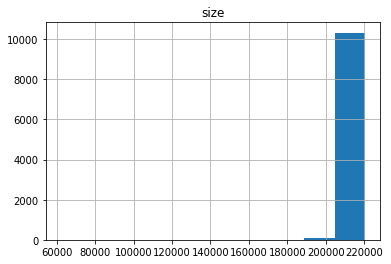

In [109]:
audio_analysis_df.hist(column='size')

In [114]:
#Only 300 clips are less than 10 seconds and most of them are around 9 sec long. Lets delete those 303 <10s audios.
print (audio_analysis_df.shape)
audio_analysis_df.drop(audio_analysis_df[audio_analysis_df['size'] != 220500].index, inplace=True)
print (audio_analysis_df.shape)

(10449, 3)
(10146, 3)


In [115]:
#Lets save these 10 sec audio files to a csv
audio_analysis_df.to_csv('/Users/Amulya/workspace/Fastai/MusicMoodClassification/ten_sec_audio_analysis_df.csv')

## Step 2: Audio to Spectogram

In [213]:
audio_path = Path('/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/')

spectrogram_path = Path('/Users/Amulya/workspace/Fastai/MusicMoodClassification/spectrogram/')
spectrogram2 = Path('/Users/Amulya/workspace/Fastai/MusicMoodClassification/spectrogram2/')
if spectrogram2.exists()==False:
    spectrogram2.mkdir()

In [224]:
# Code taken directly from https://github.com/etown/dl1/blob/master/UrbanSoundClassification.ipynb with minimal changes 
def spectrogram(audio_file_name):
    fpath = Path(str(audio_path) + '/' + audio_file_name)
    samples, sample_rate = librosa.load(fpath)
    fig = plt.figure(figsize=[0.72,0.72])
    ax = fig.add_subplot(111)
    Pxx, freqs, bins, im = plt.specgram(np.array(samples), Fs=22050)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_frame_on(False)
    fname = audio_file_name.replace('.wav','.png')
    filename  = Path(str(spectrogram2) + '/' + fname)
    plt.savefig(filename, format="png", dpi=400, bbox_inches='tight',pad_inches=0)

In [220]:
#TRYING THINGS OUT
# Code taken directly from https://github.com/etown/dl1/blob/master/UrbanSoundClassification.ipynb with minimal changes 
def spectrogram_2(audio_analysis_df):
    for i in range (0,5):
        fpath = Path(str(audio_path) + '/' + audio_analysis_df['yid'].values[i])
        samples, sample_rate = librosa.load(fpath)
        fig = plt.figure(figsize=[0.72,0.72])
        ax = fig.add_subplot(111)
        Pxx, freqs, bins, im = plt.specgram(np.array(samples), Fs=22050)
        ax.axes.get_xaxis().set_visible(False)
        ax.axes.get_yaxis().set_visible(False)
        ax.set_frame_on(False)
        plt.show()
        fname = audio_analysis_df['yid'].values[i].replace('.wav','.png')
        filename  = Path(str(spectrogram2) + '/' + fname)
        plt.savefig(filename, format="png", dpi=400, bbox_inches='tight',pad_inches=0)
        i=i+1

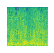

CgCBHTl1BB0.png


<Figure size 432x288 with 0 Axes>

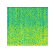

2m4U-85oCF4.png


<Figure size 432x288 with 0 Axes>

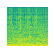

-fA_oNSeikM.png


<Figure size 432x288 with 0 Axes>

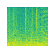

cmad0TBd_KE.png


<Figure size 432x288 with 0 Axes>

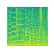

5cxG7j3q2F4.png


<Figure size 432x288 with 0 Axes>

In [221]:
#TRYING THINGS OUT
spectrogram_2(audio_analysis_df)

CgCBHTl1BB0.png
2m4U-85oCF4.png
-fA_oNSeikM.png
cmad0TBd_KE.png
5cxG7j3q2F4.png


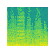

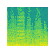

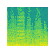

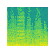

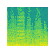

In [208]:
#Testing few before generating all spec
for i in range (0,5):
    spectrogram(audio_analysis_df['yid'].values[i])
    i=i+1
    
    

In [204]:
audio_analysis_df['yid'].values

array(['CgCBHTl1BB0.wav', '2m4U-85oCF4.wav', '-fA_oNSeikM.wav', ...,
       '4KbcqQ-2_tE.wav', 'VGvB2W2L7Co.wav', 'fWvqkf8dgYY.wav'],
      dtype=object)

In [225]:
mp.cpu_count()
with mp.Pool(6) as pool:
    pool.map(spectrogram, audio_analysis_df['yid'].values)

/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7585: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7585: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7585: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7585: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, 

In [159]:
audio_file_name = audio_analysis_df['yid'].values

for i in range (0,5):
    print(str(audio_path) + '/' + audio_file_name[i])

/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/CgCBHTl1BB0.wav
/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/2m4U-85oCF4.wav
/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/-fA_oNSeikM.wav
/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/cmad0TBd_KE.wav
/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/5cxG7j3q2F4.wav


In [158]:
type(audio_file_name), audio_file_name[0]

(numpy.ndarray, 'CgCBHTl1BB0.wav')

In [152]:
Path(str(audio_path) + '/' + audio_file_name[0])

PosixPath('/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/CgCBHTl1BB0.wav')

In [150]:
len(audio_file_name)

10146

In [139]:
spectrogram_path

PosixPath('/Users/Amulya/workspace/Fastai/MusicMoodClassification/spectrogram')

In [137]:
audio_path

PosixPath('/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset')

## Creating the labels.csv file based on the dataset generated above

In [171]:
audio_analysis_df.head()

,yid,size,rate
0,CgCBHTl1BB0.wav,220500,22050
1,2m4U-85oCF4.wav,220500,22050
2,-fA_oNSeikM.wav,220500,22050
3,cmad0TBd_KE.wav,220500,22050
4,5cxG7j3q2F4.wav,220500,22050


In [183]:
moods = pd.read_csv('/Users/Amulya/workspace/Fastai/MusicMoodClassification/clips_metadata', sep=' ')
audio_analysis_df['YID'] = audio_analysis_df.yid.apply(lambda x: x.replace('.wav',''))


In [184]:
audio_analysis_df.head()

,yid,size,rate,YID
0,CgCBHTl1BB0.wav,220500,22050,CgCBHTl1BB0
1,2m4U-85oCF4.wav,220500,22050,2m4U-85oCF4
2,-fA_oNSeikM.wav,220500,22050,-fA_oNSeikM
3,cmad0TBd_KE.wav,220500,22050,cmad0TBd_KE
4,5cxG7j3q2F4.wav,220500,22050,5cxG7j3q2F4


In [190]:
moods.head()

,YTID,start_seconds,end_seconds,positive_labels,type,Happy,Funny,Sad,Tender,Angry,Scary
0,--3flh9REUI,30.0,40.0,"/m/04rlf,/t/dd00034",multi label,0,0,0,1,0,0
1,--CZ-8vrQ1g,30.0,40.0,"/m/04rlf,/t/dd00031",multi label,1,0,0,0,0,0
2,--K3100xfu8,30.0,40.0,"/m/04rlf,/t/dd00033",multi label,0,0,1,0,0,0
3,--WKv2SmvO8,20.0,30.0,"/m/025td0t,/m/04rlf,/m/0l14gg,/t/dd00037",multi label,0,0,0,0,0,1
4,--ip67RoGwo,30.0,40.0,"/m/025td0t,/m/04rlf,/m/09x0r,/t/dd00033",multi label,0,0,1,0,0,0


In [193]:
def mood_label(x):
    if x in moods[moods.Happy==1].YTID.values:
        return "Happy"
    elif x in moods[moods.Funny==1].YTID.values:
        return "Funny"
    elif x in moods[moods.Sad==1].YTID.values:
        return "Sad"
    elif x in moods[moods.Tender==1].YTID.values:
        return "Tender"
    elif x in moods[moods.Angry==1].YTID.values:
        return "Angry"
    elif x in moods[moods.Scary==1].YTID.values:
        return "Scary"
    else:
        return "None"

In [187]:
moods[moods.Happy==1].YTID.values

array(['--CZ-8vrQ1g', '-0Rr5IvwyEY', '-1B50kBrQeY', ..., 'wBozBh7BR6k',
       'xFHF_1FhtIo', 'zBxJvLTe2WQ'], dtype=object)

In [194]:
audio_analysis_df['label'] = audio_analysis_df.YID.apply(mood_label)
audio_analysis_df.shape, audio_analysis_df.head()

((10146, 5),                yid    size   rate          YID   label
 0  CgCBHTl1BB0.wav  220500  22050  CgCBHTl1BB0   Happy
 1  2m4U-85oCF4.wav  220500  22050  2m4U-85oCF4   Angry
 2  -fA_oNSeikM.wav  220500  22050  -fA_oNSeikM  Tender
 3  cmad0TBd_KE.wav  220500  22050  cmad0TBd_KE     Sad
 4  5cxG7j3q2F4.wav  220500  22050  5cxG7j3q2F4  Tender)

In [195]:
audio_analysis_df[['YID', 'label']].to_csv('/Users/Amulya/workspace/Fastai/MusicMoodClassification/input_label.csv', index=False)

In [196]:
labelpath = Path('/Users/Amulya/workspace/Fastai/MusicMoodClassification/input_label.csv')

## Step 3: Training

Lets continue this in AWS Sagemaker, since we need GPU for training

In [ ]:
#Got only 61% accuracy 

Lets try Mel Spectrogram

## Audio to MelSpectrogram

In [227]:
audio_path = Path('/Users/Amulya/workspace/Fastai/MusicMoodClassification/google_audioset/')

melspectrogram_path = Path('/Users/Amulya/workspace/Fastai/MusicMoodClassification/MelSpectrogram/')

if melspectrogram_path.exists()==False:
    melspectrogram_path.mkdir()

In [230]:
import librosa.display
def melspectrogram(audio_file_name):
    fpath = Path(str(audio_path) + '/' + audio_file_name)
    samples, sample_rate = librosa.load(fpath)
    fig = plt.figure(figsize=[0.72,0.72])
    ax = fig.add_subplot(111)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_frame_on(False)
    fname = audio_file_name.replace('.wav','.png')
    S = librosa.feature.melspectrogram(y=samples, sr=sample_rate)
    librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
    filename  = Path(str(melspectrogram_path) + '/' + fname)
    plt.savefig(filename, format="png", dpi=400, bbox_inches='tight',pad_inches=0)

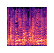

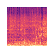

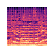

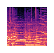

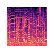

In [231]:
#Testing few before generating all
for i in range (0,5):
    melspectrogram(audio_analysis_df['yid'].values[i])
    i=i+1
    

In [232]:
mp.cpu_count()
with mp.Pool(6) as pool:
    pool.map(melspectrogram, audio_analysis_df['yid'].values)

/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/Amulya/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed